# Preliminaries

In [1]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import time
import seaborn as sns

pd.set_option('display.max_columns', None)

In [2]:
def map_ageing_class(row):
    if row in ['01 mo', '02 mos', '03 mos', '04 mos', '05 mos']:
        return 1
    elif row in [' Current', 'FP']:
        return 0
    else:
        return np.nan
    
def adjust_data_types(df):
    for col in df.columns:
        unique_vals = df[col].unique()
        if df[col].dtypes == 'category':
            None
        elif (set(unique_vals) != {0, 1}):
            df[col] = df[col].astype('float64')
        else:
            df[col] = df[col].astype('int64')
    return df

def ohe_cols(df, cat_cols):
    for col in cat_cols:
        if df[col].nunique() == 2:
            df = pd.get_dummies(df, columns=[col], prefix=col,
                                drop_first='True')
        else:
            df = pd.get_dummies(df, columns=[col], prefix=col)
                            
    return df

In [70]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.feature_selection import RFE, RFECV, VarianceThreshold

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, make_scorer, confusion_matrix, roc_curve, precision_recall_curve, fbeta_score
from sklearn.model_selection import GridSearchCV, StratifiedKFold, permutation_test_score
from sklearn.base import clone


from imblearn.metrics import geometric_mean_score
import shap

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline
# from sklearn.pipeline import Pipeline

import dice_ml

from catboost import CatBoostClassifier
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [4]:
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    return specificity

specificity_scorer = make_scorer(specificity_score)

def npv_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    npv = tn / (tn + fn)
    return npv

npv_scorer = make_scorer(npv_score)

g_mean_scorer = make_scorer(geometric_mean_score)


skf = StratifiedKFold(10, shuffle=True, random_state=0)

def get_cat_cols(df):
    return df.select_dtypes(include=['object']).columns.tolist()


# def f2_func(y_true, y_pred):
#     f2_score = fbeta_score(y_true, y_pred, beta=2)
#     return f2_score

# fbeta_scorer = make_scorer()
def fbeta_scorer(beta=2):
    return make_scorer(fbeta_score, beta=beta)


In [57]:
from sklearn.decomposition import PCA, TruncatedSVD

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours, TomekLinks
from imblearn.combine import SMOTEENN, SMOTETomek


from sklearn.base import BaseEstimator, TransformerMixin

class DropCategoricalFeatures(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        # Assuming X is a DataFrame
        non_categorical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
        return X[non_categorical_cols]


def knn_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', KNeighborsClassifier())
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_neighbors': list(range(1, 16)),
        'classifier__metric': ['euclidean', 'cosine', 'hamming', 'braycurtis',
                               'chebyshev', 'canberra', 'cityblock', 'sqeuclidean'
                              ]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def svm_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', SVC(random_state=random_state, max_iter=1000,
                           verbose=True))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__probability': [True, False],
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def logreg_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('drop_categorical', None),
#         ('encoder', None),
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', LogisticRegression(random_state=random_state, max_iter=1000))
    ])

    param_grid = {
#         'drop_categorical': [None, DropCategoricalFeatures()]
#         'encoder': [None, OneHotEncoder(sparse_output=False)],
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l2'],
        'classifier__solver': ['liblinear', 'lbfgs', 'newton-cholesky']
#         'classifier__penalty': ['l1', l2', 'elasticnet', 'None']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df



def dt_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]


    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', DecisionTreeClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(), 
            RobustScaler(),
            MinMaxScaler()
        ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
            SMOTEENN(random_state=random_state),
            SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
            TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
#         'classifier__max_depth': [3],
# #         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [1],
#         'classifier__max_depth': [2, 5],
#         'classifier__min_samples_split': [3],
#         'classifier__min_samples_leaf': [3],
# #         'classifier__max_features': ['auto', 'sqrt', 'log2', None],
#         'classifier__criterion': ["entropy", "log_loss"]
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [2, 3],
        'classifier__max_depth': [2, 3, 5],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [1, 2, 3],
        'classifier__max_features': ['sqrt', 'log2', None],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()


        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df


def rf_class2(df, scorer, label_col, random_state=0):
#     df_majority = df[df.home_ownership_class == 0]
#     df_minority = df[df.home_ownership_class == 1]

# #     display(df_majority)
# #     display(df_minority)
# #     print(len(df_majority), len(df_minority))
#     # Randomly downsample majority class
#     df_majority_downsampled = df_majority.sample(frac=0.2,
#                                                  random_state=random_state)
#     df = pd.concat([df_majority_downsampled, df_minority], axis=0)

    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)

#     n_components = X_scaled.shape[1]  # Maximum number of components
#     svd = TruncatedSVD(n_components=n_components)
#     X_svd = svd.fit_transform(X_scaled)

#     # Step 3: Find number of components that explain at least 90% variance
#     cum_variance = np.cumsum(svd.explained_variance_ratio_)
#     num_components = np.argmax(cum_variance >= 0.90) + 1  # +1 because Python indexing starts from 0
#     X_selected = X_svd[:, :num_components]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

#     X_resampled, y_resampled = RandomOverSampler(random_state=random_state).fit_resample(X_train, y_train)
#     class_counts_original = np.bincount(y_train.astype(int))
#     class_counts_resampled = np.bincount(y_resampled.astype(int))

    # Assuming 0 is the majority class, calculate its upweight factor
#     majority_class_original = class_counts_original[0]
#     majority_class_resampled = class_counts_resampled[0]
#     upweight_factor = majority_class_original / majority_class_resampled

#     minority_class_original = class_counts_original[1]
#     minority_class_resampled = class_counts_resampled[1]
#     downweight_factor = minority_class_original / minority_class_resampled

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', RandomForestClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_estimators': [200, 300],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__oob_score': [True, False],
        'classifier__criterion': ["gini", "entropy", "log_loss"]

#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__oob_score': [True, False],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
    }
#         'classifier__n_estimators': [200, 250, 300],
# #         'classifier__max_depth': [2, 3, 4],
#         'classifier__max_depth': [2],
#         'classifier__class_weight': [{0: 263/807, 1:1}],
#         'classifier__oob_score': [True],
# #         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
#     }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def gbm_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', GradientBoostingClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
        'classifier__n_estimators': [200, 250],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def lgbm_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     plt.figure(figsize=(10, 6))
#     plt.plot(range(1, len(explained_var_ratio)+1), cumulative_explained_var, marker='o', linestyle='--')
#     plt.title('Cumulative Explained Variance Plot')
#     plt.xlabel('Number of Components')
#     plt.ylabel('Cumulative Explained Variance')
#     plt.grid(True)
#     plt.show()

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', LGBMClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [400, 450],
#         'classifier__learning_rate': [0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__max_depth': [2, 3],
#         'classifier__boosting_type': ['gbdt', 'dart', 'goss']

        'classifier__n_estimators': [200, 300, 400],
        'classifier__learning_rate': [0.1, 0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
        'classifier__max_depth': [2, 3],
        'classifier__boosting_type': ['gbdt', 'dart', 'goss']
    }
#         'classifier__num_leaves': [20, 31, 40],
#         'classifier__min_child_samples': [10, 20, 30],
#         'classifier__max_depth': [-1, 5, 10],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def xgb_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', XGBClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
# #         'classifier__n_estimators': [200, 250],
#         'classifier__learning_rate': [2, 3],
# #         'classifier__max_depth': [2, 3],
#         'classifier__max_leaves': [5],
#         'classifier__grow_policy': ['depthwise', 'lossguide']
        'classifier__n_estimators': [200, 250],
        'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__max_depth': [None, 2, 3],
        'classifier__max_leaves': [10, 20, 30],
        'classifier__grow_policy': ['depthwise', 'lossguide']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def adaboost_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', AdaBoostClassifier(
            random_state=random_state))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [200, 300],
        'classifier__estimator': [DecisionTreeClassifier(
            random_state=random_state,
#             criterion='entropy', max_depth=3,
#             min_samples_leaf=2, min_samples_split=2
        ),
                                  RandomForestClassifier(
            random_state=random_state,
#             max_depth=3, min_samples_leaf=2,
#             min_samples_split=2, n_estimators=250,
#             oob_score=True
                                                        )],
#         'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__algorithm': ['SAMME', 'SAMME.R']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
#                                cv=10, scoring=scorer,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])


    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def ridge_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]
    
    cat_transformer = Pipeline([
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])
    
    num_transformer = Pipeline([
        ('variance_threshold', VarianceThreshold(threshold=0.15))
    ])
    
    preprocessor = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols),
            ('cat', cat_transformer, cat_cols)
        ],
        remainder='passthrough'
    )

    preprocessor_num = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols)
        ],
        remainder='drop'
    )

    preprocessor_drop_cat = ColumnTransformer(
        transformers = [
            ('num', 'passthrough', num_cols)
        ],
        remainder='drop'
    )

    pipeline = Pipeline([
#         ('preprocessor', None),
        ('preprocessor', preprocessor_drop_cat),
#         ('scaler', None),
        ('resampling', None),
        ('var_threshold', VarianceThreshold(threshold=0.15)),
        ('classifier', RidgeClassifier(max_iter=1000, random_state=random_state))
    ])

    param_grid = {
#         'preprocessor': [
#             preprocessor_drop_cat,
#             preprocessor,
#             preprocessor_num            
#         ],
        'resampling': [ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__alpha': [0.01, 0.1, 1, 10, 100, 1000],
        'classifier__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'],
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()


        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

def catboost_class2(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', CatBoostClassifier(random_state=random_state))
    ])

    param_grid = {
        'scaler': [
            StandardScaler(),
            MinMaxScaler(),
            RobustScaler()
        ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_leaf': [2, 3],
#         'classifier__min_samples_split': [2, 3],
#         'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f_1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)
        f_0pt5 = fbeta_score(y_test, y_pred, beta=0.5)
        f_0pt75 = fbeta_score(y_test, y_pred, beta=0.75)
        f_1pt5 = fbeta_score(y_test, y_pred, beta=1.5)
        f_2 = fbeta_score(y_test, y_pred, beta=2)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Accuracy: {accuracy}")
        print(f"Test Recall: {recall}")
        print(f"Test F-0.5 Score: {f_0pt5}")
        print(f"Test F-0.75 Score: {f_0pt75}")
        print(f"Test F-1 Score: {f_1}")
        print(f"Test F-1.5 Score: {f_1pt5}")
        print(f"Test F-2 Score: {f_2}")
        print(f"Test G-Mean Score: {g_mean}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
        tpr, fpr, thresholds = roc_curve(y_test, y_hat)
        gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(rec)
        ix = np.argmax(gmeans)
#         print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))
        print(f'Best Threshold={thresholds[ix]:.3f}')
        print(f'Best Recall={tpr[ix]:.3f}')
        print(f'Best G-Mean={gmeans[ix]:.3f}')
    
        plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(rec, prec, marker='.', label='Original')
        plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')
        plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('Recall')
#         plt.ylabel('Precision')
        plt.xlabel('False Positive Rate (FPR)')
        plt.ylabel('Recall / True Positive Rate (TPR)')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F-0.5 Score': f_0pt5,
            'Test F-0.75 Score': f_0pt75,
            'Test F-1 Score': f_1,
            'Test F-1.5 Score': f_1pt5,
            'Test F-2 Score': f_2,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Stdev Test Accuracy:", std_metrics['Test Accuracy'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test F-0.5 Score:", avg_metrics['Test F-0.5 Score'])
    print("Stdev Test F-0.5 Score:", std_metrics['Test F-0.5 Score'])
    print("Ave Test F-0.75 Score:", avg_metrics['Test F-0.75 Score'])
    print("Stdev Test F-0.75 Score:", std_metrics['Test F-0.75 Score'])
    print("Ave Test F-1 Score:", avg_metrics['Test F-1 Score'])
    print("Stdev Test F-1 Score:", std_metrics['Test F-1 Score'])
    print("Ave Test F-1.5 Score:", avg_metrics['Test F-1.5 Score'])
    print("Stdev Test F-1.5 Score:", std_metrics['Test F-1.5 Score'])
    print("Ave Test F-2 Score:", avg_metrics['Test F-2 Score'])
    print("Stdev Test F-2 Score:", std_metrics['Test F-2 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print('Stdev Test G-mean:', std_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Stdev Test Specificity:", std_metrics['Test Specificity'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'stdev_test_specificity': std_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f_0pt5_score': avg_metrics['Test F-0.5 Score'],
        'stdev_test_f_0pt5_score': std_metrics['Test F-0.5 Score'],
        'average_test_f_0pt75_score': avg_metrics['Test F-0.75 Score'],
        'stdev_test_f_0pt75_score': std_metrics['Test F-0.75 Score'],
        'average_test_f_1_score': avg_metrics['Test F-1 Score'],
        'stdev_test_f_1_score': std_metrics['Test F-1 Score'],
        'average_test_f_1pt5_score': avg_metrics['Test F-1.5 Score'],
        'stdev_test_f_1pt5_score': std_metrics['Test F-1.5 Score'],
        'average_test_f_2_score': avg_metrics['Test F-2 Score'],
        'stdev_test_f_2_score': std_metrics['Test F-2 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

In [91]:
import optuna
from optuna.integration import OptunaSearchCV

def objective(trial):
    C = trial.suggest_int('C', 1, 10)
    kernel = trial.suggest_categorical("kernel", ['linear', 'poly','rbf'])
    degree =trial.suggest_int("degree", 1, 3)
    gamma = trial.suggest_categorical("gamma", ["scale","auto"])

    model= SVC(kernel=kernel, C=C, degree = degree, gamma= gamma, probability = True)
    model.fit(X_train,y_train)
    y_pred = model.predict(X_test)
    f1 = f1_score(y_test, y_pred, average='binary')
    
    return f1

#call the function
# study = optuna.create_study(direction='maximize')
# study.optimize(objective, n_trials=10)
# trial = study.best_trial


def dt_class2_optuna(df, scorer, label_col, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)


    pipeline = Pipeline([
        ('scaler', RobustScaler()),
        ('resampling', None),
        ('classifier', DecisionTreeClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(), 
#             RobustScaler(),
#             MinMaxScaler()
#         ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
            SMOTEENN(random_state=random_state),
            SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
            TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__max_depth': [2, 3, 5],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [1, 2, 3],
        'classifier__max_features': ['sqrt', 'log2', None],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }

    start_time_cv = time.time()
    grid_search = OptunaSearchCV(pipeline, param_grid,
                                 cv=skf, scoring=scorer,
                                 n_jobs=-1, verbose=4,
                                 return_train_score=True,
                                 enable_pruning=True)

    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Recall):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Recall)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Recall)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

#         modified_estimator = best_estimator
        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Recall: {recall}")

        y_hat = modified_estimator.predict_proba(X_test)[:, 1]

        prec, rec, thresholds = precision_recall_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
        ix = np.argmax(rec)
        print('Best Threshold=%f, Recall=%.3f' % (thresholds[ix], rec[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
        plt.plot(rec, prec, marker='.', label='Original')
        plt.scatter(rec[ix], prec[ix], marker='o', color='black', label='Best')

        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.legend()

        plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print("Stdev Test Recall:", std_metrics['Test Recall'])
    print("Ave Test Precision:", avg_metrics['Test Precision'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print('Ave Test G-mean:', avg_metrics['Test G-mean'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_runtime': avg_metrics['Runtime'],
        'average_test_g_mean': avg_metrics['Test G-mean'],
        'stdev_test_g_mean': std_metrics['Test G-mean'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'stdev_test_recall': std_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'average_test_precision': avg_metrics['Test Precision'],
        'average_test_f1_score': avg_metrics['Test F1 Score']
    }

    return grid_search, best_estimator, model_info, metrics_df

# Source Dataset

In [5]:
dataset = pd.read_csv('df_merged_no_nans.csv')
dataset = dataset.rename(columns={
    'Group': 'group',
    ' loanval ': 'loan_value'
})

dataset.loc[dataset['basicMonthlySalary'] < 100,
            'basicMonthlySalary'] *= 1000
dataset

cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'dateEntry',
    'occupation'
]

dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int64'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job', 'group']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

dataset['ageing_class'] = dataset['foundInHDMF'].apply(map_ageing_class)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

dataset = dataset.dropna()
dataset['ageing_class'] = dataset['ageing_class'].astype(int)
# dataset['userId'] = dataset['userId'].astype('category')
cat_cols = ['userId', 'lastFirstName', 'gender',
            'province', 'job', 'group']
ord_cols = ['preferredNetDisposableIncomeId']
dataset[cat_cols] = dataset[cat_cols].apply(lambda x: x.astype('category'))
dataset[ord_cols] = dataset[ord_cols].apply(lambda x: x.astype(int))


dataset['loan_value'] = dataset['loan_value'].str.replace(',', '').str.strip().astype('float')
dataset = adjust_data_types(dataset)


dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 251 entries, 0 to 1055
Data columns (total 63 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   userId                          251 non-null    category
 1   lastFirstName                   251 non-null    category
 2   age                             251 non-null    float64 
 3   gender                          251 non-null    category
 4   province                        251 non-null    category
 5   job                             251 non-null    category
 6   group                           251 non-null    category
 7   basicMonthlySalary              251 non-null    float64 
 8   preferredNetDisposableIncomeId  251 non-null    float64 
 9   workingFamilyCount              251 non-null    float64 
 10  residentsCount                  251 non-null    float64 
 11  monthlyFamilyIncome             251 non-null    float64 
 12  food                 

## EDA

Population per class:     0
0  179
1   72
Proportion Chance Criterion: 59.09%
1.25 * Proportion Chance Criterion: 73.86%


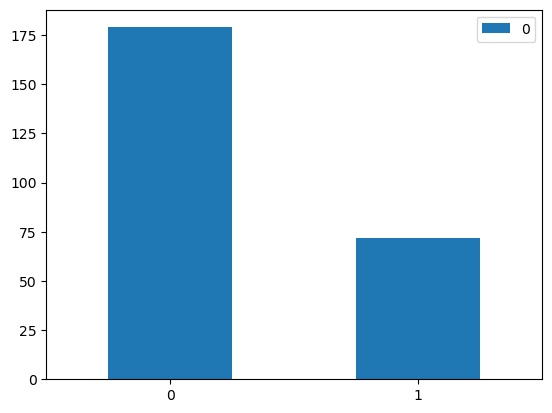

In [6]:
state_counts = Counter(dataset['ageing_class'])
df_state = pd.DataFrame.from_dict(state_counts, orient='index')
df_state.plot(kind='bar')

num=(df_state[0]/df_state[0].sum())**2

print("Population per class:{}".format(df_state))

print("Proportion Chance Criterion: {:0.2f}%".format(100*num.sum()))
print("1.25 * Proportion Chance Criterion: {:0.2f}%".format(1.25*100*num.sum()))
plt.xticks(rotation=0)
plt.show()

NameError: name 'df_combined' is not defined

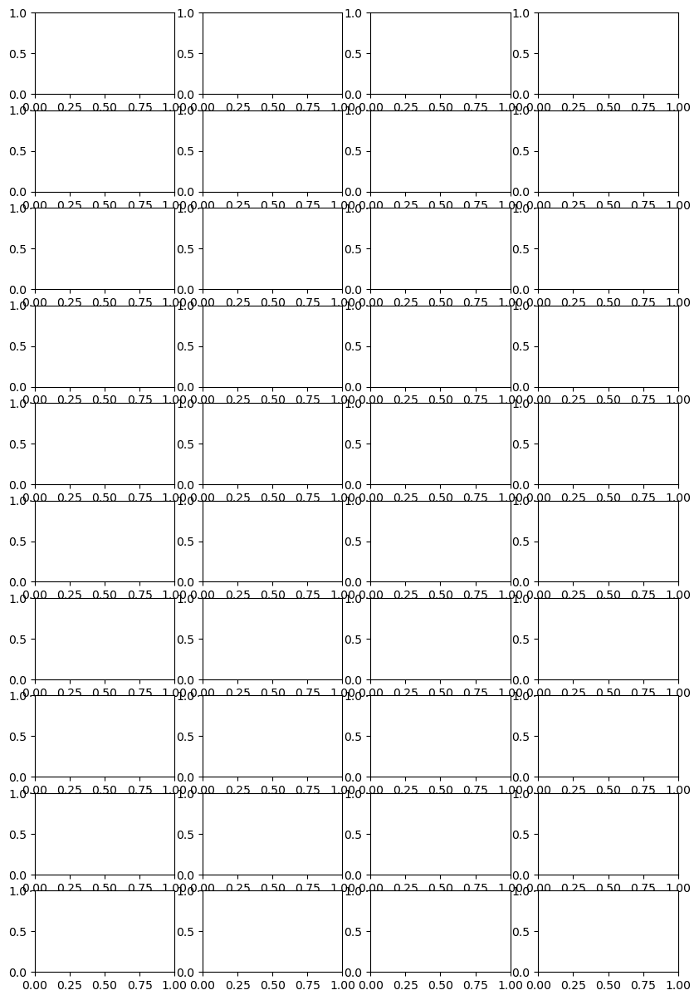

In [7]:
continuous_columns = ['basicMonthlySalary', 'workingFamilyCount', 'residentsCount', 'monthlyFamilyIncome', 
                      'food', 'hygiene',  'houseCleaning', 'fare', 'parking', 'gasoline', 'tuition', 
                      'allowance', 'uniform', 'otherEducation', 'emergency', 'medicine', 'water', 
                      'electricity', 'rent', 'repair', 'cinema', 'dineOut', 'leisure', 
                      'personalCare', 'clothing', 'mobileLoad', 'internet', 'vehicleLoan', 
                      'informalLenders', 'companyLoan', 'privateLoans', 'governmentLoans', 
                      'smoking', 'alcohol', 'gambling', 'smallLottery', 'otherVices', 'savings', 'age', 'loan_value'
                      ]

# fig, axes = plt.subplots(10, 4, figsize=(20, 30))
fig, axes = plt.subplots(10, 4, figsize=(10, 15))

for idx, col in enumerate(continuous_columns):
    ax = axes[idx // 4, idx % 4]
    df_combined[col].hist(ax=ax, bins=15)
    ax.set_title(col)

# Remove any empty subplots
for idx in range(len(continuous_columns), 40):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()

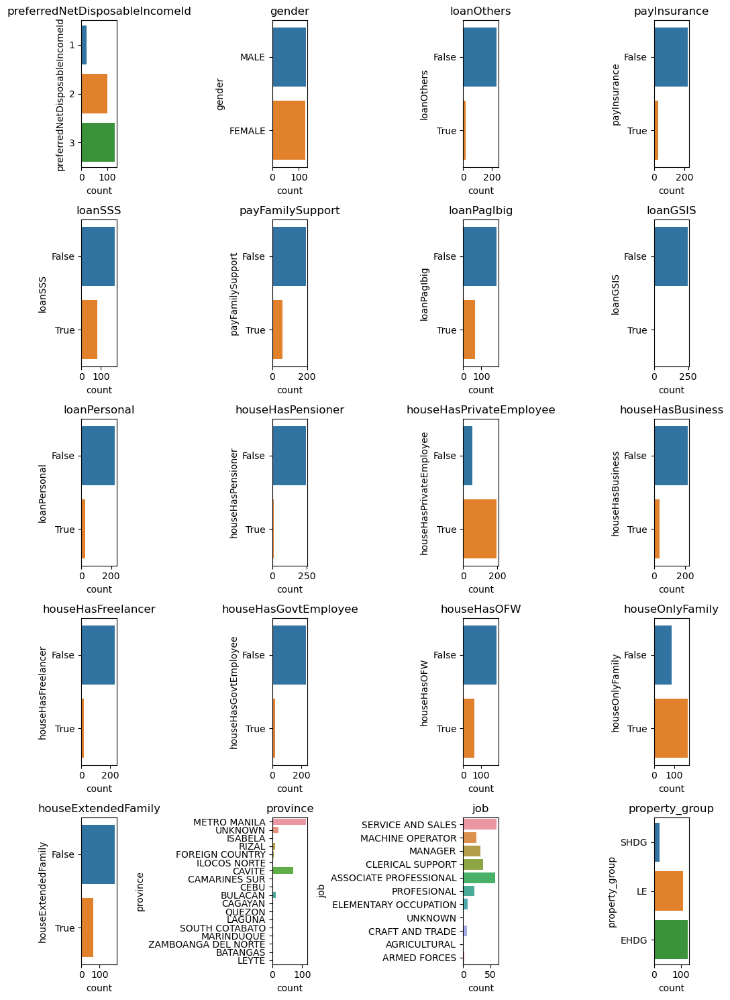

In [38]:
categorical_columns = ['preferredNetDisposableIncomeId', 'gender', 'loanOthers', 'payInsurance', 'loanSSS',
                       'payFamilySupport', 'loanPagIbig', 'loanGSIS', 'loanPersonal',
                       'houseHasPensioner', 'houseHasPrivateEmployee', 'houseHasBusiness', 'houseHasFreelancer', 
                       'houseHasGovtEmployee', 'houseHasOFW', 'houseOnlyFamily', 'houseExtendedFamily',
                       'province', 'job', 'property_group']

# fig, axes = plt.subplots(5, 4, figsize=(20, 20))
fig, axes = plt.subplots(5, 4, figsize=(10, 15))

for idx, col in enumerate(categorical_columns):
    ax = axes[idx // 4, idx % 4]
    sns.countplot(y=df_combined[col], ax=ax)
    ax.set_title(col)

# Remove any empty subplots
for idx in range(len(categorical_columns), 20):
    fig.delaxes(axes.flatten()[idx])

plt.tight_layout()
plt.show()

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


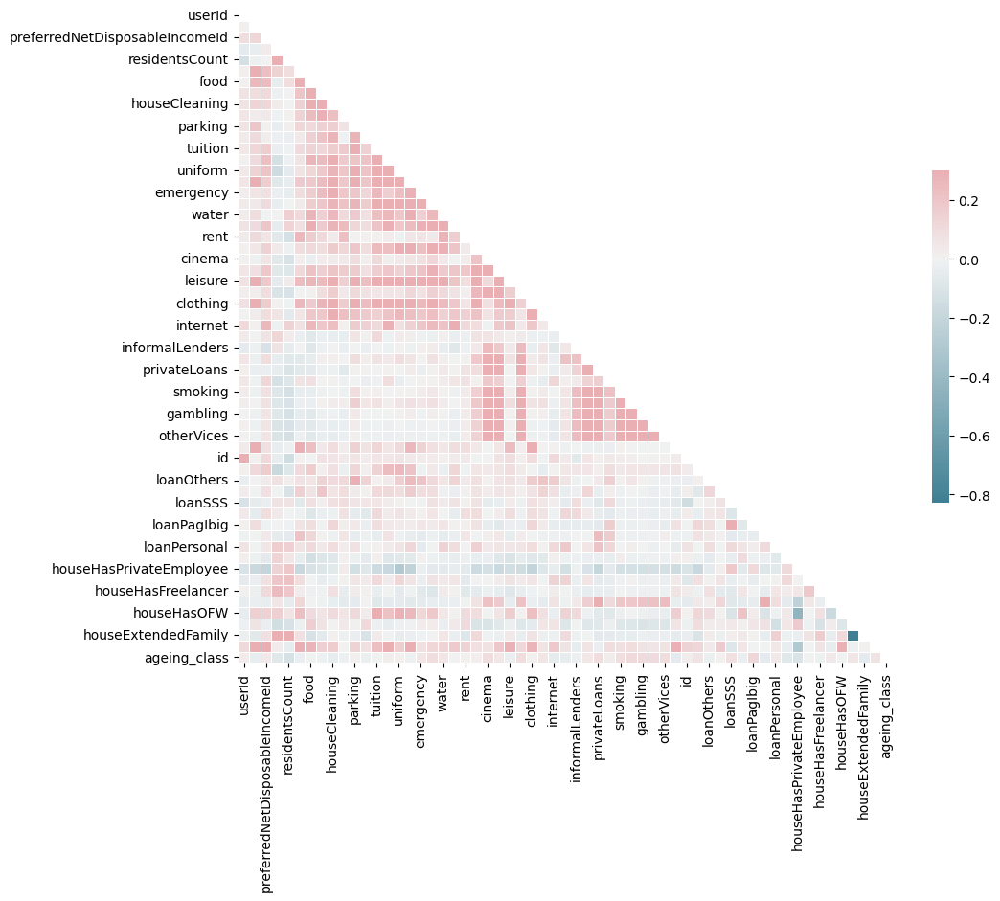

[('gambling', 'smallLottery', 0.9961546265783418),
 ('smallLottery', 'otherVices', 0.9953991941921801),
 ('gambling', 'otherVices', 0.992154647460432),
 ('smoking', 'gambling', 0.9811136032027008),
 ('smoking', 'smallLottery', 0.9810490167590084),
 ('smoking', 'otherVices', 0.9761216722796048),
 ('smoking', 'alcohol', 0.9682647963019225),
 ('alcohol', 'gambling', 0.9660926653670896),
 ('alcohol', 'smallLottery', 0.9646241967419544),
 ('alcohol', 'otherVices', 0.9595161378888936),
 ('cinema', 'otherVices', 0.9557311762944339),
 ('cinema', 'alcohol', 0.9545147701645146),
 ('cinema', 'gambling', 0.9528491877624305)]

In [20]:
# Assuming df_combined is your dataframe
correlation_matrix = df_combined.corr()

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(correlation_matrix, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.show()

# Create an empty list to store the correlated pairs
highly_correlated_pairs = []

# Iterate over the pairs of columns
for i, column1 in enumerate(correlation_matrix.columns):
    for j, column2 in enumerate(correlation_matrix.columns):
        # We use j > i to avoid duplicate pairs and self-correlation
        if j > i:
            # Check if the correlation is greater than 0.95
            if abs(correlation_matrix.loc[column1, column2]) > 0.95:
                highly_correlated_pairs.append((column1, column2, correlation_matrix.loc[column1, column2]))

# Sort the pairs by the absolute value of their correlation in descending order
highly_correlated_pairs.sort(key=lambda x: -abs(x[2]))

# Return the list of highly correlated pairs
highly_correlated_pairs

# LD_T01: Original

In [8]:
ld_t01 = dataset.copy()
# ld_t01

# LD_T02: OHE

In [92]:
cat_cols = ['gender', 'province', 'job', 'group']
ld_t02 = ohe_cols(ld_t01.copy(), cat_cols)
ld_t02

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,loan_value,ageing_class,gender_MALE,province_BATANGAS,province_BULACAN,province_CAGAYAN,province_CAMARINES SUR,province_CAVITE,province_CEBU,province_FOREIGN COUNTRY,province_ILOCOS NORTE,province_ISABELA,province_LAGUNA,province_LEYTE,province_MARINDUQUE,province_METRO MANILA,province_QUEZON,province_RIZAL,province_SOUTH COTABATO,province_UNKNOWN,province_ZAMBOANGA DEL NORTE,job_AGRICULTURAL,job_ARMED FORCES,job_ASSOCIATE PROFESSIONAL,job_CLERICAL SUPPORT,job_CRAFT AND TRADE,job_ELEMENTARY OCCUPATION,job_MACHINE OPERATOR,job_MANAGER,job_PROFESIONAL,job_SERVICE AND SALES,job_UNKNOWN,group_EHDG,group_LE,group_SHDG
0,370,"IBALI, HOWARD",24.0,19000.0,2.0,3.0,3.0,40000.0,1000.0,500.0,200.0,200.0,0.0,0.0,0.0,50.0,0.0,0.0,500.0,450.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2000.0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,652000.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
3,1719,"OSCARES, ELMER",32.0,21200.0,2.0,0.0,5.0,12000.0,2000.0,500.0,200.0,392.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,200.0,200.0,3000.0,0.0,0.0,0.0,0.0,100.0,200.0,400.0,0.0,0.0,0.0,0.0,0.0,876.0,0.0,0.0,0.0,0.0,0.0,500.0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,800000.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0
9,4090,"MILLARES, LEONORA",42.0,40000.0,3.0,2.0,4.0,43000.0,5000.0,1500.0,1000.0,500.0,0.0,0.0,1500.0,3500.0,1000.0,0.0,1500.0,500.0,300.0,500.0,2600.0,0.0,0.0,1500.0,1000.0,200.0,1000.0,100.0,1200.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12000.0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,1420000.00,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
11,4568,"MORENO, GWENDOLYN",36.0,30500.0,3.0,1.0,6.0,60000.0,12000.0,500.0,200.0,0.0,0.0,2000.0,0.0,0.0,0.0,0.0,0.0,0.0,600.0,2000.0,0.0,0.0,0.0,500.0,500.0,100.0,0.0,0.0,1625.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,500.0,0,0,1,1,1,0,0,0,1,1,0,0,0,1,0,1449000.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
13,5382,"SOL, MARY GRACE",41.0,30000.0,2.0,2.0,10.0,56000.0,10000.0,500.0,1000.0,2000.0,100.0,900.0,1000.0,2000.0,0.0,500.0,500.0,500.0,300.0,1200.0,0.0,500.0,0.0,100.0,200.0,0.0,200.0,100.0,600.0,0.0,0.0,0.0,0.0,2000.0,0.0,0.0,0.0,0.0,0.0,5800.0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,800000.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1031,12795,"SY, ARMANDO",43.0,27858.0,2.0,1.0,4.0,28000.0,6000.0,1500.0,1500.0,1000.0,3500.0,2500.0,0.0,1000.0,1000.0,1000.0,500.0,500.0,1000.0,2000.0,0.0,0.0,0.0,1000.0,1000.0,300.0,500.0,0.0,2000.0,13000.0,0.0,0.0,0.0,0.0,200.0,200.0,0.0,0.0,0.0,5000.0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,800000.00,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1044,12815,"DELA CRUZ, EDWARD EROLL",37.0,30000.0,3.0,2.0,3.0,60000.0,4000.0,1000.0,1000.0,0.0,400.0,1000.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,700.0,4000.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0,1500.0,6000.0,0.0,0.0,0.0,0.0,200.0,0.0,0.0,0.0,0.0,3000.0,0,0,0,0,0,0,0,0,1,0,0,0,

## Optimizing for Recall

In [93]:
ld_t02['ageing_class'].value_counts()

0    179
1     72
Name: ageing_class, dtype: int64

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': SMOTEENN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 1.0
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', SMOTEENN(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        max_features='sqrt', random_state=0))])
Mean Train Score (Recall) 0.6095808378649814
Std Train Score (Recall) 0.13170047507314017
GridSearchCV Runtime: 51.67418122291565 secs
Run 1 - Random State: 0
Test Accuracy: 0.2857142857142857
Test Recall: 0.8333333333333334
Test F-0.5 Score: 0.30487804878048774
Test F-0.75 Score: 0.3491620111731843
Test F-1 Score: 0.39999999999

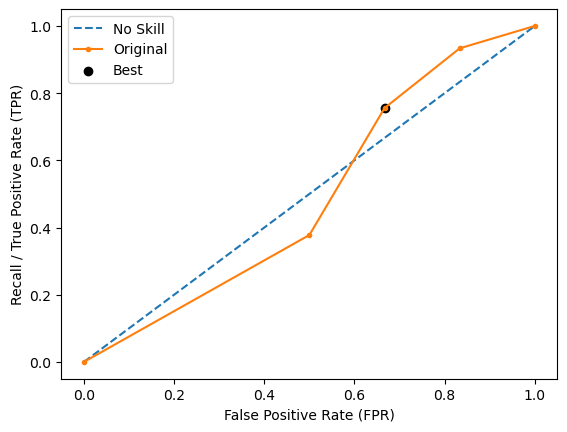

Run 2 - Random State: 1
Test Accuracy: 0.38095238095238093
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.3155339805825243
Test F-0.75 Score: 0.35557986870897157
Test F-1 Score: 0.4
Test F-1.5 Score: 0.48285714285714276
Test F-2 Score: 0.546218487394958
Test G-Mean Score: 0.4201704533597564
Best Threshold=0.967
Best Recall=0.356
Best G-Mean=0.487


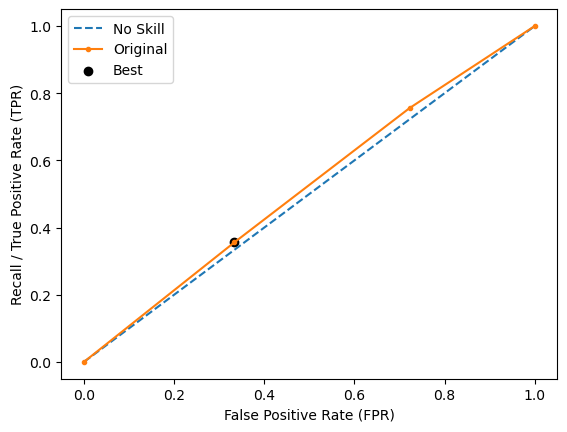

Run 3 - Random State: 2
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.946
Best Recall=0.400
Best G-Mean=0.447


invalid value encountered in longlong_scalars


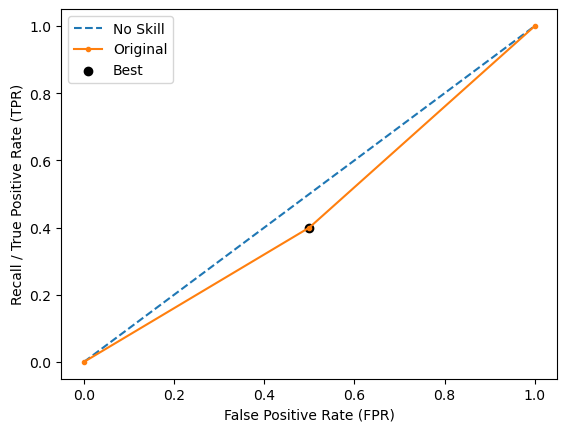

Run 4 - Random State: 3
Test Accuracy: 0.5555555555555556
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.411764705882353
Test F-0.75 Score: 0.4545454545454545
Test F-1 Score: 0.5
Test F-1.5 Score: 0.5796178343949044
Test F-2 Score: 0.6363636363636364
Test G-Mean Score: 0.6024640760767094
Best Threshold=0.902
Best Recall=0.289
Best G-Mean=0.358


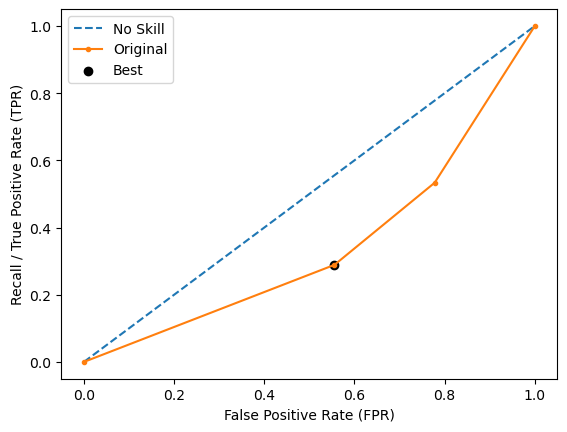

Run 5 - Random State: 4
Test Accuracy: 0.3333333333333333
Test Recall: 0.9444444444444444
Test F-0.5 Score: 0.33999999999999997
Test F-0.75 Score: 0.3899082568807339
Test F-1 Score: 0.44736842105263147
Test F-1.5 Score: 0.5609137055837562
Test F-2 Score: 0.6538461538461537
Test G-Mean Score: 0.28974232912011766
Best Threshold=0.920
Best Recall=0.578
Best G-Mean=0.474


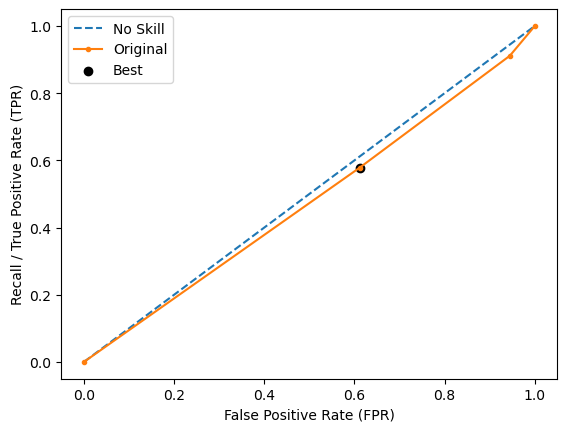

Ave Test Accuracy: 0.3682539682539682
Stdev Test Accuracy: 0.11190194750485441
Ave Test Recall: 0.8555555555555555
Stdev Test Recall: 0.11520245196293179
Ave Test F-0.5 Score: 0.3411020137157396
Stdev Test F-0.5 Score: 0.04189475756964939
Ave Test F-0.75 Score: 0.3867621951847458
Stdev Test F-0.75 Score: 0.041818620468404503
Ave Test F-1 Score: 0.4383625730994152
Stdev Test F-1 Score: 0.04141449287675397
Ave Test F-1.5 Score: 0.5377212148280301
Stdev Test F-1.5 Score: 0.04324989745864072
Ave Test F-2 Score: 0.6168980586217248
Stdev Test F-2 Score: 0.05117867963105841
Ave Test G-mean: 0.30961582379041985
Stdev Test G-mean: 0.22344045849616784
Ave Test Specificity: 0.17333333333333334
Stdev Test Specificity: 0.18685176008513696
Ave Test Precision: 0.297398485207884
Ave Test NPV: 0.7068749999999999
Ave Runtime: 0.04097857475280762


In [94]:
ld_t02_dt_gs, ld_t02_dt_be, ld_t02_dt_model_info, ld_t02_dt_metrics_df = dt_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'newton-cholesky', 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.9199999999999999
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0,
                                    solver='newton-cholesky'))])
Mean Train Score (Recall) 0.798475420082563
Std Train Score (Recall) 0.06064465742125294
GridSearchCV Runtime: 16.736729621887207 secs
Run 1 - Random State: 0
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean 

invalid value encountered in longlong_scalars


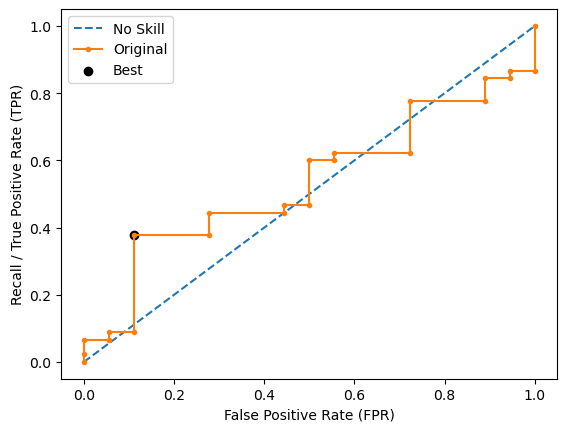

Run 2 - Random State: 1
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.524
Best Recall=0.644
Best G-Mean=0.655


invalid value encountered in longlong_scalars


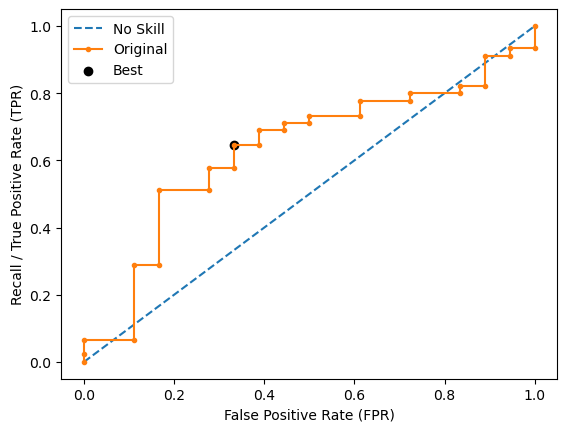

Run 3 - Random State: 2
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.545
Best Recall=0.467
Best G-Mean=0.483


invalid value encountered in longlong_scalars


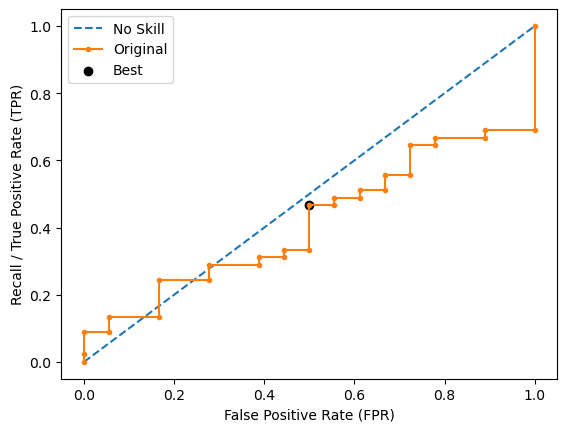

Run 4 - Random State: 3
Test Accuracy: 0.7142857142857143
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.491
Best Recall=0.311
Best G-Mean=0.492


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


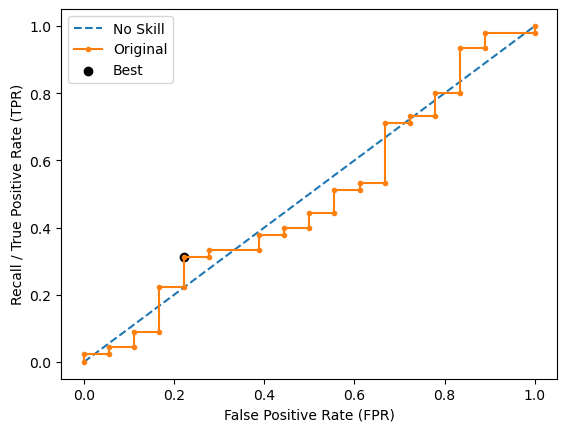

invalid value encountered in longlong_scalars


Run 5 - Random State: 4
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.505
Best Recall=0.533
Best G-Mean=0.544


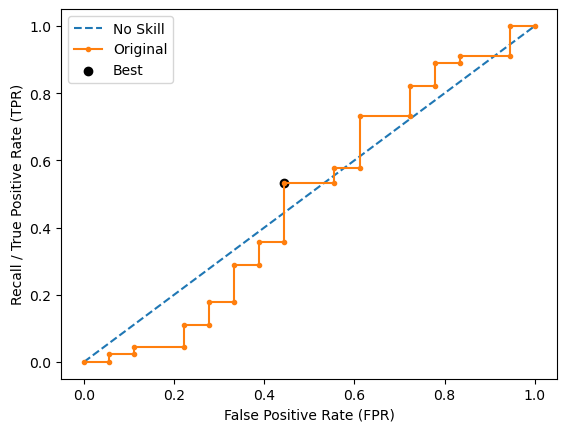

Ave Test Accuracy: 0.37142857142857144
Stdev Test Accuracy: 0.191662969499982
Ave Test Recall: 0.8
Stdev Test Recall: 0.4472135954999579
Ave Test F-0.5 Score: 0.26666666666666666
Stdev Test F-0.5 Score: 0.14907119849998596
Ave Test F-0.75 Score: 0.3076923076923077
Stdev Test F-0.75 Score: 0.17200522903844537
Ave Test F-1 Score: 0.35555555555555557
Stdev Test F-1 Score: 0.1987615979999813
Ave Test F-1.5 Score: 0.4521739130434782
Stdev Test F-1.5 Score: 0.25277290180432405
Ave Test F-2 Score: 0.5333333333333333
Stdev Test F-2 Score: 0.2981423969999719
Ave Test G-mean: 0.0
Stdev Test G-mean: 0.0
Ave Test Specificity: 0.2
Stdev Test Specificity: 0.447213595499958
Ave Test Precision: 0.22857142857142856
Ave Test NPV: 0.7142857142857143
Ave Runtime: 0.017018842697143554


In [95]:
ld_t02_logreg_gs, ld_t02_logreg_be, ld_t02_logreg_model_info, ld_t02_logreg_metrics_df = logreg_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': SMOTE(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 1.0
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.7255210513692657
Std Train Score (Recall) 0.1399446616037996
GridSearchCV Runtime: 33.61207914352417 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=

invalid value encountered in longlong_scalars


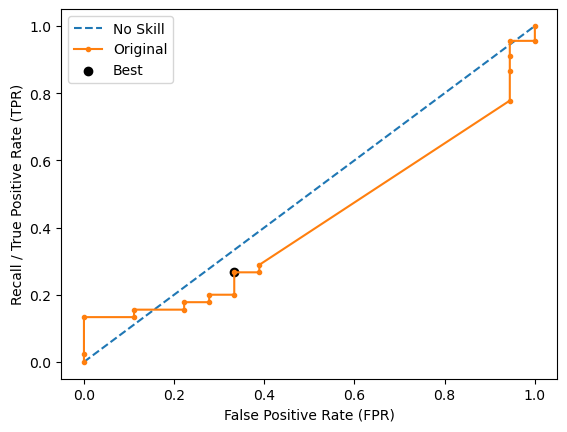

invalid value encountered in longlong_scalars


[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.448
Best Recall=0.356
Best G-Mean=0.466


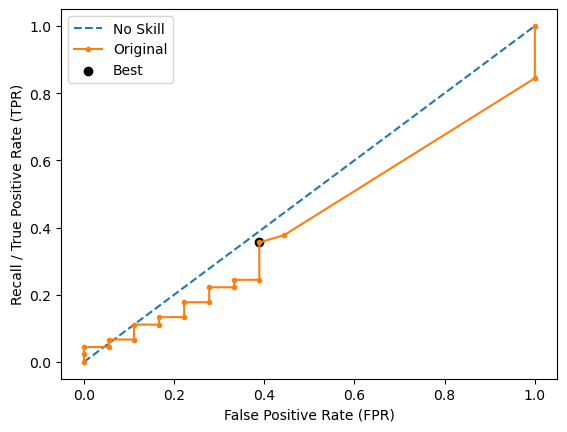

[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.7142857142857143
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.528
Best Recall=0.289
Best G-Mean=0.380


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


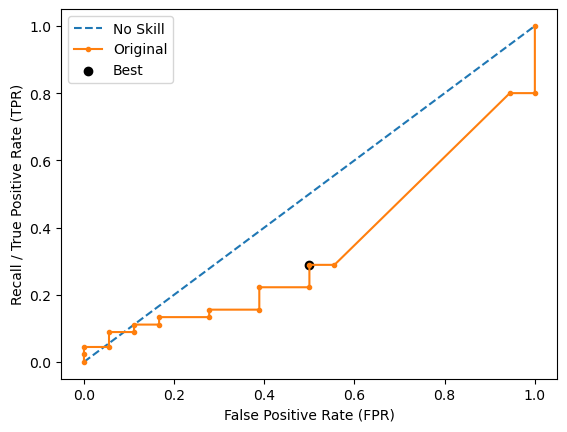

[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.448
Best Recall=0.311
Best G-Mean=0.455


invalid value encountered in longlong_scalars


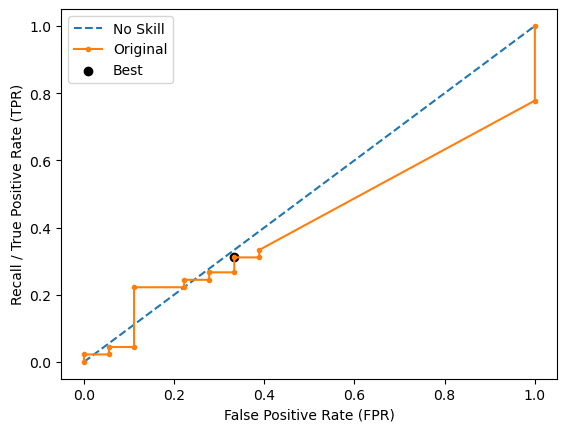

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.453
Best Recall=0.222
Best G-Mean=0.369


invalid value encountered in longlong_scalars


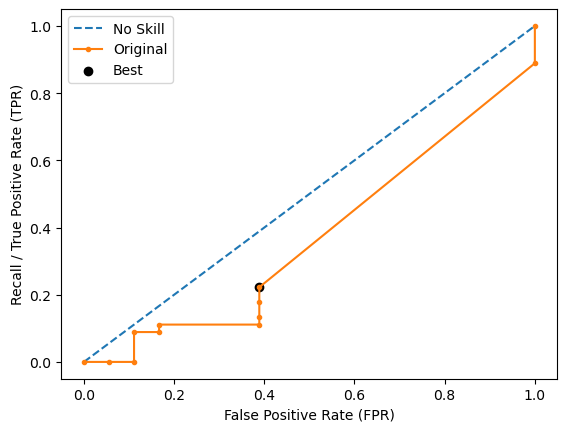

Ave Test Accuracy: 0.37142857142857133
Stdev Test Accuracy: 0.191662969499982
Ave Test Recall: 0.8
Stdev Test Recall: 0.4472135954999579
Ave Test F-0.5 Score: 0.26666666666666666
Stdev Test F-0.5 Score: 0.14907119849998599
Ave Test F-0.75 Score: 0.3076923076923077
Stdev Test F-0.75 Score: 0.17200522903844537
Ave Test F-1 Score: 0.35555555555555557
Stdev Test F-1 Score: 0.1987615979999813
Ave Test F-1.5 Score: 0.4521739130434782
Stdev Test F-1.5 Score: 0.25277290180432405
Ave Test F-2 Score: 0.5333333333333333
Stdev Test F-2 Score: 0.29814239699997197
Ave Test G-mean: 0.0
Stdev Test G-mean: 0.0
Ave Test Specificity: 0.2
Stdev Test Specificity: 0.44721359549995804
Ave Test Precision: 0.22857142857142856
Ave Test NPV: 0.7142857142857143
Ave Runtime: 0.038967227935791014


In [96]:
ld_t02_svm_gs, ld_t02_svm_be, ld_t02_svm_model_info, ld_t02_svm_metrics_df = svm_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'goss', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.7866666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='goss', learning_rate=0.01,
                                max_depth=3, n_estimators=200,
                                random_state=0))])
Mean Train Score (Recall) 0.849620811287478
Std Train Score (Recall) 0.035003916741861645
GridSearchCV Runtime: 25.91913890838623 secs
Run 1 - Random State: 0
Test Accuracy: 0.42857142857142855
Test Recall: 0.9444444444444444
Test F-0.5 Score: 0.37610619469026546
Test F-0.75 Score: 0.4275653923541247
Test F-1 Score: 0.485

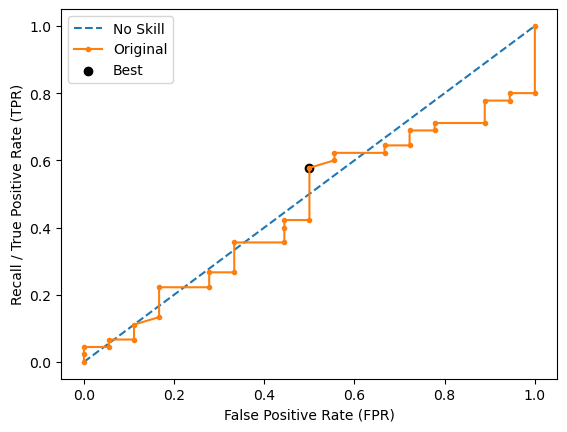

Run 2 - Random State: 1
Test Accuracy: 0.3492063492063492
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.27777777777777773
Test F-0.75 Score: 0.31179138321995464
Test F-1 Score: 0.3492063492063492
Test F-1.5 Score: 0.4181286549707603
Test F-2 Score: 0.47008547008547
Test G-Mean Score: 0.3865006029094686
Best Threshold=0.470
Best Recall=0.822
Best G-Mean=0.565


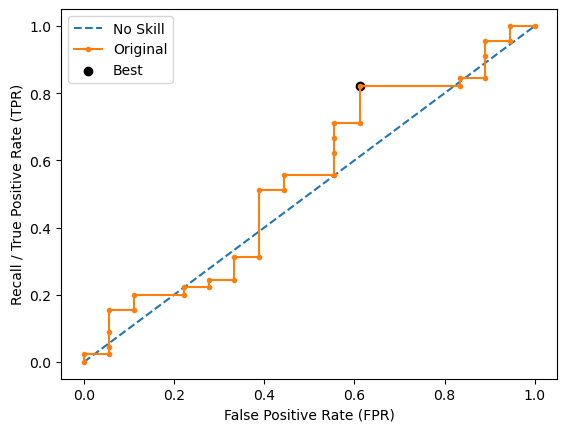

Run 3 - Random State: 2
Test Accuracy: 0.5714285714285714
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.41139240506329117
Test F-0.75 Score: 0.45013850415512463
Test F-1 Score: 0.490566037735849
Test F-1.5 Score: 0.5596026490066226
Test F-2 Score: 0.6074766355140188
Test G-Mean Score: 0.607565471755214
Best Threshold=0.585
Best Recall=0.311
Best G-Mean=0.455


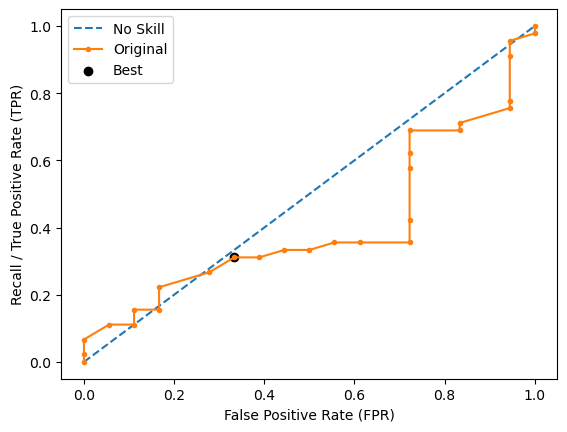

Run 4 - Random State: 3
Test Accuracy: 0.5079365079365079
Test Recall: 0.8333333333333334
Test F-0.5 Score: 0.39473684210526316
Test F-0.75 Score: 0.4411764705882353
Test F-1 Score: 0.4918032786885246
Test F-1.5 Score: 0.5838323353293412
Test F-2 Score: 0.6521739130434784
Test G-Mean Score: 0.5610836076867821
Best Threshold=0.538
Best Recall=0.489
Best G-Mean=0.404


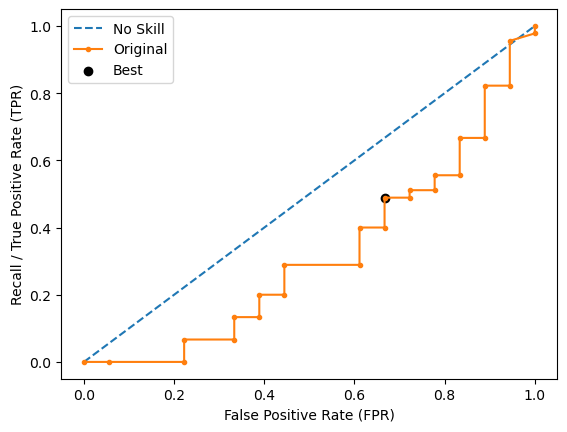

Run 5 - Random State: 4
Test Accuracy: 0.42857142857142855
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.34653465346534656
Test F-0.75 Score: 0.3897550111358575
Test F-1 Score: 0.43750000000000006
Test F-1.5 Score: 0.5260115606936416
Test F-2 Score: 0.5932203389830509
Test G-Mean Score: 0.4740162001711453
Best Threshold=0.542
Best Recall=0.533
Best G-Mean=0.516


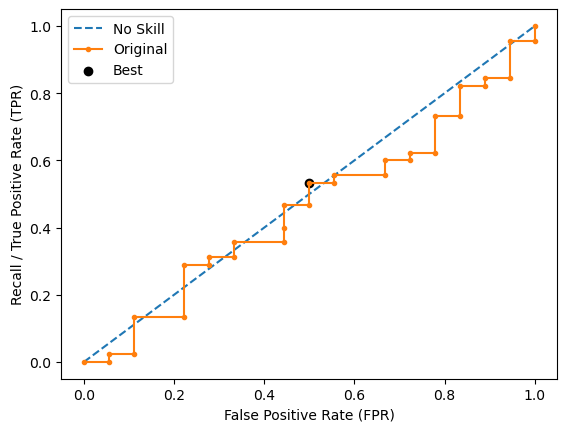

Ave Test Accuracy: 0.45714285714285713
Stdev Test Accuracy: 0.08503552530780237
Ave Test Recall: 0.7777777777777778
Stdev Test Recall: 0.1242259987499883
Ave Test F-0.5 Score: 0.3613095746203888
Stdev Test F-0.5 Score: 0.05253682389777452
Ave Test F-0.75 Score: 0.4040853522906594
Stdev Test F-0.75 Score: 0.056505511985636005
Ave Test F-1 Score: 0.45095799026900174
Stdev Test F-1 Score: 0.06119568825561431
Ave Test F-1.5 Score: 0.5369744994595326
Stdev Test F-1.5 Score: 0.07174791051302006
Ave Test F-2 Score: 0.601688045718752
Stdev Test F-2 Score: 0.08215079255731884
Ave Test G-mean: 0.4974577459626922
Stdev Test G-mean: 0.0874359615325538
Ave Test Specificity: 0.3288888888888889
Stdev Test Specificity: 0.11800816042090446
Ave Test Precision: 0.31919622563707495
Ave Test NPV: 0.7912672947967067
Ave Runtime: 0.07910895347595215


In [97]:
ld_t02_lgbm_gs, ld_t02_lgbm_be, ld_t02_lgbm_model_info, ld_t02_lgbm_metrics_df = lgbm_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.7066666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 1.0
Std Train Score (Recall) 0.0
GridSearchCV Runtime: 10.10646653175354 secs
Run 1 - Random State: 0
Test Accuracy: 0.4603174603174603
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.3494623655913978
Test F-0.75 Score: 0.3896882494004796
Test F-1 Score: 0.43333333333

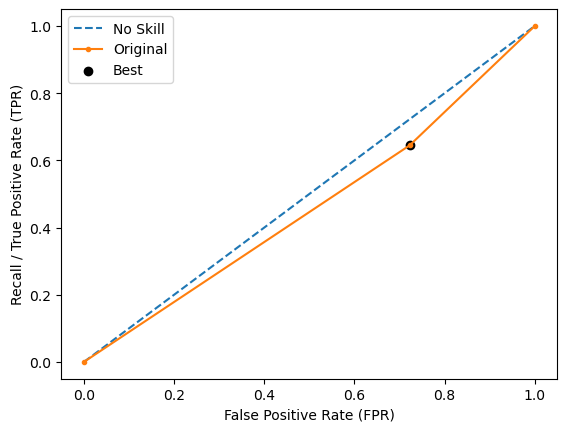

Run 2 - Random State: 1
Test Accuracy: 0.47619047619047616
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.35714285714285715
Test F-0.75 Score: 0.3973105134474328
Test F-1 Score: 0.44067796610169496
Test F-1.5 Score: 0.5184049079754601
Test F-2 Score: 0.5752212389380531
Test G-Mean Score: 0.5223404121574737
Best Threshold=0.731
Best Recall=0.622
Best G-Mean=0.416


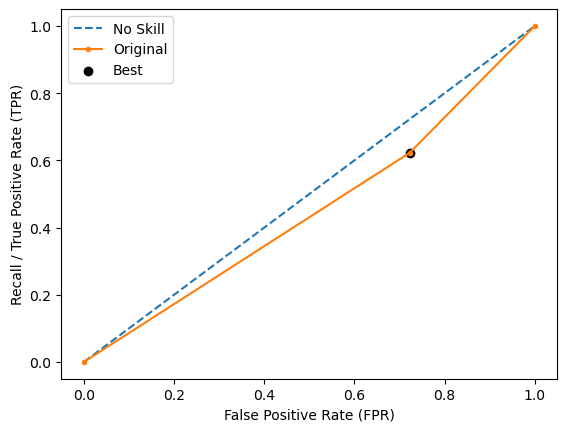

Run 3 - Random State: 2
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.731
Best Recall=0.489
Best G-Mean=0.494


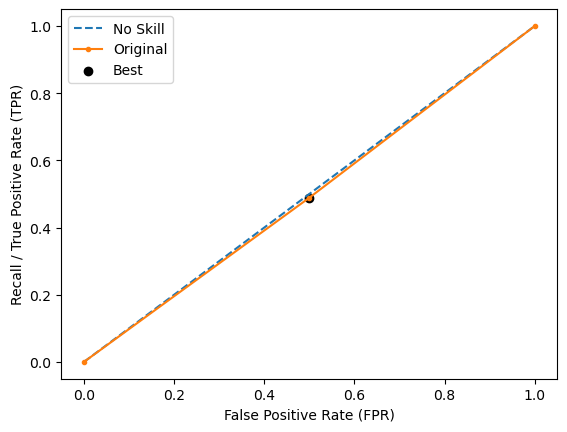

Run 4 - Random State: 3
Test Accuracy: 0.5714285714285714
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.4
Test F-0.75 Score: 0.43478260869565216
Test F-1 Score: 0.4705882352941177
Test F-1.5 Score: 0.5306122448979591
Test F-2 Score: 0.5714285714285715
Test G-Mean Score: 0.5962847939999438
Best Threshold=0.731
Best Recall=0.467
Best G-Mean=0.394


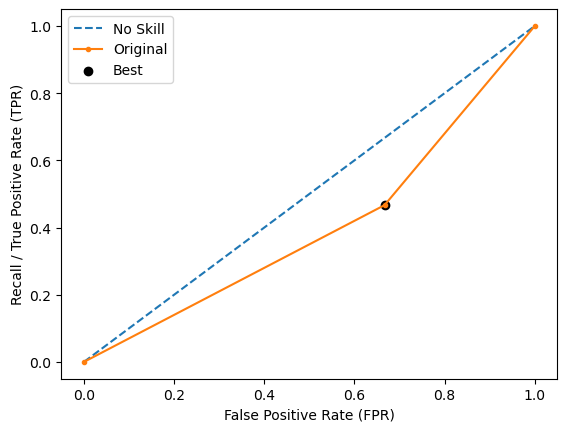

Run 5 - Random State: 4
Test Accuracy: 0.47619047619047616
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3448275862068965
Test F-0.75 Score: 0.3816793893129771
Test F-1 Score: 0.42105263157894735
Test F-1.5 Score: 0.490566037735849
Test F-2 Score: 0.5405405405405406
Test G-Mean Score: 0.5163977794943222
Best Threshold=0.731
Best Recall=0.600
Best G-Mean=0.447


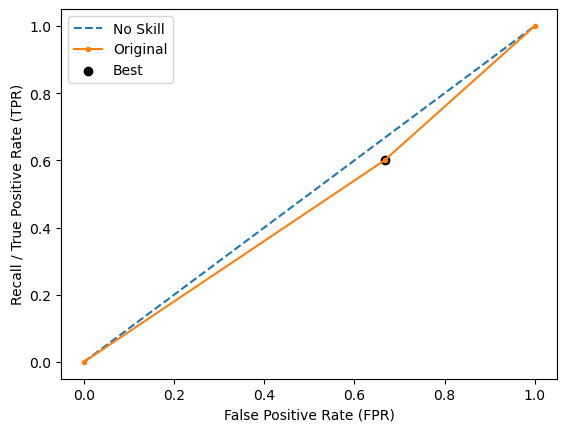

Ave Test Accuracy: 0.4984126984126984
Stdev Test Accuracy: 0.04433092077386965
Ave Test Recall: 0.6555555555555556
Stdev Test Recall: 0.09128709291752768
Ave Test F-0.5 Score: 0.35366684347837113
Stdev Test F-0.5 Score: 0.030026452422990377
Ave Test F-0.75 Score: 0.3890812099220682
Stdev Test F-0.75 Score: 0.03329147712258155
Ave Test F-1 Score: 0.4265998210167208
Stdev Test F-1 Score: 0.03781596988158827
Ave Test F-1.5 Score: 0.4921590623642779
Stdev Test F-1.5 Score: 0.04865396925598045
Ave Test F-2 Score: 0.5388517986774304
Stdev Test F-2 Score: 0.05865909909588532
Ave Test G-mean: 0.5294585297265142
Stdev Test G-mean: 0.03799912468267046
Ave Test Specificity: 0.43555555555555553
Stdev Test Specificity: 0.08104258901693541
Ave Test Precision: 0.3176496464458699
Ave Test NPV: 0.7606764069264068
Ave Runtime: 0.10467638969421386


In [98]:
ld_t02_adaboost_gs, ld_t02_adaboost_be, ld_t02_adaboost_model_info, ld_t02_adaboost_metrics_df = adaboost_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.003804
0:	learn: 0.6918430	total: 2.4ms	remaining: 2.39s
1:	learn: 0.6904269	total: 4.8ms	remaining: 2.4s
2:	learn: 0.6887603	total: 6.91ms	remaining: 2.3s
3:	learn: 0.6875324	total: 9.27ms	remaining: 2.31s
4:	learn: 0.6857660	total: 11.4ms	remaining: 2.26s
5:	learn: 0.6847818	total: 13.5ms	remaining: 2.24s
6:	learn: 0.6838856	total: 15.6ms	remaining: 2.21s
7:	learn: 0.6825166	total: 17.6ms	remaining: 2.18s
8:	learn: 0.6808170	total: 19.6ms	remaining: 2.16s
9:	learn: 0.6788644	total: 21.6ms	remaining: 2.13s
10:	learn: 0.6775786	total: 23.5ms	remaining: 2.12s
11:	learn: 0.6761140	total: 25.7ms	remaining: 2.12s
12:	learn: 0.6747365	total: 27.6ms	remaining: 2.09s
13:	learn: 0.6731644	total: 29.5ms	remaining: 2.08s
14:	learn: 0.6725760	total: 31.1ms	remaining: 2.04s
15:	learn: 0.6710843	total: 32.9ms	remaining: 2.03s
16:	learn: 0.6702176	total: 34.9ms	remaining: 2.02s
17:	learn: 0.6689704	total: 37.1ms	re

212:	learn: 0.4635171	total: 393ms	remaining: 1.45s
213:	learn: 0.4629258	total: 395ms	remaining: 1.45s
214:	learn: 0.4622413	total: 397ms	remaining: 1.45s
215:	learn: 0.4614610	total: 399ms	remaining: 1.45s
216:	learn: 0.4608354	total: 400ms	remaining: 1.44s
217:	learn: 0.4598398	total: 402ms	remaining: 1.44s
218:	learn: 0.4590681	total: 404ms	remaining: 1.44s
219:	learn: 0.4586112	total: 405ms	remaining: 1.44s
220:	learn: 0.4579928	total: 407ms	remaining: 1.44s
221:	learn: 0.4573117	total: 409ms	remaining: 1.43s
222:	learn: 0.4566120	total: 411ms	remaining: 1.43s
223:	learn: 0.4559259	total: 412ms	remaining: 1.43s
224:	learn: 0.4552369	total: 414ms	remaining: 1.43s
225:	learn: 0.4543314	total: 416ms	remaining: 1.42s
226:	learn: 0.4539396	total: 418ms	remaining: 1.42s
227:	learn: 0.4531638	total: 420ms	remaining: 1.42s
228:	learn: 0.4524291	total: 421ms	remaining: 1.42s
229:	learn: 0.4516702	total: 423ms	remaining: 1.42s
230:	learn: 0.4506150	total: 425ms	remaining: 1.41s
231:	learn: 

454:	learn: 0.3198091	total: 795ms	remaining: 953ms
455:	learn: 0.3191866	total: 797ms	remaining: 951ms
456:	learn: 0.3188621	total: 799ms	remaining: 950ms
457:	learn: 0.3184118	total: 801ms	remaining: 948ms
458:	learn: 0.3179823	total: 803ms	remaining: 946ms
459:	learn: 0.3177528	total: 804ms	remaining: 944ms
460:	learn: 0.3171959	total: 806ms	remaining: 942ms
461:	learn: 0.3166216	total: 808ms	remaining: 941ms
462:	learn: 0.3160946	total: 810ms	remaining: 939ms
463:	learn: 0.3158361	total: 811ms	remaining: 937ms
464:	learn: 0.3155295	total: 813ms	remaining: 935ms
465:	learn: 0.3150408	total: 815ms	remaining: 934ms
466:	learn: 0.3144789	total: 816ms	remaining: 932ms
467:	learn: 0.3138652	total: 818ms	remaining: 930ms
468:	learn: 0.3133541	total: 820ms	remaining: 929ms
469:	learn: 0.3128804	total: 822ms	remaining: 927ms
470:	learn: 0.3123917	total: 824ms	remaining: 925ms
471:	learn: 0.3122265	total: 825ms	remaining: 923ms
472:	learn: 0.3119224	total: 827ms	remaining: 922ms
473:	learn: 

688:	learn: 0.2338746	total: 1.2s	remaining: 539ms
689:	learn: 0.2334012	total: 1.2s	remaining: 538ms
690:	learn: 0.2332897	total: 1.2s	remaining: 536ms
691:	learn: 0.2330663	total: 1.2s	remaining: 534ms
692:	learn: 0.2327259	total: 1.2s	remaining: 533ms
693:	learn: 0.2322778	total: 1.2s	remaining: 531ms
694:	learn: 0.2318924	total: 1.21s	remaining: 529ms
695:	learn: 0.2315097	total: 1.21s	remaining: 528ms
696:	learn: 0.2311442	total: 1.21s	remaining: 526ms
697:	learn: 0.2310140	total: 1.21s	remaining: 524ms
698:	learn: 0.2306103	total: 1.21s	remaining: 522ms
699:	learn: 0.2302732	total: 1.22s	remaining: 521ms
700:	learn: 0.2299546	total: 1.22s	remaining: 519ms
701:	learn: 0.2297016	total: 1.22s	remaining: 517ms
702:	learn: 0.2294516	total: 1.22s	remaining: 516ms
703:	learn: 0.2291425	total: 1.22s	remaining: 514ms
704:	learn: 0.2287639	total: 1.22s	remaining: 512ms
705:	learn: 0.2282953	total: 1.23s	remaining: 511ms
706:	learn: 0.2279869	total: 1.23s	remaining: 509ms
707:	learn: 0.2276

924:	learn: 0.1744334	total: 1.59s	remaining: 129ms
925:	learn: 0.1741478	total: 1.59s	remaining: 127ms
926:	learn: 0.1738464	total: 1.59s	remaining: 125ms
927:	learn: 0.1736632	total: 1.59s	remaining: 124ms
928:	learn: 0.1733736	total: 1.6s	remaining: 122ms
929:	learn: 0.1732398	total: 1.6s	remaining: 120ms
930:	learn: 0.1730400	total: 1.6s	remaining: 119ms
931:	learn: 0.1728457	total: 1.6s	remaining: 117ms
932:	learn: 0.1726590	total: 1.6s	remaining: 115ms
933:	learn: 0.1724759	total: 1.6s	remaining: 113ms
934:	learn: 0.1723285	total: 1.61s	remaining: 112ms
935:	learn: 0.1722362	total: 1.61s	remaining: 110ms
936:	learn: 0.1720990	total: 1.61s	remaining: 108ms
937:	learn: 0.1719228	total: 1.61s	remaining: 107ms
938:	learn: 0.1717107	total: 1.61s	remaining: 105ms
939:	learn: 0.1714742	total: 1.61s	remaining: 103ms
940:	learn: 0.1712550	total: 1.62s	remaining: 101ms
941:	learn: 0.1710880	total: 1.62s	remaining: 99.7ms
942:	learn: 0.1708259	total: 1.62s	remaining: 98ms
943:	learn: 0.1706

132:	learn: 0.5351852	total: 218ms	remaining: 1.42s
133:	learn: 0.5340044	total: 220ms	remaining: 1.42s
134:	learn: 0.5328412	total: 222ms	remaining: 1.42s
135:	learn: 0.5311910	total: 223ms	remaining: 1.42s
136:	learn: 0.5302434	total: 225ms	remaining: 1.42s
137:	learn: 0.5291836	total: 227ms	remaining: 1.42s
138:	learn: 0.5280474	total: 229ms	remaining: 1.42s
139:	learn: 0.5268002	total: 230ms	remaining: 1.41s
140:	learn: 0.5250773	total: 232ms	remaining: 1.41s
141:	learn: 0.5248113	total: 233ms	remaining: 1.41s
142:	learn: 0.5239206	total: 235ms	remaining: 1.41s
143:	learn: 0.5229376	total: 237ms	remaining: 1.41s
144:	learn: 0.5220222	total: 238ms	remaining: 1.41s
145:	learn: 0.5211511	total: 240ms	remaining: 1.4s
146:	learn: 0.5206244	total: 242ms	remaining: 1.4s
147:	learn: 0.5196626	total: 243ms	remaining: 1.4s
148:	learn: 0.5188272	total: 245ms	remaining: 1.4s
149:	learn: 0.5177380	total: 247ms	remaining: 1.4s
150:	learn: 0.5166621	total: 249ms	remaining: 1.4s
151:	learn: 0.5158

362:	learn: 0.3675994	total: 616ms	remaining: 1.08s
363:	learn: 0.3673711	total: 618ms	remaining: 1.08s
364:	learn: 0.3670242	total: 620ms	remaining: 1.08s
365:	learn: 0.3665700	total: 621ms	remaining: 1.08s
366:	learn: 0.3659714	total: 623ms	remaining: 1.07s
367:	learn: 0.3653043	total: 625ms	remaining: 1.07s
368:	learn: 0.3647779	total: 627ms	remaining: 1.07s
369:	learn: 0.3639486	total: 629ms	remaining: 1.07s
370:	learn: 0.3637115	total: 630ms	remaining: 1.07s
371:	learn: 0.3630064	total: 632ms	remaining: 1.07s
372:	learn: 0.3624541	total: 634ms	remaining: 1.06s
373:	learn: 0.3618922	total: 636ms	remaining: 1.06s
374:	learn: 0.3609735	total: 638ms	remaining: 1.06s
375:	learn: 0.3605024	total: 640ms	remaining: 1.06s
376:	learn: 0.3602270	total: 642ms	remaining: 1.06s
377:	learn: 0.3597329	total: 644ms	remaining: 1.06s
378:	learn: 0.3591225	total: 646ms	remaining: 1.06s
379:	learn: 0.3582287	total: 647ms	remaining: 1.06s
380:	learn: 0.3577212	total: 650ms	remaining: 1.05s
381:	learn: 

602:	learn: 0.2611434	total: 1.01s	remaining: 667ms
603:	learn: 0.2608438	total: 1.01s	remaining: 666ms
604:	learn: 0.2605405	total: 1.02s	remaining: 664ms
605:	learn: 0.2602324	total: 1.02s	remaining: 663ms
606:	learn: 0.2600383	total: 1.02s	remaining: 661ms
607:	learn: 0.2596706	total: 1.02s	remaining: 659ms
608:	learn: 0.2595328	total: 1.02s	remaining: 658ms
609:	learn: 0.2589658	total: 1.02s	remaining: 656ms
610:	learn: 0.2587623	total: 1.03s	remaining: 654ms
611:	learn: 0.2583520	total: 1.03s	remaining: 653ms
612:	learn: 0.2580821	total: 1.03s	remaining: 651ms
613:	learn: 0.2578269	total: 1.03s	remaining: 649ms
614:	learn: 0.2576054	total: 1.03s	remaining: 648ms
615:	learn: 0.2575780	total: 1.04s	remaining: 646ms
616:	learn: 0.2572200	total: 1.04s	remaining: 644ms
617:	learn: 0.2566416	total: 1.04s	remaining: 643ms
618:	learn: 0.2561308	total: 1.04s	remaining: 641ms
619:	learn: 0.2559351	total: 1.04s	remaining: 640ms
620:	learn: 0.2556432	total: 1.04s	remaining: 638ms
621:	learn: 

821:	learn: 0.1977113	total: 1.4s	remaining: 302ms
822:	learn: 0.1975267	total: 1.4s	remaining: 301ms
823:	learn: 0.1973022	total: 1.4s	remaining: 299ms
824:	learn: 0.1970386	total: 1.4s	remaining: 298ms
825:	learn: 0.1967888	total: 1.4s	remaining: 296ms
826:	learn: 0.1964372	total: 1.41s	remaining: 294ms
827:	learn: 0.1962983	total: 1.41s	remaining: 293ms
828:	learn: 0.1960790	total: 1.41s	remaining: 291ms
829:	learn: 0.1959898	total: 1.41s	remaining: 289ms
830:	learn: 0.1957443	total: 1.41s	remaining: 288ms
831:	learn: 0.1956056	total: 1.42s	remaining: 286ms
832:	learn: 0.1955013	total: 1.42s	remaining: 284ms
833:	learn: 0.1952520	total: 1.42s	remaining: 283ms
834:	learn: 0.1950412	total: 1.42s	remaining: 281ms
835:	learn: 0.1947994	total: 1.42s	remaining: 279ms
836:	learn: 0.1946055	total: 1.43s	remaining: 278ms
837:	learn: 0.1943599	total: 1.43s	remaining: 276ms
838:	learn: 0.1940991	total: 1.43s	remaining: 274ms
839:	learn: 0.1937743	total: 1.43s	remaining: 273ms
840:	learn: 0.193

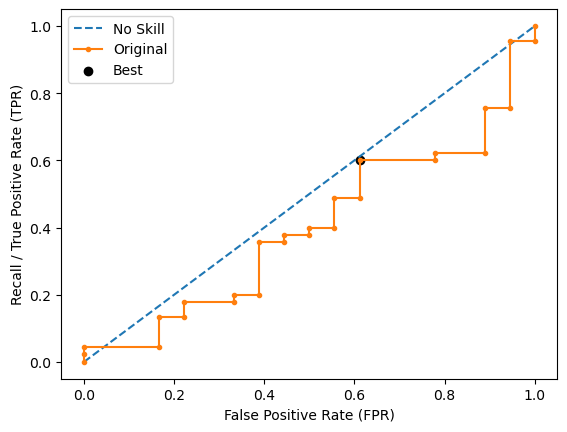

Learning rate set to 0.003788
0:	learn: 0.6917831	total: 1.91ms	remaining: 1.91s
1:	learn: 0.6903824	total: 21.4ms	remaining: 10.7s
2:	learn: 0.6889711	total: 25.7ms	remaining: 8.54s
3:	learn: 0.6877826	total: 29.2ms	remaining: 7.27s
4:	learn: 0.6864502	total: 32.7ms	remaining: 6.51s
5:	learn: 0.6853055	total: 35.9ms	remaining: 5.95s
6:	learn: 0.6840003	total: 40.1ms	remaining: 5.69s
7:	learn: 0.6822289	total: 43.8ms	remaining: 5.43s
8:	learn: 0.6805329	total: 48ms	remaining: 5.28s
9:	learn: 0.6790260	total: 50.8ms	remaining: 5.03s
10:	learn: 0.6774987	total: 53.6ms	remaining: 4.82s
11:	learn: 0.6757886	total: 56.8ms	remaining: 4.67s
12:	learn: 0.6749621	total: 59.6ms	remaining: 4.52s
13:	learn: 0.6735192	total: 62.4ms	remaining: 4.39s
14:	learn: 0.6714470	total: 64.7ms	remaining: 4.25s
15:	learn: 0.6704435	total: 67.1ms	remaining: 4.13s
16:	learn: 0.6686600	total: 69.4ms	remaining: 4.01s
17:	learn: 0.6672765	total: 71.8ms	remaining: 3.92s
18:	learn: 0.6664543	total: 73.6ms	remaining: 

177:	learn: 0.4853425	total: 391ms	remaining: 1.8s
178:	learn: 0.4844296	total: 393ms	remaining: 1.8s
179:	learn: 0.4835348	total: 394ms	remaining: 1.8s
180:	learn: 0.4830467	total: 396ms	remaining: 1.79s
181:	learn: 0.4823772	total: 398ms	remaining: 1.79s
182:	learn: 0.4811916	total: 400ms	remaining: 1.79s
183:	learn: 0.4800841	total: 402ms	remaining: 1.78s
184:	learn: 0.4792773	total: 404ms	remaining: 1.78s
185:	learn: 0.4786635	total: 406ms	remaining: 1.77s
186:	learn: 0.4773336	total: 408ms	remaining: 1.77s
187:	learn: 0.4761546	total: 409ms	remaining: 1.77s
188:	learn: 0.4754713	total: 411ms	remaining: 1.76s
189:	learn: 0.4745365	total: 413ms	remaining: 1.76s
190:	learn: 0.4736680	total: 414ms	remaining: 1.75s
191:	learn: 0.4726164	total: 416ms	remaining: 1.75s
192:	learn: 0.4721281	total: 418ms	remaining: 1.75s
193:	learn: 0.4711185	total: 420ms	remaining: 1.74s
194:	learn: 0.4704248	total: 422ms	remaining: 1.74s
195:	learn: 0.4697615	total: 424ms	remaining: 1.74s
196:	learn: 0.4

401:	learn: 0.3337684	total: 788ms	remaining: 1.17s
402:	learn: 0.3334758	total: 790ms	remaining: 1.17s
403:	learn: 0.3328407	total: 792ms	remaining: 1.17s
404:	learn: 0.3323377	total: 794ms	remaining: 1.17s
405:	learn: 0.3315109	total: 796ms	remaining: 1.16s
406:	learn: 0.3311307	total: 798ms	remaining: 1.16s
407:	learn: 0.3306618	total: 800ms	remaining: 1.16s
408:	learn: 0.3301811	total: 802ms	remaining: 1.16s
409:	learn: 0.3294967	total: 804ms	remaining: 1.16s
410:	learn: 0.3289062	total: 806ms	remaining: 1.15s
411:	learn: 0.3284741	total: 808ms	remaining: 1.15s
412:	learn: 0.3275526	total: 810ms	remaining: 1.15s
413:	learn: 0.3271109	total: 812ms	remaining: 1.15s
414:	learn: 0.3268415	total: 814ms	remaining: 1.15s
415:	learn: 0.3264703	total: 816ms	remaining: 1.15s
416:	learn: 0.3258588	total: 818ms	remaining: 1.14s
417:	learn: 0.3249520	total: 820ms	remaining: 1.14s
418:	learn: 0.3245333	total: 822ms	remaining: 1.14s
419:	learn: 0.3242705	total: 824ms	remaining: 1.14s
420:	learn: 

617:	learn: 0.2465430	total: 1.19s	remaining: 733ms
618:	learn: 0.2461986	total: 1.19s	remaining: 731ms
619:	learn: 0.2457518	total: 1.19s	remaining: 729ms
620:	learn: 0.2453138	total: 1.19s	remaining: 727ms
621:	learn: 0.2451853	total: 1.19s	remaining: 725ms
622:	learn: 0.2447654	total: 1.2s	remaining: 724ms
623:	learn: 0.2444893	total: 1.2s	remaining: 722ms
624:	learn: 0.2443160	total: 1.2s	remaining: 720ms
625:	learn: 0.2439005	total: 1.2s	remaining: 718ms
626:	learn: 0.2436926	total: 1.2s	remaining: 716ms
627:	learn: 0.2433712	total: 1.21s	remaining: 714ms
628:	learn: 0.2431385	total: 1.21s	remaining: 712ms
629:	learn: 0.2425905	total: 1.21s	remaining: 711ms
630:	learn: 0.2423808	total: 1.21s	remaining: 709ms
631:	learn: 0.2419227	total: 1.21s	remaining: 707ms
632:	learn: 0.2415662	total: 1.22s	remaining: 705ms
633:	learn: 0.2412968	total: 1.22s	remaining: 703ms
634:	learn: 0.2410284	total: 1.22s	remaining: 701ms
635:	learn: 0.2407733	total: 1.22s	remaining: 699ms
636:	learn: 0.240

840:	learn: 0.1858522	total: 1.6s	remaining: 302ms
841:	learn: 0.1856051	total: 1.6s	remaining: 300ms
842:	learn: 0.1853630	total: 1.6s	remaining: 298ms
843:	learn: 0.1852441	total: 1.6s	remaining: 296ms
844:	learn: 0.1850204	total: 1.6s	remaining: 294ms
845:	learn: 0.1847309	total: 1.6s	remaining: 292ms
846:	learn: 0.1844929	total: 1.61s	remaining: 290ms
847:	learn: 0.1842739	total: 1.61s	remaining: 288ms
848:	learn: 0.1839156	total: 1.61s	remaining: 287ms
849:	learn: 0.1836372	total: 1.61s	remaining: 285ms
850:	learn: 0.1832587	total: 1.61s	remaining: 283ms
851:	learn: 0.1830620	total: 1.62s	remaining: 281ms
852:	learn: 0.1826832	total: 1.62s	remaining: 279ms
853:	learn: 0.1824037	total: 1.62s	remaining: 277ms
854:	learn: 0.1822305	total: 1.62s	remaining: 275ms
855:	learn: 0.1819711	total: 1.62s	remaining: 273ms
856:	learn: 0.1816607	total: 1.63s	remaining: 271ms
857:	learn: 0.1814677	total: 1.63s	remaining: 269ms
858:	learn: 0.1811075	total: 1.63s	remaining: 267ms
859:	learn: 0.1809

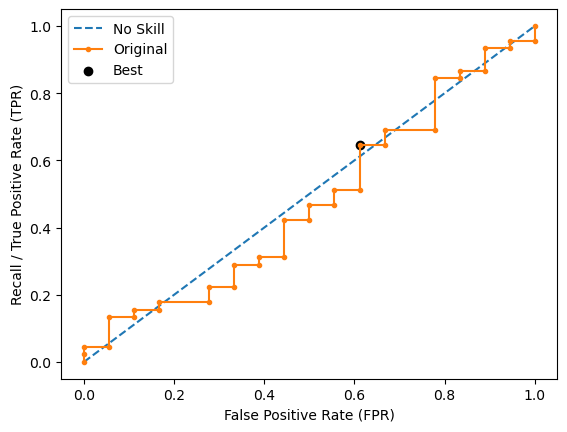

Learning rate set to 0.003967
0:	learn: 0.6917188	total: 1.71ms	remaining: 1.71s
1:	learn: 0.6901326	total: 3.43ms	remaining: 1.71s
2:	learn: 0.6889914	total: 5.22ms	remaining: 1.74s
3:	learn: 0.6876656	total: 7.14ms	remaining: 1.78s
4:	learn: 0.6859856	total: 8.71ms	remaining: 1.73s
5:	learn: 0.6853252	total: 10.5ms	remaining: 1.74s
6:	learn: 0.6843908	total: 12.1ms	remaining: 1.71s
7:	learn: 0.6829040	total: 13.7ms	remaining: 1.69s
8:	learn: 0.6819071	total: 15.5ms	remaining: 1.71s
9:	learn: 0.6804192	total: 17.1ms	remaining: 1.69s
10:	learn: 0.6787634	total: 34.4ms	remaining: 3.09s
11:	learn: 0.6776475	total: 39.3ms	remaining: 3.24s
12:	learn: 0.6761023	total: 43.8ms	remaining: 3.33s
13:	learn: 0.6742102	total: 48.8ms	remaining: 3.43s
14:	learn: 0.6723610	total: 53.4ms	remaining: 3.5s
15:	learn: 0.6708499	total: 57.5ms	remaining: 3.54s
16:	learn: 0.6694308	total: 61.5ms	remaining: 3.55s
17:	learn: 0.6668620	total: 65.1ms	remaining: 3.55s
18:	learn: 0.6656198	total: 68.9ms	remaining:

209:	learn: 0.4637197	total: 402ms	remaining: 1.51s
210:	learn: 0.4628737	total: 404ms	remaining: 1.51s
211:	learn: 0.4625520	total: 406ms	remaining: 1.51s
212:	learn: 0.4618243	total: 408ms	remaining: 1.51s
213:	learn: 0.4608789	total: 410ms	remaining: 1.5s
214:	learn: 0.4596785	total: 412ms	remaining: 1.5s
215:	learn: 0.4592590	total: 413ms	remaining: 1.5s
216:	learn: 0.4587686	total: 415ms	remaining: 1.5s
217:	learn: 0.4580647	total: 417ms	remaining: 1.5s
218:	learn: 0.4567528	total: 419ms	remaining: 1.49s
219:	learn: 0.4562645	total: 421ms	remaining: 1.49s
220:	learn: 0.4556043	total: 423ms	remaining: 1.49s
221:	learn: 0.4547539	total: 425ms	remaining: 1.49s
222:	learn: 0.4540689	total: 427ms	remaining: 1.49s
223:	learn: 0.4531575	total: 429ms	remaining: 1.48s
224:	learn: 0.4525984	total: 431ms	remaining: 1.48s
225:	learn: 0.4518809	total: 433ms	remaining: 1.48s
226:	learn: 0.4515909	total: 434ms	remaining: 1.48s
227:	learn: 0.4508263	total: 436ms	remaining: 1.48s
228:	learn: 0.449

402:	learn: 0.3429705	total: 801ms	remaining: 1.19s
403:	learn: 0.3424429	total: 804ms	remaining: 1.19s
404:	learn: 0.3418490	total: 806ms	remaining: 1.18s
405:	learn: 0.3412395	total: 807ms	remaining: 1.18s
406:	learn: 0.3409340	total: 810ms	remaining: 1.18s
407:	learn: 0.3406845	total: 812ms	remaining: 1.18s
408:	learn: 0.3405265	total: 814ms	remaining: 1.18s
409:	learn: 0.3399726	total: 816ms	remaining: 1.17s
410:	learn: 0.3395503	total: 818ms	remaining: 1.17s
411:	learn: 0.3392112	total: 820ms	remaining: 1.17s
412:	learn: 0.3384702	total: 822ms	remaining: 1.17s
413:	learn: 0.3377744	total: 824ms	remaining: 1.17s
414:	learn: 0.3373848	total: 826ms	remaining: 1.16s
415:	learn: 0.3370459	total: 828ms	remaining: 1.16s
416:	learn: 0.3364935	total: 830ms	remaining: 1.16s
417:	learn: 0.3360192	total: 832ms	remaining: 1.16s
418:	learn: 0.3355955	total: 834ms	remaining: 1.16s
419:	learn: 0.3348539	total: 836ms	remaining: 1.15s
420:	learn: 0.3341949	total: 838ms	remaining: 1.15s
421:	learn: 

610:	learn: 0.2590083	total: 1.2s	remaining: 762ms
611:	learn: 0.2586841	total: 1.2s	remaining: 760ms
612:	learn: 0.2583414	total: 1.2s	remaining: 758ms
613:	learn: 0.2579559	total: 1.2s	remaining: 756ms
614:	learn: 0.2575903	total: 1.21s	remaining: 755ms
615:	learn: 0.2571566	total: 1.21s	remaining: 753ms
616:	learn: 0.2566292	total: 1.21s	remaining: 751ms
617:	learn: 0.2561410	total: 1.21s	remaining: 749ms
618:	learn: 0.2559627	total: 1.21s	remaining: 747ms
619:	learn: 0.2556117	total: 1.22s	remaining: 745ms
620:	learn: 0.2553993	total: 1.22s	remaining: 743ms
621:	learn: 0.2550005	total: 1.22s	remaining: 741ms
622:	learn: 0.2545621	total: 1.22s	remaining: 740ms
623:	learn: 0.2542899	total: 1.22s	remaining: 738ms
624:	learn: 0.2540306	total: 1.23s	remaining: 736ms
625:	learn: 0.2537257	total: 1.23s	remaining: 734ms
626:	learn: 0.2534936	total: 1.23s	remaining: 732ms
627:	learn: 0.2532148	total: 1.23s	remaining: 730ms
628:	learn: 0.2528515	total: 1.23s	remaining: 728ms
629:	learn: 0.25

810:	learn: 0.2021279	total: 1.58s	remaining: 369ms
811:	learn: 0.2020019	total: 1.59s	remaining: 367ms
812:	learn: 0.2018139	total: 1.59s	remaining: 365ms
813:	learn: 0.2016844	total: 1.59s	remaining: 363ms
814:	learn: 0.2014303	total: 1.59s	remaining: 361ms
815:	learn: 0.2010303	total: 1.59s	remaining: 359ms
816:	learn: 0.2007237	total: 1.59s	remaining: 357ms
817:	learn: 0.2004959	total: 1.6s	remaining: 355ms
818:	learn: 0.2002120	total: 1.6s	remaining: 353ms
819:	learn: 0.1998358	total: 1.6s	remaining: 351ms
820:	learn: 0.1996396	total: 1.6s	remaining: 349ms
821:	learn: 0.1993796	total: 1.6s	remaining: 347ms
822:	learn: 0.1989895	total: 1.61s	remaining: 345ms
823:	learn: 0.1987775	total: 1.61s	remaining: 344ms
824:	learn: 0.1983661	total: 1.61s	remaining: 342ms
825:	learn: 0.1982263	total: 1.61s	remaining: 340ms
826:	learn: 0.1980352	total: 1.61s	remaining: 338ms
827:	learn: 0.1977122	total: 1.62s	remaining: 336ms
828:	learn: 0.1974625	total: 1.62s	remaining: 334ms
829:	learn: 0.197

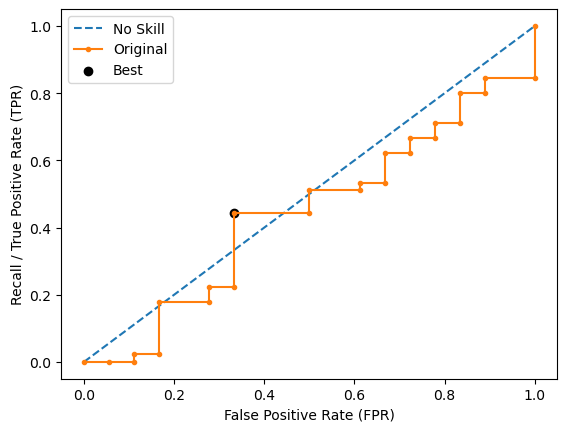

Learning rate set to 0.003821
0:	learn: 0.6925191	total: 1.62ms	remaining: 1.62s
1:	learn: 0.6912084	total: 3.46ms	remaining: 1.73s
2:	learn: 0.6896542	total: 5.29ms	remaining: 1.76s
3:	learn: 0.6889199	total: 7.02ms	remaining: 1.75s
4:	learn: 0.6874675	total: 9.01ms	remaining: 1.79s
5:	learn: 0.6867309	total: 10.8ms	remaining: 1.8s
6:	learn: 0.6854113	total: 12.6ms	remaining: 1.79s
7:	learn: 0.6837709	total: 14.4ms	remaining: 1.79s
8:	learn: 0.6824178	total: 16.2ms	remaining: 1.78s
9:	learn: 0.6807360	total: 18.2ms	remaining: 1.8s
10:	learn: 0.6792173	total: 19.8ms	remaining: 1.78s
11:	learn: 0.6787046	total: 21.6ms	remaining: 1.78s
12:	learn: 0.6775519	total: 23.4ms	remaining: 1.78s
13:	learn: 0.6768056	total: 25.2ms	remaining: 1.77s
14:	learn: 0.6762698	total: 27.4ms	remaining: 1.8s
15:	learn: 0.6749534	total: 29ms	remaining: 1.79s
16:	learn: 0.6740683	total: 30.9ms	remaining: 1.79s
17:	learn: 0.6722567	total: 32.7ms	remaining: 1.78s
18:	learn: 0.6711786	total: 34.5ms	remaining: 1.7

210:	learn: 0.4866041	total: 384ms	remaining: 1.43s
211:	learn: 0.4858591	total: 386ms	remaining: 1.43s
212:	learn: 0.4853659	total: 388ms	remaining: 1.43s
213:	learn: 0.4847478	total: 389ms	remaining: 1.43s
214:	learn: 0.4839990	total: 391ms	remaining: 1.43s
215:	learn: 0.4834123	total: 393ms	remaining: 1.43s
216:	learn: 0.4827270	total: 395ms	remaining: 1.42s
217:	learn: 0.4817097	total: 397ms	remaining: 1.42s
218:	learn: 0.4804784	total: 399ms	remaining: 1.42s
219:	learn: 0.4798535	total: 401ms	remaining: 1.42s
220:	learn: 0.4793363	total: 402ms	remaining: 1.42s
221:	learn: 0.4790171	total: 404ms	remaining: 1.42s
222:	learn: 0.4781283	total: 406ms	remaining: 1.42s
223:	learn: 0.4771730	total: 408ms	remaining: 1.41s
224:	learn: 0.4758150	total: 410ms	remaining: 1.41s
225:	learn: 0.4753134	total: 412ms	remaining: 1.41s
226:	learn: 0.4748530	total: 414ms	remaining: 1.41s
227:	learn: 0.4739107	total: 415ms	remaining: 1.41s
228:	learn: 0.4731071	total: 418ms	remaining: 1.41s
229:	learn: 

418:	learn: 0.3557289	total: 776ms	remaining: 1.07s
419:	learn: 0.3553090	total: 778ms	remaining: 1.07s
420:	learn: 0.3550089	total: 780ms	remaining: 1.07s
421:	learn: 0.3545273	total: 781ms	remaining: 1.07s
422:	learn: 0.3539587	total: 783ms	remaining: 1.07s
423:	learn: 0.3534853	total: 785ms	remaining: 1.07s
424:	learn: 0.3530370	total: 787ms	remaining: 1.06s
425:	learn: 0.3524370	total: 788ms	remaining: 1.06s
426:	learn: 0.3520307	total: 790ms	remaining: 1.06s
427:	learn: 0.3510955	total: 792ms	remaining: 1.06s
428:	learn: 0.3506363	total: 794ms	remaining: 1.06s
429:	learn: 0.3500158	total: 795ms	remaining: 1.05s
430:	learn: 0.3493569	total: 797ms	remaining: 1.05s
431:	learn: 0.3488823	total: 799ms	remaining: 1.05s
432:	learn: 0.3484026	total: 801ms	remaining: 1.05s
433:	learn: 0.3477300	total: 802ms	remaining: 1.05s
434:	learn: 0.3470106	total: 804ms	remaining: 1.04s
435:	learn: 0.3466021	total: 806ms	remaining: 1.04s
436:	learn: 0.3461006	total: 807ms	remaining: 1.04s
437:	learn: 

657:	learn: 0.2601876	total: 1.17s	remaining: 610ms
658:	learn: 0.2597703	total: 1.17s	remaining: 608ms
659:	learn: 0.2595186	total: 1.18s	remaining: 606ms
660:	learn: 0.2591228	total: 1.18s	remaining: 604ms
661:	learn: 0.2587574	total: 1.18s	remaining: 603ms
662:	learn: 0.2582754	total: 1.18s	remaining: 601ms
663:	learn: 0.2578917	total: 1.18s	remaining: 599ms
664:	learn: 0.2576610	total: 1.19s	remaining: 597ms
665:	learn: 0.2573599	total: 1.19s	remaining: 595ms
666:	learn: 0.2570905	total: 1.19s	remaining: 594ms
667:	learn: 0.2566379	total: 1.19s	remaining: 592ms
668:	learn: 0.2563298	total: 1.19s	remaining: 590ms
669:	learn: 0.2560188	total: 1.19s	remaining: 588ms
670:	learn: 0.2557838	total: 1.2s	remaining: 587ms
671:	learn: 0.2556608	total: 1.2s	remaining: 585ms
672:	learn: 0.2553355	total: 1.2s	remaining: 583ms
673:	learn: 0.2551237	total: 1.2s	remaining: 581ms
674:	learn: 0.2547926	total: 1.2s	remaining: 580ms
675:	learn: 0.2544298	total: 1.21s	remaining: 578ms
676:	learn: 0.254

885:	learn: 0.1984901	total: 1.56s	remaining: 200ms
886:	learn: 0.1983256	total: 1.56s	remaining: 199ms
887:	learn: 0.1981129	total: 1.56s	remaining: 197ms
888:	learn: 0.1978727	total: 1.56s	remaining: 195ms
889:	learn: 0.1975589	total: 1.56s	remaining: 193ms
890:	learn: 0.1973396	total: 1.56s	remaining: 192ms
891:	learn: 0.1970782	total: 1.57s	remaining: 190ms
892:	learn: 0.1967829	total: 1.57s	remaining: 188ms
893:	learn: 0.1965058	total: 1.57s	remaining: 186ms
894:	learn: 0.1962247	total: 1.57s	remaining: 185ms
895:	learn: 0.1961181	total: 1.57s	remaining: 183ms
896:	learn: 0.1960222	total: 1.58s	remaining: 181ms
897:	learn: 0.1958932	total: 1.58s	remaining: 179ms
898:	learn: 0.1957512	total: 1.58s	remaining: 178ms
899:	learn: 0.1956242	total: 1.58s	remaining: 176ms
900:	learn: 0.1954514	total: 1.58s	remaining: 174ms
901:	learn: 0.1953046	total: 1.58s	remaining: 172ms
902:	learn: 0.1951197	total: 1.59s	remaining: 171ms
903:	learn: 0.1947707	total: 1.59s	remaining: 169ms
904:	learn: 

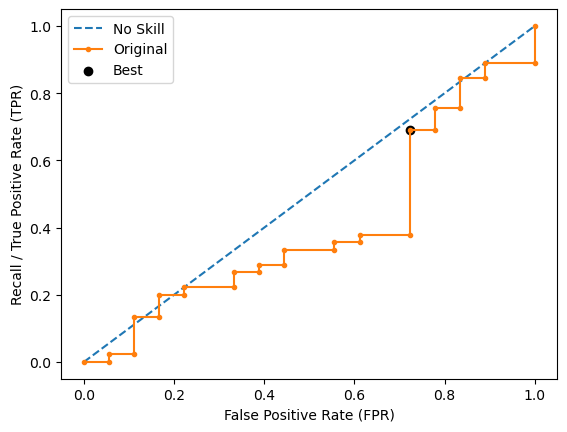

Learning rate set to 0.003821
0:	learn: 0.6919611	total: 1.92ms	remaining: 1.92s
1:	learn: 0.6904290	total: 3.82ms	remaining: 1.91s
2:	learn: 0.6890005	total: 5.66ms	remaining: 1.88s
3:	learn: 0.6871981	total: 7.52ms	remaining: 1.87s
4:	learn: 0.6862592	total: 9.14ms	remaining: 1.82s
5:	learn: 0.6855441	total: 11ms	remaining: 1.83s
6:	learn: 0.6840939	total: 13.1ms	remaining: 1.85s
7:	learn: 0.6835744	total: 14.8ms	remaining: 1.84s
8:	learn: 0.6823046	total: 16.4ms	remaining: 1.81s
9:	learn: 0.6805228	total: 18.3ms	remaining: 1.81s
10:	learn: 0.6796740	total: 20.1ms	remaining: 1.8s
11:	learn: 0.6786413	total: 21.7ms	remaining: 1.78s
12:	learn: 0.6776816	total: 23.5ms	remaining: 1.78s
13:	learn: 0.6760993	total: 25.4ms	remaining: 1.79s
14:	learn: 0.6753723	total: 27.1ms	remaining: 1.78s
15:	learn: 0.6749483	total: 28.9ms	remaining: 1.77s
16:	learn: 0.6737972	total: 30.7ms	remaining: 1.77s
17:	learn: 0.6734507	total: 31.9ms	remaining: 1.74s
18:	learn: 0.6727381	total: 33.5ms	remaining: 1

233:	learn: 0.4593938	total: 400ms	remaining: 1.31s
234:	learn: 0.4583170	total: 402ms	remaining: 1.31s
235:	learn: 0.4574555	total: 404ms	remaining: 1.31s
236:	learn: 0.4568225	total: 406ms	remaining: 1.3s
237:	learn: 0.4562357	total: 408ms	remaining: 1.3s
238:	learn: 0.4553848	total: 410ms	remaining: 1.3s
239:	learn: 0.4545801	total: 411ms	remaining: 1.3s
240:	learn: 0.4538024	total: 413ms	remaining: 1.3s
241:	learn: 0.4533175	total: 415ms	remaining: 1.3s
242:	learn: 0.4524685	total: 417ms	remaining: 1.3s
243:	learn: 0.4516489	total: 419ms	remaining: 1.3s
244:	learn: 0.4512317	total: 422ms	remaining: 1.3s
245:	learn: 0.4508219	total: 423ms	remaining: 1.3s
246:	learn: 0.4500954	total: 425ms	remaining: 1.3s
247:	learn: 0.4494298	total: 427ms	remaining: 1.29s
248:	learn: 0.4486965	total: 429ms	remaining: 1.29s
249:	learn: 0.4480147	total: 430ms	remaining: 1.29s
250:	learn: 0.4472481	total: 432ms	remaining: 1.29s
251:	learn: 0.4461410	total: 434ms	remaining: 1.29s
252:	learn: 0.4457076	t

444:	learn: 0.3333748	total: 783ms	remaining: 976ms
445:	learn: 0.3329387	total: 785ms	remaining: 975ms
446:	learn: 0.3324298	total: 786ms	remaining: 973ms
447:	learn: 0.3322198	total: 788ms	remaining: 971ms
448:	learn: 0.3315462	total: 790ms	remaining: 970ms
449:	learn: 0.3311100	total: 792ms	remaining: 968ms
450:	learn: 0.3306625	total: 794ms	remaining: 966ms
451:	learn: 0.3301979	total: 796ms	remaining: 965ms
452:	learn: 0.3299087	total: 797ms	remaining: 963ms
453:	learn: 0.3296900	total: 799ms	remaining: 961ms
454:	learn: 0.3291854	total: 801ms	remaining: 960ms
455:	learn: 0.3287086	total: 803ms	remaining: 958ms
456:	learn: 0.3285489	total: 805ms	remaining: 956ms
457:	learn: 0.3281887	total: 807ms	remaining: 955ms
458:	learn: 0.3278420	total: 808ms	remaining: 953ms
459:	learn: 0.3275531	total: 810ms	remaining: 951ms
460:	learn: 0.3269608	total: 812ms	remaining: 949ms
461:	learn: 0.3267307	total: 813ms	remaining: 947ms
462:	learn: 0.3264051	total: 815ms	remaining: 946ms
463:	learn: 

676:	learn: 0.2465884	total: 1.19s	remaining: 570ms
677:	learn: 0.2462517	total: 1.2s	remaining: 568ms
678:	learn: 0.2459401	total: 1.2s	remaining: 567ms
679:	learn: 0.2456995	total: 1.2s	remaining: 565ms
680:	learn: 0.2453959	total: 1.2s	remaining: 563ms
681:	learn: 0.2449917	total: 1.2s	remaining: 561ms
682:	learn: 0.2447495	total: 1.21s	remaining: 559ms
683:	learn: 0.2442996	total: 1.21s	remaining: 558ms
684:	learn: 0.2441377	total: 1.21s	remaining: 556ms
685:	learn: 0.2437354	total: 1.21s	remaining: 554ms
686:	learn: 0.2432256	total: 1.21s	remaining: 552ms
687:	learn: 0.2429633	total: 1.21s	remaining: 551ms
688:	learn: 0.2428140	total: 1.22s	remaining: 549ms
689:	learn: 0.2426013	total: 1.22s	remaining: 547ms
690:	learn: 0.2421591	total: 1.22s	remaining: 545ms
691:	learn: 0.2419520	total: 1.22s	remaining: 543ms
692:	learn: 0.2417897	total: 1.22s	remaining: 542ms
693:	learn: 0.2416140	total: 1.22s	remaining: 540ms
694:	learn: 0.2414795	total: 1.23s	remaining: 538ms
695:	learn: 0.241

905:	learn: 0.1860111	total: 1.59s	remaining: 165ms
906:	learn: 0.1857914	total: 1.59s	remaining: 164ms
907:	learn: 0.1854800	total: 1.6s	remaining: 162ms
908:	learn: 0.1853655	total: 1.6s	remaining: 160ms
909:	learn: 0.1850912	total: 1.6s	remaining: 158ms
910:	learn: 0.1849565	total: 1.6s	remaining: 157ms
911:	learn: 0.1847595	total: 1.6s	remaining: 155ms
912:	learn: 0.1846499	total: 1.61s	remaining: 153ms
913:	learn: 0.1843973	total: 1.61s	remaining: 151ms
914:	learn: 0.1842535	total: 1.61s	remaining: 150ms
915:	learn: 0.1840440	total: 1.61s	remaining: 148ms
916:	learn: 0.1838655	total: 1.61s	remaining: 146ms
917:	learn: 0.1837023	total: 1.61s	remaining: 144ms
918:	learn: 0.1834324	total: 1.62s	remaining: 143ms
919:	learn: 0.1832376	total: 1.62s	remaining: 141ms
920:	learn: 0.1829025	total: 1.62s	remaining: 139ms
921:	learn: 0.1827673	total: 1.62s	remaining: 137ms
922:	learn: 0.1824546	total: 1.62s	remaining: 135ms
923:	learn: 0.1821270	total: 1.63s	remaining: 134ms
924:	learn: 0.181

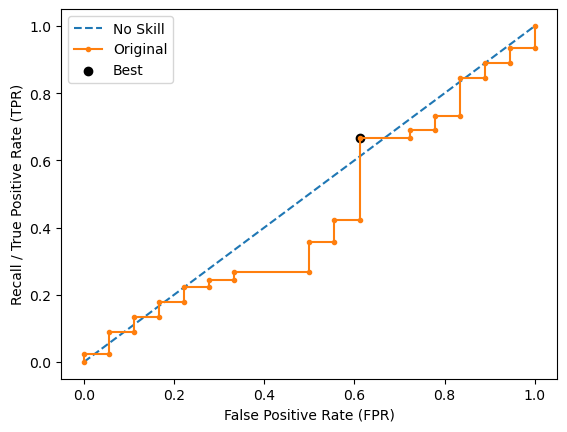

Ave Test Accuracy: 0.5047619047619047
Stdev Test Accuracy: 0.0796819072889596
Ave Test Recall: 0.711111111111111
Stdev Test Recall: 0.106863244787063
Ave Test F-0.5 Score: 0.37197615218762226
Stdev Test F-0.5 Score: 0.05498669793584475
Ave Test F-0.75 Score: 0.41060649683217953
Stdev Test F-0.75 Score: 0.05783722566900786
Ave Test F-1 Score: 0.45184119106699755
Stdev Test F-1 Score: 0.061198347722115985
Ave Test F-1.5 Score: 0.5246927106681792
Stdev Test F-1.5 Score: 0.06893282856467246
Ave Test F-2 Score: 0.5772309351778926
Stdev Test F-2 Score: 0.0766681775711059
Ave Test G-mean: 0.5429726575644374
Stdev Test G-mean: 0.07449792276190938
Ave Test Specificity: 0.4222222222222222
Stdev Test Specificity: 0.1077262190536962
Ave Test Precision: 0.3329688693659282
Ave Test NPV: 0.7841277275502438
Ave Runtime: 1.9428234100341797


In [99]:
ld_t02_catboost_gs, ld_t02_catboost_be, ld_t02_catboost_model_info, ld_t02_catboost_metrics_df = catboost_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'euclidean', 'classifier__n_neighbors': 11, 'resampling': ADASYN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.85
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='euclidean', n_neighbors=11))])
Mean Train Score (Recall) 0.6791023951247166
Std Train Score (Recall) 0.05388911783176966
GridSearchCV Runtime: 31.38495635986328 secs
Run 1 - Random State: 0
Test Accuracy: 0.3968253968253968
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.32178217821782173
Test F-0.75 Score: 0.3619153674832962
Test F-1 Score: 0.40625
Test F-1.5 Score: 0.4884393063583815
Test F-2 Score: 0.5508474576271186
Test G-Mean Score: 0.43885372573625553
Best Threshold=0.636
Best Recall=0.622
Best G-Mean=0.526


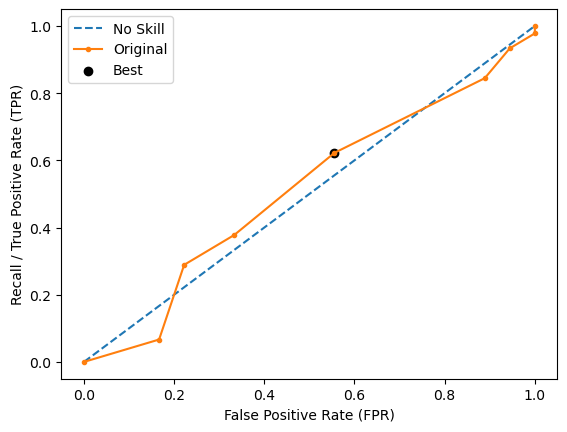

Run 2 - Random State: 1
Test Accuracy: 0.38095238095238093
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.3155339805825243
Test F-0.75 Score: 0.35557986870897157
Test F-1 Score: 0.4
Test F-1.5 Score: 0.48285714285714276
Test F-2 Score: 0.546218487394958
Test G-Mean Score: 0.4201704533597564
Best Threshold=0.727
Best Recall=0.422
Best G-Mean=0.508


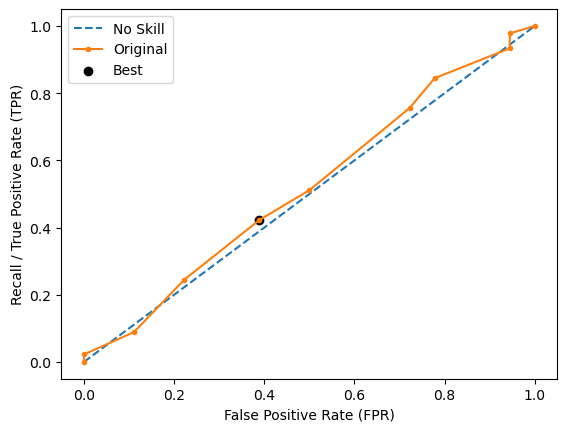

Run 3 - Random State: 2
Test Accuracy: 0.3333333333333333
Test Recall: 0.9444444444444444
Test F-0.5 Score: 0.33999999999999997
Test F-0.75 Score: 0.3899082568807339
Test F-1 Score: 0.44736842105263147
Test F-1.5 Score: 0.5609137055837562
Test F-2 Score: 0.6538461538461537
Test G-Mean Score: 0.28974232912011766
Best Threshold=0.727
Best Recall=0.600
Best G-Mean=0.548


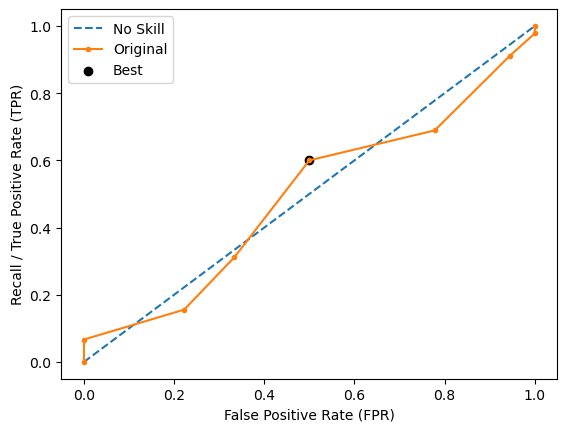

Run 4 - Random State: 3
Test Accuracy: 0.4444444444444444
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3160919540229885
Test F-0.75 Score: 0.34987277353689566
Test F-1 Score: 0.38596491228070173
Test F-1.5 Score: 0.449685534591195
Test F-2 Score: 0.4954954954954955
Test G-Mean Score: 0.4804832957875479
Best Threshold=0.545
Best Recall=0.622
Best G-Mean=0.492


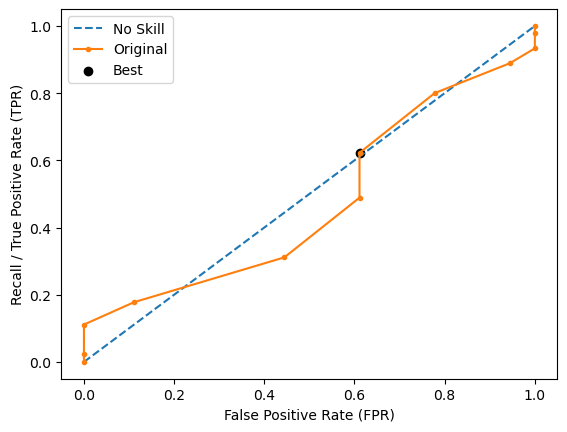

Run 5 - Random State: 4
Test Accuracy: 0.36507936507936506
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.32110091743119273
Test F-0.75 Score: 0.36382536382536385
Test F-1 Score: 0.4117647058823529
Test F-1.5 Score: 0.5027624309392266
Test F-2 Score: 0.5737704918032788
Test G-Mean Score: 0.39440531887330776
Best Threshold=0.636
Best Recall=0.533
Best G-Mean=0.571


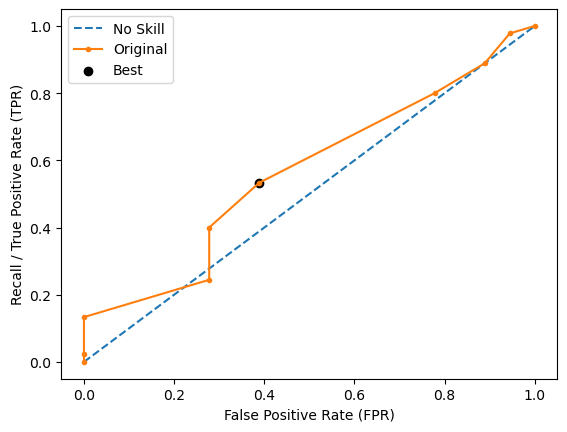

Ave Test Accuracy: 0.3841269841269841
Stdev Test Accuracy: 0.04108628287474535
Ave Test Recall: 0.7555555555555555
Stdev Test Recall: 0.12171612389003689
Ave Test F-0.5 Score: 0.32290180605090546
Stdev Test F-0.5 Score: 0.009968750415683118
Ave Test F-0.75 Score: 0.36422032608705224
Stdev Test F-0.75 Score: 0.015377324098295658
Ave Test F-1 Score: 0.41026960784313726
Stdev Test F-1 Score: 0.022863166767460925
Ave Test F-1.5 Score: 0.49693162406594044
Stdev Test F-1.5 Score: 0.040712739149265535
Ave Test F-2 Score: 0.5640356172334009
Stdev Test F-2 Score: 0.05777072404533605
Ave Test G-mean: 0.40473102457539706
Stdev Test G-mean: 0.07153698618591114
Ave Test Specificity: 0.23555555555555557
Stdev Test Specificity: 0.10493972402771194
Ave Test Precision: 0.2828718341320338
Ave Test NPV: 0.7188046757164404
Ave Runtime: 0.04180054664611817


In [100]:
ld_t02_knn_gs, ld_t02_knn_be, ld_t02_knn_model_info, ld_t02_knn_metrics_df = knn_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.7433333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', 

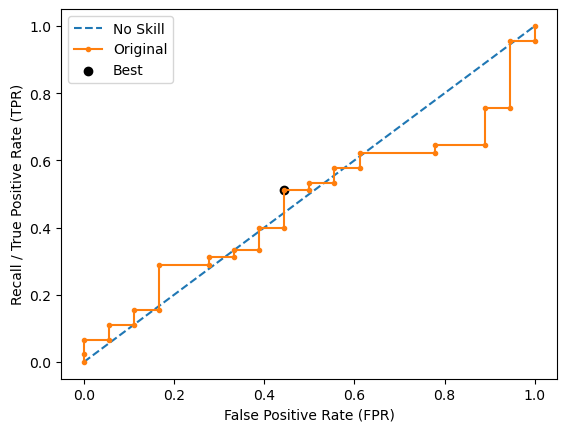

Run 2 - Random State: 1
Test Accuracy: 0.4444444444444444
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3160919540229885
Test F-0.75 Score: 0.34987277353689566
Test F-1 Score: 0.38596491228070173
Test F-1.5 Score: 0.449685534591195
Test F-2 Score: 0.4954954954954955
Test G-Mean Score: 0.4804832957875479
Best Threshold=0.619
Best Recall=0.467
Best G-Mean=0.509


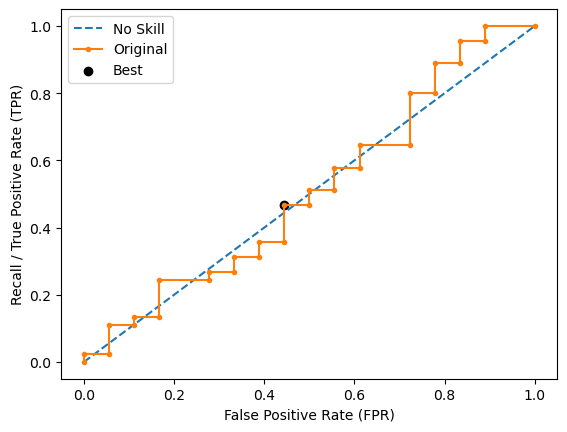

Run 3 - Random State: 2
Test Accuracy: 0.5555555555555556
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.4012345679012345
Test F-0.75 Score: 0.4403794037940379
Test F-1 Score: 0.4814814814814815
Test F-1.5 Score: 0.5522875816993464
Test F-2 Score: 0.6018518518518519
Test G-Mean Score: 0.5942107536498195
Best Threshold=0.622
Best Recall=0.422
Best G-Mean=0.531


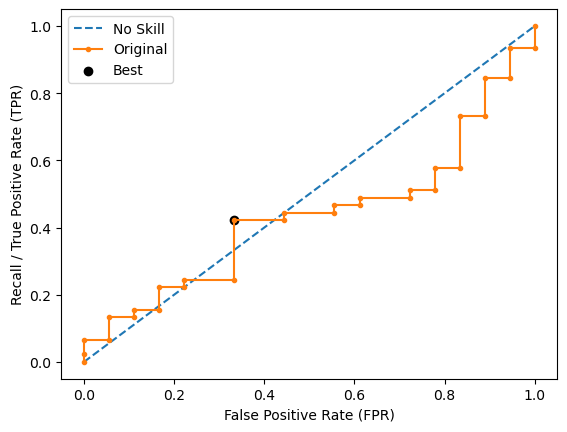

Run 4 - Random State: 3
Test Accuracy: 0.5714285714285714
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.41139240506329117
Test F-0.75 Score: 0.45013850415512463
Test F-1 Score: 0.490566037735849
Test F-1.5 Score: 0.5596026490066226
Test F-2 Score: 0.6074766355140188
Test G-Mean Score: 0.607565471755214
Best Threshold=0.542
Best Recall=0.400
Best G-Mean=0.494


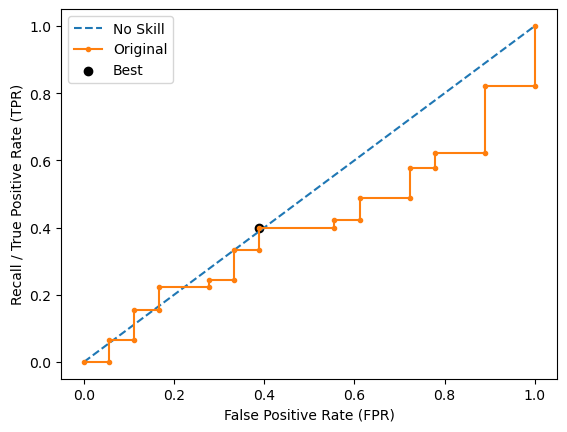

Run 5 - Random State: 4
Test Accuracy: 0.4603174603174603
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3235294117647059
Test F-0.75 Score: 0.35714285714285715
Test F-1 Score: 0.3928571428571429
Test F-1.5 Score: 0.45541401273885357
Test F-2 Score: 0.5000000000000001
Test G-Mean Score: 0.49441323247304425
Best Threshold=0.498
Best Recall=0.622
Best G-Mean=0.492


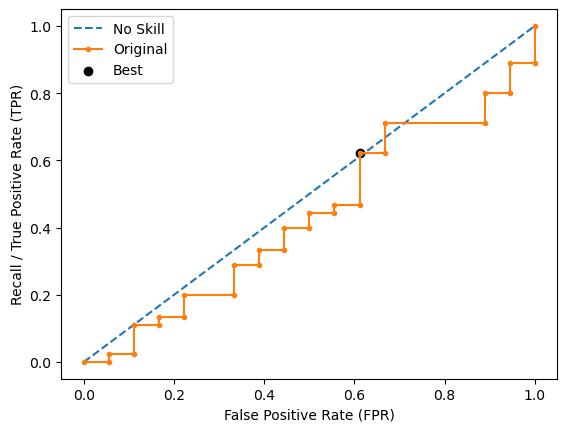

Ave Test Accuracy: 0.49523809523809526
Stdev Test Accuracy: 0.06289400874971096
Ave Test Recall: 0.6555555555555557
Stdev Test Recall: 0.06085806194501842
Ave Test F-0.5 Score: 0.3536680585550417
Stdev Test F-0.5 Score: 0.04828803755886673
Ave Test F-0.75 Score: 0.3894812624331622
Stdev Test F-0.75 Score: 0.051120834816441606
Ave Test F-1 Score: 0.42736689732717537
Stdev Test F-1 Score: 0.053716132241039806
Ave Test F-1.5 Score: 0.4933350625254425
Stdev Test F-1.5 Score: 0.05726115858431538
Ave Test F-2 Score: 0.5400638956713724
Stdev Test F-2 Score: 0.05903395071247981
Ave Test G-mean: 0.5314312098906347
Stdev Test G-mean: 0.06383456645751577
Ave Test Specificity: 0.4311111111111111
Stdev Test Specificity: 0.06402160129283525
Ave Test Precision: 0.3172231861705546
Ave Test NPV: 0.7545820105820106
Ave Runtime: 0.1529524326324463


In [101]:
ld_t02_xgb_gs, ld_t02_xgb_be, ld_t02_xgb_model_info, ld_t02_xgb_metrics_df = xgb_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.7033333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.9992952806122448
Std Train Score (Recall) 0.0010627878404481728
GridSearchCV Runtime: 57.355719566345215 secs
Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3763440860215054
Test F-0.7

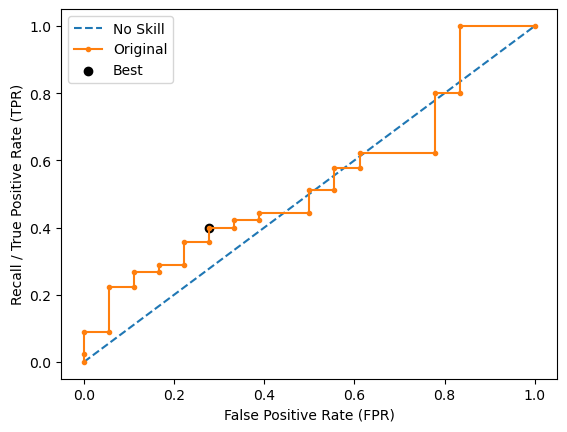

Run 2 - Random State: 1
Test Accuracy: 0.38095238095238093
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.2747252747252747
Test F-0.75 Score: 0.30562347188264055
Test F-1 Score: 0.33898305084745767
Test F-1.5 Score: 0.39877300613496935
Test F-2 Score: 0.4424778761061947
Test G-Mean Score: 0.415739709641549
Best Threshold=0.598
Best Recall=0.667
Best G-Mean=0.577


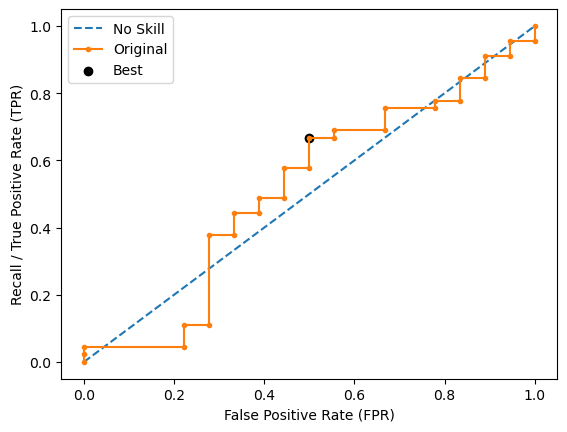

Run 3 - Random State: 2
Test Accuracy: 0.4603174603174603
Test Recall: 0.5
Test F-0.5 Score: 0.2922077922077922
Test F-0.75 Score: 0.31869688385269124
Test F-1 Score: 0.3461538461538462
Test F-1.5 Score: 0.3926174496644295
Test F-2 Score: 0.4245283018867924
Test G-Mean Score: 0.4714045207910317
Best Threshold=0.180
Best Recall=0.800
Best G-Mean=0.558


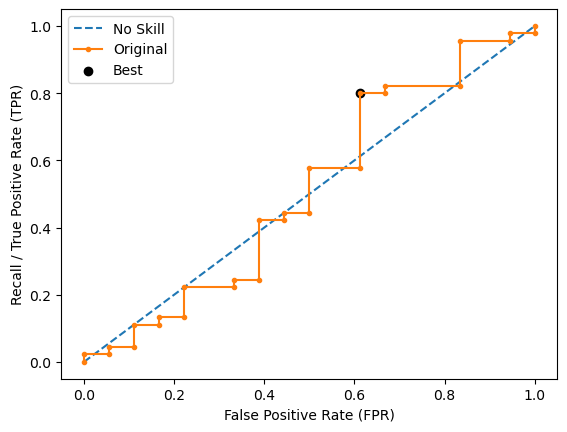

Run 4 - Random State: 3
Test Accuracy: 0.6349206349206349
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.4577464788732394
Test F-0.75 Score: 0.4939209726443769
Test F-1 Score: 0.5306122448979592
Test F-1.5 Score: 0.5909090909090909
Test F-2 Score: 0.6310679611650485
Test G-Mean Score: 0.6582805886043833
Best Threshold=0.795
Best Recall=0.267
Best G-Mean=0.422


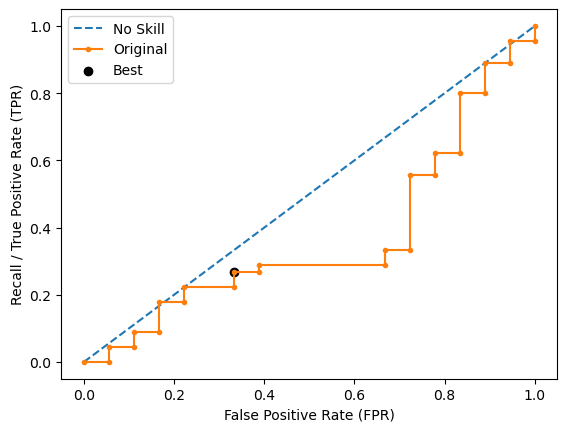

Run 5 - Random State: 4
Test Accuracy: 0.4444444444444444
Test Recall: 0.8333333333333334
Test F-0.5 Score: 0.3640776699029126
Test F-0.75 Score: 0.4102844638949672
Test F-1 Score: 0.4615384615384616
Test F-1.5 Score: 0.5571428571428572
Test F-2 Score: 0.630252100840336
Test G-Mean Score: 0.49065338146265813
Best Threshold=0.654
Best Recall=0.556
Best G-Mean=0.497


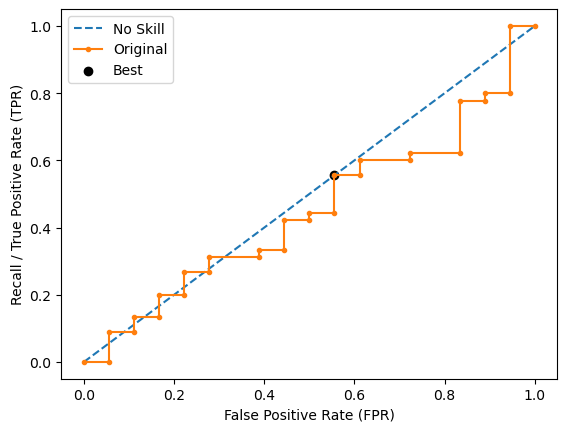

Ave Test Accuracy: 0.4825396825396825
Stdev Test Accuracy: 0.09430762398420918
Ave Test Recall: 0.6777777777777778
Stdev Test Recall: 0.1438019900616087
Ave Test F-0.5 Score: 0.35302026034614487
Stdev Test F-0.5 Score: 0.07324975947345473
Ave Test F-0.75 Score: 0.3896380121719616
Stdev Test F-0.75 Score: 0.07793246203455323
Ave Test F-1 Score: 0.42879085402087824
Stdev Test F-1 Score: 0.08332000840419367
Ave Test F-1.5 Score: 0.4981915110732997
Stdev Test F-1.5 Score: 0.09479602181859696
Ave Test F-2 Score: 0.548472265543534
Stdev Test F-2 Score: 0.1053629331965977
Ave Test G-mean: 0.515627292701262
Stdev Test G-mean: 0.09165893037614878
Ave Test Specificity: 0.40444444444444444
Stdev Test Specificity: 0.12511722898008218
Ave Test Precision: 0.31608908591811097
Ave Test NPV: 0.7583585236602478
Ave Runtime: 0.13310441970825196


In [102]:
ld_t02_gbm_gs, ld_t02_gbm_be, ld_t02_gbm_model_info, ld_t02_gbm_metrics_df = gbm_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.8899999999999999
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Recall) 0.7935893801965231
Std Train Score (Recall) 0.045679879049068575
GridSearchCV Runtime: 454.22437858581543 secs
Run 1 - Random State: 0
Test Accuracy: 0.2698412698412698
Test Recall: 0.9444444444444444
Test F-0.5 Sc

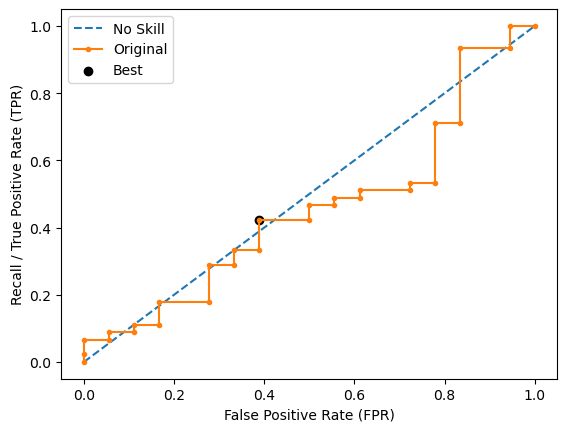

Run 2 - Random State: 1
Test Accuracy: 0.3333333333333333
Test Recall: 0.8888888888888888
Test F-0.5 Score: 0.33057851239669417
Test F-0.75 Score: 0.3780718336483932
Test F-1 Score: 0.43243243243243246
Test F-1.5 Score: 0.5388601036269429
Test F-2 Score: 0.6249999999999999
Test G-Mean Score: 0.31426968052735443
Best Threshold=0.545
Best Recall=0.689
Best G-Mean=0.619


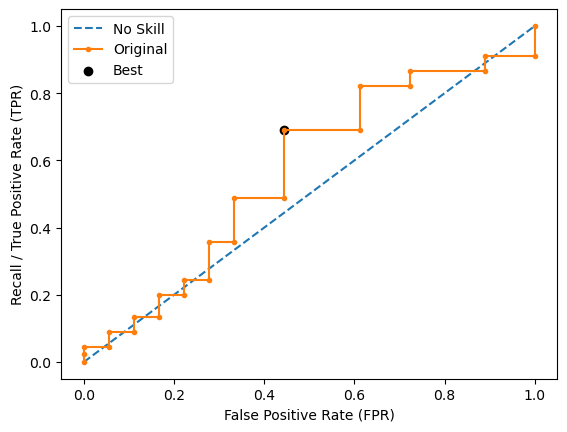

Run 3 - Random State: 2
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.510
Best Recall=0.467
Best G-Mean=0.509


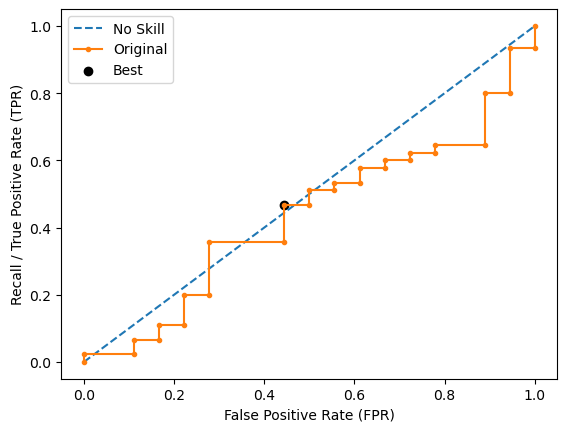

Run 4 - Random State: 3
Test Accuracy: 0.42857142857142855
Test Recall: 0.8888888888888888
Test F-0.5 Score: 0.3669724770642202
Test F-0.75 Score: 0.4158004158004158
Test F-1 Score: 0.47058823529411764
Test F-1.5 Score: 0.574585635359116
Test F-2 Score: 0.6557377049180328
Test G-Mean Score: 0.46613726585340065
Best Threshold=0.550
Best Recall=0.467
Best G-Mean=0.509


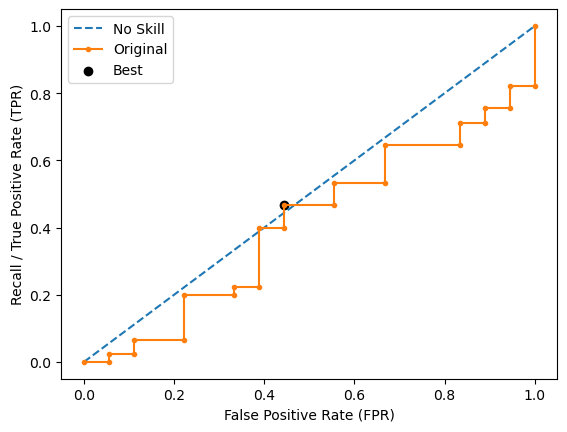

Run 5 - Random State: 4
Test Accuracy: 0.36507936507936506
Test Recall: 0.9444444444444444
Test F-0.5 Score: 0.35123966942148754
Test F-0.75 Score: 0.4017013232514177
Test F-1 Score: 0.45945945945945943
Test F-1.5 Score: 0.572538860103627
Test F-2 Score: 0.6640624999999999
Test G-Mean Score: 0.35486043161491804
Best Threshold=0.560
Best Recall=0.511
Best G-Mean=0.533


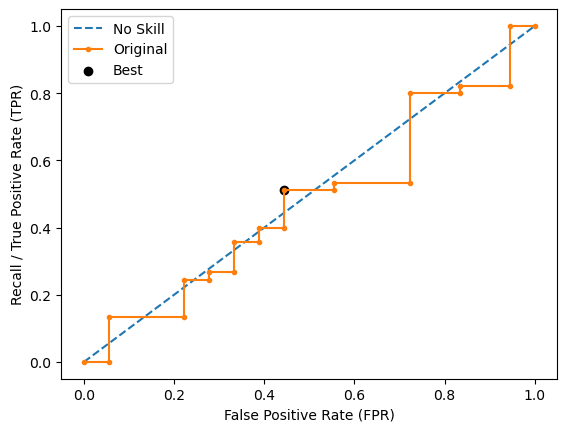

Ave Test Accuracy: 0.380952380952381
Stdev Test Accuracy: 0.0911835340720322
Ave Test Recall: 0.8333333333333333
Stdev Test Recall: 0.188398055086813
Ave Test F-0.5 Score: 0.3370481879027114
Stdev Test F-0.5 Score: 0.02151067585937088
Ave Test F-0.75 Score: 0.38116061804470475
Stdev Test F-0.75 Score: 0.028874816883200146
Ave Test F-1 Score: 0.43096541319230397
Stdev Test F-1 Score: 0.040208603840200766
Ave Test F-1.5 Score: 0.5268199796848995
Stdev Test F-1.5 Score: 0.06805479441833427
Ave Test F-2 Score: 0.6032043534020965
Stdev Test F-2 Score: 0.09429557169992857
Ave Test G-mean: 0.32815848151982197
Stdev Test G-mean: 0.1994310151597252
Ave Test Specificity: 0.2
Stdev Test Specificity: 0.19436506316151
Ave Test Precision: 0.2947603686635945
Ave Test NPV: 0.6272664835164836
Ave Runtime: 0.32308592796325686


In [103]:
ld_t02_rf_gs, ld_t02_rf_be, ld_t02_rf_model_info, ld_t02_rf_metrics_df = rf_class2(ld_t02, "recall",
                                                            'ageing_class', random_state=0)

In [104]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t02_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t02_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t02_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
9,CatBoost,0.542973,0.074498,0.780000,1.000000,0.711111,0.106863,0.504762,0.079682,0.371976,0.410606,0.451841,0.524693,0.577231
7,Extreme Gradient Boosting (XGBoost),0.531431,0.063835,0.743333,0.962611,0.655556,0.060858,0.495238,0.062894,0.353668,0.389481,0.427367,0.493335,0.540064
8,AdaBoost,0.529459,0.037999,0.706667,1.000000,0.655556,0.091287,0.498413,0.044331,0.353667,0.389081,0.426600,0.492159,0.538852
5,Gradient Boosting Machine (GBM),0.515627,0.091659,0.703333,0.999295,0.677778,0.143802,0.482540,0.094308,0.353020,0.389638,0.428791,0.498192,0.548472
6,LightGBM,0.497458,0.087436,0.786667,0.849621,0.777778,0.124226,0.457143,0.085036,0.361310,0.404085,0.450958,0.536974,0.601688
0,k-Nearest Neighbors,0.404731,0.071537,0.850000,0.679102,0.755556,0.121716,0.384127,0.041086,0.322902,0.364220,0.410270,0.496932,0.564036
4,Random Forest,0.328158,0.199431,0.890000,0.793589,0.833333,0.188398,0.380952,0.091184,0.337048,0.381161,0.430965,0.526820,0.603204
3,Decision Tree,0.309616,0.223440,1.000000,0.609581,0.855556,0.115202,0.368254,0.111902,0.341102,0.386762,0.438363,0.537721,0.616898
1,SVM Classifier,0.000000,0.000000,1.000000,0.725521,0.800000,0.447214,0.371429,0.191663,0.266667,0.307692,0.355556,0.452174,0.533333
2,Logistic Regression,0.000000,0.000000,0.920000,0.798475,0.800000,0.447214,0.371429,0.191663,0.266667,0.307692,0.355556,0.452174,0.533333


## Optimizing for F1-score

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5311538461538462
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, min_samples_leaf=2,
                                        random_state=0))])
Mean Train Score (Recall) 0.5029341467558884
Std Train Score (Recall) 0.053629666053352586
GridSearchCV Runtime: 57.97381377220154 secs
Run 1 - Random State: 0
Test Accuracy: 0.5873015873015873
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.2777777777777778
Test F-0.75 Score: 0.2777777777777778
Test F-1 Score: 0.27777

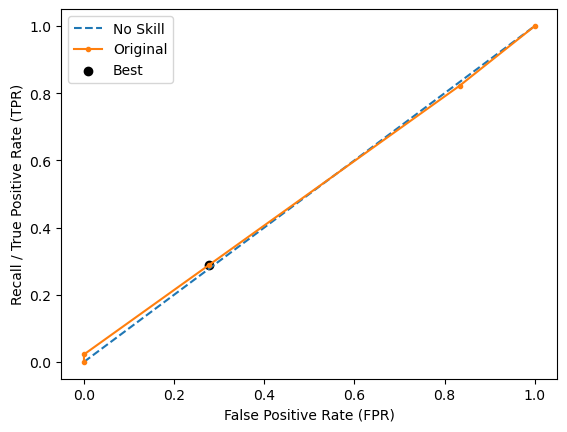

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.411764705882353
Test F-0.75 Score: 0.4545454545454545
Test F-1 Score: 0.5
Test F-1.5 Score: 0.5796178343949044
Test F-2 Score: 0.6363636363636364
Test G-Mean Score: 0.6024640760767094
Best Threshold=0.753
Best Recall=0.289
Best G-Mean=0.380


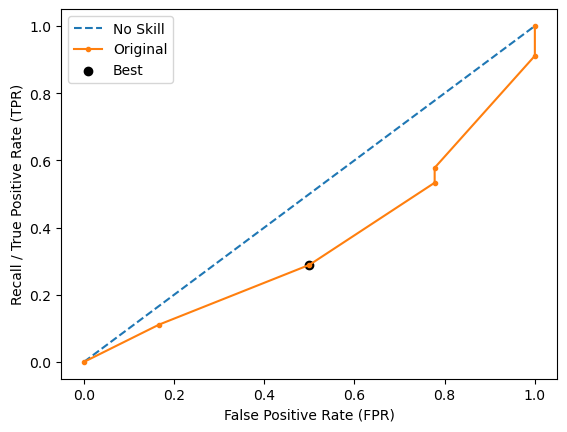

Run 3 - Random State: 2
Test Accuracy: 0.4444444444444444
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.30120481927710846
Test F-0.75 Score: 0.3315649867374006
Test F-1 Score: 0.36363636363636365
Test F-1.5 Score: 0.41935483870967744
Test F-2 Score: 0.45871559633027525
Test G-Mean Score: 0.47140452079103173
Best Threshold=0.541
Best Recall=0.533
Best G-Mean=0.544


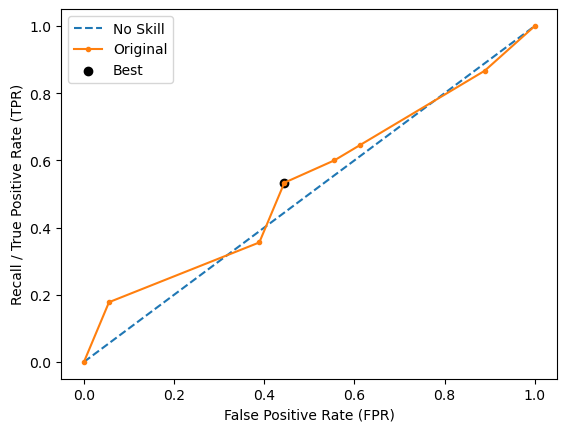

Run 4 - Random State: 3
Test Accuracy: 0.6666666666666666
Test Recall: 0.5
Test F-0.5 Score: 0.44117647058823534
Test F-0.75 Score: 0.4518072289156626
Test F-1 Score: 0.4615384615384615
Test F-1.5 Score: 0.475609756097561
Test F-2 Score: 0.48387096774193544
Test G-Mean Score: 0.6055300708194984
Best Threshold=0.345
Best Recall=0.622
Best G-Mean=0.492


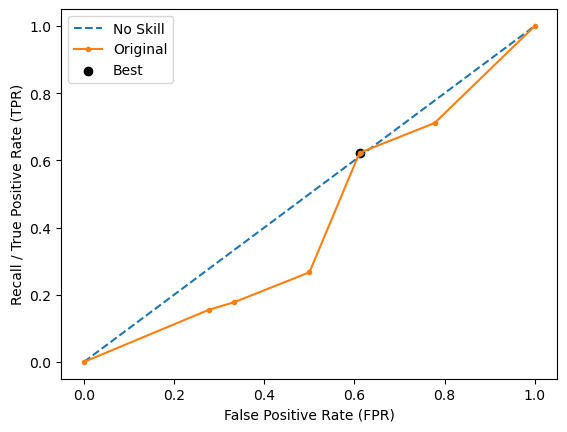

Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.5
Test F-0.5 Score: 0.25862068965517243
Test F-0.75 Score: 0.2862595419847328
Test F-1 Score: 0.3157894736842105
Test F-1.5 Score: 0.3679245283018868
Test F-2 Score: 0.40540540540540543
Test G-Mean Score: 0.408248290463863
Best Threshold=0.562
Best Recall=0.667
Best G-Mean=0.577


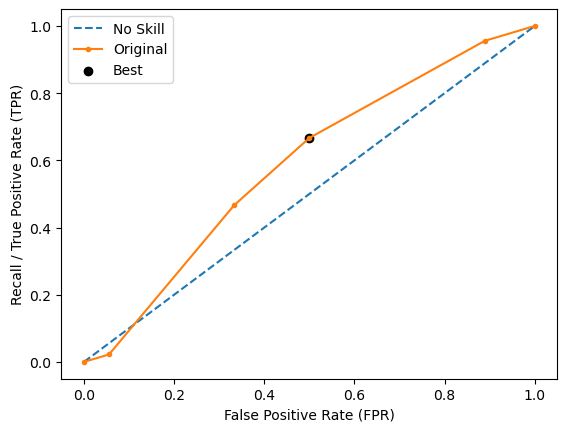

Ave Test Accuracy: 0.526984126984127
Stdev Test Accuracy: 0.1141312889666511
Ave Test Recall: 0.5222222222222223
Stdev Test Recall: 0.17829785039868012
Ave Test F-0.5 Score: 0.33810889263612937
Stdev Test F-0.5 Score: 0.08271673487505027
Ave Test F-0.75 Score: 0.3603909979922057
Stdev Test F-0.75 Score: 0.08713975099507688
Ave Test F-1 Score: 0.38374841532736265
Stdev Test F-1 Score: 0.09462876230772616
Ave Test F-1.5 Score: 0.42405694705636154
Stdev Test F-1.5 Score: 0.1133880895559113
Ave Test F-2 Score: 0.45242667672380604
Stdev Test F-2 Score: 0.12997532162727338
Ave Test G-mean: 0.5064182805191095
Stdev Test G-mean: 0.09185859853110206
Ave Test Specificity: 0.528888888888889
Stdev Test Specificity: 0.1828444660508819
Ave Test Precision: 0.3151619520040573
Ave Test NPV: 0.7308266178266178
Ave Runtime: 0.004315042495727539


In [105]:
ld_t02_dt_gs, ld_t02_dt_be, ld_t02_dt_model_info, ld_t02_dt_metrics_df = dt_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.46163991081382383
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Recall) 0.616773891565319
Std Train Score (Recall) 0.03946156350582006
GridSearchCV Runtime: 18.901448249816895 secs
Run 1 - Random State: 0
Test Accuracy: 0.30158730158730157
Test Recall: 1.0
Test F-0.5 Score: 0.33834586466165417
Test F-0.75 Score: 0.38994800693240905
Test F-1 Score: 0.45000000000000007
Test F-1.5 Score: 0.5707317073170731
Test F-2 Score: 0.6716417910447762
Test G-Mean Score: 0.149

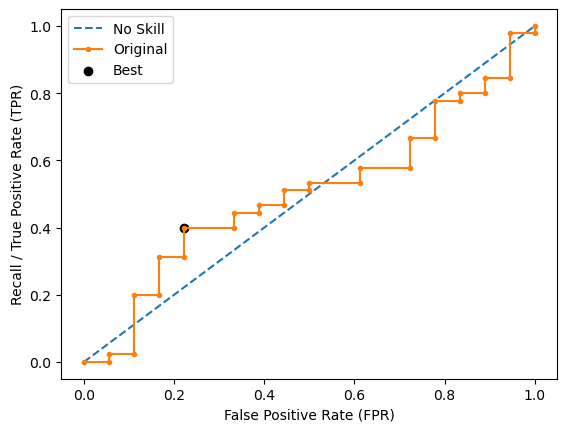

Run 2 - Random State: 1
Test Accuracy: 0.38095238095238093
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.24096385542168675
Test F-0.75 Score: 0.2652519893899204
Test F-1 Score: 0.2909090909090909
Test F-1.5 Score: 0.33548387096774196
Test F-2 Score: 0.36697247706422015
Test G-Mean Score: 0.3975231959999626
Best Threshold=0.500
Best Recall=0.622
Best G-Mean=0.617


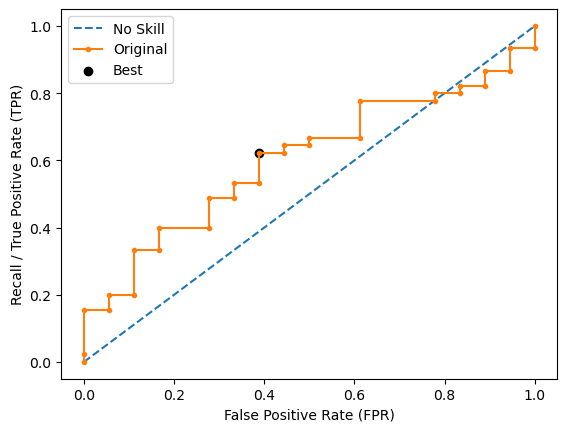

Run 3 - Random State: 2
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.506
Best Recall=0.289
Best G-Mean=0.474


invalid value encountered in longlong_scalars


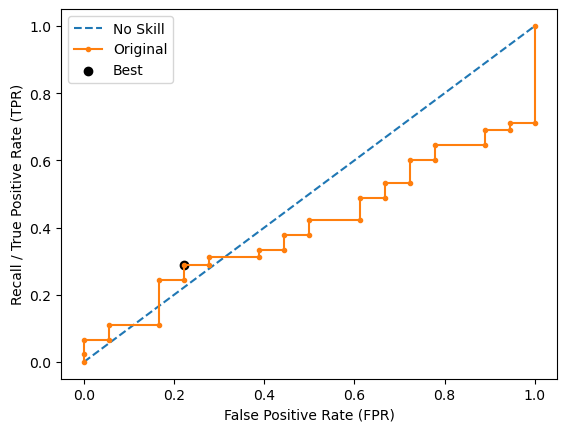

Run 4 - Random State: 3
Test Accuracy: 0.7142857142857143
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.495
Best Recall=0.578
Best G-Mean=0.507


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


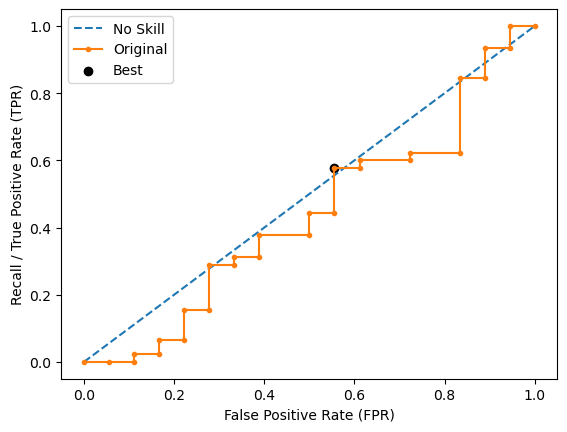

Run 5 - Random State: 4
Test Accuracy: 0.6507936507936508
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.303030303030303
Test F-0.75 Score: 0.28248587570621464
Test F-1 Score: 0.26666666666666666
Test F-1.5 Score: 0.24761904761904757
Test F-2 Score: 0.23809523809523808
Test G-Mean Score: 0.4274529791482521
Best Threshold=0.497
Best Recall=0.689
Best G-Mean=0.587


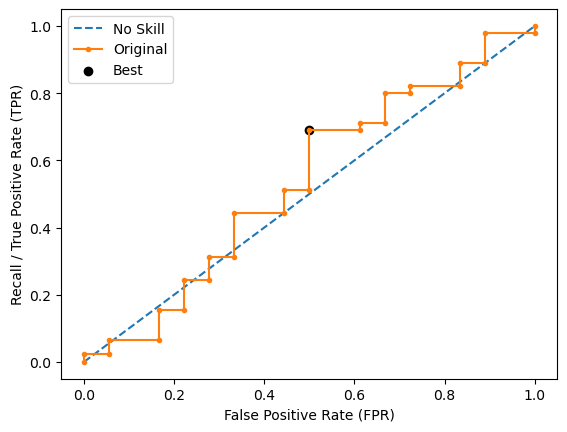

Ave Test Accuracy: 0.4666666666666667
Stdev Test Accuracy: 0.20159355070928917
Ave Test Recall: 0.5333333333333334
Stdev Test Recall: 0.4540625942600567
Ave Test F-0.5 Score: 0.24313467128939545
Stdev Test F-0.5 Score: 0.14133969497637813
Ave Test F-0.75 Score: 0.26446025132878576
Stdev Test F-0.75 Score: 0.15846861469845785
Ave Test F-1 Score: 0.2904040404040404
Stdev Test F-1 Score: 0.18309665553146925
Ave Test F-1.5 Score: 0.3438104034416421
Stdev Test F-1.5 Score: 0.23876873435381707
Ave Test F-2 Score: 0.3886752345741802
Stdev Test F-2 Score: 0.28790757692013197
Ave Test G-mean: 0.19480947472964014
Stdev Test G-mean: 0.20809211045878906
Ave Test Specificity: 0.44000000000000006
Stdev Test Specificity: 0.45688153906755824
Ave Test Precision: 0.2251172831817993
Ave Test NPV: 0.7637901314371903
Ave Runtime: 0.018818759918212892


In [106]:
ld_t02_logreg_gs, ld_t02_logreg_be, ld_t02_logreg_model_info, ld_t02_logreg_metrics_df = logreg_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 0.001, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.46739600978731416
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=0.001, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.5037369896910462
Std Train Score (Recall) 0.06241365884423552
GridSearchCV Runtime: 30.772236824035645 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.2857142857142857
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.2826086956521739
Test F-0.75 Score: 0.3217821782178218
Test F-1 Score: 0.36619718309859156
Test F-1.5 Score: 0.45187165775401067
Test F-2 

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


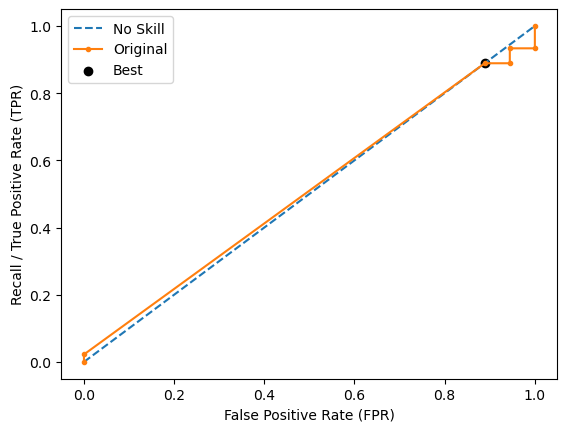

[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.31746031746031744
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3043478260869565
Test F-0.75 Score: 0.3465346534653465
Test F-1 Score: 0.39436619718309857
Test F-1.5 Score: 0.48663101604278075
Test F-2 Score: 0.5599999999999999
Test G-Mean Score: 0.32203059435976533
Best Threshold=0.515
Best Recall=0.444
Best G-Mean=0.544


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


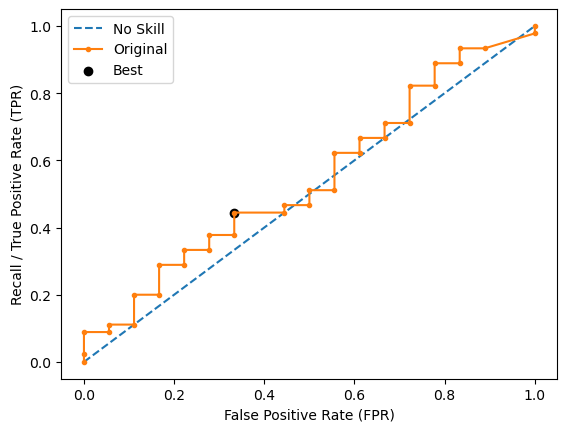

[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.30158730158730157
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.27522935779816515
Test F-0.75 Score: 0.31185031185031187
Test F-1 Score: 0.3529411764705882
Test F-1.5 Score: 0.4309392265193371
Test F-2 Score: 0.4918032786885246
Test G-Mean Score: 0.32203059435976533
Best Threshold=0.506
Best Recall=0.133
Best G-Mean=0.344


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


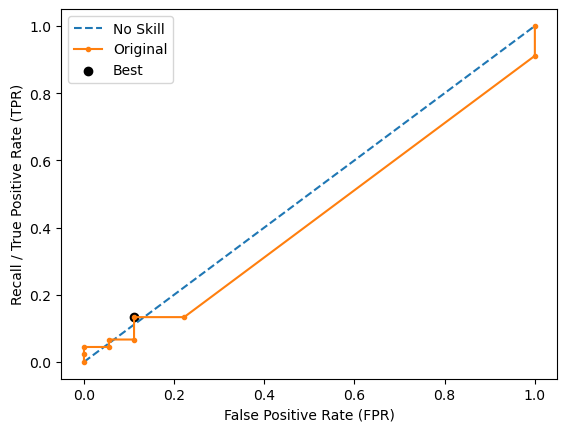

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.30158730158730157
Test Recall: 0.8888888888888888
Test F-0.5 Score: 0.32
Test F-0.75 Score: 0.36697247706422015
Test F-1 Score: 0.42105263157894735
Test F-1.5 Score: 0.5279187817258884
Test F-2 Score: 0.6153846153846153
Test G-Mean Score: 0.24343224778007383
Best Threshold=0.475
Best Recall=0.533
Best G-Mean=0.516


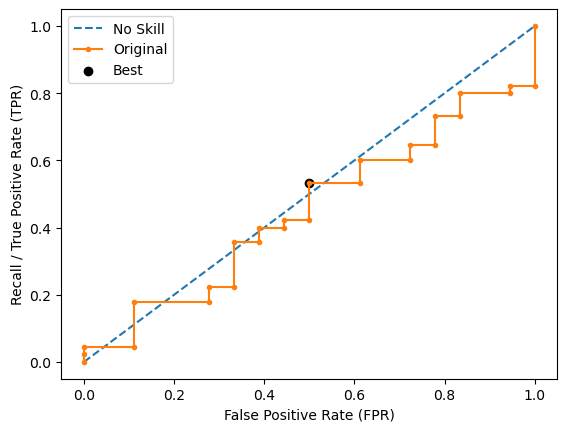

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.31746031746031744
Test Recall: 1.0
Test F-0.5 Score: 0.34351145038167935
Test F-0.75 Score: 0.39543057996485065
Test F-1 Score: 0.4556962025316456
Test F-1.5 Score: 0.5763546798029556
Test F-2 Score: 0.6766917293233082
Test G-Mean Score: 0.21081851067789198
Best Threshold=0.475
Best Recall=0.511
Best G-Mean=0.559


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


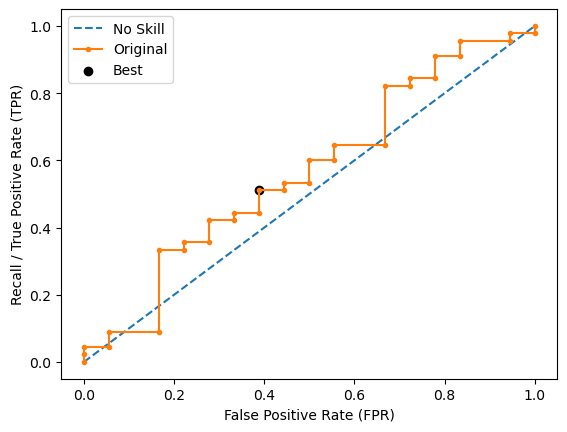

Ave Test Accuracy: 0.30476190476190473
Stdev Test Accuracy: 0.013280317881493262
Ave Test Recall: 0.8111111111111111
Stdev Test Recall: 0.1337954953199144
Ave Test F-0.5 Score: 0.305139465983795
Stdev Test F-0.5 Score: 0.027821401541874523
Ave Test F-0.75 Score: 0.34851404011251014
Stdev Test F-0.75 Score: 0.03392865672391292
Ave Test F-1 Score: 0.3980506781725742
Stdev Test F-1 Score: 0.04157879276606278
Ave Test F-1.5 Score: 0.4947430723689945
Stdev Test F-1.5 Score: 0.05859986466158525
Ave Test F-2 Score: 0.5727759246792897
Stdev Test F-2 Score: 0.07436243482825626
Ave Test G-mean: 0.27631816180875246
Stdev Test G-mean: 0.04898824339706044
Ave Test Specificity: 0.10222222222222221
Stdev Test Specificity: 0.04608098078517271
Ave Test Precision: 0.26407559968855654
Ave Test NPV: 0.6476923076923077
Ave Runtime: 0.015241670608520507


In [107]:
ld_t02_svm_gs, ld_t02_svm_be, ld_t02_svm_model_info, ld_t02_svm_metrics_df = svm_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.4721733821733822
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                max_depth=2, n_estimators=200,
                                random_state=0))])
Mean Train Score (Recall) 0.7439982320480212
Std Train Score (Recall) 0.022954774309887665
GridSearchCV Runtime: 22.645719051361084 secs
Run 1 - Random State: 0
Test Accuracy: 0.4603174603174603
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3608247422680412
Test F-0.75 Score: 0.40415704387990764
Test F-1 Score: 0.45

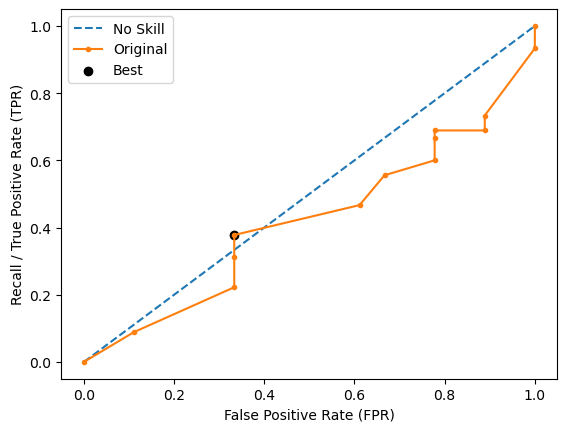

Run 2 - Random State: 1
Test Accuracy: 0.4444444444444444
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.30120481927710846
Test F-0.75 Score: 0.3315649867374006
Test F-1 Score: 0.36363636363636365
Test F-1.5 Score: 0.41935483870967744
Test F-2 Score: 0.45871559633027525
Test G-Mean Score: 0.47140452079103173
Best Threshold=0.481
Best Recall=0.711
Best G-Mean=0.562


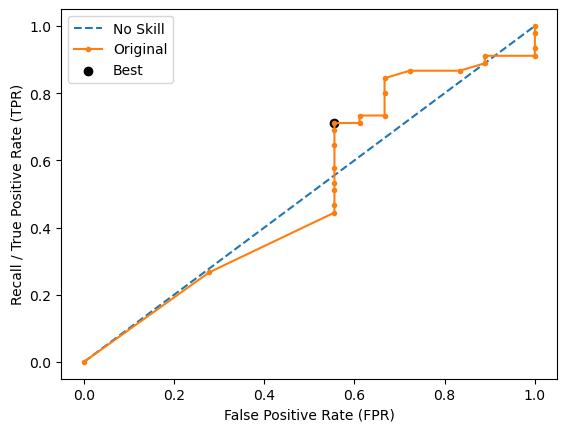

Run 3 - Random State: 2
Test Accuracy: 0.5079365079365079
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3614457831325302
Test F-0.75 Score: 0.3978779840848806
Test F-1 Score: 0.4363636363636364
Test F-1.5 Score: 0.503225806451613
Test F-2 Score: 0.5504587155963303
Test G-Mean Score: 0.5443310539518174
Best Threshold=0.524
Best Recall=0.444
Best G-Mean=0.471


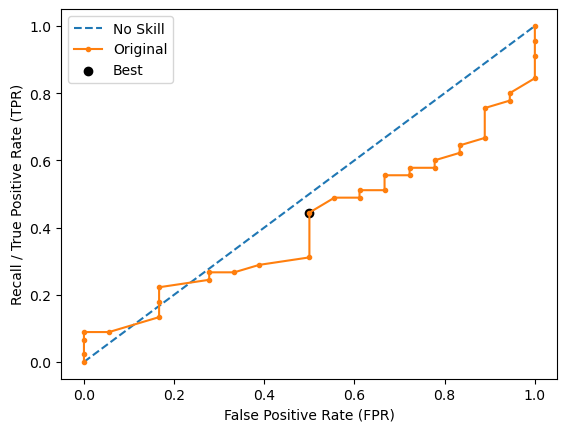

Run 4 - Random State: 3
Test Accuracy: 0.6349206349206349
Test Recall: 0.5
Test F-0.5 Score: 0.4090909090909091
Test F-0.75 Score: 0.4245283018867924
Test F-1 Score: 0.4390243902439025
Test F-1.5 Score: 0.46062992125984253
Test F-2 Score: 0.4736842105263158
Test G-Mean Score: 0.5868938953886337
Best Threshold=0.490
Best Recall=0.444
Best G-Mean=0.471


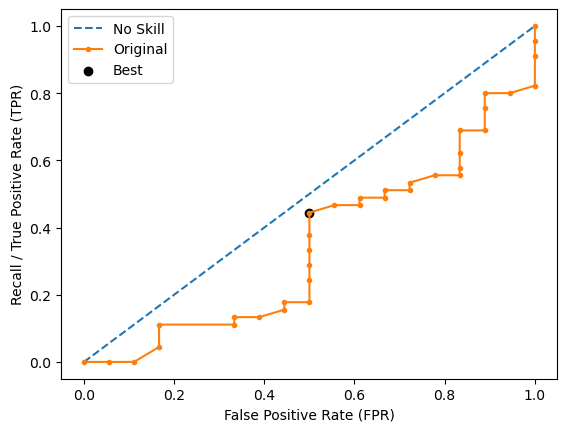

Run 5 - Random State: 4
Test Accuracy: 0.4444444444444444
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.2464788732394366
Test F-0.75 Score: 0.2659574468085106
Test F-1 Score: 0.2857142857142857
Test F-1.5 Score: 0.3181818181818182
Test F-2 Score: 0.3398058252427184
Test G-Mean Score: 0.4260064336151292
Best Threshold=0.480
Best Recall=0.644
Best G-Mean=0.598


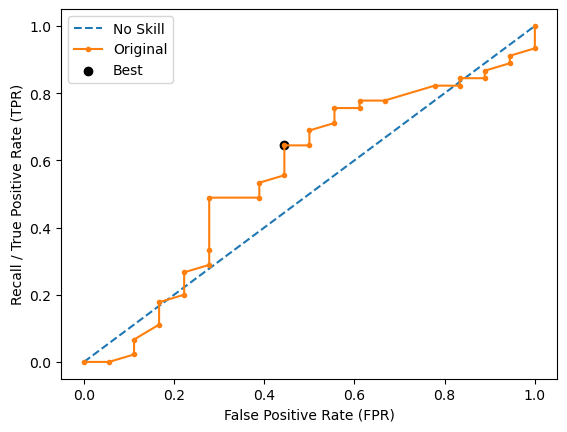

Ave Test Accuracy: 0.4984126984126984
Stdev Test Accuracy: 0.08062492126476377
Ave Test Recall: 0.5777777777777777
Stdev Test Recall: 0.15010284540118107
Ave Test F-0.5 Score: 0.3358090254016051
Stdev Test F-0.5 Score: 0.06290983842208497
Ave Test F-0.75 Score: 0.3648171526794984
Stdev Test F-0.75 Score: 0.06535482946437453
Ave Test F-1 Score: 0.39527031583679884
Stdev Test F-1 Score: 0.07032211217116591
Ave Test F-1.5 Score: 0.44797078461289797
Stdev Test F-1.5 Score: 0.08524376205670733
Ave Test F-2 Score: 0.4852225247115417
Stdev Test F-2 Score: 0.1002682094024766
Ave Test G-mean: 0.5075621961927854
Stdev Test G-mean: 0.0624635667479159
Ave Test Specificity: 0.4666666666666667
Stdev Test Specificity: 0.13425606637327303
Ave Test Precision: 0.3059774424430806
Ave Test NPV: 0.7364524291497976
Ave Runtime: 0.16257185935974122


In [108]:
ld_t02_lgbm_gs, ld_t02_lgbm_be, ld_t02_lgbm_model_info, ld_t02_lgbm_metrics_df = lgbm_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4392614454688758
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 0.8777648587244306
Std Train Score (Recall) 0.009954931339021079
GridSearchCV Runtime: 9.364897966384888 secs
Run 1 - Random State: 0
Test Accuracy: 0.4444444444444444
Test Recall: 0.5
Test F-0.5 Score: 0.28481012658227844
Test F-0.75 Score: 0.31163434903047094
Test F

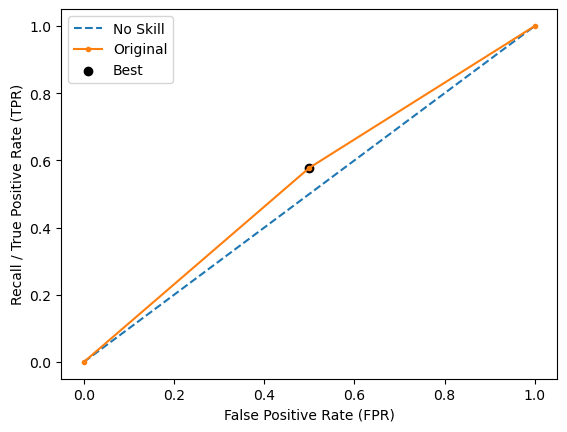

Run 2 - Random State: 1
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.731
Best Recall=0.489
Best G-Mean=0.494


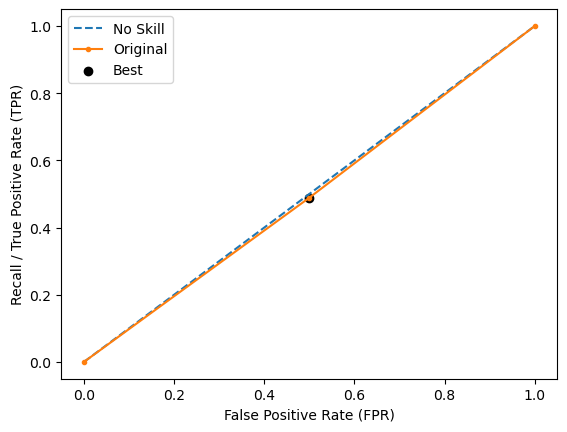

Run 3 - Random State: 2
Test Accuracy: 0.42857142857142855
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.29411764705882354
Test F-0.75 Score: 0.3246753246753247
Test F-1 Score: 0.35714285714285715
Test F-1.5 Score: 0.4140127388535032
Test F-2 Score: 0.4545454545454546
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.731
Best Recall=0.622
Best G-Mean=0.526


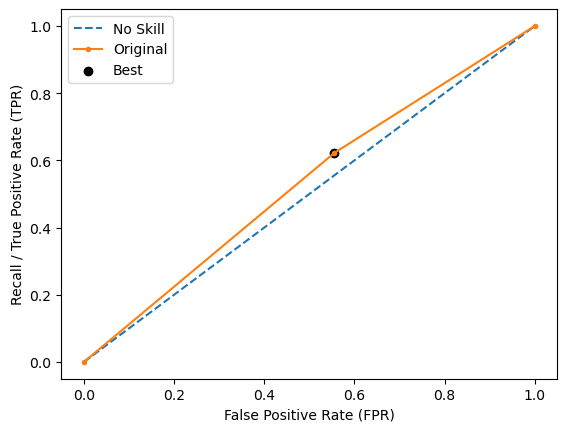

Run 4 - Random State: 3
Test Accuracy: 0.47619047619047616
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3313253012048193
Test F-0.75 Score: 0.3647214854111406
Test F-1 Score: 0.39999999999999997
Test F-1.5 Score: 0.46129032258064523
Test F-2 Score: 0.5045871559633028
Test G-Mean Score: 0.5079613089183317
Best Threshold=0.731
Best Recall=0.578
Best G-Mean=0.474


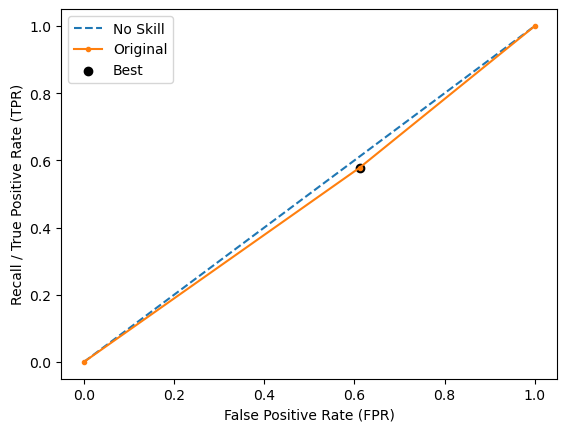

Run 5 - Random State: 4
Test Accuracy: 0.4126984126984127
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.23333333333333334
Test F-0.75 Score: 0.2536231884057971
Test F-1 Score: 0.27450980392156865
Test F-1.5 Score: 0.30952380952380953
Test F-2 Score: 0.3333333333333333
Test G-Mean Score: 0.4052129450846771
Best Threshold=0.731
Best Recall=0.578
Best G-Mean=0.594


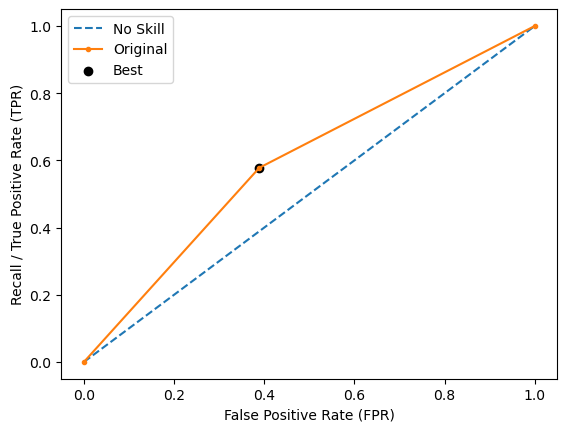

Ave Test Accuracy: 0.45396825396825397
Stdev Test Accuracy: 0.0382272843771184
Ave Test Recall: 0.5111111111111112
Stdev Test Recall: 0.08240220541217405
Ave Test F-0.5 Score: 0.2920975633259918
Stdev Test F-0.5 Score: 0.037631331199122
Ave Test F-0.75 Score: 0.31931992725530656
Stdev Test F-0.75 Score: 0.04176427407351919
Ave Test F-1 Score: 0.3477244482698739
Stdev Test F-1 Score: 0.04645563821503237
Ave Test F-1.5 Score: 0.39626699971838264
Stdev Test F-1.5 Score: 0.05547543622424204
Ave Test F-2 Score: 0.4299839790778274
Stdev Test F-2 Score: 0.06254354898605119
Ave Test G-mean: 0.46725808452672746
Stdev Test G-mean: 0.042174768288733795
Ave Test Specificity: 0.4311111111111111
Stdev Test Specificity: 0.048686449556014755
Ave Test Precision: 0.264008368388674
Ave Test NPV: 0.6882847985347985
Ave Runtime: 0.026934242248535155


In [109]:
ld_t02_adaboost_gs, ld_t02_adaboost_be, ld_t02_adaboost_model_info, ld_t02_adaboost_metrics_df = adaboost_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.003804
0:	learn: 0.6918430	total: 3.73ms	remaining: 3.73s
1:	learn: 0.6904269	total: 7.18ms	remaining: 3.58s
2:	learn: 0.6887603	total: 12.1ms	remaining: 4.01s
3:	learn: 0.6875324	total: 15.9ms	remaining: 3.97s
4:	learn: 0.6857660	total: 20.3ms	remaining: 4.04s
5:	learn: 0.6847818	total: 23.7ms	remaining: 3.92s
6:	learn: 0.6838856	total: 28.2ms	remaining: 4s
7:	learn: 0.6825166	total: 33ms	remaining: 4.09s
8:	learn: 0.6808170	total: 36.5ms	remaining: 4.02s
9:	learn: 0.6788644	total: 40.2ms	remaining: 3.98s
10:	learn: 0.6775786	total: 45.4ms	remaining: 4.08s
11:	learn: 0.6761140	total: 48.7ms	remaining: 4.01s
12:	learn: 0.6747365	total: 52.5ms	remaining: 3.99s
13:	learn: 0.6731644	total: 55.7ms	remaining: 3.92s
14:	learn: 0.6725760	total: 58.3ms	remaining: 3.83s
15:	learn: 0.6710843	total: 62.3ms	remaining: 3.83s
16:	learn: 0.6702176	total: 65.8ms	remaining: 3.8s
17:	learn: 0.6689704	total: 69.2ms	rema

185:	learn: 0.4844091	total: 394ms	remaining: 1.72s
186:	learn: 0.4839151	total: 396ms	remaining: 1.72s
187:	learn: 0.4829361	total: 398ms	remaining: 1.72s
188:	learn: 0.4823377	total: 399ms	remaining: 1.71s
189:	learn: 0.4815187	total: 402ms	remaining: 1.71s
190:	learn: 0.4805332	total: 404ms	remaining: 1.71s
191:	learn: 0.4796980	total: 406ms	remaining: 1.71s
192:	learn: 0.4789163	total: 408ms	remaining: 1.71s
193:	learn: 0.4781559	total: 411ms	remaining: 1.71s
194:	learn: 0.4775140	total: 413ms	remaining: 1.71s
195:	learn: 0.4767236	total: 416ms	remaining: 1.71s
196:	learn: 0.4760650	total: 418ms	remaining: 1.71s
197:	learn: 0.4753348	total: 421ms	remaining: 1.7s
198:	learn: 0.4747064	total: 423ms	remaining: 1.7s
199:	learn: 0.4741023	total: 426ms	remaining: 1.7s
200:	learn: 0.4732606	total: 428ms	remaining: 1.7s
201:	learn: 0.4727201	total: 431ms	remaining: 1.7s
202:	learn: 0.4718582	total: 433ms	remaining: 1.7s
203:	learn: 0.4712881	total: 435ms	remaining: 1.7s
204:	learn: 0.47047

390:	learn: 0.3520732	total: 795ms	remaining: 1.24s
391:	learn: 0.3517475	total: 797ms	remaining: 1.24s
392:	learn: 0.3509076	total: 799ms	remaining: 1.23s
393:	learn: 0.3507081	total: 801ms	remaining: 1.23s
394:	learn: 0.3503325	total: 803ms	remaining: 1.23s
395:	learn: 0.3495761	total: 804ms	remaining: 1.23s
396:	learn: 0.3492145	total: 806ms	remaining: 1.22s
397:	learn: 0.3485152	total: 808ms	remaining: 1.22s
398:	learn: 0.3478994	total: 810ms	remaining: 1.22s
399:	learn: 0.3475862	total: 812ms	remaining: 1.22s
400:	learn: 0.3470753	total: 814ms	remaining: 1.22s
401:	learn: 0.3462958	total: 816ms	remaining: 1.21s
402:	learn: 0.3457643	total: 818ms	remaining: 1.21s
403:	learn: 0.3455097	total: 820ms	remaining: 1.21s
404:	learn: 0.3449532	total: 822ms	remaining: 1.21s
405:	learn: 0.3445532	total: 824ms	remaining: 1.21s
406:	learn: 0.3438440	total: 826ms	remaining: 1.2s
407:	learn: 0.3430571	total: 828ms	remaining: 1.2s
408:	learn: 0.3427239	total: 830ms	remaining: 1.2s
409:	learn: 0.3

601:	learn: 0.2615741	total: 1.2s	remaining: 792ms
602:	learn: 0.2611434	total: 1.2s	remaining: 789ms
603:	learn: 0.2608438	total: 1.2s	remaining: 787ms
604:	learn: 0.2605405	total: 1.2s	remaining: 785ms
605:	learn: 0.2602324	total: 1.2s	remaining: 783ms
606:	learn: 0.2600383	total: 1.21s	remaining: 781ms
607:	learn: 0.2596706	total: 1.21s	remaining: 778ms
608:	learn: 0.2595328	total: 1.21s	remaining: 776ms
609:	learn: 0.2589658	total: 1.21s	remaining: 774ms
610:	learn: 0.2587623	total: 1.21s	remaining: 772ms
611:	learn: 0.2583520	total: 1.21s	remaining: 770ms
612:	learn: 0.2580821	total: 1.22s	remaining: 768ms
613:	learn: 0.2578269	total: 1.22s	remaining: 766ms
614:	learn: 0.2576054	total: 1.22s	remaining: 764ms
615:	learn: 0.2575780	total: 1.22s	remaining: 761ms
616:	learn: 0.2572200	total: 1.22s	remaining: 759ms
617:	learn: 0.2566416	total: 1.22s	remaining: 757ms
618:	learn: 0.2561308	total: 1.23s	remaining: 754ms
619:	learn: 0.2559351	total: 1.23s	remaining: 752ms
620:	learn: 0.255

832:	learn: 0.1955013	total: 1.58s	remaining: 318ms
833:	learn: 0.1952520	total: 1.59s	remaining: 316ms
834:	learn: 0.1950412	total: 1.59s	remaining: 314ms
835:	learn: 0.1947994	total: 1.59s	remaining: 312ms
836:	learn: 0.1946055	total: 1.59s	remaining: 310ms
837:	learn: 0.1943599	total: 1.59s	remaining: 308ms
838:	learn: 0.1940991	total: 1.59s	remaining: 306ms
839:	learn: 0.1937743	total: 1.6s	remaining: 304ms
840:	learn: 0.1935443	total: 1.6s	remaining: 302ms
841:	learn: 0.1934032	total: 1.6s	remaining: 300ms
842:	learn: 0.1931180	total: 1.6s	remaining: 298ms
843:	learn: 0.1929396	total: 1.6s	remaining: 296ms
844:	learn: 0.1928493	total: 1.6s	remaining: 294ms
845:	learn: 0.1926714	total: 1.61s	remaining: 293ms
846:	learn: 0.1923135	total: 1.61s	remaining: 291ms
847:	learn: 0.1920704	total: 1.61s	remaining: 289ms
848:	learn: 0.1916686	total: 1.61s	remaining: 287ms
849:	learn: 0.1914494	total: 1.61s	remaining: 285ms
850:	learn: 0.1910961	total: 1.61s	remaining: 283ms
851:	learn: 0.1909

19:	learn: 0.6664449	total: 52.8ms	remaining: 2.59s
20:	learn: 0.6655928	total: 56.1ms	remaining: 2.62s
21:	learn: 0.6636754	total: 58.7ms	remaining: 2.61s
22:	learn: 0.6624070	total: 61.4ms	remaining: 2.61s
23:	learn: 0.6609070	total: 64.1ms	remaining: 2.61s
24:	learn: 0.6594834	total: 66.6ms	remaining: 2.6s
25:	learn: 0.6580862	total: 69.2ms	remaining: 2.59s
26:	learn: 0.6563300	total: 71.9ms	remaining: 2.59s
27:	learn: 0.6549037	total: 74.3ms	remaining: 2.58s
28:	learn: 0.6535516	total: 76.8ms	remaining: 2.57s
29:	learn: 0.6524226	total: 79.1ms	remaining: 2.56s
30:	learn: 0.6513812	total: 82.2ms	remaining: 2.57s
31:	learn: 0.6502305	total: 84.5ms	remaining: 2.56s
32:	learn: 0.6495840	total: 85.7ms	remaining: 2.51s
33:	learn: 0.6476554	total: 87.9ms	remaining: 2.5s
34:	learn: 0.6468230	total: 89.7ms	remaining: 2.47s
35:	learn: 0.6456340	total: 91.7ms	remaining: 2.45s
36:	learn: 0.6439195	total: 93.4ms	remaining: 2.43s
37:	learn: 0.6422461	total: 95.2ms	remaining: 2.41s
38:	learn: 0.6

252:	learn: 0.4340735	total: 448ms	remaining: 1.32s
253:	learn: 0.4333135	total: 450ms	remaining: 1.32s
254:	learn: 0.4317961	total: 452ms	remaining: 1.32s
255:	learn: 0.4312043	total: 454ms	remaining: 1.32s
256:	learn: 0.4303828	total: 456ms	remaining: 1.32s
257:	learn: 0.4295137	total: 458ms	remaining: 1.32s
258:	learn: 0.4288846	total: 459ms	remaining: 1.31s
259:	learn: 0.4281701	total: 461ms	remaining: 1.31s
260:	learn: 0.4275341	total: 463ms	remaining: 1.31s
261:	learn: 0.4270158	total: 465ms	remaining: 1.31s
262:	learn: 0.4261991	total: 466ms	remaining: 1.31s
263:	learn: 0.4251916	total: 468ms	remaining: 1.3s
264:	learn: 0.4242532	total: 470ms	remaining: 1.3s
265:	learn: 0.4236463	total: 471ms	remaining: 1.3s
266:	learn: 0.4232046	total: 473ms	remaining: 1.3s
267:	learn: 0.4226467	total: 475ms	remaining: 1.3s
268:	learn: 0.4218617	total: 476ms	remaining: 1.29s
269:	learn: 0.4209266	total: 478ms	remaining: 1.29s
270:	learn: 0.4204908	total: 480ms	remaining: 1.29s
271:	learn: 0.420

461:	learn: 0.3166216	total: 836ms	remaining: 974ms
462:	learn: 0.3160946	total: 838ms	remaining: 972ms
463:	learn: 0.3158361	total: 840ms	remaining: 970ms
464:	learn: 0.3155295	total: 842ms	remaining: 969ms
465:	learn: 0.3150408	total: 844ms	remaining: 967ms
466:	learn: 0.3144789	total: 846ms	remaining: 965ms
467:	learn: 0.3138652	total: 847ms	remaining: 963ms
468:	learn: 0.3133541	total: 849ms	remaining: 961ms
469:	learn: 0.3128804	total: 851ms	remaining: 959ms
470:	learn: 0.3123917	total: 852ms	remaining: 957ms
471:	learn: 0.3122265	total: 854ms	remaining: 955ms
472:	learn: 0.3119224	total: 856ms	remaining: 953ms
473:	learn: 0.3114238	total: 857ms	remaining: 951ms
474:	learn: 0.3112159	total: 859ms	remaining: 949ms
475:	learn: 0.3108903	total: 861ms	remaining: 948ms
476:	learn: 0.3103829	total: 863ms	remaining: 946ms
477:	learn: 0.3100069	total: 864ms	remaining: 944ms
478:	learn: 0.3096879	total: 866ms	remaining: 942ms
479:	learn: 0.3092164	total: 868ms	remaining: 940ms
480:	learn: 

696:	learn: 0.2311442	total: 1.24s	remaining: 540ms
697:	learn: 0.2310140	total: 1.24s	remaining: 538ms
698:	learn: 0.2306103	total: 1.25s	remaining: 537ms
699:	learn: 0.2302732	total: 1.25s	remaining: 535ms
700:	learn: 0.2299546	total: 1.25s	remaining: 533ms
701:	learn: 0.2297016	total: 1.25s	remaining: 531ms
702:	learn: 0.2294516	total: 1.25s	remaining: 529ms
703:	learn: 0.2291425	total: 1.25s	remaining: 528ms
704:	learn: 0.2287639	total: 1.26s	remaining: 526ms
705:	learn: 0.2282953	total: 1.26s	remaining: 524ms
706:	learn: 0.2279869	total: 1.26s	remaining: 522ms
707:	learn: 0.2276636	total: 1.26s	remaining: 520ms
708:	learn: 0.2274289	total: 1.26s	remaining: 519ms
709:	learn: 0.2272078	total: 1.26s	remaining: 517ms
710:	learn: 0.2269647	total: 1.27s	remaining: 515ms
711:	learn: 0.2268415	total: 1.27s	remaining: 513ms
712:	learn: 0.2265296	total: 1.27s	remaining: 511ms
713:	learn: 0.2261708	total: 1.27s	remaining: 510ms
714:	learn: 0.2257778	total: 1.27s	remaining: 508ms
715:	learn: 

927:	learn: 0.1736632	total: 1.63s	remaining: 127ms
928:	learn: 0.1733736	total: 1.64s	remaining: 125ms
929:	learn: 0.1732398	total: 1.64s	remaining: 123ms
930:	learn: 0.1730400	total: 1.64s	remaining: 121ms
931:	learn: 0.1728457	total: 1.64s	remaining: 120ms
932:	learn: 0.1726590	total: 1.64s	remaining: 118ms
933:	learn: 0.1724759	total: 1.64s	remaining: 116ms
934:	learn: 0.1723285	total: 1.65s	remaining: 114ms
935:	learn: 0.1722362	total: 1.65s	remaining: 113ms
936:	learn: 0.1720990	total: 1.65s	remaining: 111ms
937:	learn: 0.1719228	total: 1.65s	remaining: 109ms
938:	learn: 0.1717107	total: 1.65s	remaining: 107ms
939:	learn: 0.1714742	total: 1.65s	remaining: 106ms
940:	learn: 0.1712550	total: 1.66s	remaining: 104ms
941:	learn: 0.1710880	total: 1.66s	remaining: 102ms
942:	learn: 0.1708259	total: 1.66s	remaining: 100ms
943:	learn: 0.1706770	total: 1.66s	remaining: 98.5ms
944:	learn: 0.1704783	total: 1.66s	remaining: 96.8ms
945:	learn: 0.1702847	total: 1.66s	remaining: 95ms
946:	learn:

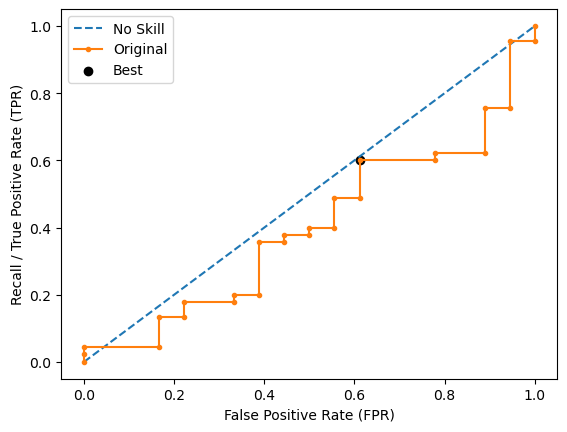

Learning rate set to 0.003788
0:	learn: 0.6917831	total: 2.09ms	remaining: 2.09s
1:	learn: 0.6903824	total: 4.16ms	remaining: 2.08s
2:	learn: 0.6889711	total: 6.15ms	remaining: 2.04s
3:	learn: 0.6877826	total: 7.84ms	remaining: 1.95s
4:	learn: 0.6864502	total: 9.89ms	remaining: 1.97s
5:	learn: 0.6853055	total: 11.8ms	remaining: 1.96s
6:	learn: 0.6840003	total: 13.8ms	remaining: 1.96s
7:	learn: 0.6822289	total: 15.7ms	remaining: 1.95s
8:	learn: 0.6805329	total: 17.3ms	remaining: 1.91s
9:	learn: 0.6790260	total: 19.1ms	remaining: 1.89s
10:	learn: 0.6774987	total: 20.9ms	remaining: 1.88s
11:	learn: 0.6757886	total: 22.8ms	remaining: 1.88s
12:	learn: 0.6749621	total: 24.6ms	remaining: 1.86s
13:	learn: 0.6735192	total: 26.1ms	remaining: 1.84s
14:	learn: 0.6714470	total: 27.9ms	remaining: 1.83s
15:	learn: 0.6704435	total: 29.7ms	remaining: 1.83s
16:	learn: 0.6686600	total: 31.5ms	remaining: 1.82s
17:	learn: 0.6672765	total: 33.4ms	remaining: 1.82s
18:	learn: 0.6664543	total: 34.7ms	remaining

234:	learn: 0.4358563	total: 391ms	remaining: 1.27s
235:	learn: 0.4349752	total: 393ms	remaining: 1.27s
236:	learn: 0.4338148	total: 395ms	remaining: 1.27s
237:	learn: 0.4332570	total: 397ms	remaining: 1.27s
238:	learn: 0.4322896	total: 398ms	remaining: 1.27s
239:	learn: 0.4313494	total: 400ms	remaining: 1.27s
240:	learn: 0.4308233	total: 403ms	remaining: 1.27s
241:	learn: 0.4302573	total: 405ms	remaining: 1.27s
242:	learn: 0.4298509	total: 407ms	remaining: 1.27s
243:	learn: 0.4291331	total: 409ms	remaining: 1.27s
244:	learn: 0.4283595	total: 411ms	remaining: 1.26s
245:	learn: 0.4273350	total: 413ms	remaining: 1.26s
246:	learn: 0.4264539	total: 414ms	remaining: 1.26s
247:	learn: 0.4254896	total: 416ms	remaining: 1.26s
248:	learn: 0.4251733	total: 418ms	remaining: 1.26s
249:	learn: 0.4243916	total: 419ms	remaining: 1.26s
250:	learn: 0.4235034	total: 421ms	remaining: 1.26s
251:	learn: 0.4226298	total: 423ms	remaining: 1.25s
252:	learn: 0.4217353	total: 425ms	remaining: 1.25s
253:	learn: 

451:	learn: 0.3101111	total: 780ms	remaining: 946ms
452:	learn: 0.3097282	total: 783ms	remaining: 945ms
453:	learn: 0.3093094	total: 784ms	remaining: 943ms
454:	learn: 0.3088189	total: 786ms	remaining: 942ms
455:	learn: 0.3085045	total: 788ms	remaining: 940ms
456:	learn: 0.3078766	total: 790ms	remaining: 938ms
457:	learn: 0.3072535	total: 791ms	remaining: 937ms
458:	learn: 0.3067712	total: 794ms	remaining: 935ms
459:	learn: 0.3063998	total: 795ms	remaining: 934ms
460:	learn: 0.3059744	total: 797ms	remaining: 932ms
461:	learn: 0.3054624	total: 799ms	remaining: 930ms
462:	learn: 0.3050909	total: 801ms	remaining: 929ms
463:	learn: 0.3050002	total: 802ms	remaining: 927ms
464:	learn: 0.3046083	total: 804ms	remaining: 925ms
465:	learn: 0.3040783	total: 806ms	remaining: 924ms
466:	learn: 0.3037322	total: 808ms	remaining: 922ms
467:	learn: 0.3032508	total: 810ms	remaining: 921ms
468:	learn: 0.3031516	total: 812ms	remaining: 919ms
469:	learn: 0.3028994	total: 814ms	remaining: 917ms
470:	learn: 

676:	learn: 0.2289710	total: 1.18s	remaining: 561ms
677:	learn: 0.2286147	total: 1.18s	remaining: 559ms
678:	learn: 0.2284788	total: 1.18s	remaining: 557ms
679:	learn: 0.2281101	total: 1.18s	remaining: 555ms
680:	learn: 0.2277048	total: 1.18s	remaining: 554ms
681:	learn: 0.2272551	total: 1.18s	remaining: 552ms
682:	learn: 0.2269296	total: 1.19s	remaining: 550ms
683:	learn: 0.2266030	total: 1.19s	remaining: 548ms
684:	learn: 0.2262823	total: 1.19s	remaining: 547ms
685:	learn: 0.2259788	total: 1.19s	remaining: 545ms
686:	learn: 0.2256091	total: 1.19s	remaining: 543ms
687:	learn: 0.2252342	total: 1.19s	remaining: 541ms
688:	learn: 0.2247936	total: 1.2s	remaining: 539ms
689:	learn: 0.2244906	total: 1.2s	remaining: 538ms
690:	learn: 0.2241871	total: 1.2s	remaining: 536ms
691:	learn: 0.2237505	total: 1.2s	remaining: 534ms
692:	learn: 0.2234855	total: 1.2s	remaining: 533ms
693:	learn: 0.2231858	total: 1.2s	remaining: 531ms
694:	learn: 0.2230533	total: 1.21s	remaining: 529ms
695:	learn: 0.2226

887:	learn: 0.1749430	total: 1.57s	remaining: 198ms
888:	learn: 0.1746421	total: 1.57s	remaining: 196ms
889:	learn: 0.1743607	total: 1.57s	remaining: 194ms
890:	learn: 0.1742688	total: 1.57s	remaining: 193ms
891:	learn: 0.1742293	total: 1.58s	remaining: 191ms
892:	learn: 0.1740351	total: 1.58s	remaining: 189ms
893:	learn: 0.1738881	total: 1.58s	remaining: 187ms
894:	learn: 0.1736846	total: 1.58s	remaining: 186ms
895:	learn: 0.1735273	total: 1.58s	remaining: 184ms
896:	learn: 0.1733447	total: 1.58s	remaining: 182ms
897:	learn: 0.1732387	total: 1.59s	remaining: 180ms
898:	learn: 0.1728866	total: 1.59s	remaining: 179ms
899:	learn: 0.1727231	total: 1.59s	remaining: 177ms
900:	learn: 0.1726161	total: 1.59s	remaining: 175ms
901:	learn: 0.1724783	total: 1.59s	remaining: 173ms
902:	learn: 0.1723729	total: 1.6s	remaining: 171ms
903:	learn: 0.1720516	total: 1.6s	remaining: 170ms
904:	learn: 0.1718321	total: 1.6s	remaining: 168ms
905:	learn: 0.1715701	total: 1.6s	remaining: 166ms
906:	learn: 0.17

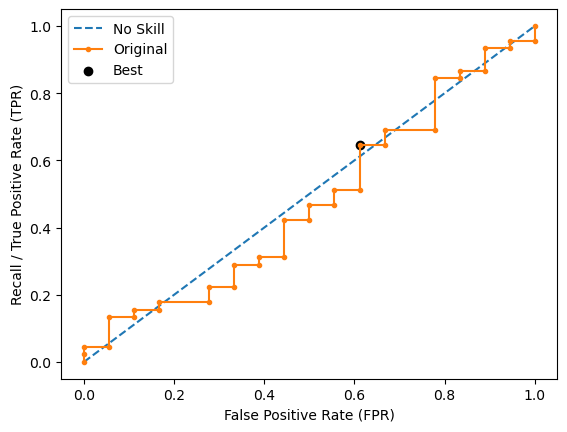

Learning rate set to 0.003967
0:	learn: 0.6917188	total: 1.99ms	remaining: 1.99s
1:	learn: 0.6901326	total: 4.71ms	remaining: 2.35s
2:	learn: 0.6889914	total: 20.7ms	remaining: 6.87s
3:	learn: 0.6876656	total: 23.7ms	remaining: 5.89s
4:	learn: 0.6859856	total: 28ms	remaining: 5.57s
5:	learn: 0.6853252	total: 32.4ms	remaining: 5.37s
6:	learn: 0.6843908	total: 35.8ms	remaining: 5.07s
7:	learn: 0.6829040	total: 38.9ms	remaining: 4.83s
8:	learn: 0.6819071	total: 42.4ms	remaining: 4.67s
9:	learn: 0.6804192	total: 45.4ms	remaining: 4.49s
10:	learn: 0.6787634	total: 48.6ms	remaining: 4.37s
11:	learn: 0.6776475	total: 51.9ms	remaining: 4.28s
12:	learn: 0.6761023	total: 54.9ms	remaining: 4.17s
13:	learn: 0.6742102	total: 56.8ms	remaining: 4s
14:	learn: 0.6723610	total: 58.9ms	remaining: 3.86s
15:	learn: 0.6708499	total: 60.8ms	remaining: 3.74s
16:	learn: 0.6694308	total: 63.4ms	remaining: 3.67s
17:	learn: 0.6668620	total: 66.2ms	remaining: 3.61s
18:	learn: 0.6656198	total: 68.8ms	remaining: 3.5

202:	learn: 0.4701203	total: 381ms	remaining: 1.49s
203:	learn: 0.4690857	total: 383ms	remaining: 1.49s
204:	learn: 0.4680941	total: 384ms	remaining: 1.49s
205:	learn: 0.4668038	total: 386ms	remaining: 1.49s
206:	learn: 0.4661788	total: 388ms	remaining: 1.49s
207:	learn: 0.4651840	total: 390ms	remaining: 1.48s
208:	learn: 0.4644825	total: 392ms	remaining: 1.48s
209:	learn: 0.4637197	total: 393ms	remaining: 1.48s
210:	learn: 0.4628737	total: 396ms	remaining: 1.48s
211:	learn: 0.4625520	total: 397ms	remaining: 1.48s
212:	learn: 0.4618243	total: 399ms	remaining: 1.48s
213:	learn: 0.4608789	total: 401ms	remaining: 1.47s
214:	learn: 0.4596785	total: 403ms	remaining: 1.47s
215:	learn: 0.4592590	total: 405ms	remaining: 1.47s
216:	learn: 0.4587686	total: 406ms	remaining: 1.47s
217:	learn: 0.4580647	total: 408ms	remaining: 1.46s
218:	learn: 0.4567528	total: 410ms	remaining: 1.46s
219:	learn: 0.4562645	total: 412ms	remaining: 1.46s
220:	learn: 0.4556043	total: 414ms	remaining: 1.46s
221:	learn: 

410:	learn: 0.3395503	total: 768ms	remaining: 1.1s
411:	learn: 0.3392112	total: 770ms	remaining: 1.1s
412:	learn: 0.3384702	total: 772ms	remaining: 1.1s
413:	learn: 0.3377744	total: 774ms	remaining: 1.09s
414:	learn: 0.3373848	total: 776ms	remaining: 1.09s
415:	learn: 0.3370459	total: 778ms	remaining: 1.09s
416:	learn: 0.3364935	total: 780ms	remaining: 1.09s
417:	learn: 0.3360192	total: 781ms	remaining: 1.09s
418:	learn: 0.3355955	total: 783ms	remaining: 1.08s
419:	learn: 0.3348539	total: 785ms	remaining: 1.08s
420:	learn: 0.3341949	total: 787ms	remaining: 1.08s
421:	learn: 0.3338101	total: 789ms	remaining: 1.08s
422:	learn: 0.3333852	total: 791ms	remaining: 1.08s
423:	learn: 0.3330320	total: 793ms	remaining: 1.08s
424:	learn: 0.3326406	total: 795ms	remaining: 1.07s
425:	learn: 0.3322691	total: 796ms	remaining: 1.07s
426:	learn: 0.3317855	total: 798ms	remaining: 1.07s
427:	learn: 0.3315863	total: 800ms	remaining: 1.07s
428:	learn: 0.3310573	total: 802ms	remaining: 1.07s
429:	learn: 0.3

620:	learn: 0.2553993	total: 1.16s	remaining: 708ms
621:	learn: 0.2550005	total: 1.16s	remaining: 707ms
622:	learn: 0.2545621	total: 1.16s	remaining: 705ms
623:	learn: 0.2542899	total: 1.17s	remaining: 703ms
624:	learn: 0.2540306	total: 1.17s	remaining: 701ms
625:	learn: 0.2537257	total: 1.17s	remaining: 699ms
626:	learn: 0.2534936	total: 1.17s	remaining: 697ms
627:	learn: 0.2532148	total: 1.17s	remaining: 696ms
628:	learn: 0.2528515	total: 1.18s	remaining: 694ms
629:	learn: 0.2525449	total: 1.18s	remaining: 692ms
630:	learn: 0.2522369	total: 1.18s	remaining: 690ms
631:	learn: 0.2518044	total: 1.18s	remaining: 688ms
632:	learn: 0.2514485	total: 1.18s	remaining: 686ms
633:	learn: 0.2510258	total: 1.19s	remaining: 684ms
634:	learn: 0.2507952	total: 1.19s	remaining: 682ms
635:	learn: 0.2505430	total: 1.19s	remaining: 681ms
636:	learn: 0.2500939	total: 1.19s	remaining: 679ms
637:	learn: 0.2497851	total: 1.19s	remaining: 677ms
638:	learn: 0.2495016	total: 1.19s	remaining: 675ms
639:	learn: 

827:	learn: 0.1977122	total: 1.56s	remaining: 324ms
828:	learn: 0.1974625	total: 1.56s	remaining: 322ms
829:	learn: 0.1972370	total: 1.56s	remaining: 321ms
830:	learn: 0.1969987	total: 1.57s	remaining: 319ms
831:	learn: 0.1966698	total: 1.57s	remaining: 317ms
832:	learn: 0.1964983	total: 1.57s	remaining: 315ms
833:	learn: 0.1962734	total: 1.57s	remaining: 313ms
834:	learn: 0.1960355	total: 1.57s	remaining: 311ms
835:	learn: 0.1958332	total: 1.57s	remaining: 309ms
836:	learn: 0.1955634	total: 1.58s	remaining: 307ms
837:	learn: 0.1952955	total: 1.58s	remaining: 305ms
838:	learn: 0.1950693	total: 1.58s	remaining: 303ms
839:	learn: 0.1948050	total: 1.58s	remaining: 301ms
840:	learn: 0.1946364	total: 1.58s	remaining: 300ms
841:	learn: 0.1944849	total: 1.58s	remaining: 298ms
842:	learn: 0.1943704	total: 1.59s	remaining: 296ms
843:	learn: 0.1941312	total: 1.59s	remaining: 294ms
844:	learn: 0.1940704	total: 1.59s	remaining: 292ms
845:	learn: 0.1938619	total: 1.59s	remaining: 290ms
846:	learn: 

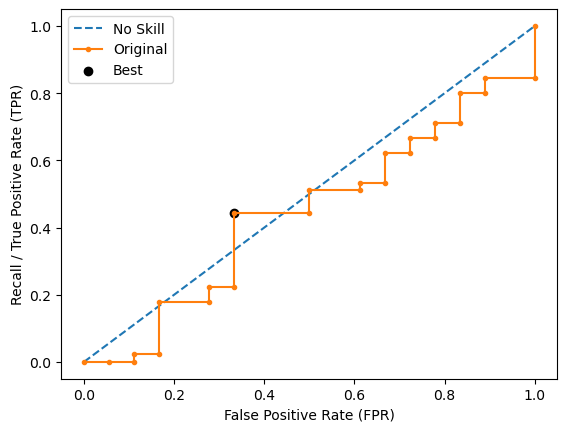

Learning rate set to 0.003821
0:	learn: 0.6925191	total: 3.58ms	remaining: 3.58s
1:	learn: 0.6912084	total: 6.7ms	remaining: 3.34s
2:	learn: 0.6896542	total: 10.6ms	remaining: 3.52s
3:	learn: 0.6889199	total: 14.1ms	remaining: 3.52s
4:	learn: 0.6874675	total: 17.1ms	remaining: 3.4s
5:	learn: 0.6867309	total: 21.7ms	remaining: 3.59s
6:	learn: 0.6854113	total: 25.2ms	remaining: 3.58s
7:	learn: 0.6837709	total: 29.4ms	remaining: 3.65s
8:	learn: 0.6824178	total: 34.8ms	remaining: 3.84s
9:	learn: 0.6807360	total: 37.5ms	remaining: 3.71s
10:	learn: 0.6792173	total: 39.8ms	remaining: 3.58s
11:	learn: 0.6787046	total: 43.9ms	remaining: 3.62s
12:	learn: 0.6775519	total: 47.9ms	remaining: 3.64s
13:	learn: 0.6768056	total: 51.6ms	remaining: 3.63s
14:	learn: 0.6762698	total: 54.7ms	remaining: 3.59s
15:	learn: 0.6749534	total: 58.3ms	remaining: 3.58s
16:	learn: 0.6740683	total: 61.9ms	remaining: 3.58s
17:	learn: 0.6722567	total: 64.8ms	remaining: 3.54s
18:	learn: 0.6711786	total: 67.5ms	remaining: 

225:	learn: 0.4753134	total: 397ms	remaining: 1.36s
226:	learn: 0.4748530	total: 399ms	remaining: 1.36s
227:	learn: 0.4739107	total: 400ms	remaining: 1.36s
228:	learn: 0.4731071	total: 402ms	remaining: 1.35s
229:	learn: 0.4725021	total: 404ms	remaining: 1.35s
230:	learn: 0.4713749	total: 406ms	remaining: 1.35s
231:	learn: 0.4704546	total: 407ms	remaining: 1.35s
232:	learn: 0.4700029	total: 409ms	remaining: 1.35s
233:	learn: 0.4689591	total: 411ms	remaining: 1.34s
234:	learn: 0.4681243	total: 413ms	remaining: 1.34s
235:	learn: 0.4670245	total: 414ms	remaining: 1.34s
236:	learn: 0.4661306	total: 416ms	remaining: 1.34s
237:	learn: 0.4656994	total: 418ms	remaining: 1.34s
238:	learn: 0.4653914	total: 419ms	remaining: 1.33s
239:	learn: 0.4650075	total: 421ms	remaining: 1.33s
240:	learn: 0.4645938	total: 423ms	remaining: 1.33s
241:	learn: 0.4637694	total: 425ms	remaining: 1.33s
242:	learn: 0.4630264	total: 427ms	remaining: 1.33s
243:	learn: 0.4625098	total: 429ms	remaining: 1.33s
244:	learn: 

432:	learn: 0.3484026	total: 787ms	remaining: 1.03s
433:	learn: 0.3477300	total: 789ms	remaining: 1.03s
434:	learn: 0.3470106	total: 791ms	remaining: 1.03s
435:	learn: 0.3466021	total: 793ms	remaining: 1.03s
436:	learn: 0.3461006	total: 795ms	remaining: 1.02s
437:	learn: 0.3453302	total: 797ms	remaining: 1.02s
438:	learn: 0.3447128	total: 799ms	remaining: 1.02s
439:	learn: 0.3442936	total: 800ms	remaining: 1.02s
440:	learn: 0.3438634	total: 802ms	remaining: 1.02s
441:	learn: 0.3437128	total: 804ms	remaining: 1.01s
442:	learn: 0.3432801	total: 806ms	remaining: 1.01s
443:	learn: 0.3427600	total: 809ms	remaining: 1.01s
444:	learn: 0.3422107	total: 811ms	remaining: 1.01s
445:	learn: 0.3419838	total: 812ms	remaining: 1.01s
446:	learn: 0.3414192	total: 815ms	remaining: 1.01s
447:	learn: 0.3409353	total: 816ms	remaining: 1s
448:	learn: 0.3406750	total: 818ms	remaining: 1s
449:	learn: 0.3402106	total: 820ms	remaining: 1s
450:	learn: 0.3397013	total: 822ms	remaining: 1s
451:	learn: 0.3389720	to

639:	learn: 0.2658918	total: 1.19s	remaining: 668ms
640:	learn: 0.2656010	total: 1.19s	remaining: 667ms
641:	learn: 0.2654847	total: 1.19s	remaining: 665ms
642:	learn: 0.2650197	total: 1.19s	remaining: 663ms
643:	learn: 0.2646903	total: 1.2s	remaining: 661ms
644:	learn: 0.2645307	total: 1.2s	remaining: 659ms
645:	learn: 0.2642338	total: 1.2s	remaining: 657ms
646:	learn: 0.2638640	total: 1.2s	remaining: 656ms
647:	learn: 0.2636091	total: 1.2s	remaining: 654ms
648:	learn: 0.2631013	total: 1.21s	remaining: 652ms
649:	learn: 0.2628328	total: 1.21s	remaining: 650ms
650:	learn: 0.2625379	total: 1.21s	remaining: 648ms
651:	learn: 0.2622549	total: 1.21s	remaining: 646ms
652:	learn: 0.2619460	total: 1.21s	remaining: 645ms
653:	learn: 0.2617069	total: 1.21s	remaining: 643ms
654:	learn: 0.2613773	total: 1.22s	remaining: 641ms
655:	learn: 0.2608814	total: 1.22s	remaining: 639ms
656:	learn: 0.2605047	total: 1.22s	remaining: 637ms
657:	learn: 0.2601876	total: 1.22s	remaining: 635ms
658:	learn: 0.259

850:	learn: 0.2068521	total: 1.58s	remaining: 276ms
851:	learn: 0.2066296	total: 1.58s	remaining: 275ms
852:	learn: 0.2064617	total: 1.58s	remaining: 273ms
853:	learn: 0.2062294	total: 1.58s	remaining: 271ms
854:	learn: 0.2059169	total: 1.59s	remaining: 269ms
855:	learn: 0.2057555	total: 1.59s	remaining: 267ms
856:	learn: 0.2054016	total: 1.59s	remaining: 265ms
857:	learn: 0.2052898	total: 1.59s	remaining: 263ms
858:	learn: 0.2050830	total: 1.59s	remaining: 261ms
859:	learn: 0.2048430	total: 1.59s	remaining: 260ms
860:	learn: 0.2046688	total: 1.6s	remaining: 258ms
861:	learn: 0.2042870	total: 1.6s	remaining: 256ms
862:	learn: 0.2039097	total: 1.6s	remaining: 254ms
863:	learn: 0.2036778	total: 1.6s	remaining: 252ms
864:	learn: 0.2033634	total: 1.6s	remaining: 250ms
865:	learn: 0.2030970	total: 1.6s	remaining: 248ms
866:	learn: 0.2029821	total: 1.6s	remaining: 246ms
867:	learn: 0.2028678	total: 1.61s	remaining: 244ms
868:	learn: 0.2026189	total: 1.61s	remaining: 243ms
869:	learn: 0.20228

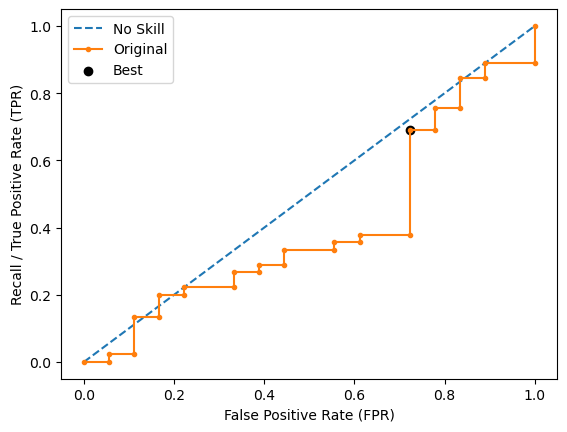

Learning rate set to 0.003821
0:	learn: 0.6919611	total: 2.27ms	remaining: 2.27s
1:	learn: 0.6904290	total: 4.91ms	remaining: 2.45s
2:	learn: 0.6890005	total: 8.66ms	remaining: 2.88s
3:	learn: 0.6871981	total: 12.5ms	remaining: 3.11s
4:	learn: 0.6862592	total: 15.7ms	remaining: 3.13s
5:	learn: 0.6855441	total: 19.5ms	remaining: 3.23s
6:	learn: 0.6840939	total: 22.7ms	remaining: 3.22s
7:	learn: 0.6835744	total: 25.6ms	remaining: 3.17s
8:	learn: 0.6823046	total: 29.2ms	remaining: 3.22s
9:	learn: 0.6805228	total: 32.7ms	remaining: 3.24s
10:	learn: 0.6796740	total: 36.2ms	remaining: 3.26s
11:	learn: 0.6786413	total: 38.5ms	remaining: 3.17s
12:	learn: 0.6776816	total: 41.4ms	remaining: 3.14s
13:	learn: 0.6760993	total: 43.9ms	remaining: 3.09s
14:	learn: 0.6753723	total: 46.5ms	remaining: 3.05s
15:	learn: 0.6749483	total: 48.6ms	remaining: 2.99s
16:	learn: 0.6737972	total: 51.3ms	remaining: 2.97s
17:	learn: 0.6734507	total: 52.4ms	remaining: 2.86s
18:	learn: 0.6727381	total: 54.6ms	remaining

238:	learn: 0.4553848	total: 393ms	remaining: 1.25s
239:	learn: 0.4545801	total: 395ms	remaining: 1.25s
240:	learn: 0.4538024	total: 397ms	remaining: 1.25s
241:	learn: 0.4533175	total: 398ms	remaining: 1.25s
242:	learn: 0.4524685	total: 400ms	remaining: 1.25s
243:	learn: 0.4516489	total: 401ms	remaining: 1.24s
244:	learn: 0.4512317	total: 403ms	remaining: 1.24s
245:	learn: 0.4508219	total: 405ms	remaining: 1.24s
246:	learn: 0.4500954	total: 406ms	remaining: 1.24s
247:	learn: 0.4494298	total: 408ms	remaining: 1.24s
248:	learn: 0.4486965	total: 409ms	remaining: 1.23s
249:	learn: 0.4480147	total: 411ms	remaining: 1.23s
250:	learn: 0.4472481	total: 412ms	remaining: 1.23s
251:	learn: 0.4461410	total: 414ms	remaining: 1.23s
252:	learn: 0.4457076	total: 416ms	remaining: 1.23s
253:	learn: 0.4448164	total: 417ms	remaining: 1.23s
254:	learn: 0.4436417	total: 419ms	remaining: 1.22s
255:	learn: 0.4428286	total: 421ms	remaining: 1.22s
256:	learn: 0.4420150	total: 422ms	remaining: 1.22s
257:	learn: 

474:	learn: 0.3215239	total: 787ms	remaining: 869ms
475:	learn: 0.3210759	total: 789ms	remaining: 868ms
476:	learn: 0.3202524	total: 791ms	remaining: 867ms
477:	learn: 0.3198578	total: 792ms	remaining: 865ms
478:	learn: 0.3197096	total: 794ms	remaining: 864ms
479:	learn: 0.3196254	total: 795ms	remaining: 861ms
480:	learn: 0.3190732	total: 797ms	remaining: 860ms
481:	learn: 0.3188063	total: 798ms	remaining: 858ms
482:	learn: 0.3181643	total: 800ms	remaining: 856ms
483:	learn: 0.3178636	total: 802ms	remaining: 855ms
484:	learn: 0.3178474	total: 802ms	remaining: 852ms
485:	learn: 0.3174412	total: 804ms	remaining: 850ms
486:	learn: 0.3172097	total: 806ms	remaining: 849ms
487:	learn: 0.3168625	total: 807ms	remaining: 847ms
488:	learn: 0.3166119	total: 809ms	remaining: 846ms
489:	learn: 0.3163274	total: 811ms	remaining: 844ms
490:	learn: 0.3158630	total: 813ms	remaining: 843ms
491:	learn: 0.3155566	total: 815ms	remaining: 841ms
492:	learn: 0.3152722	total: 816ms	remaining: 839ms
493:	learn: 

709:	learn: 0.2366320	total: 1.18s	remaining: 482ms
710:	learn: 0.2363171	total: 1.18s	remaining: 481ms
711:	learn: 0.2360787	total: 1.19s	remaining: 479ms
712:	learn: 0.2357268	total: 1.19s	remaining: 478ms
713:	learn: 0.2355807	total: 1.19s	remaining: 476ms
714:	learn: 0.2353701	total: 1.19s	remaining: 475ms
715:	learn: 0.2350626	total: 1.19s	remaining: 473ms
716:	learn: 0.2347126	total: 1.19s	remaining: 471ms
717:	learn: 0.2343843	total: 1.2s	remaining: 470ms
718:	learn: 0.2341118	total: 1.2s	remaining: 468ms
719:	learn: 0.2338118	total: 1.2s	remaining: 467ms
720:	learn: 0.2335661	total: 1.2s	remaining: 465ms
721:	learn: 0.2333157	total: 1.2s	remaining: 463ms
722:	learn: 0.2331693	total: 1.21s	remaining: 462ms
723:	learn: 0.2327641	total: 1.21s	remaining: 460ms
724:	learn: 0.2325942	total: 1.21s	remaining: 459ms
725:	learn: 0.2322936	total: 1.21s	remaining: 457ms
726:	learn: 0.2319637	total: 1.21s	remaining: 456ms
727:	learn: 0.2317620	total: 1.22s	remaining: 454ms
728:	learn: 0.231

932:	learn: 0.1797465	total: 1.57s	remaining: 113ms
933:	learn: 0.1794909	total: 1.57s	remaining: 111ms
934:	learn: 0.1793515	total: 1.58s	remaining: 110ms
935:	learn: 0.1791937	total: 1.58s	remaining: 108ms
936:	learn: 0.1788762	total: 1.58s	remaining: 106ms
937:	learn: 0.1785849	total: 1.58s	remaining: 105ms
938:	learn: 0.1782625	total: 1.58s	remaining: 103ms
939:	learn: 0.1780473	total: 1.58s	remaining: 101ms
940:	learn: 0.1778411	total: 1.59s	remaining: 99.5ms
941:	learn: 0.1777069	total: 1.59s	remaining: 97.8ms
942:	learn: 0.1775127	total: 1.59s	remaining: 96.2ms
943:	learn: 0.1773114	total: 1.59s	remaining: 94.5ms
944:	learn: 0.1771746	total: 1.59s	remaining: 92.8ms
945:	learn: 0.1769644	total: 1.59s	remaining: 91.1ms
946:	learn: 0.1767571	total: 1.6s	remaining: 89.4ms
947:	learn: 0.1764346	total: 1.6s	remaining: 87.7ms
948:	learn: 0.1762909	total: 1.6s	remaining: 86ms
949:	learn: 0.1760361	total: 1.6s	remaining: 84.4ms
950:	learn: 0.1758213	total: 1.6s	remaining: 82.7ms
951:	lea

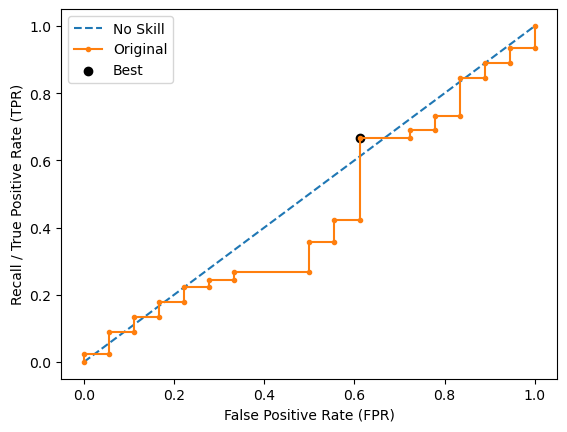

Ave Test Accuracy: 0.5047619047619047
Stdev Test Accuracy: 0.0796819072889596
Ave Test Recall: 0.711111111111111
Stdev Test Recall: 0.106863244787063
Ave Test F-0.5 Score: 0.37197615218762226
Stdev Test F-0.5 Score: 0.05498669793584475
Ave Test F-0.75 Score: 0.41060649683217953
Stdev Test F-0.75 Score: 0.05783722566900786
Ave Test F-1 Score: 0.45184119106699755
Stdev Test F-1 Score: 0.061198347722115985
Ave Test F-1.5 Score: 0.5246927106681792
Stdev Test F-1.5 Score: 0.06893282856467246
Ave Test F-2 Score: 0.5772309351778926
Stdev Test F-2 Score: 0.0766681775711059
Ave Test G-mean: 0.5429726575644374
Stdev Test G-mean: 0.07449792276190938
Ave Test Specificity: 0.4222222222222222
Stdev Test Specificity: 0.1077262190536962
Ave Test Precision: 0.3329688693659282
Ave Test NPV: 0.7841277275502438
Ave Runtime: 1.9254809379577638


In [110]:
ld_t02_catboost_gs, ld_t02_catboost_be, ld_t02_catboost_model_info, ld_t02_catboost_metrics_df = catboost_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'euclidean', 'classifier__n_neighbors': 5, 'resampling': ADASYN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4792140624365688
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier', KNeighborsClassifier(metric='euclidean'))])
Mean Train Score (Recall) 0.5561421991861801
Std Train Score (Recall) 0.030361337930001807
GridSearchCV Runtime: 32.810950756073 secs
Run 1 - Random State: 0
Test Accuracy: 0.3968253968253968
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.28089887640449435
Test F-0.75 Score: 0.3117206982543641
Test F-1 Score: 0.3448275862068966
Test F-1.5 Score: 0.40372670807453415
Test F-2 Score: 0.4464285714285714
Test G-Mean Score: 0.43033148291193524
Best Threshold=0.600
Best Recall=0.667
Best G-Mean=0.544


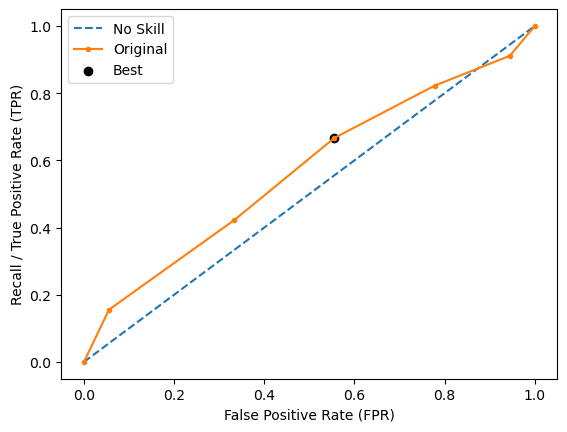

Run 2 - Random State: 1
Test Accuracy: 0.4444444444444444
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.30120481927710846
Test F-0.75 Score: 0.3315649867374006
Test F-1 Score: 0.36363636363636365
Test F-1.5 Score: 0.41935483870967744
Test F-2 Score: 0.45871559633027525
Test G-Mean Score: 0.47140452079103173
Best Threshold=0.600
Best Recall=0.600
Best G-Mean=0.516


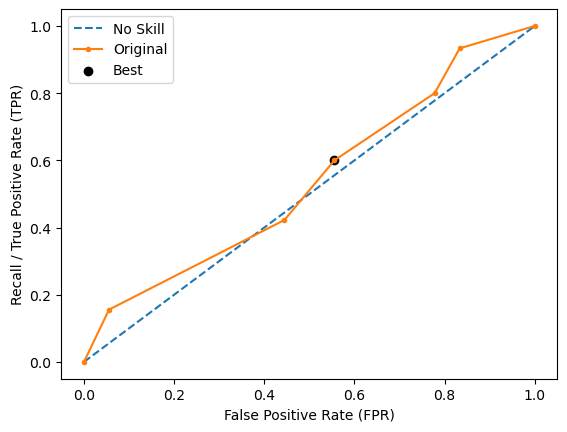

Run 3 - Random State: 2
Test Accuracy: 0.38095238095238093
Test Recall: 0.8333333333333334
Test F-0.5 Score: 0.3378378378378379
Test F-0.75 Score: 0.3834355828220859
Test F-1 Score: 0.4347826086956522
Test F-1.5 Score: 0.5327868852459017
Test F-2 Score: 0.6097560975609757
Test G-Mean Score: 0.408248290463863
Best Threshold=1.000
Best Recall=0.222
Best G-Mean=0.369


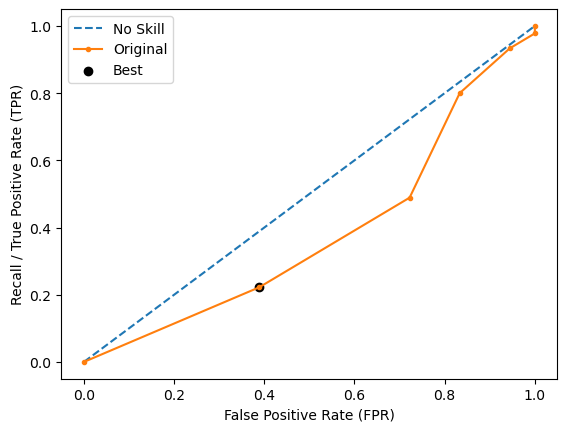

Run 4 - Random State: 3
Test Accuracy: 0.42857142857142855
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.29411764705882354
Test F-0.75 Score: 0.3246753246753247
Test F-1 Score: 0.35714285714285715
Test F-1.5 Score: 0.4140127388535032
Test F-2 Score: 0.4545454545454546
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.400
Best Recall=0.733
Best G-Mean=0.571


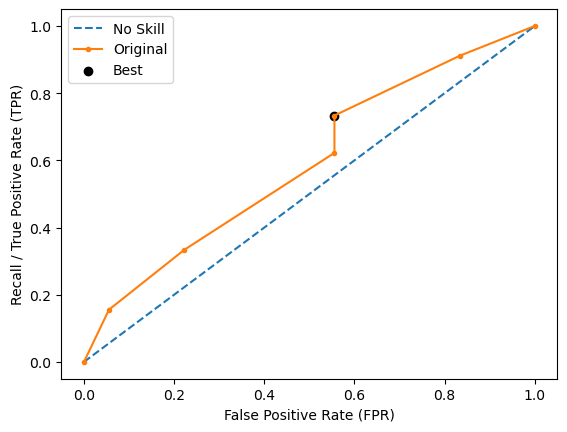

Run 5 - Random State: 4
Test Accuracy: 0.42857142857142855
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3225806451612903
Test F-0.75 Score: 0.35971223021582727
Test F-1 Score: 0.4
Test F-1.5 Score: 0.4727272727272727
Test F-2 Score: 0.5263157894736842
Test G-Mean Score: 0.4714045207910317
Best Threshold=0.800
Best Recall=0.444
Best G-Mean=0.521


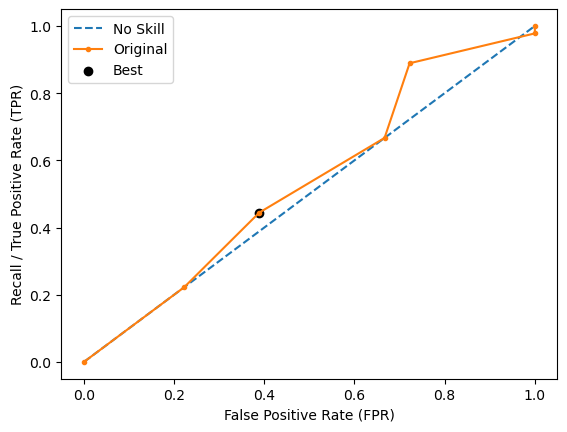

Ave Test Accuracy: 0.41587301587301584
Stdev Test Accuracy: 0.02608202654786505
Ave Test Recall: 0.6333333333333333
Stdev Test Recall: 0.12171612389003691
Ave Test F-0.5 Score: 0.30732796514791094
Stdev Test F-0.5 Score: 0.02277058810353543
Ave Test F-0.75 Score: 0.3422217645410005
Stdev Test F-0.75 Score: 0.028966595919116416
Ave Test F-1 Score: 0.38007788313635393
Stdev Test F-1 Score: 0.03683890658411552
Ave Test F-1.5 Score: 0.4485216887221778
Stdev Test F-1.5 Score: 0.054163402529112475
Ave Test F-2 Score: 0.49915230186779225
Stdev Test F-2 Score: 0.06959839153107047
Ave Test G-mean: 0.4479023324497426
Stdev Test G-mean: 0.027795424248310812
Ave Test Specificity: 0.3288888888888889
Stdev Test Specificity: 0.07761888531810214
Ave Test Precision: 0.27265201955604434
Ave Test NPV: 0.697753463927377
Ave Runtime: 0.038170814514160156


In [111]:
ld_t02_knn_gs, ld_t02_knn_be, ld_t02_knn_model_info, ld_t02_knn_metrics_df = knn_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.4493054279741586
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise'

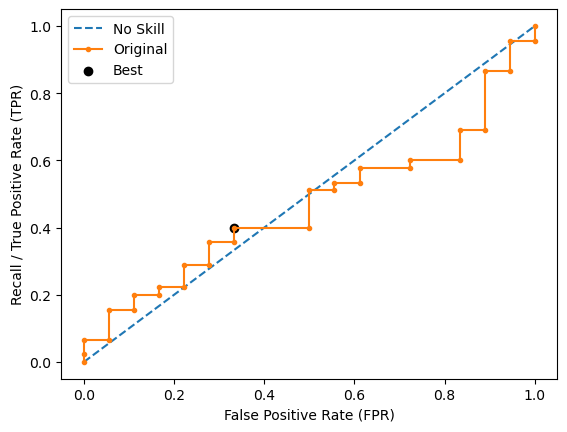

Run 2 - Random State: 1
Test Accuracy: 0.42857142857142855
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.30898876404494385
Test F-0.75 Score: 0.34289276807980057
Test F-1 Score: 0.3793103448275862
Test F-1.5 Score: 0.4440993788819877
Test F-2 Score: 0.4910714285714286
Test G-Mean Score: 0.4661372658534007
Best Threshold=0.310
Best Recall=0.822
Best G-Mean=0.565


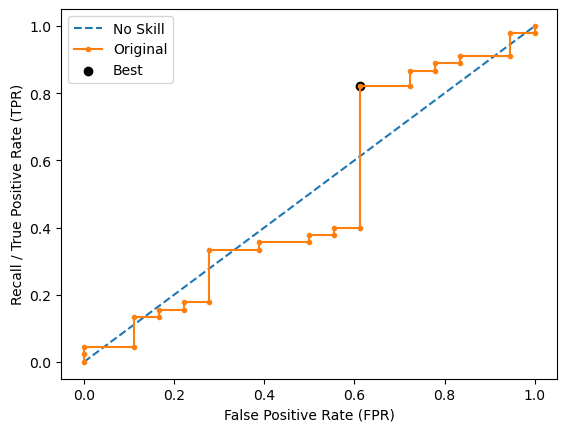

Run 3 - Random State: 2
Test Accuracy: 0.49206349206349204
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.32467532467532473
Test F-0.75 Score: 0.3541076487252125
Test F-1 Score: 0.3846153846153846
Test F-1.5 Score: 0.436241610738255
Test F-2 Score: 0.47169811320754723
Test G-Mean Score: 0.5091750772173156
Best Threshold=0.761
Best Recall=0.422
Best G-Mean=0.552


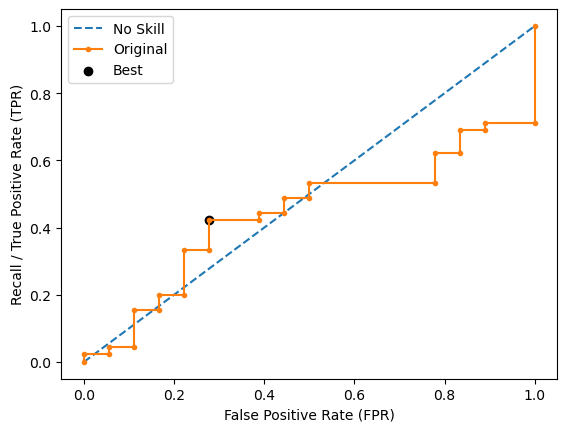

Run 4 - Random State: 3
Test Accuracy: 0.5873015873015873
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.4109589041095891
Test F-0.75 Score: 0.44510385756676557
Test F-1 Score: 0.4800000000000001
Test F-1.5 Score: 0.5379310344827587
Test F-2 Score: 0.576923076923077
Test G-Mean Score: 0.6085806194501846
Best Threshold=0.158
Best Recall=0.733
Best G-Mean=0.451


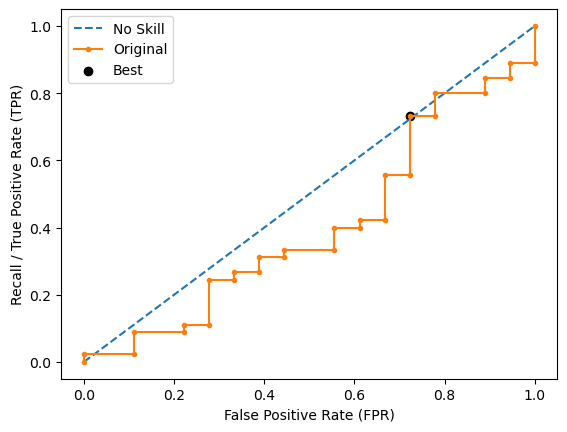

Run 5 - Random State: 4
Test Accuracy: 0.4444444444444444
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3296703296703297
Test F-0.75 Score: 0.3667481662591686
Test F-1 Score: 0.4067796610169492
Test F-1.5 Score: 0.4785276073619631
Test F-2 Score: 0.5309734513274336
Test G-Mean Score: 0.48686449556014766
Best Threshold=0.432
Best Recall=0.733
Best G-Mean=0.494


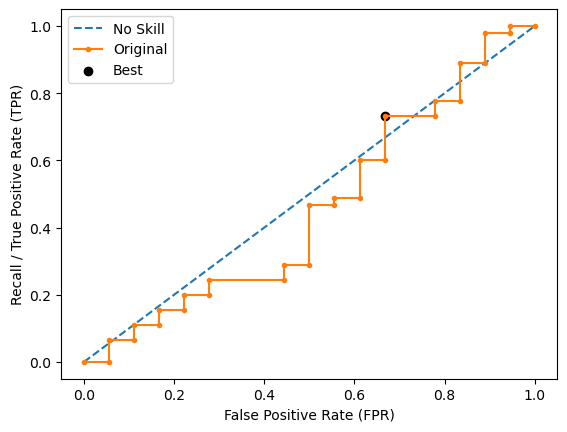

Ave Test Accuracy: 0.4920634920634921
Stdev Test Accuracy: 0.062492125984220735
Ave Test Recall: 0.6555555555555556
Stdev Test Recall: 0.08240220541217402
Ave Test F-0.5 Score: 0.35178174142311447
Stdev Test F-0.5 Score: 0.043688945914251175
Ave Test F-0.75 Score: 0.3873450602533288
Stdev Test F-0.75 Score: 0.046053081106763344
Ave Test F-1 Score: 0.4250563323292722
Stdev Test F-1 Score: 0.04881913892186545
Ave Test F-1.5 Score: 0.4910163680107843
Stdev Test F-1.5 Score: 0.05496163726769886
Ave Test F-2 Score: 0.5380270193156318
Stdev Test F-2 Score: 0.06082723063839231
Ave Test G-mean: 0.5257061618207531
Stdev Test G-mean: 0.05750409879635214
Ave Test Specificity: 0.42666666666666664
Stdev Test Specificity: 0.08520128672302585
Ave Test Precision: 0.31565279770444765
Ave Test NPV: 0.7543392526610596
Ave Runtime: 0.1501439094543457


In [112]:
ld_t02_xgb_gs, ld_t02_xgb_be, ld_t02_xgb_model_info, ld_t02_xgb_metrics_df = xgb_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.44037947346770867
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.8768214792073614
Std Train Score (Recall) 0.010956732158875482
GridSearchCV Runtime: 60.01031804084778 secs
Run 1 - Random State: 0
Test Accuracy: 0.42857142857142855
Test Recall: 0.5
Test F-0.5 Score: 0.2777777777777778
Test F-0

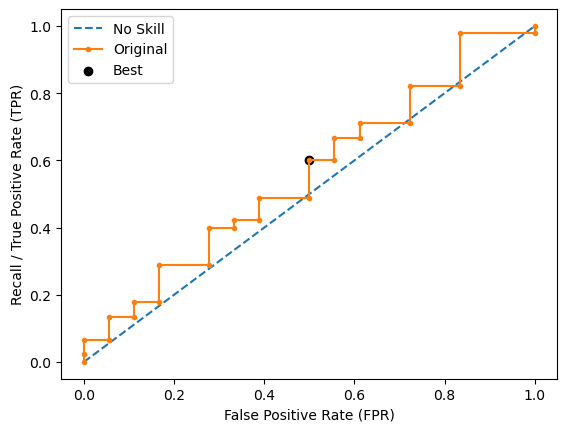

Run 2 - Random State: 1
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.832
Best Recall=0.311
Best G-Mean=0.526


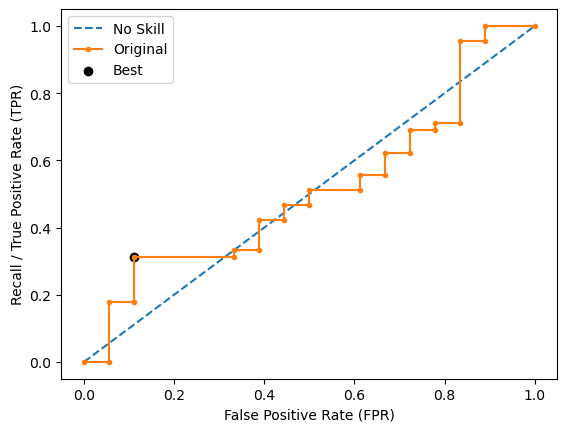

Run 3 - Random State: 2
Test Accuracy: 0.42857142857142855
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.29411764705882354
Test F-0.75 Score: 0.3246753246753247
Test F-1 Score: 0.35714285714285715
Test F-1.5 Score: 0.4140127388535032
Test F-2 Score: 0.4545454545454546
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.828
Best Recall=0.400
Best G-Mean=0.577


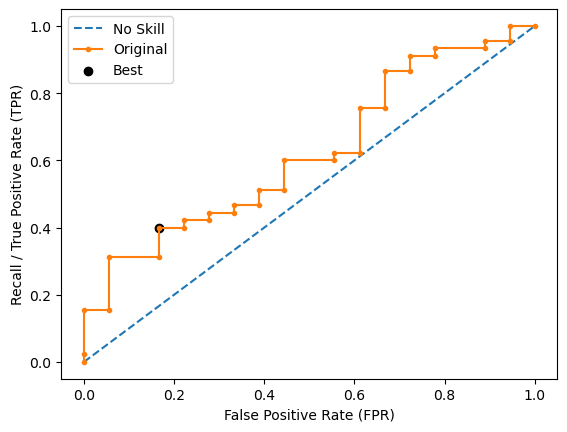

Run 4 - Random State: 3
Test Accuracy: 0.6190476190476191
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.3773584905660377
Test F-0.75 Score: 0.38910505836575876
Test F-1 Score: 0.39999999999999997
Test F-1.5 Score: 0.4160000000000001
Test F-2 Score: 0.425531914893617
Test G-Mean Score: 0.5533288710217215
Best Threshold=0.427
Best Recall=0.422
Best G-Mean=0.484


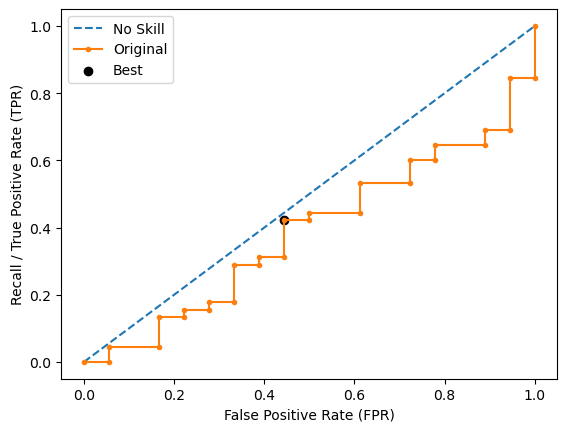

Run 5 - Random State: 4
Test Accuracy: 0.4444444444444444
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3296703296703297
Test F-0.75 Score: 0.3667481662591686
Test F-1 Score: 0.4067796610169492
Test F-1.5 Score: 0.4785276073619631
Test F-2 Score: 0.5309734513274336
Test G-Mean Score: 0.48686449556014766
Best Threshold=0.698
Best Recall=0.467
Best G-Mean=0.558


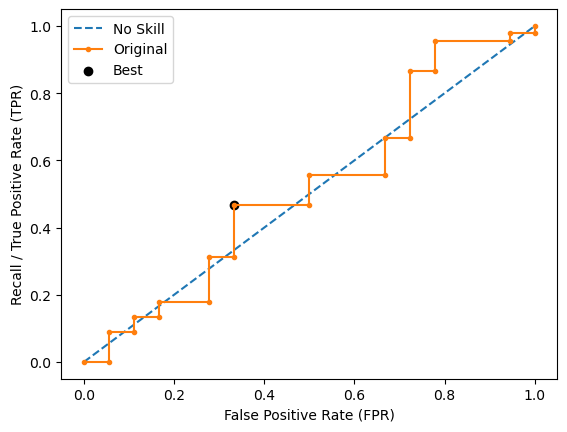

Ave Test Accuracy: 0.48571428571428577
Stdev Test Accuracy: 0.08140242161878151
Ave Test Recall: 0.5333333333333333
Stdev Test Recall: 0.08425417160057277
Ave Test F-0.5 Score: 0.3191651307047346
Stdev Test F-0.5 Score: 0.03821727421922552
Ave Test F-0.75 Score: 0.34547037736690783
Stdev Test F-0.75 Score: 0.033351638986183936
Ave Test F-1 Score: 0.3729205580537299
Stdev Test F-1 Score: 0.030524107147261368
Ave Test F-1.5 Score: 0.4199968392965692
Stdev Test F-1.5 Score: 0.03540352161906825
Ave Test F-2 Score: 0.45292213826333344
Stdev Test F-2 Score: 0.045870069002223006
Ave Test G-mean: 0.490210967795223
Stdev Test G-mean: 0.04215450917457186
Ave Test Specificity: 0.4666666666666666
Stdev Test Specificity: 0.13788526273323173
Ave Test Precision: 0.29195995316952705
Ave Test NPV: 0.7097573909830007
Ave Runtime: 0.10889163017272949


In [113]:
ld_t02_gbm_gs, ld_t02_gbm_be, ld_t02_gbm_model_info, ld_t02_gbm_metrics_df = gbm_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.4913844978550862
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=3, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Recall) 0.6937121420924035
Std Train Score (Recall) 0.033255757849613994
GridSearchCV Runtime: 450.3396518230438 secs
Run 1 - Random State: 0
Test Accuracy: 0.47619047619047616
Tes

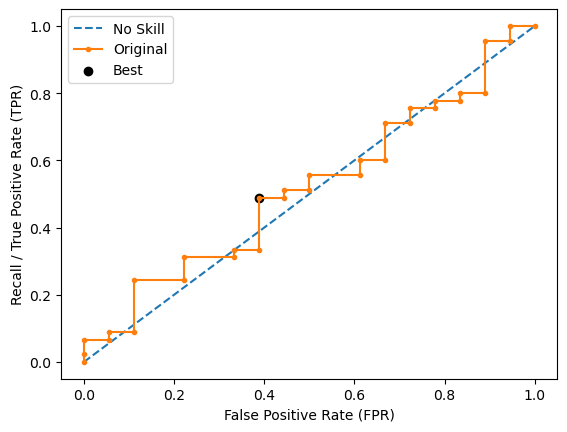

Run 2 - Random State: 1
Test Accuracy: 0.5238095238095238
Test Recall: 0.5
Test F-0.5 Score: 0.32608695652173914
Test F-0.75 Score: 0.3504672897196262
Test F-1 Score: 0.37499999999999994
Test F-1.5 Score: 0.41489361702127664
Test F-2 Score: 0.4411764705882353
Test G-Mean Score: 0.5163977794943222
Best Threshold=0.450
Best Recall=0.644
Best G-Mean=0.535


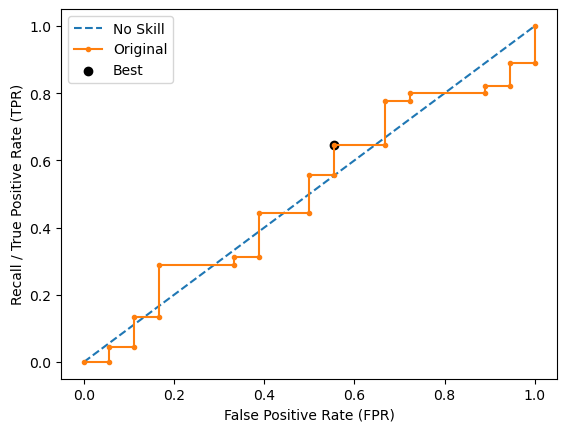

Run 3 - Random State: 2
Test Accuracy: 0.4444444444444444
Test Recall: 0.5
Test F-0.5 Score: 0.28481012658227844
Test F-0.75 Score: 0.31163434903047094
Test F-1 Score: 0.33962264150943394
Test F-1.5 Score: 0.38741721854304634
Test F-2 Score: 0.4205607476635514
Test G-Mean Score: 0.45946829173634074
Best Threshold=0.485
Best Recall=0.644
Best G-Mean=0.568


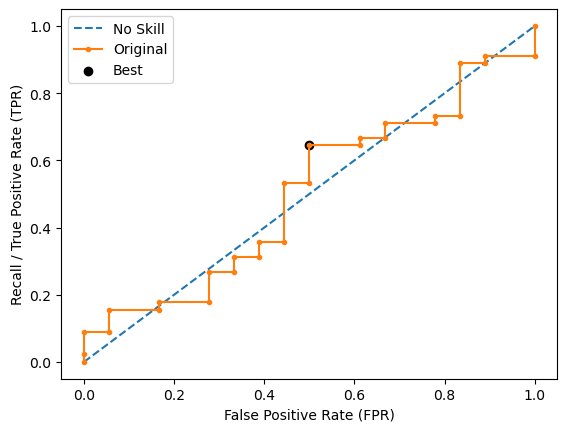

Run 4 - Random State: 3
Test Accuracy: 0.6031746031746031
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.3636363636363637
Test F-0.75 Score: 0.3773584905660377
Test F-1 Score: 0.3902439024390244
Test F-1.5 Score: 0.40944881889763773
Test F-2 Score: 0.4210526315789474
Test G-Mean Score: 0.5443310539518174
Best Threshold=0.513
Best Recall=0.333
Best G-Mean=0.471


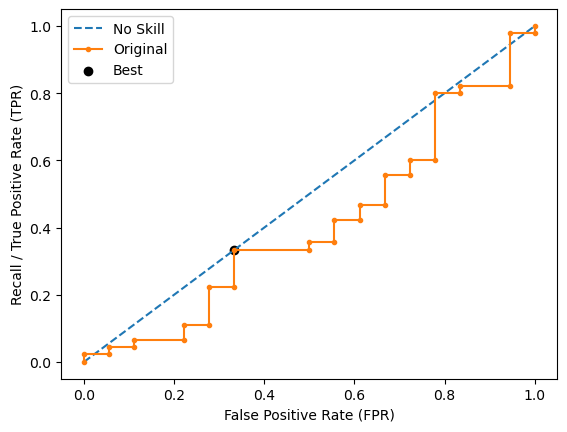

Run 5 - Random State: 4
Test Accuracy: 0.3968253968253968
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.2956989247311828
Test F-0.75 Score: 0.3297362110311751
Test F-1 Score: 0.36666666666666675
Test F-1.5 Score: 0.43333333333333335
Test F-2 Score: 0.4824561403508772
Test G-Mean Score: 0.4360314860077463
Best Threshold=0.537
Best Recall=0.489
Best G-Mean=0.594


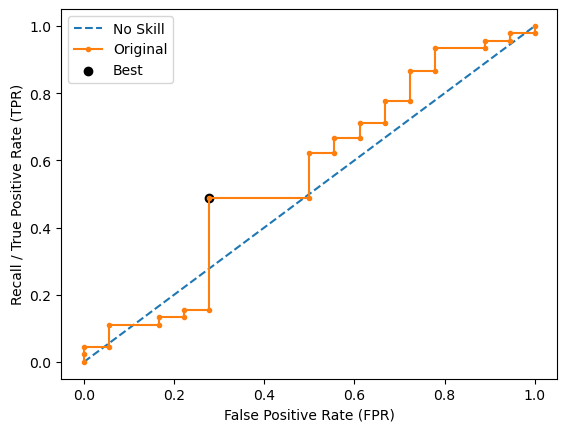

Ave Test Accuracy: 0.4888888888888888
Stdev Test Accuracy: 0.07888745168120113
Ave Test Recall: 0.5333333333333333
Stdev Test Recall: 0.07453559924999302
Ave Test F-0.5 Score: 0.32031153453527667
Stdev Test F-0.5 Score: 0.03121630143060282
Ave Test F-0.75 Score: 0.34678356515169007
Stdev Test F-0.75 Score: 0.02643976432604001
Ave Test F-1 Score: 0.37430664212302495
Stdev Test F-1 Score: 0.02332367238481724
Ave Test F-1.5 Score: 0.4212766620751879
Stdev Test F-1.5 Score: 0.027719845794900496
Ave Test F-2 Score: 0.45396662922898284
Stdev Test F-2 Score: 0.03787136878088184
Ave Test G-mean: 0.4928379840217117
Stdev Test G-mean: 0.04409033269691247
Ave Test Specificity: 0.47111111111111104
Stdev Test Specificity: 0.13462338871876406
Ave Test Precision: 0.29283420066028765
Ave Test NPV: 0.7106560106560106
Ave Runtime: 0.1972499370574951


In [114]:
ld_t02_rf_gs, ld_t02_rf_be, ld_t02_rf_model_info, ld_t02_rf_metrics_df = rf_class2(ld_t02, "f1",
                                                            'ageing_class', random_state=0)

In [115]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t02_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t02_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t02_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
9,CatBoost,0.542973,0.074498,0.447393,0.877254,0.711111,0.106863,0.504762,0.079682,0.371976,0.410606,0.451841,0.524693,0.577231
7,Extreme Gradient Boosting (XGBoost),0.525706,0.057504,0.449305,0.846958,0.655556,0.082402,0.492063,0.062492,0.351782,0.387345,0.425056,0.491016,0.538027
6,LightGBM,0.507562,0.062464,0.472173,0.743998,0.577778,0.150103,0.498413,0.080625,0.335809,0.364817,0.395270,0.447971,0.485223
3,Decision Tree,0.506418,0.091859,0.531154,0.502934,0.522222,0.178298,0.526984,0.114131,0.338109,0.360391,0.383748,0.424057,0.452427
4,Random Forest,0.492838,0.044090,0.491384,0.693712,0.533333,0.074536,0.488889,0.078887,0.320312,0.346784,0.374307,0.421277,0.453967
5,Gradient Boosting Machine (GBM),0.490211,0.042155,0.440379,0.876821,0.533333,0.084254,0.485714,0.081402,0.319165,0.345470,0.372921,0.419997,0.452922
8,AdaBoost,0.467258,0.042175,0.439261,0.877765,0.511111,0.082402,0.453968,0.038227,0.292098,0.319320,0.347724,0.396267,0.429984
0,k-Nearest Neighbors,0.447902,0.027795,0.479214,0.556142,0.633333,0.121716,0.415873,0.026082,0.307328,0.342222,0.380078,0.448522,0.499152
1,SVM Classifier,0.276318,0.048988,0.467396,0.503737,0.811111,0.133795,0.304762,0.013280,0.305139,0.348514,0.398051,0.494743,0.572776
2,Logistic Regression,0.194809,0.208092,0.461640,0.616774,0.533333,0.454063,0.466667,0.201594,0.243135,0.264460,0.290404,0.343810,0.388675


## Optimizing for Accuracy

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': TomekLinks(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.7172514619883041
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=2, random_state=0))])
Mean Train Score (Recall) 0.6696017259815022
Std Train Score (Recall) 0.0586839818087628
GridSearchCV Runtime: 54.6454873085022 secs
Run 1 - Random State: 0
Test Accuracy: 0.6031746031746031
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.29069767441860467
Test F-0.75 Score: 0.28801843317972353
Test F-1 Score: 0.28571428571428575
Test F-1.5 Score: 0.28

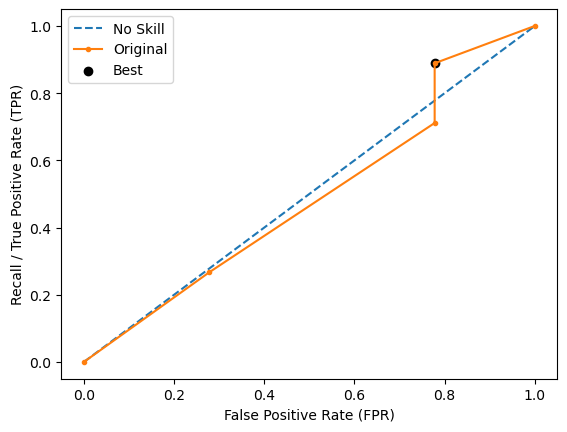

Run 2 - Random State: 1
Test Accuracy: 0.7142857142857143
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.35714285714285715
Test F-0.75 Score: 0.2906976744186046
Test F-1 Score: 0.25
Test F-1.5 Score: 0.2096774193548387
Test F-2 Score: 0.1923076923076923
Test G-Mean Score: 0.39440531887330776
Best Threshold=0.308
Best Recall=0.578
Best G-Mean=0.401


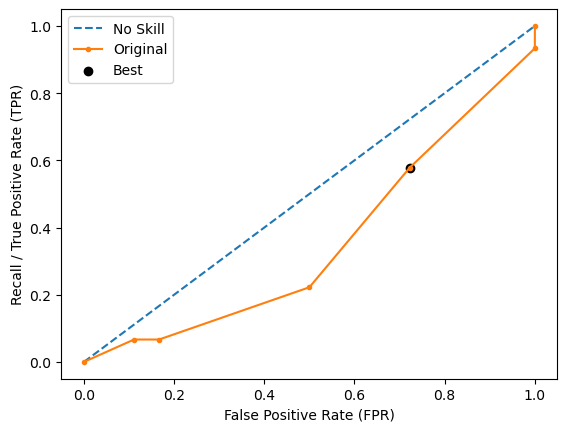

Run 3 - Random State: 2
Test Accuracy: 0.6666666666666666
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.13157894736842105
Test F-0.75 Score: 0.10330578512396695
Test F-1 Score: 0.08695652173913045
Test F-1.5 Score: 0.07142857142857142
Test F-2 Score: 0.06493506493506493
Test G-Mean Score: 0.22498285257018424
Best Threshold=0.331
Best Recall=0.689
Best G-Mean=0.479


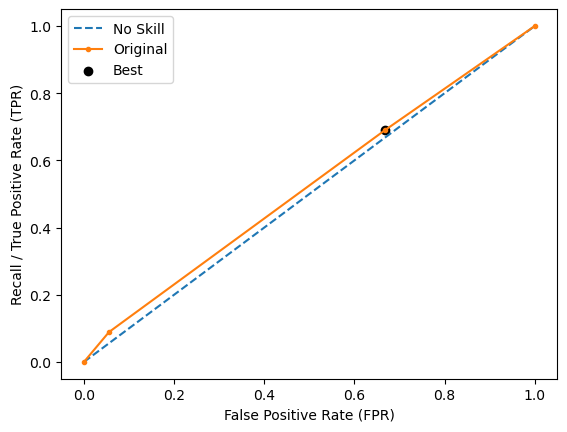

Run 4 - Random State: 3
Test Accuracy: 0.6984126984126984
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.156
Best Recall=0.667
Best G-Mean=0.471


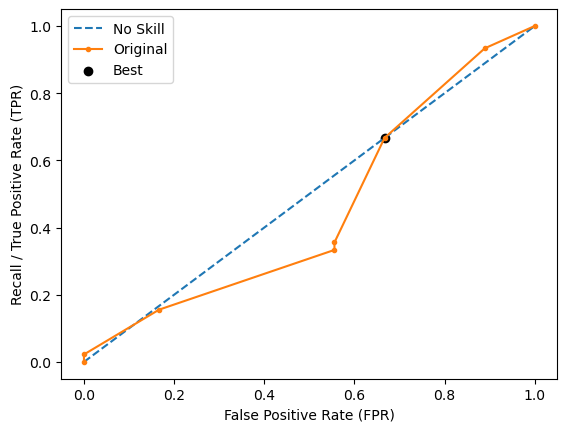

Run 5 - Random State: 4
Test Accuracy: 0.6666666666666666
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.21739130434782605
Test F-0.75 Score: 0.1824817518248175
Test F-1 Score: 0.16
Test F-1.5 Score: 0.13684210526315788
Test F-2 Score: 0.12658227848101264
Test G-Mean Score: 0.31426968052735443
Best Threshold=0.488
Best Recall=0.422
Best G-Mean=0.484


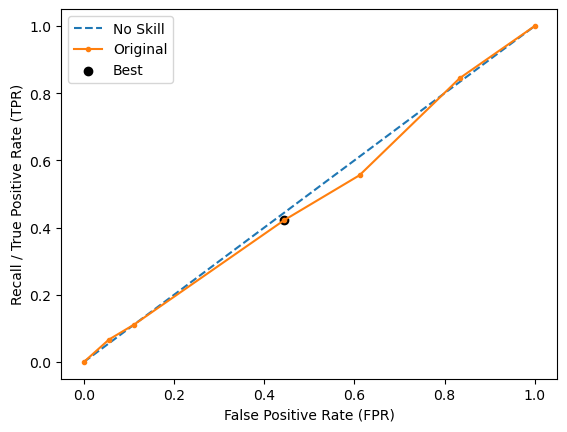

Ave Test Accuracy: 0.6698412698412699
Stdev Test Accuracy: 0.04259177099999601
Ave Test Recall: 0.12222222222222223
Stdev Test Recall: 0.10686324478706302
Ave Test F-0.5 Score: 0.19936215665554177
Stdev Test F-0.5 Score: 0.1395544780591394
Ave Test F-0.75 Score: 0.1729007289094225
Stdev Test F-0.75 Score: 0.12445694081264949
Ave Test F-1 Score: 0.15653416149068328
Stdev Test F-1 Score: 0.11702496653090301
Ave Test F-1.5 Score: 0.14011135833974836
Stdev Test F-1.5 Score: 0.11124762239668401
Ave Test F-2 Score: 0.13294478242565286
Stdev Test F-2 Score: 0.10926400058866866
Ave Test G-mean: 0.2769986637790133
Stdev Test G-mean: 0.17677717374695728
Ave Test Specificity: 0.888888888888889
Stdev Test Specificity: 0.09296222517045286
Ave Test Precision: 0.25596638655462184
Ave Test NPV: 0.717018618995135
Ave Runtime: 0.018108701705932616


In [116]:
ld_t02_dt_gs, ld_t02_dt_be, ld_t02_dt_model_info, ld_t02_dt_metrics_df = dt_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'newton-cholesky', 'resampling': RandomOverSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.6116959064327486
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0,
                                    solver='newton-cholesky'))])
Mean Train Score (Recall) 0.7000549471799036
Std Train Score (Recall) 0.039652930828857534
GridSearchCV Runtime: 18.288053274154663 secs
Run 1 - Random State: 0
Test Accuracy: 0.5079365079365079
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.22727272727272727
Test F-0.75 Score: 0.2358490566037736
Test F-1 Score: 0.24390243902439024
Test F-1.5 Score: 0.2559055118110236
Test F-2 Scor

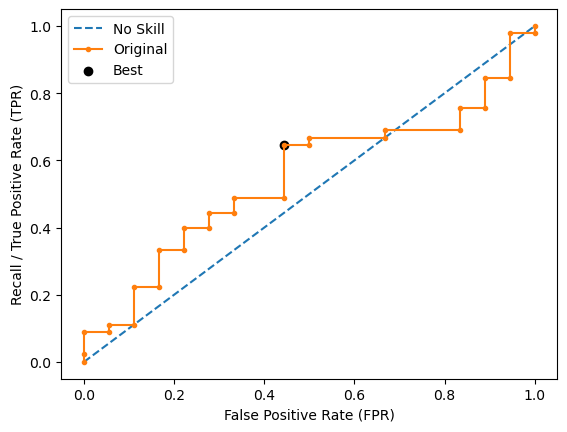

Run 2 - Random State: 1
Test Accuracy: 0.5238095238095238
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.16666666666666666
Test F-0.75 Score: 0.16666666666666666
Test F-1 Score: 0.16666666666666666
Test F-1.5 Score: 0.16666666666666666
Test F-2 Score: 0.16666666666666666
Test G-Mean Score: 0.3333333333333333
Best Threshold=0.500
Best Recall=0.600
Best G-Mean=0.632


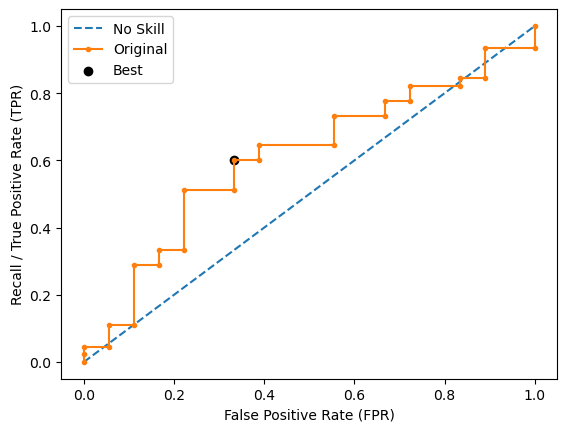

Run 3 - Random State: 2
Test Accuracy: 0.6349206349206349
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.18518518518518517
Test F-0.75 Score: 0.16339869281045752
Test F-1 Score: 0.14814814814814814
Test F-1.5 Score: 0.1313131313131313
Test F-2 Score: 0.12345679012345678
Test G-Mean Score: 0.3063121944908938
Best Threshold=0.500
Best Recall=0.511
Best G-Mean=0.506


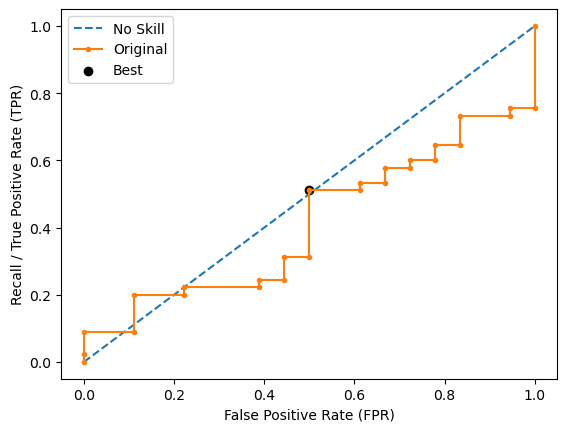

Run 4 - Random State: 3
Test Accuracy: 0.49206349206349204
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.06097560975609757
Test F-0.75 Score: 0.05980861244019139
Test F-1 Score: 0.058823529411764705
Test F-1.5 Score: 0.05752212389380531
Test F-2 Score: 0.056818181818181816
Test G-Mean Score: 0.1924500897298752
Best Threshold=0.500
Best Recall=0.489
Best G-Mean=0.659


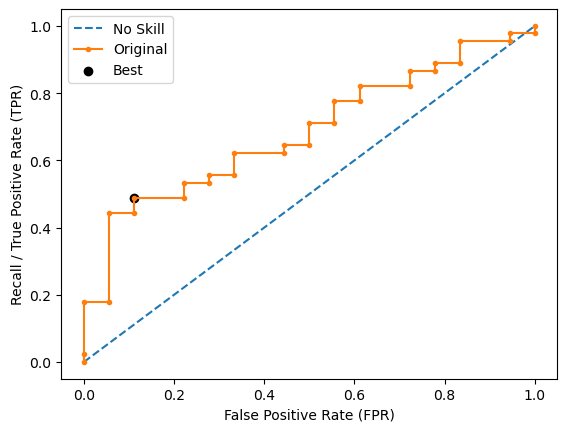

Run 5 - Random State: 4
Test Accuracy: 0.6190476190476191
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.3048780487804878
Test F-0.75 Score: 0.29904306220095694
Test F-1 Score: 0.29411764705882354
Test F-1.5 Score: 0.28761061946902655
Test F-2 Score: 0.2840909090909091
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.500
Best Recall=0.533
Best G-Mean=0.571


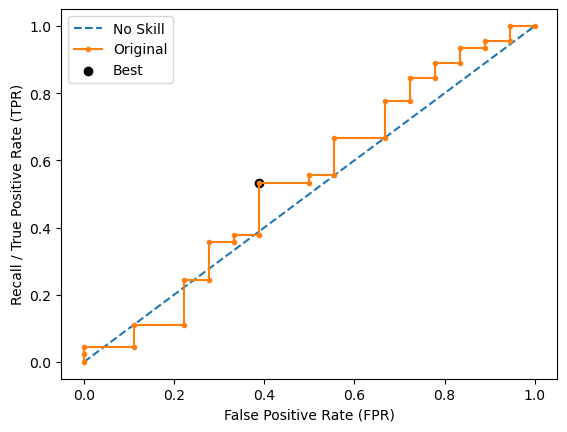

Ave Test Accuracy: 0.5555555555555556
Stdev Test Accuracy: 0.06640158940746631
Ave Test Recall: 0.17777777777777778
Stdev Test Recall: 0.09938079899999067
Ave Test F-0.5 Score: 0.1889956475322329
Stdev Test F-0.5 Score: 0.08915730317046092
Ave Test F-0.75 Score: 0.1849532181444092
Stdev Test F-0.75 Score: 0.08953637075724218
Ave Test F-1 Score: 0.18233168606195865
Stdev Test F-1 Score: 0.09076787778785238
Ave Test F-1.5 Score: 0.17980361063073066
Stdev Test F-1.5 Score: 0.09339501913602488
Ave Test F-2 Score: 0.1788380884872113
Stdev Test F-2 Score: 0.09525239539260544
Ave Test G-mean: 0.33969335106176335
Stdev Test G-mean: 0.10193215236208182
Ave Test Specificity: 0.7066666666666667
Stdev Test Specificity: 0.09480324003422909
Ave Test Precision: 0.196256038647343
Ave Test NPV: 0.681414499605989
Ave Runtime: 0.008931255340576172


In [117]:
ld_t02_logreg_gs, ld_t02_logreg_be, ld_t02_logreg_model_info, ld_t02_logreg_metrics_df = logreg_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.7131578947368421
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.5968415129365355
Std Train Score (Recall) 0.06980564189600648
GridSearchCV Runtime: 28.71850895881653 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.6984126984126984
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.513
Best Recall=0.311
Best

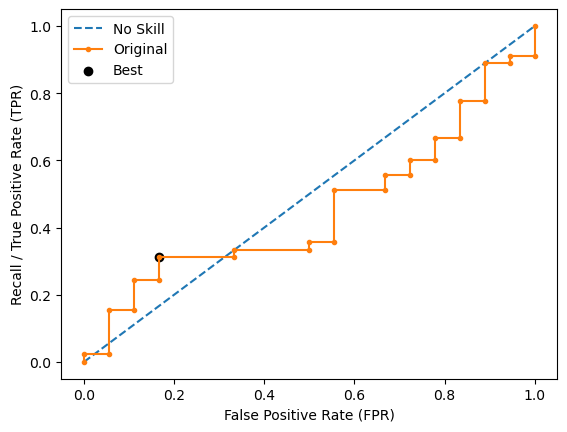

[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.7142857142857143
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.514
Best Recall=0.356
Best G-Mean=0.444


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


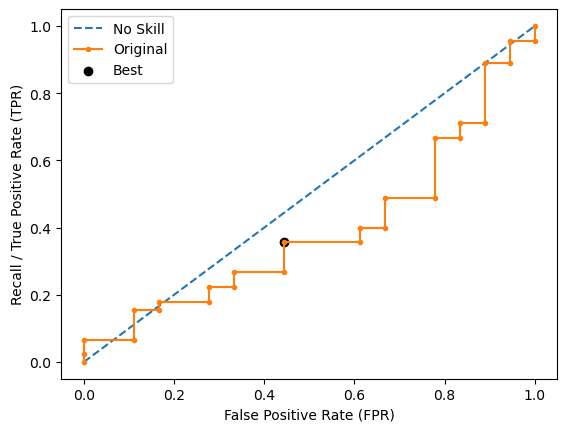

[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.7142857142857143
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.514
Best Recall=0.689
Best G-Mean=0.587


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


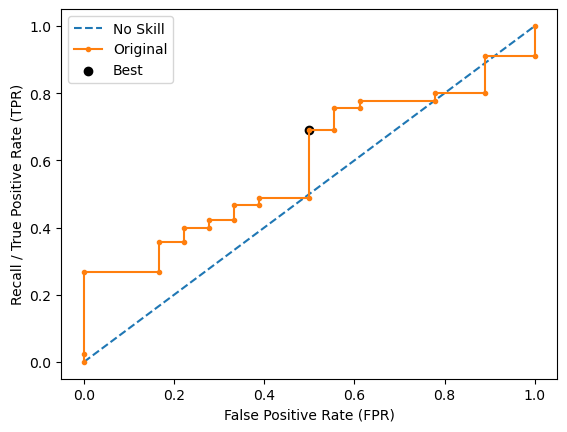

[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.7142857142857143
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.513
Best Recall=0.356
Best G-Mean=0.422


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


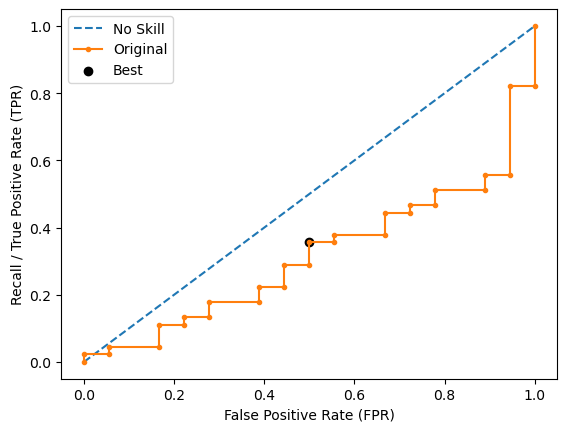

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.7142857142857143
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.513
Best Recall=0.444
Best G-Mean=0.497


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


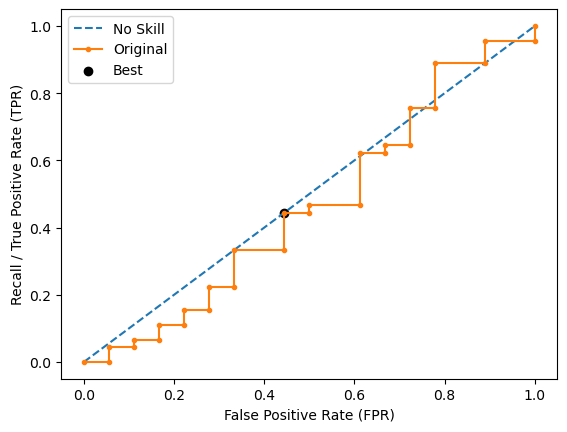

Ave Test Accuracy: 0.7111111111111111
Stdev Test Accuracy: 0.007098628499999357
Ave Test Recall: 0.0
Stdev Test Recall: 0.0
Ave Test F-0.5 Score: 0.0
Stdev Test F-0.5 Score: 0.0
Ave Test F-0.75 Score: 0.0
Stdev Test F-0.75 Score: 0.0
Ave Test F-1 Score: 0.0
Stdev Test F-1 Score: 0.0
Ave Test F-1.5 Score: 0.0
Stdev Test F-1.5 Score: 0.0
Ave Test F-2 Score: 0.0
Stdev Test F-2 Score: 0.0
Ave Test G-mean: 0.0
Stdev Test G-mean: 0.0
Ave Test Specificity: 0.9955555555555555
Stdev Test Specificity: 0.009938079899999081
Ave Test Precision: 0.0
Ave Test NPV: 0.7133640552995393
Ave Runtime: 0.015011358261108398


In [118]:
ld_t02_svm_gs, ld_t02_svm_be, ld_t02_svm_model_info, ld_t02_svm_metrics_df = svm_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 300, 'resampling': ADASYN(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.6751461988304093
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                max_depth=3, n_estimators=300,
                                random_state=0))])
Mean Train Score (Recall) 0.8108739477382011
Std Train Score (Recall) 0.02341370380618874
GridSearchCV Runtime: 21.360551357269287 secs
Run 1 - Random State: 0
Test Accuracy: 0.5396825396825397
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.1744186046511628
Test F-0.75 Score: 0.1728110599078341
Test F-1 Score: 0.171428571

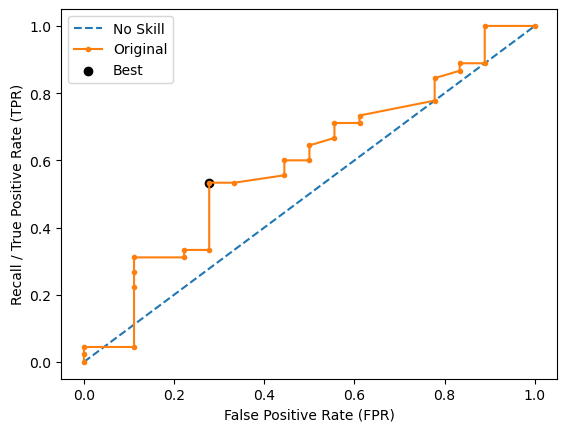

Run 2 - Random State: 1
Test Accuracy: 0.5873015873015873
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.24390243902439027
Test F-0.75 Score: 0.23923444976076555
Test F-1 Score: 0.23529411764705882
Test F-1.5 Score: 0.23008849557522124
Test F-2 Score: 0.22727272727272727
Test G-Mean Score: 0.40368671387966554
Best Threshold=0.446
Best Recall=0.467
Best G-Mean=0.509


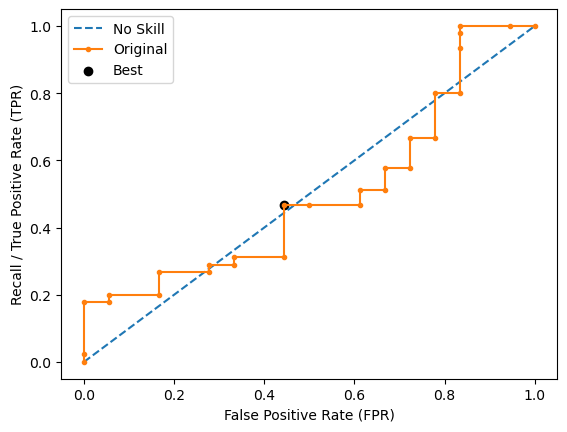

Run 3 - Random State: 2
Test Accuracy: 0.6507936507936508
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.303030303030303
Test F-0.75 Score: 0.28248587570621464
Test F-1 Score: 0.26666666666666666
Test F-1.5 Score: 0.24761904761904757
Test F-2 Score: 0.23809523809523808
Test G-Mean Score: 0.4274529791482521
Best Threshold=0.453
Best Recall=0.400
Best G-Mean=0.422


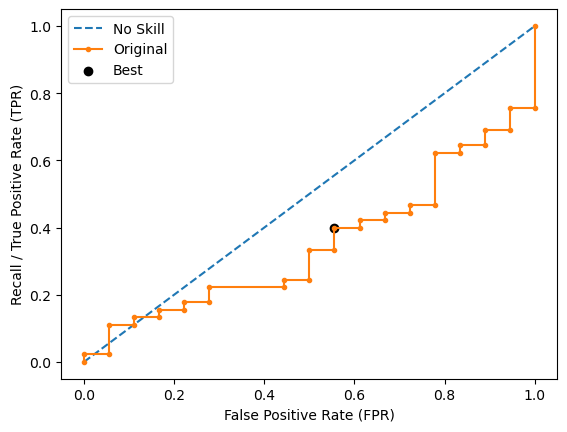

Run 4 - Random State: 3
Test Accuracy: 0.6825396825396826
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.3787878787878788
Test F-0.75 Score: 0.35310734463276844
Test F-1 Score: 0.33333333333333337
Test F-1.5 Score: 0.3095238095238096
Test F-2 Score: 0.2976190476190476
Test G-Mean Score: 0.48432210483785265
Best Threshold=0.449
Best Recall=0.333
Best G-Mean=0.471


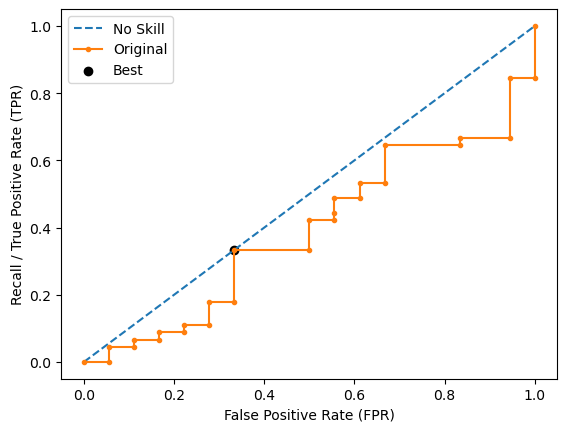

Run 5 - Random State: 4
Test Accuracy: 0.6507936507936508
Test Recall: 0.3333333333333333
Test F-0.5 Score: 0.36585365853658536
Test F-0.75 Score: 0.35885167464114837
Test F-1 Score: 0.35294117647058826
Test F-1.5 Score: 0.3451327433628319
Test F-2 Score: 0.34090909090909094
Test G-Mean Score: 0.5091750772173155
Best Threshold=0.380
Best Recall=0.711
Best G-Mean=0.487


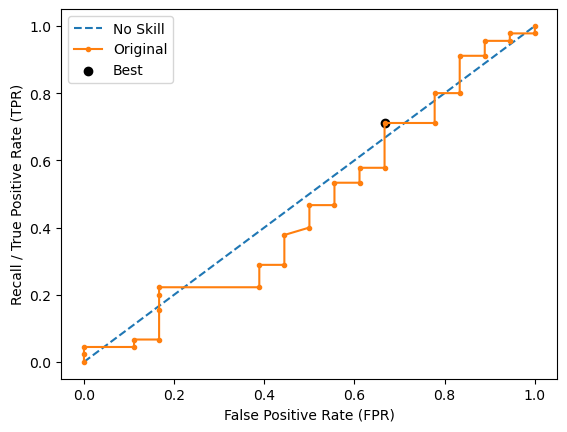

Ave Test Accuracy: 0.6222222222222222
Stdev Test Accuracy: 0.05766953055423796
Ave Test Recall: 0.2444444444444444
Stdev Test Recall: 0.06334307917217434
Ave Test F-0.5 Score: 0.293198576806064
Stdev Test F-0.5 Score: 0.085498162759296
Ave Test F-0.75 Score: 0.2812980809297462
Stdev Test F-0.75 Score: 0.07859917923376056
Ave Test F-1 Score: 0.2719327731092437
Stdev Test F-1 Score: 0.07383022368514952
Ave Test F-1.5 Score: 0.26038586269444297
Stdev Test F-1.5 Score: 0.06878568753096927
Ave Test F-2 Score: 0.25448708594776015
Stdev Test F-2 Score: 0.06656849953307648
Ave Test G-mean: 0.43269604471429235
Stdev Test G-mean: 0.06743821634903452
Ave Test Specificity: 0.7733333333333333
Stdev Test Specificity: 0.06363476028122823
Ave Test Precision: 0.31029411764705883
Ave Test NPV: 0.7182619578821353
Ave Runtime: 0.17231740951538085


In [119]:
ld_t02_lgbm_gs, ld_t02_lgbm_be, ld_t02_lgbm_model_info, ld_t02_lgbm_metrics_df = lgbm_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.680701754385965
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 0.8969459334029469
Std Train Score (Recall) 0.012205282260849189
GridSearchCV Runtime: 9.242453813552856 secs
Run 1 - Random State: 0
Test Accuracy: 0.6507936507936508
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.2
Test F-0.75 Score: 0.1724137931034483
Test F-1 Score: 0.1

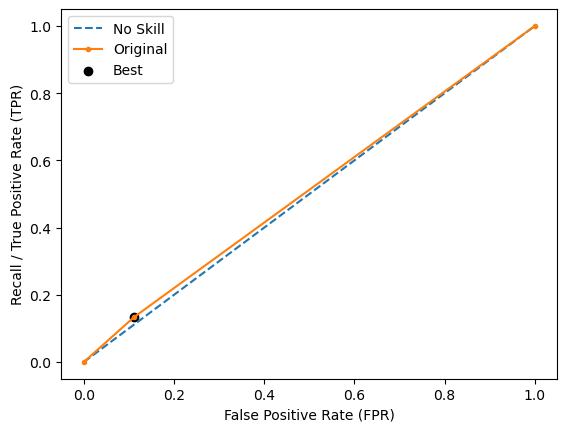

Run 2 - Random State: 1
Test Accuracy: 0.6666666666666666
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.27777777777777773
Test F-0.75 Score: 0.24509803921568626
Test F-1 Score: 0.2222222222222222
Test F-1.5 Score: 0.19696969696969693
Test F-2 Score: 0.18518518518518515
Test G-Mean Score: 0.380058475033046
Best Threshold=0.731
Best Recall=0.133
Best G-Mean=0.333


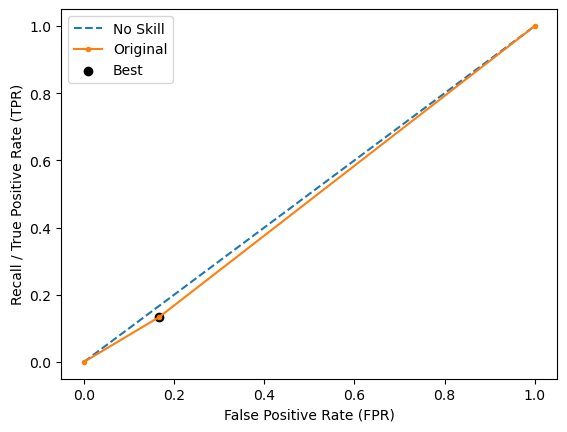

Run 3 - Random State: 2
Test Accuracy: 0.6031746031746031
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.16129032258064516
Test F-0.75 Score: 0.14792899408284024
Test F-1 Score: 0.13793103448275862
Test F-1.5 Score: 0.1262135922330097
Test F-2 Score: 0.12048192771084336
Test G-Mean Score: 0.2981423969999719
Best Threshold=0.731
Best Recall=0.200
Best G-Mean=0.422


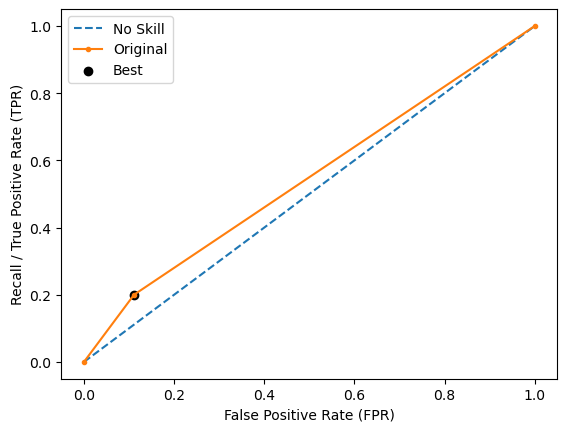

Run 4 - Random State: 3
Test Accuracy: 0.7301587301587301
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.39473684210526316
Test F-0.75 Score: 0.30991735537190085
Test F-1 Score: 0.2608695652173913
Test F-1.5 Score: 0.21428571428571427
Test F-2 Score: 0.19480519480519481
Test G-Mean Score: 0.39907299991262163
Best Threshold=0.731
Best Recall=0.044
Best G-Mean=0.192


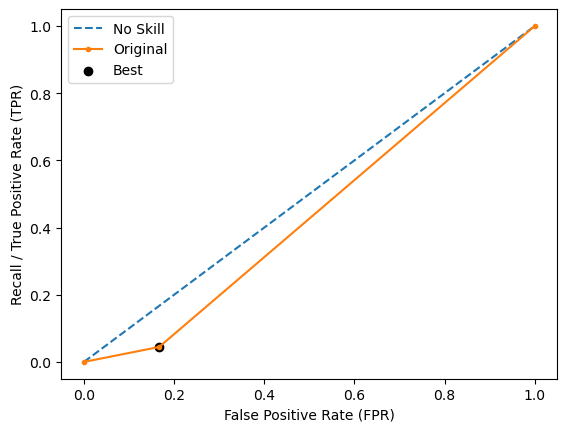

Run 5 - Random State: 4
Test Accuracy: 0.6190476190476191
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.1
Test F-0.75 Score: 0.08620689655172414
Test F-1 Score: 0.07692307692307691
Test F-1.5 Score: 0.06701030927835051
Test F-2 Score: 0.0625
Test G-Mean Score: 0.21659542988464361
Best Threshold=0.731
Best Recall=0.156
Best G-Mean=0.383


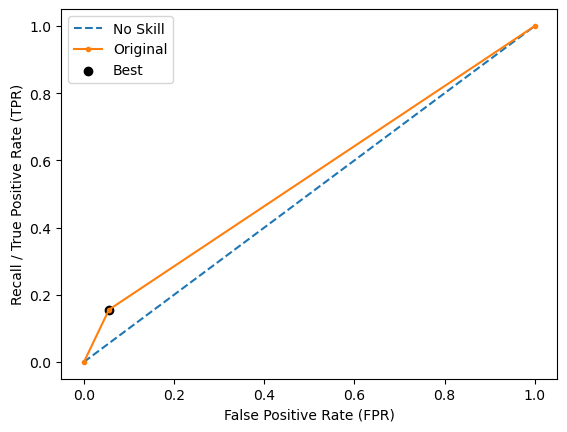

Ave Test Accuracy: 0.653968253968254
Stdev Test Accuracy: 0.04943622699173788
Ave Test Recall: 0.12222222222222223
Stdev Test Recall: 0.046481112585226414
Ave Test F-0.5 Score: 0.22676098849273724
Stdev Test F-0.5 Score: 0.11389634211592137
Ave Test F-0.75 Score: 0.19231301566511996
Stdev Test F-0.75 Score: 0.08695037143794027
Ave Test F-1 Score: 0.1703584105383206
Stdev Test F-1 Score: 0.07234720967395805
Ave Test F-1.5 Score: 0.1476999862646945
Stdev Test F-1.5 Score: 0.05920468260741649
Ave Test F-2 Score: 0.13759446154024466
Stdev Test F-2 Score: 0.0539179525003796
Ave Test G-mean: 0.3208371494494741
Stdev Test G-mean: 0.07266375781894546
Ave Test Specificity: 0.8666666666666666
Stdev Test Specificity: 0.05665577237325317
Ave Test Precision: 0.29803030303030303
Ave Test NPV: 0.7111818449749484
Ave Runtime: 0.1423274040222168


In [120]:
ld_t02_adaboost_gs, ld_t02_adaboost_be, ld_t02_adaboost_model_info, ld_t02_adaboost_metrics_df = adaboost_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.005871
0:	learn: 0.6913745	total: 5.46ms	remaining: 5.45s
1:	learn: 0.6888306	total: 11.1ms	remaining: 5.55s
2:	learn: 0.6870718	total: 16.8ms	remaining: 5.58s
3:	learn: 0.6851780	total: 21.4ms	remaining: 5.34s
4:	learn: 0.6828383	total: 26ms	remaining: 5.17s
5:	learn: 0.6814753	total: 29.1ms	remaining: 4.82s
6:	learn: 0.6804104	total: 33.1ms	remaining: 4.69s
7:	learn: 0.6774135	total: 36.8ms	remaining: 4.56s
8:	learn: 0.6757513	total: 40.4ms	remaining: 4.44s
9:	learn: 0.6734209	total: 44.1ms	remaining: 4.37s
10:	learn: 0.6702109	total: 47.3ms	remaining: 4.26s
11:	learn: 0.6681745	total: 50.2ms	remaining: 4.13s
12:	learn: 0.6658834	total: 53ms	remaining: 4.03s
13:	learn: 0.6644928	total: 56.4ms	remaining: 3.97s
14:	learn: 0.6627136	total: 59.3ms	remaining: 3.89s
15:	learn: 0.6603971	total: 61.6ms	remaining: 3.79s
16:	learn: 0.6589107	total: 63.9ms	remaining: 3.69s
17:	learn: 0.6571044	total: 66ms	rema

171:	learn: 0.4467691	total: 381ms	remaining: 1.83s
172:	learn: 0.4459902	total: 384ms	remaining: 1.83s
173:	learn: 0.4442653	total: 386ms	remaining: 1.83s
174:	learn: 0.4433837	total: 388ms	remaining: 1.83s
175:	learn: 0.4421551	total: 390ms	remaining: 1.82s
176:	learn: 0.4414667	total: 392ms	remaining: 1.82s
177:	learn: 0.4402334	total: 394ms	remaining: 1.82s
178:	learn: 0.4397076	total: 396ms	remaining: 1.81s
179:	learn: 0.4387158	total: 398ms	remaining: 1.81s
180:	learn: 0.4376634	total: 400ms	remaining: 1.81s
181:	learn: 0.4366522	total: 402ms	remaining: 1.81s
182:	learn: 0.4356836	total: 404ms	remaining: 1.8s
183:	learn: 0.4351196	total: 406ms	remaining: 1.8s
184:	learn: 0.4342793	total: 408ms	remaining: 1.79s
185:	learn: 0.4337069	total: 410ms	remaining: 1.79s
186:	learn: 0.4331090	total: 412ms	remaining: 1.79s
187:	learn: 0.4325539	total: 414ms	remaining: 1.79s
188:	learn: 0.4316756	total: 416ms	remaining: 1.78s
189:	learn: 0.4307413	total: 418ms	remaining: 1.78s
190:	learn: 0.

381:	learn: 0.3018940	total: 770ms	remaining: 1.25s
382:	learn: 0.3009838	total: 772ms	remaining: 1.24s
383:	learn: 0.3001794	total: 774ms	remaining: 1.24s
384:	learn: 0.2994271	total: 776ms	remaining: 1.24s
385:	learn: 0.2990534	total: 777ms	remaining: 1.24s
386:	learn: 0.2981894	total: 779ms	remaining: 1.23s
387:	learn: 0.2979294	total: 781ms	remaining: 1.23s
388:	learn: 0.2975823	total: 783ms	remaining: 1.23s
389:	learn: 0.2972365	total: 785ms	remaining: 1.23s
390:	learn: 0.2967077	total: 787ms	remaining: 1.23s
391:	learn: 0.2963640	total: 789ms	remaining: 1.22s
392:	learn: 0.2957982	total: 790ms	remaining: 1.22s
393:	learn: 0.2954236	total: 792ms	remaining: 1.22s
394:	learn: 0.2949361	total: 794ms	remaining: 1.22s
395:	learn: 0.2944683	total: 795ms	remaining: 1.21s
396:	learn: 0.2939141	total: 797ms	remaining: 1.21s
397:	learn: 0.2935543	total: 799ms	remaining: 1.21s
398:	learn: 0.2931313	total: 801ms	remaining: 1.21s
399:	learn: 0.2925603	total: 803ms	remaining: 1.2s
400:	learn: 0

593:	learn: 0.2123972	total: 1.16s	remaining: 791ms
594:	learn: 0.2120265	total: 1.16s	remaining: 789ms
595:	learn: 0.2116984	total: 1.16s	remaining: 787ms
596:	learn: 0.2113086	total: 1.16s	remaining: 785ms
597:	learn: 0.2111769	total: 1.16s	remaining: 783ms
598:	learn: 0.2108815	total: 1.17s	remaining: 780ms
599:	learn: 0.2105384	total: 1.17s	remaining: 778ms
600:	learn: 0.2101624	total: 1.17s	remaining: 776ms
601:	learn: 0.2100028	total: 1.17s	remaining: 774ms
602:	learn: 0.2096136	total: 1.17s	remaining: 772ms
603:	learn: 0.2093813	total: 1.17s	remaining: 770ms
604:	learn: 0.2089536	total: 1.18s	remaining: 768ms
605:	learn: 0.2086051	total: 1.18s	remaining: 766ms
606:	learn: 0.2084786	total: 1.18s	remaining: 764ms
607:	learn: 0.2082040	total: 1.18s	remaining: 762ms
608:	learn: 0.2076068	total: 1.18s	remaining: 759ms
609:	learn: 0.2073402	total: 1.18s	remaining: 757ms
610:	learn: 0.2071103	total: 1.19s	remaining: 755ms
611:	learn: 0.2068417	total: 1.19s	remaining: 753ms
612:	learn: 

803:	learn: 0.1552753	total: 1.56s	remaining: 381ms
804:	learn: 0.1550459	total: 1.56s	remaining: 379ms
805:	learn: 0.1547702	total: 1.56s	remaining: 377ms
806:	learn: 0.1545462	total: 1.57s	remaining: 375ms
807:	learn: 0.1542780	total: 1.57s	remaining: 373ms
808:	learn: 0.1539733	total: 1.57s	remaining: 371ms
809:	learn: 0.1536441	total: 1.57s	remaining: 369ms
810:	learn: 0.1535331	total: 1.57s	remaining: 367ms
811:	learn: 0.1533897	total: 1.57s	remaining: 365ms
812:	learn: 0.1531478	total: 1.58s	remaining: 363ms
813:	learn: 0.1529720	total: 1.58s	remaining: 361ms
814:	learn: 0.1527467	total: 1.58s	remaining: 359ms
815:	learn: 0.1524957	total: 1.58s	remaining: 357ms
816:	learn: 0.1523479	total: 1.58s	remaining: 355ms
817:	learn: 0.1520923	total: 1.58s	remaining: 353ms
818:	learn: 0.1519311	total: 1.59s	remaining: 351ms
819:	learn: 0.1517952	total: 1.59s	remaining: 349ms
820:	learn: 0.1516800	total: 1.59s	remaining: 347ms
821:	learn: 0.1514354	total: 1.59s	remaining: 345ms
822:	learn: 

4:	learn: 0.6828383	total: 19.6ms	remaining: 3.89s
5:	learn: 0.6814753	total: 23.8ms	remaining: 3.94s
6:	learn: 0.6804104	total: 27.5ms	remaining: 3.9s
7:	learn: 0.6774135	total: 30.9ms	remaining: 3.84s
8:	learn: 0.6757513	total: 34.4ms	remaining: 3.79s
9:	learn: 0.6734209	total: 37.5ms	remaining: 3.71s
10:	learn: 0.6702109	total: 40.4ms	remaining: 3.63s
11:	learn: 0.6681745	total: 43.3ms	remaining: 3.57s
12:	learn: 0.6658834	total: 46.1ms	remaining: 3.5s
13:	learn: 0.6644928	total: 49.1ms	remaining: 3.46s
14:	learn: 0.6627136	total: 52.1ms	remaining: 3.42s
15:	learn: 0.6603971	total: 54.6ms	remaining: 3.35s
16:	learn: 0.6589107	total: 57ms	remaining: 3.3s
17:	learn: 0.6571044	total: 59.5ms	remaining: 3.25s
18:	learn: 0.6540551	total: 61.9ms	remaining: 3.2s
19:	learn: 0.6530937	total: 63.9ms	remaining: 3.13s
20:	learn: 0.6507763	total: 66.2ms	remaining: 3.09s
21:	learn: 0.6495243	total: 68.5ms	remaining: 3.04s
22:	learn: 0.6478946	total: 70.7ms	remaining: 3s
23:	learn: 0.6466382	total:

251:	learn: 0.3797891	total: 407ms	remaining: 1.21s
252:	learn: 0.3789275	total: 409ms	remaining: 1.21s
253:	learn: 0.3781807	total: 411ms	remaining: 1.21s
254:	learn: 0.3778632	total: 412ms	remaining: 1.2s
255:	learn: 0.3772192	total: 414ms	remaining: 1.2s
256:	learn: 0.3764502	total: 415ms	remaining: 1.2s
257:	learn: 0.3752776	total: 417ms	remaining: 1.2s
258:	learn: 0.3747009	total: 418ms	remaining: 1.2s
259:	learn: 0.3735965	total: 420ms	remaining: 1.19s
260:	learn: 0.3729366	total: 421ms	remaining: 1.19s
261:	learn: 0.3726039	total: 423ms	remaining: 1.19s
262:	learn: 0.3722492	total: 424ms	remaining: 1.19s
263:	learn: 0.3715227	total: 426ms	remaining: 1.19s
264:	learn: 0.3709225	total: 427ms	remaining: 1.19s
265:	learn: 0.3704870	total: 429ms	remaining: 1.18s
266:	learn: 0.3700447	total: 430ms	remaining: 1.18s
267:	learn: 0.3694491	total: 432ms	remaining: 1.18s
268:	learn: 0.3689182	total: 433ms	remaining: 1.18s
269:	learn: 0.3684740	total: 435ms	remaining: 1.18s
270:	learn: 0.367

492:	learn: 0.2526899	total: 794ms	remaining: 816ms
493:	learn: 0.2525142	total: 796ms	remaining: 815ms
494:	learn: 0.2518534	total: 798ms	remaining: 814ms
495:	learn: 0.2513188	total: 800ms	remaining: 813ms
496:	learn: 0.2510597	total: 801ms	remaining: 811ms
497:	learn: 0.2505532	total: 803ms	remaining: 809ms
498:	learn: 0.2500833	total: 805ms	remaining: 808ms
499:	learn: 0.2494835	total: 806ms	remaining: 806ms
500:	learn: 0.2490163	total: 808ms	remaining: 805ms
501:	learn: 0.2482390	total: 810ms	remaining: 803ms
502:	learn: 0.2478947	total: 811ms	remaining: 802ms
503:	learn: 0.2475970	total: 813ms	remaining: 800ms
504:	learn: 0.2471246	total: 814ms	remaining: 798ms
505:	learn: 0.2467379	total: 816ms	remaining: 797ms
506:	learn: 0.2462381	total: 818ms	remaining: 795ms
507:	learn: 0.2456814	total: 819ms	remaining: 793ms
508:	learn: 0.2454964	total: 821ms	remaining: 792ms
509:	learn: 0.2450209	total: 822ms	remaining: 790ms
510:	learn: 0.2448691	total: 825ms	remaining: 789ms
511:	learn: 

730:	learn: 0.1734387	total: 1.18s	remaining: 435ms
731:	learn: 0.1732028	total: 1.18s	remaining: 433ms
732:	learn: 0.1730630	total: 1.19s	remaining: 432ms
733:	learn: 0.1725721	total: 1.19s	remaining: 430ms
734:	learn: 0.1723487	total: 1.19s	remaining: 429ms
735:	learn: 0.1720522	total: 1.19s	remaining: 427ms
736:	learn: 0.1717442	total: 1.19s	remaining: 425ms
737:	learn: 0.1713901	total: 1.19s	remaining: 424ms
738:	learn: 0.1709093	total: 1.2s	remaining: 422ms
739:	learn: 0.1706795	total: 1.2s	remaining: 421ms
740:	learn: 0.1703371	total: 1.2s	remaining: 419ms
741:	learn: 0.1701140	total: 1.2s	remaining: 417ms
742:	learn: 0.1698567	total: 1.2s	remaining: 416ms
743:	learn: 0.1696120	total: 1.2s	remaining: 414ms
744:	learn: 0.1694684	total: 1.21s	remaining: 413ms
745:	learn: 0.1690897	total: 1.21s	remaining: 411ms
746:	learn: 0.1688424	total: 1.21s	remaining: 409ms
747:	learn: 0.1685021	total: 1.21s	remaining: 408ms
748:	learn: 0.1681179	total: 1.21s	remaining: 406ms
749:	learn: 0.1678

965:	learn: 0.1220866	total: 1.57s	remaining: 55.4ms
966:	learn: 0.1219163	total: 1.57s	remaining: 53.7ms
967:	learn: 0.1217213	total: 1.58s	remaining: 52.1ms
968:	learn: 0.1215673	total: 1.58s	remaining: 50.5ms
969:	learn: 0.1213445	total: 1.58s	remaining: 48.9ms
970:	learn: 0.1212900	total: 1.58s	remaining: 47.2ms
971:	learn: 0.1212019	total: 1.58s	remaining: 45.6ms
972:	learn: 0.1209650	total: 1.58s	remaining: 44ms
973:	learn: 0.1208124	total: 1.59s	remaining: 42.4ms
974:	learn: 0.1206321	total: 1.59s	remaining: 40.7ms
975:	learn: 0.1203974	total: 1.59s	remaining: 39.1ms
976:	learn: 0.1201730	total: 1.59s	remaining: 37.5ms
977:	learn: 0.1197684	total: 1.59s	remaining: 35.9ms
978:	learn: 0.1194581	total: 1.59s	remaining: 34.2ms
979:	learn: 0.1192104	total: 1.6s	remaining: 32.6ms
980:	learn: 0.1190715	total: 1.6s	remaining: 31ms
981:	learn: 0.1188135	total: 1.6s	remaining: 29.3ms
982:	learn: 0.1185922	total: 1.6s	remaining: 27.7ms
983:	learn: 0.1183905	total: 1.6s	remaining: 26.1ms
98

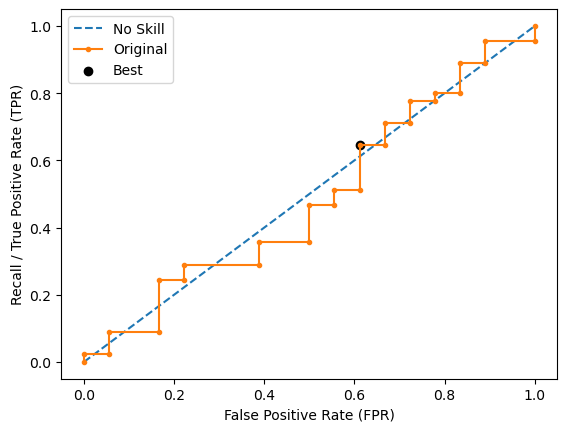

Learning rate set to 0.005871
0:	learn: 0.6911208	total: 2.06ms	remaining: 2.05s
1:	learn: 0.6887708	total: 4.36ms	remaining: 2.17s
2:	learn: 0.6867150	total: 6.97ms	remaining: 2.31s
3:	learn: 0.6838850	total: 10.4ms	remaining: 2.58s
4:	learn: 0.6819722	total: 12.5ms	remaining: 2.48s
5:	learn: 0.6794912	total: 14.3ms	remaining: 2.37s
6:	learn: 0.6779683	total: 15.8ms	remaining: 2.24s
7:	learn: 0.6749987	total: 17.4ms	remaining: 2.16s
8:	learn: 0.6728868	total: 18.8ms	remaining: 2.07s
9:	learn: 0.6711263	total: 20.5ms	remaining: 2.03s
10:	learn: 0.6691171	total: 22ms	remaining: 1.98s
11:	learn: 0.6676003	total: 23.3ms	remaining: 1.92s
12:	learn: 0.6659501	total: 24.7ms	remaining: 1.88s
13:	learn: 0.6643631	total: 26.4ms	remaining: 1.86s
14:	learn: 0.6631608	total: 27.9ms	remaining: 1.83s
15:	learn: 0.6602415	total: 29.9ms	remaining: 1.84s
16:	learn: 0.6581190	total: 31.2ms	remaining: 1.81s
17:	learn: 0.6558731	total: 33ms	remaining: 1.8s
18:	learn: 0.6526685	total: 34.6ms	remaining: 1.7

239:	learn: 0.3651051	total: 387ms	remaining: 1.22s
240:	learn: 0.3645122	total: 389ms	remaining: 1.22s
241:	learn: 0.3640324	total: 391ms	remaining: 1.22s
242:	learn: 0.3632463	total: 393ms	remaining: 1.22s
243:	learn: 0.3624708	total: 394ms	remaining: 1.22s
244:	learn: 0.3618930	total: 396ms	remaining: 1.22s
245:	learn: 0.3609130	total: 398ms	remaining: 1.22s
246:	learn: 0.3600774	total: 400ms	remaining: 1.22s
247:	learn: 0.3590549	total: 402ms	remaining: 1.22s
248:	learn: 0.3576873	total: 404ms	remaining: 1.22s
249:	learn: 0.3566570	total: 405ms	remaining: 1.22s
250:	learn: 0.3560224	total: 407ms	remaining: 1.21s
251:	learn: 0.3551947	total: 409ms	remaining: 1.21s
252:	learn: 0.3540242	total: 411ms	remaining: 1.21s
253:	learn: 0.3531024	total: 412ms	remaining: 1.21s
254:	learn: 0.3522640	total: 414ms	remaining: 1.21s
255:	learn: 0.3514309	total: 416ms	remaining: 1.21s
256:	learn: 0.3508129	total: 418ms	remaining: 1.21s
257:	learn: 0.3503350	total: 419ms	remaining: 1.21s
258:	learn: 

472:	learn: 0.2346720	total: 775ms	remaining: 864ms
473:	learn: 0.2343152	total: 777ms	remaining: 862ms
474:	learn: 0.2342187	total: 779ms	remaining: 861ms
475:	learn: 0.2339200	total: 780ms	remaining: 859ms
476:	learn: 0.2334824	total: 782ms	remaining: 857ms
477:	learn: 0.2329999	total: 784ms	remaining: 856ms
478:	learn: 0.2326274	total: 785ms	remaining: 854ms
479:	learn: 0.2320063	total: 787ms	remaining: 852ms
480:	learn: 0.2316879	total: 788ms	remaining: 851ms
481:	learn: 0.2312576	total: 790ms	remaining: 849ms
482:	learn: 0.2309413	total: 792ms	remaining: 847ms
483:	learn: 0.2307923	total: 793ms	remaining: 846ms
484:	learn: 0.2303459	total: 795ms	remaining: 844ms
485:	learn: 0.2299989	total: 797ms	remaining: 842ms
486:	learn: 0.2297467	total: 798ms	remaining: 841ms
487:	learn: 0.2293224	total: 800ms	remaining: 839ms
488:	learn: 0.2289734	total: 801ms	remaining: 837ms
489:	learn: 0.2285893	total: 804ms	remaining: 836ms
490:	learn: 0.2280671	total: 805ms	remaining: 835ms
491:	learn: 

713:	learn: 0.1596620	total: 1.16s	remaining: 466ms
714:	learn: 0.1594775	total: 1.17s	remaining: 464ms
715:	learn: 0.1591714	total: 1.17s	remaining: 463ms
716:	learn: 0.1589125	total: 1.17s	remaining: 461ms
717:	learn: 0.1585052	total: 1.17s	remaining: 459ms
718:	learn: 0.1583653	total: 1.17s	remaining: 458ms
719:	learn: 0.1582237	total: 1.17s	remaining: 456ms
720:	learn: 0.1581558	total: 1.17s	remaining: 454ms
721:	learn: 0.1580163	total: 1.18s	remaining: 453ms
722:	learn: 0.1578907	total: 1.18s	remaining: 451ms
723:	learn: 0.1575888	total: 1.18s	remaining: 450ms
724:	learn: 0.1572683	total: 1.18s	remaining: 448ms
725:	learn: 0.1572284	total: 1.18s	remaining: 446ms
726:	learn: 0.1568969	total: 1.18s	remaining: 444ms
727:	learn: 0.1565145	total: 1.19s	remaining: 443ms
728:	learn: 0.1563160	total: 1.19s	remaining: 441ms
729:	learn: 0.1560677	total: 1.19s	remaining: 440ms
730:	learn: 0.1558657	total: 1.19s	remaining: 438ms
731:	learn: 0.1557012	total: 1.19s	remaining: 436ms
732:	learn: 

958:	learn: 0.1099963	total: 1.55s	remaining: 66.4ms
959:	learn: 0.1098692	total: 1.55s	remaining: 64.8ms
960:	learn: 0.1096952	total: 1.55s	remaining: 63.1ms
961:	learn: 0.1094989	total: 1.56s	remaining: 61.5ms
962:	learn: 0.1093166	total: 1.56s	remaining: 59.9ms
963:	learn: 0.1092038	total: 1.56s	remaining: 58.3ms
964:	learn: 0.1091385	total: 1.56s	remaining: 56.7ms
965:	learn: 0.1089898	total: 1.56s	remaining: 55ms
966:	learn: 0.1088252	total: 1.56s	remaining: 53.4ms
967:	learn: 0.1085893	total: 1.57s	remaining: 51.8ms
968:	learn: 0.1083831	total: 1.57s	remaining: 50.2ms
969:	learn: 0.1082293	total: 1.57s	remaining: 48.6ms
970:	learn: 0.1079676	total: 1.57s	remaining: 47ms
971:	learn: 0.1078091	total: 1.57s	remaining: 45.3ms
972:	learn: 0.1076022	total: 1.57s	remaining: 43.7ms
973:	learn: 0.1075170	total: 1.58s	remaining: 42.1ms
974:	learn: 0.1072796	total: 1.58s	remaining: 40.5ms
975:	learn: 0.1071651	total: 1.58s	remaining: 38.9ms
976:	learn: 0.1069668	total: 1.58s	remaining: 37.3

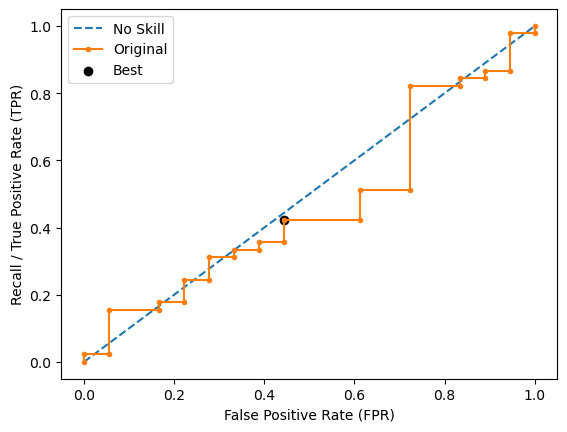

Learning rate set to 0.005871
0:	learn: 0.6907402	total: 2.02ms	remaining: 2.02s
1:	learn: 0.6892224	total: 5.76ms	remaining: 2.88s
2:	learn: 0.6874623	total: 9.35ms	remaining: 3.11s
3:	learn: 0.6863687	total: 13ms	remaining: 3.23s
4:	learn: 0.6833549	total: 16.9ms	remaining: 3.35s
5:	learn: 0.6810451	total: 20.2ms	remaining: 3.34s
6:	learn: 0.6797730	total: 23.5ms	remaining: 3.33s
7:	learn: 0.6778407	total: 27ms	remaining: 3.35s
8:	learn: 0.6757081	total: 30.2ms	remaining: 3.33s
9:	learn: 0.6735458	total: 32.8ms	remaining: 3.25s
10:	learn: 0.6716798	total: 35.6ms	remaining: 3.2s
11:	learn: 0.6696399	total: 38.4ms	remaining: 3.16s
12:	learn: 0.6684177	total: 40.8ms	remaining: 3.1s
13:	learn: 0.6660981	total: 43.3ms	remaining: 3.05s
14:	learn: 0.6629349	total: 45.7ms	remaining: 3s
15:	learn: 0.6602965	total: 48ms	remaining: 2.95s
16:	learn: 0.6594627	total: 49.8ms	remaining: 2.88s
17:	learn: 0.6573732	total: 51.9ms	remaining: 2.83s
18:	learn: 0.6556954	total: 54ms	remaining: 2.79s
19:	l

233:	learn: 0.3897197	total: 386ms	remaining: 1.26s
234:	learn: 0.3887809	total: 388ms	remaining: 1.26s
235:	learn: 0.3877833	total: 390ms	remaining: 1.26s
236:	learn: 0.3866589	total: 391ms	remaining: 1.26s
237:	learn: 0.3858918	total: 393ms	remaining: 1.26s
238:	learn: 0.3854687	total: 394ms	remaining: 1.25s
239:	learn: 0.3843941	total: 396ms	remaining: 1.25s
240:	learn: 0.3833766	total: 397ms	remaining: 1.25s
241:	learn: 0.3822577	total: 399ms	remaining: 1.25s
242:	learn: 0.3818868	total: 401ms	remaining: 1.25s
243:	learn: 0.3813767	total: 402ms	remaining: 1.25s
244:	learn: 0.3809713	total: 404ms	remaining: 1.24s
245:	learn: 0.3804174	total: 405ms	remaining: 1.24s
246:	learn: 0.3799639	total: 407ms	remaining: 1.24s
247:	learn: 0.3793093	total: 408ms	remaining: 1.24s
248:	learn: 0.3788762	total: 410ms	remaining: 1.24s
249:	learn: 0.3782925	total: 411ms	remaining: 1.23s
250:	learn: 0.3776007	total: 413ms	remaining: 1.23s
251:	learn: 0.3770154	total: 414ms	remaining: 1.23s
252:	learn: 

472:	learn: 0.2499625	total: 771ms	remaining: 859ms
473:	learn: 0.2495580	total: 773ms	remaining: 858ms
474:	learn: 0.2488404	total: 775ms	remaining: 856ms
475:	learn: 0.2482302	total: 777ms	remaining: 855ms
476:	learn: 0.2479678	total: 778ms	remaining: 853ms
477:	learn: 0.2474574	total: 780ms	remaining: 851ms
478:	learn: 0.2468156	total: 781ms	remaining: 850ms
479:	learn: 0.2464296	total: 783ms	remaining: 848ms
480:	learn: 0.2459510	total: 785ms	remaining: 847ms
481:	learn: 0.2455794	total: 787ms	remaining: 845ms
482:	learn: 0.2450363	total: 788ms	remaining: 844ms
483:	learn: 0.2447291	total: 790ms	remaining: 842ms
484:	learn: 0.2443255	total: 791ms	remaining: 840ms
485:	learn: 0.2441703	total: 793ms	remaining: 839ms
486:	learn: 0.2435306	total: 795ms	remaining: 837ms
487:	learn: 0.2431100	total: 796ms	remaining: 835ms
488:	learn: 0.2425344	total: 798ms	remaining: 834ms
489:	learn: 0.2421347	total: 799ms	remaining: 832ms
490:	learn: 0.2417496	total: 801ms	remaining: 830ms
491:	learn: 

705:	learn: 0.1708982	total: 1.16s	remaining: 483ms
706:	learn: 0.1706357	total: 1.16s	remaining: 481ms
707:	learn: 0.1704189	total: 1.16s	remaining: 480ms
708:	learn: 0.1702163	total: 1.16s	remaining: 478ms
709:	learn: 0.1698272	total: 1.17s	remaining: 476ms
710:	learn: 0.1695351	total: 1.17s	remaining: 475ms
711:	learn: 0.1691382	total: 1.17s	remaining: 473ms
712:	learn: 0.1688148	total: 1.17s	remaining: 471ms
713:	learn: 0.1685057	total: 1.17s	remaining: 470ms
714:	learn: 0.1682632	total: 1.17s	remaining: 468ms
715:	learn: 0.1678467	total: 1.18s	remaining: 466ms
716:	learn: 0.1675696	total: 1.18s	remaining: 465ms
717:	learn: 0.1671990	total: 1.18s	remaining: 463ms
718:	learn: 0.1669919	total: 1.18s	remaining: 462ms
719:	learn: 0.1669015	total: 1.18s	remaining: 460ms
720:	learn: 0.1667895	total: 1.18s	remaining: 458ms
721:	learn: 0.1665886	total: 1.19s	remaining: 457ms
722:	learn: 0.1662955	total: 1.19s	remaining: 455ms
723:	learn: 0.1661681	total: 1.19s	remaining: 453ms
724:	learn: 

944:	learn: 0.1175196	total: 1.55s	remaining: 90ms
945:	learn: 0.1172992	total: 1.55s	remaining: 88.4ms
946:	learn: 0.1170724	total: 1.55s	remaining: 86.8ms
947:	learn: 0.1169448	total: 1.55s	remaining: 85.1ms
948:	learn: 0.1166697	total: 1.55s	remaining: 83.5ms
949:	learn: 0.1164447	total: 1.55s	remaining: 81.9ms
950:	learn: 0.1162267	total: 1.56s	remaining: 80.2ms
951:	learn: 0.1159837	total: 1.56s	remaining: 78.6ms
952:	learn: 0.1157869	total: 1.56s	remaining: 76.9ms
953:	learn: 0.1155706	total: 1.56s	remaining: 75.3ms
954:	learn: 0.1152802	total: 1.56s	remaining: 73.7ms
955:	learn: 0.1151783	total: 1.56s	remaining: 72ms
956:	learn: 0.1149530	total: 1.57s	remaining: 70.4ms
957:	learn: 0.1148096	total: 1.57s	remaining: 68.8ms
958:	learn: 0.1146887	total: 1.57s	remaining: 67.1ms
959:	learn: 0.1145873	total: 1.57s	remaining: 65.5ms
960:	learn: 0.1144230	total: 1.57s	remaining: 63.9ms
961:	learn: 0.1142113	total: 1.57s	remaining: 62.2ms
962:	learn: 0.1140821	total: 1.58s	remaining: 60.6

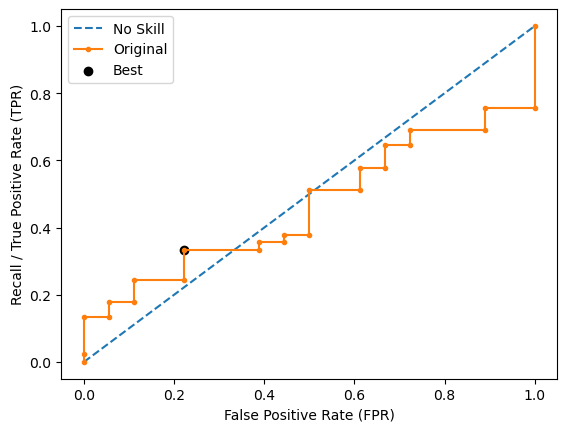

Learning rate set to 0.005871
0:	learn: 0.6915648	total: 2.76ms	remaining: 2.76s
1:	learn: 0.6899389	total: 5.34ms	remaining: 2.67s
2:	learn: 0.6887184	total: 7.51ms	remaining: 2.5s
3:	learn: 0.6865389	total: 9.27ms	remaining: 2.31s
4:	learn: 0.6848849	total: 12.3ms	remaining: 2.44s
5:	learn: 0.6821485	total: 14.7ms	remaining: 2.43s
6:	learn: 0.6814004	total: 16.5ms	remaining: 2.33s
7:	learn: 0.6798067	total: 18.1ms	remaining: 2.25s
8:	learn: 0.6763438	total: 21ms	remaining: 2.31s
9:	learn: 0.6737510	total: 23.6ms	remaining: 2.33s
10:	learn: 0.6712440	total: 25.7ms	remaining: 2.31s
11:	learn: 0.6693251	total: 27.4ms	remaining: 2.25s
12:	learn: 0.6670174	total: 29.4ms	remaining: 2.23s
13:	learn: 0.6637791	total: 31.4ms	remaining: 2.21s
14:	learn: 0.6619915	total: 32.8ms	remaining: 2.16s
15:	learn: 0.6610868	total: 34.4ms	remaining: 2.12s
16:	learn: 0.6590196	total: 35.8ms	remaining: 2.07s
17:	learn: 0.6564610	total: 37.4ms	remaining: 2.04s
18:	learn: 0.6551558	total: 38.8ms	remaining: 2

232:	learn: 0.3839584	total: 373ms	remaining: 1.23s
233:	learn: 0.3830615	total: 375ms	remaining: 1.23s
234:	learn: 0.3822578	total: 377ms	remaining: 1.23s
235:	learn: 0.3818704	total: 378ms	remaining: 1.22s
236:	learn: 0.3806380	total: 380ms	remaining: 1.22s
237:	learn: 0.3794524	total: 381ms	remaining: 1.22s
238:	learn: 0.3786729	total: 383ms	remaining: 1.22s
239:	learn: 0.3777851	total: 385ms	remaining: 1.22s
240:	learn: 0.3768951	total: 386ms	remaining: 1.22s
241:	learn: 0.3763473	total: 388ms	remaining: 1.21s
242:	learn: 0.3758433	total: 389ms	remaining: 1.21s
243:	learn: 0.3748926	total: 391ms	remaining: 1.21s
244:	learn: 0.3744779	total: 392ms	remaining: 1.21s
245:	learn: 0.3739454	total: 394ms	remaining: 1.21s
246:	learn: 0.3737446	total: 395ms	remaining: 1.2s
247:	learn: 0.3730154	total: 397ms	remaining: 1.2s
248:	learn: 0.3723924	total: 398ms	remaining: 1.2s
249:	learn: 0.3711998	total: 400ms	remaining: 1.2s
250:	learn: 0.3707528	total: 401ms	remaining: 1.2s
251:	learn: 0.370

461:	learn: 0.2527703	total: 760ms	remaining: 886ms
462:	learn: 0.2523766	total: 763ms	remaining: 884ms
463:	learn: 0.2521979	total: 764ms	remaining: 883ms
464:	learn: 0.2515643	total: 766ms	remaining: 881ms
465:	learn: 0.2512363	total: 768ms	remaining: 880ms
466:	learn: 0.2506050	total: 770ms	remaining: 878ms
467:	learn: 0.2503505	total: 771ms	remaining: 877ms
468:	learn: 0.2497676	total: 773ms	remaining: 875ms
469:	learn: 0.2492463	total: 775ms	remaining: 874ms
470:	learn: 0.2488749	total: 777ms	remaining: 872ms
471:	learn: 0.2482627	total: 778ms	remaining: 871ms
472:	learn: 0.2477782	total: 780ms	remaining: 869ms
473:	learn: 0.2474457	total: 782ms	remaining: 868ms
474:	learn: 0.2471669	total: 784ms	remaining: 866ms
475:	learn: 0.2464567	total: 785ms	remaining: 865ms
476:	learn: 0.2461113	total: 787ms	remaining: 863ms
477:	learn: 0.2455716	total: 789ms	remaining: 861ms
478:	learn: 0.2453060	total: 790ms	remaining: 860ms
479:	learn: 0.2448607	total: 792ms	remaining: 858ms
480:	learn: 

689:	learn: 0.1754808	total: 1.16s	remaining: 521ms
690:	learn: 0.1752292	total: 1.16s	remaining: 519ms
691:	learn: 0.1749969	total: 1.16s	remaining: 518ms
692:	learn: 0.1748912	total: 1.16s	remaining: 516ms
693:	learn: 0.1745577	total: 1.17s	remaining: 514ms
694:	learn: 0.1740965	total: 1.17s	remaining: 513ms
695:	learn: 0.1736746	total: 1.17s	remaining: 511ms
696:	learn: 0.1733791	total: 1.17s	remaining: 510ms
697:	learn: 0.1731470	total: 1.17s	remaining: 508ms
698:	learn: 0.1729414	total: 1.18s	remaining: 506ms
699:	learn: 0.1728483	total: 1.18s	remaining: 505ms
700:	learn: 0.1727136	total: 1.18s	remaining: 503ms
701:	learn: 0.1723682	total: 1.18s	remaining: 501ms
702:	learn: 0.1721368	total: 1.18s	remaining: 500ms
703:	learn: 0.1718225	total: 1.18s	remaining: 498ms
704:	learn: 0.1715645	total: 1.19s	remaining: 496ms
705:	learn: 0.1713360	total: 1.19s	remaining: 494ms
706:	learn: 0.1711064	total: 1.19s	remaining: 493ms
707:	learn: 0.1708940	total: 1.19s	remaining: 491ms
708:	learn: 

909:	learn: 0.1231584	total: 1.55s	remaining: 153ms
910:	learn: 0.1229409	total: 1.55s	remaining: 151ms
911:	learn: 0.1227446	total: 1.55s	remaining: 150ms
912:	learn: 0.1225015	total: 1.55s	remaining: 148ms
913:	learn: 0.1222412	total: 1.55s	remaining: 146ms
914:	learn: 0.1220415	total: 1.55s	remaining: 145ms
915:	learn: 0.1219763	total: 1.56s	remaining: 143ms
916:	learn: 0.1218617	total: 1.56s	remaining: 141ms
917:	learn: 0.1216188	total: 1.56s	remaining: 139ms
918:	learn: 0.1214867	total: 1.56s	remaining: 138ms
919:	learn: 0.1213176	total: 1.56s	remaining: 136ms
920:	learn: 0.1210858	total: 1.57s	remaining: 134ms
921:	learn: 0.1208784	total: 1.57s	remaining: 133ms
922:	learn: 0.1207119	total: 1.57s	remaining: 131ms
923:	learn: 0.1205216	total: 1.57s	remaining: 129ms
924:	learn: 0.1202632	total: 1.57s	remaining: 128ms
925:	learn: 0.1200703	total: 1.57s	remaining: 126ms
926:	learn: 0.1198859	total: 1.58s	remaining: 124ms
927:	learn: 0.1197853	total: 1.58s	remaining: 122ms
928:	learn: 

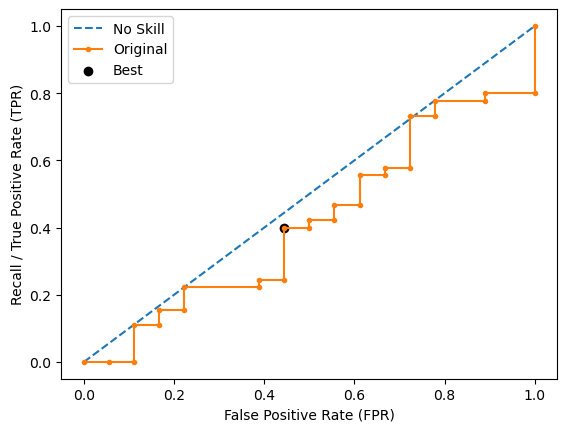

Learning rate set to 0.005871
0:	learn: 0.6911512	total: 2.05ms	remaining: 2.05s
1:	learn: 0.6897109	total: 4.54ms	remaining: 2.27s
2:	learn: 0.6867626	total: 6.57ms	remaining: 2.18s
3:	learn: 0.6845038	total: 8.44ms	remaining: 2.1s
4:	learn: 0.6828315	total: 10.7ms	remaining: 2.14s
5:	learn: 0.6811026	total: 12.5ms	remaining: 2.07s
6:	learn: 0.6784723	total: 14.4ms	remaining: 2.04s
7:	learn: 0.6765906	total: 16.1ms	remaining: 2s
8:	learn: 0.6734889	total: 18.2ms	remaining: 2s
9:	learn: 0.6708693	total: 20ms	remaining: 1.98s
10:	learn: 0.6698517	total: 22ms	remaining: 1.98s
11:	learn: 0.6687376	total: 23.5ms	remaining: 1.93s
12:	learn: 0.6674202	total: 25ms	remaining: 1.9s
13:	learn: 0.6656765	total: 26.8ms	remaining: 1.89s
14:	learn: 0.6627824	total: 28.6ms	remaining: 1.88s
15:	learn: 0.6610167	total: 30.2ms	remaining: 1.86s
16:	learn: 0.6598151	total: 31.8ms	remaining: 1.84s
17:	learn: 0.6583904	total: 33.5ms	remaining: 1.82s
18:	learn: 0.6574815	total: 34.8ms	remaining: 1.8s
19:	lea

222:	learn: 0.3850582	total: 374ms	remaining: 1.3s
223:	learn: 0.3841849	total: 376ms	remaining: 1.3s
224:	learn: 0.3831985	total: 378ms	remaining: 1.3s
225:	learn: 0.3829922	total: 380ms	remaining: 1.3s
226:	learn: 0.3819661	total: 381ms	remaining: 1.3s
227:	learn: 0.3804075	total: 383ms	remaining: 1.3s
228:	learn: 0.3792338	total: 385ms	remaining: 1.29s
229:	learn: 0.3776309	total: 387ms	remaining: 1.29s
230:	learn: 0.3767830	total: 388ms	remaining: 1.29s
231:	learn: 0.3759874	total: 390ms	remaining: 1.29s
232:	learn: 0.3747620	total: 392ms	remaining: 1.29s
233:	learn: 0.3735890	total: 393ms	remaining: 1.29s
234:	learn: 0.3726342	total: 395ms	remaining: 1.29s
235:	learn: 0.3720890	total: 397ms	remaining: 1.28s
236:	learn: 0.3708554	total: 399ms	remaining: 1.28s
237:	learn: 0.3700681	total: 400ms	remaining: 1.28s
238:	learn: 0.3693430	total: 402ms	remaining: 1.28s
239:	learn: 0.3681208	total: 404ms	remaining: 1.28s
240:	learn: 0.3676732	total: 405ms	remaining: 1.28s
241:	learn: 0.3671

436:	learn: 0.2486951	total: 762ms	remaining: 981ms
437:	learn: 0.2480379	total: 764ms	remaining: 980ms
438:	learn: 0.2475464	total: 766ms	remaining: 979ms
439:	learn: 0.2470602	total: 768ms	remaining: 977ms
440:	learn: 0.2467178	total: 769ms	remaining: 975ms
441:	learn: 0.2460534	total: 771ms	remaining: 973ms
442:	learn: 0.2454521	total: 773ms	remaining: 972ms
443:	learn: 0.2453397	total: 775ms	remaining: 970ms
444:	learn: 0.2451369	total: 777ms	remaining: 969ms
445:	learn: 0.2444215	total: 779ms	remaining: 968ms
446:	learn: 0.2440465	total: 781ms	remaining: 966ms
447:	learn: 0.2433408	total: 783ms	remaining: 964ms
448:	learn: 0.2427517	total: 785ms	remaining: 963ms
449:	learn: 0.2422400	total: 786ms	remaining: 961ms
450:	learn: 0.2420414	total: 788ms	remaining: 959ms
451:	learn: 0.2417365	total: 790ms	remaining: 958ms
452:	learn: 0.2414986	total: 792ms	remaining: 956ms
453:	learn: 0.2409194	total: 794ms	remaining: 954ms
454:	learn: 0.2407128	total: 795ms	remaining: 953ms
455:	learn: 

646:	learn: 0.1754215	total: 1.15s	remaining: 627ms
647:	learn: 0.1750221	total: 1.15s	remaining: 625ms
648:	learn: 0.1748072	total: 1.15s	remaining: 624ms
649:	learn: 0.1745275	total: 1.15s	remaining: 622ms
650:	learn: 0.1741509	total: 1.16s	remaining: 620ms
651:	learn: 0.1738411	total: 1.16s	remaining: 618ms
652:	learn: 0.1736213	total: 1.16s	remaining: 616ms
653:	learn: 0.1734278	total: 1.16s	remaining: 614ms
654:	learn: 0.1732067	total: 1.16s	remaining: 613ms
655:	learn: 0.1729499	total: 1.17s	remaining: 611ms
656:	learn: 0.1726088	total: 1.17s	remaining: 609ms
657:	learn: 0.1722610	total: 1.17s	remaining: 607ms
658:	learn: 0.1720362	total: 1.17s	remaining: 606ms
659:	learn: 0.1717390	total: 1.17s	remaining: 604ms
660:	learn: 0.1716379	total: 1.17s	remaining: 602ms
661:	learn: 0.1714999	total: 1.18s	remaining: 600ms
662:	learn: 0.1711985	total: 1.18s	remaining: 599ms
663:	learn: 0.1708106	total: 1.18s	remaining: 597ms
664:	learn: 0.1705953	total: 1.18s	remaining: 595ms
665:	learn: 

855:	learn: 0.1258592	total: 1.53s	remaining: 258ms
856:	learn: 0.1256070	total: 1.54s	remaining: 257ms
857:	learn: 0.1253688	total: 1.54s	remaining: 255ms
858:	learn: 0.1251055	total: 1.54s	remaining: 253ms
859:	learn: 0.1247683	total: 1.54s	remaining: 251ms
860:	learn: 0.1246286	total: 1.54s	remaining: 249ms
861:	learn: 0.1244871	total: 1.55s	remaining: 248ms
862:	learn: 0.1243700	total: 1.55s	remaining: 246ms
863:	learn: 0.1242116	total: 1.55s	remaining: 244ms
864:	learn: 0.1240383	total: 1.55s	remaining: 242ms
865:	learn: 0.1238757	total: 1.55s	remaining: 241ms
866:	learn: 0.1236553	total: 1.56s	remaining: 239ms
867:	learn: 0.1235253	total: 1.56s	remaining: 237ms
868:	learn: 0.1232441	total: 1.56s	remaining: 235ms
869:	learn: 0.1230977	total: 1.56s	remaining: 233ms
870:	learn: 0.1228719	total: 1.56s	remaining: 232ms
871:	learn: 0.1226468	total: 1.56s	remaining: 230ms
872:	learn: 0.1224637	total: 1.57s	remaining: 228ms
873:	learn: 0.1222596	total: 1.57s	remaining: 226ms
874:	learn: 

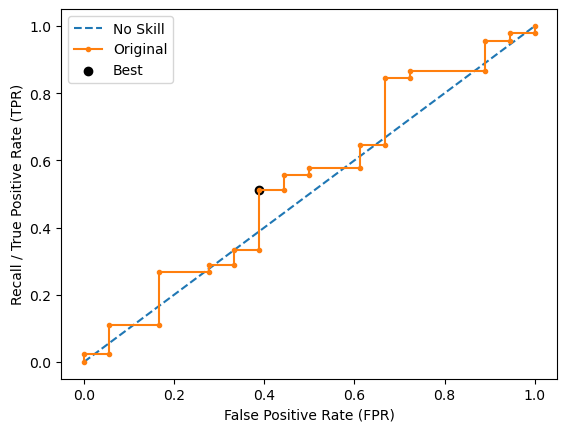

Ave Test Accuracy: 0.6476190476190475
Stdev Test Accuracy: 0.026082026547865057
Ave Test Recall: 0.15555555555555553
Stdev Test Recall: 0.06085806194501845
Ave Test F-0.5 Score: 0.24195982816672465
Stdev Test F-0.5 Score: 0.08497589260687165
Ave Test F-0.75 Score: 0.21746011104024024
Stdev Test F-0.75 Score: 0.0781441465398182
Ave Test F-1 Score: 0.19989417989417987
Stdev Test F-1 Score: 0.07330324554361997
Ave Test F-1.5 Score: 0.18005686282914005
Stdev Test F-1.5 Score: 0.06781129777844352
Ave Test F-2 Score: 0.17062416655912588
Stdev Test F-2 Score: 0.06516524491789506
Ave Test G-mean: 0.3552901416071791
Stdev Test G-mean: 0.08195923947575702
Ave Test Specificity: 0.8444444444444444
Stdev Test Specificity: 0.022222222222222254
Ave Test Precision: 0.2822222222222222
Ave Test NPV: 0.7144201915567066
Ave Runtime: 1.810790491104126


In [121]:
ld_t02_catboost_gs, ld_t02_catboost_be, ld_t02_catboost_model_info, ld_t02_catboost_metrics_df = catboost_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 8, 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.7230994152046784
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=8))])
Mean Train Score (Recall) 0.6919735004060795
Std Train Score (Recall) 0.02638028441651546
GridSearchCV Runtime: 32.402100801467896 secs
Run 1 - Random State: 0
Test Accuracy: 0.6984126984126984
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.125
Best Recall=0.178
Best G-Mean=0.422


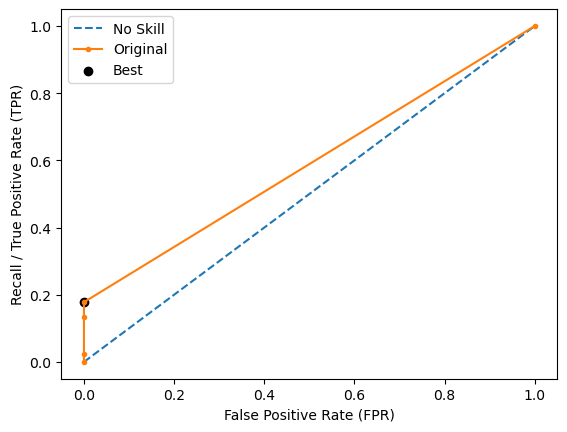

Run 2 - Random State: 1
Test Accuracy: 0.6507936507936508
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.375
Best Recall=0.178
Best G-Mean=0.422


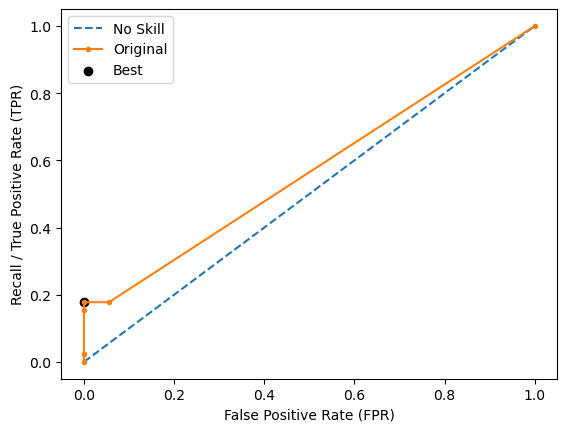

Run 3 - Random State: 2
Test Accuracy: 0.7142857142857143
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.19230769230769232
Test F-0.75 Score: 0.12886597938144329
Test F-1 Score: 0.09999999999999999
Test F-1.5 Score: 0.07647058823529411
Test F-2 Score: 0.06756756756756757
Test G-Mean Score: 0.2330686329267003
Best Threshold=0.125
Best Recall=0.133
Best G-Mean=0.344


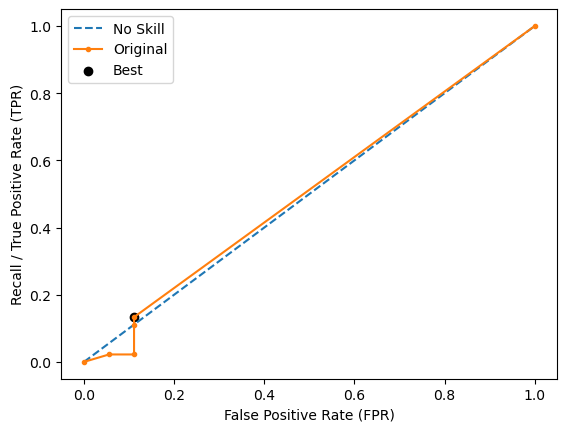

Run 4 - Random State: 3
Test Accuracy: 0.6825396825396826
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.500
Best Recall=0.089
Best G-Mean=0.290


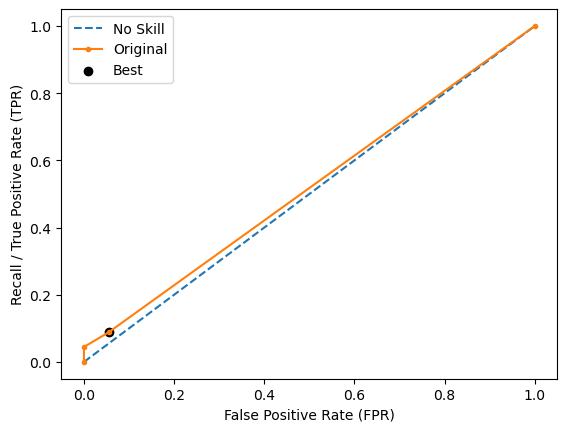

Run 5 - Random State: 4
Test Accuracy: 0.6984126984126984
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.625
Best Recall=0.022
Best G-Mean=0.149


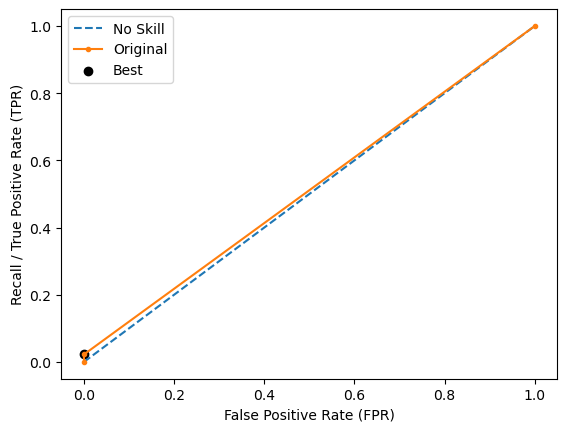

Ave Test Accuracy: 0.6888888888888889
Stdev Test Accuracy: 0.024072620457306498
Ave Test Recall: 0.01111111111111111
Stdev Test Recall: 0.02484519974999766
Ave Test F-0.5 Score: 0.038461538461538464
Stdev Test F-0.5 Score: 0.08600261451922268
Ave Test F-0.75 Score: 0.02577319587628866
Stdev Test F-0.75 Score: 0.0576306179767987
Ave Test F-1 Score: 0.019999999999999997
Stdev Test F-1 Score: 0.04472135954999579
Ave Test F-1.5 Score: 0.015294117647058823
Stdev Test F-1.5 Score: 0.034198686714702664
Ave Test F-2 Score: 0.013513513513513514
Stdev Test F-2 Score: 0.030217134831078244
Ave Test G-mean: 0.04661372658534006
Stdev Test G-mean: 0.10423146132940954
Ave Test Specificity: 0.96
Stdev Test Specificity: 0.028974232912011764
Ave Test Precision: 0.1
Ave Test NPV: 0.7080999202287375
Ave Runtime: 0.010556459426879883


In [122]:
ld_t02_knn_gs, ld_t02_knn_be, ld_t02_knn_model_info, ld_t02_knn_metrics_df = knn_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.6692982456140351
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', imp

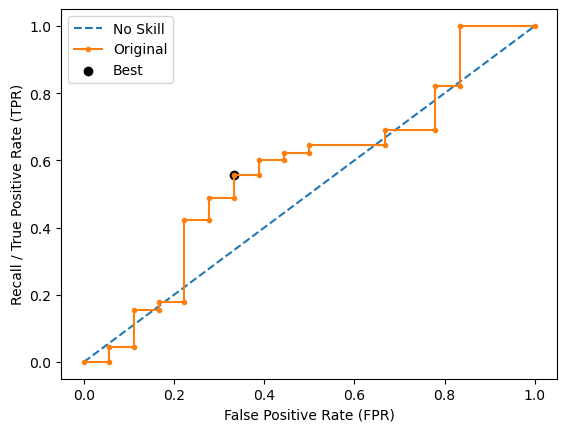

Run 2 - Random State: 1
Test Accuracy: 0.5873015873015873
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.2027027027027027
Test F-0.75 Score: 0.19430051813471502
Test F-1 Score: 0.1875
Test F-1.5 Score: 0.17889908256880735
Test F-2 Score: 0.1744186046511628
Test G-Mean Score: 0.35486043161491804
Best Threshold=0.454
Best Recall=0.289
Best G-Mean=0.474


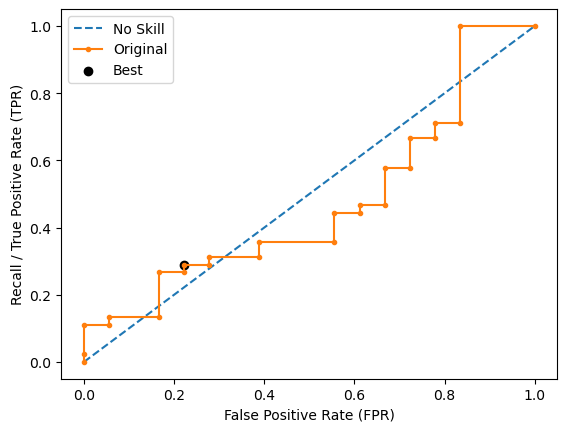

Run 3 - Random State: 2
Test Accuracy: 0.5714285714285714
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.23255813953488375
Test F-0.75 Score: 0.2304147465437788
Test F-1 Score: 0.22857142857142856
Test F-1.5 Score: 0.2260869565217391
Test F-2 Score: 0.22471910112359555
Test G-Mean Score: 0.3975231959999626
Best Threshold=0.394
Best Recall=0.378
Best G-Mean=0.502


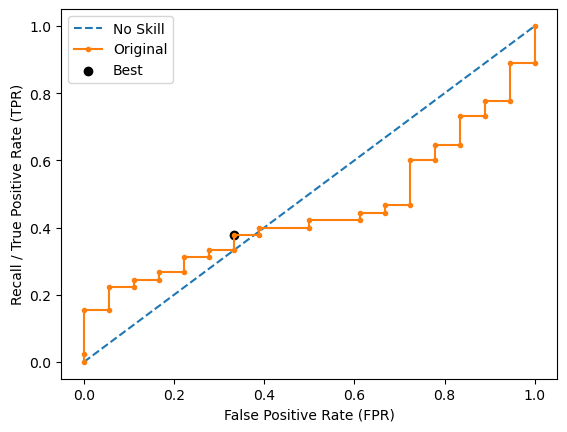

Run 4 - Random State: 3
Test Accuracy: 0.6349206349206349
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.24193548387096772
Test F-0.75 Score: 0.22189349112426032
Test F-1 Score: 0.20689655172413793
Test F-1.5 Score: 0.18932038834951456
Test F-2 Score: 0.18072289156626503
Test G-Mean Score: 0.3701851388657263
Best Threshold=0.170
Best Recall=0.511
Best G-Mean=0.477


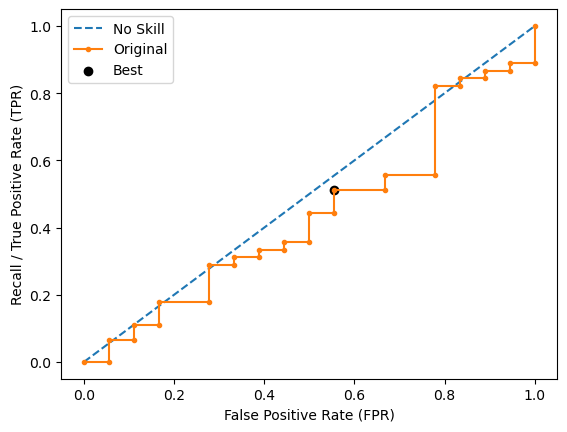

Run 5 - Random State: 4
Test Accuracy: 0.6349206349206349
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.28571428571428575
Test F-0.75 Score: 0.2702702702702703
Test F-1 Score: 0.2580645161290323
Test F-1.5 Score: 0.24299065420560748
Test F-2 Score: 0.2352941176470588
Test G-Mean Score: 0.4216370213557839
Best Threshold=0.325
Best Recall=0.400
Best G-Mean=0.494


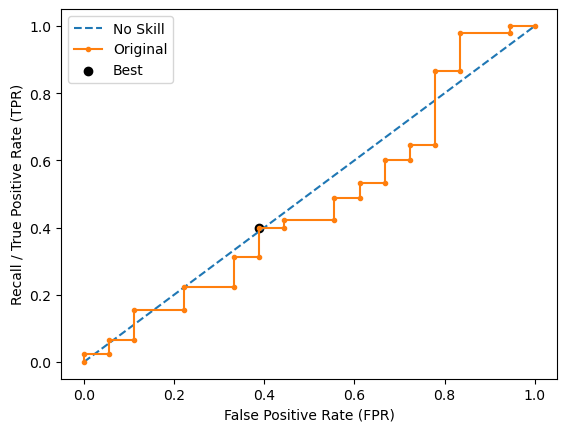

Ave Test Accuracy: 0.6095238095238096
Stdev Test Accuracy: 0.02883476527711896
Ave Test Recall: 0.19999999999999998
Stdev Test Recall: 0.03042903097250923
Ave Test F-0.5 Score: 0.24663617641862207
Stdev Test F-0.5 Score: 0.03254269028517464
Ave Test F-0.75 Score: 0.23518927671719556
Stdev Test F-0.75 Score: 0.0302997668410425
Ave Test F-1 Score: 0.22620649928491976
Stdev Test F-1 Score: 0.029401207312549717
Ave Test F-1.5 Score: 0.21516583834748232
Stdev Test F-1.5 Score: 0.029252088452146458
Ave Test F-2 Score: 0.2095425709045932
Stdev Test F-2 Score: 0.029527328659351617
Ave Test G-mean: 0.39198909949558797
Stdev Test G-mean: 0.02884296991814076
Ave Test Specificity: 0.7733333333333332
Stdev Test Specificity: 0.0427452979148252
Ave Test Precision: 0.26314273961332785
Ave Test NPV: 0.7070707801515255
Ave Runtime: 0.12881484031677246


In [123]:
ld_t02_xgb_gs, ld_t02_xgb_be, ld_t02_xgb_model_info, ld_t02_xgb_metrics_df = xgb_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.6643274853801169
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.8961764995939203
Std Train Score (Recall) 0.013161267443755557
GridSearchCV Runtime: 56.54670453071594 secs
Run 1 - Random State: 0
Test Accuracy: 0.6507936507936508
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.11904761904761904
Test F-0.75 Score: 0.09689922480

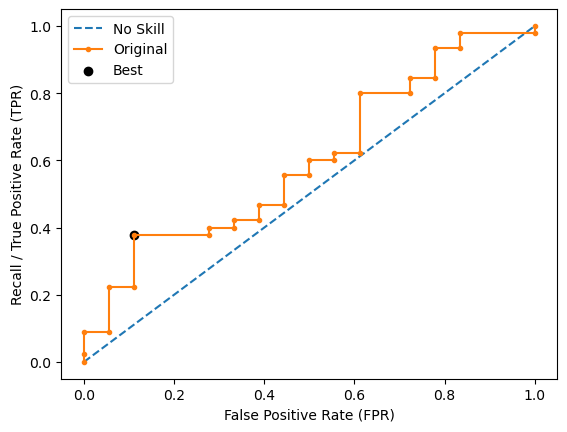

Run 2 - Random State: 1
Test Accuracy: 0.5873015873015873
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.1515151515151515
Test F-0.75 Score: 0.14124293785310732
Test F-1 Score: 0.13333333333333333
Test F-1.5 Score: 0.12380952380952379
Test F-2 Score: 0.11904761904761904
Test G-Mean Score: 0.29397236789606557
Best Threshold=0.176
Best Recall=0.467
Best G-Mean=0.581


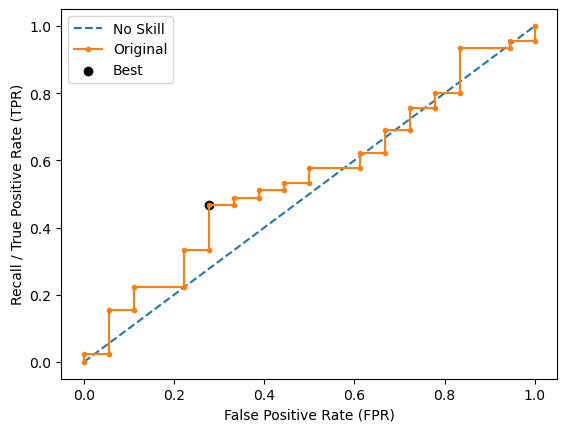

Run 3 - Random State: 2
Test Accuracy: 0.5714285714285714
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.23255813953488375
Test F-0.75 Score: 0.2304147465437788
Test F-1 Score: 0.22857142857142856
Test F-1.5 Score: 0.2260869565217391
Test F-2 Score: 0.22471910112359555
Test G-Mean Score: 0.3975231959999626
Best Threshold=0.417
Best Recall=0.378
Best G-Mean=0.542


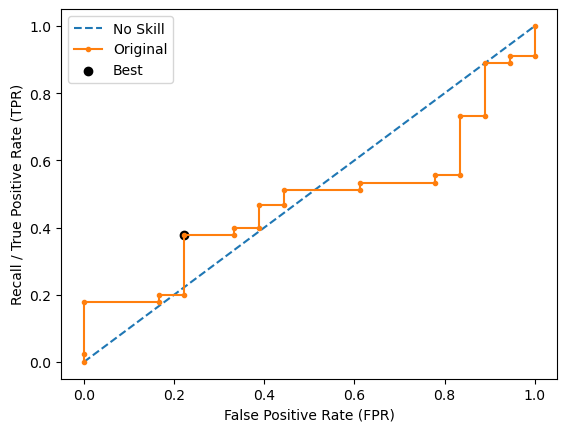

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.303030303030303
Test F-0.75 Score: 0.28248587570621464
Test F-1 Score: 0.26666666666666666
Test F-1.5 Score: 0.24761904761904757
Test F-2 Score: 0.23809523809523808
Test G-Mean Score: 0.4274529791482521
Best Threshold=0.097
Best Recall=0.511
Best G-Mean=0.533


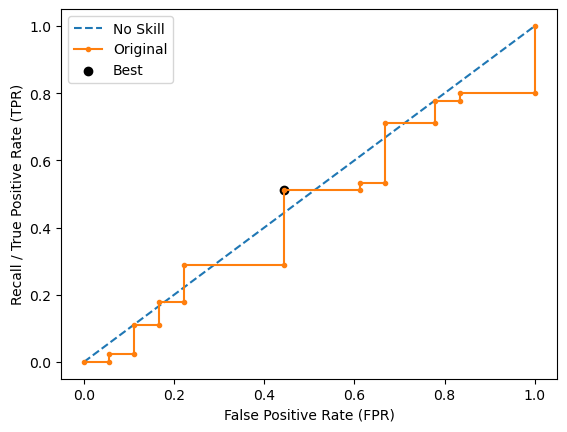

Run 5 - Random State: 4
Test Accuracy: 0.6190476190476191
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.1724137931034483
Test F-0.75 Score: 0.15527950310559008
Test F-1 Score: 0.14285714285714285
Test F-1.5 Score: 0.1287128712871287
Test F-2 Score: 0.1219512195121951
Test G-Mean Score: 0.30225490019412093
Best Threshold=0.329
Best Recall=0.489
Best G-Mean=0.594


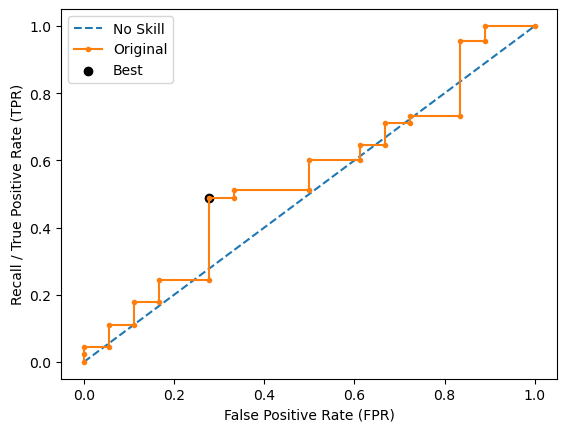

Ave Test Accuracy: 0.6158730158730159
Stdev Test Accuracy: 0.03619604524124249
Ave Test Recall: 0.14444444444444443
Stdev Test Recall: 0.07453559924999298
Ave Test F-0.5 Score: 0.19571300124628113
Stdev Test F-0.5 Score: 0.07288424268371485
Ave Test F-0.75 Score: 0.1812644576029785
Stdev Test F-0.75 Score: 0.07425624349839101
Ave Test F-1 Score: 0.1709523809523809
Stdev Test F-1 Score: 0.07477100338932068
Ave Test F-1.5 Score: 0.15922417447114373
Stdev Test F-1.5 Score: 0.07491591151492487
Ave Test F-2 Score: 0.15358314837624237
Stdev Test F-2 Score: 0.07483761379408825
Ave Test G-mean: 0.3286851330921247
Stdev Test G-mean: 0.08326411440254826
Ave Test Specificity: 0.8044444444444444
Stdev Test Specificity: 0.06554613868334497
Ave Test Precision: 0.22039215686274508
Ave Test NPV: 0.7014568946614957
Ave Runtime: 0.380472993850708


In [124]:
ld_t02_gbm_gs, ld_t02_gbm_be, ld_t02_gbm_model_info, ld_t02_gbm_metrics_df = gbm_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': SMOTE(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.674561403508772
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=2, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Recall) 0.7808085914839309
Std Train Score (Recall) 0.030328564607382338
GridSearchCV Runtime: 442.9794981479645 secs
Run 1 - Random State: 0
Test Accuracy: 0.6031746031746031
Test Recall: 0.2222222222222222

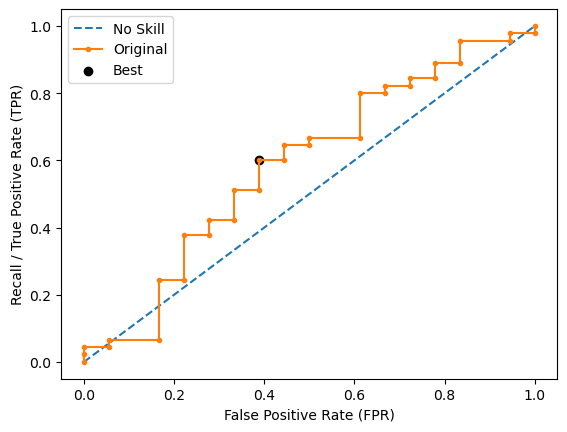

Run 2 - Random State: 1
Test Accuracy: 0.5873015873015873
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.1515151515151515
Test F-0.75 Score: 0.14124293785310732
Test F-1 Score: 0.13333333333333333
Test F-1.5 Score: 0.12380952380952379
Test F-2 Score: 0.11904761904761904
Test G-Mean Score: 0.29397236789606557
Best Threshold=0.437
Best Recall=0.467
Best G-Mean=0.558


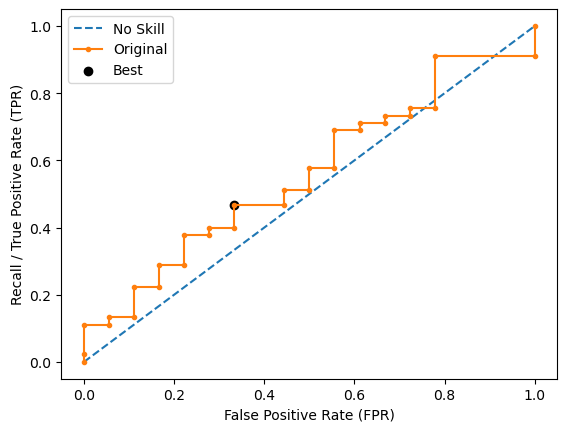

Run 3 - Random State: 2
Test Accuracy: 0.6031746031746031
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.09259259259259259
Test F-0.75 Score: 0.08169934640522876
Test F-1 Score: 0.07407407407407407
Test F-1.5 Score: 0.06565656565656565
Test F-2 Score: 0.06172839506172839
Test G-Mean Score: 0.21372648957412602
Best Threshold=0.445
Best Recall=0.422
Best G-Mean=0.573


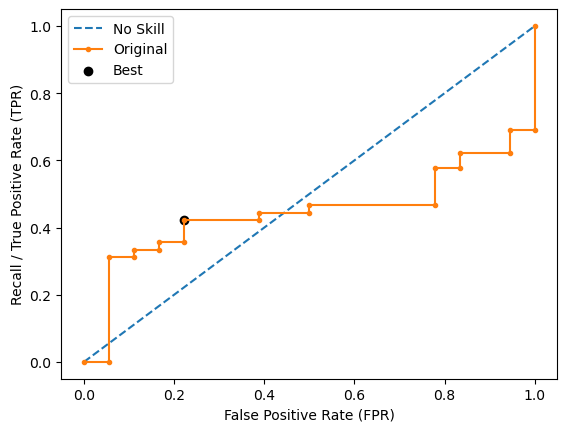

Run 4 - Random State: 3
Test Accuracy: 0.6825396825396826
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.14705882352941177
Test F-0.75 Score: 0.11061946902654866
Test F-1 Score: 0.0909090909090909
Test F-1.5 Score: 0.07303370786516854
Test F-2 Score: 0.06578947368421052
Test G-Mean Score: 0.2277100170213244
Best Threshold=0.445
Best Recall=0.378
Best G-Mean=0.522


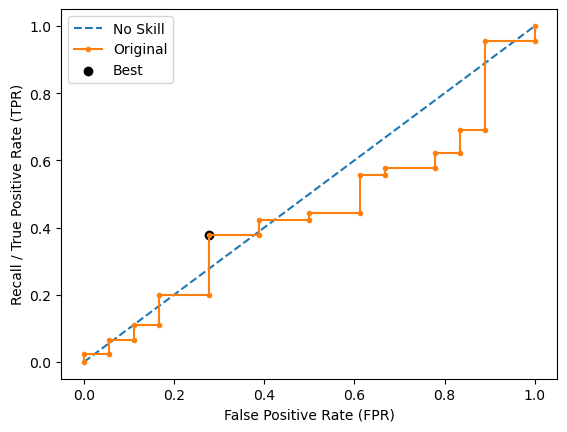

Run 5 - Random State: 4
Test Accuracy: 0.6507936507936508
Test Recall: 0.3333333333333333
Test F-0.5 Score: 0.36585365853658536
Test F-0.75 Score: 0.35885167464114837
Test F-1 Score: 0.35294117647058826
Test F-1.5 Score: 0.3451327433628319
Test F-2 Score: 0.34090909090909094
Test G-Mean Score: 0.5091750772173155
Best Threshold=0.413
Best Recall=0.756
Best G-Mean=0.648


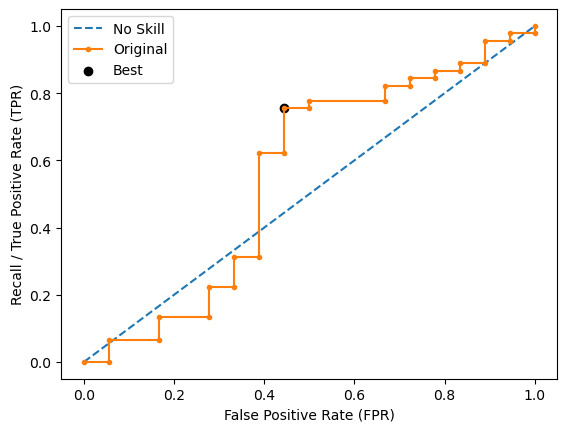

Ave Test Accuracy: 0.6253968253968254
Stdev Test Accuracy: 0.0398409536444798
Ave Test Recall: 0.15555555555555553
Stdev Test Recall: 0.12044157438154887
Ave Test F-0.5 Score: 0.20268609651679953
Stdev Test F-0.5 Score: 0.10879266676851754
Ave Test F-0.75 Score: 0.18823392936630112
Stdev Test F-0.75 Score: 0.1144062253962275
Ave Test F-1 Score: 0.1787363834422658
Stdev Test F-1 Score: 0.11740179148008559
Ave Test F-1.5 Score: 0.16837335498566483
Stdev Test F-1.5 Score: 0.11959082214691448
Ave Test F-2 Score: 0.16347192723478265
Stdev Test F-2 Score: 0.12016840074371492
Ave Test G-mean: 0.33086829662881423
Stdev Test G-mean: 0.12623585320823688
Ave Test Specificity: 0.8133333333333332
Stdev Test Specificity: 0.07131914015947206
Ave Test Precision: 0.2338888888888889
Ave Test NPV: 0.7072676572331862
Ave Runtime: 0.3714106559753418


In [125]:
ld_t02_rf_gs, ld_t02_rf_be, ld_t02_rf_model_info, ld_t02_rf_metrics_df = rf_class2(ld_t02, "accuracy",
                                                            'ageing_class', random_state=0)

In [126]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t02_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t02_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t02_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
6,LightGBM,0.432696,0.067438,0.675146,0.810874,0.244444,0.063343,0.622222,0.057670,0.293199,0.281298,0.271933,0.260386,0.254487
7,Extreme Gradient Boosting (XGBoost),0.391989,0.028843,0.669298,0.880161,0.200000,0.030429,0.609524,0.028835,0.246636,0.235189,0.226206,0.215166,0.209543
9,CatBoost,0.355290,0.081959,0.680702,0.895394,0.155556,0.060858,0.647619,0.026082,0.241960,0.217460,0.199894,0.180057,0.170624
2,Logistic Regression,0.339693,0.101932,0.611696,0.700055,0.177778,0.099381,0.555556,0.066402,0.188996,0.184953,0.182332,0.179804,0.178838
4,Random Forest,0.330868,0.126236,0.674561,0.780809,0.155556,0.120442,0.625397,0.039841,0.202686,0.188234,0.178736,0.168373,0.163472
5,Gradient Boosting Machine (GBM),0.328685,0.083264,0.664327,0.896176,0.144444,0.074536,0.615873,0.036196,0.195713,0.181264,0.170952,0.159224,0.153583
8,AdaBoost,0.320837,0.072664,0.680702,0.896946,0.122222,0.046481,0.653968,0.049436,0.226761,0.192313,0.170358,0.147700,0.137594
3,Decision Tree,0.276999,0.176777,0.717251,0.669602,0.122222,0.106863,0.669841,0.042592,0.199362,0.172901,0.156534,0.140111,0.132945
0,k-Nearest Neighbors,0.046614,0.104231,0.723099,0.691974,0.011111,0.024845,0.688889,0.024073,0.038462,0.025773,0.020000,0.015294,0.013514
1,SVM Classifier,0.000000,0.000000,0.713158,0.596842,0.000000,0.000000,0.711111,0.007099,0.000000,0.000000,0.000000,0.000000,0.000000


## Optimizing for F0.5-Score

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': TomekLinks(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5234369079196665
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=2, random_state=0))])
Mean Train Score (Recall) 0.4848189632946563
Std Train Score (Recall) 0.04872429067358083
GridSearchCV Runtime: 60.155094146728516 secs
Run 1 - Random State: 0
Test Accuracy: 0.6031746031746031
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.29069767441860467
Test F-0.75 Score: 0.28801843317972353
Test F-1 Score: 0.28571428571428575
Test F-1.5 Score: 0.282

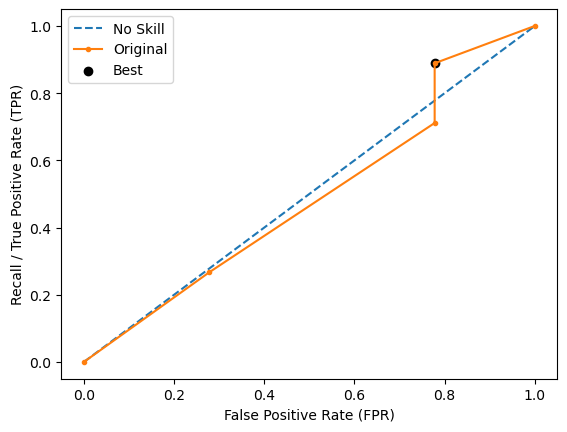

Run 2 - Random State: 1
Test Accuracy: 0.6666666666666666
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.13157894736842105
Test F-0.75 Score: 0.10330578512396695
Test F-1 Score: 0.08695652173913045
Test F-1.5 Score: 0.07142857142857142
Test F-2 Score: 0.06493506493506493
Test G-Mean Score: 0.22498285257018424
Best Threshold=0.500
Best Recall=0.200
Best G-Mean=0.380


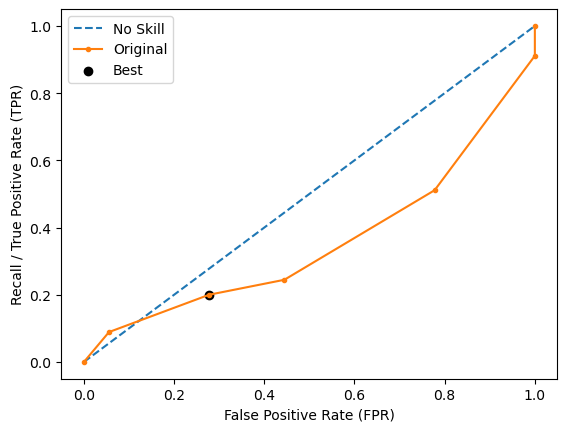

Run 3 - Random State: 2
Test Accuracy: 0.5396825396825397
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.07142857142857144
Test F-0.75 Score: 0.06756756756756757
Test F-1 Score: 0.06451612903225808
Test F-1.5 Score: 0.06074766355140187
Test F-2 Score: 0.0588235294117647
Test G-Mean Score: 0.20184335693983277
Best Threshold=0.309
Best Recall=0.467
Best G-Mean=0.558


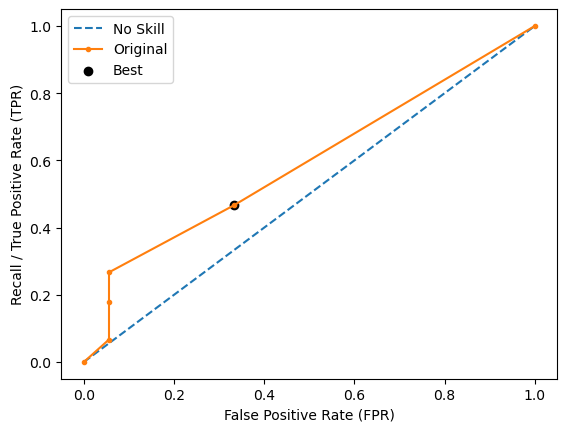

Run 4 - Random State: 3
Test Accuracy: 0.6984126984126984
Test Recall: 0.0
Test F-0.5 Score: 0.0
Test F-0.75 Score: 0.0
Test F-1 Score: 0.0
Test F-1.5 Score: 0.0
Test F-2 Score: 0.0
Test G-Mean Score: 0.0
Best Threshold=0.152
Best Recall=0.644
Best G-Mean=0.423


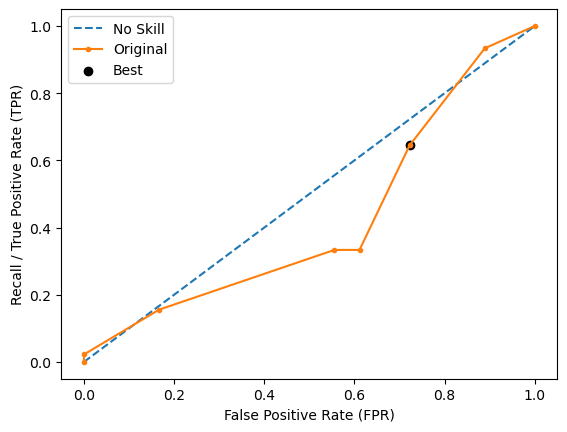

Run 5 - Random State: 4
Test Accuracy: 0.6666666666666666
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.21739130434782605
Test F-0.75 Score: 0.1824817518248175
Test F-1 Score: 0.16
Test F-1.5 Score: 0.13684210526315788
Test F-2 Score: 0.12658227848101264
Test G-Mean Score: 0.31426968052735443
Best Threshold=0.488
Best Recall=0.422
Best G-Mean=0.484


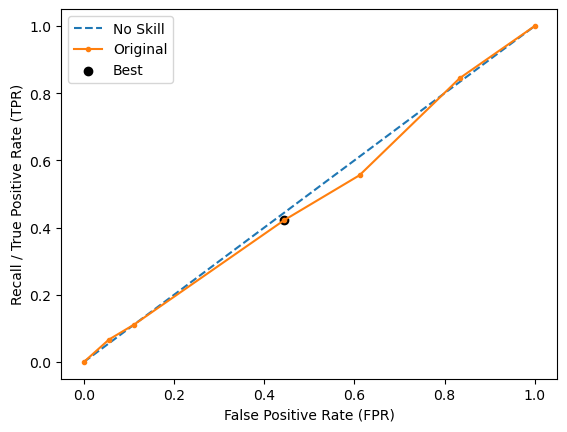

Ave Test Accuracy: 0.6349206349206349
Stdev Test Accuracy: 0.06349206349206349
Ave Test Recall: 0.1
Stdev Test Recall: 0.10686324478706302
Ave Test F-0.5 Score: 0.14221929951268467
Stdev Test F-0.5 Score: 0.11516024873621644
Ave Test F-0.75 Score: 0.1282747075392151
Stdev Test F-0.75 Score: 0.11092752820657091
Ave Test F-1 Score: 0.11943738729713485
Stdev Test F-1 Score: 0.10912146124579528
Ave Test F-1.5 Score: 0.110325407179061
Stdev Test F-1.5 Score: 0.10785091414567269
Ave Test F-2 Score: 0.10624794984646735
Stdev Test F-2 Score: 0.10742542532897266
Ave Test G-mean: 0.2384862713923183
Stdev Test G-mean: 0.16541512346274043
Ave Test Specificity: 0.8488888888888889
Stdev Test Specificity: 0.11044243235368159
Ave Test Precision: 0.17135100193923722
Ave Test NPV: 0.7016501979425035
Ave Runtime: 0.018088579177856445


In [127]:
ld_t02_dt_gs, ld_t02_dt_be, ld_t02_dt_model_info, ld_t02_dt_metrics_df = dt_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                                                   'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 100.0, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.36798818666443933
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=100.0, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Recall) 0.5540452261625066
Std Train Score (Recall) 0.039724840373635086
GridSearchCV Runtime: 21.39673137664795 secs
Run 1 - Random State: 0
Test Accuracy: 0.3968253968253968
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.22727272727272727
Test F-0.75 Score: 0.24787535410764874
Test F-1 Score: 0.2692307692307692
Test F-1.5 Score: 0.30536912751677847
Test F-2 Score: 0.33018867

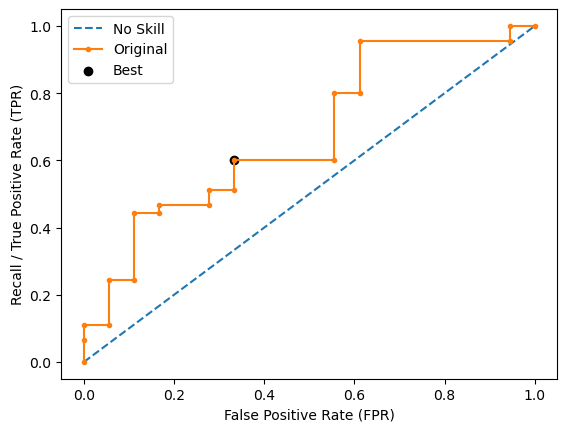

Run 2 - Random State: 1
Test Accuracy: 0.5079365079365079
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.27777777777777773
Test F-0.75 Score: 0.2946127946127946
Test F-1 Score: 0.3111111111111111
Test F-1.5 Score: 0.3370370370370371
Test F-2 Score: 0.35353535353535354
Test G-Mean Score: 0.4648111258522642
Best Threshold=0.833
Best Recall=0.400
Best G-Mean=0.537


Liblinear failed to converge, increase the number of iterations.


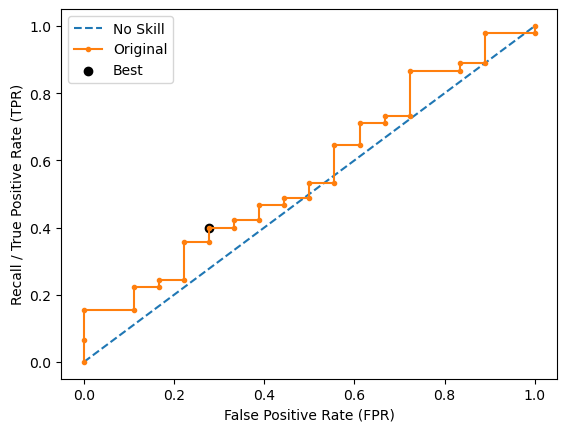

Run 3 - Random State: 2
Test Accuracy: 0.5238095238095238
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3424657534246575
Test F-0.75 Score: 0.37091988130563797
Test F-1 Score: 0.39999999999999997
Test F-1.5 Score: 0.4482758620689655
Test F-2 Score: 0.4807692307692308
Test G-Mean Score: 0.5328701692569688
Best Threshold=0.986
Best Recall=0.400
Best G-Mean=0.516


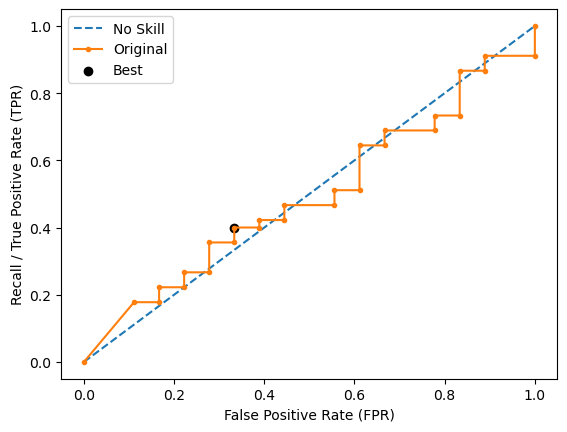

Run 4 - Random State: 3
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.975
Best Recall=0.267
Best G-Mean=0.502


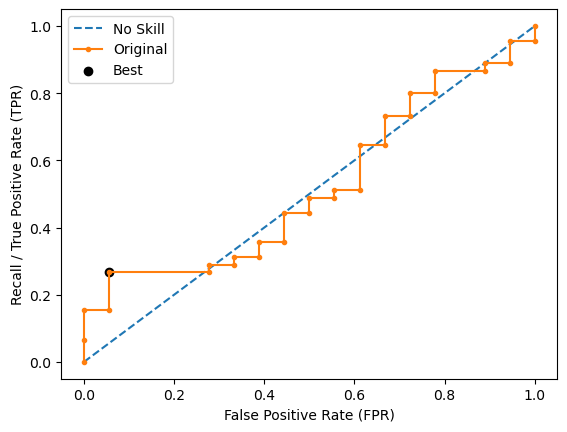

Run 5 - Random State: 4
Test Accuracy: 0.3968253968253968
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.2956989247311828
Test F-0.75 Score: 0.3297362110311751
Test F-1 Score: 0.36666666666666675
Test F-1.5 Score: 0.43333333333333335
Test F-2 Score: 0.4824561403508772
Test G-Mean Score: 0.4360314860077463
Best Threshold=0.627
Best Recall=0.644
Best G-Mean=0.628


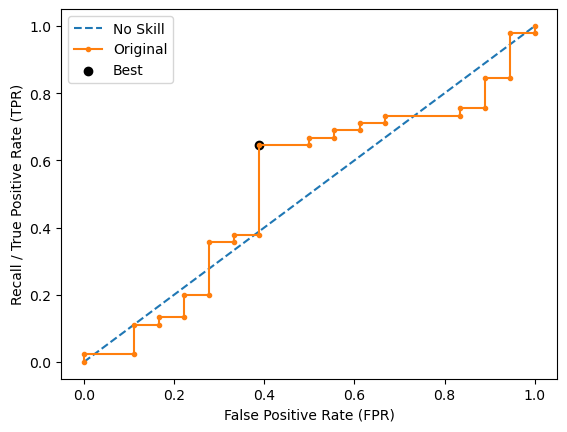

Ave Test Accuracy: 0.4666666666666666
Stdev Test Accuracy: 0.06408453726408367
Ave Test Recall: 0.48888888888888893
Stdev Test Recall: 0.09938079899999067
Ave Test F-0.5 Score: 0.29202331833140993
Stdev Test F-0.5 Score: 0.04350989306077472
Ave Test F-0.75 Score: 0.3170179059622112
Stdev Test F-0.75 Score: 0.04735829952112302
Ave Test F-1 Score: 0.3428710971568114
Stdev Test F-1 Score: 0.05210710628596298
Ave Test F-1.5 Score: 0.3866212538094047
Stdev Test F-1.5 Score: 0.0623472073984902
Ave Test F-2 Score: 0.4167685215568479
Stdev Test F-2 Score: 0.0712573847295776
Ave Test G-mean: 0.46672862591874476
Stdev Test G-mean: 0.05490108523799114
Ave Test Specificity: 0.45777777777777773
Stdev Test Specificity: 0.10012338067616719
Ave Test Precision: 0.2659737909500718
Ave Test NPV: 0.6884972500308986
Ave Runtime: 0.04890527725219727


In [128]:
ld_t02_logreg_gs, ld_t02_logreg_be, ld_t02_logreg_model_info, ld_t02_logreg_metrics_df = logreg_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 0.001, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.3839520016096111
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=0.001, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.45606956544310345
Std Train Score (Recall) 0.04656850066931189
GridSearchCV Runtime: 34.848199129104614 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.2857142857142857
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.2826086956521739
Test F-0.75 Score: 0.3217821782178218
Test F-1 Score: 0.36619718309859156
Test F-1.5 Score: 0.45187165775401067
Test F-2 

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


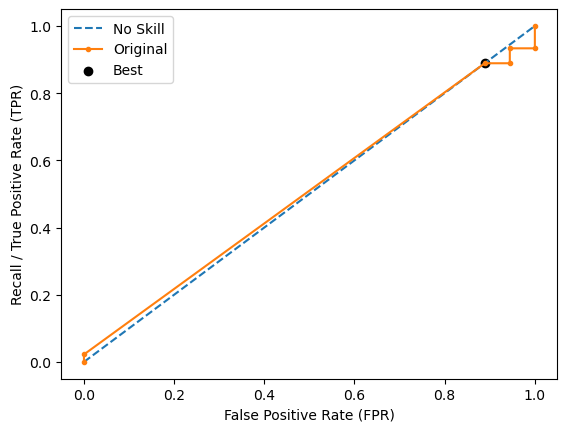

[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.31746031746031744
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3043478260869565
Test F-0.75 Score: 0.3465346534653465
Test F-1 Score: 0.39436619718309857
Test F-1.5 Score: 0.48663101604278075
Test F-2 Score: 0.5599999999999999
Test G-Mean Score: 0.32203059435976533
Best Threshold=0.515
Best Recall=0.444
Best G-Mean=0.544


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


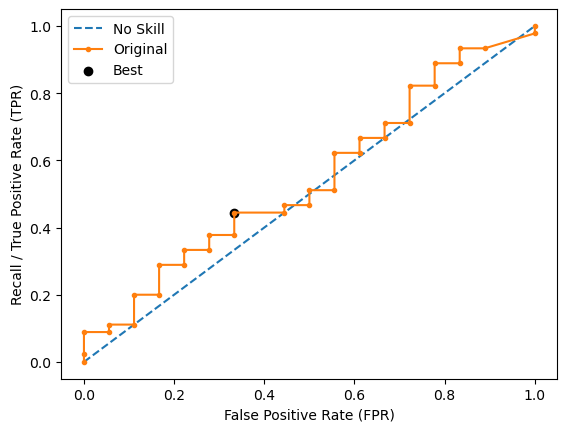

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.30158730158730157
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.27522935779816515
Test F-0.75 Score: 0.31185031185031187
Test F-1 Score: 0.3529411764705882
Test F-1.5 Score: 0.4309392265193371
Test F-2 Score: 0.4918032786885246
Test G-Mean Score: 0.32203059435976533
Best Threshold=0.506
Best Recall=0.133
Best G-Mean=0.344


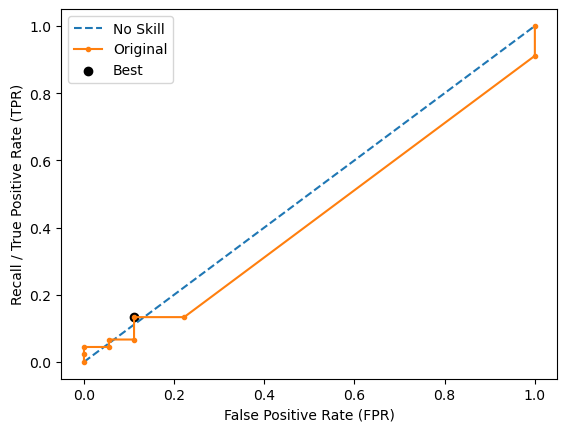

[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.30158730158730157
Test Recall: 0.8888888888888888
Test F-0.5 Score: 0.32
Test F-0.75 Score: 0.36697247706422015
Test F-1 Score: 0.42105263157894735
Test F-1.5 Score: 0.5279187817258884
Test F-2 Score: 0.6153846153846153
Test G-Mean Score: 0.24343224778007383
Best Threshold=0.475
Best Recall=0.533
Best G-Mean=0.516


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


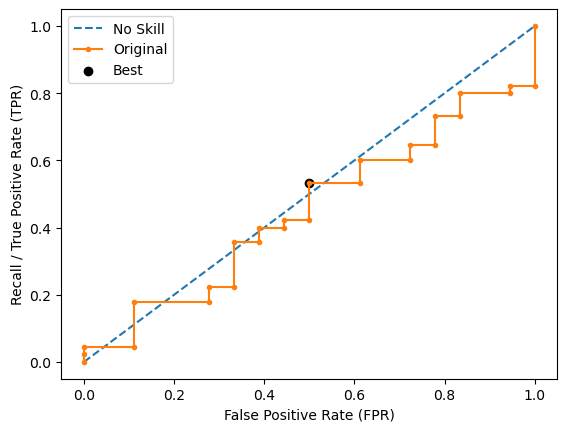

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.31746031746031744
Test Recall: 1.0
Test F-0.5 Score: 0.34351145038167935
Test F-0.75 Score: 0.39543057996485065
Test F-1 Score: 0.4556962025316456
Test F-1.5 Score: 0.5763546798029556
Test F-2 Score: 0.6766917293233082
Test G-Mean Score: 0.21081851067789198
Best Threshold=0.475
Best Recall=0.511
Best G-Mean=0.559


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


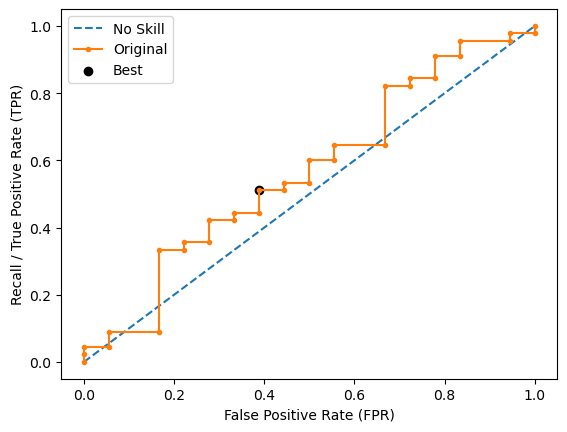

Ave Test Accuracy: 0.30476190476190473
Stdev Test Accuracy: 0.013280317881493262
Ave Test Recall: 0.8111111111111111
Stdev Test Recall: 0.1337954953199144
Ave Test F-0.5 Score: 0.305139465983795
Stdev Test F-0.5 Score: 0.027821401541874523
Ave Test F-0.75 Score: 0.34851404011251014
Stdev Test F-0.75 Score: 0.03392865672391292
Ave Test F-1 Score: 0.3980506781725742
Stdev Test F-1 Score: 0.04157879276606278
Ave Test F-1.5 Score: 0.4947430723689945
Stdev Test F-1.5 Score: 0.05859986466158525
Ave Test F-2 Score: 0.5727759246792897
Stdev Test F-2 Score: 0.07436243482825626
Ave Test G-mean: 0.27631816180875246
Stdev Test G-mean: 0.04898824339706044
Ave Test Specificity: 0.10222222222222221
Stdev Test Specificity: 0.04608098078517271
Ave Test Precision: 0.26407559968855654
Ave Test NPV: 0.6476923076923077
Ave Runtime: 0.021280860900878905


In [129]:
ld_t02_svm_gs, ld_t02_svm_be, ld_t02_svm_model_info, ld_t02_svm_metrics_df = svm_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4450086777143836
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                max_depth=3, n_estimators=200,
                                random_state=0))])
Mean Train Score (Recall) 0.7108261497715602
Std Train Score (Recall) 0.02489529327446938
GridSearchCV Runtime: 25.693055391311646 secs
Run 1 - Random State: 0
Test Accuracy: 0.5555555555555556
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.2222222222222222
Test F-0.75 Score: 0.2222222222222222
Test F-1 Score: 0.22222222

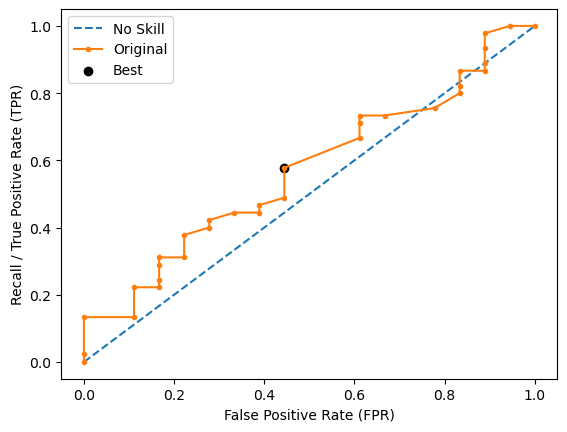

Run 2 - Random State: 1
Test Accuracy: 0.6190476190476191
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.27027027027027023
Test F-0.75 Score: 0.25906735751295334
Test F-1 Score: 0.25
Test F-1.5 Score: 0.2385321100917431
Test F-2 Score: 0.23255813953488366
Test G-Mean Score: 0.415739709641549
Best Threshold=0.433
Best Recall=0.489
Best G-Mean=0.494


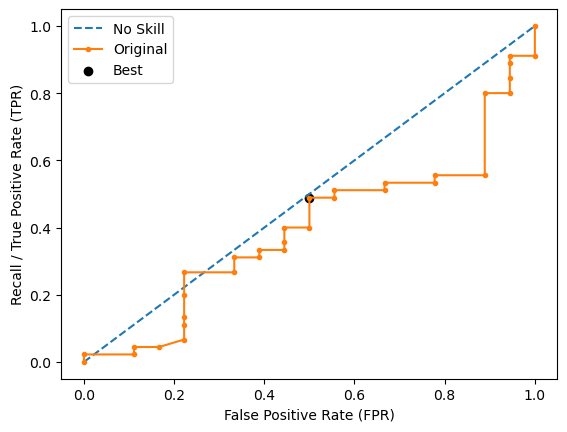

Run 3 - Random State: 2
Test Accuracy: 0.6349206349206349
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.37234042553191493
Test F-0.75 Score: 0.37553648068669526
Test F-1 Score: 0.37837837837837834
Test F-1.5 Score: 0.38235294117647056
Test F-2 Score: 0.3846153846153847
Test G-Mean Score: 0.5340273262532407
Best Threshold=0.472
Best Recall=0.333
Best G-Mean=0.408


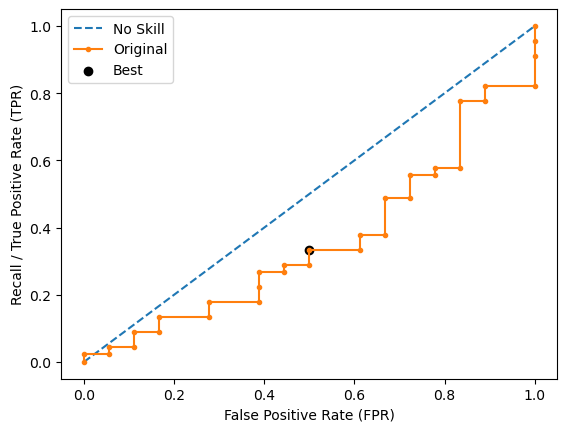

Run 4 - Random State: 3
Test Accuracy: 0.6825396825396826
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.3448275862068966
Test F-0.75 Score: 0.31055900621118016
Test F-1 Score: 0.2857142857142857
Test F-1.5 Score: 0.2574257425742574
Test F-2 Score: 0.2439024390243902
Test G-Mean Score: 0.43885372573625553
Best Threshold=0.415
Best Recall=0.533
Best G-Mean=0.455


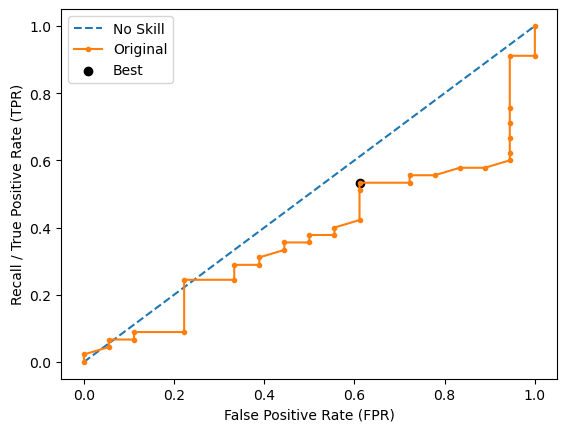

Run 5 - Random State: 4
Test Accuracy: 0.47619047619047616
Test Recall: 0.1111111111111111
Test F-0.5 Score: 0.10638297872340426
Test F-0.75 Score: 0.10729613733905578
Test F-1 Score: 0.10810810810810811
Test F-1.5 Score: 0.10924369747899157
Test F-2 Score: 0.10989010989010987
Test G-Mean Score: 0.2629368792488718
Best Threshold=0.427
Best Recall=0.756
Best G-Mean=0.680


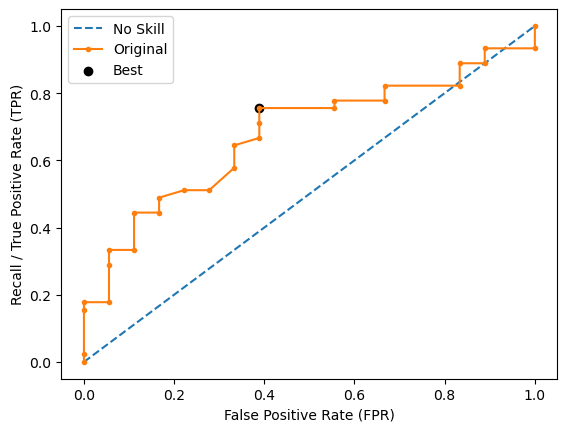

Ave Test Accuracy: 0.5936507936507937
Stdev Test Accuracy: 0.07983984977751932
Ave Test Recall: 0.2333333333333333
Stdev Test Recall: 0.09938079899999067
Ave Test F-0.5 Score: 0.26320869659094165
Stdev Test F-0.5 Score: 0.10594272048194513
Ave Test F-0.75 Score: 0.25493624079442134
Stdev Test F-0.75 Score: 0.10065185440352944
Ave Test F-1 Score: 0.2488845988845989
Stdev Test F-1 Score: 0.09830464328280031
Ave Test F-1.5 Score: 0.241955342708737
Stdev Test F-1.5 Score: 0.09742216671884434
Ave Test F-2 Score: 0.23863765905739814
Stdev Test F-2 Score: 0.09774913402158772
Ave Test G-mean: 0.40856404756113457
Stdev Test G-mean: 0.09774533412797044
Ave Test Specificity: 0.7377777777777779
Stdev Test Specificity: 0.09216196157034544
Ave Test Precision: 0.27632414369256475
Ave Test NPV: 0.7050774592284026
Ave Runtime: 0.0912583351135254


In [130]:
ld_t02_lgbm_gs, ld_t02_lgbm_be, ld_t02_lgbm_model_info, ld_t02_lgbm_metrics_df = lgbm_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.555004440961662
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 0.939644250749088
Std Train Score (Recall) 0.006030764741906187
GridSearchCV Runtime: 10.079028129577637 secs
Run 1 - Random State: 0
Test Accuracy: 0.4444444444444444
Test Recall: 0.5
Test F-0.5 Score: 0.28481012658227844
Test F-0.75 Score: 0.31163434903047094
Test F-

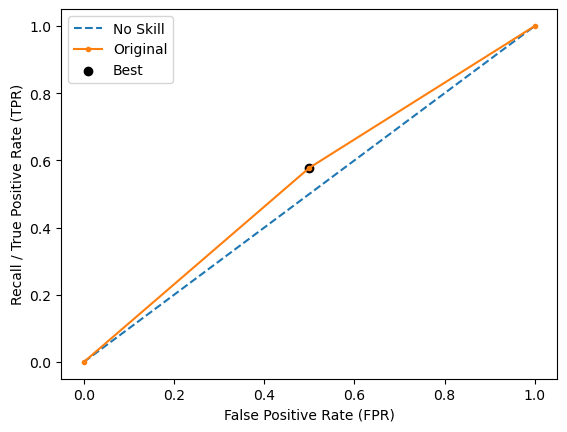

Run 2 - Random State: 1
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.731
Best Recall=0.489
Best G-Mean=0.494


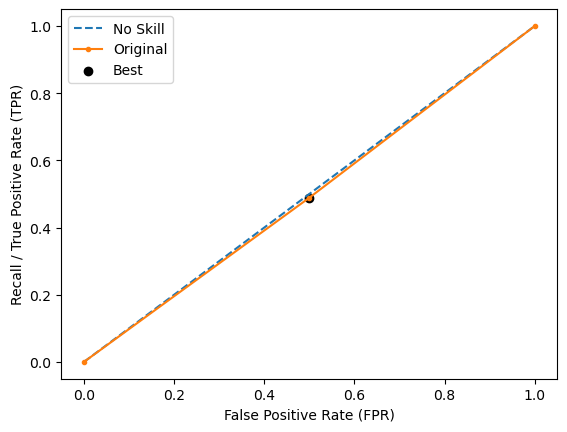

Run 3 - Random State: 2
Test Accuracy: 0.42857142857142855
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.29411764705882354
Test F-0.75 Score: 0.3246753246753247
Test F-1 Score: 0.35714285714285715
Test F-1.5 Score: 0.4140127388535032
Test F-2 Score: 0.4545454545454546
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.731
Best Recall=0.622
Best G-Mean=0.526


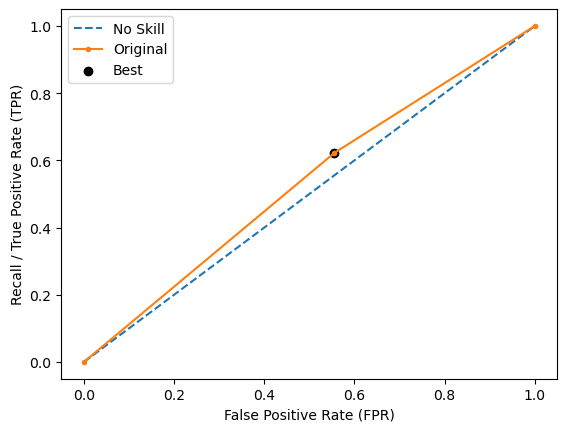

Run 4 - Random State: 3
Test Accuracy: 0.47619047619047616
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3313253012048193
Test F-0.75 Score: 0.3647214854111406
Test F-1 Score: 0.39999999999999997
Test F-1.5 Score: 0.46129032258064523
Test F-2 Score: 0.5045871559633028
Test G-Mean Score: 0.5079613089183317
Best Threshold=0.731
Best Recall=0.578
Best G-Mean=0.474


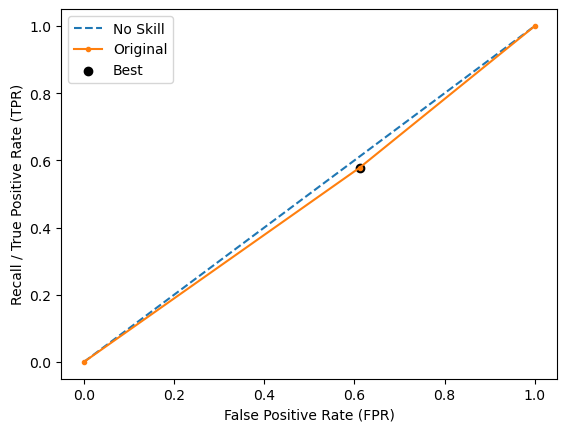

Run 5 - Random State: 4
Test Accuracy: 0.4126984126984127
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.23333333333333334
Test F-0.75 Score: 0.2536231884057971
Test F-1 Score: 0.27450980392156865
Test F-1.5 Score: 0.30952380952380953
Test F-2 Score: 0.3333333333333333
Test G-Mean Score: 0.4052129450846771
Best Threshold=0.731
Best Recall=0.578
Best G-Mean=0.594


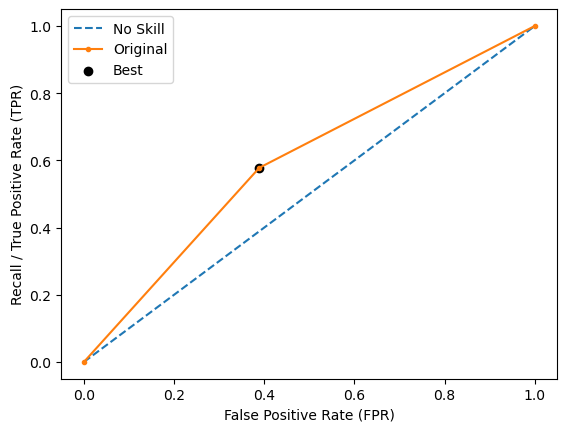

Ave Test Accuracy: 0.45396825396825397
Stdev Test Accuracy: 0.0382272843771184
Ave Test Recall: 0.5111111111111112
Stdev Test Recall: 0.08240220541217405
Ave Test F-0.5 Score: 0.2920975633259918
Stdev Test F-0.5 Score: 0.037631331199122
Ave Test F-0.75 Score: 0.31931992725530656
Stdev Test F-0.75 Score: 0.04176427407351919
Ave Test F-1 Score: 0.3477244482698739
Stdev Test F-1 Score: 0.04645563821503237
Ave Test F-1.5 Score: 0.39626699971838264
Stdev Test F-1.5 Score: 0.05547543622424204
Ave Test F-2 Score: 0.4299839790778274
Stdev Test F-2 Score: 0.06254354898605119
Ave Test G-mean: 0.46725808452672746
Stdev Test G-mean: 0.042174768288733795
Ave Test Specificity: 0.4311111111111111
Stdev Test Specificity: 0.048686449556014755
Ave Test Precision: 0.264008368388674
Ave Test NPV: 0.6882847985347985
Ave Runtime: 0.01562786102294922


In [131]:
ld_t02_adaboost_gs, ld_t02_adaboost_be, ld_t02_adaboost_model_info, ld_t02_adaboost_metrics_df = adaboost_class2(ld_t02, fbeta_scorer(beta=2),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.003804
0:	learn: 0.6918430	total: 2.21ms	remaining: 2.21s
1:	learn: 0.6904269	total: 4.86ms	remaining: 2.43s
2:	learn: 0.6887603	total: 7.82ms	remaining: 2.6s
3:	learn: 0.6875324	total: 10.8ms	remaining: 2.7s
4:	learn: 0.6857660	total: 13.8ms	remaining: 2.74s
5:	learn: 0.6847818	total: 16.5ms	remaining: 2.73s
6:	learn: 0.6838856	total: 18.8ms	remaining: 2.67s
7:	learn: 0.6825166	total: 21.3ms	remaining: 2.64s
8:	learn: 0.6808170	total: 23.9ms	remaining: 2.63s
9:	learn: 0.6788644	total: 26.2ms	remaining: 2.59s
10:	learn: 0.6775786	total: 28.7ms	remaining: 2.58s
11:	learn: 0.6761140	total: 30.9ms	remaining: 2.55s
12:	learn: 0.6747365	total: 33ms	remaining: 2.51s
13:	learn: 0.6731644	total: 35ms	remaining: 2.46s
14:	learn: 0.6725760	total: 36.4ms	remaining: 2.39s
15:	learn: 0.6710843	total: 38ms	remaining: 2.33s
16:	learn: 0.6702176	total: 39.6ms	remaining: 2.29s
17:	learn: 0.6689704	total: 41.3ms	remain

195:	learn: 0.4767236	total: 378ms	remaining: 1.55s
196:	learn: 0.4760650	total: 380ms	remaining: 1.55s
197:	learn: 0.4753348	total: 382ms	remaining: 1.55s
198:	learn: 0.4747064	total: 384ms	remaining: 1.55s
199:	learn: 0.4741023	total: 386ms	remaining: 1.54s
200:	learn: 0.4732606	total: 388ms	remaining: 1.54s
201:	learn: 0.4727201	total: 390ms	remaining: 1.54s
202:	learn: 0.4718582	total: 392ms	remaining: 1.54s
203:	learn: 0.4712881	total: 395ms	remaining: 1.54s
204:	learn: 0.4704707	total: 397ms	remaining: 1.54s
205:	learn: 0.4695545	total: 399ms	remaining: 1.54s
206:	learn: 0.4686926	total: 401ms	remaining: 1.54s
207:	learn: 0.4679497	total: 403ms	remaining: 1.53s
208:	learn: 0.4670105	total: 405ms	remaining: 1.53s
209:	learn: 0.4659908	total: 407ms	remaining: 1.53s
210:	learn: 0.4648348	total: 409ms	remaining: 1.53s
211:	learn: 0.4640982	total: 411ms	remaining: 1.53s
212:	learn: 0.4635171	total: 413ms	remaining: 1.53s
213:	learn: 0.4629258	total: 415ms	remaining: 1.52s
214:	learn: 

404:	learn: 0.3449532	total: 775ms	remaining: 1.14s
405:	learn: 0.3445532	total: 777ms	remaining: 1.14s
406:	learn: 0.3438440	total: 779ms	remaining: 1.13s
407:	learn: 0.3430571	total: 781ms	remaining: 1.13s
408:	learn: 0.3427239	total: 782ms	remaining: 1.13s
409:	learn: 0.3421664	total: 784ms	remaining: 1.13s
410:	learn: 0.3416098	total: 786ms	remaining: 1.13s
411:	learn: 0.3407188	total: 788ms	remaining: 1.12s
412:	learn: 0.3399982	total: 790ms	remaining: 1.12s
413:	learn: 0.3396833	total: 792ms	remaining: 1.12s
414:	learn: 0.3391797	total: 794ms	remaining: 1.12s
415:	learn: 0.3385208	total: 796ms	remaining: 1.12s
416:	learn: 0.3383176	total: 797ms	remaining: 1.11s
417:	learn: 0.3377477	total: 799ms	remaining: 1.11s
418:	learn: 0.3372526	total: 801ms	remaining: 1.11s
419:	learn: 0.3369451	total: 803ms	remaining: 1.11s
420:	learn: 0.3365533	total: 805ms	remaining: 1.11s
421:	learn: 0.3359667	total: 806ms	remaining: 1.1s
422:	learn: 0.3355843	total: 808ms	remaining: 1.1s
423:	learn: 0.

610:	learn: 0.2587623	total: 1.17s	remaining: 743ms
611:	learn: 0.2583520	total: 1.17s	remaining: 741ms
612:	learn: 0.2580821	total: 1.17s	remaining: 739ms
613:	learn: 0.2578269	total: 1.17s	remaining: 737ms
614:	learn: 0.2576054	total: 1.17s	remaining: 735ms
615:	learn: 0.2575780	total: 1.18s	remaining: 733ms
616:	learn: 0.2572200	total: 1.18s	remaining: 731ms
617:	learn: 0.2566416	total: 1.18s	remaining: 729ms
618:	learn: 0.2561308	total: 1.18s	remaining: 727ms
619:	learn: 0.2559351	total: 1.18s	remaining: 725ms
620:	learn: 0.2556432	total: 1.18s	remaining: 723ms
621:	learn: 0.2554750	total: 1.19s	remaining: 721ms
622:	learn: 0.2550602	total: 1.19s	remaining: 719ms
623:	learn: 0.2546548	total: 1.19s	remaining: 717ms
624:	learn: 0.2543296	total: 1.19s	remaining: 715ms
625:	learn: 0.2539751	total: 1.19s	remaining: 713ms
626:	learn: 0.2536326	total: 1.19s	remaining: 711ms
627:	learn: 0.2533314	total: 1.2s	remaining: 709ms
628:	learn: 0.2527475	total: 1.2s	remaining: 707ms
629:	learn: 0.

822:	learn: 0.1975267	total: 1.56s	remaining: 336ms
823:	learn: 0.1973022	total: 1.56s	remaining: 334ms
824:	learn: 0.1970386	total: 1.56s	remaining: 332ms
825:	learn: 0.1967888	total: 1.57s	remaining: 330ms
826:	learn: 0.1964372	total: 1.57s	remaining: 328ms
827:	learn: 0.1962983	total: 1.57s	remaining: 326ms
828:	learn: 0.1960790	total: 1.57s	remaining: 324ms
829:	learn: 0.1959898	total: 1.57s	remaining: 322ms
830:	learn: 0.1957443	total: 1.57s	remaining: 320ms
831:	learn: 0.1956056	total: 1.57s	remaining: 318ms
832:	learn: 0.1955013	total: 1.58s	remaining: 316ms
833:	learn: 0.1952520	total: 1.58s	remaining: 314ms
834:	learn: 0.1950412	total: 1.58s	remaining: 312ms
835:	learn: 0.1947994	total: 1.58s	remaining: 310ms
836:	learn: 0.1946055	total: 1.58s	remaining: 309ms
837:	learn: 0.1943599	total: 1.58s	remaining: 307ms
838:	learn: 0.1940991	total: 1.59s	remaining: 305ms
839:	learn: 0.1937743	total: 1.59s	remaining: 303ms
840:	learn: 0.1935443	total: 1.59s	remaining: 301ms
841:	learn: 

7:	learn: 0.6825166	total: 37.6ms	remaining: 4.66s
8:	learn: 0.6808170	total: 42.2ms	remaining: 4.65s
9:	learn: 0.6788644	total: 46.3ms	remaining: 4.59s
10:	learn: 0.6775786	total: 51.3ms	remaining: 4.61s
11:	learn: 0.6761140	total: 56.1ms	remaining: 4.62s
12:	learn: 0.6747365	total: 60.7ms	remaining: 4.61s
13:	learn: 0.6731644	total: 65ms	remaining: 4.58s
14:	learn: 0.6725760	total: 68.3ms	remaining: 4.49s
15:	learn: 0.6710843	total: 70.5ms	remaining: 4.34s
16:	learn: 0.6702176	total: 73.6ms	remaining: 4.26s
17:	learn: 0.6689704	total: 76.8ms	remaining: 4.19s
18:	learn: 0.6677971	total: 80.3ms	remaining: 4.14s
19:	learn: 0.6664449	total: 83.1ms	remaining: 4.07s
20:	learn: 0.6655928	total: 86.9ms	remaining: 4.05s
21:	learn: 0.6636754	total: 90.5ms	remaining: 4.02s
22:	learn: 0.6624070	total: 94.1ms	remaining: 4s
23:	learn: 0.6609070	total: 97.1ms	remaining: 3.95s
24:	learn: 0.6594834	total: 100ms	remaining: 3.9s
25:	learn: 0.6580862	total: 102ms	remaining: 3.84s
26:	learn: 0.6563300	to

175:	learn: 0.4935559	total: 426ms	remaining: 1.99s
176:	learn: 0.4928165	total: 427ms	remaining: 1.99s
177:	learn: 0.4921351	total: 429ms	remaining: 1.98s
178:	learn: 0.4910606	total: 431ms	remaining: 1.98s
179:	learn: 0.4901266	total: 432ms	remaining: 1.97s
180:	learn: 0.4889752	total: 434ms	remaining: 1.96s
181:	learn: 0.4877360	total: 435ms	remaining: 1.96s
182:	learn: 0.4869503	total: 437ms	remaining: 1.95s
183:	learn: 0.4858038	total: 438ms	remaining: 1.94s
184:	learn: 0.4853582	total: 440ms	remaining: 1.94s
185:	learn: 0.4844091	total: 441ms	remaining: 1.93s
186:	learn: 0.4839151	total: 443ms	remaining: 1.93s
187:	learn: 0.4829361	total: 444ms	remaining: 1.92s
188:	learn: 0.4823377	total: 446ms	remaining: 1.91s
189:	learn: 0.4815187	total: 447ms	remaining: 1.91s
190:	learn: 0.4805332	total: 449ms	remaining: 1.9s
191:	learn: 0.4796980	total: 450ms	remaining: 1.89s
192:	learn: 0.4789163	total: 451ms	remaining: 1.89s
193:	learn: 0.4781559	total: 453ms	remaining: 1.88s
194:	learn: 0

383:	learn: 0.3559901	total: 823ms	remaining: 1.32s
384:	learn: 0.3554221	total: 827ms	remaining: 1.32s
385:	learn: 0.3549698	total: 830ms	remaining: 1.32s
386:	learn: 0.3544545	total: 833ms	remaining: 1.32s
387:	learn: 0.3540087	total: 836ms	remaining: 1.32s
388:	learn: 0.3536232	total: 838ms	remaining: 1.32s
389:	learn: 0.3529978	total: 840ms	remaining: 1.31s
390:	learn: 0.3520732	total: 843ms	remaining: 1.31s
391:	learn: 0.3517475	total: 845ms	remaining: 1.31s
392:	learn: 0.3509076	total: 847ms	remaining: 1.31s
393:	learn: 0.3507081	total: 850ms	remaining: 1.31s
394:	learn: 0.3503325	total: 852ms	remaining: 1.3s
395:	learn: 0.3495761	total: 854ms	remaining: 1.3s
396:	learn: 0.3492145	total: 855ms	remaining: 1.3s
397:	learn: 0.3485152	total: 857ms	remaining: 1.3s
398:	learn: 0.3478994	total: 858ms	remaining: 1.29s
399:	learn: 0.3475862	total: 860ms	remaining: 1.29s
400:	learn: 0.3470753	total: 861ms	remaining: 1.29s
401:	learn: 0.3462958	total: 863ms	remaining: 1.28s
402:	learn: 0.34

633:	learn: 0.2507634	total: 1.21s	remaining: 700ms
634:	learn: 0.2505935	total: 1.21s	remaining: 698ms
635:	learn: 0.2504584	total: 1.22s	remaining: 696ms
636:	learn: 0.2502819	total: 1.22s	remaining: 693ms
637:	learn: 0.2498323	total: 1.22s	remaining: 691ms
638:	learn: 0.2494617	total: 1.22s	remaining: 689ms
639:	learn: 0.2489619	total: 1.22s	remaining: 687ms
640:	learn: 0.2484150	total: 1.22s	remaining: 685ms
641:	learn: 0.2479827	total: 1.22s	remaining: 683ms
642:	learn: 0.2476053	total: 1.23s	remaining: 681ms
643:	learn: 0.2473030	total: 1.23s	remaining: 679ms
644:	learn: 0.2468057	total: 1.23s	remaining: 677ms
645:	learn: 0.2466766	total: 1.23s	remaining: 675ms
646:	learn: 0.2463684	total: 1.23s	remaining: 673ms
647:	learn: 0.2459781	total: 1.24s	remaining: 671ms
648:	learn: 0.2456249	total: 1.24s	remaining: 669ms
649:	learn: 0.2451257	total: 1.24s	remaining: 667ms
650:	learn: 0.2450296	total: 1.24s	remaining: 664ms
651:	learn: 0.2448752	total: 1.24s	remaining: 662ms
652:	learn: 

868:	learn: 0.1871743	total: 1.6s	remaining: 242ms
869:	learn: 0.1870131	total: 1.61s	remaining: 240ms
870:	learn: 0.1868292	total: 1.61s	remaining: 238ms
871:	learn: 0.1866809	total: 1.61s	remaining: 236ms
872:	learn: 0.1862986	total: 1.61s	remaining: 234ms
873:	learn: 0.1861158	total: 1.61s	remaining: 233ms
874:	learn: 0.1858508	total: 1.61s	remaining: 231ms
875:	learn: 0.1857037	total: 1.62s	remaining: 229ms
876:	learn: 0.1855533	total: 1.62s	remaining: 227ms
877:	learn: 0.1853127	total: 1.62s	remaining: 225ms
878:	learn: 0.1851509	total: 1.62s	remaining: 223ms
879:	learn: 0.1847537	total: 1.62s	remaining: 221ms
880:	learn: 0.1844649	total: 1.63s	remaining: 220ms
881:	learn: 0.1842151	total: 1.63s	remaining: 218ms
882:	learn: 0.1840208	total: 1.63s	remaining: 216ms
883:	learn: 0.1837948	total: 1.63s	remaining: 214ms
884:	learn: 0.1836295	total: 1.63s	remaining: 212ms
885:	learn: 0.1833194	total: 1.63s	remaining: 210ms
886:	learn: 0.1830612	total: 1.64s	remaining: 208ms
887:	learn: 0

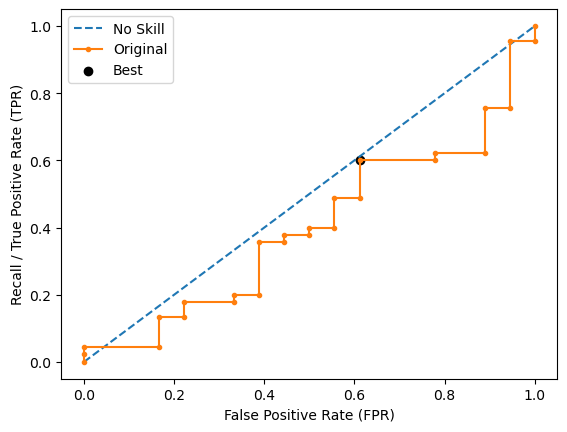

Learning rate set to 0.003788
0:	learn: 0.6917831	total: 1.81ms	remaining: 1.8s
1:	learn: 0.6903824	total: 3.72ms	remaining: 1.86s
2:	learn: 0.6889711	total: 5.4ms	remaining: 1.79s
3:	learn: 0.6877826	total: 7.07ms	remaining: 1.76s
4:	learn: 0.6864502	total: 8.89ms	remaining: 1.77s
5:	learn: 0.6853055	total: 10.4ms	remaining: 1.73s
6:	learn: 0.6840003	total: 11.9ms	remaining: 1.69s
7:	learn: 0.6822289	total: 13.5ms	remaining: 1.67s
8:	learn: 0.6805329	total: 15.2ms	remaining: 1.68s
9:	learn: 0.6790260	total: 16.8ms	remaining: 1.67s
10:	learn: 0.6774987	total: 18.4ms	remaining: 1.66s
11:	learn: 0.6757886	total: 20.5ms	remaining: 1.69s
12:	learn: 0.6749621	total: 22.3ms	remaining: 1.69s
13:	learn: 0.6735192	total: 24ms	remaining: 1.69s
14:	learn: 0.6714470	total: 26.2ms	remaining: 1.72s
15:	learn: 0.6704435	total: 27.9ms	remaining: 1.72s
16:	learn: 0.6686600	total: 30.2ms	remaining: 1.74s
17:	learn: 0.6672765	total: 31.9ms	remaining: 1.74s
18:	learn: 0.6664543	total: 33.3ms	remaining: 1.

225:	learn: 0.4426284	total: 389ms	remaining: 1.33s
226:	learn: 0.4418443	total: 391ms	remaining: 1.33s
227:	learn: 0.4413432	total: 392ms	remaining: 1.33s
228:	learn: 0.4405644	total: 394ms	remaining: 1.33s
229:	learn: 0.4398545	total: 395ms	remaining: 1.32s
230:	learn: 0.4390508	total: 397ms	remaining: 1.32s
231:	learn: 0.4381107	total: 399ms	remaining: 1.32s
232:	learn: 0.4375404	total: 400ms	remaining: 1.32s
233:	learn: 0.4367297	total: 402ms	remaining: 1.31s
234:	learn: 0.4358563	total: 403ms	remaining: 1.31s
235:	learn: 0.4349752	total: 405ms	remaining: 1.31s
236:	learn: 0.4338148	total: 406ms	remaining: 1.31s
237:	learn: 0.4332570	total: 408ms	remaining: 1.3s
238:	learn: 0.4322896	total: 410ms	remaining: 1.3s
239:	learn: 0.4313494	total: 411ms	remaining: 1.3s
240:	learn: 0.4308233	total: 413ms	remaining: 1.3s
241:	learn: 0.4302573	total: 414ms	remaining: 1.3s
242:	learn: 0.4298509	total: 416ms	remaining: 1.29s
243:	learn: 0.4291331	total: 417ms	remaining: 1.29s
244:	learn: 0.428

466:	learn: 0.3037322	total: 786ms	remaining: 897ms
467:	learn: 0.3032508	total: 788ms	remaining: 895ms
468:	learn: 0.3031516	total: 789ms	remaining: 894ms
469:	learn: 0.3028994	total: 791ms	remaining: 892ms
470:	learn: 0.3025792	total: 793ms	remaining: 890ms
471:	learn: 0.3022283	total: 794ms	remaining: 888ms
472:	learn: 0.3017695	total: 796ms	remaining: 887ms
473:	learn: 0.3014186	total: 797ms	remaining: 885ms
474:	learn: 0.3007742	total: 799ms	remaining: 883ms
475:	learn: 0.3002447	total: 801ms	remaining: 881ms
476:	learn: 0.2996970	total: 802ms	remaining: 880ms
477:	learn: 0.2991472	total: 804ms	remaining: 878ms
478:	learn: 0.2986772	total: 806ms	remaining: 876ms
479:	learn: 0.2982839	total: 807ms	remaining: 875ms
480:	learn: 0.2977872	total: 809ms	remaining: 873ms
481:	learn: 0.2970845	total: 811ms	remaining: 871ms
482:	learn: 0.2966912	total: 812ms	remaining: 869ms
483:	learn: 0.2962699	total: 814ms	remaining: 868ms
484:	learn: 0.2956497	total: 816ms	remaining: 867ms
485:	learn: 

691:	learn: 0.2237505	total: 1.16s	remaining: 516ms
692:	learn: 0.2234855	total: 1.16s	remaining: 515ms
693:	learn: 0.2231858	total: 1.16s	remaining: 513ms
694:	learn: 0.2230533	total: 1.17s	remaining: 511ms
695:	learn: 0.2226032	total: 1.17s	remaining: 510ms
696:	learn: 0.2222775	total: 1.17s	remaining: 508ms
697:	learn: 0.2221153	total: 1.17s	remaining: 506ms
698:	learn: 0.2217861	total: 1.17s	remaining: 505ms
699:	learn: 0.2215048	total: 1.17s	remaining: 503ms
700:	learn: 0.2213162	total: 1.18s	remaining: 501ms
701:	learn: 0.2209506	total: 1.18s	remaining: 499ms
702:	learn: 0.2207378	total: 1.18s	remaining: 498ms
703:	learn: 0.2205063	total: 1.18s	remaining: 496ms
704:	learn: 0.2201659	total: 1.18s	remaining: 494ms
705:	learn: 0.2199269	total: 1.18s	remaining: 493ms
706:	learn: 0.2196655	total: 1.18s	remaining: 491ms
707:	learn: 0.2194055	total: 1.19s	remaining: 489ms
708:	learn: 0.2191779	total: 1.19s	remaining: 488ms
709:	learn: 0.2188870	total: 1.19s	remaining: 486ms
710:	learn: 

925:	learn: 0.1675489	total: 1.55s	remaining: 124ms
926:	learn: 0.1674109	total: 1.55s	remaining: 122ms
927:	learn: 0.1672589	total: 1.55s	remaining: 121ms
928:	learn: 0.1670740	total: 1.56s	remaining: 119ms
929:	learn: 0.1668520	total: 1.56s	remaining: 117ms
930:	learn: 0.1666166	total: 1.56s	remaining: 116ms
931:	learn: 0.1664477	total: 1.56s	remaining: 114ms
932:	learn: 0.1662229	total: 1.56s	remaining: 112ms
933:	learn: 0.1660877	total: 1.56s	remaining: 111ms
934:	learn: 0.1659457	total: 1.57s	remaining: 109ms
935:	learn: 0.1657207	total: 1.57s	remaining: 107ms
936:	learn: 0.1656263	total: 1.57s	remaining: 106ms
937:	learn: 0.1653774	total: 1.57s	remaining: 104ms
938:	learn: 0.1651535	total: 1.57s	remaining: 102ms
939:	learn: 0.1650462	total: 1.57s	remaining: 101ms
940:	learn: 0.1648392	total: 1.58s	remaining: 98.8ms
941:	learn: 0.1646156	total: 1.58s	remaining: 97.2ms
942:	learn: 0.1644114	total: 1.58s	remaining: 95.5ms
943:	learn: 0.1642897	total: 1.58s	remaining: 93.8ms
944:	lea

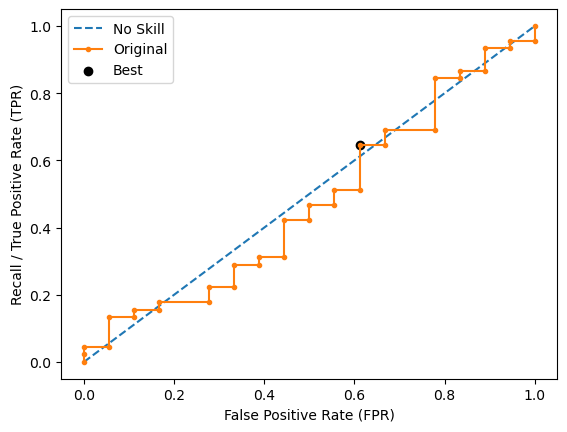

Learning rate set to 0.003967
0:	learn: 0.6917188	total: 15.8ms	remaining: 15.8s
1:	learn: 0.6901326	total: 21.1ms	remaining: 10.5s
2:	learn: 0.6889914	total: 25.9ms	remaining: 8.62s
3:	learn: 0.6876656	total: 31.6ms	remaining: 7.88s
4:	learn: 0.6859856	total: 36.8ms	remaining: 7.32s
5:	learn: 0.6853252	total: 41ms	remaining: 6.8s
6:	learn: 0.6843908	total: 46.5ms	remaining: 6.59s
7:	learn: 0.6829040	total: 51.4ms	remaining: 6.37s
8:	learn: 0.6819071	total: 56ms	remaining: 6.17s
9:	learn: 0.6804192	total: 60.7ms	remaining: 6.01s
10:	learn: 0.6787634	total: 65.2ms	remaining: 5.86s
11:	learn: 0.6776475	total: 69.6ms	remaining: 5.73s
12:	learn: 0.6761023	total: 74.3ms	remaining: 5.64s
13:	learn: 0.6742102	total: 79.1ms	remaining: 5.57s
14:	learn: 0.6723610	total: 82.5ms	remaining: 5.42s
15:	learn: 0.6708499	total: 86.9ms	remaining: 5.34s
16:	learn: 0.6694308	total: 90.1ms	remaining: 5.21s
17:	learn: 0.6668620	total: 95.1ms	remaining: 5.19s
18:	learn: 0.6656198	total: 99.7ms	remaining: 5.1

252:	learn: 0.4317534	total: 588ms	remaining: 1.74s
253:	learn: 0.4310717	total: 590ms	remaining: 1.73s
254:	learn: 0.4301358	total: 591ms	remaining: 1.73s
255:	learn: 0.4297573	total: 593ms	remaining: 1.72s
256:	learn: 0.4289468	total: 594ms	remaining: 1.72s
257:	learn: 0.4281052	total: 596ms	remaining: 1.71s
258:	learn: 0.4275939	total: 598ms	remaining: 1.71s
259:	learn: 0.4270329	total: 599ms	remaining: 1.71s
260:	learn: 0.4262149	total: 601ms	remaining: 1.7s
261:	learn: 0.4253316	total: 602ms	remaining: 1.7s
262:	learn: 0.4248621	total: 604ms	remaining: 1.69s
263:	learn: 0.4246196	total: 605ms	remaining: 1.69s
264:	learn: 0.4241323	total: 607ms	remaining: 1.68s
265:	learn: 0.4229945	total: 608ms	remaining: 1.68s
266:	learn: 0.4221489	total: 610ms	remaining: 1.67s
267:	learn: 0.4213882	total: 611ms	remaining: 1.67s
268:	learn: 0.4205262	total: 613ms	remaining: 1.67s
269:	learn: 0.4198457	total: 614ms	remaining: 1.66s
270:	learn: 0.4187628	total: 616ms	remaining: 1.66s
271:	learn: 0.

508:	learn: 0.2969770	total: 987ms	remaining: 952ms
509:	learn: 0.2967030	total: 989ms	remaining: 950ms
510:	learn: 0.2963539	total: 990ms	remaining: 948ms
511:	learn: 0.2960675	total: 992ms	remaining: 945ms
512:	learn: 0.2956660	total: 993ms	remaining: 943ms
513:	learn: 0.2953736	total: 995ms	remaining: 941ms
514:	learn: 0.2949443	total: 996ms	remaining: 938ms
515:	learn: 0.2941584	total: 998ms	remaining: 936ms
516:	learn: 0.2937878	total: 999ms	remaining: 934ms
517:	learn: 0.2932778	total: 1s	remaining: 931ms
518:	learn: 0.2927602	total: 1s	remaining: 929ms
519:	learn: 0.2921093	total: 1s	remaining: 927ms
520:	learn: 0.2917058	total: 1s	remaining: 924ms
521:	learn: 0.2913219	total: 1.01s	remaining: 922ms
522:	learn: 0.2908740	total: 1.01s	remaining: 920ms
523:	learn: 0.2904083	total: 1.01s	remaining: 918ms
524:	learn: 0.2902175	total: 1.01s	remaining: 916ms
525:	learn: 0.2897346	total: 1.01s	remaining: 913ms
526:	learn: 0.2893131	total: 1.01s	remaining: 911ms
527:	learn: 0.2888954	to

746:	learn: 0.2176178	total: 1.38s	remaining: 466ms
747:	learn: 0.2172962	total: 1.38s	remaining: 464ms
748:	learn: 0.2170230	total: 1.38s	remaining: 463ms
749:	learn: 0.2168250	total: 1.38s	remaining: 461ms
750:	learn: 0.2166832	total: 1.38s	remaining: 459ms
751:	learn: 0.2165966	total: 1.39s	remaining: 457ms
752:	learn: 0.2162608	total: 1.39s	remaining: 455ms
753:	learn: 0.2161219	total: 1.39s	remaining: 453ms
754:	learn: 0.2159302	total: 1.39s	remaining: 451ms
755:	learn: 0.2157217	total: 1.39s	remaining: 449ms
756:	learn: 0.2153688	total: 1.39s	remaining: 448ms
757:	learn: 0.2151344	total: 1.4s	remaining: 446ms
758:	learn: 0.2150142	total: 1.4s	remaining: 444ms
759:	learn: 0.2147538	total: 1.4s	remaining: 442ms
760:	learn: 0.2144338	total: 1.4s	remaining: 440ms
761:	learn: 0.2143474	total: 1.4s	remaining: 438ms
762:	learn: 0.2140117	total: 1.4s	remaining: 436ms
763:	learn: 0.2136225	total: 1.41s	remaining: 434ms
764:	learn: 0.2133696	total: 1.41s	remaining: 432ms
765:	learn: 0.2131

984:	learn: 0.1640099	total: 1.77s	remaining: 27ms
985:	learn: 0.1637673	total: 1.77s	remaining: 25.2ms
986:	learn: 0.1636857	total: 1.77s	remaining: 23.4ms
987:	learn: 0.1635639	total: 1.77s	remaining: 21.6ms
988:	learn: 0.1632421	total: 1.78s	remaining: 19.8ms
989:	learn: 0.1629941	total: 1.78s	remaining: 18ms
990:	learn: 0.1627709	total: 1.78s	remaining: 16.2ms
991:	learn: 0.1626669	total: 1.78s	remaining: 14.4ms
992:	learn: 0.1624057	total: 1.78s	remaining: 12.6ms
993:	learn: 0.1621713	total: 1.78s	remaining: 10.8ms
994:	learn: 0.1619638	total: 1.79s	remaining: 8.98ms
995:	learn: 0.1617128	total: 1.79s	remaining: 7.18ms
996:	learn: 0.1616377	total: 1.79s	remaining: 5.39ms
997:	learn: 0.1613428	total: 1.79s	remaining: 3.59ms
998:	learn: 0.1610952	total: 1.79s	remaining: 1.79ms
999:	learn: 0.1609402	total: 1.79s	remaining: 0us
Run 3 - Random State: 2
Test Accuracy: 0.5238095238095238
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3571428571428571
Test F-0.75 Score: 0.38951841359

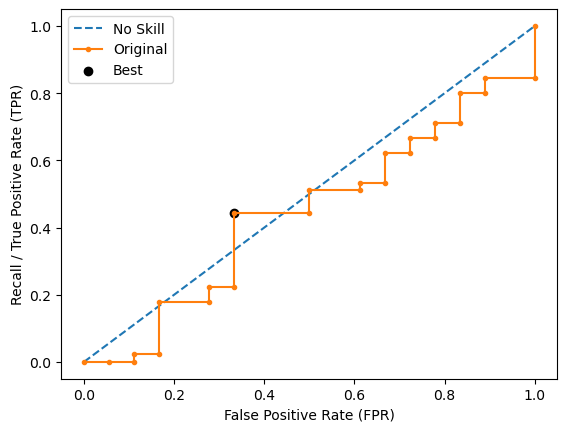

Learning rate set to 0.003821
0:	learn: 0.6925191	total: 4.08ms	remaining: 4.08s
1:	learn: 0.6912084	total: 7.6ms	remaining: 3.79s
2:	learn: 0.6896542	total: 12ms	remaining: 3.99s
3:	learn: 0.6889199	total: 16.4ms	remaining: 4.07s
4:	learn: 0.6874675	total: 19.9ms	remaining: 3.97s
5:	learn: 0.6867309	total: 24.7ms	remaining: 4.09s
6:	learn: 0.6854113	total: 29.3ms	remaining: 4.15s
7:	learn: 0.6837709	total: 32.5ms	remaining: 4.03s
8:	learn: 0.6824178	total: 35.4ms	remaining: 3.89s
9:	learn: 0.6807360	total: 39.1ms	remaining: 3.87s
10:	learn: 0.6792173	total: 42.9ms	remaining: 3.86s
11:	learn: 0.6787046	total: 47.8ms	remaining: 3.94s
12:	learn: 0.6775519	total: 51.8ms	remaining: 3.93s
13:	learn: 0.6768056	total: 54.2ms	remaining: 3.82s
14:	learn: 0.6762698	total: 57.8ms	remaining: 3.79s
15:	learn: 0.6749534	total: 61.4ms	remaining: 3.78s
16:	learn: 0.6740683	total: 63.5ms	remaining: 3.67s
17:	learn: 0.6722567	total: 67.6ms	remaining: 3.69s
18:	learn: 0.6711786	total: 71.3ms	remaining: 3

213:	learn: 0.4847478	total: 391ms	remaining: 1.44s
214:	learn: 0.4839990	total: 393ms	remaining: 1.43s
215:	learn: 0.4834123	total: 394ms	remaining: 1.43s
216:	learn: 0.4827270	total: 396ms	remaining: 1.43s
217:	learn: 0.4817097	total: 397ms	remaining: 1.42s
218:	learn: 0.4804784	total: 399ms	remaining: 1.42s
219:	learn: 0.4798535	total: 400ms	remaining: 1.42s
220:	learn: 0.4793363	total: 401ms	remaining: 1.42s
221:	learn: 0.4790171	total: 403ms	remaining: 1.41s
222:	learn: 0.4781283	total: 404ms	remaining: 1.41s
223:	learn: 0.4771730	total: 406ms	remaining: 1.41s
224:	learn: 0.4758150	total: 408ms	remaining: 1.4s
225:	learn: 0.4753134	total: 409ms	remaining: 1.4s
226:	learn: 0.4748530	total: 411ms	remaining: 1.4s
227:	learn: 0.4739107	total: 412ms	remaining: 1.4s
228:	learn: 0.4731071	total: 414ms	remaining: 1.39s
229:	learn: 0.4725021	total: 415ms	remaining: 1.39s
230:	learn: 0.4713749	total: 417ms	remaining: 1.39s
231:	learn: 0.4704546	total: 418ms	remaining: 1.39s
232:	learn: 0.47

469:	learn: 0.3311535	total: 792ms	remaining: 893ms
470:	learn: 0.3306499	total: 794ms	remaining: 892ms
471:	learn: 0.3302425	total: 796ms	remaining: 890ms
472:	learn: 0.3298141	total: 797ms	remaining: 888ms
473:	learn: 0.3293092	total: 799ms	remaining: 887ms
474:	learn: 0.3290760	total: 801ms	remaining: 885ms
475:	learn: 0.3287370	total: 802ms	remaining: 883ms
476:	learn: 0.3283051	total: 804ms	remaining: 881ms
477:	learn: 0.3281024	total: 805ms	remaining: 880ms
478:	learn: 0.3277143	total: 807ms	remaining: 878ms
479:	learn: 0.3272570	total: 809ms	remaining: 876ms
480:	learn: 0.3267753	total: 810ms	remaining: 874ms
481:	learn: 0.3263916	total: 812ms	remaining: 872ms
482:	learn: 0.3259740	total: 813ms	remaining: 871ms
483:	learn: 0.3256153	total: 815ms	remaining: 869ms
484:	learn: 0.3250472	total: 816ms	remaining: 867ms
485:	learn: 0.3246998	total: 818ms	remaining: 865ms
486:	learn: 0.3244006	total: 820ms	remaining: 863ms
487:	learn: 0.3239774	total: 821ms	remaining: 862ms
488:	learn: 

709:	learn: 0.2445417	total: 1.19s	remaining: 485ms
710:	learn: 0.2442980	total: 1.19s	remaining: 483ms
711:	learn: 0.2439919	total: 1.19s	remaining: 481ms
712:	learn: 0.2434080	total: 1.19s	remaining: 480ms
713:	learn: 0.2432283	total: 1.19s	remaining: 478ms
714:	learn: 0.2427269	total: 1.2s	remaining: 477ms
715:	learn: 0.2425747	total: 1.2s	remaining: 475ms
716:	learn: 0.2421458	total: 1.2s	remaining: 473ms
717:	learn: 0.2416588	total: 1.2s	remaining: 471ms
718:	learn: 0.2412980	total: 1.2s	remaining: 470ms
719:	learn: 0.2410964	total: 1.2s	remaining: 468ms
720:	learn: 0.2408201	total: 1.21s	remaining: 466ms
721:	learn: 0.2406170	total: 1.21s	remaining: 465ms
722:	learn: 0.2402222	total: 1.21s	remaining: 463ms
723:	learn: 0.2398869	total: 1.21s	remaining: 461ms
724:	learn: 0.2395113	total: 1.21s	remaining: 460ms
725:	learn: 0.2392496	total: 1.21s	remaining: 458ms
726:	learn: 0.2388970	total: 1.22s	remaining: 456ms
727:	learn: 0.2385639	total: 1.22s	remaining: 455ms
728:	learn: 0.2383

945:	learn: 0.1858385	total: 1.58s	remaining: 90.1ms
946:	learn: 0.1856474	total: 1.58s	remaining: 88.5ms
947:	learn: 0.1855112	total: 1.58s	remaining: 86.8ms
948:	learn: 0.1853213	total: 1.58s	remaining: 85.1ms
949:	learn: 0.1850001	total: 1.58s	remaining: 83.4ms
950:	learn: 0.1847993	total: 1.59s	remaining: 81.8ms
951:	learn: 0.1845322	total: 1.59s	remaining: 80.1ms
952:	learn: 0.1843085	total: 1.59s	remaining: 78.4ms
953:	learn: 0.1839387	total: 1.59s	remaining: 76.8ms
954:	learn: 0.1836645	total: 1.59s	remaining: 75.1ms
955:	learn: 0.1833896	total: 1.59s	remaining: 73.4ms
956:	learn: 0.1831488	total: 1.6s	remaining: 71.8ms
957:	learn: 0.1828386	total: 1.6s	remaining: 70.1ms
958:	learn: 0.1827062	total: 1.6s	remaining: 68.4ms
959:	learn: 0.1825632	total: 1.6s	remaining: 66.8ms
960:	learn: 0.1823326	total: 1.6s	remaining: 65.1ms
961:	learn: 0.1821818	total: 1.6s	remaining: 63.4ms
962:	learn: 0.1820104	total: 1.61s	remaining: 61.7ms
963:	learn: 0.1818043	total: 1.61s	remaining: 60.1ms

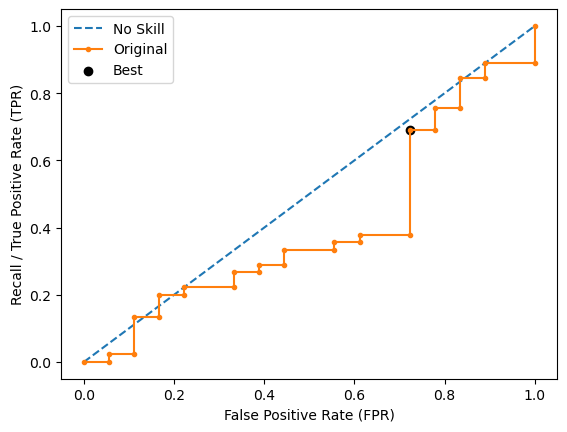

Learning rate set to 0.003821
0:	learn: 0.6919611	total: 2.96ms	remaining: 2.95s
1:	learn: 0.6904290	total: 7.29ms	remaining: 3.64s
2:	learn: 0.6890005	total: 12.3ms	remaining: 4.09s
3:	learn: 0.6871981	total: 16.6ms	remaining: 4.13s
4:	learn: 0.6862592	total: 21.2ms	remaining: 4.23s
5:	learn: 0.6855441	total: 26.3ms	remaining: 4.36s
6:	learn: 0.6840939	total: 31.1ms	remaining: 4.42s
7:	learn: 0.6835744	total: 36.4ms	remaining: 4.51s
8:	learn: 0.6823046	total: 42.6ms	remaining: 4.69s
9:	learn: 0.6805228	total: 47.4ms	remaining: 4.69s
10:	learn: 0.6796740	total: 50.1ms	remaining: 4.51s
11:	learn: 0.6786413	total: 55.6ms	remaining: 4.58s
12:	learn: 0.6776816	total: 59.8ms	remaining: 4.54s
13:	learn: 0.6760993	total: 64.5ms	remaining: 4.54s
14:	learn: 0.6753723	total: 66.8ms	remaining: 4.39s
15:	learn: 0.6749483	total: 69.5ms	remaining: 4.27s
16:	learn: 0.6737972	total: 73.3ms	remaining: 4.24s
17:	learn: 0.6734507	total: 75.1ms	remaining: 4.1s
18:	learn: 0.6727381	total: 77.1ms	remaining:

210:	learn: 0.4779864	total: 385ms	remaining: 1.44s
211:	learn: 0.4776025	total: 387ms	remaining: 1.44s
212:	learn: 0.4764230	total: 388ms	remaining: 1.43s
213:	learn: 0.4760075	total: 390ms	remaining: 1.43s
214:	learn: 0.4756470	total: 391ms	remaining: 1.43s
215:	learn: 0.4746154	total: 392ms	remaining: 1.42s
216:	learn: 0.4732380	total: 394ms	remaining: 1.42s
217:	learn: 0.4724566	total: 395ms	remaining: 1.42s
218:	learn: 0.4716269	total: 397ms	remaining: 1.42s
219:	learn: 0.4709949	total: 399ms	remaining: 1.41s
220:	learn: 0.4702230	total: 400ms	remaining: 1.41s
221:	learn: 0.4692849	total: 402ms	remaining: 1.41s
222:	learn: 0.4683345	total: 404ms	remaining: 1.41s
223:	learn: 0.4678263	total: 405ms	remaining: 1.4s
224:	learn: 0.4669067	total: 407ms	remaining: 1.4s
225:	learn: 0.4659307	total: 408ms	remaining: 1.4s
226:	learn: 0.4649134	total: 410ms	remaining: 1.39s
227:	learn: 0.4642555	total: 411ms	remaining: 1.39s
228:	learn: 0.4636928	total: 413ms	remaining: 1.39s
229:	learn: 0.4

461:	learn: 0.3267307	total: 775ms	remaining: 902ms
462:	learn: 0.3264051	total: 777ms	remaining: 901ms
463:	learn: 0.3258686	total: 778ms	remaining: 899ms
464:	learn: 0.3255607	total: 780ms	remaining: 897ms
465:	learn: 0.3249202	total: 781ms	remaining: 895ms
466:	learn: 0.3244886	total: 783ms	remaining: 894ms
467:	learn: 0.3240829	total: 785ms	remaining: 892ms
468:	learn: 0.3236779	total: 786ms	remaining: 890ms
469:	learn: 0.3234955	total: 788ms	remaining: 888ms
470:	learn: 0.3231597	total: 790ms	remaining: 887ms
471:	learn: 0.3226794	total: 791ms	remaining: 885ms
472:	learn: 0.3220668	total: 793ms	remaining: 883ms
473:	learn: 0.3217583	total: 795ms	remaining: 882ms
474:	learn: 0.3215239	total: 796ms	remaining: 880ms
475:	learn: 0.3210759	total: 798ms	remaining: 878ms
476:	learn: 0.3202524	total: 799ms	remaining: 876ms
477:	learn: 0.3198578	total: 801ms	remaining: 874ms
478:	learn: 0.3197096	total: 802ms	remaining: 873ms
479:	learn: 0.3196254	total: 803ms	remaining: 870ms
480:	learn: 

704:	learn: 0.2384110	total: 1.17s	remaining: 490ms
705:	learn: 0.2380258	total: 1.17s	remaining: 488ms
706:	learn: 0.2376489	total: 1.17s	remaining: 487ms
707:	learn: 0.2371476	total: 1.18s	remaining: 485ms
708:	learn: 0.2368804	total: 1.18s	remaining: 483ms
709:	learn: 0.2366320	total: 1.18s	remaining: 482ms
710:	learn: 0.2363171	total: 1.18s	remaining: 480ms
711:	learn: 0.2360787	total: 1.18s	remaining: 478ms
712:	learn: 0.2357268	total: 1.18s	remaining: 477ms
713:	learn: 0.2355807	total: 1.19s	remaining: 475ms
714:	learn: 0.2353701	total: 1.19s	remaining: 473ms
715:	learn: 0.2350626	total: 1.19s	remaining: 472ms
716:	learn: 0.2347126	total: 1.19s	remaining: 470ms
717:	learn: 0.2343843	total: 1.19s	remaining: 468ms
718:	learn: 0.2341118	total: 1.19s	remaining: 467ms
719:	learn: 0.2338118	total: 1.2s	remaining: 465ms
720:	learn: 0.2335661	total: 1.2s	remaining: 463ms
721:	learn: 0.2333157	total: 1.2s	remaining: 462ms
722:	learn: 0.2331693	total: 1.2s	remaining: 460ms
723:	learn: 0.23

943:	learn: 0.1773114	total: 1.57s	remaining: 93ms
944:	learn: 0.1771746	total: 1.57s	remaining: 91.4ms
945:	learn: 0.1769644	total: 1.57s	remaining: 89.7ms
946:	learn: 0.1767571	total: 1.57s	remaining: 88ms
947:	learn: 0.1764346	total: 1.57s	remaining: 86.4ms
948:	learn: 0.1762909	total: 1.58s	remaining: 84.7ms
949:	learn: 0.1760361	total: 1.58s	remaining: 83.1ms
950:	learn: 0.1758213	total: 1.58s	remaining: 81.4ms
951:	learn: 0.1754434	total: 1.58s	remaining: 79.8ms
952:	learn: 0.1753045	total: 1.58s	remaining: 78.1ms
953:	learn: 0.1752029	total: 1.58s	remaining: 76.4ms
954:	learn: 0.1748788	total: 1.59s	remaining: 74.8ms
955:	learn: 0.1745693	total: 1.59s	remaining: 73.1ms
956:	learn: 0.1743276	total: 1.59s	remaining: 71.4ms
957:	learn: 0.1741940	total: 1.59s	remaining: 69.8ms
958:	learn: 0.1740972	total: 1.59s	remaining: 68.1ms
959:	learn: 0.1737527	total: 1.59s	remaining: 66.5ms
960:	learn: 0.1736546	total: 1.6s	remaining: 64.8ms
961:	learn: 0.1734167	total: 1.6s	remaining: 63.1ms

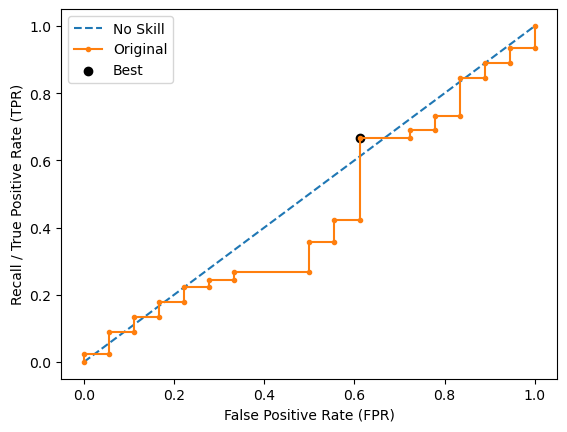

Ave Test Accuracy: 0.5047619047619047
Stdev Test Accuracy: 0.0796819072889596
Ave Test Recall: 0.711111111111111
Stdev Test Recall: 0.106863244787063
Ave Test F-0.5 Score: 0.37197615218762226
Stdev Test F-0.5 Score: 0.05498669793584475
Ave Test F-0.75 Score: 0.41060649683217953
Stdev Test F-0.75 Score: 0.05783722566900786
Ave Test F-1 Score: 0.45184119106699755
Stdev Test F-1 Score: 0.061198347722115985
Ave Test F-1.5 Score: 0.5246927106681792
Stdev Test F-1.5 Score: 0.06893282856467246
Ave Test F-2 Score: 0.5772309351778926
Stdev Test F-2 Score: 0.0766681775711059
Ave Test G-mean: 0.5429726575644374
Stdev Test G-mean: 0.07449792276190938
Ave Test Specificity: 0.4222222222222222
Stdev Test Specificity: 0.1077262190536962
Ave Test Precision: 0.3329688693659282
Ave Test NPV: 0.7841277275502438
Ave Runtime: 1.8593347072601318


In [132]:
ld_t02_catboost_gs, ld_t02_catboost_be, ld_t02_catboost_model_info, ld_t02_catboost_metrics_df = catboost_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'euclidean', 'classifier__n_neighbors': 2, 'resampling': RandomOverSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4300021902391925
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='euclidean', n_neighbors=2))])
Mean Train Score (Recall) 0.5213375140117874
Std Train Score (Recall) 0.028067897912753915
GridSearchCV Runtime: 31.267948150634766 secs
Run 1 - Random State: 0
Test Accuracy: 0.5714285714285714
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.1923076923076923
Test F-0.75 Score: 0.18656716417910446
Test F-1 Score: 0.1818181818181818
Test F-1.5 Score: 0.17567567567567569
Test F-2 Score: 0.17241379310344826
Test G-Mean Score: 0.34960294939005054
Best Threshold=0.500
Best Rec

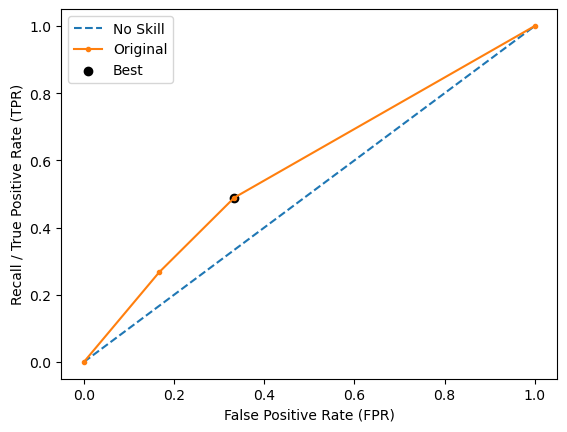

Run 2 - Random State: 1
Test Accuracy: 0.6190476190476191
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.3048780487804878
Test F-0.75 Score: 0.29904306220095694
Test F-1 Score: 0.29411764705882354
Test F-1.5 Score: 0.28761061946902655
Test F-2 Score: 0.2840909090909091
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.500
Best Recall=0.467
Best G-Mean=0.509


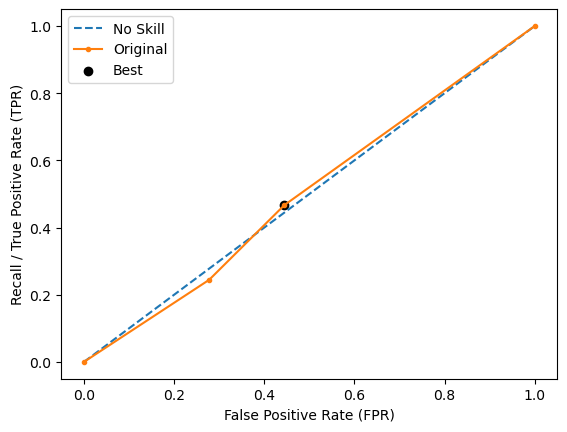

Run 3 - Random State: 2
Test Accuracy: 0.6507936507936508
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.3888888888888889
Test F-0.75 Score: 0.388888888888889
Test F-1 Score: 0.3888888888888889
Test F-1.5 Score: 0.3888888888888889
Test F-2 Score: 0.3888888888888889
Test G-Mean Score: 0.5420582630066875
Best Threshold=1.000
Best Recall=0.244
Best G-Mean=0.387


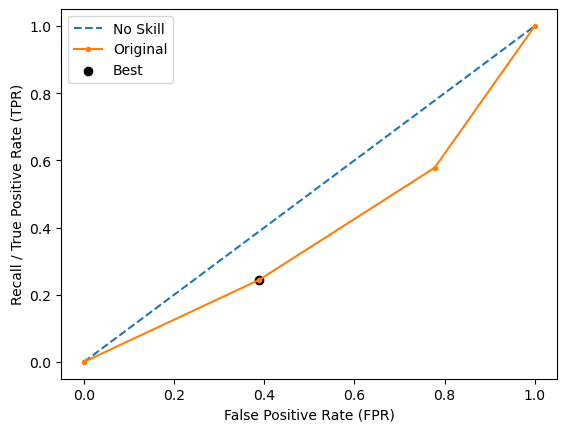

Run 4 - Random State: 3
Test Accuracy: 0.5873015873015873
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.08620689655172414
Test F-0.75 Score: 0.07763975155279504
Test F-1 Score: 0.07142857142857142
Test F-1.5 Score: 0.06435643564356434
Test F-2 Score: 0.06097560975609755
Test G-Mean Score: 0.21081851067789192
Best Threshold=0.500
Best Recall=0.444
Best G-Mean=0.609


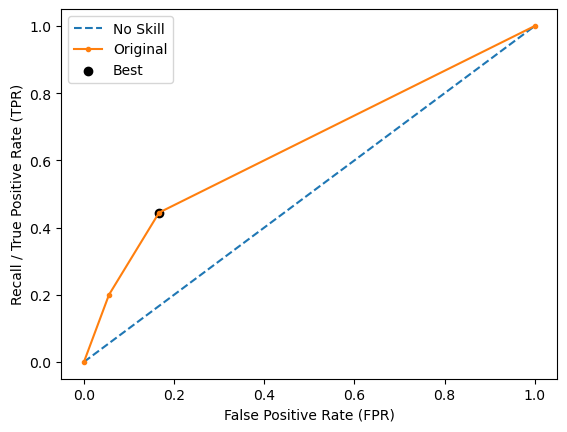

Run 5 - Random State: 4
Test Accuracy: 0.5873015873015873
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.24390243902439027
Test F-0.75 Score: 0.23923444976076555
Test F-1 Score: 0.23529411764705882
Test F-1.5 Score: 0.23008849557522124
Test F-2 Score: 0.22727272727272727
Test G-Mean Score: 0.40368671387966554
Best Threshold=0.500
Best Recall=0.489
Best G-Mean=0.494


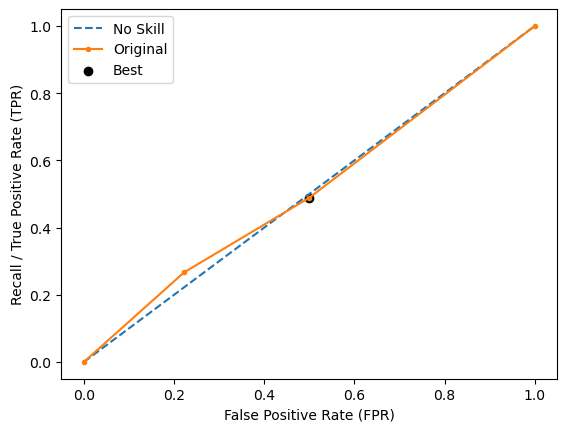

Ave Test Accuracy: 0.6031746031746033
Stdev Test Accuracy: 0.03174603174603176
Ave Test Recall: 0.22222222222222224
Stdev Test Recall: 0.12422599874998833
Ave Test F-0.5 Score: 0.24323679311063667
Stdev Test F-0.5 Score: 0.11430964768069103
Ave Test F-0.75 Score: 0.23827466331650218
Stdev Test F-0.75 Score: 0.11710636701536191
Ave Test F-1 Score: 0.23430948136830493
Stdev Test F-1 Score: 0.11912000962531134
Ave Test F-1.5 Score: 0.22932402305047533
Stdev Test F-1.5 Score: 0.1213994524506135
Ave Test F-2 Score: 0.22672838562241418
Stdev Test F-2 Score: 0.12248555210108758
Ave Test G-mean: 0.39285785684902935
Stdev Test G-mean: 0.12414392342486123
Ave Test Specificity: 0.7555555555555555
Stdev Test Specificity: 0.02721655269759091
Ave Test Precision: 0.25027777777777777
Ave Test NPV: 0.7095665506936081
Ave Runtime: 0.016571903228759767


In [133]:
ld_t02_knn_gs, ld_t02_knn_be, ld_t02_knn_model_info, ld_t02_knn_metrics_df = knn_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.41590271121711286
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', im

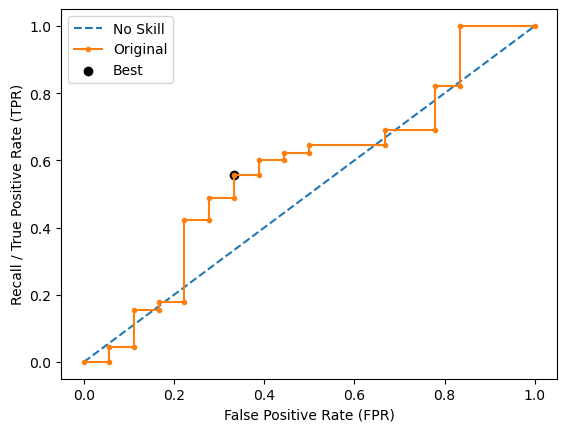

Run 2 - Random State: 1
Test Accuracy: 0.5873015873015873
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.2027027027027027
Test F-0.75 Score: 0.19430051813471502
Test F-1 Score: 0.1875
Test F-1.5 Score: 0.17889908256880735
Test F-2 Score: 0.1744186046511628
Test G-Mean Score: 0.35486043161491804
Best Threshold=0.454
Best Recall=0.289
Best G-Mean=0.474


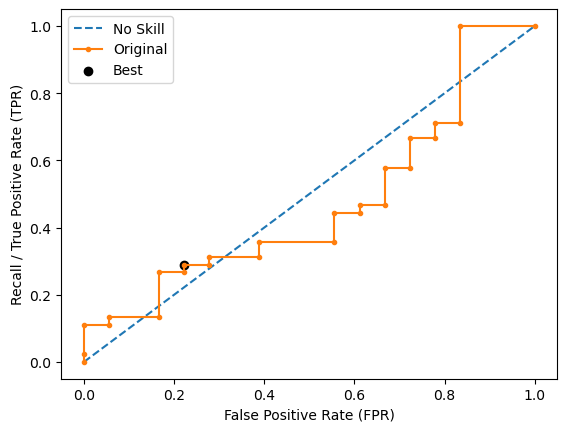

Run 3 - Random State: 2
Test Accuracy: 0.5714285714285714
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.23255813953488375
Test F-0.75 Score: 0.2304147465437788
Test F-1 Score: 0.22857142857142856
Test F-1.5 Score: 0.2260869565217391
Test F-2 Score: 0.22471910112359555
Test G-Mean Score: 0.3975231959999626
Best Threshold=0.394
Best Recall=0.378
Best G-Mean=0.502


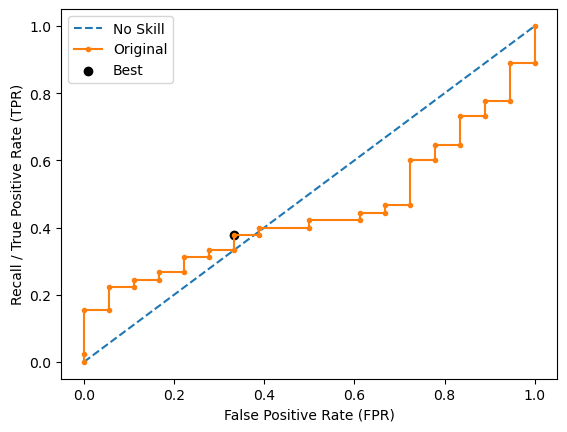

Run 4 - Random State: 3
Test Accuracy: 0.6349206349206349
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.24193548387096772
Test F-0.75 Score: 0.22189349112426032
Test F-1 Score: 0.20689655172413793
Test F-1.5 Score: 0.18932038834951456
Test F-2 Score: 0.18072289156626503
Test G-Mean Score: 0.3701851388657263
Best Threshold=0.170
Best Recall=0.511
Best G-Mean=0.477


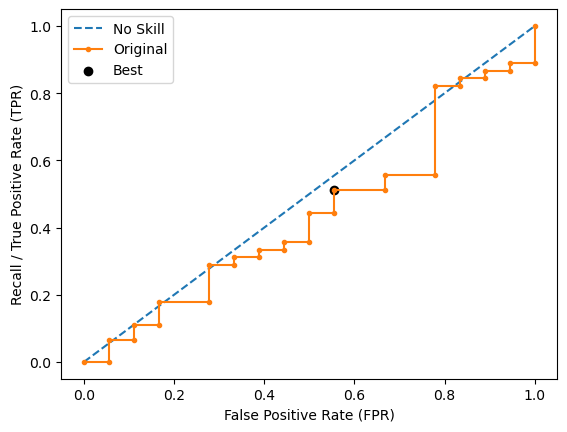

Run 5 - Random State: 4
Test Accuracy: 0.6349206349206349
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.28571428571428575
Test F-0.75 Score: 0.2702702702702703
Test F-1 Score: 0.2580645161290323
Test F-1.5 Score: 0.24299065420560748
Test F-2 Score: 0.2352941176470588
Test G-Mean Score: 0.4216370213557839
Best Threshold=0.325
Best Recall=0.400
Best G-Mean=0.494


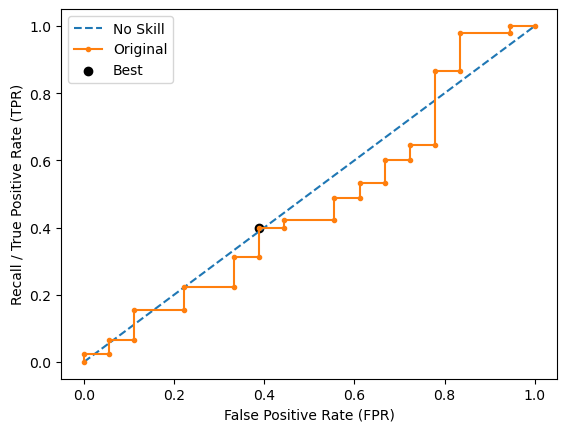

Ave Test Accuracy: 0.6095238095238096
Stdev Test Accuracy: 0.02883476527711896
Ave Test Recall: 0.19999999999999998
Stdev Test Recall: 0.03042903097250923
Ave Test F-0.5 Score: 0.24663617641862207
Stdev Test F-0.5 Score: 0.03254269028517464
Ave Test F-0.75 Score: 0.23518927671719556
Stdev Test F-0.75 Score: 0.0302997668410425
Ave Test F-1 Score: 0.22620649928491976
Stdev Test F-1 Score: 0.029401207312549717
Ave Test F-1.5 Score: 0.21516583834748232
Stdev Test F-1.5 Score: 0.029252088452146458
Ave Test F-2 Score: 0.2095425709045932
Stdev Test F-2 Score: 0.029527328659351617
Ave Test G-mean: 0.39198909949558797
Stdev Test G-mean: 0.02884296991814076
Ave Test Specificity: 0.7733333333333332
Stdev Test Specificity: 0.0427452979148252
Ave Test Precision: 0.26314273961332785
Ave Test NPV: 0.7070707801515255
Ave Runtime: 0.11611795425415039


In [134]:
ld_t02_xgb_gs, ld_t02_xgb_be, ld_t02_xgb_model_info, ld_t02_xgb_metrics_df = xgb_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.3829327535209888
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.8344993192564539
Std Train Score (Recall) 0.012089841483080954
GridSearchCV Runtime: 55.473938941955566 secs
Run 1 - Random State: 0
Test Accuracy: 0.6190476190476191
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.27027027027027023
Test F-0.75 S

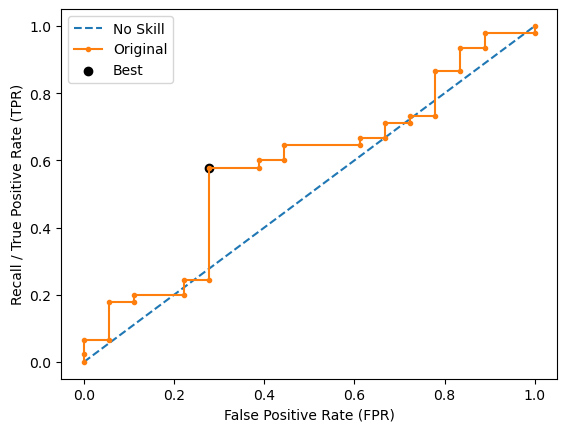

Run 2 - Random State: 1
Test Accuracy: 0.6507936507936508
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.303030303030303
Test F-0.75 Score: 0.28248587570621464
Test F-1 Score: 0.26666666666666666
Test F-1.5 Score: 0.24761904761904757
Test F-2 Score: 0.23809523809523808
Test G-Mean Score: 0.4274529791482521
Best Threshold=0.065
Best Recall=0.867
Best G-Mean=0.581


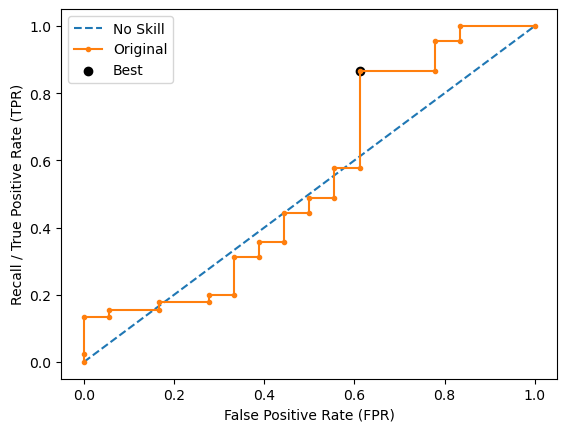

Run 3 - Random State: 2
Test Accuracy: 0.6031746031746031
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.25641025641025644
Test F-0.75 Score: 0.24875621890547261
Test F-1 Score: 0.2424242424242424
Test F-1.5 Score: 0.23423423423423426
Test F-2 Score: 0.2298850574712644
Test G-Mean Score: 0.4097575314352394
Best Threshold=0.433
Best Recall=0.333
Best G-Mean=0.509


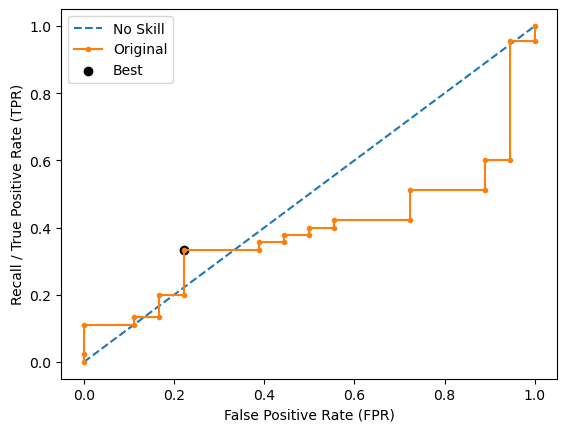

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.303030303030303
Test F-0.75 Score: 0.28248587570621464
Test F-1 Score: 0.26666666666666666
Test F-1.5 Score: 0.24761904761904757
Test F-2 Score: 0.23809523809523808
Test G-Mean Score: 0.4274529791482521
Best Threshold=0.225
Best Recall=0.511
Best G-Mean=0.533


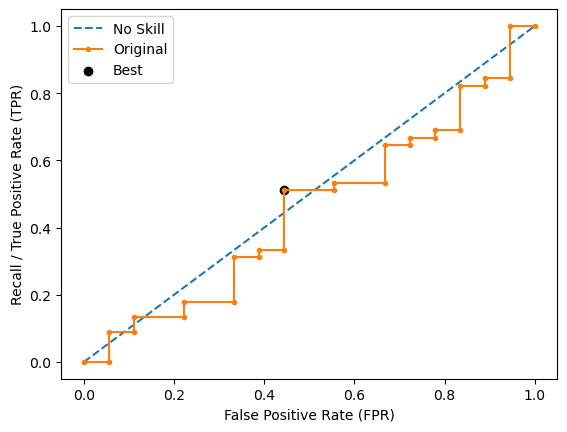

Run 5 - Random State: 4
Test Accuracy: 0.5873015873015873
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.24390243902439027
Test F-0.75 Score: 0.23923444976076555
Test F-1 Score: 0.23529411764705882
Test F-1.5 Score: 0.23008849557522124
Test F-2 Score: 0.22727272727272727
Test G-Mean Score: 0.40368671387966554
Best Threshold=0.300
Best Recall=0.511
Best G-Mean=0.533


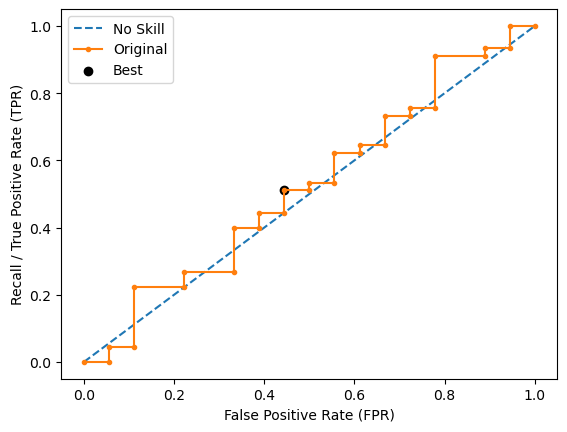

Ave Test Accuracy: 0.6222222222222222
Stdev Test Accuracy: 0.028394513999997338
Ave Test Recall: 0.22222222222222224
Stdev Test Recall: 3.1031676915590914e-17
Ave Test F-0.5 Score: 0.2753287143531046
Stdev Test F-0.5 Score: 0.026953027283553914
Ave Test F-0.75 Score: 0.26240595551832413
Stdev Test F-0.75 Score: 0.01962642743100716
Ave Test F-1 Score: 0.2522103386809269
Stdev Test F-1 Score: 0.014184345673653245
Ave Test F-1.5 Score: 0.23961858702785874
Stdev Test F-1.5 Score: 0.007890010607991736
Ave Test F-2 Score: 0.23318128009387032
Stdev Test F-2 Score: 0.004859484300125975
Ave Test G-mean: 0.41681798265059167
Stdev Test G-mean: 0.010602466276664098
Ave Test Specificity: 0.7822222222222223
Stdev Test Specificity: 0.03975231959999626
Ave Test Precision: 0.2938095238095238
Ave Test NPV: 0.7151454198700756
Ave Runtime: 0.26327009201049806


In [135]:
ld_t02_gbm_gs, ld_t02_gbm_be, ld_t02_gbm_model_info, ld_t02_gbm_metrics_df = gbm_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.43763896510274647
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Recall) 0.6707557875600063
Std Train Score (Recall) 0.03354757317810983
GridSearchCV Runtime: 451.620628118515 secs
Run 1 - Random State: 0
Test Accuracy: 0.4603174603174603
Test 

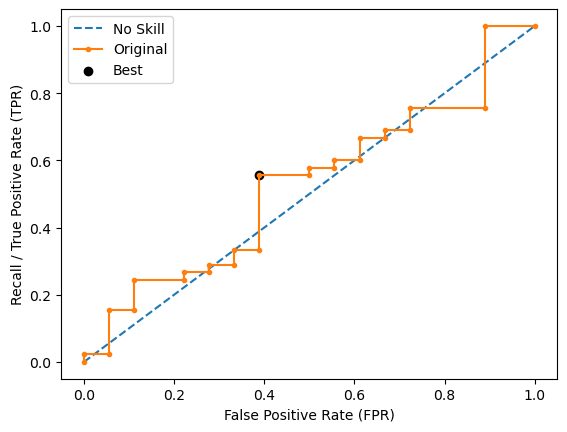

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3623188405797101
Test F-0.75 Score: 0.38940809968847345
Test F-1 Score: 0.4166666666666667
Test F-1.5 Score: 0.46099290780141844
Test F-2 Score: 0.4901960784313726
Test G-Mean Score: 0.5555555555555556
Best Threshold=0.457
Best Recall=0.644
Best G-Mean=0.535


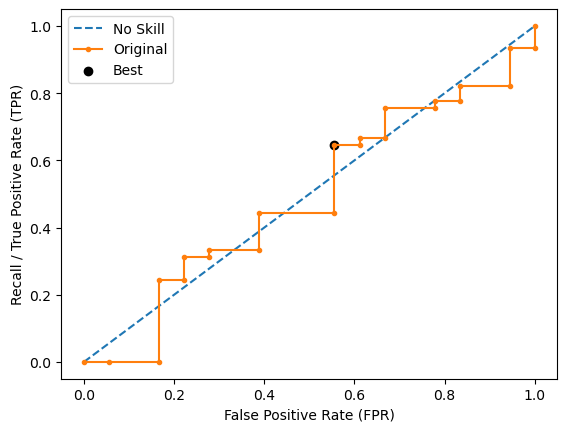

Run 3 - Random State: 2
Test Accuracy: 0.4603174603174603
Test Recall: 0.5
Test F-0.5 Score: 0.2922077922077922
Test F-0.75 Score: 0.31869688385269124
Test F-1 Score: 0.3461538461538462
Test F-1.5 Score: 0.3926174496644295
Test F-2 Score: 0.4245283018867924
Test G-Mean Score: 0.4714045207910317
Best Threshold=0.478
Best Recall=0.689
Best G-Mean=0.587


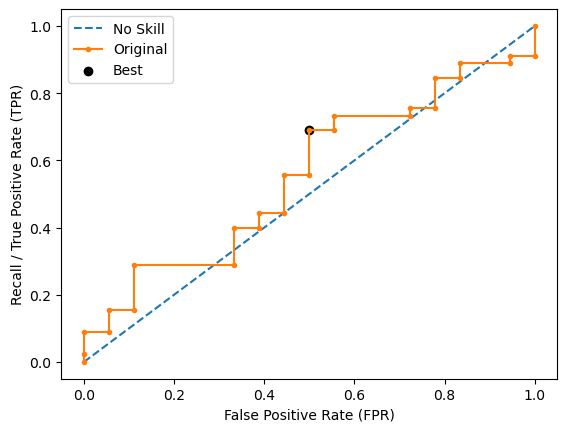

Run 4 - Random State: 3
Test Accuracy: 0.5873015873015873
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.330188679245283
Test F-0.75 Score: 0.34046692607003887
Test F-1 Score: 0.35000000000000003
Test F-1.5 Score: 0.364
Test F-2 Score: 0.3723404255319149
Test G-Mean Score: 0.5091750772173155
Best Threshold=0.438
Best Recall=0.800
Best G-Mean=0.471


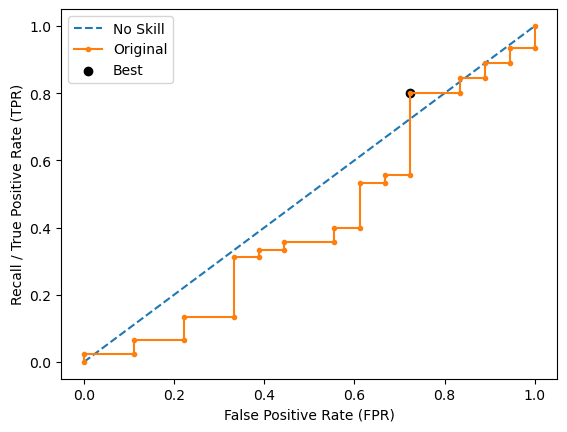

Run 5 - Random State: 4
Test Accuracy: 0.4126984126984127
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3021978021978022
Test F-0.75 Score: 0.3361858190709047
Test F-1 Score: 0.37288135593220345
Test F-1.5 Score: 0.4386503067484662
Test F-2 Score: 0.4867256637168142
Test G-Mean Score: 0.45133546692422
Best Threshold=0.524
Best Recall=0.556
Best G-Mean=0.583


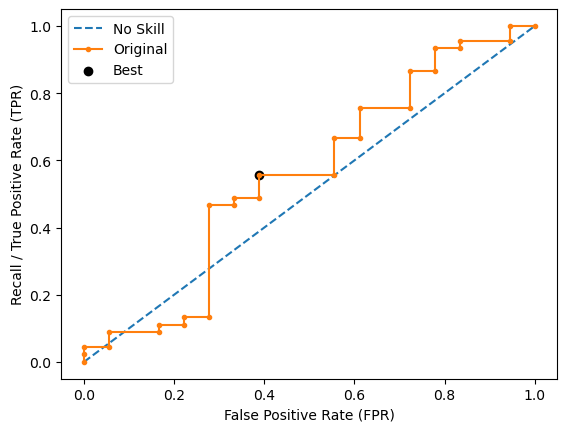

Ave Test Accuracy: 0.49523809523809514
Stdev Test Accuracy: 0.07308485354426249
Ave Test Recall: 0.5111111111111111
Stdev Test Recall: 0.08240220541217404
Ave Test F-0.5 Score: 0.315824181287676
Stdev Test F-0.5 Score: 0.03028711779660739
Ave Test F-0.75 Score: 0.3406909225069599
Stdev Test F-0.75 Score: 0.02898786365256684
Ave Test F-1 Score: 0.3663711429813125
Stdev Test F-1 Score: 0.030238696565759518
Ave Test F-1.5 Score: 0.4097756227757487
Stdev Test F-1.5 Score: 0.03918281226975879
Ave Test F-2 Score: 0.43966375429073734
Stdev Test F-2 Score: 0.049393657325599874
Ave Test G-mean: 0.4917750282558309
Stdev Test G-mean: 0.041340024903031285
Ave Test Specificity: 0.48888888888888893
Stdev Test Specificity: 0.12668615834434865
Ave Test Precision: 0.28984391982957264
Ave Test NPV: 0.7100823202589392
Ave Runtime: 0.19930086135864258


In [136]:
ld_t02_rf_gs, ld_t02_rf_be, ld_t02_rf_model_info, ld_t02_rf_metrics_df = rf_class2(ld_t02, fbeta_scorer(beta=0.5),
                                                            'ageing_class', random_state=0)

In [137]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t02_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t02_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t02_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
9,CatBoost,0.542973,0.074498,0.359554,0.835049,0.711111,1.068632e-01,0.504762,0.079682,0.371976,0.410606,0.451841,0.524693,0.577231
4,Random Forest,0.491775,0.041340,0.437639,0.670756,0.511111,8.240221e-02,0.495238,0.073085,0.315824,0.340691,0.366371,0.409776,0.439664
8,AdaBoost,0.467258,0.042175,0.555004,0.939644,0.511111,8.240221e-02,0.453968,0.038227,0.292098,0.319320,0.347724,0.396267,0.429984
2,Logistic Regression,0.466729,0.054901,0.367988,0.554045,0.488889,9.938080e-02,0.466667,0.064085,0.292023,0.317018,0.342871,0.386621,0.416769
5,Gradient Boosting Machine (GBM),0.416818,0.010602,0.382933,0.834499,0.222222,3.103168e-17,0.622222,0.028395,0.275329,0.262406,0.252210,0.239619,0.233181
6,LightGBM,0.408564,0.097745,0.445009,0.710826,0.233333,9.938080e-02,0.593651,0.079840,0.263209,0.254936,0.248885,0.241955,0.238638
0,k-Nearest Neighbors,0.392858,0.124144,0.430002,0.521338,0.222222,1.242260e-01,0.603175,0.031746,0.243237,0.238275,0.234309,0.229324,0.226728
7,Extreme Gradient Boosting (XGBoost),0.391989,0.028843,0.415903,0.807366,0.200000,3.042903e-02,0.609524,0.028835,0.246636,0.235189,0.226206,0.215166,0.209543
1,SVM Classifier,0.276318,0.048988,0.383952,0.456070,0.811111,1.337955e-01,0.304762,0.013280,0.305139,0.348514,0.398051,0.494743,0.572776
3,Decision Tree,0.238486,0.165415,0.523437,0.484819,0.100000,1.068632e-01,0.634921,0.063492,0.142219,0.128275,0.119437,0.110325,0.106248


## Permutation Test Score

In [11]:
ld_t02['ageing_class'].value_counts()
X.shape

NameError: name 'X' is not defined

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed:   21.8s
[Parallel(n_jobs=-1)]: Done 344 tasks      | elapsed:   43.0s
[Parallel(n_jobs=-1)]: Done 565 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 834 tasks      | elapsed:  1.7min


0.6314771617392774 0.07492507492507493


[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  2.1min finished


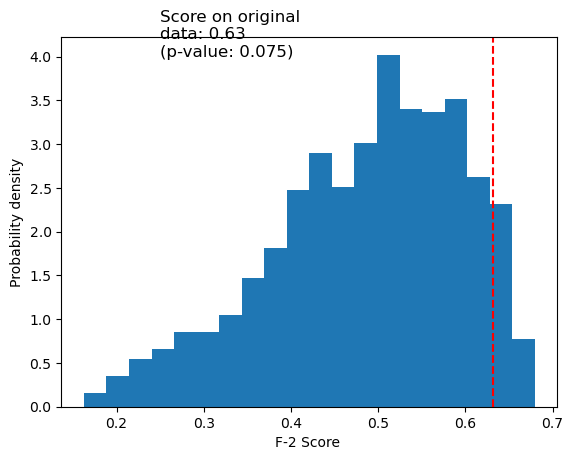

In [19]:
df = ld_t02 # insert DF here
model = ld_t02_adaboost_be # insert model here
label_col = 'ageing_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]

# n_uncorrelated_features = X.shape[1]
rng = np.random.RandomState(seed=0)

# X_rand = rng.normal(size=(X.shape[0], n_uncorrelated_features))
X_rand = rng.normal(size=X.shape)

cv = StratifiedKFold(10, shuffle=True, random_state=0)

score_rand, perm_scores_rand, pvalue_rand = permutation_test_score(
    model, X_rand, y, scoring=fbeta_scorer(beta=2), cv=cv, n_permutations=1000,
    verbose=4, random_state=0, n_jobs=-1
)

fig, ax = plt.subplots()

ax.hist(perm_scores_rand, bins=20, density=True)
ax.axvline(score_rand, ls="--", color="r")
score_label = f"Score on original\ndata: {score_rand:.2f}\n(p-value: {pvalue_rand:.3f})"
ax.text(0.25, 4, score_label, fontsize=12)
ax.set_xlabel("F-2 Score ")
_ = ax.set_ylabel("Probability density")
print(score_rand, pvalue_rand)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed:   23.4s
[Parallel(n_jobs=-1)]: Done 344 tasks      | elapsed:   44.4s
[Parallel(n_jobs=-1)]: Done 565 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 834 tasks      | elapsed:  1.8min


0.4358726048701021 0.14285714285714285


[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  2.1min finished


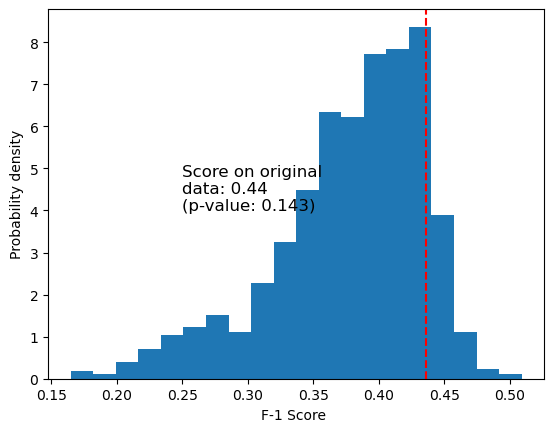

In [20]:
df = ld_t02 # insert DF here
model = ld_t02_adaboost_be # insert model here
label_col = 'ageing_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]

# n_uncorrelated_features = X.shape[1]
rng = np.random.RandomState(seed=0)

# X_rand = rng.normal(size=(X.shape[0], n_uncorrelated_features))
X_rand = rng.normal(size=X.shape)

cv = StratifiedKFold(10, shuffle=True, random_state=0)

score_rand, perm_scores_rand, pvalue_rand = permutation_test_score(
    model, X_rand, y, scoring=fbeta_scorer(beta=1), cv=cv, n_permutations=1000,
    verbose=4, random_state=0, n_jobs=-1
)

fig, ax = plt.subplots()

ax.hist(perm_scores_rand, bins=20, density=True)
ax.axvline(score_rand, ls="--", color="r")
score_label = f"Score on original\ndata: {score_rand:.2f}\n(p-value: {pvalue_rand:.3f})"
ax.text(0.25, 4, score_label, fontsize=12)
ax.set_xlabel("F-1 Score ")
_ = ax.set_ylabel("Probability density")
print(score_rand, pvalue_rand)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done  50 tasks      | elapsed:    7.6s
[Parallel(n_jobs=-1)]: Done 173 tasks      | elapsed:   21.6s
[Parallel(n_jobs=-1)]: Done 344 tasks      | elapsed:   43.5s
[Parallel(n_jobs=-1)]: Done 565 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 834 tasks      | elapsed:  1.8min


0.25830462981154095 0.9250749250749251


[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  2.1min finished


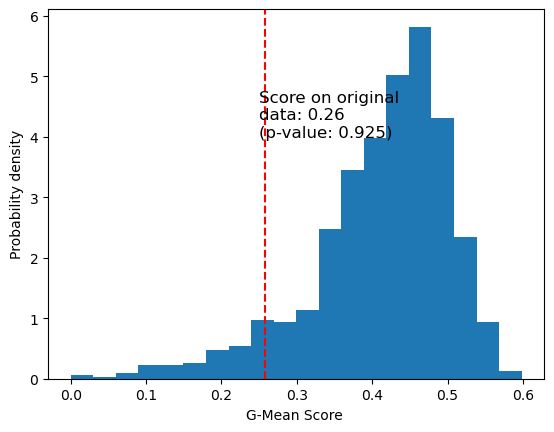

In [21]:
df = ld_t02 # insert DF here
model = ld_t02_adaboost_be # insert model here
label_col = 'ageing_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]

# n_uncorrelated_features = X.shape[1]
rng = np.random.RandomState(seed=0)

# X_rand = rng.normal(size=(X.shape[0], n_uncorrelated_features))
X_rand = rng.normal(size=X.shape)

cv = StratifiedKFold(10, shuffle=True, random_state=0)

score_rand, perm_scores_rand, pvalue_rand = permutation_test_score(
    model, X_rand, y, scoring=g_mean_scorer, cv=cv, n_permutations=1000,
    verbose=4, random_state=0, n_jobs=-1
)

fig, ax = plt.subplots()

ax.hist(perm_scores_rand, bins=20, density=True)
ax.axvline(score_rand, ls="--", color="r")
score_label = f"Score on original\ndata: {score_rand:.2f}\n(p-value: {pvalue_rand:.3f})"
ax.text(0.25, 4, score_label, fontsize=12)
ax.set_xlabel("G-Mean Score ")
_ = ax.set_ylabel("Probability density")
print(score_rand, pvalue_rand)

# LD_T03: OHE, VarThresh

In [138]:
cat_cols = ['gender', 'province', 'job', 'group']
ld_t03_full = ohe_cols(ld_t01.copy(), cat_cols)
# ld_t03_full

In [139]:
df = ld_t03_full
df_X = df.copy().drop(['userId', 'lastFirstName', 'ageing_class'], axis=1)
df_y = df.copy()[['ageing_class']]

In [140]:
selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_X_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

df_X_f01 = df_X_mod
print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

Number of columns: 34
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_BATANGAS', 'province_BULACAN', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_QUEZON', 'province_RIZAL', 'province_SOUTH COTABATO', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_AGRICULTURAL', 'job_ARMED FORCES', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_PROFESIONAL', 'job_UNKNOWN', 'group_SHDG']


In [141]:
df_X_f02 = df.copy().drop(columns=filtered_out_columns)
# df_X_f02 = df_X_f02.copy().drop(columns=cols_to_drop)
df_X_f02

ld_t03 = df_X_f02.copy()

## Optimizing for F-1 Score

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5311538461538462
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, min_samples_leaf=2,
                                        random_state=0))])
Mean Train Score (Recall) 0.5128642626978706
Std Train Score (Recall) 0.052220221566763016
GridSearchCV Runtime: 46.370314598083496 secs
Run 1 - Random State: 0
Test Accuracy: 0.5873015873015873
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.2777777777777778
Test F-0.75 Score: 0.2777777777777778
Test F-1 Score: 0.2777

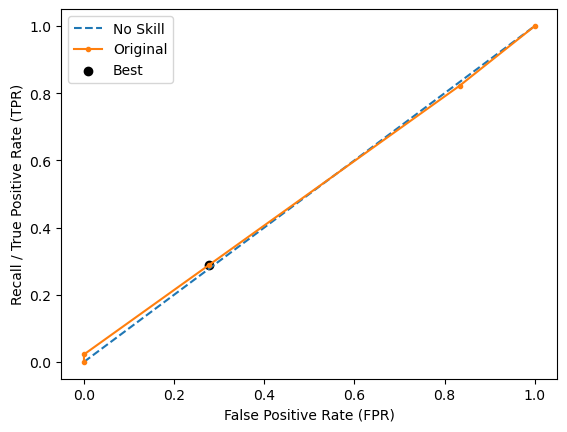

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.411764705882353
Test F-0.75 Score: 0.4545454545454545
Test F-1 Score: 0.5
Test F-1.5 Score: 0.5796178343949044
Test F-2 Score: 0.6363636363636364
Test G-Mean Score: 0.6024640760767094
Best Threshold=0.753
Best Recall=0.289
Best G-Mean=0.380


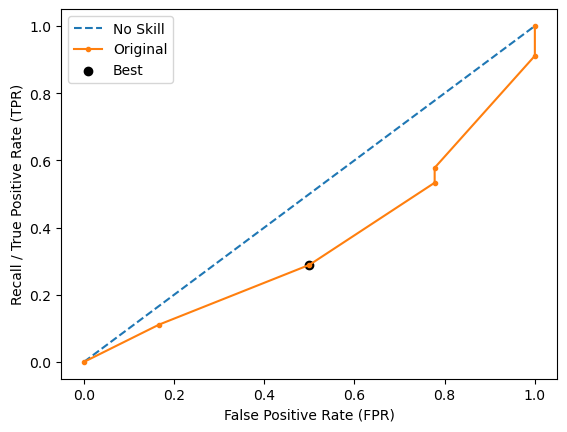

Run 3 - Random State: 2
Test Accuracy: 0.4444444444444444
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.30120481927710846
Test F-0.75 Score: 0.3315649867374006
Test F-1 Score: 0.36363636363636365
Test F-1.5 Score: 0.41935483870967744
Test F-2 Score: 0.45871559633027525
Test G-Mean Score: 0.47140452079103173
Best Threshold=0.541
Best Recall=0.533
Best G-Mean=0.544


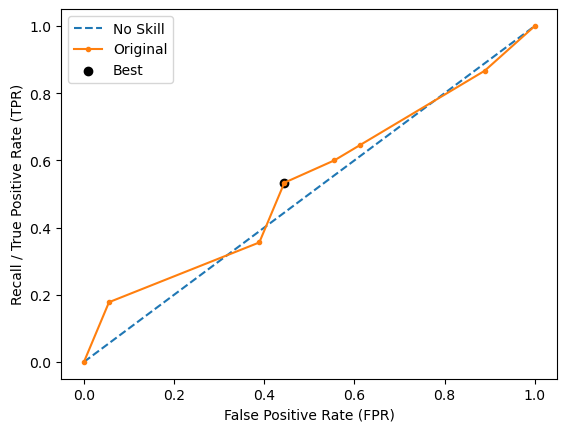

Run 4 - Random State: 3
Test Accuracy: 0.6666666666666666
Test Recall: 0.5
Test F-0.5 Score: 0.44117647058823534
Test F-0.75 Score: 0.4518072289156626
Test F-1 Score: 0.4615384615384615
Test F-1.5 Score: 0.475609756097561
Test F-2 Score: 0.48387096774193544
Test G-Mean Score: 0.6055300708194984
Best Threshold=0.345
Best Recall=0.622
Best G-Mean=0.492


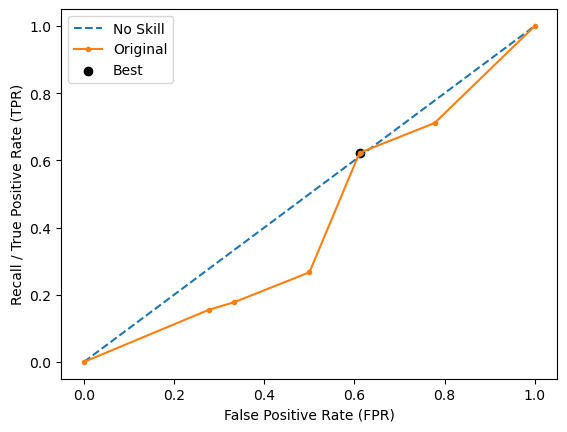

Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.5
Test F-0.5 Score: 0.25862068965517243
Test F-0.75 Score: 0.2862595419847328
Test F-1 Score: 0.3157894736842105
Test F-1.5 Score: 0.3679245283018868
Test F-2 Score: 0.40540540540540543
Test G-Mean Score: 0.408248290463863
Best Threshold=0.562
Best Recall=0.667
Best G-Mean=0.577


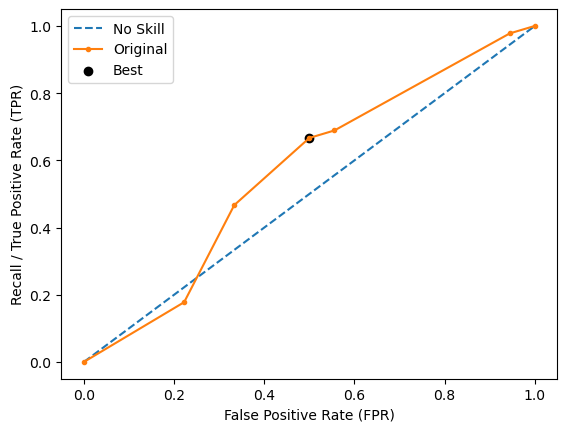

Ave Test Accuracy: 0.526984126984127
Stdev Test Accuracy: 0.1141312889666511
Ave Test Recall: 0.5222222222222223
Stdev Test Recall: 0.17829785039868012
Ave Test F-0.5 Score: 0.33810889263612937
Stdev Test F-0.5 Score: 0.08271673487505027
Ave Test F-0.75 Score: 0.3603909979922057
Stdev Test F-0.75 Score: 0.08713975099507688
Ave Test F-1 Score: 0.38374841532736265
Stdev Test F-1 Score: 0.09462876230772616
Ave Test F-1.5 Score: 0.42405694705636154
Stdev Test F-1.5 Score: 0.1133880895559113
Ave Test F-2 Score: 0.45242667672380604
Stdev Test F-2 Score: 0.12997532162727338
Ave Test G-mean: 0.5064182805191095
Stdev Test G-mean: 0.09185859853110206
Ave Test Specificity: 0.528888888888889
Stdev Test Specificity: 0.1828444660508819
Ave Test Precision: 0.3151619520040573
Ave Test NPV: 0.7308266178266178
Ave Runtime: 0.00622105598449707


In [142]:
ld_t03_dt_gs, ld_t03_dt_be, ld_t03_dt_model_info, ld_t03_dt_metrics_df = dt_class2(ld_t03, fbeta_scorer(beta=1),
                                                                                   'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': ADASYN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.44562318840579707
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0))])
Mean Train Score (Recall) 0.5594739146617003
Std Train Score (Recall) 0.03684044355985176
GridSearchCV Runtime: 15.31925106048584 secs
Run 1 - Random State: 0
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.516
Best Recall=0.511
Best G-Mean=0.608


invalid value encountered in longlong_scalars


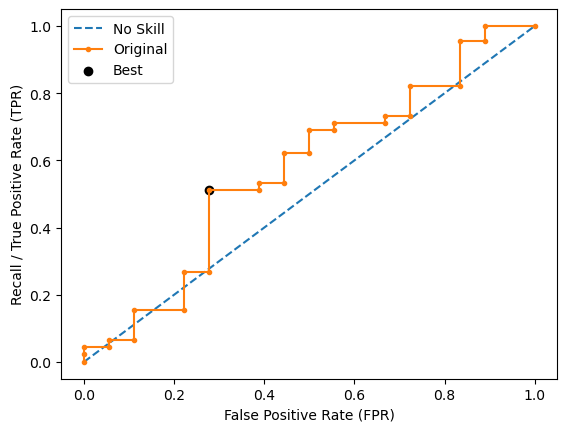

Run 2 - Random State: 1
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.507
Best Recall=0.600
Best G-Mean=0.606


invalid value encountered in longlong_scalars


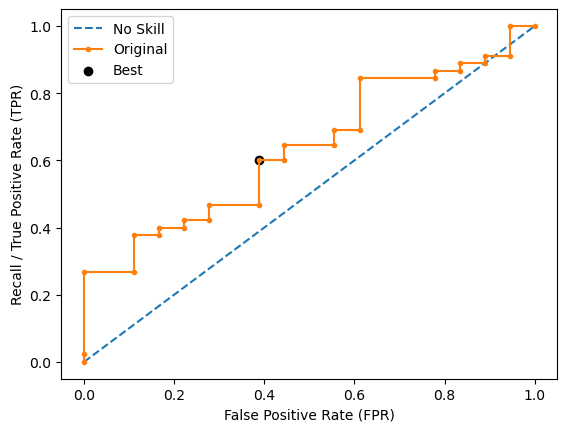

invalid value encountered in longlong_scalars


Run 3 - Random State: 2
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.518
Best Recall=0.356
Best G-Mean=0.507


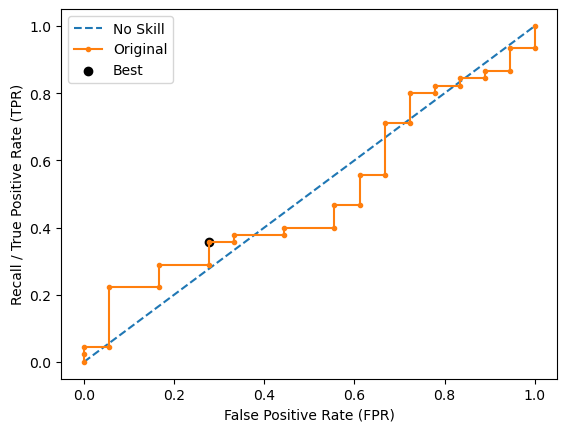

invalid value encountered in longlong_scalars


Run 4 - Random State: 3
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.507
Best Recall=0.756
Best G-Mean=0.680


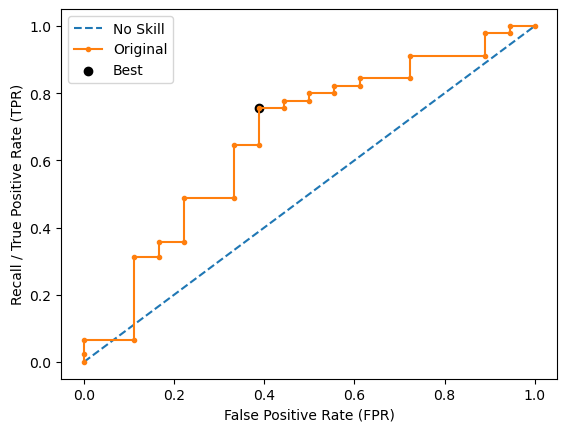

Run 5 - Random State: 4
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.509
Best Recall=0.444
Best G-Mean=0.544


invalid value encountered in longlong_scalars


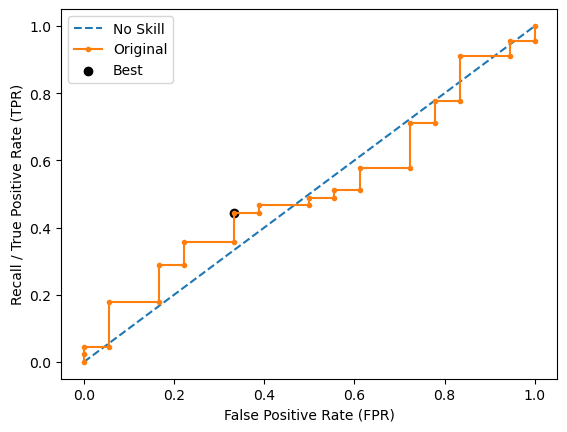

Ave Test Accuracy: 0.2857142857142857
Stdev Test Accuracy: 0.0
Ave Test Recall: 1.0
Stdev Test Recall: 0.0
Ave Test F-0.5 Score: 0.3333333333333333
Stdev Test F-0.5 Score: 0.0
Ave Test F-0.75 Score: 0.38461538461538464
Stdev Test F-0.75 Score: 0.0
Ave Test F-1 Score: 0.4444444444444445
Stdev Test F-1 Score: 0.0
Ave Test F-1.5 Score: 0.5652173913043478
Stdev Test F-1.5 Score: 0.0
Ave Test F-2 Score: 0.6666666666666666
Stdev Test F-2 Score: 0.0
Ave Test G-mean: 0.0
Stdev Test G-mean: 0.0
Ave Test Specificity: 0.0
Stdev Test Specificity: 0.0
Ave Test Precision: 0.2857142857142857
Ave Test NPV: nan
Ave Runtime: 0.03752102851867676


In [143]:
ld_t03_logreg_gs, ld_t03_logreg_be, ld_t03_logreg_model_info, ld_t03_logreg_metrics_df = logreg_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 100.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.4571989459815547
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=100.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.4798666142491149
Std Train Score (Recall) 0.05806374542099074
GridSearchCV Runtime: 26.431994915008545 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.30158730158730157
Test Recall: 0.9444444444444444
Test F-0.5 Score: 0.32945736434108525
Test F-0.75 Score: 0.37878787878787873
Test F-1 Score: 0.4358974358974359
Test F-1.5 Score: 0.5497512437810945
Test F-2 Score: 0.6439393939393

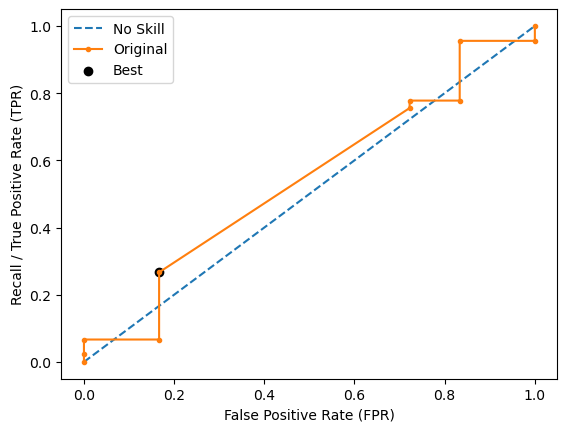

[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.31746031746031744
Test Recall: 0.9444444444444444
Test F-0.5 Score: 0.3346456692913386
Test F-0.75 Score: 0.38426763110307416
Test F-1 Score: 0.4415584415584416
Test F-1.5 Score: 0.5552763819095478
Test F-2 Score: 0.6488549618320612
Test G-Mean Score: 0.25092421756969363
Best Threshold=0.581
Best Recall=0.844
Best G-Mean=0.573


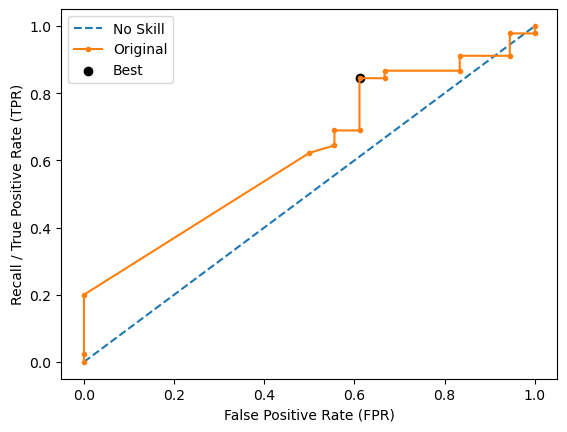

[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.3333333333333333
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.2981651376146789
Test F-0.75 Score: 0.3378378378378379
Test F-1 Score: 0.3823529411764706
Test F-1.5 Score: 0.4668508287292817
Test F-2 Score: 0.5327868852459016
Test G-Mean Score: 0.35832256659104667
Best Threshold=0.533
Best Recall=0.644
Best G-Mean=0.598


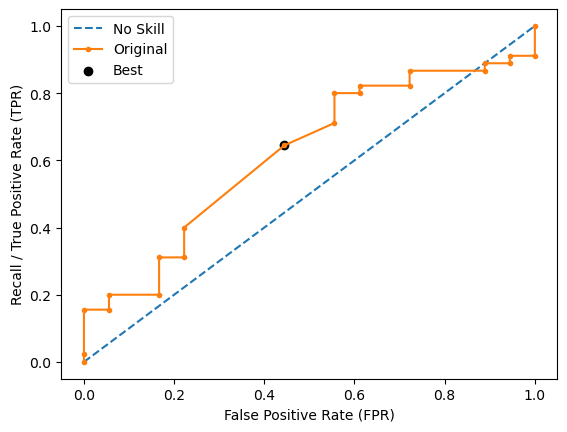

[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.2857142857142857
Test Recall: 1.0
Test F-0.5 Score: 0.3333333333333333
Test F-0.75 Score: 0.38461538461538464
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6666666666666666
Test G-Mean Score: 0.0
Best Threshold=0.595
Best Recall=0.489
Best G-Mean=0.594


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
invalid value encountered in longlong_scalars


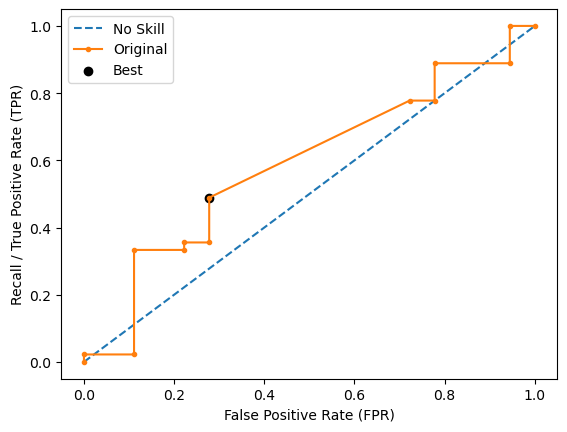

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.30158730158730157
Test Recall: 1.0
Test F-0.5 Score: 0.33834586466165417
Test F-0.75 Score: 0.38994800693240905
Test F-1 Score: 0.45000000000000007
Test F-1.5 Score: 0.5707317073170731
Test F-2 Score: 0.6716417910447762
Test G-Mean Score: 0.14907119849998599
Best Threshold=0.572
Best Recall=0.844
Best G-Mean=0.484


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


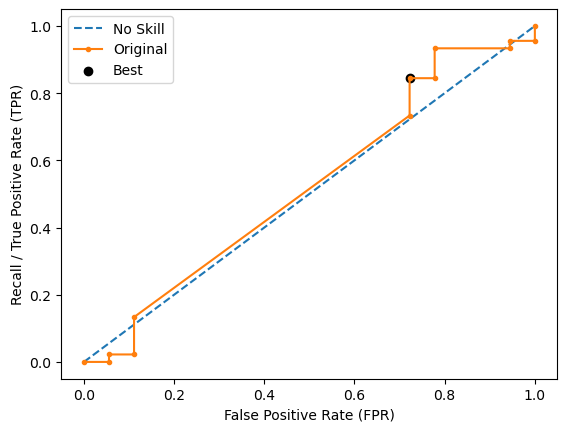

Ave Test Accuracy: 0.30793650793650795
Stdev Test Accuracy: 0.018098022620621237
Ave Test Recall: 0.9222222222222222
Stdev Test Recall: 0.11520245196293179
Ave Test F-0.5 Score: 0.32678947384841806
Stdev Test F-0.5 Score: 0.016313815747143173
Ave Test F-0.75 Score: 0.3750913478553169
Stdev Test F-0.75 Score: 0.021196226780614353
Ave Test F-1 Score: 0.4308506526153585
Stdev Test F-1 Score: 0.027584612838980123
Ave Test F-1.5 Score: 0.541565510608269
Stdev Test F-1.5 Score: 0.0425657033261915
Ave Test F-2 Score: 0.6327779397457599
Stdev Test F-2 Score: 0.05709663831826153
Ave Test G-mean: 0.1926393496756692
Stdev Test G-mean: 0.13229319742359372
Ave Test Specificity: 0.062222222222222213
Stdev Test Specificity: 0.06921071778843306
Ave Test Precision: 0.28150115858262387
Ave Test NPV: 0.7580128205128205
Ave Runtime: 0.026623964309692383


In [144]:
ld_t03_svm_gs, ld_t03_svm_be, ld_t03_svm_model_info, ld_t03_svm_metrics_df = svm_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 400, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5140135878912969
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                max_depth=3, n_estimators=400,
                                random_state=0))])
Mean Train Score (Recall) 0.7442335592202136
Std Train Score (Recall) 0.023506317328513684
GridSearchCV Runtime: 21.47981882095337 secs
Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3763440860215054
Test F-0.75 Score: 0.41966426858513184
Test F-1 Score: 0.46

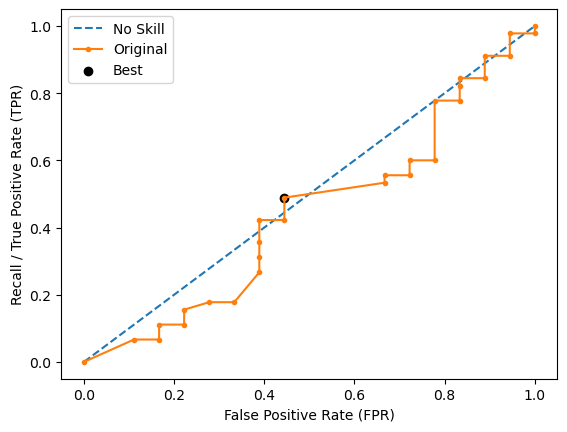

Run 2 - Random State: 1
Test Accuracy: 0.38095238095238093
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.2894736842105263
Test F-0.75 Score: 0.3235294117647059
Test F-1 Score: 0.36065573770491804
Test F-1.5 Score: 0.4281437125748503
Test F-2 Score: 0.47826086956521746
Test G-Mean Score: 0.4201704533597564
Best Threshold=0.503
Best Recall=0.689
Best G-Mean=0.553


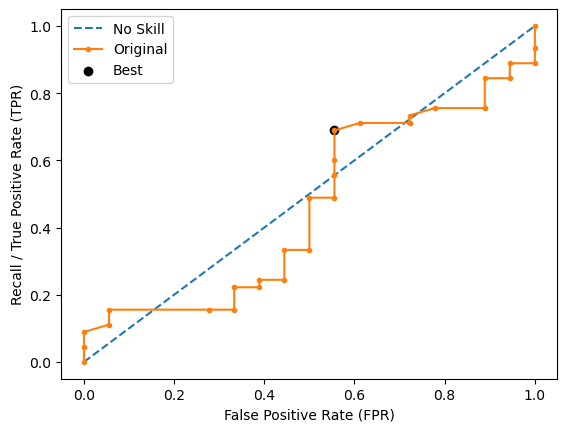

Run 3 - Random State: 2
Test Accuracy: 0.5079365079365079
Test Recall: 0.8888888888888888
Test F-0.5 Score: 0.40404040404040403
Test F-0.75 Score: 0.45351473922902497
Test F-1 Score: 0.5079365079365079
Test F-1.5 Score: 0.608187134502924
Test F-2 Score: 0.6837606837606838
Test G-Mean Score: 0.5621826951410452
Best Threshold=0.582
Best Recall=0.311
Best G-Mean=0.416


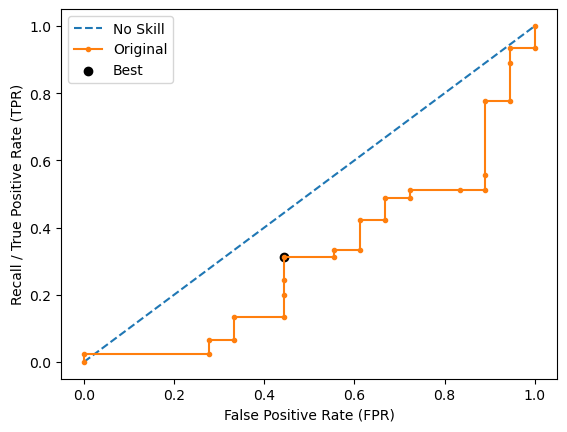

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.4385964912280702
Test F-0.75 Score: 0.45787545787545797
Test F-1 Score: 0.4761904761904762
Test F-1.5 Score: 0.5038759689922481
Test F-2 Score: 0.5208333333333334
Test G-Mean Score: 0.6186404847588913
Best Threshold=0.465
Best Recall=0.511
Best G-Mean=0.413


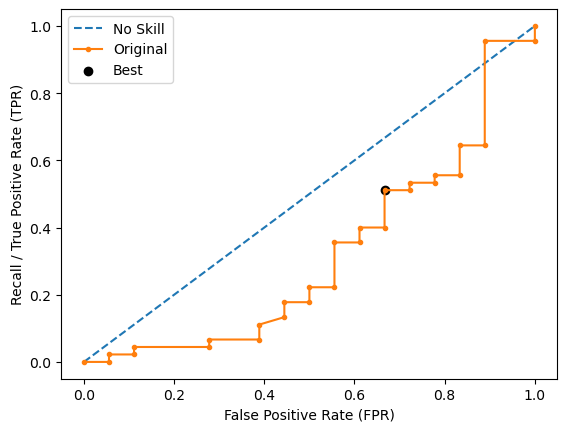

Run 5 - Random State: 4
Test Accuracy: 0.6031746031746031
Test Recall: 0.5
Test F-0.5 Score: 0.3813559322033898
Test F-0.75 Score: 0.400355871886121
Test F-1 Score: 0.41860465116279066
Test F-1.5 Score: 0.4465648854961832
Test F-2 Score: 0.46391752577319584
Test G-Mean Score: 0.5676462121975467
Best Threshold=0.447
Best Recall=0.689
Best G-Mean=0.518


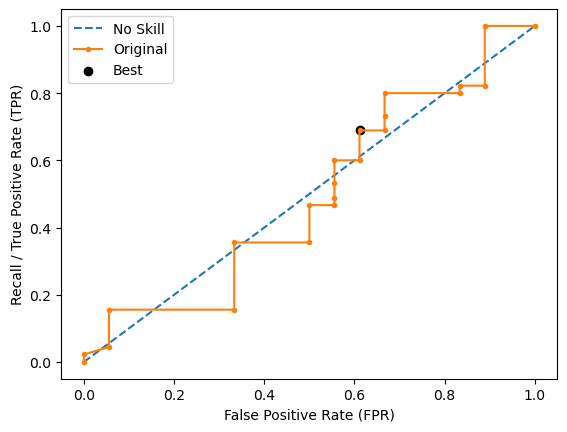

Ave Test Accuracy: 0.526984126984127
Stdev Test Accuracy: 0.10493011987960896
Ave Test Recall: 0.6666666666666666
Stdev Test Recall: 0.161970885967925
Ave Test F-0.5 Score: 0.3779621195407792
Stdev Test F-0.5 Score: 0.05522893973364568
Ave Test F-0.75 Score: 0.41098794986808834
Stdev Test F-0.75 Score: 0.05441571853877742
Ave Test F-1 Score: 0.4460108079322719
Stdev Test F-1 Score: 0.05746489067168549
Ave Test F-1.5 Score: 0.5076573706162714
Stdev Test F-1.5 Score: 0.07432824315830208
Ave Test F-2 Score: 0.5521615000303457
Stdev Test F-2 Score: 0.09404313134996828
Ave Test G-mean: 0.5421396216927855
Stdev Test G-mean: 0.07379223815106772
Ave Test Specificity: 0.47111111111111115
Stdev Test Specificity: 0.18216801361705956
Ave Test Precision: 0.34427390180878553
Ave Test NPV: 0.781288477604267
Ave Runtime: 0.16894278526306153


In [145]:
ld_t03_lgbm_gs, ld_t03_lgbm_be, ld_t03_lgbm_model_info, ld_t03_lgbm_metrics_df = lgbm_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.450873440285205
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 0.8793315313341327
Std Train Score (Recall) 0.010969637704380242
GridSearchCV Runtime: 9.983940124511719 secs
Run 1 - Random State: 0
Test Accuracy: 0.4444444444444444
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.35353535353535354
Test F-0.75 Score: 0.39682539682539

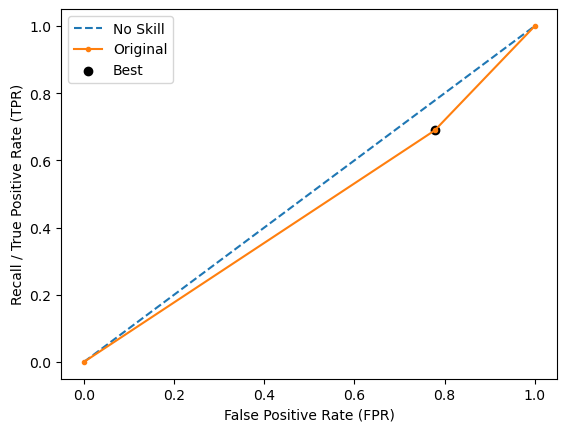

Run 2 - Random State: 1
Test Accuracy: 0.4126984126984127
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.32828282828282823
Test F-0.75 Score: 0.36848072562358275
Test F-1 Score: 0.4126984126984127
Test F-1.5 Score: 0.4941520467836257
Test F-2 Score: 0.5555555555555555
Test G-Mean Score: 0.4567734398020992
Best Threshold=0.731
Best Recall=0.711
Best G-Mean=0.444


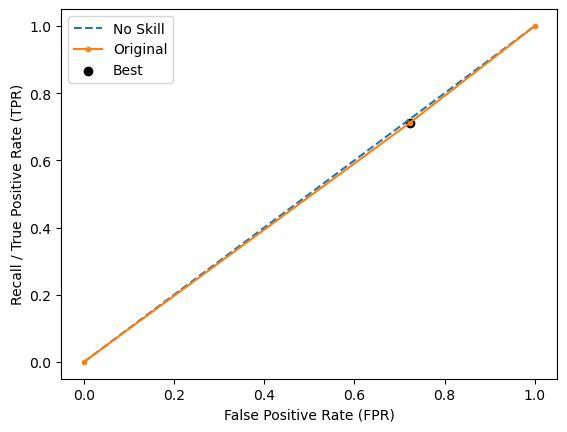

Run 3 - Random State: 2
Test Accuracy: 0.5238095238095238
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.39325842696629215
Test F-0.75 Score: 0.4364089775561097
Test F-1 Score: 0.48275862068965514
Test F-1.5 Score: 0.5652173913043478
Test F-2 Score: 0.6250000000000001
Test G-Mean Score: 0.5730576425878946
Best Threshold=0.731
Best Recall=0.578
Best G-Mean=0.358


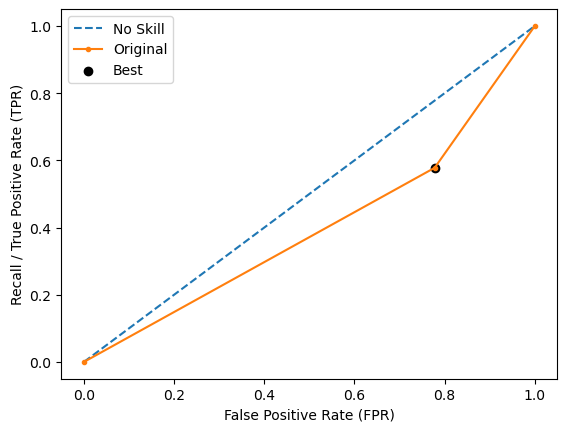

Run 4 - Random State: 3
Test Accuracy: 0.5555555555555556
Test Recall: 0.5
Test F-0.5 Score: 0.34615384615384615
Test F-0.75 Score: 0.3688524590163935
Test F-1 Score: 0.391304347826087
Test F-1.5 Score: 0.42700729927007297
Test F-2 Score: 0.45
Test G-Mean Score: 0.5374838498865699
Best Threshold=0.731
Best Recall=0.422
Best G-Mean=0.459


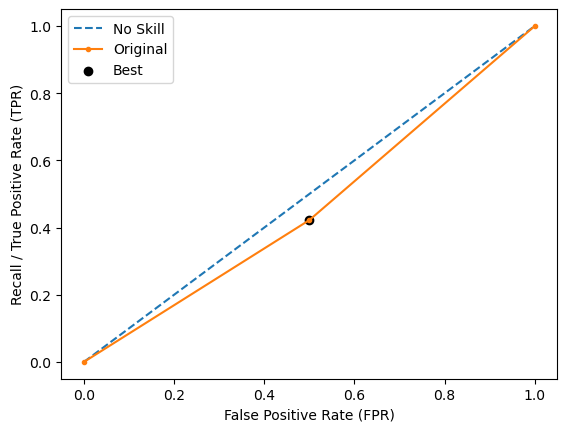

Run 5 - Random State: 4
Test Accuracy: 0.5396825396825397
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.31746031746031744
Test F-0.75 Score: 0.33670033670033667
Test F-1 Score: 0.3555555555555555
Test F-1.5 Score: 0.38518518518518513
Test F-2 Score: 0.404040404040404
Test G-Mean Score: 0.5067446333773946
Best Threshold=0.731
Best Recall=0.422
Best G-Mean=0.484


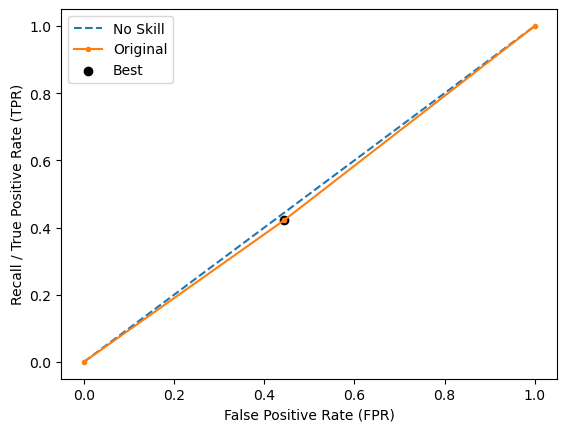

Ave Test Accuracy: 0.49523809523809526
Stdev Test Accuracy: 0.06289400874971096
Ave Test Recall: 0.6444444444444445
Stdev Test Recall: 0.16005400323208818
Ave Test F-0.5 Score: 0.34773815447972745
Stdev Test F-0.5 Score: 0.02916963270687007
Ave Test F-0.75 Score: 0.38145357914436395
Stdev Test F-0.75 Score: 0.03737085916733015
Ave Test F-1 Score: 0.4173522762428309
Stdev Test F-1 Score: 0.048813325998532775
Ave Test F-1.5 Score: 0.480745133046658
Stdev Test F-1.5 Score: 0.07412597315221572
Ave Test F-2 Score: 0.5265773115773116
Stdev Test F-2 Score: 0.09558888281169473
Ave Test G-mean: 0.5131938847804746
Stdev Test G-mean: 0.044304461243525516
Ave Test Specificity: 0.43555555555555553
Stdev Test Specificity: 0.13931047127695534
Ave Test Precision: 0.3135449735449735
Ave Test NPV: 0.7582332643202209
Ave Runtime: 0.10172953605651855


In [146]:
ld_t03_adaboost_gs, ld_t03_adaboost_be, ld_t03_adaboost_model_info, ld_t03_adaboost_metrics_df = adaboost_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.003737
0:	learn: 0.6917816	total: 2.79ms	remaining: 2.78s
1:	learn: 0.6900856	total: 6.9ms	remaining: 3.44s
2:	learn: 0.6887525	total: 10.6ms	remaining: 3.53s
3:	learn: 0.6871987	total: 14.5ms	remaining: 3.62s
4:	learn: 0.6850696	total: 18.4ms	remaining: 3.66s
5:	learn: 0.6830047	total: 21.9ms	remaining: 3.63s
6:	learn: 0.6817076	total: 26ms	remaining: 3.69s
7:	learn: 0.6805988	total: 30ms	remaining: 3.71s
8:	learn: 0.6794629	total: 33.3ms	remaining: 3.67s
9:	learn: 0.6778417	total: 36.5ms	remaining: 3.61s
10:	learn: 0.6761128	total: 41.1ms	remaining: 3.69s
11:	learn: 0.6747120	total: 44.8ms	remaining: 3.69s
12:	learn: 0.6732746	total: 47.7ms	remaining: 3.62s
13:	learn: 0.6711980	total: 51.3ms	remaining: 3.62s
14:	learn: 0.6704376	total: 54.8ms	remaining: 3.6s
15:	learn: 0.6693926	total: 58ms	remaining: 3.57s
16:	learn: 0.6674616	total: 61.1ms	remaining: 3.53s
17:	learn: 0.6662164	total: 64ms	remainin

249:	learn: 0.4241320	total: 387ms	remaining: 1.16s
250:	learn: 0.4233882	total: 389ms	remaining: 1.16s
251:	learn: 0.4226810	total: 390ms	remaining: 1.16s
252:	learn: 0.4219129	total: 392ms	remaining: 1.16s
253:	learn: 0.4209555	total: 393ms	remaining: 1.16s
254:	learn: 0.4200653	total: 395ms	remaining: 1.15s
255:	learn: 0.4190161	total: 396ms	remaining: 1.15s
256:	learn: 0.4179509	total: 398ms	remaining: 1.15s
257:	learn: 0.4173680	total: 399ms	remaining: 1.15s
258:	learn: 0.4167288	total: 401ms	remaining: 1.15s
259:	learn: 0.4159407	total: 403ms	remaining: 1.15s
260:	learn: 0.4151503	total: 404ms	remaining: 1.14s
261:	learn: 0.4144313	total: 406ms	remaining: 1.14s
262:	learn: 0.4137243	total: 407ms	remaining: 1.14s
263:	learn: 0.4132117	total: 409ms	remaining: 1.14s
264:	learn: 0.4126416	total: 410ms	remaining: 1.14s
265:	learn: 0.4120654	total: 411ms	remaining: 1.14s
266:	learn: 0.4112913	total: 413ms	remaining: 1.13s
267:	learn: 0.4102470	total: 414ms	remaining: 1.13s
268:	learn: 

538:	learn: 0.2615604	total: 772ms	remaining: 660ms
539:	learn: 0.2611141	total: 774ms	remaining: 659ms
540:	learn: 0.2608819	total: 775ms	remaining: 658ms
541:	learn: 0.2604892	total: 776ms	remaining: 656ms
542:	learn: 0.2598478	total: 778ms	remaining: 655ms
543:	learn: 0.2595137	total: 779ms	remaining: 653ms
544:	learn: 0.2590280	total: 781ms	remaining: 652ms
545:	learn: 0.2587740	total: 782ms	remaining: 650ms
546:	learn: 0.2584912	total: 783ms	remaining: 649ms
547:	learn: 0.2581054	total: 785ms	remaining: 647ms
548:	learn: 0.2577560	total: 786ms	remaining: 646ms
549:	learn: 0.2573544	total: 788ms	remaining: 644ms
550:	learn: 0.2571060	total: 789ms	remaining: 643ms
551:	learn: 0.2568756	total: 791ms	remaining: 642ms
552:	learn: 0.2563908	total: 792ms	remaining: 640ms
553:	learn: 0.2559564	total: 794ms	remaining: 639ms
554:	learn: 0.2557424	total: 795ms	remaining: 637ms
555:	learn: 0.2554953	total: 796ms	remaining: 636ms
556:	learn: 0.2551100	total: 798ms	remaining: 634ms
557:	learn: 

833:	learn: 0.1772561	total: 1.17s	remaining: 232ms
834:	learn: 0.1770829	total: 1.17s	remaining: 231ms
835:	learn: 0.1769103	total: 1.17s	remaining: 229ms
836:	learn: 0.1766032	total: 1.17s	remaining: 228ms
837:	learn: 0.1764091	total: 1.17s	remaining: 227ms
838:	learn: 0.1760764	total: 1.17s	remaining: 225ms
839:	learn: 0.1757307	total: 1.18s	remaining: 224ms
840:	learn: 0.1754514	total: 1.18s	remaining: 223ms
841:	learn: 0.1751172	total: 1.18s	remaining: 221ms
842:	learn: 0.1749521	total: 1.18s	remaining: 220ms
843:	learn: 0.1747022	total: 1.18s	remaining: 218ms
844:	learn: 0.1745564	total: 1.18s	remaining: 217ms
845:	learn: 0.1742729	total: 1.18s	remaining: 216ms
846:	learn: 0.1740577	total: 1.19s	remaining: 214ms
847:	learn: 0.1738219	total: 1.19s	remaining: 213ms
848:	learn: 0.1735568	total: 1.19s	remaining: 211ms
849:	learn: 0.1732887	total: 1.19s	remaining: 210ms
850:	learn: 0.1729588	total: 1.19s	remaining: 209ms
851:	learn: 0.1726698	total: 1.19s	remaining: 207ms
852:	learn: 

55:	learn: 0.6125092	total: 89.2ms	remaining: 1.5s
56:	learn: 0.6110765	total: 90.8ms	remaining: 1.5s
57:	learn: 0.6101751	total: 92.1ms	remaining: 1.5s
58:	learn: 0.6088894	total: 93.5ms	remaining: 1.49s
59:	learn: 0.6073461	total: 94.7ms	remaining: 1.48s
60:	learn: 0.6061190	total: 96.3ms	remaining: 1.48s
61:	learn: 0.6048521	total: 97.7ms	remaining: 1.48s
62:	learn: 0.6036389	total: 99.1ms	remaining: 1.47s
63:	learn: 0.6030217	total: 101ms	remaining: 1.48s
64:	learn: 0.6012789	total: 102ms	remaining: 1.47s
65:	learn: 0.5998576	total: 104ms	remaining: 1.47s
66:	learn: 0.5989934	total: 105ms	remaining: 1.46s
67:	learn: 0.5977623	total: 107ms	remaining: 1.46s
68:	learn: 0.5966728	total: 108ms	remaining: 1.46s
69:	learn: 0.5958096	total: 109ms	remaining: 1.45s
70:	learn: 0.5950647	total: 111ms	remaining: 1.45s
71:	learn: 0.5942983	total: 112ms	remaining: 1.45s
72:	learn: 0.5932106	total: 114ms	remaining: 1.45s
73:	learn: 0.5921654	total: 115ms	remaining: 1.44s
74:	learn: 0.5906777	total

325:	learn: 0.3711305	total: 477ms	remaining: 987ms
326:	learn: 0.3704766	total: 479ms	remaining: 986ms
327:	learn: 0.3700545	total: 481ms	remaining: 985ms
328:	learn: 0.3694987	total: 482ms	remaining: 984ms
329:	learn: 0.3689160	total: 484ms	remaining: 983ms
330:	learn: 0.3682847	total: 485ms	remaining: 981ms
331:	learn: 0.3675956	total: 487ms	remaining: 980ms
332:	learn: 0.3664158	total: 488ms	remaining: 978ms
333:	learn: 0.3659992	total: 490ms	remaining: 977ms
334:	learn: 0.3652722	total: 492ms	remaining: 976ms
335:	learn: 0.3645737	total: 493ms	remaining: 974ms
336:	learn: 0.3639185	total: 495ms	remaining: 973ms
337:	learn: 0.3632898	total: 496ms	remaining: 972ms
338:	learn: 0.3626526	total: 498ms	remaining: 971ms
339:	learn: 0.3617824	total: 500ms	remaining: 970ms
340:	learn: 0.3609411	total: 501ms	remaining: 969ms
341:	learn: 0.3601292	total: 503ms	remaining: 967ms
342:	learn: 0.3595894	total: 504ms	remaining: 966ms
343:	learn: 0.3588190	total: 506ms	remaining: 965ms
344:	learn: 

574:	learn: 0.2490731	total: 862ms	remaining: 637ms
575:	learn: 0.2488717	total: 864ms	remaining: 636ms
576:	learn: 0.2484523	total: 865ms	remaining: 634ms
577:	learn: 0.2481576	total: 867ms	remaining: 633ms
578:	learn: 0.2476800	total: 868ms	remaining: 631ms
579:	learn: 0.2473577	total: 870ms	remaining: 630ms
580:	learn: 0.2471432	total: 871ms	remaining: 628ms
581:	learn: 0.2466707	total: 873ms	remaining: 627ms
582:	learn: 0.2463139	total: 874ms	remaining: 625ms
583:	learn: 0.2458411	total: 876ms	remaining: 624ms
584:	learn: 0.2455363	total: 877ms	remaining: 622ms
585:	learn: 0.2450319	total: 878ms	remaining: 621ms
586:	learn: 0.2447070	total: 880ms	remaining: 619ms
587:	learn: 0.2443982	total: 881ms	remaining: 618ms
588:	learn: 0.2441497	total: 883ms	remaining: 616ms
589:	learn: 0.2438960	total: 885ms	remaining: 615ms
590:	learn: 0.2433802	total: 886ms	remaining: 613ms
591:	learn: 0.2431047	total: 888ms	remaining: 612ms
592:	learn: 0.2429644	total: 889ms	remaining: 610ms
593:	learn: 

855:	learn: 0.1718204	total: 1.26s	remaining: 212ms
856:	learn: 0.1716105	total: 1.26s	remaining: 210ms
857:	learn: 0.1714163	total: 1.26s	remaining: 209ms
858:	learn: 0.1712571	total: 1.26s	remaining: 207ms
859:	learn: 0.1709923	total: 1.26s	remaining: 206ms
860:	learn: 0.1707327	total: 1.26s	remaining: 204ms
861:	learn: 0.1705154	total: 1.27s	remaining: 203ms
862:	learn: 0.1701979	total: 1.27s	remaining: 201ms
863:	learn: 0.1699557	total: 1.27s	remaining: 200ms
864:	learn: 0.1698144	total: 1.27s	remaining: 198ms
865:	learn: 0.1696158	total: 1.27s	remaining: 197ms
866:	learn: 0.1693652	total: 1.27s	remaining: 195ms
867:	learn: 0.1691369	total: 1.27s	remaining: 194ms
868:	learn: 0.1688821	total: 1.28s	remaining: 193ms
869:	learn: 0.1686341	total: 1.28s	remaining: 191ms
870:	learn: 0.1685076	total: 1.28s	remaining: 190ms
871:	learn: 0.1682700	total: 1.28s	remaining: 188ms
872:	learn: 0.1680402	total: 1.28s	remaining: 187ms
873:	learn: 0.1678044	total: 1.28s	remaining: 185ms
874:	learn: 

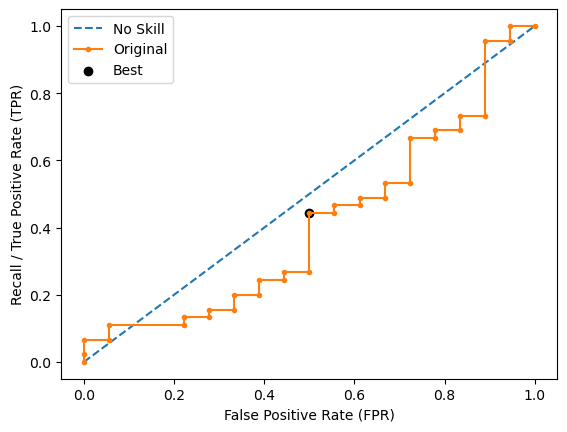

Learning rate set to 0.003754
0:	learn: 0.6919058	total: 1.89ms	remaining: 1.89s
1:	learn: 0.6899966	total: 3.36ms	remaining: 1.68s
2:	learn: 0.6889517	total: 5.06ms	remaining: 1.68s
3:	learn: 0.6877870	total: 6.36ms	remaining: 1.58s
4:	learn: 0.6860781	total: 7.58ms	remaining: 1.51s
5:	learn: 0.6843333	total: 9.07ms	remaining: 1.5s
6:	learn: 0.6830244	total: 10.6ms	remaining: 1.5s
7:	learn: 0.6821358	total: 11.8ms	remaining: 1.47s
8:	learn: 0.6805214	total: 13.1ms	remaining: 1.44s
9:	learn: 0.6786987	total: 14.6ms	remaining: 1.45s
10:	learn: 0.6769405	total: 16.3ms	remaining: 1.46s
11:	learn: 0.6753257	total: 17.6ms	remaining: 1.45s
12:	learn: 0.6736374	total: 18.8ms	remaining: 1.43s
13:	learn: 0.6719932	total: 20.2ms	remaining: 1.42s
14:	learn: 0.6697309	total: 21.4ms	remaining: 1.41s
15:	learn: 0.6689380	total: 22.6ms	remaining: 1.39s
16:	learn: 0.6673402	total: 23.7ms	remaining: 1.37s
17:	learn: 0.6657329	total: 24.8ms	remaining: 1.35s
18:	learn: 0.6641765	total: 26ms	remaining: 1.

163:	learn: 0.4893761	total: 224ms	remaining: 1.14s
164:	learn: 0.4882255	total: 226ms	remaining: 1.14s
165:	learn: 0.4872369	total: 228ms	remaining: 1.14s
166:	learn: 0.4864305	total: 229ms	remaining: 1.14s
167:	learn: 0.4855042	total: 230ms	remaining: 1.14s
168:	learn: 0.4845346	total: 232ms	remaining: 1.14s
169:	learn: 0.4836870	total: 233ms	remaining: 1.14s
170:	learn: 0.4824913	total: 235ms	remaining: 1.14s
171:	learn: 0.4817197	total: 236ms	remaining: 1.14s
172:	learn: 0.4804947	total: 238ms	remaining: 1.14s
173:	learn: 0.4797700	total: 239ms	remaining: 1.14s
174:	learn: 0.4784285	total: 241ms	remaining: 1.13s
175:	learn: 0.4772429	total: 242ms	remaining: 1.13s
176:	learn: 0.4763092	total: 244ms	remaining: 1.13s
177:	learn: 0.4752933	total: 246ms	remaining: 1.13s
178:	learn: 0.4741441	total: 247ms	remaining: 1.13s
179:	learn: 0.4734657	total: 249ms	remaining: 1.13s
180:	learn: 0.4725214	total: 251ms	remaining: 1.14s
181:	learn: 0.4718596	total: 253ms	remaining: 1.14s
182:	learn: 

395:	learn: 0.3267816	total: 579ms	remaining: 883ms
396:	learn: 0.3260969	total: 580ms	remaining: 881ms
397:	learn: 0.3256999	total: 582ms	remaining: 880ms
398:	learn: 0.3253356	total: 583ms	remaining: 879ms
399:	learn: 0.3248572	total: 585ms	remaining: 877ms
400:	learn: 0.3242984	total: 586ms	remaining: 875ms
401:	learn: 0.3240243	total: 588ms	remaining: 874ms
402:	learn: 0.3236006	total: 589ms	remaining: 873ms
403:	learn: 0.3231191	total: 590ms	remaining: 871ms
404:	learn: 0.3225730	total: 592ms	remaining: 870ms
405:	learn: 0.3219076	total: 594ms	remaining: 869ms
406:	learn: 0.3214414	total: 595ms	remaining: 868ms
407:	learn: 0.3210653	total: 597ms	remaining: 866ms
408:	learn: 0.3205126	total: 599ms	remaining: 865ms
409:	learn: 0.3202514	total: 600ms	remaining: 864ms
410:	learn: 0.3197342	total: 602ms	remaining: 862ms
411:	learn: 0.3190800	total: 603ms	remaining: 861ms
412:	learn: 0.3187561	total: 605ms	remaining: 860ms
413:	learn: 0.3182049	total: 607ms	remaining: 860ms
414:	learn: 

667:	learn: 0.2218790	total: 965ms	remaining: 480ms
668:	learn: 0.2214173	total: 966ms	remaining: 478ms
669:	learn: 0.2210838	total: 968ms	remaining: 477ms
670:	learn: 0.2207040	total: 969ms	remaining: 475ms
671:	learn: 0.2203430	total: 971ms	remaining: 474ms
672:	learn: 0.2200280	total: 972ms	remaining: 472ms
673:	learn: 0.2197781	total: 973ms	remaining: 471ms
674:	learn: 0.2194529	total: 975ms	remaining: 469ms
675:	learn: 0.2190047	total: 976ms	remaining: 468ms
676:	learn: 0.2187071	total: 978ms	remaining: 466ms
677:	learn: 0.2183120	total: 979ms	remaining: 465ms
678:	learn: 0.2180874	total: 981ms	remaining: 464ms
679:	learn: 0.2179094	total: 982ms	remaining: 462ms
680:	learn: 0.2177981	total: 984ms	remaining: 461ms
681:	learn: 0.2175674	total: 985ms	remaining: 459ms
682:	learn: 0.2172823	total: 987ms	remaining: 458ms
683:	learn: 0.2170630	total: 988ms	remaining: 457ms
684:	learn: 0.2169610	total: 989ms	remaining: 455ms
685:	learn: 0.2164018	total: 991ms	remaining: 454ms
686:	learn: 

836:	learn: 0.1784512	total: 1.2s	remaining: 233ms
837:	learn: 0.1781775	total: 1.2s	remaining: 232ms
838:	learn: 0.1778860	total: 1.2s	remaining: 230ms
839:	learn: 0.1776848	total: 1.2s	remaining: 229ms
840:	learn: 0.1774660	total: 1.2s	remaining: 228ms
841:	learn: 0.1773344	total: 1.2s	remaining: 226ms
842:	learn: 0.1771192	total: 1.21s	remaining: 225ms
843:	learn: 0.1769073	total: 1.21s	remaining: 223ms
844:	learn: 0.1766724	total: 1.21s	remaining: 222ms
845:	learn: 0.1765210	total: 1.21s	remaining: 220ms
846:	learn: 0.1762583	total: 1.21s	remaining: 219ms
847:	learn: 0.1761249	total: 1.21s	remaining: 218ms
848:	learn: 0.1758007	total: 1.22s	remaining: 216ms
849:	learn: 0.1757583	total: 1.22s	remaining: 215ms
850:	learn: 0.1755260	total: 1.22s	remaining: 213ms
851:	learn: 0.1752361	total: 1.22s	remaining: 212ms
852:	learn: 0.1751441	total: 1.22s	remaining: 210ms
853:	learn: 0.1749944	total: 1.22s	remaining: 209ms
854:	learn: 0.1747493	total: 1.22s	remaining: 207ms
855:	learn: 0.1745

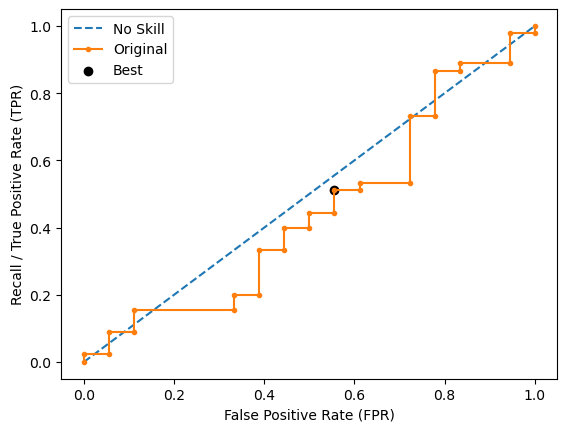

Learning rate set to 0.003951
0:	learn: 0.6915805	total: 1.78ms	remaining: 1.78s
1:	learn: 0.6893436	total: 2.98ms	remaining: 1.49s
2:	learn: 0.6880081	total: 4.43ms	remaining: 1.47s
3:	learn: 0.6869162	total: 5.6ms	remaining: 1.39s
4:	learn: 0.6851982	total: 6.71ms	remaining: 1.33s
5:	learn: 0.6836227	total: 8.02ms	remaining: 1.33s
6:	learn: 0.6824090	total: 9.71ms	remaining: 1.38s
7:	learn: 0.6810702	total: 11ms	remaining: 1.36s
8:	learn: 0.6794643	total: 12.4ms	remaining: 1.36s
9:	learn: 0.6774639	total: 13.6ms	remaining: 1.35s
10:	learn: 0.6763151	total: 14.7ms	remaining: 1.32s
11:	learn: 0.6746187	total: 16ms	remaining: 1.32s
12:	learn: 0.6734646	total: 17.3ms	remaining: 1.32s
13:	learn: 0.6717501	total: 18.5ms	remaining: 1.3s
14:	learn: 0.6704188	total: 19.9ms	remaining: 1.31s
15:	learn: 0.6696480	total: 21.2ms	remaining: 1.3s
16:	learn: 0.6681084	total: 22.4ms	remaining: 1.3s
17:	learn: 0.6663520	total: 23.6ms	remaining: 1.29s
18:	learn: 0.6646717	total: 24.6ms	remaining: 1.27s


160:	learn: 0.5051210	total: 202ms	remaining: 1.05s
161:	learn: 0.5040708	total: 203ms	remaining: 1.05s
162:	learn: 0.5030938	total: 205ms	remaining: 1.05s
163:	learn: 0.5023196	total: 206ms	remaining: 1.05s
164:	learn: 0.5013081	total: 208ms	remaining: 1.05s
165:	learn: 0.5002076	total: 209ms	remaining: 1.05s
166:	learn: 0.4993078	total: 211ms	remaining: 1.05s
167:	learn: 0.4987701	total: 213ms	remaining: 1.05s
168:	learn: 0.4976675	total: 214ms	remaining: 1.05s
169:	learn: 0.4967605	total: 216ms	remaining: 1.05s
170:	learn: 0.4959707	total: 217ms	remaining: 1.05s
171:	learn: 0.4953836	total: 218ms	remaining: 1.05s
172:	learn: 0.4948477	total: 219ms	remaining: 1.05s
173:	learn: 0.4943374	total: 221ms	remaining: 1.05s
174:	learn: 0.4937072	total: 222ms	remaining: 1.05s
175:	learn: 0.4929973	total: 224ms	remaining: 1.05s
176:	learn: 0.4922053	total: 225ms	remaining: 1.05s
177:	learn: 0.4913729	total: 227ms	remaining: 1.05s
178:	learn: 0.4908694	total: 228ms	remaining: 1.05s
179:	learn: 

429:	learn: 0.3338272	total: 599ms	remaining: 793ms
430:	learn: 0.3334631	total: 601ms	remaining: 793ms
431:	learn: 0.3330039	total: 602ms	remaining: 792ms
432:	learn: 0.3323656	total: 605ms	remaining: 792ms
433:	learn: 0.3319860	total: 606ms	remaining: 791ms
434:	learn: 0.3316426	total: 608ms	remaining: 790ms
435:	learn: 0.3313399	total: 610ms	remaining: 789ms
436:	learn: 0.3308739	total: 612ms	remaining: 788ms
437:	learn: 0.3306707	total: 614ms	remaining: 787ms
438:	learn: 0.3299691	total: 615ms	remaining: 786ms
439:	learn: 0.3294178	total: 617ms	remaining: 786ms
440:	learn: 0.3289124	total: 619ms	remaining: 785ms
441:	learn: 0.3284589	total: 621ms	remaining: 784ms
442:	learn: 0.3282967	total: 624ms	remaining: 785ms
443:	learn: 0.3277142	total: 628ms	remaining: 786ms
444:	learn: 0.3271037	total: 629ms	remaining: 785ms
445:	learn: 0.3266433	total: 631ms	remaining: 784ms
446:	learn: 0.3260052	total: 633ms	remaining: 783ms
447:	learn: 0.3257043	total: 634ms	remaining: 782ms
448:	learn: 

636:	learn: 0.2509686	total: 984ms	remaining: 561ms
637:	learn: 0.2505849	total: 986ms	remaining: 559ms
638:	learn: 0.2502259	total: 987ms	remaining: 558ms
639:	learn: 0.2499410	total: 989ms	remaining: 556ms
640:	learn: 0.2495256	total: 990ms	remaining: 555ms
641:	learn: 0.2493658	total: 992ms	remaining: 553ms
642:	learn: 0.2489282	total: 993ms	remaining: 551ms
643:	learn: 0.2486126	total: 995ms	remaining: 550ms
644:	learn: 0.2482060	total: 996ms	remaining: 548ms
645:	learn: 0.2479728	total: 998ms	remaining: 547ms
646:	learn: 0.2476049	total: 999ms	remaining: 545ms
647:	learn: 0.2474844	total: 1s	remaining: 544ms
648:	learn: 0.2470981	total: 1s	remaining: 542ms
649:	learn: 0.2468345	total: 1s	remaining: 540ms
650:	learn: 0.2467078	total: 1s	remaining: 539ms
651:	learn: 0.2464162	total: 1.01s	remaining: 538ms
652:	learn: 0.2461492	total: 1.01s	remaining: 536ms
653:	learn: 0.2457622	total: 1.01s	remaining: 535ms
654:	learn: 0.2454104	total: 1.01s	remaining: 534ms
655:	learn: 0.2451176	to

859:	learn: 0.1916092	total: 1.37s	remaining: 223ms
860:	learn: 0.1914062	total: 1.37s	remaining: 221ms
861:	learn: 0.1911643	total: 1.37s	remaining: 220ms
862:	learn: 0.1907659	total: 1.37s	remaining: 218ms
863:	learn: 0.1905110	total: 1.37s	remaining: 216ms
864:	learn: 0.1903451	total: 1.38s	remaining: 215ms
865:	learn: 0.1901883	total: 1.38s	remaining: 213ms
866:	learn: 0.1898708	total: 1.38s	remaining: 212ms
867:	learn: 0.1896048	total: 1.38s	remaining: 210ms
868:	learn: 0.1893274	total: 1.38s	remaining: 208ms
869:	learn: 0.1891046	total: 1.38s	remaining: 207ms
870:	learn: 0.1889899	total: 1.39s	remaining: 205ms
871:	learn: 0.1887665	total: 1.39s	remaining: 204ms
872:	learn: 0.1884987	total: 1.39s	remaining: 203ms
873:	learn: 0.1882562	total: 1.39s	remaining: 201ms
874:	learn: 0.1879895	total: 1.4s	remaining: 199ms
875:	learn: 0.1878432	total: 1.4s	remaining: 198ms
876:	learn: 0.1876330	total: 1.4s	remaining: 196ms
877:	learn: 0.1875470	total: 1.4s	remaining: 195ms
878:	learn: 0.18

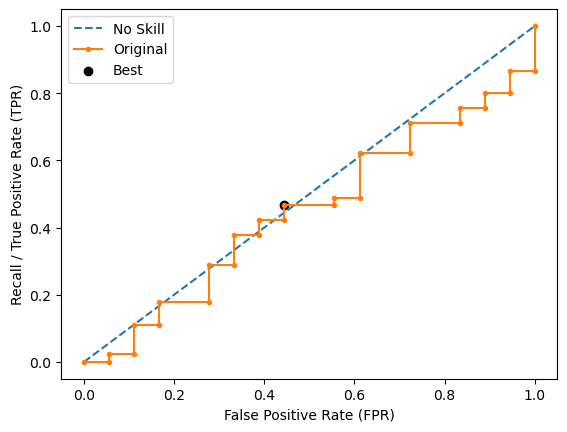

Learning rate set to 0.003719
0:	learn: 0.6916888	total: 2.43ms	remaining: 2.42s
1:	learn: 0.6904323	total: 4.96ms	remaining: 2.48s
2:	learn: 0.6892938	total: 7.79ms	remaining: 2.59s
3:	learn: 0.6879154	total: 10.1ms	remaining: 2.51s
4:	learn: 0.6863660	total: 12.7ms	remaining: 2.53s
5:	learn: 0.6851464	total: 15.6ms	remaining: 2.58s
6:	learn: 0.6835306	total: 18.3ms	remaining: 2.6s
7:	learn: 0.6828914	total: 20.8ms	remaining: 2.57s
8:	learn: 0.6815137	total: 23ms	remaining: 2.53s
9:	learn: 0.6799710	total: 24.3ms	remaining: 2.4s
10:	learn: 0.6793167	total: 26.1ms	remaining: 2.35s
11:	learn: 0.6784271	total: 28.7ms	remaining: 2.36s
12:	learn: 0.6771103	total: 31.1ms	remaining: 2.36s
13:	learn: 0.6757001	total: 33.1ms	remaining: 2.33s
14:	learn: 0.6748006	total: 35.3ms	remaining: 2.32s
15:	learn: 0.6739623	total: 37.6ms	remaining: 2.31s
16:	learn: 0.6730199	total: 39.5ms	remaining: 2.28s
17:	learn: 0.6719610	total: 41.5ms	remaining: 2.27s
18:	learn: 0.6699421	total: 43.8ms	remaining: 2.

325:	learn: 0.4116649	total: 388ms	remaining: 802ms
326:	learn: 0.4109355	total: 389ms	remaining: 802ms
327:	learn: 0.4102803	total: 391ms	remaining: 800ms
328:	learn: 0.4094109	total: 392ms	remaining: 800ms
329:	learn: 0.4086995	total: 393ms	remaining: 799ms
330:	learn: 0.4081934	total: 394ms	remaining: 797ms
331:	learn: 0.4077523	total: 396ms	remaining: 796ms
332:	learn: 0.4071509	total: 397ms	remaining: 795ms
333:	learn: 0.4061292	total: 398ms	remaining: 794ms
334:	learn: 0.4055628	total: 399ms	remaining: 793ms
335:	learn: 0.4051454	total: 401ms	remaining: 792ms
336:	learn: 0.4048256	total: 402ms	remaining: 791ms
337:	learn: 0.4041709	total: 403ms	remaining: 789ms
338:	learn: 0.4035070	total: 404ms	remaining: 788ms
339:	learn: 0.4024954	total: 406ms	remaining: 787ms
340:	learn: 0.4021713	total: 407ms	remaining: 786ms
341:	learn: 0.4014410	total: 408ms	remaining: 785ms
342:	learn: 0.4008819	total: 409ms	remaining: 784ms
343:	learn: 0.4006133	total: 410ms	remaining: 783ms
344:	learn: 

483:	learn: 0.3283373	total: 581ms	remaining: 620ms
484:	learn: 0.3278983	total: 583ms	remaining: 619ms
485:	learn: 0.3272167	total: 584ms	remaining: 618ms
486:	learn: 0.3266205	total: 586ms	remaining: 617ms
487:	learn: 0.3260692	total: 587ms	remaining: 616ms
488:	learn: 0.3255636	total: 588ms	remaining: 615ms
489:	learn: 0.3251525	total: 590ms	remaining: 614ms
490:	learn: 0.3248721	total: 591ms	remaining: 613ms
491:	learn: 0.3243979	total: 593ms	remaining: 612ms
492:	learn: 0.3241482	total: 594ms	remaining: 611ms
493:	learn: 0.3239905	total: 595ms	remaining: 610ms
494:	learn: 0.3235793	total: 597ms	remaining: 609ms
495:	learn: 0.3230127	total: 598ms	remaining: 607ms
496:	learn: 0.3225250	total: 599ms	remaining: 606ms
497:	learn: 0.3220652	total: 601ms	remaining: 605ms
498:	learn: 0.3218822	total: 602ms	remaining: 604ms
499:	learn: 0.3218562	total: 603ms	remaining: 603ms
500:	learn: 0.3215880	total: 604ms	remaining: 602ms
501:	learn: 0.3208770	total: 605ms	remaining: 600ms
502:	learn: 

777:	learn: 0.2255608	total: 970ms	remaining: 277ms
778:	learn: 0.2253393	total: 971ms	remaining: 276ms
779:	learn: 0.2248643	total: 973ms	remaining: 274ms
780:	learn: 0.2245562	total: 974ms	remaining: 273ms
781:	learn: 0.2243595	total: 975ms	remaining: 272ms
782:	learn: 0.2240993	total: 977ms	remaining: 271ms
783:	learn: 0.2238013	total: 978ms	remaining: 270ms
784:	learn: 0.2235573	total: 980ms	remaining: 268ms
785:	learn: 0.2234199	total: 981ms	remaining: 267ms
786:	learn: 0.2231583	total: 983ms	remaining: 266ms
787:	learn: 0.2230616	total: 984ms	remaining: 265ms
788:	learn: 0.2228119	total: 985ms	remaining: 264ms
789:	learn: 0.2227039	total: 987ms	remaining: 262ms
790:	learn: 0.2225301	total: 988ms	remaining: 261ms
791:	learn: 0.2220505	total: 990ms	remaining: 260ms
792:	learn: 0.2217795	total: 991ms	remaining: 259ms
793:	learn: 0.2215127	total: 993ms	remaining: 258ms
794:	learn: 0.2212670	total: 994ms	remaining: 256ms
795:	learn: 0.2209205	total: 995ms	remaining: 255ms
796:	learn: 

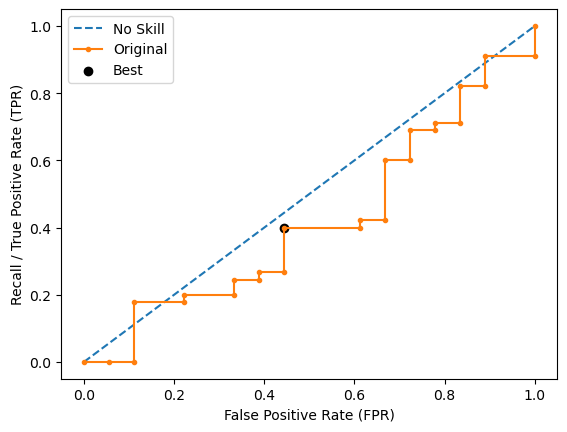

Learning rate set to 0.003804
0:	learn: 0.6920955	total: 1.63ms	remaining: 1.62s
1:	learn: 0.6903779	total: 2.73ms	remaining: 1.36s
2:	learn: 0.6888943	total: 5.01ms	remaining: 1.67s
3:	learn: 0.6878788	total: 6.21ms	remaining: 1.54s
4:	learn: 0.6863667	total: 7.46ms	remaining: 1.48s
5:	learn: 0.6847938	total: 8.98ms	remaining: 1.49s
6:	learn: 0.6829611	total: 10.2ms	remaining: 1.44s
7:	learn: 0.6821694	total: 11.4ms	remaining: 1.41s
8:	learn: 0.6797399	total: 12.8ms	remaining: 1.41s
9:	learn: 0.6780922	total: 13.9ms	remaining: 1.38s
10:	learn: 0.6767949	total: 15.3ms	remaining: 1.37s
11:	learn: 0.6754567	total: 16.5ms	remaining: 1.36s
12:	learn: 0.6740609	total: 17.7ms	remaining: 1.34s
13:	learn: 0.6725555	total: 18.8ms	remaining: 1.32s
14:	learn: 0.6710124	total: 20.1ms	remaining: 1.32s
15:	learn: 0.6698259	total: 21.5ms	remaining: 1.32s
16:	learn: 0.6689896	total: 22.8ms	remaining: 1.32s
17:	learn: 0.6680391	total: 24.4ms	remaining: 1.33s
18:	learn: 0.6668750	total: 25.7ms	remaining

303:	learn: 0.4053534	total: 396ms	remaining: 906ms
304:	learn: 0.4052266	total: 397ms	remaining: 905ms
305:	learn: 0.4046561	total: 398ms	remaining: 904ms
306:	learn: 0.4039108	total: 400ms	remaining: 902ms
307:	learn: 0.4031560	total: 401ms	remaining: 901ms
308:	learn: 0.4024894	total: 403ms	remaining: 900ms
309:	learn: 0.4022749	total: 404ms	remaining: 899ms
310:	learn: 0.4012311	total: 405ms	remaining: 898ms
311:	learn: 0.4009953	total: 406ms	remaining: 896ms
312:	learn: 0.4005188	total: 408ms	remaining: 895ms
313:	learn: 0.3999319	total: 409ms	remaining: 893ms
314:	learn: 0.3992994	total: 410ms	remaining: 893ms
315:	learn: 0.3987943	total: 412ms	remaining: 892ms
316:	learn: 0.3981346	total: 413ms	remaining: 891ms
317:	learn: 0.3977299	total: 415ms	remaining: 889ms
318:	learn: 0.3973913	total: 416ms	remaining: 888ms
319:	learn: 0.3970283	total: 417ms	remaining: 887ms
320:	learn: 0.3962785	total: 419ms	remaining: 886ms
321:	learn: 0.3954914	total: 420ms	remaining: 885ms
322:	learn: 

601:	learn: 0.2691480	total: 787ms	remaining: 520ms
602:	learn: 0.2688102	total: 788ms	remaining: 519ms
603:	learn: 0.2685244	total: 789ms	remaining: 518ms
604:	learn: 0.2681790	total: 791ms	remaining: 516ms
605:	learn: 0.2678729	total: 792ms	remaining: 515ms
606:	learn: 0.2676381	total: 794ms	remaining: 514ms
607:	learn: 0.2670866	total: 795ms	remaining: 513ms
608:	learn: 0.2668106	total: 797ms	remaining: 512ms
609:	learn: 0.2665138	total: 798ms	remaining: 510ms
610:	learn: 0.2661451	total: 800ms	remaining: 509ms
611:	learn: 0.2656261	total: 801ms	remaining: 508ms
612:	learn: 0.2652318	total: 802ms	remaining: 507ms
613:	learn: 0.2649701	total: 804ms	remaining: 505ms
614:	learn: 0.2646504	total: 805ms	remaining: 504ms
615:	learn: 0.2643058	total: 807ms	remaining: 503ms
616:	learn: 0.2640619	total: 808ms	remaining: 502ms
617:	learn: 0.2638768	total: 809ms	remaining: 500ms
618:	learn: 0.2634074	total: 811ms	remaining: 499ms
619:	learn: 0.2631161	total: 812ms	remaining: 498ms
620:	learn: 

895:	learn: 0.1873569	total: 1.18s	remaining: 136ms
896:	learn: 0.1871427	total: 1.18s	remaining: 135ms
897:	learn: 0.1869177	total: 1.18s	remaining: 134ms
898:	learn: 0.1866344	total: 1.18s	remaining: 133ms
899:	learn: 0.1864418	total: 1.18s	remaining: 131ms
900:	learn: 0.1862826	total: 1.18s	remaining: 130ms
901:	learn: 0.1862165	total: 1.18s	remaining: 129ms
902:	learn: 0.1859928	total: 1.19s	remaining: 127ms
903:	learn: 0.1858254	total: 1.19s	remaining: 126ms
904:	learn: 0.1855573	total: 1.19s	remaining: 125ms
905:	learn: 0.1853951	total: 1.19s	remaining: 123ms
906:	learn: 0.1851273	total: 1.19s	remaining: 122ms
907:	learn: 0.1847921	total: 1.19s	remaining: 121ms
908:	learn: 0.1844692	total: 1.19s	remaining: 120ms
909:	learn: 0.1843444	total: 1.2s	remaining: 118ms
910:	learn: 0.1842099	total: 1.2s	remaining: 117ms
911:	learn: 0.1839988	total: 1.2s	remaining: 116ms
912:	learn: 0.1836196	total: 1.2s	remaining: 114ms
913:	learn: 0.1835158	total: 1.2s	remaining: 113ms
914:	learn: 0.183

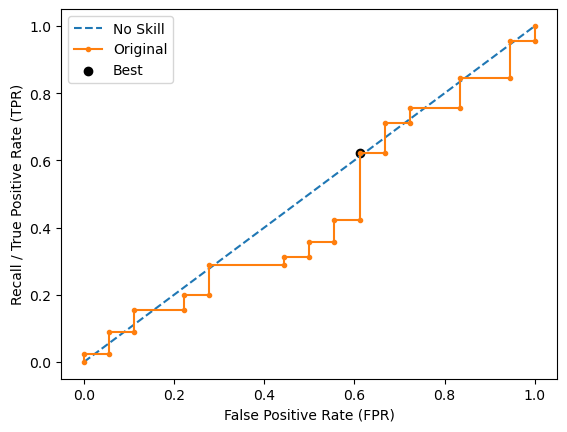

Ave Test Accuracy: 0.4507936507936508
Stdev Test Accuracy: 0.0578875635835253
Ave Test Recall: 0.7222222222222222
Stdev Test Recall: 0.10393492741038722
Ave Test F-0.5 Score: 0.3457282055067542
Stdev Test F-0.5 Score: 0.015856382587701376
Ave Test F-0.75 Score: 0.38526874987817095
Stdev Test F-0.75 Score: 0.015601216017006564
Ave Test F-1 Score: 0.428327923180355
Stdev Test F-1 Score: 0.018315958569905796
Ave Test F-1.5 Score: 0.5066761598488061
Stdev Test F-1.5 Score: 0.03178689527760813
Ave Test F-2 Score: 0.5651036286368093
Stdev Test F-2 Score: 0.047023670108829005
Ave Test G-mean: 0.4850409360147364
Stdev Test G-mean: 0.058736506407568036
Ave Test Specificity: 0.3422222222222222
Stdev Test Specificity: 0.11821720958462563
Ave Test Precision: 0.3065567604839215
Ave Test NPV: 0.7585714285714287
Ave Runtime: 1.546132230758667


In [147]:
ld_t03_catboost_gs, ld_t03_catboost_be, ld_t03_catboost_model_info, ld_t03_catboost_metrics_df = catboost_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'cityblock', 'classifier__n_neighbors': 11, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.48120962285048974
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='cityblock', n_neighbors=11))])
Mean Train Score (Recall) 0.5564288650257708
Std Train Score (Recall) 0.029001216158486172
GridSearchCV Runtime: 27.51084804534912 secs
Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.32467532467532473
Test F-0.75 Score: 0.3541076487252125
Test F-1 Score: 0.3846153846153846
Test F-1.5 Score: 0.436241610738255
Test F-2 Score: 0.47169811320754723
Test G-Mean Score: 0.5091750772173156
Best Threshold=0.636
Best Recall=0.333
Best G-

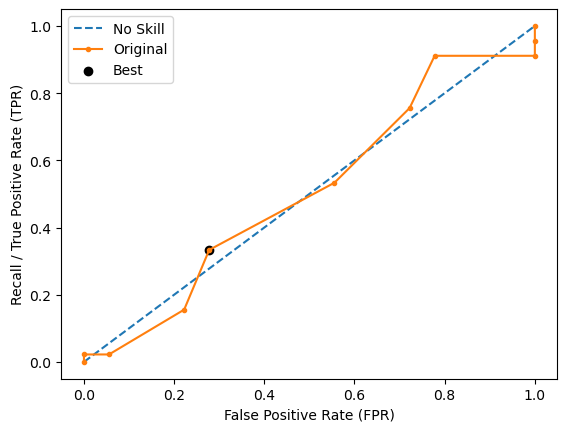

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3767123287671233
Test F-0.75 Score: 0.40801186943620177
Test F-1 Score: 0.44000000000000006
Test F-1.5 Score: 0.4931034482758621
Test F-2 Score: 0.5288461538461539
Test G-Mean Score: 0.5708992257184502
Best Threshold=0.727
Best Recall=0.244
Best G-Mean=0.451


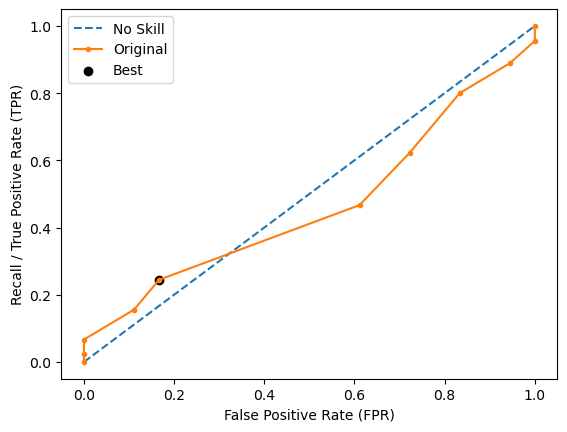

Run 3 - Random State: 2
Test Accuracy: 0.49206349206349204
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3763440860215054
Test F-0.75 Score: 0.41966426858513184
Test F-1 Score: 0.4666666666666666
Test F-1.5 Score: 0.5515151515151515
Test F-2 Score: 0.6140350877192983
Test G-Mean Score: 0.5420582630066875
Best Threshold=0.727
Best Recall=0.200
Best G-Mean=0.408


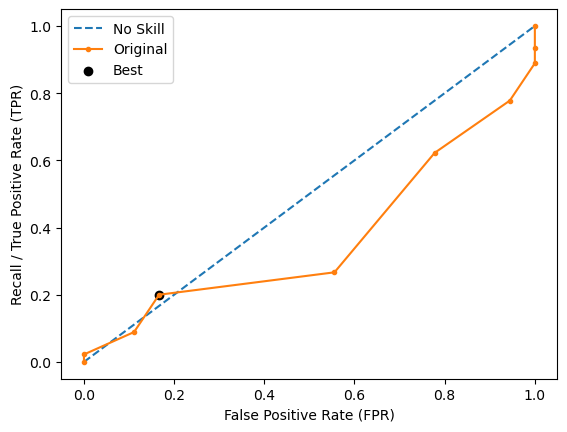

Run 4 - Random State: 3
Test Accuracy: 0.6190476190476191
Test Recall: 0.5
Test F-0.5 Score: 0.39473684210526316
Test F-0.75 Score: 0.41208791208791207
Test F-1 Score: 0.42857142857142855
Test F-1.5 Score: 0.45348837209302323
Test F-2 Score: 0.46875
Test G-Mean Score: 0.5773502691896257
Best Threshold=0.273
Best Recall=0.800
Best G-Mean=0.516


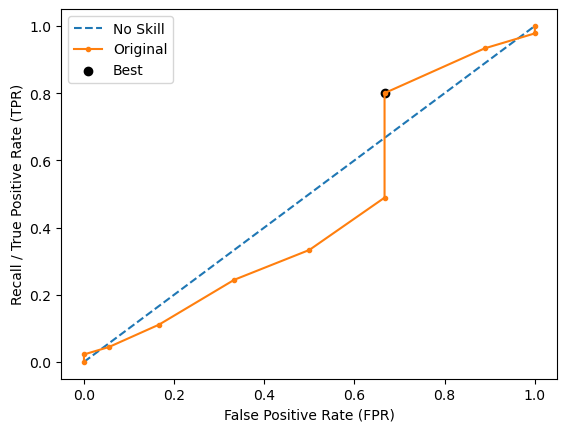

Run 5 - Random State: 4
Test Accuracy: 0.5555555555555556
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.38961038961038963
Test F-0.75 Score: 0.42492917847025496
Test F-1 Score: 0.46153846153846156
Test F-1.5 Score: 0.5234899328859061
Test F-2 Score: 0.5660377358490566
Test G-Mean Score: 0.5837300238472753
Best Threshold=0.455
Best Recall=0.733
Best G-Mean=0.494


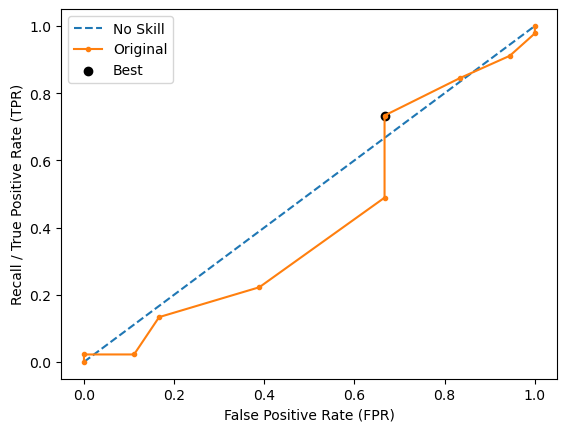

Ave Test Accuracy: 0.5428571428571429
Stdev Test Accuracy: 0.053121271525973075
Ave Test Recall: 0.6222222222222222
Stdev Test Recall: 0.10686324478706302
Ave Test F-0.5 Score: 0.3724157942359212
Stdev Test F-0.5 Score: 0.027869909433266393
Ave Test F-0.75 Score: 0.4037601754609426
Stdev Test F-0.75 Score: 0.028521344536771822
Ave Test F-1 Score: 0.4362783882783883
Stdev Test F-1 Score: 0.03280180000290551
Ave Test F-1.5 Score: 0.49156770310163955
Stdev Test F-1.5 Score: 0.04776530065119412
Ave Test F-2 Score: 0.5298734181244111
Stdev Test F-2 Score: 0.06227467005686806
Ave Test G-mean: 0.5566425717958708
Stdev Test G-mean: 0.030950186087809244
Ave Test Specificity: 0.5111111111111111
Stdev Test Specificity: 0.10540925533894598
Ave Test Precision: 0.33982843137254903
Ave Test NPV: 0.7740379012904042
Ave Runtime: 0.021503734588623046


In [148]:
ld_t03_knn_gs, ld_t03_knn_be, ld_t03_knn_model_info, ld_t03_knn_metrics_df = knn_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.44989210995402945
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise',

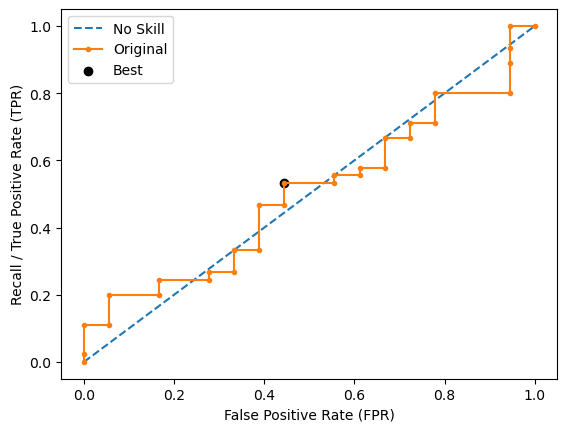

Run 2 - Random State: 1
Test Accuracy: 0.42857142857142855
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.29411764705882354
Test F-0.75 Score: 0.3246753246753247
Test F-1 Score: 0.35714285714285715
Test F-1.5 Score: 0.4140127388535032
Test F-2 Score: 0.4545454545454546
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.433
Best Recall=0.778
Best G-Mean=0.550


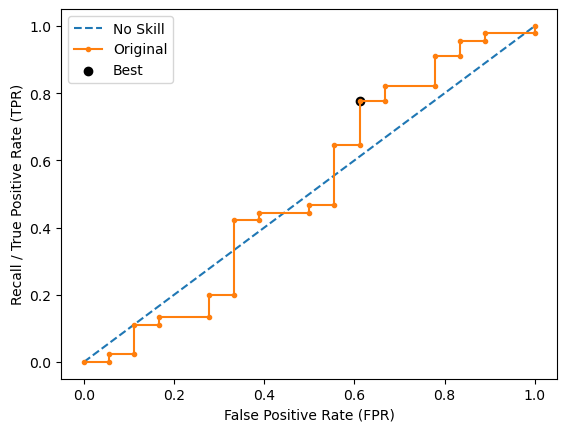

Run 3 - Random State: 2
Test Accuracy: 0.6031746031746031
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.4225352112676056
Test F-0.75 Score: 0.4559270516717325
Test F-1 Score: 0.4897959183673469
Test F-1.5 Score: 0.5454545454545454
Test F-2 Score: 0.5825242718446603
Test G-Mean Score: 0.620632890834175
Best Threshold=0.619
Best Recall=0.289
Best G-Mean=0.439


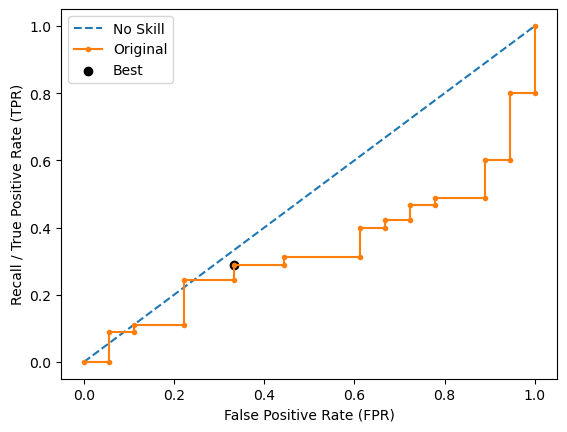

Run 4 - Random State: 3
Test Accuracy: 0.5396825396825397
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.40229885057471265
Test F-0.75 Score: 0.4452926208651399
Test F-1 Score: 0.49122807017543857
Test F-1.5 Score: 0.5723270440251572
Test F-2 Score: 0.6306306306306306
Test G-Mean Score: 0.5879447357921312
Best Threshold=0.594
Best Recall=0.356
Best G-Mean=0.466


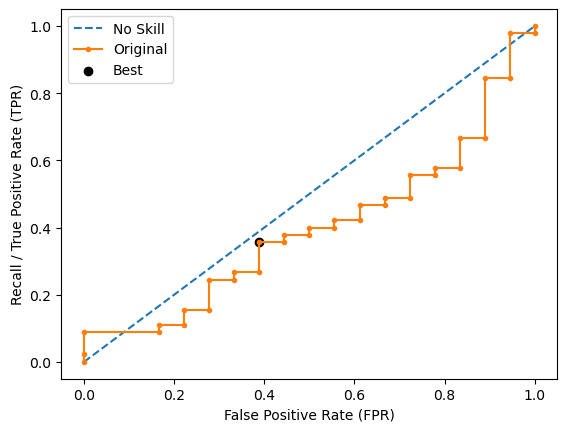

Run 5 - Random State: 4
Test Accuracy: 0.42857142857142855
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3225806451612903
Test F-0.75 Score: 0.35971223021582727
Test F-1 Score: 0.4
Test F-1.5 Score: 0.4727272727272727
Test F-2 Score: 0.5263157894736842
Test G-Mean Score: 0.4714045207910317
Best Threshold=0.519
Best Recall=0.622
Best G-Mean=0.492


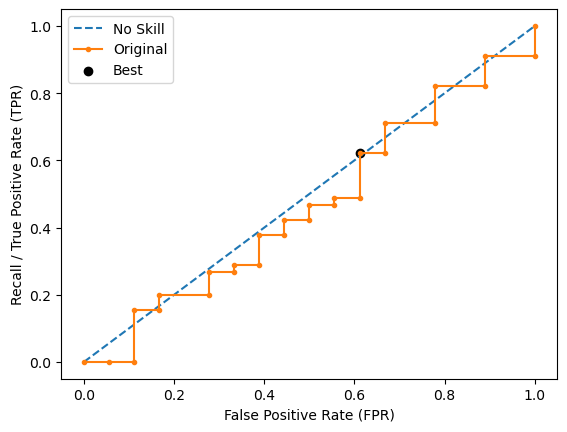

Ave Test Accuracy: 0.4761904761904761
Stdev Test Accuracy: 0.09187172145071607
Ave Test Recall: 0.6888888888888889
Stdev Test Recall: 0.09296222517045284
Ave Test F-0.5 Score: 0.35372703156015
Stdev Test F-0.5 Score: 0.05551128896557847
Ave Test F-0.75 Score: 0.39111721715579517
Stdev Test F-0.75 Score: 0.05697130310757762
Ave Test F-1 Score: 0.4312154586893674
Stdev Test F-1 Score: 0.05846230039588759
Ave Test F-1.5 Score: 0.502580297865727
Stdev Test F-1.5 Score: 0.062192966994412194
Ave Test F-2 Score: 0.554505708637729
Stdev Test F-2 Score: 0.06697590731881695
Ave Test G-mean: 0.5107689408699476
Stdev Test G-mean: 0.08856906111724624
Ave Test Specificity: 0.3911111111111111
Stdev Test Specificity: 0.13203067357789286
Ave Test Precision: 0.31613151986666416
Ave Test NPV: 0.7508809523809524
Ave Runtime: 0.10092396736145019


In [149]:
ld_t03_xgb_gs, ld_t03_xgb_be, ld_t03_xgb_model_info, ld_t03_xgb_metrics_df = xgb_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.4276616787065704
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.8796421115824866
Std Train Score (Recall) 0.011201066593031566
GridSearchCV Runtime: 46.995192527770996 secs
Run 1 - Random State: 0
Test Accuracy: 0.47619047619047616
Test Recall: 0.8333333333333334
Test F-0.5 Score: 0.37878787878787873
Test F-0.75 Score: 0.42

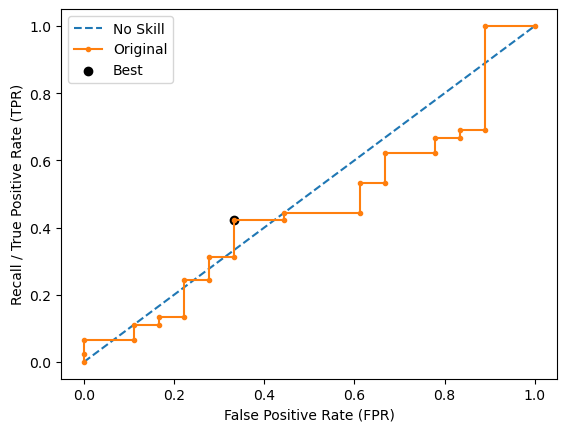

Run 2 - Random State: 1
Test Accuracy: 0.49206349206349204
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.3651685393258427
Test F-0.75 Score: 0.4052369077306733
Test F-1 Score: 0.44827586206896547
Test F-1.5 Score: 0.5248447204968945
Test F-2 Score: 0.5803571428571429
Test G-Mean Score: 0.53748384988657
Best Threshold=0.708
Best Recall=0.533
Best G-Mean=0.455


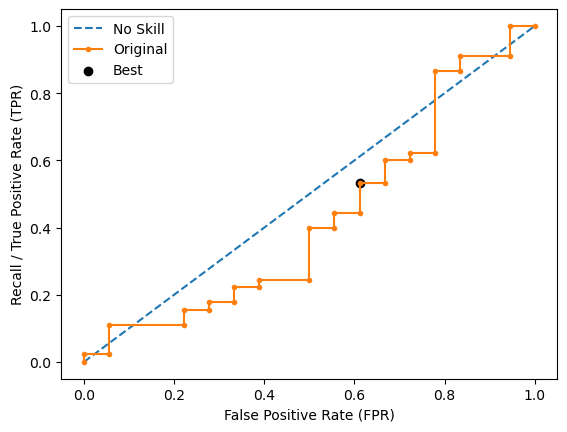

Run 3 - Random State: 2
Test Accuracy: 0.5555555555555556
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3623188405797101
Test F-0.75 Score: 0.38940809968847345
Test F-1 Score: 0.4166666666666667
Test F-1.5 Score: 0.46099290780141844
Test F-2 Score: 0.4901960784313726
Test G-Mean Score: 0.5555555555555556
Best Threshold=0.220
Best Recall=0.600
Best G-Mean=0.516


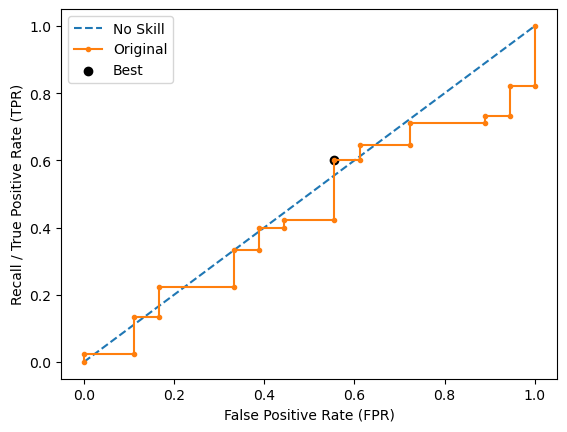

Run 4 - Random State: 3
Test Accuracy: 0.5714285714285714
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3731343283582089
Test F-0.75 Score: 0.3993610223642173
Test F-1 Score: 0.4255319148936171
Test F-1.5 Score: 0.46762589928057563
Test F-2 Score: 0.49504950495049505
Test G-Mean Score: 0.5665577237325317
Best Threshold=0.367
Best Recall=0.556
Best G-Mean=0.465


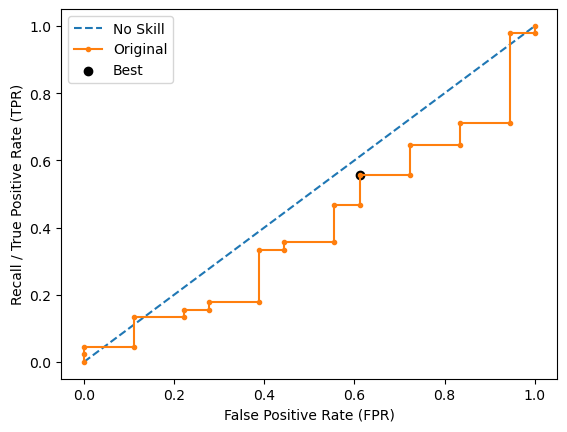

Run 5 - Random State: 4
Test Accuracy: 0.49206349206349204
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3529411764705882
Test F-0.75 Score: 0.3896103896103896
Test F-1 Score: 0.42857142857142855
Test F-1.5 Score: 0.4968152866242037
Test F-2 Score: 0.5454545454545455
Test G-Mean Score: 0.5305482838361476
Best Threshold=0.864
Best Recall=0.400
Best G-Mean=0.516


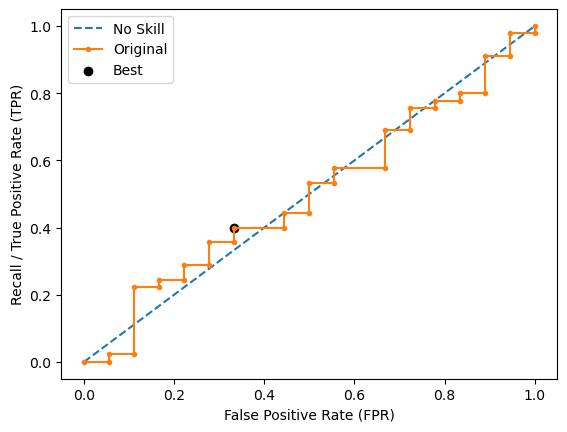

Ave Test Accuracy: 0.5174603174603174
Stdev Test Accuracy: 0.042886527257480316
Ave Test Recall: 0.6666666666666667
Stdev Test Recall: 0.11785113019775792
Ave Test F-0.5 Score: 0.3664701527044458
Stdev Test F-0.5 Score: 0.009976201690665053
Ave Test F-0.75 Score: 0.40175729748419287
Stdev Test F-0.75 Score: 0.014714429172673498
Ave Test F-1 Score: 0.4390472696782307
Stdev Test F-1 Score: 0.023759651515414815
Ave Test F-1.5 Score: 0.5040908505599166
Stdev Test F-1.5 Score: 0.044827321651329216
Ave Test F-2 Score: 0.5504165825438394
Stdev Test F-2 Score: 0.06289491799759281
Ave Test G-mean: 0.543438337941107
Stdev Test G-mean: 0.016967926043082105
Ave Test Specificity: 0.45777777777777773
Stdev Test Specificity: 0.10493972402771196
Ave Test Precision: 0.3304567453115547
Ave Test NPV: 0.7796447337828412
Ave Runtime: 0.14337520599365233


In [150]:
ld_t03_gbm_gs, ld_t03_gbm_be, ld_t03_gbm_model_info, ld_t03_gbm_metrics_df = gbm_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.46590639151010665
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Recall) 0.6926432852664669
Std Train Score (Recall) 0.032300717067064666
GridSearchCV Runtime: 387.3895676136017 secs
Run 1 - Random State: 0
Test Accuracy: 0.4603174603174603
Test Recall: 0.8333333333333334
Test F-0.5 Sc

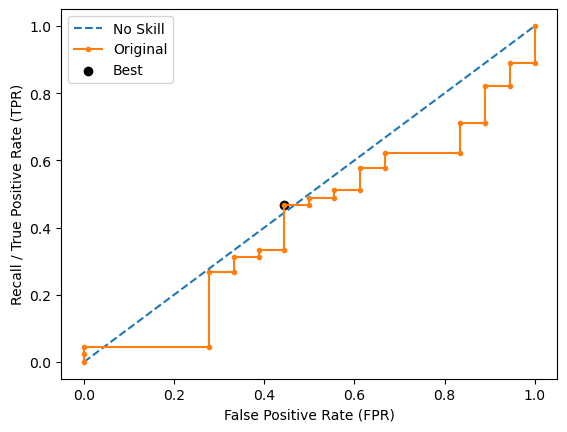

Run 2 - Random State: 1
Test Accuracy: 0.3968253968253968
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3092783505154639
Test F-0.75 Score: 0.34642032332563505
Test F-1 Score: 0.3870967741935484
Test F-1.5 Score: 0.4615384615384615
Test F-2 Score: 0.5172413793103449
Test G-Mean Score: 0.43885372573625553
Best Threshold=0.615
Best Recall=0.444
Best G-Mean=0.567


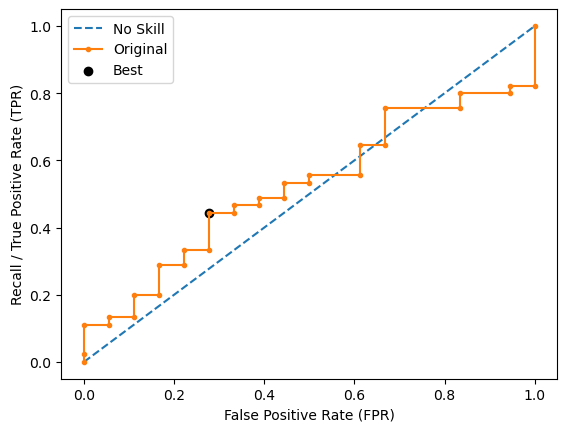

Run 3 - Random State: 2
Test Accuracy: 0.3968253968253968
Test Recall: 0.9444444444444444
Test F-0.5 Score: 0.3632478632478633
Test F-0.75 Score: 0.4142300194931774
Test F-1 Score: 0.4722222222222222
Test F-1.5 Score: 0.5846560846560847
Test F-2 Score: 0.6746031746031746
Test G-Mean Score: 0.4097575314352394
Best Threshold=0.558
Best Recall=0.400
Best G-Mean=0.471


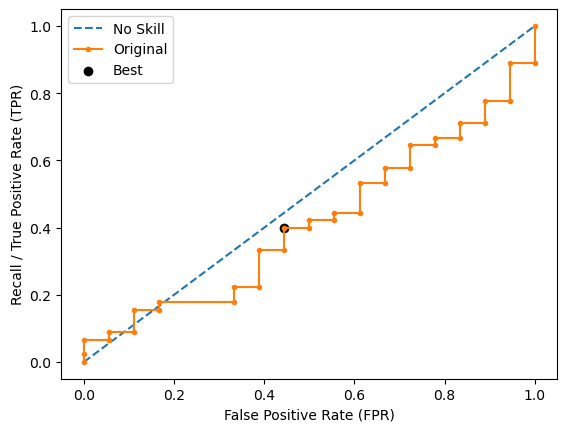

Run 4 - Random State: 3
Test Accuracy: 0.6666666666666666
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.45454545454545453
Test F-0.75 Score: 0.4716981132075472
Test F-1 Score: 0.4878048780487805
Test F-1.5 Score: 0.5118110236220472
Test F-2 Score: 0.5263157894736842
Test G-Mean Score: 0.628539361054709
Best Threshold=0.475
Best Recall=0.533
Best G-Mean=0.455


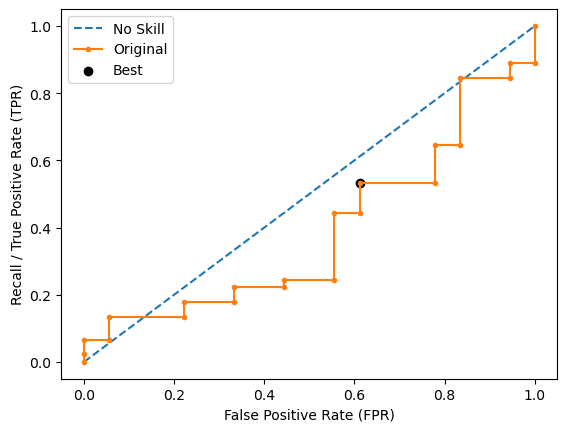

Run 5 - Random State: 4
Test Accuracy: 0.5714285714285714
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.31818181818181823
Test F-0.75 Score: 0.33018867924528306
Test F-1 Score: 0.34146341463414637
Test F-1.5 Score: 0.3582677165354331
Test F-2 Score: 0.368421052631579
Test G-Mean Score: 0.500616903380836
Best Threshold=0.463
Best Recall=0.667
Best G-Mean=0.609


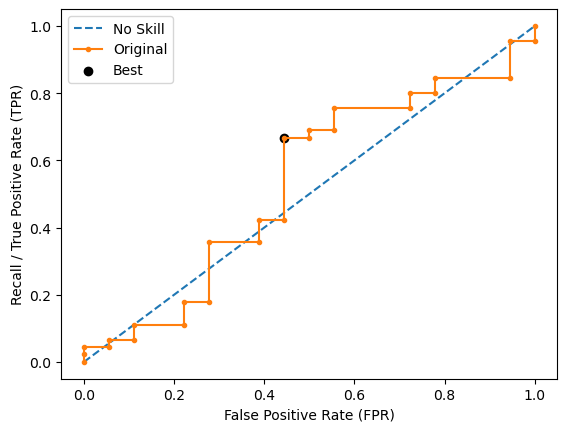

Ave Test Accuracy: 0.4984126984126984
Stdev Test Accuracy: 0.1180380472544648
Ave Test Recall: 0.6777777777777778
Stdev Test Recall: 0.2201290306239883
Ave Test F-0.5 Score: 0.3633081230406943
Stdev Test F-0.5 Score: 0.05775707431175238
Ave Test F-0.75 Score: 0.39602635801201225
Stdev Test F-0.75 Score: 0.0577021184061427
Ave Test F-1 Score: 0.4314674578197395
Stdev Test F-1 Score: 0.06382462112343087
Ave Test F-1.5 Score: 0.4959714202761857
Stdev Test F-1.5 Score: 0.09060247972031645
Ave Test F-2 Score: 0.5444349232715531
Stdev Test F-2 Score: 0.11968947664622274
Ave Test G-mean: 0.4973885197648711
Stdev Test G-mean: 0.08434364350083583
Ave Test Specificity: 0.42666666666666664
Stdev Test Specificity: 0.23591168048160382
Ave Test Precision: 0.33055189576928706
Ave Test NPV: 0.7843257653938769
Ave Runtime: 0.20503630638122558


In [151]:
ld_t03_rf_gs, ld_t03_rf_be, ld_t03_rf_model_info, ld_t03_rf_metrics_df = rf_class2(ld_t03, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

In [152]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t03_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t03_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t03_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
0,k-Nearest Neighbors,0.556643,0.030950,0.481210,0.556429,0.622222,0.106863,0.542857,0.053121,0.372416,0.403760,0.436278,0.491568,0.529873
5,Gradient Boosting Machine (GBM),0.543438,0.016968,0.427662,0.879642,0.666667,0.117851,0.517460,0.042887,0.366470,0.401757,0.439047,0.504091,0.550417
6,LightGBM,0.542140,0.073792,0.514014,0.744234,0.666667,0.161971,0.526984,0.104930,0.377962,0.410988,0.446011,0.507657,0.552162
8,AdaBoost,0.513194,0.044304,0.450873,0.879332,0.644444,0.160054,0.495238,0.062894,0.347738,0.381454,0.417352,0.480745,0.526577
7,Extreme Gradient Boosting (XGBoost),0.510769,0.088569,0.449892,0.847573,0.688889,0.092962,0.476190,0.091872,0.353727,0.391117,0.431215,0.502580,0.554506
3,Decision Tree,0.506418,0.091859,0.531154,0.512864,0.522222,0.178298,0.526984,0.114131,0.338109,0.360391,0.383748,0.424057,0.452427
4,Random Forest,0.497389,0.084344,0.465906,0.692643,0.677778,0.220129,0.498413,0.118038,0.363308,0.396026,0.431467,0.495971,0.544435
9,CatBoost,0.485041,0.058737,0.450176,0.879113,0.722222,0.103935,0.450794,0.057888,0.345728,0.385269,0.428328,0.506676,0.565104
1,SVM Classifier,0.192639,0.132293,0.457199,0.479867,0.922222,0.115202,0.307937,0.018098,0.326789,0.375091,0.430851,0.541566,0.632778
2,Logistic Regression,0.000000,0.000000,0.445623,0.559474,1.000000,0.000000,0.285714,0.000000,0.333333,0.384615,0.444444,0.565217,0.666667


## Optimizing for G-Mean Score

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.6428795158982512
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, min_samples_leaf=2,
                                        random_state=0))])
Mean Train Score (Recall) 0.6080824892052473
Std Train Score (Recall) 0.06020746910907283
GridSearchCV Runtime: 41.83380651473999 secs
Run 1 - Random State: 0
Test Accuracy: 0.5873015873015873
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.2777777777777778
Test F-0.75 Score: 0.2777777777777778
Test F-1 Score: 0.277777

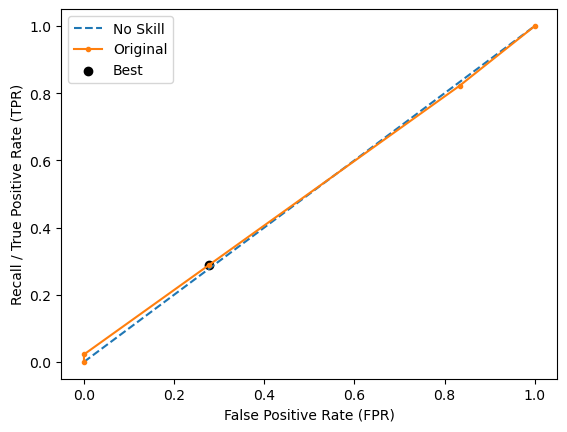

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.411764705882353
Test F-0.75 Score: 0.4545454545454545
Test F-1 Score: 0.5
Test F-1.5 Score: 0.5796178343949044
Test F-2 Score: 0.6363636363636364
Test G-Mean Score: 0.6024640760767094
Best Threshold=0.753
Best Recall=0.289
Best G-Mean=0.380


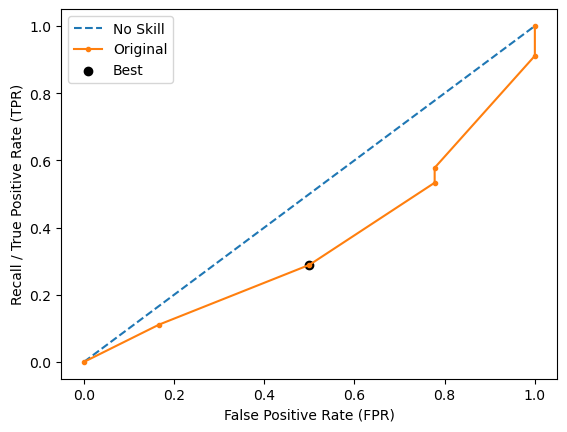

Run 3 - Random State: 2
Test Accuracy: 0.4444444444444444
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.30120481927710846
Test F-0.75 Score: 0.3315649867374006
Test F-1 Score: 0.36363636363636365
Test F-1.5 Score: 0.41935483870967744
Test F-2 Score: 0.45871559633027525
Test G-Mean Score: 0.47140452079103173
Best Threshold=0.541
Best Recall=0.533
Best G-Mean=0.544


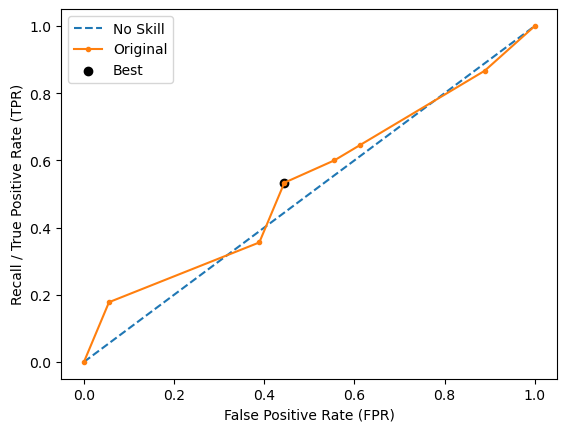

Run 4 - Random State: 3
Test Accuracy: 0.6666666666666666
Test Recall: 0.5
Test F-0.5 Score: 0.44117647058823534
Test F-0.75 Score: 0.4518072289156626
Test F-1 Score: 0.4615384615384615
Test F-1.5 Score: 0.475609756097561
Test F-2 Score: 0.48387096774193544
Test G-Mean Score: 0.6055300708194984
Best Threshold=0.345
Best Recall=0.622
Best G-Mean=0.492


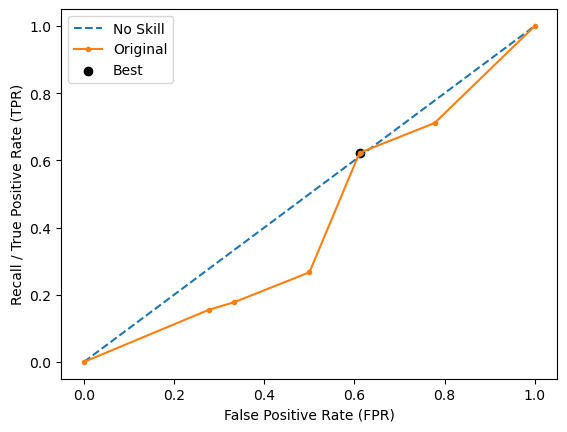

Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.5
Test F-0.5 Score: 0.25862068965517243
Test F-0.75 Score: 0.2862595419847328
Test F-1 Score: 0.3157894736842105
Test F-1.5 Score: 0.3679245283018868
Test F-2 Score: 0.40540540540540543
Test G-Mean Score: 0.408248290463863
Best Threshold=0.562
Best Recall=0.667
Best G-Mean=0.577


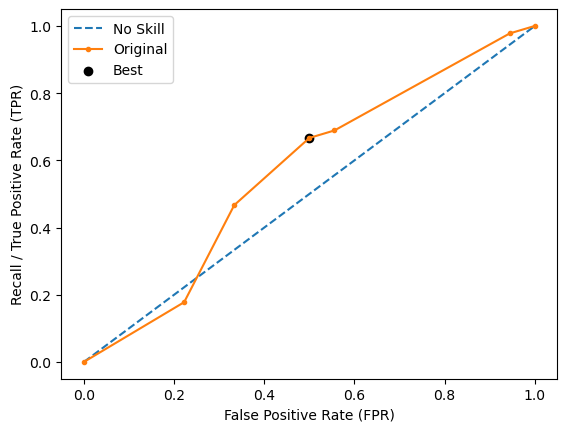

Ave Test Accuracy: 0.526984126984127
Stdev Test Accuracy: 0.1141312889666511
Ave Test Recall: 0.5222222222222223
Stdev Test Recall: 0.17829785039868012
Ave Test F-0.5 Score: 0.33810889263612937
Stdev Test F-0.5 Score: 0.08271673487505027
Ave Test F-0.75 Score: 0.3603909979922057
Stdev Test F-0.75 Score: 0.08713975099507688
Ave Test F-1 Score: 0.38374841532736265
Stdev Test F-1 Score: 0.09462876230772616
Ave Test F-1.5 Score: 0.42405694705636154
Stdev Test F-1.5 Score: 0.1133880895559113
Ave Test F-2 Score: 0.45242667672380604
Stdev Test F-2 Score: 0.12997532162727338
Ave Test G-mean: 0.5064182805191095
Stdev Test G-mean: 0.09185859853110206
Ave Test Specificity: 0.528888888888889
Stdev Test Specificity: 0.1828444660508819
Ave Test Precision: 0.3151619520040573
Ave Test NPV: 0.7308266178266178
Ave Runtime: 0.006319856643676758


In [153]:
ld_t03_dt_gs, ld_t03_dt_be, ld_t03_dt_model_info, ld_t03_dt_metrics_df = dt_class2(ld_t03, g_mean_scorer,
                                                                                   'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 0.1, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': RandomOverSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5389285714015852
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.1, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Recall) 0.6486886123758185
Std Train Score (Recall) 0.03537143441703713
GridSearchCV Runtime: 14.010384798049927 secs
Run 1 - Random State: 0
Test Accuracy: 0.5079365079365079
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.27777777777777773
Test F-0.75 Score: 0.2946127946127946
Test F-1 Score: 0.3111111111111111
Test F-1.5 Score: 0.3370370370370371
Test F-2 Score: 0.35353535353535354

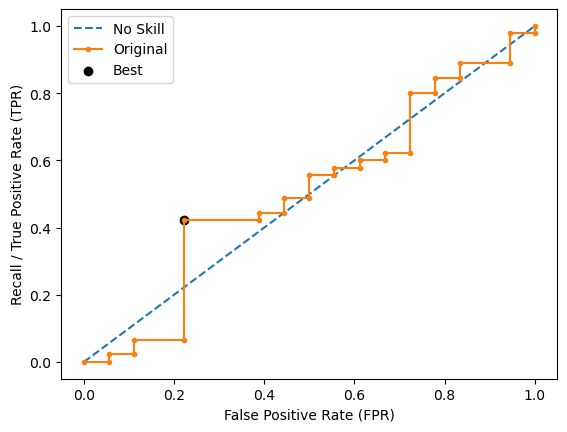

Run 2 - Random State: 1
Test Accuracy: 0.5396825396825397
Test Recall: 0.5
Test F-0.5 Score: 0.3358208955223881
Test F-0.75 Score: 0.3594249201277956
Test F-1 Score: 0.3829787234042554
Test F-1.5 Score: 0.420863309352518
Test F-2 Score: 0.44554455445544555
Test G-Mean Score: 0.5270462766947299
Best Threshold=0.553
Best Recall=0.333
Best G-Mean=0.561


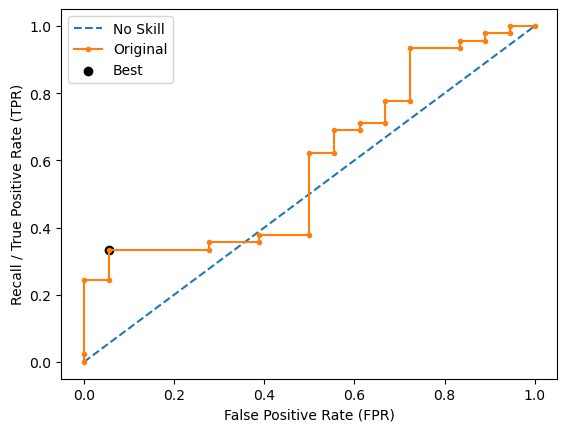

Run 3 - Random State: 2
Test Accuracy: 0.6507936507936508
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.3888888888888889
Test F-0.75 Score: 0.388888888888889
Test F-1 Score: 0.3888888888888889
Test F-1.5 Score: 0.3888888888888889
Test F-2 Score: 0.3888888888888889
Test G-Mean Score: 0.5420582630066875
Best Threshold=0.458
Best Recall=0.400
Best G-Mean=0.394


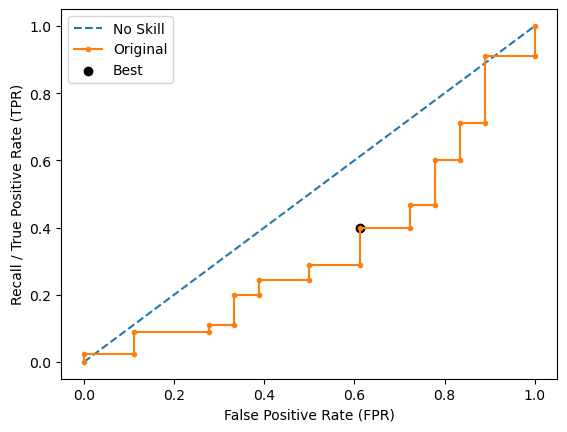

Run 4 - Random State: 3
Test Accuracy: 0.6190476190476191
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.3048780487804878
Test F-0.75 Score: 0.29904306220095694
Test F-1 Score: 0.29411764705882354
Test F-1.5 Score: 0.28761061946902655
Test F-2 Score: 0.2840909090909091
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.427
Best Recall=0.556
Best G-Mean=0.556


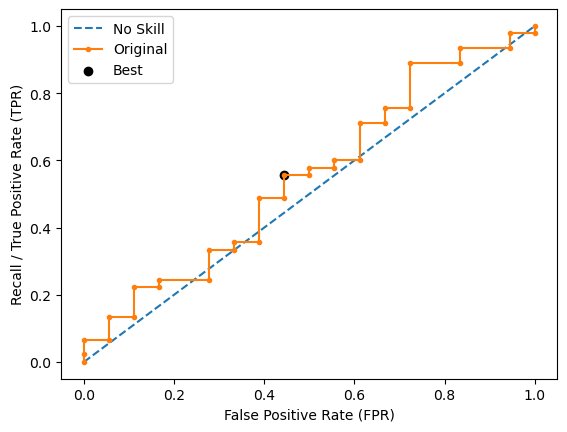

Run 5 - Random State: 4
Test Accuracy: 0.49206349206349204
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.2692307692307692
Test F-0.75 Score: 0.2868852459016394
Test F-1 Score: 0.30434782608695654
Test F-1.5 Score: 0.33211678832116787
Test F-2 Score: 0.35000000000000003
Test G-Mean Score: 0.4554200340426488
Best Threshold=0.448
Best Recall=0.644
Best G-Mean=0.568


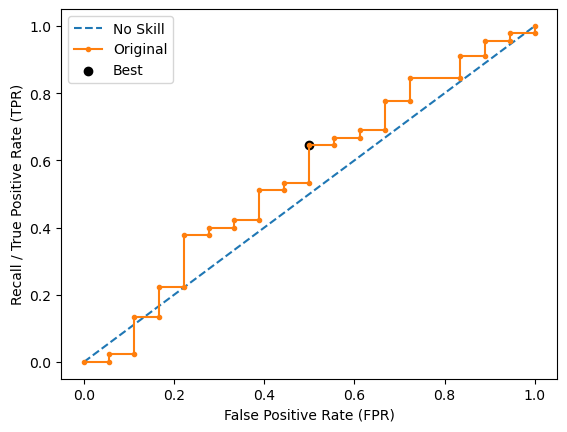

Ave Test Accuracy: 0.5619047619047619
Stdev Test Accuracy: 0.0697329607507581
Ave Test Recall: 0.38888888888888884
Stdev Test Recall: 0.07856742013183861
Ave Test F-0.5 Score: 0.3153192760400624
Stdev Test F-0.5 Score: 0.048670674215840086
Ave Test F-0.75 Score: 0.3257709823464151
Stdev Test F-0.75 Score: 0.045589945523918936
Ave Test F-1 Score: 0.3362888393100071
Stdev Test F-1 Score: 0.04576916612549877
Ave Test F-1.5 Score: 0.3533033286137277
Stdev Test F-1.5 Score: 0.05210488667946444
Ave Test F-2 Score: 0.36441194119411946
Stdev Test F-2 Score: 0.05907430555933541
Ave Test G-mean: 0.4894917093774363
Stdev Test G-mean: 0.041616114242909064
Ave Test Specificity: 0.6311111111111111
Stdev Test Specificity: 0.11396339026629407
Ave Test Precision: 0.304198595146871
Ave Test NPV: 0.7188825317360987
Ave Runtime: 0.005999088287353516


In [154]:
ld_t03_logreg_gs, ld_t03_logreg_be, ld_t03_logreg_model_info, ld_t03_logreg_metrics_df = logreg_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 0.1, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': SMOTE(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5362642921349731
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 SVC(C=0.1, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.4702773160643078
Std Train Score (Recall) 0.04324788120248478
GridSearchCV Runtime: 24.62929654121399 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.6349206349206349
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.28571428571428575
Test F-0.75 Score: 0.2702702702702703
Test F-1 Score: 0.2580645161290323
Test F-1.5 Score: 0.24299065420560748
Test F-2 Score: 0.2352941176470588
Test G-Mea

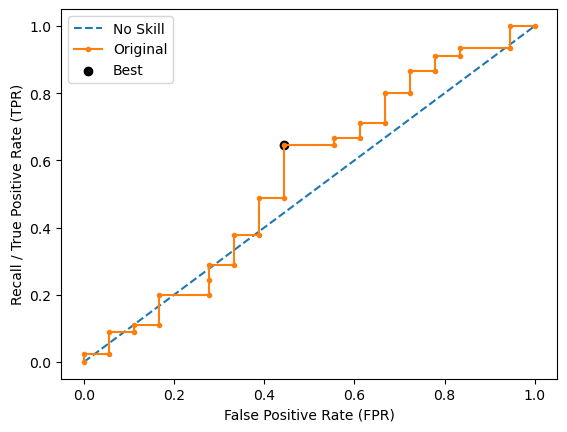

[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.5396825396825397
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.24509803921568626
Test F-0.75 Score: 0.25100401606425704
Test F-1 Score: 0.25641025641025644
Test F-1.5 Score: 0.26422764227642276
Test F-2 Score: 0.26881720430107525
Test G-Mean Score: 0.42309850588132825
Best Threshold=0.460
Best Recall=0.556
Best G-Mean=0.556


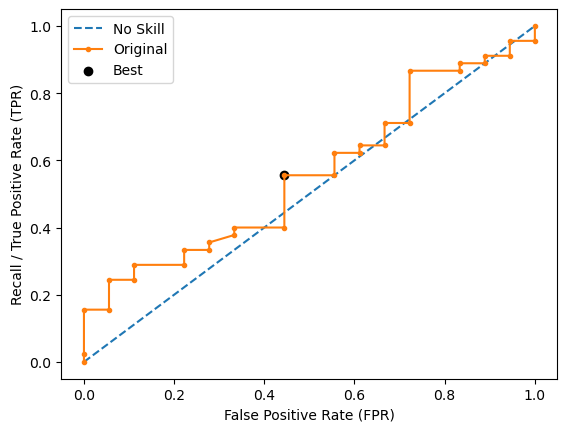

[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.6825396825396826
Test Recall: 0.5
Test F-0.5 Score: 0.4591836734693877
Test F-0.75 Score: 0.466804979253112
Test F-1 Score: 0.4736842105263158
Test F-1.5 Score: 0.48347107438016534
Test F-2 Score: 0.48913043478260876
Test G-Mean Score: 0.6146362971528592
Best Threshold=0.481
Best Recall=0.511
Best G-Mean=0.446


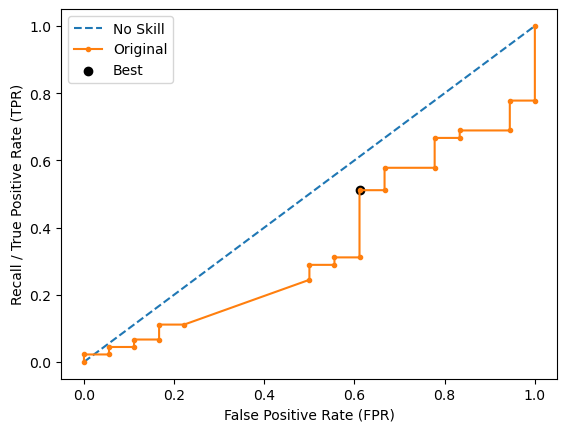

[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.6666666666666666
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.35714285714285715
Test F-0.75 Score: 0.3378378378378379
Test F-1 Score: 0.3225806451612903
Test F-1.5 Score: 0.3037383177570094
Test F-2 Score: 0.2941176470588235
Test G-Mean Score: 0.477906959280146
Best Threshold=0.387
Best Recall=0.689
Best G-Mean=0.587


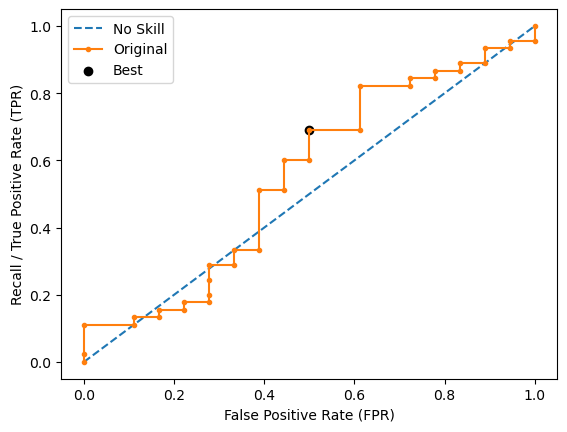

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.4444444444444444
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.1984126984126984
Test F-0.75 Score: 0.21043771043771048
Test F-1 Score: 0.22222222222222224
Test F-1.5 Score: 0.24074074074074076
Test F-2 Score: 0.2525252525252525
Test G-Mean Score: 0.376796110173626
Best Threshold=0.464
Best Recall=0.600
Best G-Mean=0.632


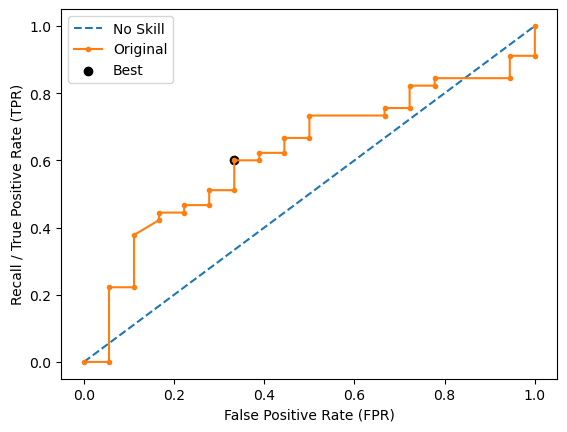

Ave Test Accuracy: 0.5936507936507937
Stdev Test Accuracy: 0.10013847806722226
Ave Test Recall: 0.31111111111111106
Stdev Test Recall: 0.10829771494232181
Ave Test F-0.5 Score: 0.30911031079098306
Stdev Test F-0.5 Score: 0.10213721895386725
Ave Test F-0.75 Score: 0.30727096277263755
Stdev Test F-0.75 Score: 0.10037073223921153
Ave Test F-1 Score: 0.30659237008982343
Stdev Test F-1 Score: 0.1002083168639271
Ave Test F-1.5 Score: 0.30703368587198915
Stdev Test F-1.5 Score: 0.1018204711270034
Ave Test F-2 Score: 0.30797693126296377
Stdev Test F-2 Score: 0.10356137779328926
Ave Test G-mean: 0.46281497876874866
Stdev Test G-mean: 0.0921272879517138
Ave Test Specificity: 0.7066666666666667
Stdev Test Specificity: 0.1290037802106666
Ave Test Precision: 0.3131176231176231
Ave Test NPV: 0.7160125507567368
Ave Runtime: 0.02382369041442871


In [155]:
ld_t03_svm_gs, ld_t03_svm_be, ld_t03_svm_model_info, ld_t03_svm_metrics_df = svm_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 400, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.6144680951007697
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                max_depth=3, n_estimators=400,
                                random_state=0))])
Mean Train Score (Recall) 0.8114379621370496
Std Train Score (Recall) 0.025033524627009803
GridSearchCV Runtime: 19.83182120323181 secs
Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3763440860215054
Test F-0.75 Score: 0.41966426858513184
Test F-1 Score: 0.46

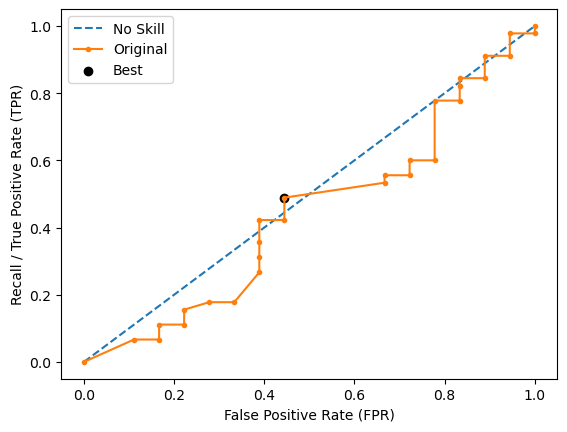

Run 2 - Random State: 1
Test Accuracy: 0.38095238095238093
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.2894736842105263
Test F-0.75 Score: 0.3235294117647059
Test F-1 Score: 0.36065573770491804
Test F-1.5 Score: 0.4281437125748503
Test F-2 Score: 0.47826086956521746
Test G-Mean Score: 0.4201704533597564
Best Threshold=0.503
Best Recall=0.689
Best G-Mean=0.553


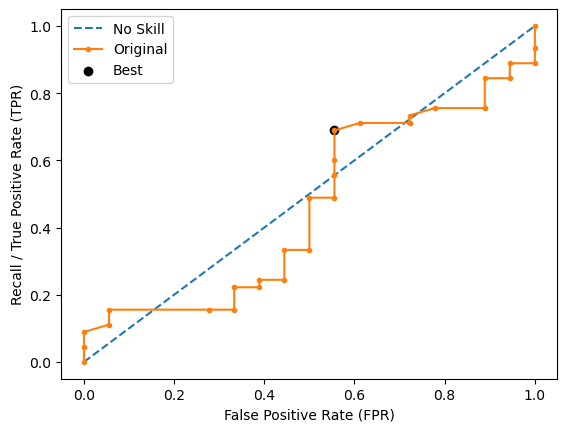

Run 3 - Random State: 2
Test Accuracy: 0.5079365079365079
Test Recall: 0.8888888888888888
Test F-0.5 Score: 0.40404040404040403
Test F-0.75 Score: 0.45351473922902497
Test F-1 Score: 0.5079365079365079
Test F-1.5 Score: 0.608187134502924
Test F-2 Score: 0.6837606837606838
Test G-Mean Score: 0.5621826951410452
Best Threshold=0.582
Best Recall=0.311
Best G-Mean=0.416


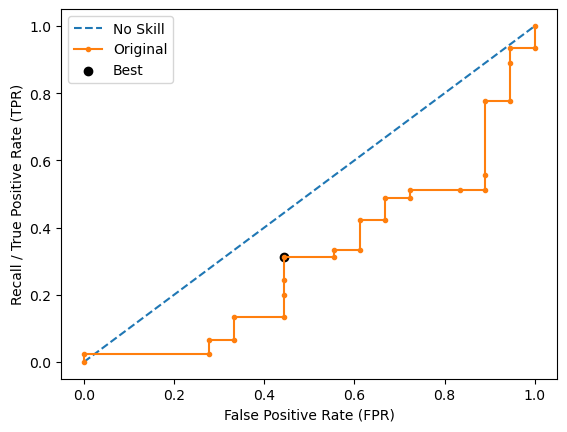

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.4385964912280702
Test F-0.75 Score: 0.45787545787545797
Test F-1 Score: 0.4761904761904762
Test F-1.5 Score: 0.5038759689922481
Test F-2 Score: 0.5208333333333334
Test G-Mean Score: 0.6186404847588913
Best Threshold=0.465
Best Recall=0.511
Best G-Mean=0.413


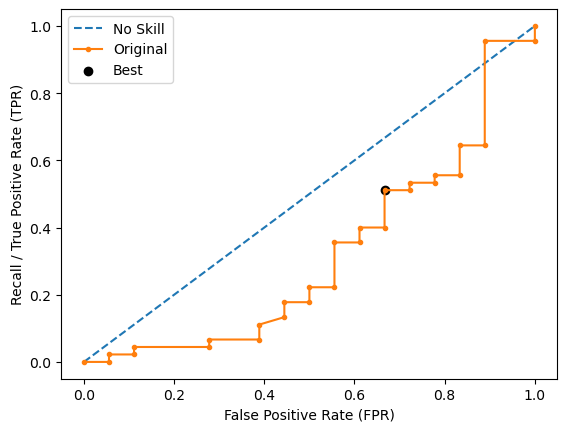

Run 5 - Random State: 4
Test Accuracy: 0.6031746031746031
Test Recall: 0.5
Test F-0.5 Score: 0.3813559322033898
Test F-0.75 Score: 0.400355871886121
Test F-1 Score: 0.41860465116279066
Test F-1.5 Score: 0.4465648854961832
Test F-2 Score: 0.46391752577319584
Test G-Mean Score: 0.5676462121975467
Best Threshold=0.447
Best Recall=0.689
Best G-Mean=0.518


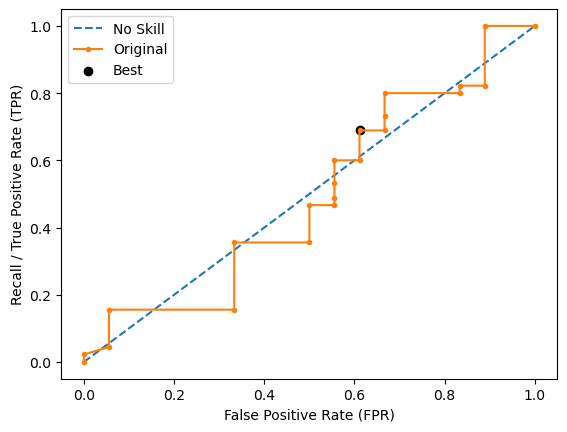

Ave Test Accuracy: 0.526984126984127
Stdev Test Accuracy: 0.10493011987960896
Ave Test Recall: 0.6666666666666666
Stdev Test Recall: 0.161970885967925
Ave Test F-0.5 Score: 0.3779621195407792
Stdev Test F-0.5 Score: 0.05522893973364568
Ave Test F-0.75 Score: 0.41098794986808834
Stdev Test F-0.75 Score: 0.05441571853877742
Ave Test F-1 Score: 0.4460108079322719
Stdev Test F-1 Score: 0.05746489067168549
Ave Test F-1.5 Score: 0.5076573706162714
Stdev Test F-1.5 Score: 0.07432824315830208
Ave Test F-2 Score: 0.5521615000303457
Stdev Test F-2 Score: 0.09404313134996828
Ave Test G-mean: 0.5421396216927855
Stdev Test G-mean: 0.07379223815106772
Ave Test Specificity: 0.47111111111111115
Stdev Test Specificity: 0.18216801361705956
Ave Test Precision: 0.34427390180878553
Ave Test NPV: 0.781288477604267
Ave Runtime: 0.24379525184631348


In [156]:
ld_t03_lgbm_gs, ld_t03_lgbm_be, ld_t03_lgbm_model_info, ld_t03_lgbm_metrics_df = lgbm_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5763467802169387
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 0.9198862297985471
Std Train Score (Recall) 0.011821605065665803
GridSearchCV Runtime: 8.448230981826782 secs
Run 1 - Random State: 0
Test Accuracy: 0.6031746031746031
Test Recall: 0.3333333333333333
Test F-0.5 Score: 0.3191489361702128
Test F-0.75 Score: 0.3218884120171674
Test 

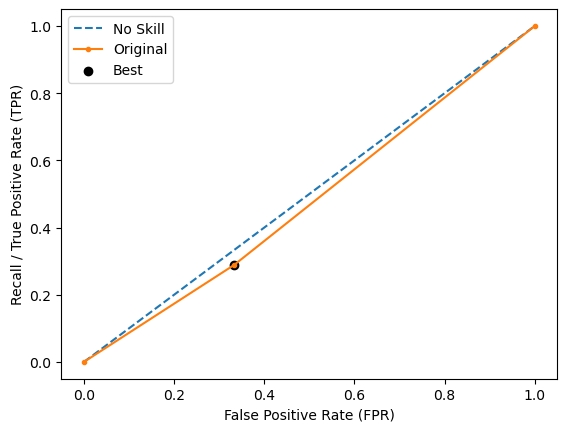

Run 2 - Random State: 1
Test Accuracy: 0.6031746031746031
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.3431372549019608
Test F-0.75 Score: 0.3514056224899598
Test F-1 Score: 0.358974358974359
Test F-1.5 Score: 0.3699186991869919
Test F-2 Score: 0.3763440860215054
Test G-Mean Score: 0.5175917643934274
Best Threshold=0.731
Best Recall=0.311
Best G-Mean=0.436


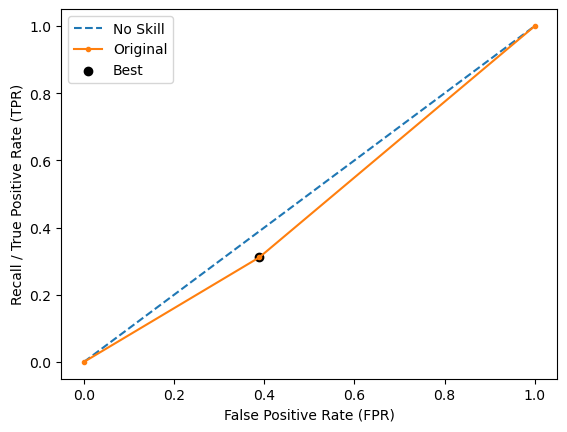

Run 3 - Random State: 2
Test Accuracy: 0.5555555555555556
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.25510204081632654
Test F-0.75 Score: 0.25933609958506226
Test F-1 Score: 0.2631578947368421
Test F-1.5 Score: 0.26859504132231404
Test F-2 Score: 0.2717391304347826
Test G-Mean Score: 0.43033148291193524
Best Threshold=0.731
Best Recall=0.333
Best G-Mean=0.491


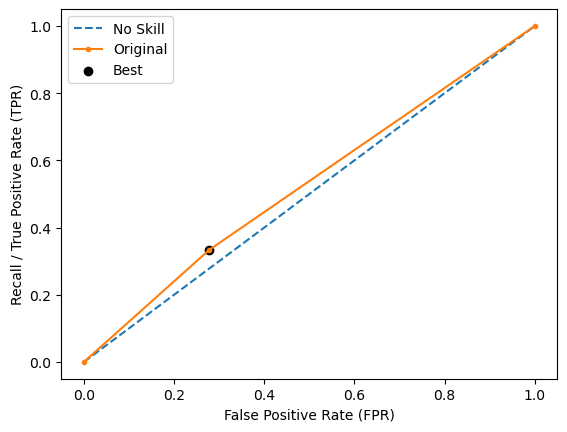

Run 4 - Random State: 3
Test Accuracy: 0.5873015873015873
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.35087719298245607
Test F-0.75 Score: 0.3663003663003662
Test F-1 Score: 0.380952380952381
Test F-1.5 Score: 0.4031007751937984
Test F-2 Score: 0.41666666666666663
Test G-Mean Score: 0.5351819812796575
Best Threshold=0.731
Best Recall=0.356
Best G-Mean=0.444


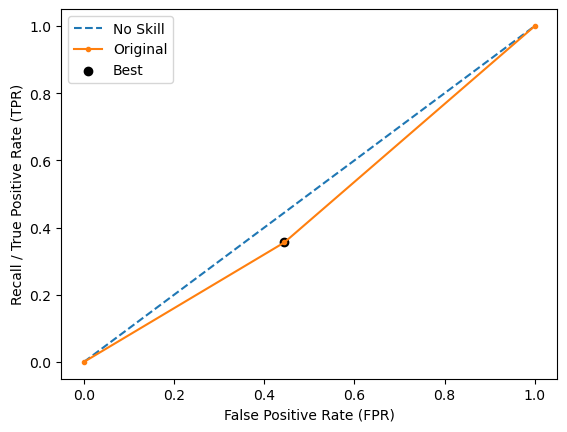

Run 5 - Random State: 4
Test Accuracy: 0.5714285714285714
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.26595744680851063
Test F-0.75 Score: 0.26824034334763946
Test F-1 Score: 0.27027027027027023
Test F-1.5 Score: 0.273109243697479
Test F-2 Score: 0.2747252747252747
Test G-Mean Score: 0.43744488188954506
Best Threshold=0.731
Best Recall=0.311
Best G-Mean=0.474


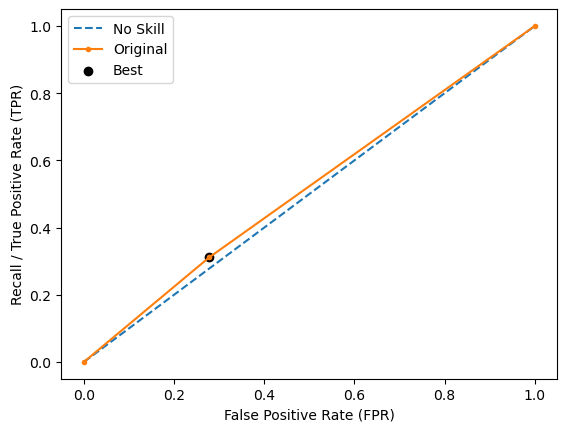

Ave Test Accuracy: 0.5841269841269842
Stdev Test Accuracy: 0.02069588065143696
Ave Test Recall: 0.34444444444444444
Stdev Test Recall: 0.07243558228002941
Ave Test F-0.5 Score: 0.30684457433589335
Stdev Test F-0.5 Score: 0.04403542454705655
Ave Test F-0.75 Score: 0.31343416874803903
Stdev Test F-0.75 Score: 0.0481591717994977
Ave Test F-1 Score: 0.3195358458516353
Stdev Test F-1 Score: 0.05233518638655304
Ave Test F-1.5 Score: 0.3284909703675116
Stdev Test F-1.5 Score: 0.05902989723641712
Ave Test F-2 Score: 0.3338290975037118
Stdev Test F-2 Score: 0.0633152989826176
Ave Test G-mean: 0.4814829212069426
Stdev Test G-mean: 0.04683005845086803
Ave Test Specificity: 0.6799999999999999
Stdev Test Specificity: 0.025337231668869732
Ave Test Precision: 0.29912280701754385
Ave Test NPV: 0.722235516421563
Ave Runtime: 0.021184253692626952


In [157]:
ld_t03_adaboost_gs, ld_t03_adaboost_be, ld_t03_adaboost_model_info, ld_t03_adaboost_metrics_df = adaboost_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.003903
0:	learn: 0.6921865	total: 2.09ms	remaining: 2.09s
1:	learn: 0.6907873	total: 3.94ms	remaining: 1.96s
2:	learn: 0.6889291	total: 5.41ms	remaining: 1.8s
3:	learn: 0.6872086	total: 6.81ms	remaining: 1.7s
4:	learn: 0.6856286	total: 8.26ms	remaining: 1.64s
5:	learn: 0.6835303	total: 9.87ms	remaining: 1.63s
6:	learn: 0.6821471	total: 11.5ms	remaining: 1.64s
7:	learn: 0.6810212	total: 13.1ms	remaining: 1.62s
8:	learn: 0.6802367	total: 15.1ms	remaining: 1.66s
9:	learn: 0.6785419	total: 16.5ms	remaining: 1.64s
10:	learn: 0.6775733	total: 18ms	remaining: 1.62s
11:	learn: 0.6765796	total: 19.6ms	remaining: 1.61s
12:	learn: 0.6748653	total: 21.2ms	remaining: 1.61s
13:	learn: 0.6733993	total: 22.7ms	remaining: 1.6s
14:	learn: 0.6722466	total: 24.3ms	remaining: 1.59s
15:	learn: 0.6714852	total: 26ms	remaining: 1.6s
16:	learn: 0.6701959	total: 27.3ms	remaining: 1.58s
17:	learn: 0.6685488	total: 28.7ms	remain

248:	learn: 0.4409736	total: 380ms	remaining: 1.15s
249:	learn: 0.4405742	total: 381ms	remaining: 1.14s
250:	learn: 0.4395864	total: 383ms	remaining: 1.14s
251:	learn: 0.4385616	total: 385ms	remaining: 1.14s
252:	learn: 0.4379298	total: 386ms	remaining: 1.14s
253:	learn: 0.4371669	total: 388ms	remaining: 1.14s
254:	learn: 0.4366691	total: 390ms	remaining: 1.14s
255:	learn: 0.4360711	total: 391ms	remaining: 1.14s
256:	learn: 0.4352427	total: 393ms	remaining: 1.14s
257:	learn: 0.4343523	total: 394ms	remaining: 1.13s
258:	learn: 0.4338636	total: 396ms	remaining: 1.13s
259:	learn: 0.4330303	total: 398ms	remaining: 1.13s
260:	learn: 0.4319839	total: 399ms	remaining: 1.13s
261:	learn: 0.4313122	total: 401ms	remaining: 1.13s
262:	learn: 0.4309414	total: 402ms	remaining: 1.13s
263:	learn: 0.4305158	total: 403ms	remaining: 1.12s
264:	learn: 0.4296054	total: 405ms	remaining: 1.12s
265:	learn: 0.4288056	total: 406ms	remaining: 1.12s
266:	learn: 0.4283964	total: 408ms	remaining: 1.12s
267:	learn: 

544:	learn: 0.2935533	total: 762ms	remaining: 636ms
545:	learn: 0.2934092	total: 764ms	remaining: 635ms
546:	learn: 0.2930378	total: 765ms	remaining: 634ms
547:	learn: 0.2927270	total: 767ms	remaining: 632ms
548:	learn: 0.2924600	total: 768ms	remaining: 631ms
549:	learn: 0.2920699	total: 769ms	remaining: 629ms
550:	learn: 0.2917696	total: 771ms	remaining: 628ms
551:	learn: 0.2915430	total: 772ms	remaining: 626ms
552:	learn: 0.2912072	total: 773ms	remaining: 625ms
553:	learn: 0.2910107	total: 775ms	remaining: 624ms
554:	learn: 0.2908131	total: 776ms	remaining: 622ms
555:	learn: 0.2905243	total: 777ms	remaining: 621ms
556:	learn: 0.2901032	total: 779ms	remaining: 619ms
557:	learn: 0.2898889	total: 780ms	remaining: 618ms
558:	learn: 0.2893530	total: 781ms	remaining: 616ms
559:	learn: 0.2890294	total: 783ms	remaining: 615ms
560:	learn: 0.2886973	total: 784ms	remaining: 614ms
561:	learn: 0.2883878	total: 785ms	remaining: 612ms
562:	learn: 0.2881053	total: 787ms	remaining: 611ms
563:	learn: 

855:	learn: 0.2058046	total: 1.14s	remaining: 192ms
856:	learn: 0.2056471	total: 1.15s	remaining: 191ms
857:	learn: 0.2055806	total: 1.15s	remaining: 190ms
858:	learn: 0.2052650	total: 1.15s	remaining: 188ms
859:	learn: 0.2051161	total: 1.15s	remaining: 187ms
860:	learn: 0.2048905	total: 1.15s	remaining: 186ms
861:	learn: 0.2046316	total: 1.15s	remaining: 184ms
862:	learn: 0.2043436	total: 1.15s	remaining: 183ms
863:	learn: 0.2042720	total: 1.15s	remaining: 182ms
864:	learn: 0.2040314	total: 1.16s	remaining: 180ms
865:	learn: 0.2037973	total: 1.16s	remaining: 179ms
866:	learn: 0.2036373	total: 1.16s	remaining: 178ms
867:	learn: 0.2032797	total: 1.16s	remaining: 176ms
868:	learn: 0.2030995	total: 1.16s	remaining: 175ms
869:	learn: 0.2029760	total: 1.16s	remaining: 174ms
870:	learn: 0.2028308	total: 1.16s	remaining: 172ms
871:	learn: 0.2026131	total: 1.16s	remaining: 171ms
872:	learn: 0.2023799	total: 1.17s	remaining: 170ms
873:	learn: 0.2021555	total: 1.17s	remaining: 168ms
874:	learn: 

158:	learn: 0.5118856	total: 200ms	remaining: 1.06s
159:	learn: 0.5106638	total: 201ms	remaining: 1.06s
160:	learn: 0.5096846	total: 203ms	remaining: 1.06s
161:	learn: 0.5084828	total: 204ms	remaining: 1.05s
162:	learn: 0.5080665	total: 205ms	remaining: 1.05s
163:	learn: 0.5072962	total: 207ms	remaining: 1.05s
164:	learn: 0.5065751	total: 208ms	remaining: 1.05s
165:	learn: 0.5059235	total: 209ms	remaining: 1.05s
166:	learn: 0.5049378	total: 211ms	remaining: 1.05s
167:	learn: 0.5040613	total: 212ms	remaining: 1.05s
168:	learn: 0.5033393	total: 213ms	remaining: 1.05s
169:	learn: 0.5021804	total: 215ms	remaining: 1.05s
170:	learn: 0.5011876	total: 216ms	remaining: 1.05s
171:	learn: 0.5002913	total: 217ms	remaining: 1.05s
172:	learn: 0.4990317	total: 219ms	remaining: 1.04s
173:	learn: 0.4990051	total: 219ms	remaining: 1.04s
174:	learn: 0.4983987	total: 221ms	remaining: 1.04s
175:	learn: 0.4971895	total: 222ms	remaining: 1.04s
176:	learn: 0.4962244	total: 223ms	remaining: 1.04s
177:	learn: 

319:	learn: 0.3966548	total: 393ms	remaining: 834ms
320:	learn: 0.3958703	total: 394ms	remaining: 833ms
321:	learn: 0.3953049	total: 395ms	remaining: 832ms
322:	learn: 0.3949530	total: 397ms	remaining: 831ms
323:	learn: 0.3941186	total: 398ms	remaining: 830ms
324:	learn: 0.3937715	total: 399ms	remaining: 829ms
325:	learn: 0.3933510	total: 401ms	remaining: 828ms
326:	learn: 0.3927371	total: 402ms	remaining: 827ms
327:	learn: 0.3919573	total: 403ms	remaining: 826ms
328:	learn: 0.3911689	total: 405ms	remaining: 825ms
329:	learn: 0.3908810	total: 406ms	remaining: 824ms
330:	learn: 0.3903458	total: 407ms	remaining: 823ms
331:	learn: 0.3899712	total: 409ms	remaining: 822ms
332:	learn: 0.3892593	total: 410ms	remaining: 821ms
333:	learn: 0.3886906	total: 411ms	remaining: 820ms
334:	learn: 0.3879667	total: 413ms	remaining: 819ms
335:	learn: 0.3874027	total: 414ms	remaining: 818ms
336:	learn: 0.3871216	total: 415ms	remaining: 817ms
337:	learn: 0.3866908	total: 417ms	remaining: 816ms
338:	learn: 

480:	learn: 0.3189248	total: 585ms	remaining: 631ms
481:	learn: 0.3186518	total: 586ms	remaining: 630ms
482:	learn: 0.3179967	total: 588ms	remaining: 629ms
483:	learn: 0.3174435	total: 589ms	remaining: 628ms
484:	learn: 0.3168800	total: 590ms	remaining: 627ms
485:	learn: 0.3164565	total: 592ms	remaining: 626ms
486:	learn: 0.3155815	total: 593ms	remaining: 625ms
487:	learn: 0.3150020	total: 594ms	remaining: 624ms
488:	learn: 0.3146525	total: 596ms	remaining: 622ms
489:	learn: 0.3144442	total: 597ms	remaining: 621ms
490:	learn: 0.3142399	total: 598ms	remaining: 620ms
491:	learn: 0.3136803	total: 599ms	remaining: 619ms
492:	learn: 0.3133011	total: 601ms	remaining: 618ms
493:	learn: 0.3129496	total: 602ms	remaining: 616ms
494:	learn: 0.3125931	total: 603ms	remaining: 615ms
495:	learn: 0.3122205	total: 604ms	remaining: 614ms
496:	learn: 0.3115956	total: 606ms	remaining: 613ms
497:	learn: 0.3112185	total: 607ms	remaining: 612ms
498:	learn: 0.3109437	total: 609ms	remaining: 611ms
499:	learn: 

793:	learn: 0.2191020	total: 972ms	remaining: 252ms
794:	learn: 0.2187504	total: 973ms	remaining: 251ms
795:	learn: 0.2186495	total: 975ms	remaining: 250ms
796:	learn: 0.2185081	total: 976ms	remaining: 249ms
797:	learn: 0.2183971	total: 977ms	remaining: 247ms
798:	learn: 0.2180930	total: 979ms	remaining: 246ms
799:	learn: 0.2179819	total: 980ms	remaining: 245ms
800:	learn: 0.2179143	total: 981ms	remaining: 244ms
801:	learn: 0.2177534	total: 982ms	remaining: 243ms
802:	learn: 0.2174749	total: 983ms	remaining: 241ms
803:	learn: 0.2172318	total: 985ms	remaining: 240ms
804:	learn: 0.2169962	total: 986ms	remaining: 239ms
805:	learn: 0.2168416	total: 987ms	remaining: 238ms
806:	learn: 0.2165487	total: 989ms	remaining: 236ms
807:	learn: 0.2162580	total: 990ms	remaining: 235ms
808:	learn: 0.2159830	total: 991ms	remaining: 234ms
809:	learn: 0.2156631	total: 993ms	remaining: 233ms
810:	learn: 0.2155196	total: 994ms	remaining: 232ms
811:	learn: 0.2153324	total: 995ms	remaining: 230ms
812:	learn: 

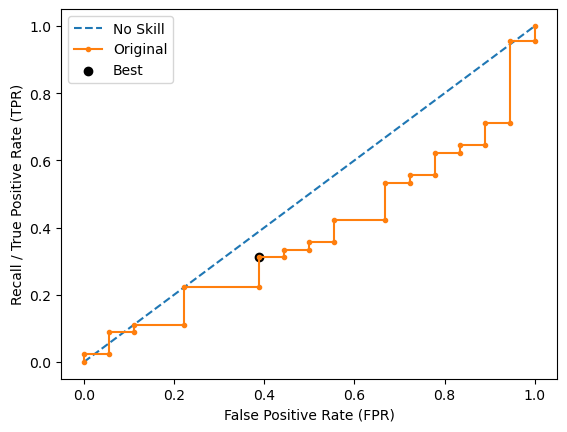

Learning rate set to 0.003854
0:	learn: 0.6915398	total: 1.64ms	remaining: 1.64s
1:	learn: 0.6900753	total: 3.07ms	remaining: 1.53s
2:	learn: 0.6889296	total: 4.54ms	remaining: 1.51s
3:	learn: 0.6879468	total: 6.62ms	remaining: 1.65s
4:	learn: 0.6863492	total: 8.34ms	remaining: 1.66s
5:	learn: 0.6842799	total: 10.3ms	remaining: 1.71s
6:	learn: 0.6820580	total: 12ms	remaining: 1.71s
7:	learn: 0.6809482	total: 13.7ms	remaining: 1.7s
8:	learn: 0.6786357	total: 15.3ms	remaining: 1.68s
9:	learn: 0.6770582	total: 16.9ms	remaining: 1.67s
10:	learn: 0.6756807	total: 18.2ms	remaining: 1.63s
11:	learn: 0.6735139	total: 19.8ms	remaining: 1.63s
12:	learn: 0.6714592	total: 21.1ms	remaining: 1.6s
13:	learn: 0.6695110	total: 22.6ms	remaining: 1.59s
14:	learn: 0.6683594	total: 23.9ms	remaining: 1.57s
15:	learn: 0.6669180	total: 25ms	remaining: 1.54s
16:	learn: 0.6662245	total: 26ms	remaining: 1.5s
17:	learn: 0.6641100	total: 27ms	remaining: 1.48s
18:	learn: 0.6625937	total: 28.4ms	remaining: 1.46s
19:

318:	learn: 0.3819907	total: 384ms	remaining: 819ms
319:	learn: 0.3817406	total: 385ms	remaining: 818ms
320:	learn: 0.3810412	total: 386ms	remaining: 817ms
321:	learn: 0.3805257	total: 388ms	remaining: 816ms
322:	learn: 0.3802168	total: 389ms	remaining: 815ms
323:	learn: 0.3795760	total: 390ms	remaining: 814ms
324:	learn: 0.3786333	total: 391ms	remaining: 813ms
325:	learn: 0.3775070	total: 393ms	remaining: 812ms
326:	learn: 0.3770522	total: 394ms	remaining: 811ms
327:	learn: 0.3762069	total: 395ms	remaining: 810ms
328:	learn: 0.3757573	total: 397ms	remaining: 809ms
329:	learn: 0.3754827	total: 398ms	remaining: 808ms
330:	learn: 0.3749030	total: 399ms	remaining: 807ms
331:	learn: 0.3743978	total: 401ms	remaining: 807ms
332:	learn: 0.3742941	total: 402ms	remaining: 805ms
333:	learn: 0.3738796	total: 403ms	remaining: 804ms
334:	learn: 0.3735413	total: 405ms	remaining: 803ms
335:	learn: 0.3727596	total: 406ms	remaining: 802ms
336:	learn: 0.3725108	total: 407ms	remaining: 801ms
337:	learn: 

479:	learn: 0.3016109	total: 575ms	remaining: 623ms
480:	learn: 0.3009134	total: 577ms	remaining: 622ms
481:	learn: 0.3004589	total: 578ms	remaining: 621ms
482:	learn: 0.3002784	total: 580ms	remaining: 620ms
483:	learn: 0.2998739	total: 581ms	remaining: 619ms
484:	learn: 0.2993603	total: 582ms	remaining: 618ms
485:	learn: 0.2991211	total: 583ms	remaining: 617ms
486:	learn: 0.2987610	total: 585ms	remaining: 616ms
487:	learn: 0.2985520	total: 586ms	remaining: 615ms
488:	learn: 0.2978688	total: 588ms	remaining: 614ms
489:	learn: 0.2971862	total: 589ms	remaining: 613ms
490:	learn: 0.2968327	total: 590ms	remaining: 612ms
491:	learn: 0.2964686	total: 592ms	remaining: 611ms
492:	learn: 0.2958031	total: 593ms	remaining: 610ms
493:	learn: 0.2955204	total: 594ms	remaining: 608ms
494:	learn: 0.2951878	total: 595ms	remaining: 607ms
495:	learn: 0.2947457	total: 597ms	remaining: 606ms
496:	learn: 0.2944952	total: 598ms	remaining: 605ms
497:	learn: 0.2941409	total: 599ms	remaining: 604ms
498:	learn: 

639:	learn: 0.2447487	total: 770ms	remaining: 433ms
640:	learn: 0.2443296	total: 772ms	remaining: 432ms
641:	learn: 0.2439518	total: 773ms	remaining: 431ms
642:	learn: 0.2438015	total: 775ms	remaining: 430ms
643:	learn: 0.2434335	total: 776ms	remaining: 429ms
644:	learn: 0.2432959	total: 777ms	remaining: 428ms
645:	learn: 0.2429880	total: 779ms	remaining: 427ms
646:	learn: 0.2426641	total: 780ms	remaining: 425ms
647:	learn: 0.2423656	total: 781ms	remaining: 424ms
648:	learn: 0.2420737	total: 782ms	remaining: 423ms
649:	learn: 0.2418004	total: 783ms	remaining: 422ms
650:	learn: 0.2416077	total: 784ms	remaining: 421ms
651:	learn: 0.2413033	total: 786ms	remaining: 420ms
652:	learn: 0.2411174	total: 788ms	remaining: 418ms
653:	learn: 0.2407890	total: 789ms	remaining: 417ms
654:	learn: 0.2403996	total: 790ms	remaining: 416ms
655:	learn: 0.2403204	total: 792ms	remaining: 415ms
656:	learn: 0.2401105	total: 793ms	remaining: 414ms
657:	learn: 0.2396366	total: 794ms	remaining: 413ms
658:	learn: 

955:	learn: 0.1674005	total: 1.16s	remaining: 53.2ms
956:	learn: 0.1671791	total: 1.16s	remaining: 52ms
957:	learn: 0.1669186	total: 1.16s	remaining: 50.8ms
958:	learn: 0.1666458	total: 1.16s	remaining: 49.6ms
959:	learn: 0.1663495	total: 1.16s	remaining: 48.4ms
960:	learn: 0.1661535	total: 1.16s	remaining: 47.2ms
961:	learn: 0.1658932	total: 1.16s	remaining: 46ms
962:	learn: 0.1655450	total: 1.17s	remaining: 44.8ms
963:	learn: 0.1653784	total: 1.17s	remaining: 43.6ms
964:	learn: 0.1651138	total: 1.17s	remaining: 42.4ms
965:	learn: 0.1649010	total: 1.17s	remaining: 41.2ms
966:	learn: 0.1648439	total: 1.17s	remaining: 39.9ms
967:	learn: 0.1647003	total: 1.17s	remaining: 38.7ms
968:	learn: 0.1644190	total: 1.17s	remaining: 37.5ms
969:	learn: 0.1642202	total: 1.17s	remaining: 36.3ms
970:	learn: 0.1640245	total: 1.18s	remaining: 35.1ms
971:	learn: 0.1638130	total: 1.18s	remaining: 33.9ms
972:	learn: 0.1636078	total: 1.18s	remaining: 32.7ms
973:	learn: 0.1635377	total: 1.18s	remaining: 31.5

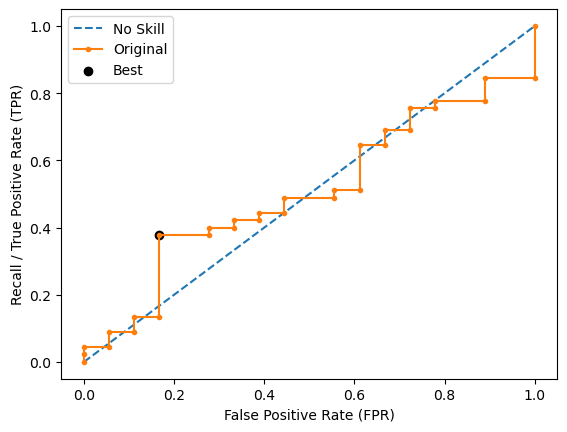

Learning rate set to 0.003821
0:	learn: 0.6920430	total: 2.15ms	remaining: 2.15s
1:	learn: 0.6906438	total: 5.3ms	remaining: 2.64s
2:	learn: 0.6891465	total: 7.69ms	remaining: 2.55s
3:	learn: 0.6876579	total: 10.4ms	remaining: 2.58s
4:	learn: 0.6858995	total: 12.6ms	remaining: 2.52s
5:	learn: 0.6845970	total: 15ms	remaining: 2.49s
6:	learn: 0.6832923	total: 16.7ms	remaining: 2.37s
7:	learn: 0.6820553	total: 18.8ms	remaining: 2.34s
8:	learn: 0.6805115	total: 20.9ms	remaining: 2.31s
9:	learn: 0.6790406	total: 22.9ms	remaining: 2.27s
10:	learn: 0.6781927	total: 25ms	remaining: 2.25s
11:	learn: 0.6775951	total: 27.3ms	remaining: 2.24s
12:	learn: 0.6760894	total: 28.8ms	remaining: 2.19s
13:	learn: 0.6751424	total: 30.8ms	remaining: 2.17s
14:	learn: 0.6739746	total: 32.2ms	remaining: 2.11s
15:	learn: 0.6728849	total: 34.2ms	remaining: 2.1s
16:	learn: 0.6708785	total: 36ms	remaining: 2.08s
17:	learn: 0.6696174	total: 37.2ms	remaining: 2.03s
18:	learn: 0.6681185	total: 39ms	remaining: 2.02s
19

164:	learn: 0.5013606	total: 204ms	remaining: 1.03s
165:	learn: 0.5009852	total: 205ms	remaining: 1.03s
166:	learn: 0.4997794	total: 207ms	remaining: 1.03s
167:	learn: 0.4988336	total: 208ms	remaining: 1.03s
168:	learn: 0.4979212	total: 209ms	remaining: 1.03s
169:	learn: 0.4974244	total: 211ms	remaining: 1.03s
170:	learn: 0.4967032	total: 212ms	remaining: 1.03s
171:	learn: 0.4958084	total: 213ms	remaining: 1.02s
172:	learn: 0.4945965	total: 214ms	remaining: 1.02s
173:	learn: 0.4939278	total: 216ms	remaining: 1.02s
174:	learn: 0.4931901	total: 217ms	remaining: 1.02s
175:	learn: 0.4920742	total: 218ms	remaining: 1.02s
176:	learn: 0.4914104	total: 219ms	remaining: 1.02s
177:	learn: 0.4909799	total: 220ms	remaining: 1.02s
178:	learn: 0.4899243	total: 222ms	remaining: 1.02s
179:	learn: 0.4889532	total: 223ms	remaining: 1.01s
180:	learn: 0.4884721	total: 224ms	remaining: 1.01s
181:	learn: 0.4875000	total: 225ms	remaining: 1.01s
182:	learn: 0.4871459	total: 226ms	remaining: 1.01s
183:	learn: 

332:	learn: 0.3844001	total: 395ms	remaining: 790ms
333:	learn: 0.3836850	total: 396ms	remaining: 789ms
334:	learn: 0.3833046	total: 397ms	remaining: 789ms
335:	learn: 0.3829428	total: 398ms	remaining: 787ms
336:	learn: 0.3826731	total: 400ms	remaining: 787ms
337:	learn: 0.3819715	total: 401ms	remaining: 785ms
338:	learn: 0.3811152	total: 402ms	remaining: 784ms
339:	learn: 0.3804180	total: 404ms	remaining: 783ms
340:	learn: 0.3799523	total: 405ms	remaining: 782ms
341:	learn: 0.3795288	total: 406ms	remaining: 781ms
342:	learn: 0.3788480	total: 407ms	remaining: 780ms
343:	learn: 0.3783562	total: 408ms	remaining: 779ms
344:	learn: 0.3778898	total: 409ms	remaining: 777ms
345:	learn: 0.3772298	total: 411ms	remaining: 776ms
346:	learn: 0.3765031	total: 412ms	remaining: 775ms
347:	learn: 0.3756794	total: 413ms	remaining: 774ms
348:	learn: 0.3754208	total: 414ms	remaining: 773ms
349:	learn: 0.3747836	total: 416ms	remaining: 772ms
350:	learn: 0.3739793	total: 417ms	remaining: 771ms
351:	learn: 

494:	learn: 0.3036619	total: 589ms	remaining: 601ms
495:	learn: 0.3030027	total: 590ms	remaining: 600ms
496:	learn: 0.3024409	total: 592ms	remaining: 599ms
497:	learn: 0.3022451	total: 593ms	remaining: 598ms
498:	learn: 0.3018779	total: 595ms	remaining: 597ms
499:	learn: 0.3015325	total: 596ms	remaining: 596ms
500:	learn: 0.3010911	total: 597ms	remaining: 595ms
501:	learn: 0.3006824	total: 599ms	remaining: 594ms
502:	learn: 0.3002166	total: 600ms	remaining: 593ms
503:	learn: 0.2998794	total: 601ms	remaining: 592ms
504:	learn: 0.2993148	total: 603ms	remaining: 591ms
505:	learn: 0.2990234	total: 604ms	remaining: 590ms
506:	learn: 0.2984427	total: 606ms	remaining: 589ms
507:	learn: 0.2980941	total: 607ms	remaining: 588ms
508:	learn: 0.2976850	total: 609ms	remaining: 587ms
509:	learn: 0.2973711	total: 610ms	remaining: 586ms
510:	learn: 0.2967435	total: 612ms	remaining: 585ms
511:	learn: 0.2963242	total: 613ms	remaining: 584ms
512:	learn: 0.2960900	total: 615ms	remaining: 583ms
513:	learn: 

810:	learn: 0.2035981	total: 974ms	remaining: 227ms
811:	learn: 0.2032095	total: 976ms	remaining: 226ms
812:	learn: 0.2029734	total: 977ms	remaining: 225ms
813:	learn: 0.2027178	total: 979ms	remaining: 224ms
814:	learn: 0.2024501	total: 980ms	remaining: 222ms
815:	learn: 0.2022824	total: 981ms	remaining: 221ms
816:	learn: 0.2021508	total: 983ms	remaining: 220ms
817:	learn: 0.2018955	total: 984ms	remaining: 219ms
818:	learn: 0.2018707	total: 985ms	remaining: 218ms
819:	learn: 0.2016463	total: 986ms	remaining: 216ms
820:	learn: 0.2014683	total: 987ms	remaining: 215ms
821:	learn: 0.2012765	total: 988ms	remaining: 214ms
822:	learn: 0.2008893	total: 990ms	remaining: 213ms
823:	learn: 0.2007231	total: 991ms	remaining: 212ms
824:	learn: 0.2004375	total: 992ms	remaining: 210ms
825:	learn: 0.2000603	total: 993ms	remaining: 209ms
826:	learn: 0.1998090	total: 995ms	remaining: 208ms
827:	learn: 0.1996617	total: 996ms	remaining: 207ms
828:	learn: 0.1993713	total: 997ms	remaining: 206ms
829:	learn: 

974:	learn: 0.1686571	total: 1.17s	remaining: 29.9ms
975:	learn: 0.1685081	total: 1.17s	remaining: 28.7ms
976:	learn: 0.1682751	total: 1.17s	remaining: 27.5ms
977:	learn: 0.1682030	total: 1.17s	remaining: 26.3ms
978:	learn: 0.1680812	total: 1.17s	remaining: 25.1ms
979:	learn: 0.1678807	total: 1.17s	remaining: 23.9ms
980:	learn: 0.1677073	total: 1.17s	remaining: 22.7ms
981:	learn: 0.1673581	total: 1.17s	remaining: 21.5ms
982:	learn: 0.1671775	total: 1.18s	remaining: 20.3ms
983:	learn: 0.1668784	total: 1.18s	remaining: 19.1ms
984:	learn: 0.1667170	total: 1.18s	remaining: 17.9ms
985:	learn: 0.1664824	total: 1.18s	remaining: 16.8ms
986:	learn: 0.1662916	total: 1.18s	remaining: 15.6ms
987:	learn: 0.1660720	total: 1.18s	remaining: 14.4ms
988:	learn: 0.1659354	total: 1.18s	remaining: 13.2ms
989:	learn: 0.1657264	total: 1.18s	remaining: 12ms
990:	learn: 0.1654434	total: 1.19s	remaining: 10.8ms
991:	learn: 0.1651444	total: 1.19s	remaining: 9.58ms
992:	learn: 0.1649368	total: 1.19s	remaining: 8.

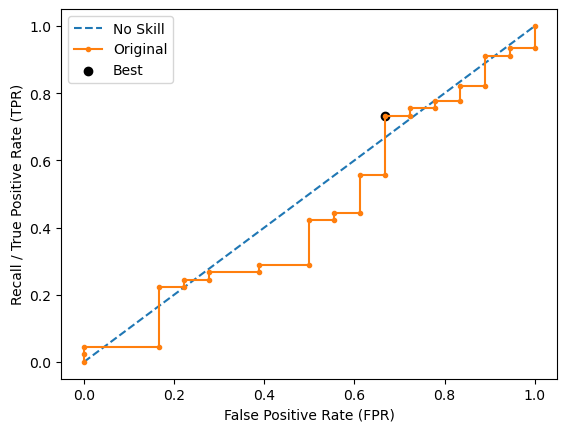

Learning rate set to 0.004061
0:	learn: 0.6918616	total: 1.39ms	remaining: 1.39s
1:	learn: 0.6898959	total: 4.32ms	remaining: 2.16s
2:	learn: 0.6894612	total: 8.21ms	remaining: 2.73s
3:	learn: 0.6878857	total: 12.4ms	remaining: 3.1s
4:	learn: 0.6873412	total: 15.4ms	remaining: 3.06s
5:	learn: 0.6864677	total: 18ms	remaining: 2.98s
6:	learn: 0.6858352	total: 20.6ms	remaining: 2.92s
7:	learn: 0.6845957	total: 23.3ms	remaining: 2.89s
8:	learn: 0.6832544	total: 25.3ms	remaining: 2.78s
9:	learn: 0.6826901	total: 27.8ms	remaining: 2.75s
10:	learn: 0.6812184	total: 30ms	remaining: 2.7s
11:	learn: 0.6794194	total: 32ms	remaining: 2.63s
12:	learn: 0.6784040	total: 34ms	remaining: 2.58s
13:	learn: 0.6760597	total: 35.9ms	remaining: 2.53s
14:	learn: 0.6746901	total: 37.8ms	remaining: 2.48s
15:	learn: 0.6738760	total: 39.6ms	remaining: 2.44s
16:	learn: 0.6727567	total: 41.2ms	remaining: 2.38s
17:	learn: 0.6717666	total: 42.9ms	remaining: 2.34s
18:	learn: 0.6701653	total: 44.3ms	remaining: 2.29s
19

255:	learn: 0.4543744	total: 404ms	remaining: 1.18s
256:	learn: 0.4536833	total: 406ms	remaining: 1.17s
257:	learn: 0.4531046	total: 408ms	remaining: 1.17s
258:	learn: 0.4523595	total: 409ms	remaining: 1.17s
259:	learn: 0.4517026	total: 411ms	remaining: 1.17s
260:	learn: 0.4512057	total: 412ms	remaining: 1.17s
261:	learn: 0.4506408	total: 414ms	remaining: 1.17s
262:	learn: 0.4498296	total: 415ms	remaining: 1.16s
263:	learn: 0.4492458	total: 417ms	remaining: 1.16s
264:	learn: 0.4488188	total: 418ms	remaining: 1.16s
265:	learn: 0.4481527	total: 420ms	remaining: 1.16s
266:	learn: 0.4472747	total: 422ms	remaining: 1.16s
267:	learn: 0.4468947	total: 423ms	remaining: 1.16s
268:	learn: 0.4460025	total: 425ms	remaining: 1.15s
269:	learn: 0.4451033	total: 426ms	remaining: 1.15s
270:	learn: 0.4445928	total: 427ms	remaining: 1.15s
271:	learn: 0.4439210	total: 429ms	remaining: 1.15s
272:	learn: 0.4431849	total: 430ms	remaining: 1.15s
273:	learn: 0.4425506	total: 432ms	remaining: 1.14s
274:	learn: 

514:	learn: 0.3217873	total: 792ms	remaining: 746ms
515:	learn: 0.3213026	total: 794ms	remaining: 744ms
516:	learn: 0.3211561	total: 795ms	remaining: 743ms
517:	learn: 0.3207498	total: 797ms	remaining: 741ms
518:	learn: 0.3203433	total: 798ms	remaining: 740ms
519:	learn: 0.3201500	total: 800ms	remaining: 739ms
520:	learn: 0.3199317	total: 802ms	remaining: 737ms
521:	learn: 0.3196154	total: 804ms	remaining: 736ms
522:	learn: 0.3190624	total: 805ms	remaining: 735ms
523:	learn: 0.3187811	total: 807ms	remaining: 733ms
524:	learn: 0.3185009	total: 809ms	remaining: 732ms
525:	learn: 0.3182252	total: 811ms	remaining: 731ms
526:	learn: 0.3179363	total: 812ms	remaining: 729ms
527:	learn: 0.3172191	total: 814ms	remaining: 728ms
528:	learn: 0.3166460	total: 816ms	remaining: 726ms
529:	learn: 0.3164493	total: 817ms	remaining: 725ms
530:	learn: 0.3160375	total: 819ms	remaining: 724ms
531:	learn: 0.3157692	total: 821ms	remaining: 722ms
532:	learn: 0.3153973	total: 823ms	remaining: 721ms
533:	learn: 

777:	learn: 0.2375971	total: 1.18s	remaining: 337ms
778:	learn: 0.2375026	total: 1.18s	remaining: 336ms
779:	learn: 0.2372707	total: 1.19s	remaining: 334ms
780:	learn: 0.2369841	total: 1.19s	remaining: 333ms
781:	learn: 0.2367345	total: 1.19s	remaining: 331ms
782:	learn: 0.2364914	total: 1.19s	remaining: 330ms
783:	learn: 0.2360898	total: 1.19s	remaining: 328ms
784:	learn: 0.2358471	total: 1.19s	remaining: 327ms
785:	learn: 0.2355783	total: 1.19s	remaining: 325ms
786:	learn: 0.2353616	total: 1.2s	remaining: 324ms
787:	learn: 0.2353002	total: 1.2s	remaining: 322ms
788:	learn: 0.2350556	total: 1.2s	remaining: 321ms
789:	learn: 0.2347721	total: 1.2s	remaining: 319ms
790:	learn: 0.2345385	total: 1.2s	remaining: 318ms
791:	learn: 0.2341704	total: 1.2s	remaining: 316ms
792:	learn: 0.2339766	total: 1.21s	remaining: 315ms
793:	learn: 0.2338069	total: 1.21s	remaining: 313ms
794:	learn: 0.2336358	total: 1.21s	remaining: 312ms
795:	learn: 0.2333426	total: 1.21s	remaining: 310ms
796:	learn: 0.2331

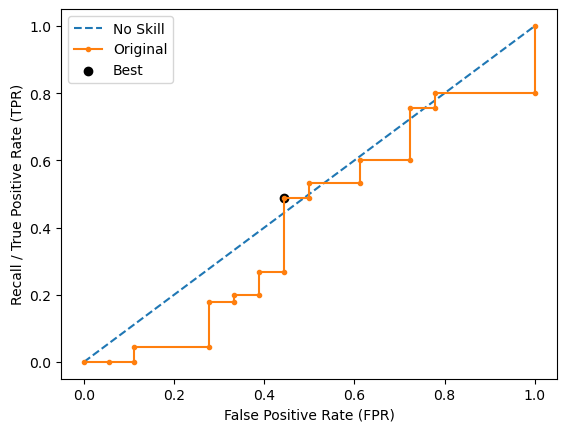

Learning rate set to 0.004045
0:	learn: 0.6923877	total: 1.47ms	remaining: 1.47s
1:	learn: 0.6907887	total: 4.34ms	remaining: 2.17s
2:	learn: 0.6900236	total: 6.07ms	remaining: 2.02s
3:	learn: 0.6894631	total: 8.17ms	remaining: 2.03s
4:	learn: 0.6878007	total: 10.7ms	remaining: 2.14s
5:	learn: 0.6864516	total: 13ms	remaining: 2.16s
6:	learn: 0.6846952	total: 15.5ms	remaining: 2.2s
7:	learn: 0.6839099	total: 17.8ms	remaining: 2.2s
8:	learn: 0.6824879	total: 19.8ms	remaining: 2.18s
9:	learn: 0.6811435	total: 21.9ms	remaining: 2.17s
10:	learn: 0.6806804	total: 23.9ms	remaining: 2.15s
11:	learn: 0.6792770	total: 25.8ms	remaining: 2.13s
12:	learn: 0.6780465	total: 27.6ms	remaining: 2.1s
13:	learn: 0.6767367	total: 29.7ms	remaining: 2.09s
14:	learn: 0.6759156	total: 31.6ms	remaining: 2.08s
15:	learn: 0.6748921	total: 33.3ms	remaining: 2.05s
16:	learn: 0.6737266	total: 35ms	remaining: 2.02s
17:	learn: 0.6722423	total: 36.8ms	remaining: 2.01s
18:	learn: 0.6713752	total: 38.6ms	remaining: 1.99s

255:	learn: 0.4559187	total: 389ms	remaining: 1.13s
256:	learn: 0.4554928	total: 391ms	remaining: 1.13s
257:	learn: 0.4546325	total: 392ms	remaining: 1.13s
258:	learn: 0.4541409	total: 394ms	remaining: 1.13s
259:	learn: 0.4537139	total: 395ms	remaining: 1.12s
260:	learn: 0.4529982	total: 396ms	remaining: 1.12s
261:	learn: 0.4521877	total: 398ms	remaining: 1.12s
262:	learn: 0.4514794	total: 399ms	remaining: 1.12s
263:	learn: 0.4506774	total: 401ms	remaining: 1.12s
264:	learn: 0.4503961	total: 402ms	remaining: 1.11s
265:	learn: 0.4494845	total: 404ms	remaining: 1.11s
266:	learn: 0.4491077	total: 405ms	remaining: 1.11s
267:	learn: 0.4481590	total: 407ms	remaining: 1.11s
268:	learn: 0.4472739	total: 408ms	remaining: 1.11s
269:	learn: 0.4466938	total: 410ms	remaining: 1.11s
270:	learn: 0.4460310	total: 411ms	remaining: 1.1s
271:	learn: 0.4458626	total: 413ms	remaining: 1.1s
272:	learn: 0.4454779	total: 414ms	remaining: 1.1s
273:	learn: 0.4447840	total: 416ms	remaining: 1.1s
274:	learn: 0.44

519:	learn: 0.3159752	total: 778ms	remaining: 718ms
520:	learn: 0.3151450	total: 780ms	remaining: 717ms
521:	learn: 0.3145549	total: 782ms	remaining: 716ms
522:	learn: 0.3142949	total: 783ms	remaining: 714ms
523:	learn: 0.3137561	total: 785ms	remaining: 713ms
524:	learn: 0.3134281	total: 787ms	remaining: 712ms
525:	learn: 0.3131669	total: 788ms	remaining: 710ms
526:	learn: 0.3127199	total: 790ms	remaining: 709ms
527:	learn: 0.3123030	total: 792ms	remaining: 708ms
528:	learn: 0.3119522	total: 793ms	remaining: 706ms
529:	learn: 0.3114807	total: 795ms	remaining: 705ms
530:	learn: 0.3110068	total: 797ms	remaining: 704ms
531:	learn: 0.3106700	total: 799ms	remaining: 703ms
532:	learn: 0.3104062	total: 801ms	remaining: 701ms
533:	learn: 0.3101044	total: 802ms	remaining: 700ms
534:	learn: 0.3094054	total: 804ms	remaining: 699ms
535:	learn: 0.3090144	total: 805ms	remaining: 697ms
536:	learn: 0.3085290	total: 807ms	remaining: 696ms
537:	learn: 0.3078322	total: 808ms	remaining: 694ms
538:	learn: 

775:	learn: 0.2267626	total: 1.17s	remaining: 338ms
776:	learn: 0.2263972	total: 1.17s	remaining: 336ms
777:	learn: 0.2260316	total: 1.17s	remaining: 335ms
778:	learn: 0.2257326	total: 1.17s	remaining: 333ms
779:	learn: 0.2253166	total: 1.18s	remaining: 332ms
780:	learn: 0.2249691	total: 1.18s	remaining: 330ms
781:	learn: 0.2246690	total: 1.18s	remaining: 329ms
782:	learn: 0.2244599	total: 1.18s	remaining: 327ms
783:	learn: 0.2241982	total: 1.18s	remaining: 326ms
784:	learn: 0.2240086	total: 1.18s	remaining: 324ms
785:	learn: 0.2238573	total: 1.19s	remaining: 323ms
786:	learn: 0.2236789	total: 1.19s	remaining: 321ms
787:	learn: 0.2234304	total: 1.19s	remaining: 320ms
788:	learn: 0.2231170	total: 1.19s	remaining: 318ms
789:	learn: 0.2227722	total: 1.19s	remaining: 317ms
790:	learn: 0.2224454	total: 1.19s	remaining: 316ms
791:	learn: 0.2221772	total: 1.2s	remaining: 314ms
792:	learn: 0.2219540	total: 1.2s	remaining: 313ms
793:	learn: 0.2216563	total: 1.2s	remaining: 311ms
794:	learn: 0.2

Run 5 - Random State: 4
Test Accuracy: 0.5873015873015873
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.38461538461538464
Test F-0.75 Score: 0.40983606557377045
Test F-1 Score: 0.43478260869565216
Test F-1.5 Score: 0.4744525547445256
Test F-2 Score: 0.5000000000000001
Test G-Mean Score: 0.5773502691896258
Best Threshold=0.408
Best Recall=0.733
Best G-Mean=0.571


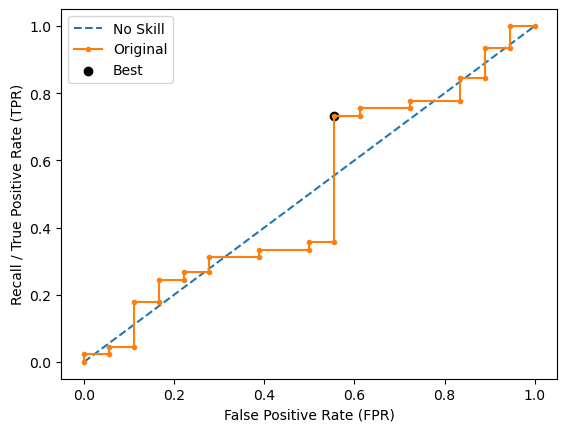

Ave Test Accuracy: 0.5111111111111111
Stdev Test Accuracy: 0.06677994910464329
Ave Test Recall: 0.6444444444444445
Stdev Test Recall: 0.15010284540118107
Ave Test F-0.5 Score: 0.3576890167866161
Stdev Test F-0.5 Score: 0.031121048969318908
Ave Test F-0.75 Score: 0.39102488252833056
Stdev Test F-0.75 Score: 0.03675817298807237
Ave Test F-1 Score: 0.42629841845807637
Stdev Test F-1 Score: 0.04604217643616433
Ave Test F-1.5 Score: 0.48804593341814373
Stdev Test F-1.5 Score: 0.06873189329700959
Ave Test F-2 Score: 0.5322694558719403
Stdev Test F-2 Score: 0.08879306306577106
Ave Test G-mean: 0.5284306760017954
Stdev Test G-mean: 0.046753007674282185
Ave Test Specificity: 0.45777777777777773
Stdev Test Specificity: 0.1384214355768661
Ave Test Precision: 0.32367014734211796
Ave Test NPV: 0.7666761046761047
Ave Runtime: 1.4570290565490722


In [158]:
ld_t03_catboost_gs, ld_t03_catboost_be, ld_t03_catboost_model_info, ld_t03_catboost_metrics_df = catboost_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'cityblock', 'classifier__n_neighbors': 11, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5928309376032457
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='cityblock', n_neighbors=11))])
Mean Train Score (Recall) 0.6583636503210465
Std Train Score (Recall) 0.02913646731172435
GridSearchCV Runtime: 25.0286066532135 secs
Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.32467532467532473
Test F-0.75 Score: 0.3541076487252125
Test F-1 Score: 0.3846153846153846
Test F-1.5 Score: 0.436241610738255
Test F-2 Score: 0.47169811320754723
Test G-Mean Score: 0.5091750772173156
Best Threshold=0.636
Best Recall=0.333
Best G-Mea

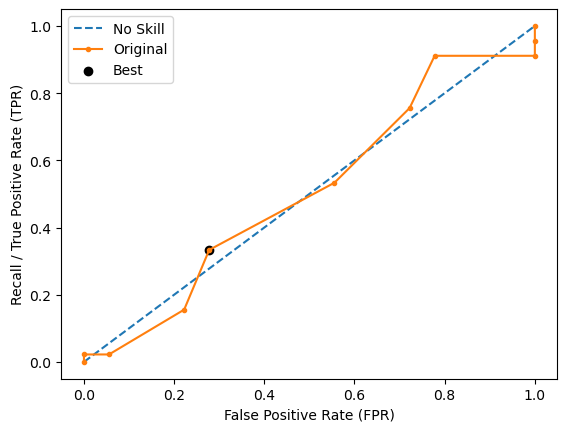

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3767123287671233
Test F-0.75 Score: 0.40801186943620177
Test F-1 Score: 0.44000000000000006
Test F-1.5 Score: 0.4931034482758621
Test F-2 Score: 0.5288461538461539
Test G-Mean Score: 0.5708992257184502
Best Threshold=0.727
Best Recall=0.244
Best G-Mean=0.451


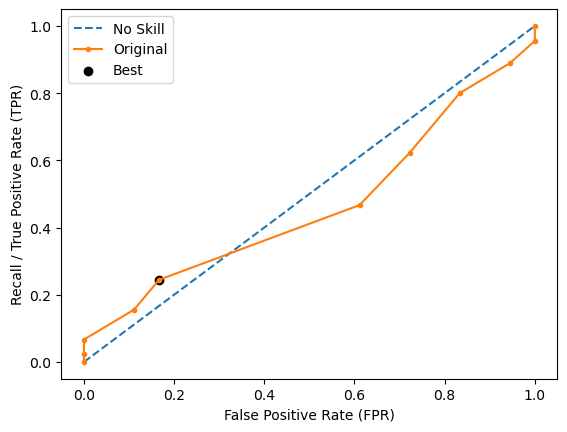

Run 3 - Random State: 2
Test Accuracy: 0.49206349206349204
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3763440860215054
Test F-0.75 Score: 0.41966426858513184
Test F-1 Score: 0.4666666666666666
Test F-1.5 Score: 0.5515151515151515
Test F-2 Score: 0.6140350877192983
Test G-Mean Score: 0.5420582630066875
Best Threshold=0.727
Best Recall=0.200
Best G-Mean=0.408


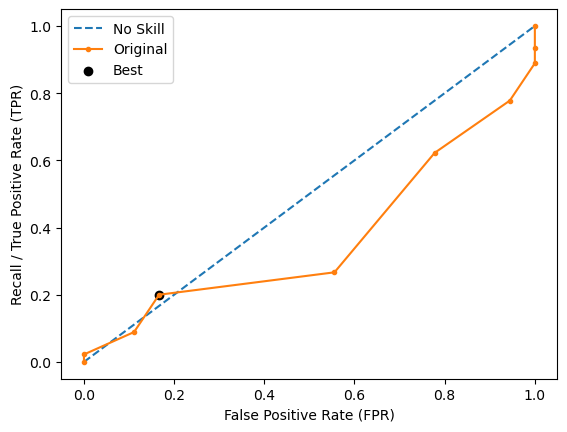

Run 4 - Random State: 3
Test Accuracy: 0.6190476190476191
Test Recall: 0.5
Test F-0.5 Score: 0.39473684210526316
Test F-0.75 Score: 0.41208791208791207
Test F-1 Score: 0.42857142857142855
Test F-1.5 Score: 0.45348837209302323
Test F-2 Score: 0.46875
Test G-Mean Score: 0.5773502691896257
Best Threshold=0.273
Best Recall=0.800
Best G-Mean=0.516


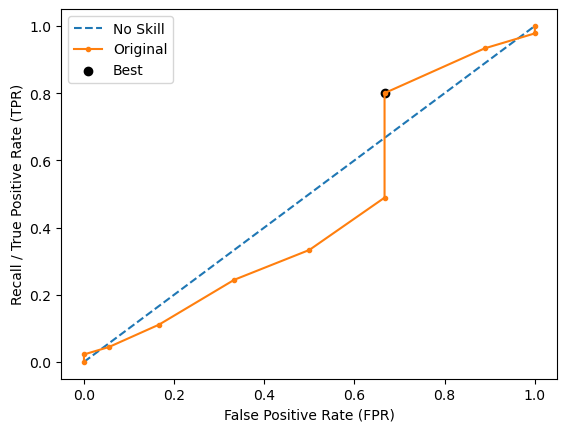

Run 5 - Random State: 4
Test Accuracy: 0.5555555555555556
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.38961038961038963
Test F-0.75 Score: 0.42492917847025496
Test F-1 Score: 0.46153846153846156
Test F-1.5 Score: 0.5234899328859061
Test F-2 Score: 0.5660377358490566
Test G-Mean Score: 0.5837300238472753
Best Threshold=0.455
Best Recall=0.733
Best G-Mean=0.494


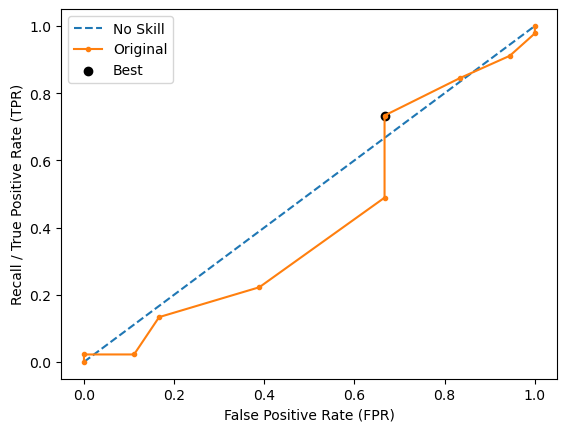

Ave Test Accuracy: 0.5428571428571429
Stdev Test Accuracy: 0.053121271525973075
Ave Test Recall: 0.6222222222222222
Stdev Test Recall: 0.10686324478706302
Ave Test F-0.5 Score: 0.3724157942359212
Stdev Test F-0.5 Score: 0.027869909433266393
Ave Test F-0.75 Score: 0.4037601754609426
Stdev Test F-0.75 Score: 0.028521344536771822
Ave Test F-1 Score: 0.4362783882783883
Stdev Test F-1 Score: 0.03280180000290551
Ave Test F-1.5 Score: 0.49156770310163955
Stdev Test F-1.5 Score: 0.04776530065119412
Ave Test F-2 Score: 0.5298734181244111
Stdev Test F-2 Score: 0.06227467005686806
Ave Test G-mean: 0.5566425717958708
Stdev Test G-mean: 0.030950186087809244
Ave Test Specificity: 0.5111111111111111
Stdev Test Specificity: 0.10540925533894598
Ave Test Precision: 0.33982843137254903
Ave Test NPV: 0.7740379012904042
Ave Runtime: 0.022846698760986328


In [159]:
ld_t03_knn_gs, ld_t03_knn_be, ld_t03_knn_model_info, ld_t03_knn_metrics_df = knn_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5703530791236263
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', import

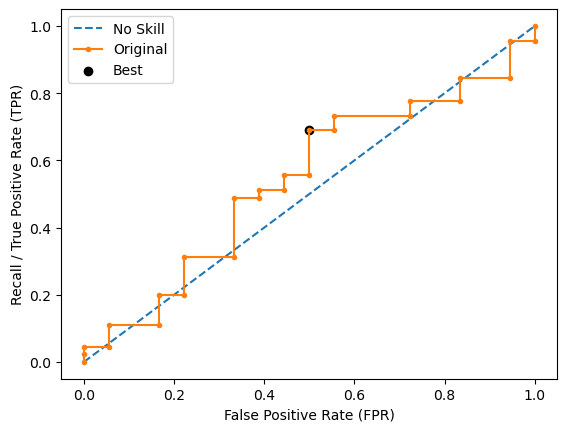

Run 2 - Random State: 1
Test Accuracy: 0.6031746031746031
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.21428571428571433
Test F-0.75 Score: 0.2027027027027027
Test F-1 Score: 0.1935483870967742
Test F-1.5 Score: 0.1822429906542056
Test F-2 Score: 0.1764705882352941
Test G-Mean Score: 0.3600411499115478
Best Threshold=0.444
Best Recall=0.422
Best G-Mean=0.552


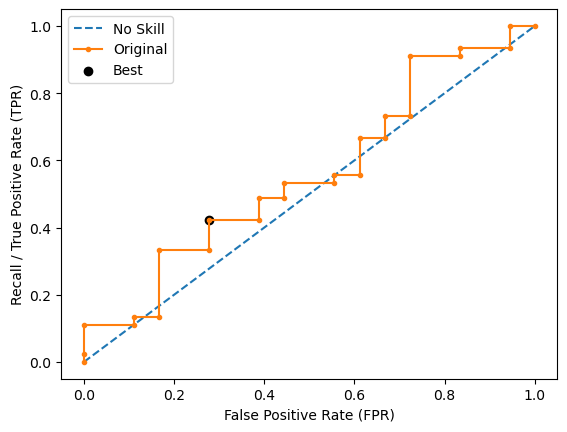

Run 3 - Random State: 2
Test Accuracy: 0.6031746031746031
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.3636363636363637
Test F-0.75 Score: 0.3773584905660377
Test F-1 Score: 0.3902439024390244
Test F-1.5 Score: 0.40944881889763773
Test F-2 Score: 0.4210526315789474
Test G-Mean Score: 0.5443310539518174
Best Threshold=0.531
Best Recall=0.289
Best G-Mean=0.457


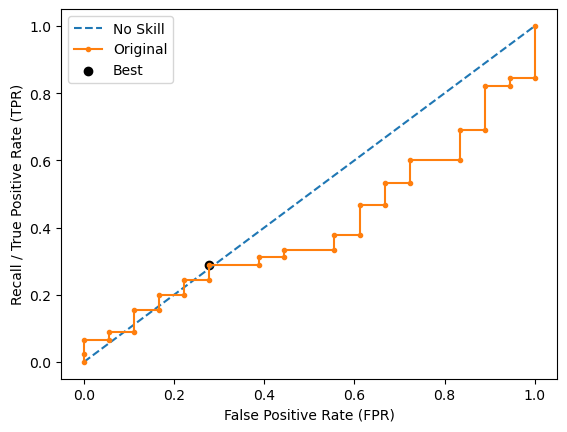

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.3888888888888889
Test F-0.75 Score: 0.388888888888889
Test F-1 Score: 0.3888888888888889
Test F-1.5 Score: 0.3888888888888889
Test F-2 Score: 0.3888888888888889
Test G-Mean Score: 0.5420582630066875
Best Threshold=0.356
Best Recall=0.667
Best G-Mean=0.509


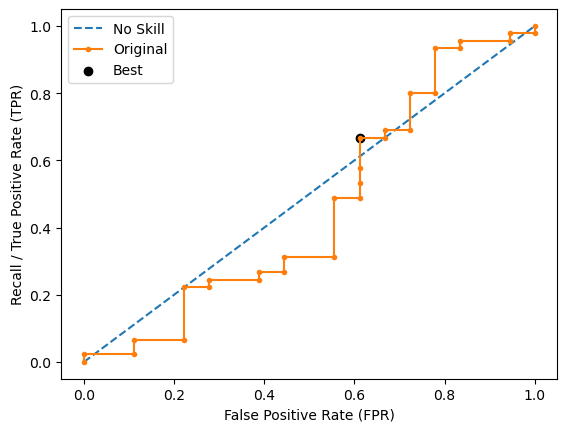

Run 5 - Random State: 4
Test Accuracy: 0.5238095238095238
Test Recall: 0.3333333333333333
Test F-0.5 Score: 0.2631578947368421
Test F-0.75 Score: 0.2747252747252747
Test F-1 Score: 0.28571428571428575
Test F-1.5 Score: 0.3023255813953488
Test F-2 Score: 0.3125
Test G-Mean Score: 0.4472135954999579
Best Threshold=0.455
Best Recall=0.533
Best G-Mean=0.571


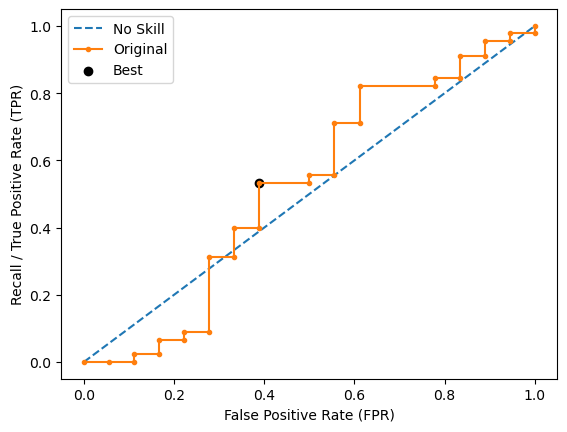

Ave Test Accuracy: 0.5873015873015872
Stdev Test Accuracy: 0.04892392065848393
Ave Test Recall: 0.31111111111111106
Stdev Test Recall: 0.11520245196293179
Ave Test F-0.5 Score: 0.2904382167540062
Stdev Test F-0.5 Score: 0.08100516196873676
Ave Test F-0.75 Score: 0.29317951582102525
Stdev Test F-0.75 Score: 0.08632487202929938
Ave Test F-1 Score: 0.2961235372722391
Stdev Test F-1 Score: 0.09159076361365194
Ave Test F-1.5 Score: 0.30102570041166066
Stdev Test F-1.5 Score: 0.09974532885586425
Ave Test F-2 Score: 0.30422686618507055
Stdev Test F-2 Score: 0.10479836649292391
Ave Test G-mean: 0.45698133185915324
Stdev Test G-mean: 0.08467558360296623
Ave Test Specificity: 0.6977777777777778
Stdev Test Specificity: 0.07131914015947206
Ave Test Precision: 0.2879412857673727
Ave Test NPV: 0.7173504273504273
Ave Runtime: 0.11030926704406738


In [160]:
ld_t03_xgb_gs, ld_t03_xgb_be, ld_t03_xgb_model_info, ld_t03_xgb_metrics_df = xgb_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5190723163075371
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.9207037245743911
Std Train Score (Recall) 0.012022004375614008
GridSearchCV Runtime: 111.75974154472351 secs
Run 1 - Random State: 0
Test Accuracy: 0.5396825396825397
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.39156626506024095
Test F-0.75 Score: 0

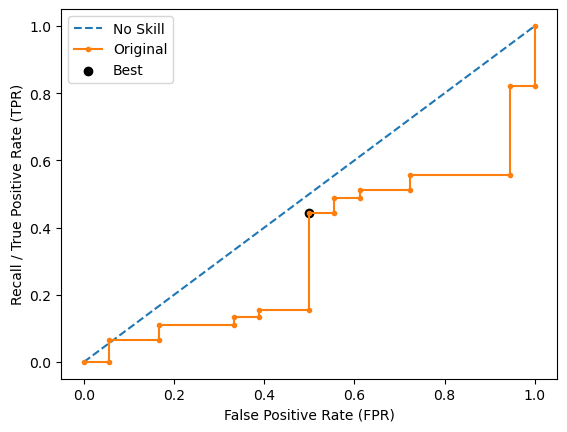

Run 2 - Random State: 1
Test Accuracy: 0.42857142857142855
Test Recall: 0.5
Test F-0.5 Score: 0.2777777777777778
Test F-0.75 Score: 0.3048780487804878
Test F-1 Score: 0.3333333333333333
Test F-1.5 Score: 0.38235294117647056
Test F-2 Score: 0.4166666666666667
Test G-Mean Score: 0.447213595499958
Best Threshold=0.540
Best Recall=0.600
Best G-Mean=0.548


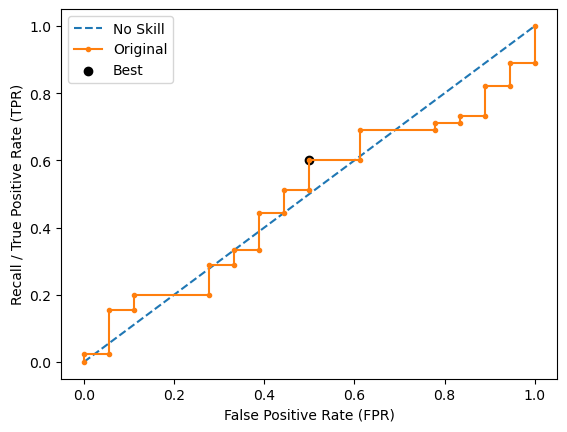

Run 3 - Random State: 2
Test Accuracy: 0.4126984126984127
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3021978021978022
Test F-0.75 Score: 0.3361858190709047
Test F-1 Score: 0.37288135593220345
Test F-1.5 Score: 0.4386503067484662
Test F-2 Score: 0.4867256637168142
Test G-Mean Score: 0.45133546692422
Best Threshold=0.889
Best Recall=0.467
Best G-Mean=0.509


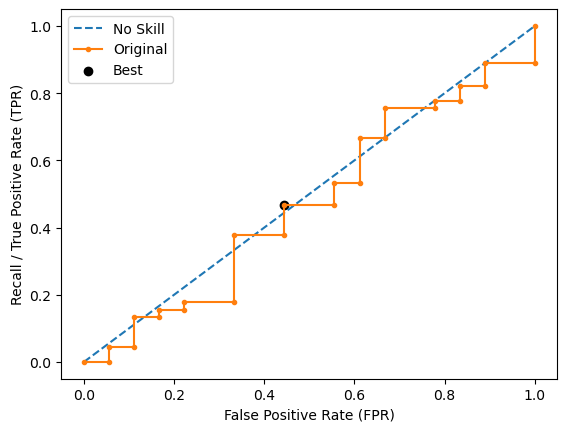

Run 4 - Random State: 3
Test Accuracy: 0.5396825396825397
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.352112676056338
Test F-0.75 Score: 0.3799392097264438
Test F-1 Score: 0.40816326530612246
Test F-1.5 Score: 0.45454545454545453
Test F-2 Score: 0.4854368932038835
Test G-Mean Score: 0.5443310539518174
Best Threshold=0.831
Best Recall=0.444
Best G-Mean=0.471


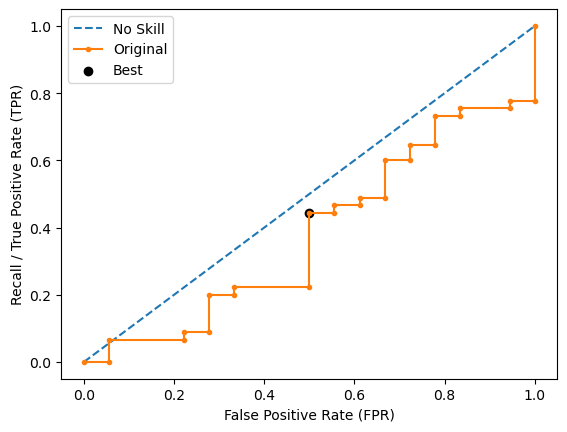

Run 5 - Random State: 4
Test Accuracy: 0.3968253968253968
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.24691358024691357
Test F-0.75 Score: 0.27100271002710025
Test F-1 Score: 0.2962962962962963
Test F-1.5 Score: 0.33986928104575165
Test F-2 Score: 0.37037037037037035
Test G-Mean Score: 0.4097575314352394
Best Threshold=0.349
Best Recall=0.711
Best G-Mean=0.629


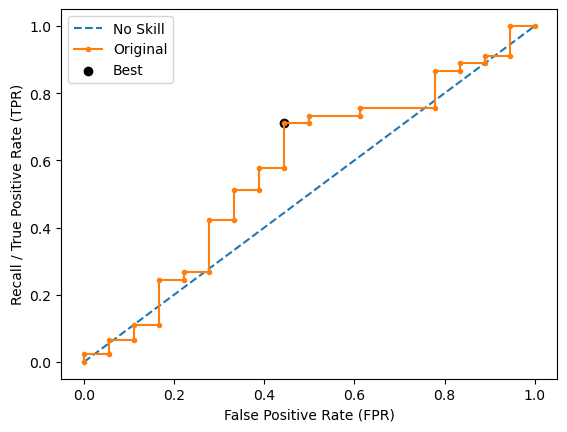

Ave Test Accuracy: 0.46349206349206346
Stdev Test Accuracy: 0.07045187625768935
Ave Test Recall: 0.5666666666666668
Stdev Test Recall: 0.10686324478706304
Ave Test F-0.5 Score: 0.3141136202678145
Stdev Test F-0.5 Score: 0.05792444642530082
Ave Test F-0.75 Score: 0.34460805407271144
Stdev Test F-0.75 Score: 0.06281912959092834
Ave Test F-1 Score: 0.3766803047190456
Stdev Test F-1 Score: 0.06813805401757575
Ave Test F-1.5 Score: 0.4321158547677447
Stdev Test F-1.5 Score: 0.07795966014741033
Ave Test F-2 Score: 0.47110597383741853
Stdev Test F-2 Score: 0.08550113389893975
Ave Test G-mean: 0.48663731158547474
Stdev Test G-mean: 0.07221306403492017
Ave Test Specificity: 0.4222222222222222
Stdev Test Specificity: 0.07856742013183862
Ave Test Precision: 0.2828893803323386
Ave Test NPV: 0.7071613571613572
Ave Runtime: 0.15929045677185058


In [161]:
ld_t03_gbm_gs, ld_t03_gbm_be, ld_t03_gbm_model_info, ld_t03_gbm_metrics_df = gbm_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.5674872748390176
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=2, n_estimators=300,
                                        oob_score=True, random_state=0))])
Mean Train Score (Recall) 0.7671898434453678
Std Train Score (Recall) 0.03395456762608716
GridSearchCV Runtime: 432.65349102020264 secs
Run 1 - Random State: 0
Test Accuracy: 0.5079365079365079
Test

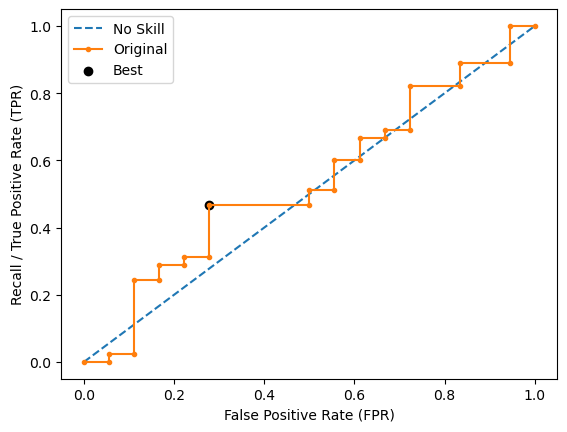

Run 2 - Random State: 1
Test Accuracy: 0.5238095238095238
Test Recall: 0.5
Test F-0.5 Score: 0.32608695652173914
Test F-0.75 Score: 0.3504672897196262
Test F-1 Score: 0.37499999999999994
Test F-1.5 Score: 0.41489361702127664
Test F-2 Score: 0.4411764705882353
Test G-Mean Score: 0.5163977794943222
Best Threshold=0.476
Best Recall=0.600
Best G-Mean=0.548


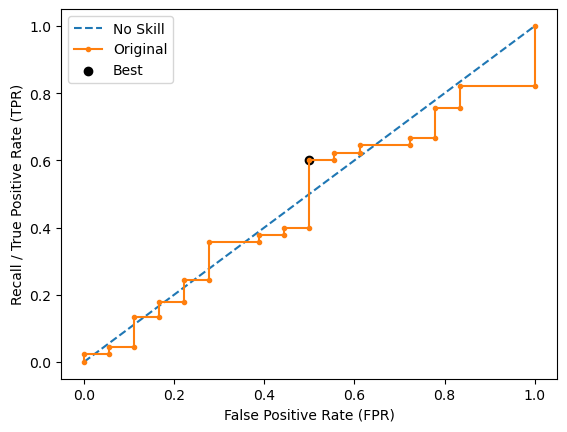

Run 3 - Random State: 2
Test Accuracy: 0.4444444444444444
Test Recall: 0.5
Test F-0.5 Score: 0.28481012658227844
Test F-0.75 Score: 0.31163434903047094
Test F-1 Score: 0.33962264150943394
Test F-1.5 Score: 0.38741721854304634
Test F-2 Score: 0.4205607476635514
Test G-Mean Score: 0.45946829173634074
Best Threshold=0.506
Best Recall=0.578
Best G-Mean=0.537


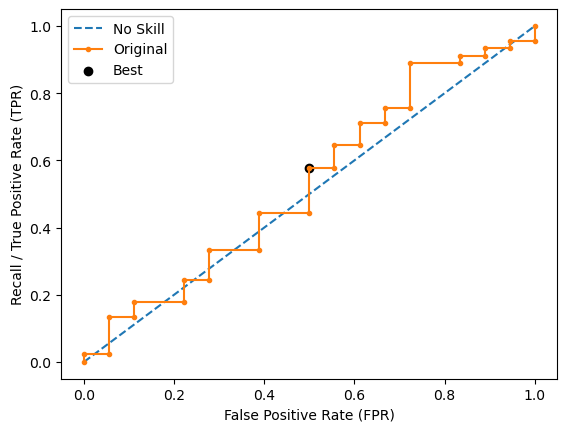

Run 4 - Random State: 3
Test Accuracy: 0.6031746031746031
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.3431372549019608
Test F-0.75 Score: 0.3514056224899598
Test F-1 Score: 0.358974358974359
Test F-1.5 Score: 0.3699186991869919
Test F-2 Score: 0.3763440860215054
Test G-Mean Score: 0.5175917643934274
Best Threshold=0.483
Best Recall=0.489
Best G-Mean=0.547


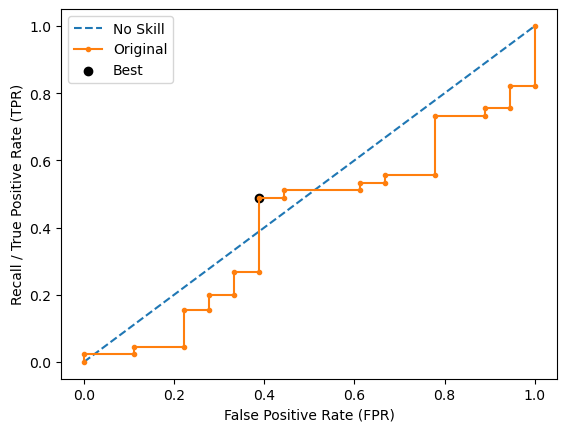

Run 5 - Random State: 4
Test Accuracy: 0.4444444444444444
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.30120481927710846
Test F-0.75 Score: 0.3315649867374006
Test F-1 Score: 0.36363636363636365
Test F-1.5 Score: 0.41935483870967744
Test F-2 Score: 0.45871559633027525
Test G-Mean Score: 0.47140452079103173
Best Threshold=0.516
Best Recall=0.533
Best G-Mean=0.544


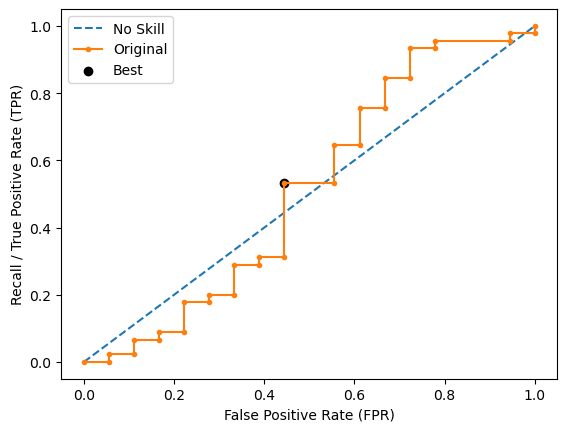

Ave Test Accuracy: 0.5047619047619047
Stdev Test Accuracy: 0.06582997255024674
Ave Test Recall: 0.48888888888888893
Stdev Test Recall: 0.060858061945018464
Ave Test F-0.5 Score: 0.31442811314675817
Stdev Test F-0.5 Score: 0.022462976582145088
Ave Test F-0.75 Score: 0.3374035073462514
Stdev Test F-0.75 Score: 0.01647336683828058
Ave Test F-1 Score: 0.3609160605791334
Stdev Test F-1 Score: 0.013269264236481558
Ave Test F-1.5 Score: 0.4001350565103802
Stdev Test F-1.5 Score: 0.02086979925660775
Ave Test F-2 Score: 0.4267380208974124
Stdev Test F-2 Score: 0.03127246903588928
Ave Test G-mean: 0.4940774772037117
Stdev Test G-mean: 0.02689806091308105
Ave Test Specificity: 0.5111111111111111
Stdev Test Specificity: 0.11439589045541111
Ave Test Precision: 0.29021380827832444
Ave Test NPV: 0.7109994172494172
Ave Runtime: 0.2738068103790283


In [162]:
ld_t03_rf_gs, ld_t03_rf_be, ld_t03_rf_model_info, ld_t03_rf_metrics_df = rf_class2(ld_t03, g_mean_scorer,
                                                            'ageing_class', random_state=0)

In [163]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t03_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t03_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t03_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
0,k-Nearest Neighbors,0.556643,0.030950,0.592831,0.658364,0.622222,0.106863,0.542857,0.053121,0.372416,0.403760,0.436278,0.491568,0.529873
6,LightGBM,0.542140,0.073792,0.614468,0.811438,0.666667,0.161971,0.526984,0.104930,0.377962,0.410988,0.446011,0.507657,0.552162
9,CatBoost,0.528431,0.046753,0.508932,0.918307,0.644444,0.150103,0.511111,0.066780,0.357689,0.391025,0.426298,0.488046,0.532269
3,Decision Tree,0.506418,0.091859,0.642880,0.608082,0.522222,0.178298,0.526984,0.114131,0.338109,0.360391,0.383748,0.424057,0.452427
4,Random Forest,0.494077,0.026898,0.567487,0.767190,0.488889,0.060858,0.504762,0.065830,0.314428,0.337404,0.360916,0.400135,0.426738
2,Logistic Regression,0.489492,0.041616,0.538929,0.648689,0.388889,0.078567,0.561905,0.069733,0.315319,0.325771,0.336289,0.353303,0.364412
5,Gradient Boosting Machine (GBM),0.486637,0.072213,0.519072,0.920704,0.566667,0.106863,0.463492,0.070452,0.314114,0.344608,0.376680,0.432116,0.471106
8,AdaBoost,0.481483,0.046830,0.576347,0.919886,0.344444,0.072436,0.584127,0.020696,0.306845,0.313434,0.319536,0.328491,0.333829
1,SVM Classifier,0.462815,0.092127,0.536264,0.470277,0.311111,0.108298,0.593651,0.100138,0.309110,0.307271,0.306592,0.307034,0.307977
7,Extreme Gradient Boosting (XGBoost),0.456981,0.084676,0.570353,0.896717,0.311111,0.115202,0.587302,0.048924,0.290438,0.293180,0.296124,0.301026,0.304227


# LD_T04: OHE, VarThresh, Removed highly-correlated features (VIF)

In [164]:
cat_cols = ['gender', 'province', 'job', 'group']
ld_t04_full = ohe_cols(ld_t01.copy(), cat_cols)
# ld_t04_full

df = ld_t04_full
df_X = df.copy().drop(['userId', 'lastFirstName', 'ageing_class'], axis=1)
df_y = df.copy()[['ageing_class']]

In [165]:
selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_X_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

df_X_f01 = df_X_mod
print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

Number of columns: 34
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_BATANGAS', 'province_BULACAN', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_ISABELA', 'province_LAGUNA', 'province_LEYTE', 'province_MARINDUQUE', 'province_QUEZON', 'province_RIZAL', 'province_SOUTH COTABATO', 'province_UNKNOWN', 'province_ZAMBOANGA DEL NORTE', 'job_AGRICULTURAL', 'job_ARMED FORCES', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_MANAGER', 'job_PROFESIONAL', 'job_UNKNOWN', 'group_SHDG']


In [166]:
# calculate VIF for each feature
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(df_X_f01.values, i) for i in range(df_X_f01.shape[1])]
vif["features"] = df_X_f01.columns
vif_sorted = vif.sort_values(by="VIF Factor", ascending=False)
# vif_sorted

columns_to_remove = vif_sorted[vif_sorted['VIF Factor'] > 10]['features'].to_list()
columns_to_remove

['smallLottery',
 'gambling',
 'otherVices',
 'loan_value',
 'group_EHDG',
 'smoking',
 'preferredNetDisposableIncomeId',
 'alcohol',
 'age',
 'cinema',
 'houseOnlyFamily',
 'residentsCount',
 'group_LE',
 'personalCare']

In [167]:
df_X_f02 = df.copy().drop(columns=filtered_out_columns)
df_X_f02 = df_X_f02.copy().drop(columns=columns_to_remove)
df_X_f02

ld_t04 = df_X_f02.copy()

## Optimizing for F-1 Score

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.4707575757575758
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        random_state=0))])
Mean Train Score (Recall) 0.4995634298758547
Std Train Score (Recall) 0.05948095258125788
GridSearchCV Runtime: 44.60163736343384 secs
Run 1 - Random State: 0
Test Accuracy: 0.5555555555555556
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.30701754385964913
Test F-0.75 Score: 0.32051282051282054
Test F-1 Score: 0.3333333333333333
Tes

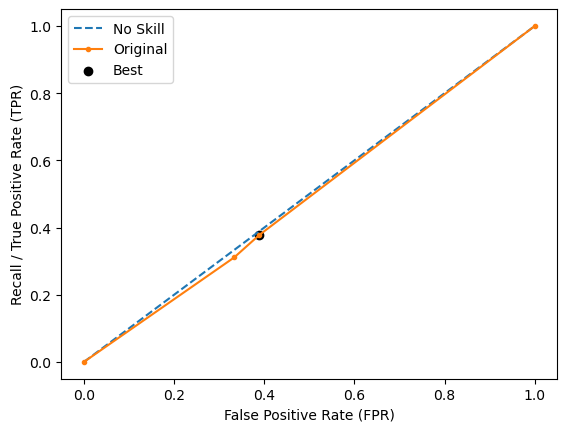

Run 2 - Random State: 1
Test Accuracy: 0.4444444444444444
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3296703296703297
Test F-0.75 Score: 0.3667481662591686
Test F-1 Score: 0.4067796610169492
Test F-1.5 Score: 0.4785276073619631
Test F-2 Score: 0.5309734513274336
Test G-Mean Score: 0.48686449556014766
Best Threshold=0.559
Best Recall=0.644
Best G-Mean=0.463


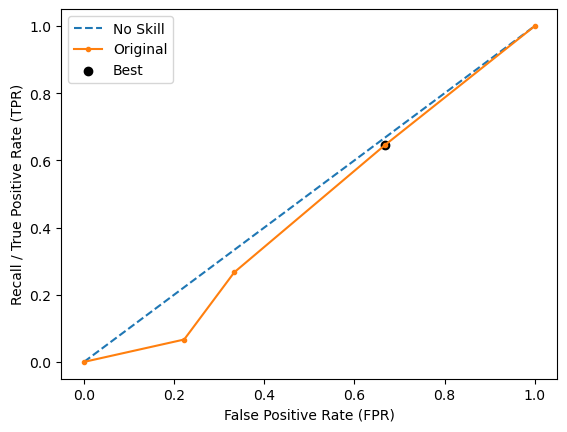

Run 3 - Random State: 2
Test Accuracy: 0.6031746031746031
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.09259259259259259
Test F-0.75 Score: 0.08169934640522876
Test F-1 Score: 0.07407407407407407
Test F-1.5 Score: 0.06565656565656565
Test F-2 Score: 0.06172839506172839
Test G-Mean Score: 0.21372648957412602
Best Threshold=0.800
Best Recall=0.178
Best G-Mean=0.410


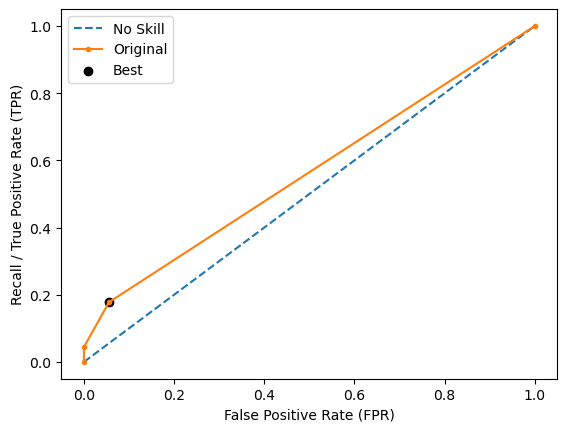

Run 4 - Random State: 3
Test Accuracy: 0.6190476190476191
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.22727272727272727
Test F-0.75 Score: 0.211864406779661
Test F-1 Score: 0.2
Test F-1.5 Score: 0.18571428571428572
Test F-2 Score: 0.17857142857142855
Test G-Mean Score: 0.36514837167011077
Best Threshold=0.444
Best Recall=0.311
Best G-Mean=0.492


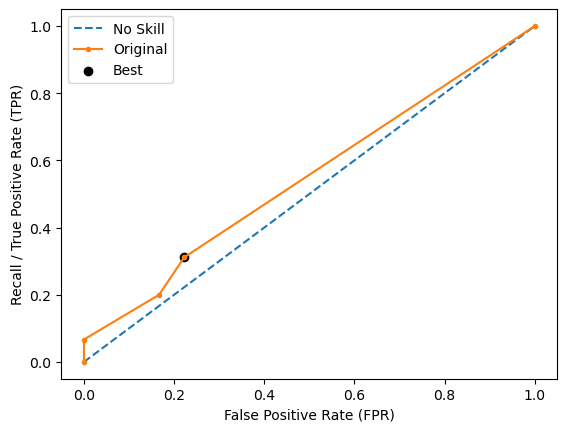

Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.3333333333333333
Test F-0.5 Score: 0.2
Test F-0.75 Score: 0.21739130434782608
Test F-1 Score: 0.23529411764705885
Test F-1.5 Score: 0.26530612244897955
Test F-2 Score: 0.28571428571428575
Test G-Mean Score: 0.36514837167011077
Best Threshold=0.559
Best Recall=0.600
Best G-Mean=0.632


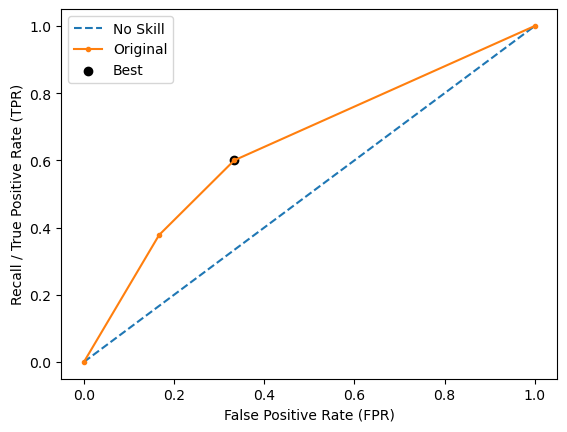

Ave Test Accuracy: 0.5206349206349207
Stdev Test Accuracy: 0.10372259842987011
Ave Test Recall: 0.32222222222222224
Stdev Test Recall: 0.23372982186625144
Ave Test F-0.5 Score: 0.2313106386790597
Stdev Test F-0.5 Score: 0.09440010783492797
Ave Test F-0.75 Score: 0.23964320886094104
Stdev Test F-0.75 Score: 0.11057648605251902
Ave Test F-1 Score: 0.24989623721428308
Stdev Test F-1 Score: 0.12766210000243647
Ave Test F-1.5 Score: 0.26958355189527355
Stdev Test F-1.5 Score: 0.15748549062450312
Ave Test F-2 Score: 0.28431417880164195
Stdev Test F-2 Score: 0.17889372162048686
Ave Test G-mean: 0.38455951734458194
Stdev Test G-mean: 0.11393848426878087
Ave Test Specificity: 0.6
Stdev Test Specificity: 0.21773242158072695
Ave Test Precision: 0.22545577728504557
Ave Test NPV: 0.6872577966695614
Ave Runtime: 0.018270254135131836


In [168]:
ld_t04_dt_gs, ld_t04_dt_be, ld_t04_dt_model_info, ld_t04_dt_metrics_df = dt_class2(ld_t04, fbeta_scorer(beta=1),
                                                                                   'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 1e-05, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.45132795223352495
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-05, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Recall) 0.5236815925980298
Std Train Score (Recall) 0.03510715618242648
GridSearchCV Runtime: 12.293147563934326 secs
Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.5
Test F-0.5 Score: 0.3082191780821918
Test F-0.75 Score: 0.33382789317507416
Test F-1 Score: 0.36
Test F-1.5 Score: 0.40344827586206894
Test F-2 Score: 0.4326923076923077
Test G-Mean Score: 0.4944132324730442


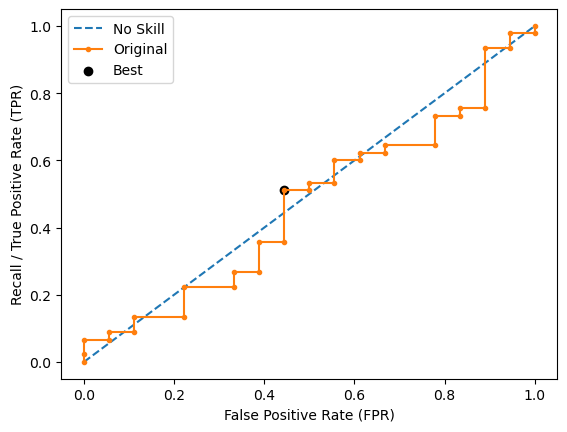

Run 2 - Random State: 1
Test Accuracy: 0.36507936507936506
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.29702970297029707
Test F-0.75 Score: 0.33407572383073497
Test F-1 Score: 0.37500000000000006
Test F-1.5 Score: 0.45086705202312144
Test F-2 Score: 0.5084745762711864
Test G-Mean Score: 0.40368671387966554
Best Threshold=0.500
Best Recall=0.489
Best G-Mean=0.547


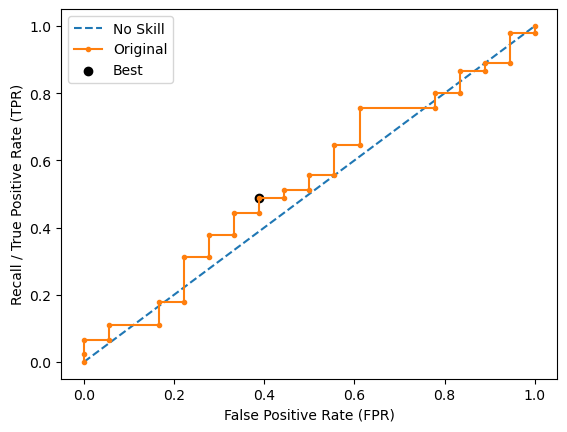

Run 3 - Random State: 2
Test Accuracy: 0.47619047619047616
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3164556962025316
Test F-0.75 Score: 0.3462603878116344
Test F-1 Score: 0.3773584905660377
Test F-1.5 Score: 0.4304635761589404
Test F-2 Score: 0.4672897196261682
Test G-Mean Score: 0.49690399499995325
Best Threshold=0.500
Best Recall=0.733
Best G-Mean=0.534


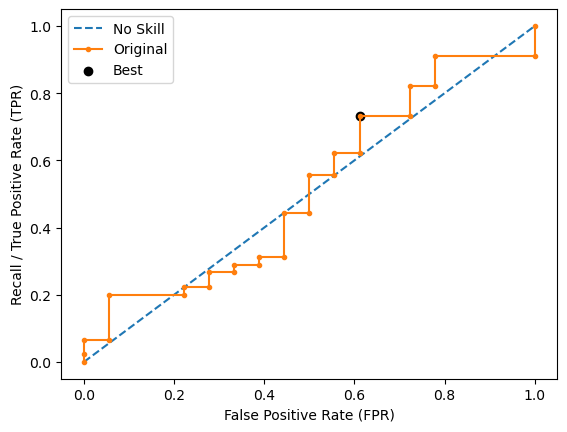

Run 4 - Random State: 3
Test Accuracy: 0.3492063492063492
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.22988505747126436
Test F-0.75 Score: 0.25445292620865134
Test F-1 Score: 0.2807017543859649
Test F-1.5 Score: 0.32704402515723274
Test F-2 Score: 0.36036036036036034
Test G-Mean Score: 0.37184890068181137
Best Threshold=0.500
Best Recall=0.711
Best G-Mean=0.629


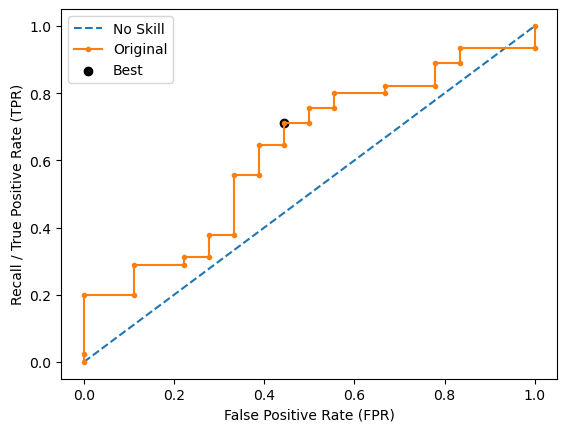

Run 5 - Random State: 4
Test Accuracy: 0.4444444444444444
Test Recall: 0.5
Test F-0.5 Score: 0.28481012658227844
Test F-0.75 Score: 0.31163434903047094
Test F-1 Score: 0.33962264150943394
Test F-1.5 Score: 0.38741721854304634
Test F-2 Score: 0.4205607476635514
Test G-Mean Score: 0.45946829173634074
Best Threshold=0.500
Best Recall=0.644
Best G-Mean=0.568


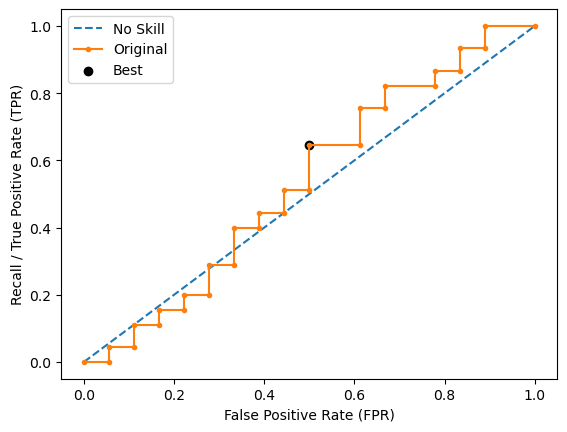

Ave Test Accuracy: 0.42539682539682533
Stdev Test Accuracy: 0.0648660848942938
Ave Test Recall: 0.5333333333333333
Stdev Test Recall: 0.08425417160057277
Ave Test F-0.5 Score: 0.28727995226171266
Stdev Test F-0.5 Score: 0.03422355489364824
Ave Test F-0.75 Score: 0.3160502560113131
Stdev Test F-0.75 Score: 0.036631083828865436
Ave Test F-1 Score: 0.3465365772922873
Stdev Test F-1 Score: 0.039760051987564535
Ave Test F-1.5 Score: 0.399848029548882
Stdev Test F-1.5 Score: 0.047455669418145684
Ave Test F-2 Score: 0.43787554232271486
Stdev Test F-2 Score: 0.055192139138821684
Ave Test G-mean: 0.445264226754163
Stdev Test G-mean: 0.05568335830566927
Ave Test Specificity: 0.3822222222222222
Stdev Test Specificity: 0.10110500592068733
Ave Test Precision: 0.25802098264054785
Ave Test NPV: 0.6665853438149455
Ave Runtime: 0.019370365142822265


In [169]:
ld_t04_logreg_gs, ld_t04_logreg_be, ld_t04_logreg_model_info, ld_t04_logreg_metrics_df = logreg_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 100.0, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4537301587301587
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=100.0, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.4711023308870513
Std Train Score (Recall) 0.06564560796644445
GridSearchCV Runtime: 24.89793086051941 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.2192982456140351
Test F-0.75 Score: 0.22893772893772898
Test F-1 Score: 0.2380952380952381
Test F-1.5 Score: 0.25193798449612403
Test F-2 Score: 0.260416

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


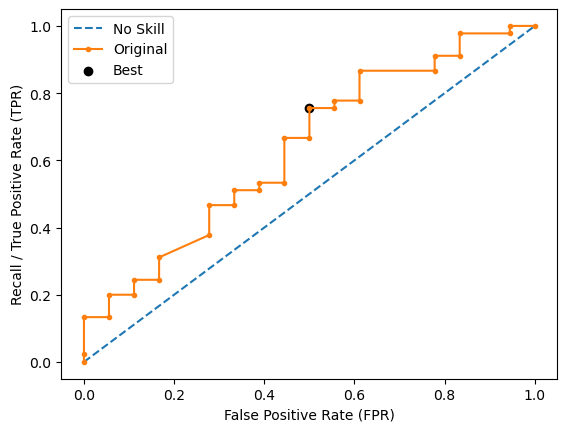

[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.4444444444444444
Test Recall: 0.5
Test F-0.5 Score: 0.28481012658227844
Test F-0.75 Score: 0.31163434903047094
Test F-1 Score: 0.33962264150943394
Test F-1.5 Score: 0.38741721854304634
Test F-2 Score: 0.4205607476635514
Test G-Mean Score: 0.45946829173634074
Best Threshold=0.478
Best Recall=0.711
Best G-Mean=0.596


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


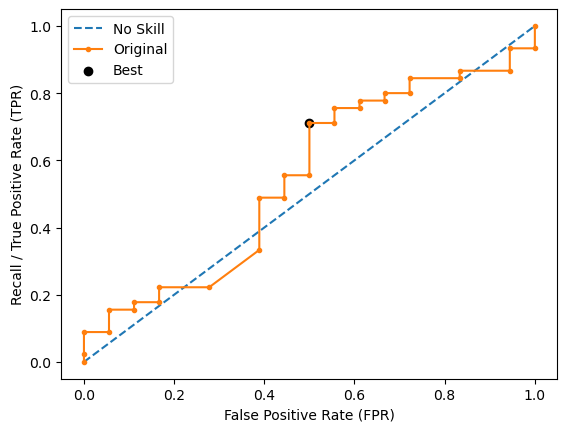

[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.4126984126984127
Test Recall: 0.5
Test F-0.5 Score: 0.2710843373493976
Test F-0.75 Score: 0.2984084880636605
Test F-1 Score: 0.3272727272727273
Test F-1.5 Score: 0.37741935483870964
Test F-2 Score: 0.4128440366972477
Test G-Mean Score: 0.4346134936801766
Best Threshold=0.506
Best Recall=0.622
Best G-Mean=0.588


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


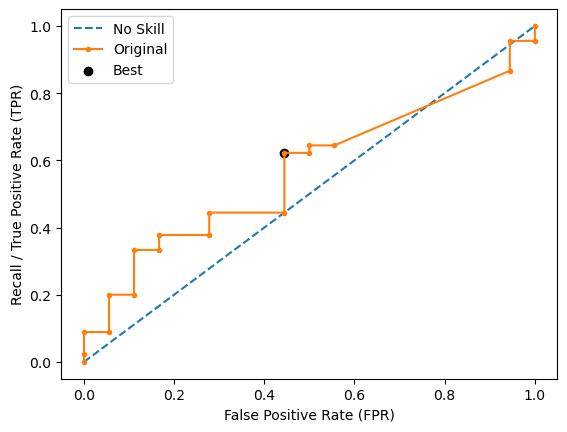

[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.38095238095238093
Test Recall: 0.5
Test F-0.5 Score: 0.25862068965517243
Test F-0.75 Score: 0.2862595419847328
Test F-1 Score: 0.3157894736842105
Test F-1.5 Score: 0.3679245283018868
Test F-2 Score: 0.40540540540540543
Test G-Mean Score: 0.408248290463863
Best Threshold=0.454
Best Recall=0.689
Best G-Mean=0.479


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


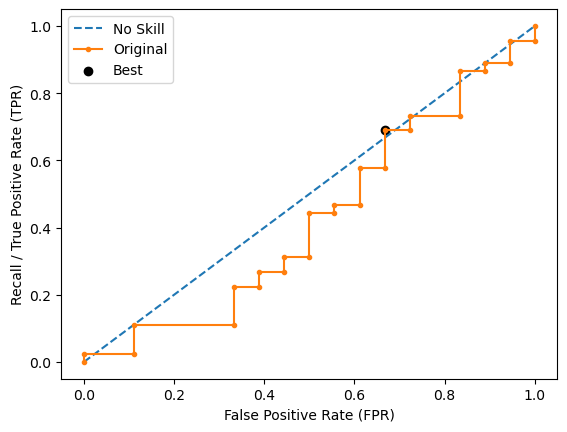

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.8333333333333334
Test F-0.5 Score: 0.3378378378378379
Test F-0.75 Score: 0.3834355828220859
Test F-1 Score: 0.4347826086956522
Test F-1.5 Score: 0.5327868852459017
Test F-2 Score: 0.6097560975609757
Test G-Mean Score: 0.408248290463863
Best Threshold=0.475
Best Recall=0.311
Best G-Mean=0.455


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


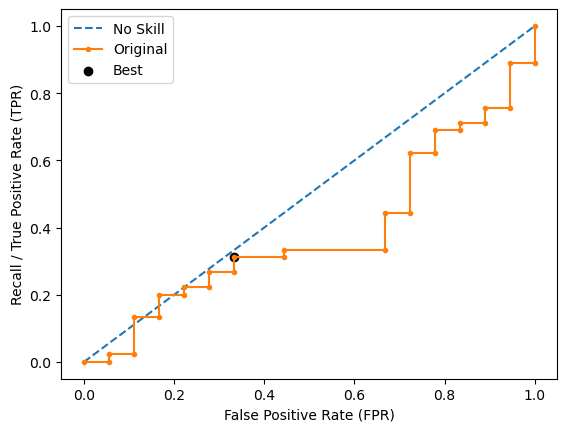

Ave Test Accuracy: 0.4222222222222222
Stdev Test Accuracy: 0.0470869745212423
Ave Test Recall: 0.5222222222222223
Stdev Test Recall: 0.19876159799998133
Ave Test F-0.5 Score: 0.2743302474077443
Stdev Test F-0.5 Score: 0.04309550228289615
Ave Test F-0.75 Score: 0.30173513816773584
Stdev Test F-0.75 Score: 0.055504460408959067
Ave Test F-1 Score: 0.33111253785145245
Stdev Test F-1 Score: 0.07021692094467387
Ave Test F-1.5 Score: 0.3834971942851337
Stdev Test F-1.5 Score: 0.09986247062312145
Ave Test F-2 Score: 0.42179659079876936
Stdev Test F-2 Score: 0.12422017004795384
Ave Test G-mean: 0.4222390349458262
Stdev Test G-mean: 0.024485441255539656
Ave Test Specificity: 0.3822222222222222
Stdev Test Specificity: 0.1373469968032217
Ave Test Precision: 0.24672126230949765
Ave Test NPV: 0.6748168498168499
Ave Runtime: 0.024350500106811522


In [170]:
ld_t04_svm_gs, ld_t04_svm_be, ld_t04_svm_model_info, ld_t04_svm_metrics_df = svm_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 3, 'classifier__n_estimators': 300, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.4762350068232422
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                max_depth=3, n_estimators=300,
                                random_state=0))])
Mean Train Score (Recall) 0.7326541653264546
Std Train Score (Recall) 0.02445553454878203
GridSearchCV Runtime: 19.72636914253235 secs
Run 1 - Random State: 0
Test Accuracy: 0.47619047619047616
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3164556962025316
Test F-0.75 Score: 0.3462603878116344
Test F-1 Score: 0.3773

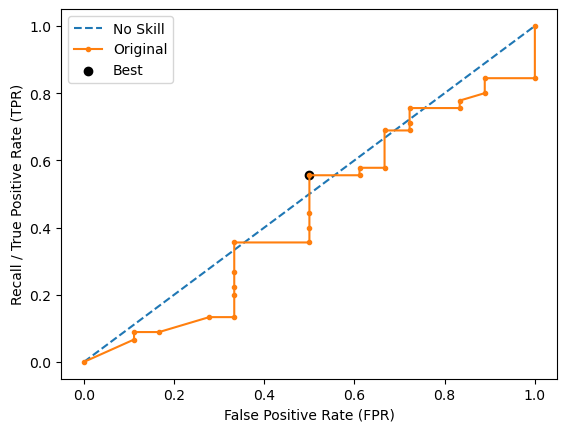

Run 2 - Random State: 1
Test Accuracy: 0.6031746031746031
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3968253968253968
Test F-0.75 Score: 0.42087542087542096
Test F-1 Score: 0.4444444444444445
Test F-1.5 Score: 0.4814814814814815
Test F-2 Score: 0.505050505050505
Test G-Mean Score: 0.5879447357921312
Best Threshold=0.547
Best Recall=0.333
Best G-Mean=0.471


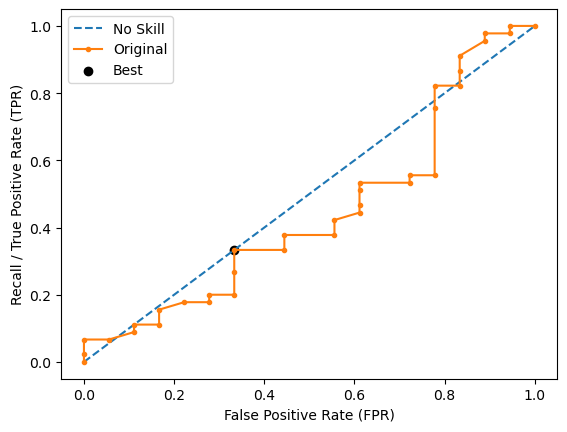

Run 3 - Random State: 2
Test Accuracy: 0.5396825396825397
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.37974683544303794
Test F-0.75 Score: 0.4155124653739612
Test F-1 Score: 0.4528301886792453
Test F-1.5 Score: 0.5165562913907285
Test F-2 Score: 0.5607476635514018
Test G-Mean Score: 0.5708992257184502
Best Threshold=0.489
Best Recall=0.600
Best G-Mean=0.447


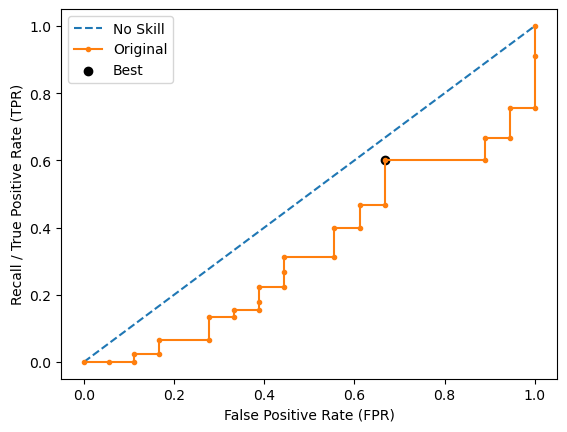

Run 4 - Random State: 3
Test Accuracy: 0.5396825396825397
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.40229885057471265
Test F-0.75 Score: 0.4452926208651399
Test F-1 Score: 0.49122807017543857
Test F-1.5 Score: 0.5723270440251572
Test F-2 Score: 0.6306306306306306
Test G-Mean Score: 0.5879447357921312
Best Threshold=0.554
Best Recall=0.244
Best G-Mean=0.404


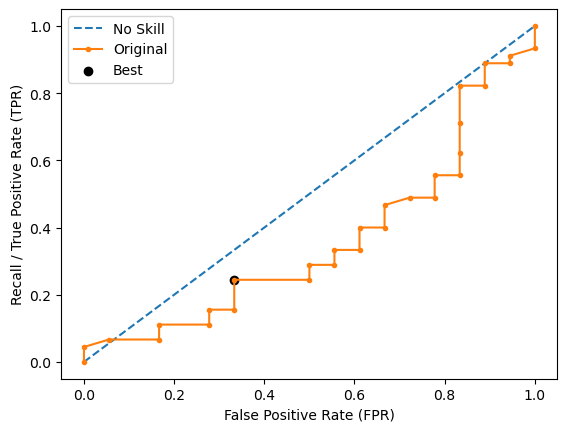

Run 5 - Random State: 4
Test Accuracy: 0.5238095238095238
Test Recall: 0.5
Test F-0.5 Score: 0.32608695652173914
Test F-0.75 Score: 0.3504672897196262
Test F-1 Score: 0.37499999999999994
Test F-1.5 Score: 0.41489361702127664
Test F-2 Score: 0.4411764705882353
Test G-Mean Score: 0.5163977794943222
Best Threshold=0.480
Best Recall=0.578
Best G-Mean=0.507


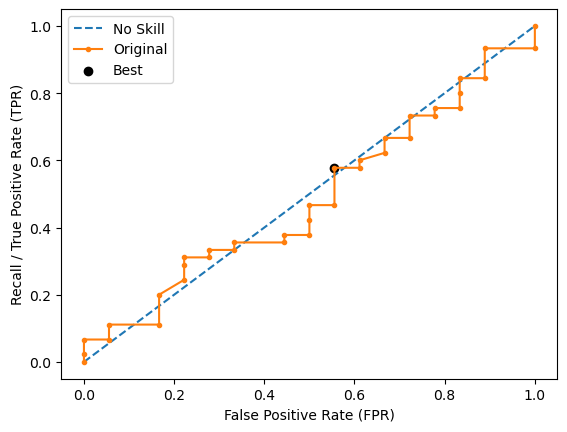

Ave Test Accuracy: 0.5365079365079365
Stdev Test Accuracy: 0.045453400200877306
Ave Test Recall: 0.611111111111111
Stdev Test Recall: 0.1111111111111111
Ave Test F-0.5 Score: 0.36428274711348363
Stdev Test F-0.5 Score: 0.040279434635675446
Ave Test F-0.75 Score: 0.39568163692915653
Stdev Test F-0.75 Score: 0.044654325914055826
Ave Test F-1 Score: 0.4281722387730332
Stdev Test F-1 Score: 0.05064129004038835
Ave Test F-1.5 Score: 0.48314440201551684
Stdev Test F-1.5 Score: 0.06423803849240049
Ave Test F-2 Score: 0.5209789978893882
Stdev Test F-2 Score: 0.07600941747499518
Ave Test G-mean: 0.5520180943593976
Stdev Test G-mean: 0.0425567709946374
Ave Test Specificity: 0.5066666666666666
Stdev Test Specificity: 0.07436978013636229
Ave Test Precision: 0.33158323158323155
Ave Test NPV: 0.7676767676767676
Ave Runtime: 0.20220718383789063


In [171]:
ld_t04_lgbm_gs, ld_t04_lgbm_be, ld_t04_lgbm_model_info, ld_t04_lgbm_metrics_df = lgbm_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.47223057644110267
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 0.8861607968498583
Std Train Score (Recall) 0.012044024109061136
GridSearchCV Runtime: 10.028672695159912 secs
Run 1 - Random State: 0
Test Accuracy: 0.49206349206349204
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.3763440860215054
Test F-0.75 Score: 0.41966426858

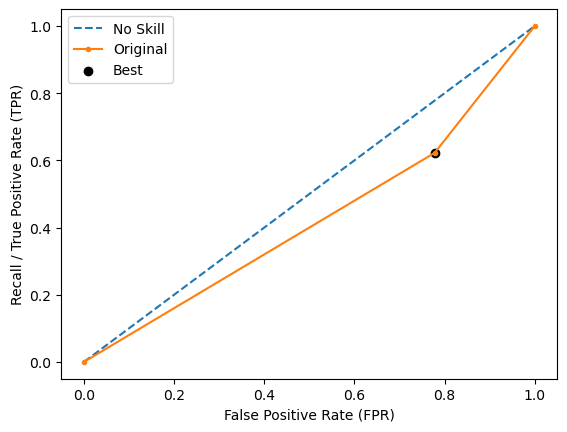

Run 2 - Random State: 1
Test Accuracy: 0.4444444444444444
Test Recall: 0.5
Test F-0.5 Score: 0.28481012658227844
Test F-0.75 Score: 0.31163434903047094
Test F-1 Score: 0.33962264150943394
Test F-1.5 Score: 0.38741721854304634
Test F-2 Score: 0.4205607476635514
Test G-Mean Score: 0.45946829173634074
Best Threshold=0.731
Best Recall=0.578
Best G-Mean=0.537


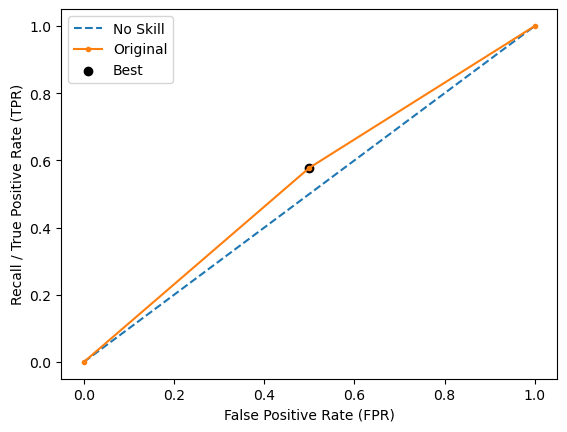

Run 3 - Random State: 2
Test Accuracy: 0.6190476190476191
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.40983606557377045
Test F-0.75 Score: 0.43252595155709345
Test F-1 Score: 0.4545454545454546
Test F-1.5 Score: 0.48872180451127817
Test F-2 Score: 0.5102040816326531
Test G-Mean Score: 0.5983516452371672
Best Threshold=0.731
Best Recall=0.356
Best G-Mean=0.398


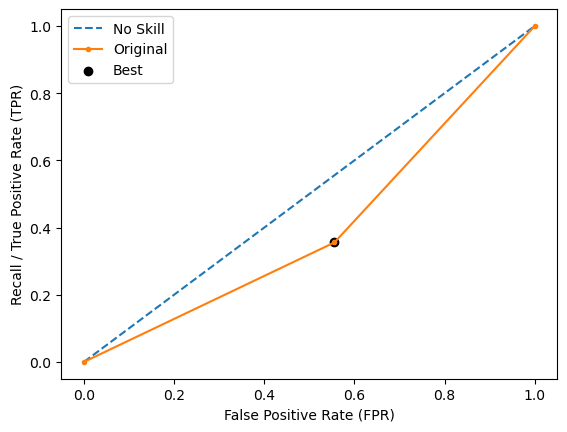

Run 4 - Random State: 3
Test Accuracy: 0.5714285714285714
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.41139240506329117
Test F-0.75 Score: 0.45013850415512463
Test F-1 Score: 0.490566037735849
Test F-1.5 Score: 0.5596026490066226
Test F-2 Score: 0.6074766355140188
Test G-Mean Score: 0.607565471755214
Best Threshold=0.731
Best Recall=0.489
Best G-Mean=0.369


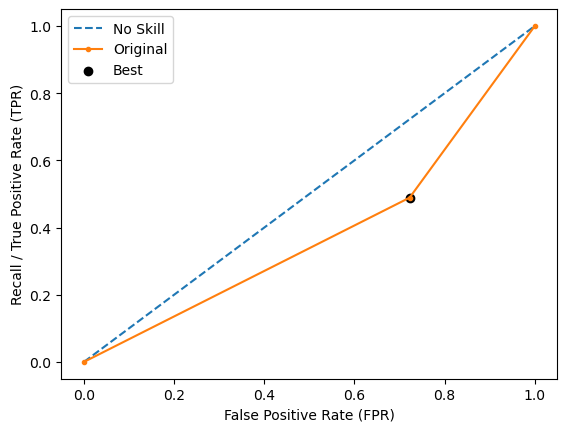

Run 5 - Random State: 4
Test Accuracy: 0.6031746031746031
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.44303797468354433
Test F-0.75 Score: 0.48476454293628807
Test F-1 Score: 0.5283018867924528
Test F-1.5 Score: 0.6026490066225165
Test F-2 Score: 0.6542056074766355
Test G-Mean Score: 0.6440611887195306
Best Threshold=0.731
Best Recall=0.467
Best G-Mean=0.322


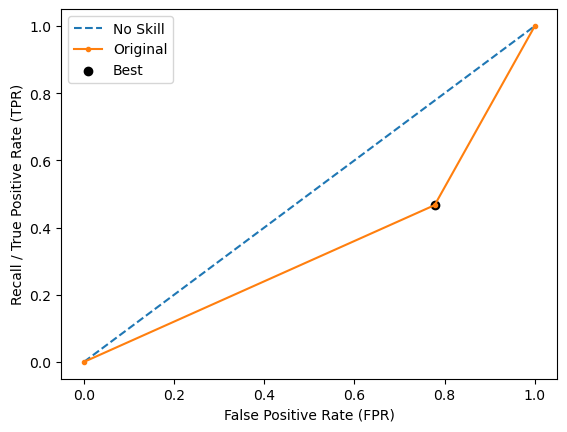

Ave Test Accuracy: 0.5460317460317461
Stdev Test Accuracy: 0.07495694573407997
Ave Test Recall: 0.6666666666666666
Stdev Test Recall: 0.13028932666176193
Ave Test F-0.5 Score: 0.3850841315848779
Stdev Test F-0.5 Score: 0.060816724458041746
Ave Test F-0.75 Score: 0.4197455232528218
Stdev Test F-0.75 Score: 0.0651969672423953
Ave Test F-1 Score: 0.4559405374499714
Stdev Test F-1 Score: 0.07085537941650825
Ave Test F-1.5 Score: 0.517981166039723
Stdev Test F-1.5 Score: 0.08355922133156621
Ave Test F-2 Score: 0.5612964320012315
Stdev Test F-2 Score: 0.09481963536516493
Ave Test G-mean: 0.570300972090988
Stdev Test G-mean: 0.07193327882017518
Ave Test Specificity: 0.49777777777777776
Stdev Test Specificity: 0.10375660026603337
Ave Test Precision: 0.3493040293040293
Ave Test NPV: 0.7900900900900901
Ave Runtime: 0.10359020233154297


In [172]:
ld_t04_adaboost_gs, ld_t04_adaboost_be, ld_t04_adaboost_model_info, ld_t04_adaboost_metrics_df = adaboost_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.004014
0:	learn: 0.6922622	total: 2.05ms	remaining: 2.05s
1:	learn: 0.6908699	total: 3.92ms	remaining: 1.95s
2:	learn: 0.6893220	total: 5.89ms	remaining: 1.96s
3:	learn: 0.6877903	total: 9.68ms	remaining: 2.41s
4:	learn: 0.6864016	total: 11.4ms	remaining: 2.27s
5:	learn: 0.6848225	total: 13ms	remaining: 2.15s
6:	learn: 0.6834576	total: 15.7ms	remaining: 2.23s
7:	learn: 0.6814453	total: 17.6ms	remaining: 2.18s
8:	learn: 0.6800398	total: 19.5ms	remaining: 2.14s
9:	learn: 0.6792561	total: 22.5ms	remaining: 2.23s
10:	learn: 0.6777793	total: 24.4ms	remaining: 2.19s
11:	learn: 0.6764433	total: 26.6ms	remaining: 2.19s
12:	learn: 0.6750190	total: 28.2ms	remaining: 2.14s
13:	learn: 0.6735036	total: 30.4ms	remaining: 2.14s
14:	learn: 0.6722433	total: 32.6ms	remaining: 2.14s
15:	learn: 0.6704923	total: 34.3ms	remaining: 2.11s
16:	learn: 0.6687646	total: 36.4ms	remaining: 2.11s
17:	learn: 0.6669481	total: 38.3ms	

224:	learn: 0.4595611	total: 392ms	remaining: 1.35s
225:	learn: 0.4590216	total: 394ms	remaining: 1.35s
226:	learn: 0.4581869	total: 395ms	remaining: 1.35s
227:	learn: 0.4571941	total: 397ms	remaining: 1.34s
228:	learn: 0.4563908	total: 399ms	remaining: 1.34s
229:	learn: 0.4557805	total: 400ms	remaining: 1.34s
230:	learn: 0.4553238	total: 402ms	remaining: 1.34s
231:	learn: 0.4547345	total: 404ms	remaining: 1.34s
232:	learn: 0.4540794	total: 405ms	remaining: 1.33s
233:	learn: 0.4532335	total: 407ms	remaining: 1.33s
234:	learn: 0.4522829	total: 408ms	remaining: 1.33s
235:	learn: 0.4520266	total: 410ms	remaining: 1.33s
236:	learn: 0.4509880	total: 412ms	remaining: 1.32s
237:	learn: 0.4501313	total: 413ms	remaining: 1.32s
238:	learn: 0.4492925	total: 415ms	remaining: 1.32s
239:	learn: 0.4488598	total: 417ms	remaining: 1.32s
240:	learn: 0.4479388	total: 418ms	remaining: 1.32s
241:	learn: 0.4476261	total: 420ms	remaining: 1.31s
242:	learn: 0.4468984	total: 422ms	remaining: 1.31s
243:	learn: 

483:	learn: 0.3172296	total: 777ms	remaining: 828ms
484:	learn: 0.3169123	total: 779ms	remaining: 827ms
485:	learn: 0.3165632	total: 780ms	remaining: 825ms
486:	learn: 0.3162791	total: 782ms	remaining: 824ms
487:	learn: 0.3156513	total: 783ms	remaining: 822ms
488:	learn: 0.3151167	total: 785ms	remaining: 820ms
489:	learn: 0.3144311	total: 787ms	remaining: 819ms
490:	learn: 0.3141201	total: 788ms	remaining: 817ms
491:	learn: 0.3134227	total: 790ms	remaining: 815ms
492:	learn: 0.3127769	total: 791ms	remaining: 814ms
493:	learn: 0.3124518	total: 793ms	remaining: 812ms
494:	learn: 0.3119203	total: 794ms	remaining: 810ms
495:	learn: 0.3115481	total: 796ms	remaining: 809ms
496:	learn: 0.3111873	total: 797ms	remaining: 807ms
497:	learn: 0.3107245	total: 799ms	remaining: 805ms
498:	learn: 0.3103148	total: 800ms	remaining: 803ms
499:	learn: 0.3099235	total: 802ms	remaining: 802ms
500:	learn: 0.3094687	total: 803ms	remaining: 800ms
501:	learn: 0.3092827	total: 805ms	remaining: 798ms
502:	learn: 

748:	learn: 0.2273411	total: 1.16s	remaining: 390ms
749:	learn: 0.2271388	total: 1.16s	remaining: 388ms
750:	learn: 0.2268552	total: 1.17s	remaining: 387ms
751:	learn: 0.2267214	total: 1.17s	remaining: 385ms
752:	learn: 0.2264686	total: 1.17s	remaining: 383ms
753:	learn: 0.2262380	total: 1.17s	remaining: 382ms
754:	learn: 0.2257838	total: 1.17s	remaining: 380ms
755:	learn: 0.2254431	total: 1.17s	remaining: 379ms
756:	learn: 0.2250492	total: 1.17s	remaining: 377ms
757:	learn: 0.2248425	total: 1.18s	remaining: 376ms
758:	learn: 0.2246960	total: 1.18s	remaining: 374ms
759:	learn: 0.2246507	total: 1.18s	remaining: 372ms
760:	learn: 0.2244074	total: 1.18s	remaining: 371ms
761:	learn: 0.2241563	total: 1.18s	remaining: 369ms
762:	learn: 0.2239551	total: 1.18s	remaining: 368ms
763:	learn: 0.2237610	total: 1.19s	remaining: 366ms
764:	learn: 0.2234668	total: 1.19s	remaining: 365ms
765:	learn: 0.2233210	total: 1.19s	remaining: 363ms
766:	learn: 0.2231394	total: 1.19s	remaining: 362ms
767:	learn: 

999:	learn: 0.1692814	total: 1.55s	remaining: 0us
Best Hyperparameters: {'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4328666216824112
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 <catboost.core.CatBoostClassifier object at 0x0000028EEE712950>)])
Mean Train Score (Recall) 0.8932061561647338
Std Train Score (Recall) 0.01097808922429026
GridSearchCV Runtime: 75.85956168174744 secs
Learning rate set to 0.004014
0:	learn: 0.6922622	total: 2.04ms	remaining: 2.04s
1:	learn: 0.6908699	total: 4.86ms	remaining: 2.43s
2:	learn: 0.6893220	total: 7.72ms	remaining: 2.57s
3:	learn: 0.6877903	total: 10.1ms	remaining: 2.51s
4:	learn: 0.6864016	total: 12.4ms	remaining: 2.47s
5:	learn: 0.6848225	total: 14.5ms	remaining: 2.41s
6:	learn: 0.6834576	total: 16.7ms	remaining: 2.36s
7:	learn: 0.6814453	total: 18.8ms	remaining: 2.33

234:	learn: 0.4522829	total: 337ms	remaining: 1.09s
235:	learn: 0.4520266	total: 338ms	remaining: 1.09s
236:	learn: 0.4509880	total: 340ms	remaining: 1.09s
237:	learn: 0.4501313	total: 341ms	remaining: 1.09s
238:	learn: 0.4492925	total: 343ms	remaining: 1.09s
239:	learn: 0.4488598	total: 344ms	remaining: 1.09s
240:	learn: 0.4479388	total: 345ms	remaining: 1.09s
241:	learn: 0.4476261	total: 347ms	remaining: 1.08s
242:	learn: 0.4468984	total: 348ms	remaining: 1.08s
243:	learn: 0.4462925	total: 350ms	remaining: 1.08s
244:	learn: 0.4450691	total: 351ms	remaining: 1.08s
245:	learn: 0.4440946	total: 353ms	remaining: 1.08s
246:	learn: 0.4432857	total: 354ms	remaining: 1.08s
247:	learn: 0.4423813	total: 356ms	remaining: 1.08s
248:	learn: 0.4412209	total: 357ms	remaining: 1.08s
249:	learn: 0.4405124	total: 359ms	remaining: 1.07s
250:	learn: 0.4400824	total: 360ms	remaining: 1.07s
251:	learn: 0.4394154	total: 362ms	remaining: 1.07s
252:	learn: 0.4384490	total: 363ms	remaining: 1.07s
253:	learn: 

508:	learn: 0.3069822	total: 725ms	remaining: 700ms
509:	learn: 0.3067571	total: 727ms	remaining: 699ms
510:	learn: 0.3063046	total: 729ms	remaining: 697ms
511:	learn: 0.3057032	total: 730ms	remaining: 696ms
512:	learn: 0.3051598	total: 732ms	remaining: 695ms
513:	learn: 0.3045778	total: 733ms	remaining: 693ms
514:	learn: 0.3040185	total: 735ms	remaining: 692ms
515:	learn: 0.3037799	total: 736ms	remaining: 691ms
516:	learn: 0.3035444	total: 738ms	remaining: 689ms
517:	learn: 0.3032239	total: 739ms	remaining: 688ms
518:	learn: 0.3028759	total: 740ms	remaining: 686ms
519:	learn: 0.3023648	total: 742ms	remaining: 685ms
520:	learn: 0.3020422	total: 743ms	remaining: 683ms
521:	learn: 0.3016974	total: 745ms	remaining: 682ms
522:	learn: 0.3010512	total: 746ms	remaining: 681ms
523:	learn: 0.3008361	total: 748ms	remaining: 679ms
524:	learn: 0.3006091	total: 749ms	remaining: 678ms
525:	learn: 0.3001446	total: 750ms	remaining: 676ms
526:	learn: 0.2998899	total: 752ms	remaining: 675ms
527:	learn: 

759:	learn: 0.2246507	total: 1.11s	remaining: 350ms
760:	learn: 0.2244074	total: 1.11s	remaining: 348ms
761:	learn: 0.2241563	total: 1.11s	remaining: 347ms
762:	learn: 0.2239551	total: 1.11s	remaining: 346ms
763:	learn: 0.2237610	total: 1.11s	remaining: 344ms
764:	learn: 0.2234668	total: 1.11s	remaining: 343ms
765:	learn: 0.2233210	total: 1.12s	remaining: 341ms
766:	learn: 0.2231394	total: 1.12s	remaining: 340ms
767:	learn: 0.2228854	total: 1.12s	remaining: 338ms
768:	learn: 0.2227032	total: 1.12s	remaining: 337ms
769:	learn: 0.2222700	total: 1.12s	remaining: 336ms
770:	learn: 0.2220248	total: 1.12s	remaining: 334ms
771:	learn: 0.2218623	total: 1.13s	remaining: 333ms
772:	learn: 0.2215720	total: 1.13s	remaining: 331ms
773:	learn: 0.2211791	total: 1.13s	remaining: 330ms
774:	learn: 0.2210543	total: 1.13s	remaining: 328ms
775:	learn: 0.2206616	total: 1.13s	remaining: 327ms
776:	learn: 0.2204105	total: 1.13s	remaining: 326ms
777:	learn: 0.2199550	total: 1.14s	remaining: 324ms
778:	learn: 

Run 1 - Random State: 0
Test Accuracy: 0.5238095238095238
Test Recall: 0.5
Test F-0.5 Score: 0.32608695652173914
Test F-0.75 Score: 0.3504672897196262
Test F-1 Score: 0.37499999999999994
Test F-1.5 Score: 0.41489361702127664
Test F-2 Score: 0.4411764705882353
Test G-Mean Score: 0.5163977794943222
Best Threshold=0.458
Best Recall=0.533
Best G-Mean=0.487


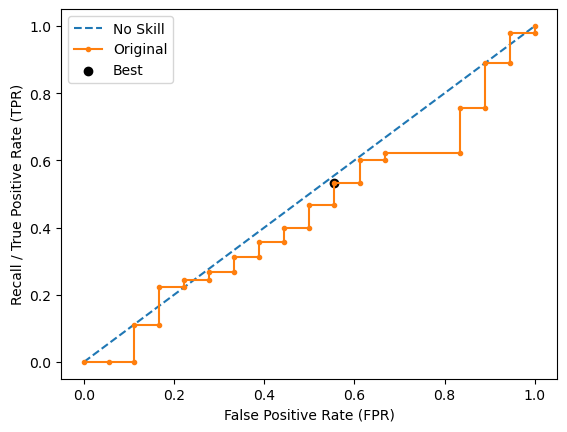

Learning rate set to 0.004045
0:	learn: 0.6916216	total: 2.56ms	remaining: 2.56s
1:	learn: 0.6900326	total: 5.78ms	remaining: 2.88s
2:	learn: 0.6872702	total: 8.66ms	remaining: 2.88s
3:	learn: 0.6863299	total: 11.6ms	remaining: 2.89s
4:	learn: 0.6842301	total: 14.5ms	remaining: 2.88s
5:	learn: 0.6821946	total: 17ms	remaining: 2.82s
6:	learn: 0.6809469	total: 19.1ms	remaining: 2.71s
7:	learn: 0.6795510	total: 21.3ms	remaining: 2.65s
8:	learn: 0.6781998	total: 23.2ms	remaining: 2.56s
9:	learn: 0.6766095	total: 25.1ms	remaining: 2.49s
10:	learn: 0.6751526	total: 27.2ms	remaining: 2.44s
11:	learn: 0.6736040	total: 29ms	remaining: 2.39s
12:	learn: 0.6717088	total: 30.4ms	remaining: 2.31s
13:	learn: 0.6697264	total: 31.8ms	remaining: 2.24s
14:	learn: 0.6691700	total: 32.8ms	remaining: 2.15s
15:	learn: 0.6679796	total: 34.3ms	remaining: 2.11s
16:	learn: 0.6667344	total: 35.8ms	remaining: 2.07s
17:	learn: 0.6660555	total: 36.7ms	remaining: 2s
18:	learn: 0.6645383	total: 37.9ms	remaining: 1.96s

192:	learn: 0.4682178	total: 249ms	remaining: 1.04s
193:	learn: 0.4673798	total: 251ms	remaining: 1.04s
194:	learn: 0.4666527	total: 252ms	remaining: 1.04s
195:	learn: 0.4661894	total: 253ms	remaining: 1.04s
196:	learn: 0.4650273	total: 255ms	remaining: 1.04s
197:	learn: 0.4639933	total: 256ms	remaining: 1.04s
198:	learn: 0.4631598	total: 257ms	remaining: 1.04s
199:	learn: 0.4619469	total: 259ms	remaining: 1.03s
200:	learn: 0.4610139	total: 260ms	remaining: 1.03s
201:	learn: 0.4606398	total: 261ms	remaining: 1.03s
202:	learn: 0.4600105	total: 263ms	remaining: 1.03s
203:	learn: 0.4593799	total: 264ms	remaining: 1.03s
204:	learn: 0.4588629	total: 265ms	remaining: 1.03s
205:	learn: 0.4575422	total: 267ms	remaining: 1.03s
206:	learn: 0.4566755	total: 268ms	remaining: 1.03s
207:	learn: 0.4559004	total: 269ms	remaining: 1.02s
208:	learn: 0.4548634	total: 270ms	remaining: 1.02s
209:	learn: 0.4541796	total: 272ms	remaining: 1.02s
210:	learn: 0.4531134	total: 274ms	remaining: 1.02s
211:	learn: 

422:	learn: 0.3245082	total: 574ms	remaining: 783ms
423:	learn: 0.3242282	total: 575ms	remaining: 781ms
424:	learn: 0.3237757	total: 577ms	remaining: 780ms
425:	learn: 0.3231722	total: 578ms	remaining: 779ms
426:	learn: 0.3228530	total: 580ms	remaining: 778ms
427:	learn: 0.3224220	total: 581ms	remaining: 777ms
428:	learn: 0.3220842	total: 583ms	remaining: 775ms
429:	learn: 0.3215260	total: 584ms	remaining: 774ms
430:	learn: 0.3210879	total: 586ms	remaining: 773ms
431:	learn: 0.3206131	total: 587ms	remaining: 772ms
432:	learn: 0.3201731	total: 588ms	remaining: 770ms
433:	learn: 0.3196267	total: 590ms	remaining: 769ms
434:	learn: 0.3192938	total: 591ms	remaining: 768ms
435:	learn: 0.3186806	total: 593ms	remaining: 767ms
436:	learn: 0.3183173	total: 594ms	remaining: 765ms
437:	learn: 0.3179151	total: 596ms	remaining: 764ms
438:	learn: 0.3174929	total: 597ms	remaining: 763ms
439:	learn: 0.3170473	total: 598ms	remaining: 762ms
440:	learn: 0.3164638	total: 600ms	remaining: 760ms
441:	learn: 

584:	learn: 0.2629869	total: 822ms	remaining: 583ms
585:	learn: 0.2626739	total: 824ms	remaining: 582ms
586:	learn: 0.2622138	total: 826ms	remaining: 581ms
587:	learn: 0.2619528	total: 827ms	remaining: 580ms
588:	learn: 0.2615484	total: 829ms	remaining: 578ms
589:	learn: 0.2609337	total: 830ms	remaining: 577ms
590:	learn: 0.2607959	total: 831ms	remaining: 575ms
591:	learn: 0.2603264	total: 833ms	remaining: 574ms
592:	learn: 0.2601372	total: 834ms	remaining: 572ms
593:	learn: 0.2598595	total: 835ms	remaining: 571ms
594:	learn: 0.2596726	total: 837ms	remaining: 570ms
595:	learn: 0.2593947	total: 838ms	remaining: 568ms
596:	learn: 0.2591004	total: 840ms	remaining: 567ms
597:	learn: 0.2586859	total: 841ms	remaining: 565ms
598:	learn: 0.2584286	total: 843ms	remaining: 564ms
599:	learn: 0.2581194	total: 844ms	remaining: 563ms
600:	learn: 0.2578020	total: 846ms	remaining: 561ms
601:	learn: 0.2572909	total: 847ms	remaining: 560ms
602:	learn: 0.2570248	total: 848ms	remaining: 559ms
603:	learn: 

815:	learn: 0.1969157	total: 1.15s	remaining: 259ms
816:	learn: 0.1966453	total: 1.15s	remaining: 258ms
817:	learn: 0.1964833	total: 1.15s	remaining: 256ms
818:	learn: 0.1960884	total: 1.15s	remaining: 255ms
819:	learn: 0.1957815	total: 1.15s	remaining: 254ms
820:	learn: 0.1956267	total: 1.16s	remaining: 252ms
821:	learn: 0.1953429	total: 1.16s	remaining: 251ms
822:	learn: 0.1950959	total: 1.16s	remaining: 249ms
823:	learn: 0.1948627	total: 1.16s	remaining: 248ms
824:	learn: 0.1944863	total: 1.16s	remaining: 247ms
825:	learn: 0.1943361	total: 1.16s	remaining: 245ms
826:	learn: 0.1940479	total: 1.17s	remaining: 244ms
827:	learn: 0.1937807	total: 1.17s	remaining: 242ms
828:	learn: 0.1935067	total: 1.17s	remaining: 241ms
829:	learn: 0.1933015	total: 1.17s	remaining: 240ms
830:	learn: 0.1931465	total: 1.17s	remaining: 238ms
831:	learn: 0.1929756	total: 1.17s	remaining: 237ms
832:	learn: 0.1927904	total: 1.17s	remaining: 235ms
833:	learn: 0.1924280	total: 1.18s	remaining: 234ms
834:	learn: 

994:	learn: 0.1569930	total: 1.41s	remaining: 7.09ms
995:	learn: 0.1568743	total: 1.41s	remaining: 5.68ms
996:	learn: 0.1566903	total: 1.42s	remaining: 4.26ms
997:	learn: 0.1565335	total: 1.42s	remaining: 2.84ms
998:	learn: 0.1563937	total: 1.42s	remaining: 1.42ms
999:	learn: 0.1561176	total: 1.42s	remaining: 0us
Run 2 - Random State: 1
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.567
Best Recall=0.400
Best G-Mean=0.516


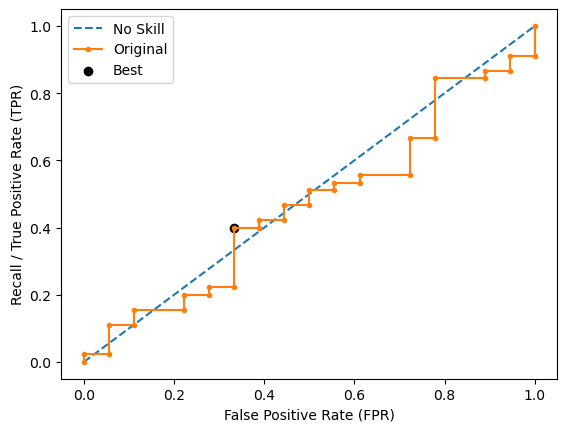

Learning rate set to 0.003967
0:	learn: 0.6914937	total: 3.03ms	remaining: 3.03s
1:	learn: 0.6898486	total: 6.05ms	remaining: 3.02s
2:	learn: 0.6889125	total: 8.71ms	remaining: 2.9s
3:	learn: 0.6879977	total: 11.2ms	remaining: 2.79s
4:	learn: 0.6866012	total: 13ms	remaining: 2.6s
5:	learn: 0.6851513	total: 15.6ms	remaining: 2.58s
6:	learn: 0.6843692	total: 18.1ms	remaining: 2.56s
7:	learn: 0.6828914	total: 20.5ms	remaining: 2.54s
8:	learn: 0.6811770	total: 22.9ms	remaining: 2.52s
9:	learn: 0.6796611	total: 25ms	remaining: 2.48s
10:	learn: 0.6781970	total: 27.4ms	remaining: 2.46s
11:	learn: 0.6767873	total: 29.6ms	remaining: 2.43s
12:	learn: 0.6754937	total: 31.7ms	remaining: 2.41s
13:	learn: 0.6741288	total: 34ms	remaining: 2.39s
14:	learn: 0.6730360	total: 36.5ms	remaining: 2.4s
15:	learn: 0.6715688	total: 38.4ms	remaining: 2.36s
16:	learn: 0.6698021	total: 40.1ms	remaining: 2.32s
17:	learn: 0.6688030	total: 41.8ms	remaining: 2.28s
18:	learn: 0.6679100	total: 43.4ms	remaining: 2.24s
1

169:	learn: 0.5104081	total: 238ms	remaining: 1.16s
170:	learn: 0.5090893	total: 239ms	remaining: 1.16s
171:	learn: 0.5082393	total: 241ms	remaining: 1.16s
172:	learn: 0.5072898	total: 242ms	remaining: 1.16s
173:	learn: 0.5067412	total: 244ms	remaining: 1.16s
174:	learn: 0.5051923	total: 245ms	remaining: 1.16s
175:	learn: 0.5044027	total: 247ms	remaining: 1.16s
176:	learn: 0.5034744	total: 248ms	remaining: 1.15s
177:	learn: 0.5026261	total: 250ms	remaining: 1.15s
178:	learn: 0.5020211	total: 251ms	remaining: 1.15s
179:	learn: 0.5009705	total: 252ms	remaining: 1.15s
180:	learn: 0.4999958	total: 254ms	remaining: 1.15s
181:	learn: 0.4989711	total: 255ms	remaining: 1.15s
182:	learn: 0.4982129	total: 257ms	remaining: 1.15s
183:	learn: 0.4973476	total: 258ms	remaining: 1.14s
184:	learn: 0.4965792	total: 260ms	remaining: 1.14s
185:	learn: 0.4955965	total: 261ms	remaining: 1.14s
186:	learn: 0.4951686	total: 262ms	remaining: 1.14s
187:	learn: 0.4944334	total: 264ms	remaining: 1.14s
188:	learn: 

429:	learn: 0.3459609	total: 604ms	remaining: 801ms
430:	learn: 0.3452933	total: 606ms	remaining: 800ms
431:	learn: 0.3447338	total: 607ms	remaining: 798ms
432:	learn: 0.3444040	total: 609ms	remaining: 797ms
433:	learn: 0.3436928	total: 610ms	remaining: 796ms
434:	learn: 0.3432329	total: 612ms	remaining: 795ms
435:	learn: 0.3429029	total: 613ms	remaining: 794ms
436:	learn: 0.3424898	total: 615ms	remaining: 792ms
437:	learn: 0.3419646	total: 616ms	remaining: 791ms
438:	learn: 0.3415504	total: 618ms	remaining: 789ms
439:	learn: 0.3411192	total: 619ms	remaining: 788ms
440:	learn: 0.3404311	total: 621ms	remaining: 787ms
441:	learn: 0.3397730	total: 622ms	remaining: 786ms
442:	learn: 0.3392297	total: 624ms	remaining: 784ms
443:	learn: 0.3385336	total: 625ms	remaining: 783ms
444:	learn: 0.3380929	total: 627ms	remaining: 782ms
445:	learn: 0.3375440	total: 628ms	remaining: 780ms
446:	learn: 0.3368752	total: 630ms	remaining: 779ms
447:	learn: 0.3361711	total: 631ms	remaining: 777ms
448:	learn: 

702:	learn: 0.2446397	total: 990ms	remaining: 418ms
703:	learn: 0.2443785	total: 991ms	remaining: 417ms
704:	learn: 0.2439165	total: 993ms	remaining: 415ms
705:	learn: 0.2437984	total: 994ms	remaining: 414ms
706:	learn: 0.2435931	total: 996ms	remaining: 413ms
707:	learn: 0.2433701	total: 997ms	remaining: 411ms
708:	learn: 0.2428897	total: 999ms	remaining: 410ms
709:	learn: 0.2426292	total: 1s	remaining: 409ms
710:	learn: 0.2423844	total: 1s	remaining: 407ms
711:	learn: 0.2419993	total: 1s	remaining: 406ms
712:	learn: 0.2418936	total: 1s	remaining: 404ms
713:	learn: 0.2416114	total: 1.01s	remaining: 403ms
714:	learn: 0.2414497	total: 1.01s	remaining: 402ms
715:	learn: 0.2412887	total: 1.01s	remaining: 400ms
716:	learn: 0.2409367	total: 1.01s	remaining: 399ms
717:	learn: 0.2405444	total: 1.01s	remaining: 397ms
718:	learn: 0.2402511	total: 1.01s	remaining: 396ms
719:	learn: 0.2398881	total: 1.01s	remaining: 395ms
720:	learn: 0.2396168	total: 1.02s	remaining: 393ms
721:	learn: 0.2392078	to

963:	learn: 0.1802078	total: 1.37s	remaining: 51.3ms
964:	learn: 0.1798762	total: 1.38s	remaining: 49.9ms
965:	learn: 0.1795535	total: 1.38s	remaining: 48.5ms
966:	learn: 0.1793830	total: 1.38s	remaining: 47ms
967:	learn: 0.1792211	total: 1.38s	remaining: 45.6ms
968:	learn: 0.1789076	total: 1.38s	remaining: 44.2ms
969:	learn: 0.1785258	total: 1.38s	remaining: 42.8ms
970:	learn: 0.1782294	total: 1.38s	remaining: 41.3ms
971:	learn: 0.1780565	total: 1.39s	remaining: 39.9ms
972:	learn: 0.1779136	total: 1.39s	remaining: 38.5ms
973:	learn: 0.1776914	total: 1.39s	remaining: 37.1ms
974:	learn: 0.1773648	total: 1.39s	remaining: 35.7ms
975:	learn: 0.1771780	total: 1.39s	remaining: 34.2ms
976:	learn: 0.1770267	total: 1.39s	remaining: 32.8ms
977:	learn: 0.1769439	total: 1.4s	remaining: 31.4ms
978:	learn: 0.1767982	total: 1.4s	remaining: 30ms
979:	learn: 0.1764160	total: 1.4s	remaining: 28.5ms
980:	learn: 0.1762322	total: 1.4s	remaining: 27.1ms
981:	learn: 0.1760966	total: 1.4s	remaining: 25.7ms
98

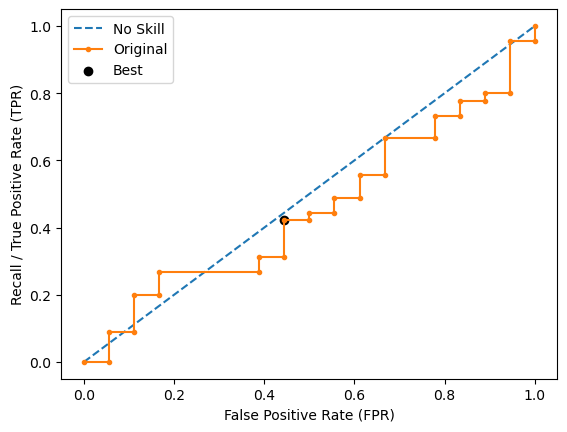

Learning rate set to 0.004151
0:	learn: 0.6915063	total: 1.79ms	remaining: 1.79s
1:	learn: 0.6898084	total: 3.56ms	remaining: 1.78s
2:	learn: 0.6877833	total: 4.91ms	remaining: 1.63s
3:	learn: 0.6869831	total: 6.33ms	remaining: 1.57s
4:	learn: 0.6851878	total: 7.98ms	remaining: 1.59s
5:	learn: 0.6836429	total: 9.42ms	remaining: 1.56s
6:	learn: 0.6823909	total: 10.6ms	remaining: 1.51s
7:	learn: 0.6815719	total: 11.9ms	remaining: 1.48s
8:	learn: 0.6806404	total: 13.2ms	remaining: 1.46s
9:	learn: 0.6791800	total: 14.4ms	remaining: 1.43s
10:	learn: 0.6782041	total: 15.7ms	remaining: 1.41s
11:	learn: 0.6772437	total: 16.9ms	remaining: 1.39s
12:	learn: 0.6758950	total: 18.1ms	remaining: 1.38s
13:	learn: 0.6736319	total: 19.5ms	remaining: 1.37s
14:	learn: 0.6721848	total: 20.6ms	remaining: 1.35s
15:	learn: 0.6705498	total: 21.9ms	remaining: 1.34s
16:	learn: 0.6693430	total: 22.9ms	remaining: 1.32s
17:	learn: 0.6682872	total: 24.1ms	remaining: 1.31s
18:	learn: 0.6672796	total: 25.3ms	remaining

292:	learn: 0.4305387	total: 386ms	remaining: 932ms
293:	learn: 0.4299475	total: 388ms	remaining: 932ms
294:	learn: 0.4297021	total: 390ms	remaining: 931ms
295:	learn: 0.4289785	total: 391ms	remaining: 930ms
296:	learn: 0.4277317	total: 393ms	remaining: 929ms
297:	learn: 0.4266993	total: 394ms	remaining: 928ms
298:	learn: 0.4262426	total: 395ms	remaining: 927ms
299:	learn: 0.4259003	total: 397ms	remaining: 926ms
300:	learn: 0.4251929	total: 398ms	remaining: 925ms
301:	learn: 0.4244438	total: 399ms	remaining: 923ms
302:	learn: 0.4241510	total: 401ms	remaining: 922ms
303:	learn: 0.4233700	total: 402ms	remaining: 921ms
304:	learn: 0.4227515	total: 404ms	remaining: 920ms
305:	learn: 0.4220466	total: 405ms	remaining: 918ms
306:	learn: 0.4212968	total: 406ms	remaining: 917ms
307:	learn: 0.4208276	total: 408ms	remaining: 916ms
308:	learn: 0.4202677	total: 409ms	remaining: 915ms
309:	learn: 0.4194081	total: 411ms	remaining: 914ms
310:	learn: 0.4190750	total: 412ms	remaining: 913ms
311:	learn: 

567:	learn: 0.3014235	total: 782ms	remaining: 595ms
568:	learn: 0.3010901	total: 784ms	remaining: 594ms
569:	learn: 0.3008925	total: 785ms	remaining: 592ms
570:	learn: 0.3006515	total: 787ms	remaining: 591ms
571:	learn: 0.3003415	total: 788ms	remaining: 590ms
572:	learn: 0.2997242	total: 790ms	remaining: 589ms
573:	learn: 0.2994816	total: 791ms	remaining: 587ms
574:	learn: 0.2993321	total: 793ms	remaining: 586ms
575:	learn: 0.2988928	total: 794ms	remaining: 585ms
576:	learn: 0.2986760	total: 796ms	remaining: 583ms
577:	learn: 0.2982782	total: 797ms	remaining: 582ms
578:	learn: 0.2977076	total: 799ms	remaining: 581ms
579:	learn: 0.2975906	total: 800ms	remaining: 580ms
580:	learn: 0.2972429	total: 802ms	remaining: 578ms
581:	learn: 0.2967115	total: 804ms	remaining: 577ms
582:	learn: 0.2961482	total: 805ms	remaining: 576ms
583:	learn: 0.2958114	total: 807ms	remaining: 575ms
584:	learn: 0.2955094	total: 808ms	remaining: 573ms
585:	learn: 0.2950001	total: 810ms	remaining: 572ms
586:	learn: 

837:	learn: 0.2196114	total: 1.16s	remaining: 225ms
838:	learn: 0.2193835	total: 1.17s	remaining: 224ms
839:	learn: 0.2191777	total: 1.17s	remaining: 222ms
840:	learn: 0.2187818	total: 1.17s	remaining: 221ms
841:	learn: 0.2186279	total: 1.17s	remaining: 220ms
842:	learn: 0.2183643	total: 1.17s	remaining: 218ms
843:	learn: 0.2181917	total: 1.17s	remaining: 217ms
844:	learn: 0.2180647	total: 1.17s	remaining: 215ms
845:	learn: 0.2177971	total: 1.18s	remaining: 214ms
846:	learn: 0.2175459	total: 1.18s	remaining: 213ms
847:	learn: 0.2173123	total: 1.18s	remaining: 211ms
848:	learn: 0.2170464	total: 1.18s	remaining: 210ms
849:	learn: 0.2169348	total: 1.18s	remaining: 209ms
850:	learn: 0.2166799	total: 1.18s	remaining: 207ms
851:	learn: 0.2164491	total: 1.19s	remaining: 206ms
852:	learn: 0.2161834	total: 1.19s	remaining: 205ms
853:	learn: 0.2159860	total: 1.19s	remaining: 203ms
854:	learn: 0.2157460	total: 1.19s	remaining: 202ms
855:	learn: 0.2156195	total: 1.19s	remaining: 200ms
856:	learn: 

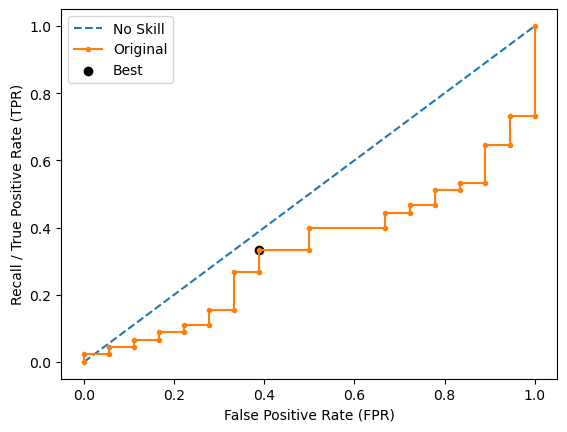

Learning rate set to 0.004061
0:	learn: 0.6922409	total: 1.59ms	remaining: 1.59s
1:	learn: 0.6903487	total: 3.12ms	remaining: 1.56s
2:	learn: 0.6887256	total: 4.56ms	remaining: 1.51s
3:	learn: 0.6873285	total: 5.87ms	remaining: 1.46s
4:	learn: 0.6862105	total: 7.17ms	remaining: 1.43s
5:	learn: 0.6853074	total: 8.62ms	remaining: 1.43s
6:	learn: 0.6839810	total: 9.94ms	remaining: 1.41s
7:	learn: 0.6820437	total: 11.3ms	remaining: 1.41s
8:	learn: 0.6803939	total: 12.6ms	remaining: 1.38s
9:	learn: 0.6798496	total: 13.8ms	remaining: 1.37s
10:	learn: 0.6785086	total: 15.2ms	remaining: 1.36s
11:	learn: 0.6768240	total: 16.5ms	remaining: 1.36s
12:	learn: 0.6764305	total: 17.4ms	remaining: 1.32s
13:	learn: 0.6745854	total: 18.7ms	remaining: 1.32s
14:	learn: 0.6732081	total: 20.1ms	remaining: 1.32s
15:	learn: 0.6712362	total: 21.4ms	remaining: 1.32s
16:	learn: 0.6704748	total: 22.6ms	remaining: 1.3s
17:	learn: 0.6689128	total: 23.9ms	remaining: 1.31s
18:	learn: 0.6678482	total: 25ms	remaining: 1

292:	learn: 0.4140746	total: 381ms	remaining: 920ms
293:	learn: 0.4132711	total: 383ms	remaining: 920ms
294:	learn: 0.4121710	total: 384ms	remaining: 919ms
295:	learn: 0.4116392	total: 386ms	remaining: 918ms
296:	learn: 0.4108188	total: 387ms	remaining: 917ms
297:	learn: 0.4101625	total: 389ms	remaining: 916ms
298:	learn: 0.4098189	total: 390ms	remaining: 915ms
299:	learn: 0.4091349	total: 392ms	remaining: 914ms
300:	learn: 0.4082596	total: 393ms	remaining: 913ms
301:	learn: 0.4077373	total: 394ms	remaining: 912ms
302:	learn: 0.4067948	total: 396ms	remaining: 910ms
303:	learn: 0.4057816	total: 397ms	remaining: 909ms
304:	learn: 0.4048252	total: 398ms	remaining: 908ms
305:	learn: 0.4037916	total: 400ms	remaining: 907ms
306:	learn: 0.4031019	total: 401ms	remaining: 906ms
307:	learn: 0.4025760	total: 403ms	remaining: 905ms
308:	learn: 0.4015790	total: 404ms	remaining: 904ms
309:	learn: 0.4012654	total: 405ms	remaining: 902ms
310:	learn: 0.4003536	total: 407ms	remaining: 901ms
311:	learn: 

563:	learn: 0.2817771	total: 764ms	remaining: 591ms
564:	learn: 0.2813979	total: 766ms	remaining: 590ms
565:	learn: 0.2811923	total: 767ms	remaining: 588ms
566:	learn: 0.2809129	total: 769ms	remaining: 587ms
567:	learn: 0.2805354	total: 770ms	remaining: 586ms
568:	learn: 0.2801486	total: 772ms	remaining: 585ms
569:	learn: 0.2799634	total: 773ms	remaining: 584ms
570:	learn: 0.2796846	total: 775ms	remaining: 582ms
571:	learn: 0.2795164	total: 777ms	remaining: 581ms
572:	learn: 0.2792613	total: 778ms	remaining: 580ms
573:	learn: 0.2790381	total: 780ms	remaining: 579ms
574:	learn: 0.2787142	total: 781ms	remaining: 577ms
575:	learn: 0.2781427	total: 783ms	remaining: 576ms
576:	learn: 0.2776913	total: 784ms	remaining: 575ms
577:	learn: 0.2774557	total: 786ms	remaining: 574ms
578:	learn: 0.2773175	total: 787ms	remaining: 572ms
579:	learn: 0.2771421	total: 789ms	remaining: 571ms
580:	learn: 0.2767065	total: 790ms	remaining: 570ms
581:	learn: 0.2761766	total: 792ms	remaining: 569ms
582:	learn: 

800:	learn: 0.2105255	total: 1.15s	remaining: 285ms
801:	learn: 0.2103604	total: 1.15s	remaining: 283ms
802:	learn: 0.2100176	total: 1.15s	remaining: 282ms
803:	learn: 0.2098332	total: 1.15s	remaining: 281ms
804:	learn: 0.2096737	total: 1.15s	remaining: 279ms
805:	learn: 0.2093613	total: 1.15s	remaining: 278ms
806:	learn: 0.2092190	total: 1.16s	remaining: 277ms
807:	learn: 0.2089929	total: 1.16s	remaining: 275ms
808:	learn: 0.2087247	total: 1.16s	remaining: 274ms
809:	learn: 0.2085431	total: 1.16s	remaining: 272ms
810:	learn: 0.2084821	total: 1.16s	remaining: 271ms
811:	learn: 0.2081137	total: 1.16s	remaining: 270ms
812:	learn: 0.2077951	total: 1.17s	remaining: 268ms
813:	learn: 0.2073726	total: 1.17s	remaining: 267ms
814:	learn: 0.2073581	total: 1.17s	remaining: 265ms
815:	learn: 0.2071796	total: 1.17s	remaining: 264ms
816:	learn: 0.2069126	total: 1.17s	remaining: 263ms
817:	learn: 0.2068471	total: 1.17s	remaining: 261ms
818:	learn: 0.2066451	total: 1.18s	remaining: 260ms
819:	learn: 

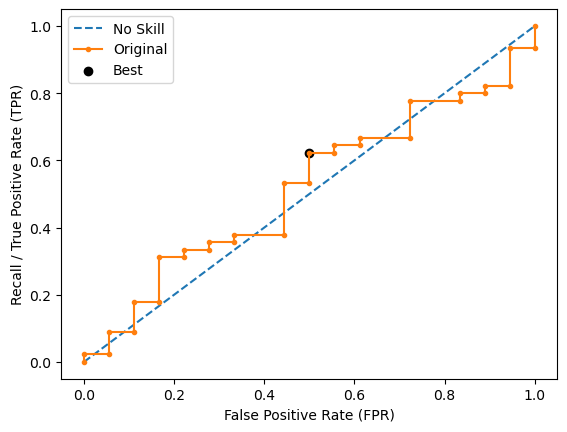

Ave Test Accuracy: 0.546031746031746
Stdev Test Accuracy: 0.05094224297105145
Ave Test Recall: 0.47777777777777775
Stdev Test Recall: 0.06334307917217434
Ave Test F-0.5 Score: 0.3350267548506008
Stdev Test F-0.5 Score: 0.026645163261315857
Ave Test F-0.75 Score: 0.35515142426911617
Stdev Test F-0.75 Score: 0.022196095880392307
Ave Test F-1 Score: 0.37534293388330653
Stdev Test F-1 Score: 0.02183814600756248
Ave Test F-1.5 Score: 0.40808899312594626
Stdev Test F-1.5 Score: 0.030338262794782345
Ave Test F-2 Score: 0.4296243904581997
Stdev Test F-2 Score: 0.03938507580181202
Ave Test G-mean: 0.519437036860554
Stdev Test G-mean: 0.01964120438169667
Ave Test Specificity: 0.5733333333333333
Stdev Test Specificity: 0.09081251885201132
Ave Test Precision: 0.3134077128304632
Ave Test NPV: 0.7320616883116884
Ave Runtime: 1.5675295829772948


In [173]:
ld_t04_catboost_gs, ld_t04_catboost_be, ld_t04_catboost_model_info, ld_t04_catboost_metrics_df = catboost_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 3, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4762558356676004
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=3))])
Mean Train Score (Recall) 0.5541160730684926
Std Train Score (Recall) 0.029755257940337815
GridSearchCV Runtime: 28.009902477264404 secs
Run 1 - Random State: 0
Test Accuracy: 0.47619047619047616
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3164556962025316
Test F-0.75 Score: 0.3462603878116344
Test F-1 Score: 0.3773584905660377
Test F-1.5 Score: 0.4304635761589404
Test F-2 Score: 0.4672897196261682
Test G-Mean Score: 0.49690399499995325
Best Threshold=0.667
Best Recall=0.556
Best G-Mean

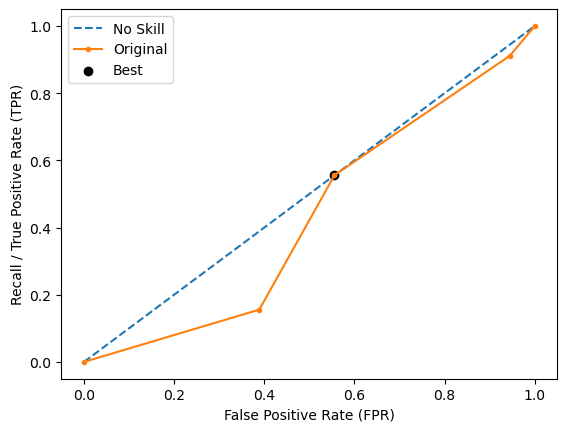

Run 2 - Random State: 1
Test Accuracy: 0.5079365079365079
Test Recall: 0.5
Test F-0.5 Score: 0.3169014084507042
Test F-0.75 Score: 0.3419452887537994
Test F-1 Score: 0.3673469387755102
Test F-1.5 Score: 0.40909090909090906
Test F-2 Score: 0.4368932038834951
Test G-Mean Score: 0.5055250296034367
Best Threshold=0.667
Best Recall=0.489
Best G-Mean=0.494


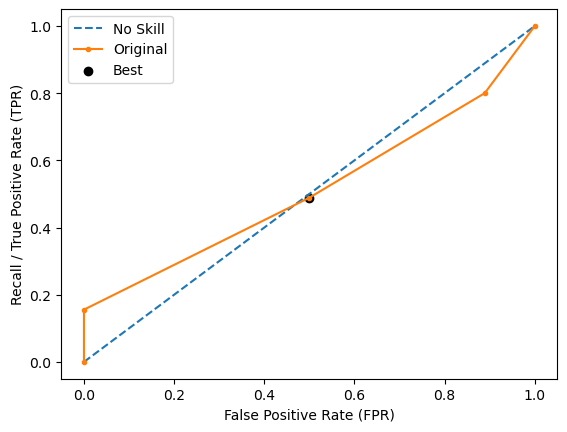

Run 3 - Random State: 2
Test Accuracy: 0.49206349206349204
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3529411764705882
Test F-0.75 Score: 0.3896103896103896
Test F-1 Score: 0.42857142857142855
Test F-1.5 Score: 0.4968152866242037
Test F-2 Score: 0.5454545454545455
Test G-Mean Score: 0.5305482838361476
Best Threshold=0.667
Best Recall=0.578
Best G-Mean=0.439


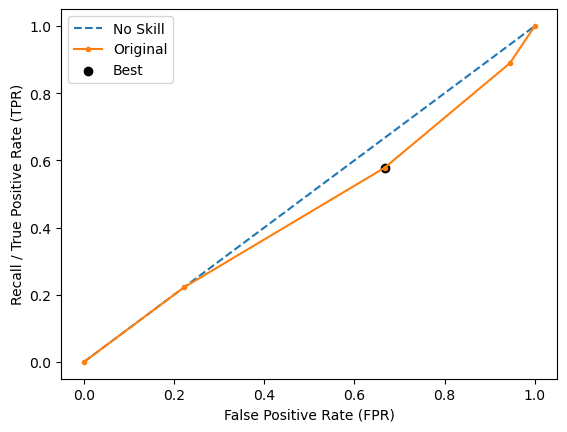

Run 4 - Random State: 3
Test Accuracy: 0.4603174603174603
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.27397260273972607
Test F-0.75 Score: 0.29673590504451036
Test F-1 Score: 0.32
Test F-1.5 Score: 0.3586206896551724
Test F-2 Score: 0.38461538461538464
Test G-Mean Score: 0.45542003404264886
Best Threshold=0.667
Best Recall=0.533
Best G-Mean=0.544


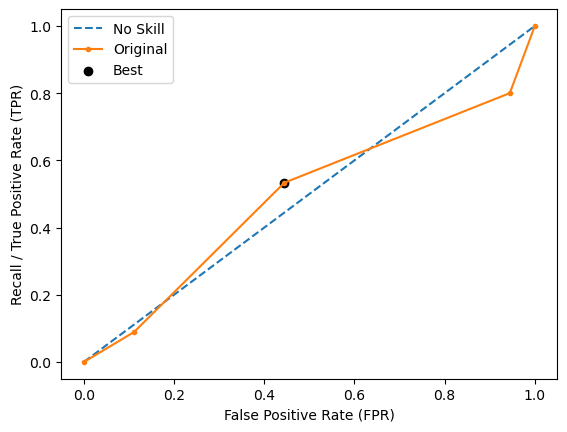

Run 5 - Random State: 4
Test Accuracy: 0.49206349206349204
Test Recall: 0.5
Test F-0.5 Score: 0.3082191780821918
Test F-0.75 Score: 0.33382789317507416
Test F-1 Score: 0.36
Test F-1.5 Score: 0.40344827586206894
Test F-2 Score: 0.4326923076923077
Test G-Mean Score: 0.4944132324730442
Best Threshold=0.333
Best Recall=0.822
Best G-Mean=0.427


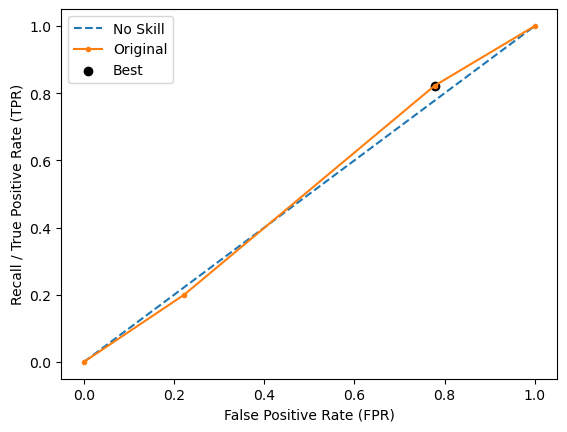

Ave Test Accuracy: 0.48571428571428565
Stdev Test Accuracy: 0.018098022620621237
Ave Test Recall: 0.5333333333333334
Stdev Test Recall: 0.08425417160057277
Ave Test F-0.5 Score: 0.3136980123891484
Stdev Test F-0.5 Score: 0.028133691060017774
Ave Test F-0.75 Score: 0.3416759728790816
Stdev Test F-0.75 Score: 0.03316624696397379
Ave Test F-1 Score: 0.37065537158259526
Stdev Test F-1 Score: 0.03901810734329943
Ave Test F-1.5 Score: 0.4196877474782589
Stdev Test F-1.5 Score: 0.05042314635118847
Ave Test F-2 Score: 0.45338903225438026
Stdev Test F-2 Score: 0.059370803432812654
Ave Test G-mean: 0.49656211499104613
Stdev Test G-mean: 0.027077661059893492
Ave Test Specificity: 0.4666666666666667
Stdev Test Specificity: 0.035136418446315314
Ave Test Precision: 0.28461526800873155
Ave Test NPV: 0.7160264976958525
Ave Runtime: 0.023909616470336913


In [174]:
ld_t04_knn_gs, ld_t04_knn_be, ld_t04_knn_model_info, ld_t04_knn_metrics_df = knn_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4593864468864469
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwis

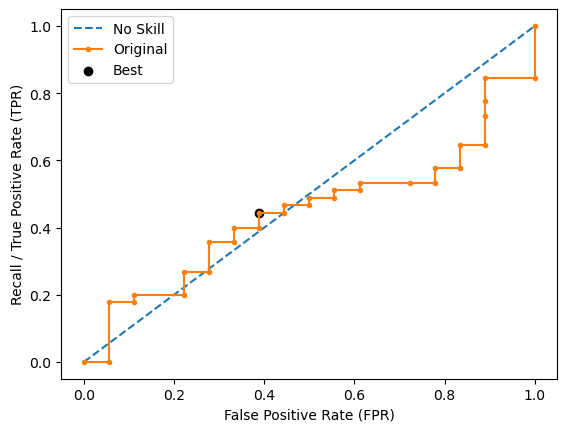

Run 2 - Random State: 1
Test Accuracy: 0.5238095238095238
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3571428571428571
Test F-0.75 Score: 0.3895184135977337
Test F-1 Score: 0.42307692307692313
Test F-1.5 Score: 0.4798657718120805
Test F-2 Score: 0.5188679245283019
Test G-Mean Score: 0.5465943944999486
Best Threshold=0.478
Best Recall=0.622
Best G-Mean=0.492


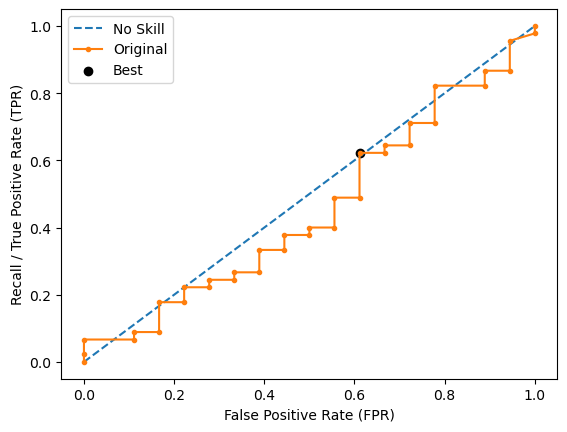

Run 3 - Random State: 2
Test Accuracy: 0.5396825396825397
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.36666666666666664
Test F-0.75 Score: 0.39855072463768115
Test F-1 Score: 0.43137254901960786
Test F-1.5 Score: 0.4863945578231293
Test F-2 Score: 0.5238095238095238
Test G-Mean Score: 0.5588789484426352
Best Threshold=0.579
Best Recall=0.400
Best G-Mean=0.537


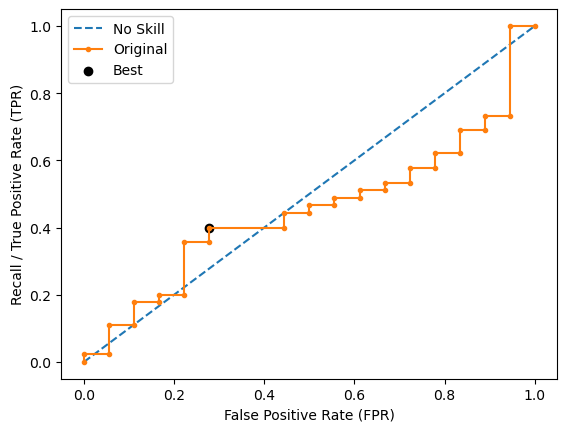

Run 4 - Random State: 3
Test Accuracy: 0.6666666666666666
Test Recall: 0.5
Test F-0.5 Score: 0.44117647058823534
Test F-0.75 Score: 0.4518072289156626
Test F-1 Score: 0.4615384615384615
Test F-1.5 Score: 0.475609756097561
Test F-2 Score: 0.48387096774193544
Test G-Mean Score: 0.6055300708194984
Best Threshold=0.546
Best Recall=0.244
Best G-Mean=0.387


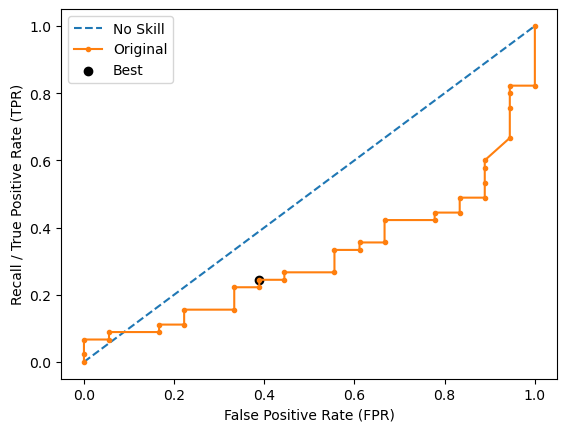

Run 5 - Random State: 4
Test Accuracy: 0.5238095238095238
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.30769230769230765
Test F-0.75 Score: 0.32786885245901637
Test F-1 Score: 0.34782608695652173
Test F-1.5 Score: 0.3795620437956204
Test F-2 Score: 0.3999999999999999
Test G-Mean Score: 0.49690399499995325
Best Threshold=0.399
Best Recall=0.733
Best G-Mean=0.534


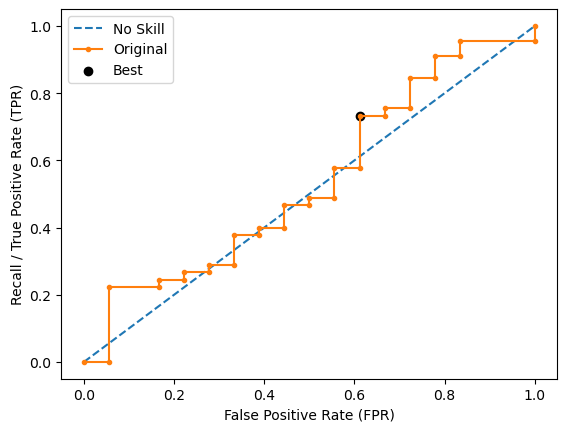

Ave Test Accuracy: 0.5523809523809523
Stdev Test Accuracy: 0.0648660848942938
Ave Test Recall: 0.5333333333333334
Stdev Test Recall: 0.07453559924999302
Ave Test F-0.5 Score: 0.3579159421081542
Stdev Test F-0.5 Score: 0.05294830938877942
Ave Test F-0.75 Score: 0.38193810167277864
Stdev Test F-0.75 Score: 0.04934076435374794
Ave Test F-1 Score: 0.40623219187340487
Stdev Test F-1 Score: 0.047164345620051465
Ave Test F-1.5 Score: 0.44610460772386007
Stdev Test F-1.5 Score: 0.048558152664568685
Ave Test F-2 Score: 0.47268832399265126
Stdev Test F-2 Score: 0.053469307004256776
Ave Test G-mean: 0.5426864876730944
Stdev Test G-mean: 0.04388562995289185
Ave Test Specificity: 0.5599999999999999
Stdev Test Specificity: 0.09987646690775213
Ave Test Precision: 0.332294208005783
Ave Test NPV: 0.7488074712643679
Ave Runtime: 0.09435863494873047


In [175]:
ld_t04_xgb_gs, ld_t04_xgb_be, ld_t04_xgb_model_info, ld_t04_xgb_metrics_df = xgb_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.4349278172807584
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.8886914987118771
Std Train Score (Recall) 0.0116455781167106
GridSearchCV Runtime: 46.99834442138672 secs
Run 1 - Random State: 0
Test Accuracy: 0.5079365079365079
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3333333333333333
Test F-0.75

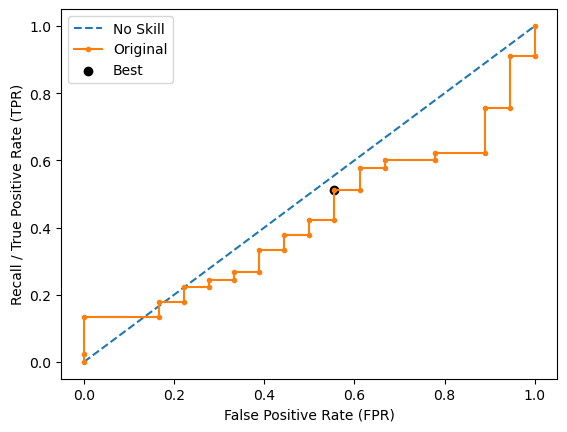

Run 2 - Random State: 1
Test Accuracy: 0.49206349206349204
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.33950617283950624
Test F-0.75 Score: 0.3726287262872629
Test F-1 Score: 0.40740740740740744
Test F-1.5 Score: 0.46732026143790856
Test F-2 Score: 0.5092592592592593
Test G-Mean Score: 0.5211573066470477
Best Threshold=0.760
Best Recall=0.444
Best G-Mean=0.544


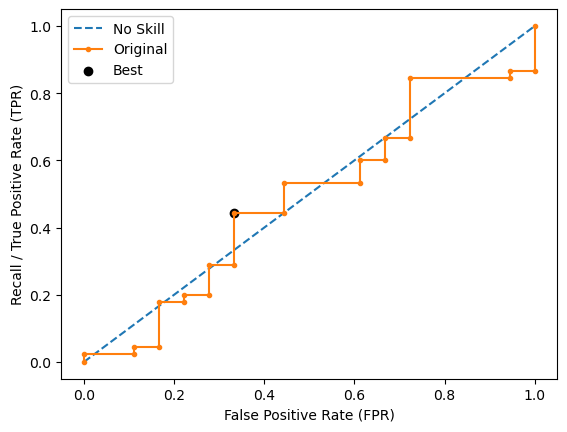

Run 3 - Random State: 2
Test Accuracy: 0.42857142857142855
Test Recall: 0.5
Test F-0.5 Score: 0.2777777777777778
Test F-0.75 Score: 0.3048780487804878
Test F-1 Score: 0.3333333333333333
Test F-1.5 Score: 0.38235294117647056
Test F-2 Score: 0.4166666666666667
Test G-Mean Score: 0.447213595499958
Best Threshold=0.597
Best Recall=0.533
Best G-Mean=0.571


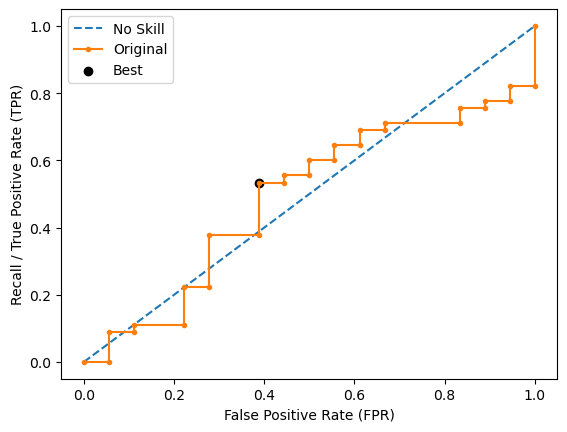

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.4385964912280702
Test F-0.75 Score: 0.45787545787545797
Test F-1 Score: 0.4761904761904762
Test F-1.5 Score: 0.5038759689922481
Test F-2 Score: 0.5208333333333334
Test G-Mean Score: 0.6186404847588913
Best Threshold=0.580
Best Recall=0.289
Best G-Mean=0.420


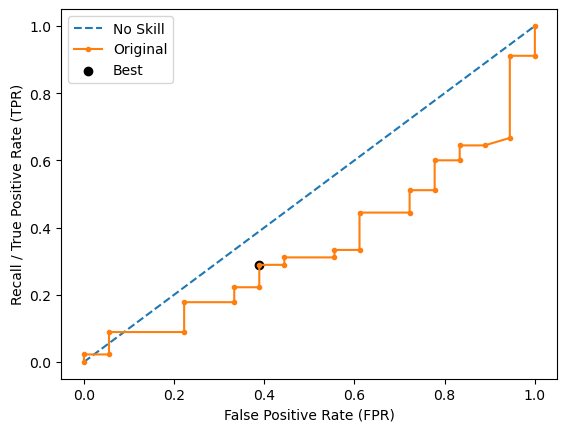

Run 5 - Random State: 4
Test Accuracy: 0.49206349206349204
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.2692307692307692
Test F-0.75 Score: 0.2868852459016394
Test F-1 Score: 0.30434782608695654
Test F-1.5 Score: 0.33211678832116787
Test F-2 Score: 0.35000000000000003
Test G-Mean Score: 0.4554200340426488
Best Threshold=0.520
Best Recall=0.467
Best G-Mean=0.534


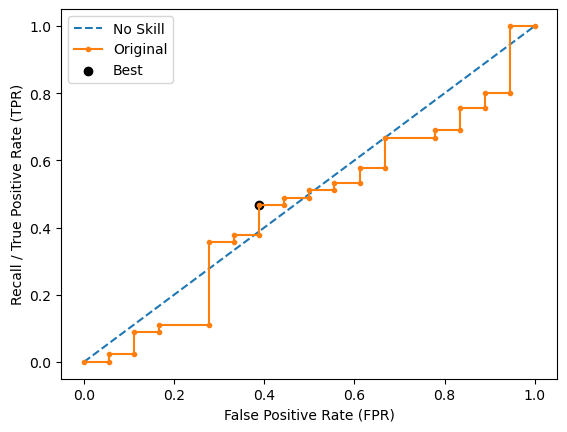

Ave Test Accuracy: 0.5142857142857143
Stdev Test Accuracy: 0.08217256574949071
Ave Test Recall: 0.5222222222222223
Stdev Test Recall: 0.0842541716005728
Ave Test F-0.5 Score: 0.3316889088818914
Stdev Test F-0.5 Score: 0.06763962258962666
Ave Test F-0.75 Score: 0.3569172638849117
Stdev Test F-0.75 Score: 0.0672330786647037
Ave Test F-1 Score: 0.3826871811526543
Stdev Test F-1 Score: 0.06711275490761907
Ave Test F-1.5 Score: 0.4255685661352189
Stdev Test F-1.5 Score: 0.0684688144379697
Ave Test F-2 Score: 0.45458994708994716
Stdev Test F-2 Score: 0.07109981540380336
Ave Test G-mean: 0.5127177455191188
Stdev Test G-mean: 0.0688038888477506
Ave Test Specificity: 0.5111111111111111
Stdev Test Specificity: 0.1111111111111111
Ave Test Precision: 0.30505050505050507
Ave Test NPV: 0.7242653642653641
Ave Runtime: 0.09904265403747559


In [176]:
ld_t04_gbm_gs, ld_t04_gbm_be, ld_t04_gbm_model_info, ld_t04_gbm_metrics_df = gbm_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.4531271995977878
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=3, min_samples_leaf=3,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Recall) 0.6844411428149956
Std Train Score (Recall) 0.03593297040038927
GridSearchCV Runtime: 7523.881207227707 secs
Run 1 - Random State: 0
Test Accuracy: 0.5238095238095238
Test Recall: 0.5555555555555556
Test F-0.5 Scor

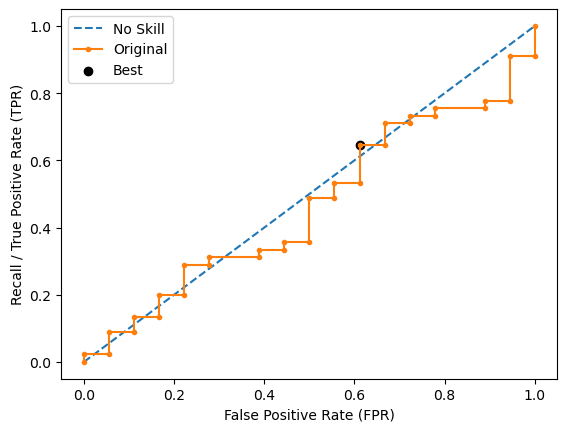

Run 2 - Random State: 1
Test Accuracy: 0.4603174603174603
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.2536231884057971
Test F-0.75 Score: 0.27258566978193144
Test F-1 Score: 0.2916666666666667
Test F-1.5 Score: 0.3226950354609929
Test F-2 Score: 0.3431372549019608
Test G-Mean Score: 0.4360314860077463
Best Threshold=0.513
Best Recall=0.511
Best G-Mean=0.584


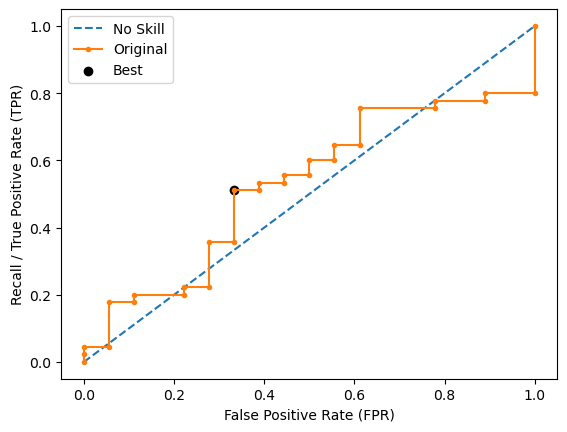

Run 3 - Random State: 2
Test Accuracy: 0.4444444444444444
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3296703296703297
Test F-0.75 Score: 0.3667481662591686
Test F-1 Score: 0.4067796610169492
Test F-1.5 Score: 0.4785276073619631
Test F-2 Score: 0.5309734513274336
Test G-Mean Score: 0.48686449556014766
Best Threshold=0.529
Best Recall=0.467
Best G-Mean=0.509


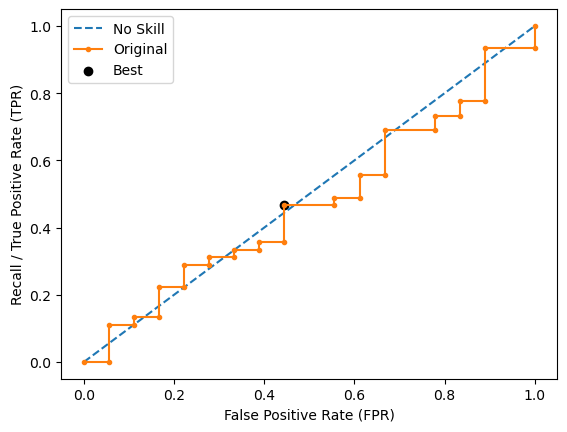

Run 4 - Random State: 3
Test Accuracy: 0.5079365079365079
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.29850746268656714
Test F-0.75 Score: 0.3194888178913738
Test F-1 Score: 0.3404255319148936
Test F-1.5 Score: 0.3741007194244604
Test F-2 Score: 0.396039603960396
Test G-Mean Score: 0.4868644955601476
Best Threshold=0.503
Best Recall=0.467
Best G-Mean=0.509


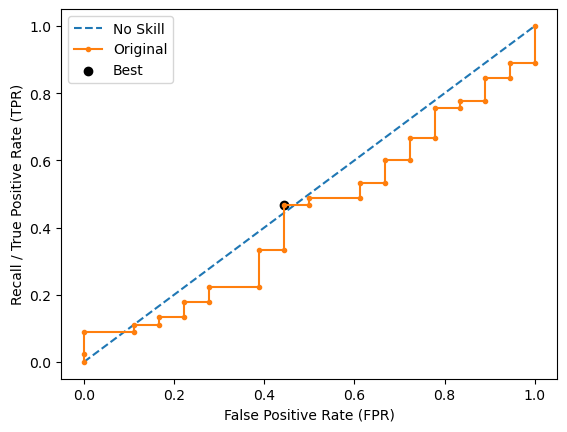

Run 5 - Random State: 4
Test Accuracy: 0.5238095238095238
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3703703703703703
Test F-0.75 Score: 0.40650406504065034
Test F-1 Score: 0.4444444444444444
Test F-1.5 Score: 0.5098039215686274
Test F-2 Score: 0.5555555555555555
Test G-Mean Score: 0.557773351022717
Best Threshold=0.481
Best Recall=0.644
Best G-Mean=0.463


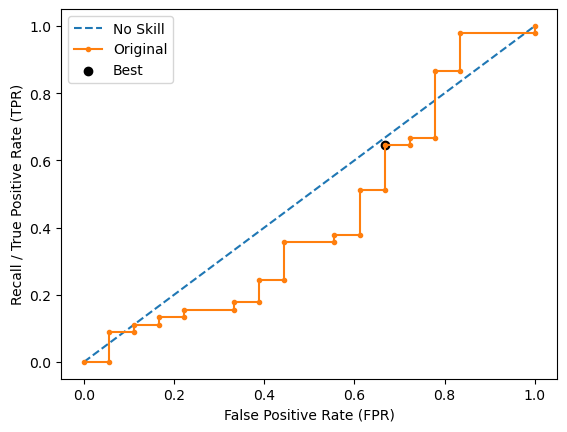

Ave Test Accuracy: 0.4920634920634921
Stdev Test Accuracy: 0.03722552190336057
Ave Test Recall: 0.5444444444444444
Stdev Test Recall: 0.12668615834434865
Ave Test F-0.5 Score: 0.31892742091154436
Stdev Test F-0.5 Score: 0.0447142530749293
Ave Test F-0.75 Score: 0.34724932005575243
Stdev Test F-0.75 Score: 0.0519541418681039
Ave Test F-1 Score: 0.3766632608085908
Stdev Test F-1 Score: 0.06038104798646517
Ave Test F-1.5 Score: 0.4266806291770019
Stdev Test F-1.5 Score: 0.07687911871673929
Ave Test F-2 Score: 0.46129501930291533
Stdev Test F-2 Score: 0.08991510442637218
Ave Test G-mean: 0.5000807994815455
Stdev Test G-mean: 0.04705111371888735
Ave Test Specificity: 0.47111111111111115
Stdev Test Specificity: 0.06921071778843305
Ave Test Precision: 0.28954233249229044
Ave Test NPV: 0.7239070017058632
Ave Runtime: 0.2848789215087891


In [177]:
ld_t04_rf_gs, ld_t04_rf_be, ld_t04_rf_model_info, ld_t04_rf_metrics_df = rf_class2(ld_t04, fbeta_scorer(beta=1),
                                                            'ageing_class', random_state=0)

In [178]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t04_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t04_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t04_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
8,AdaBoost,0.570301,0.071933,0.472231,0.886161,0.666667,0.130289,0.546032,0.074957,0.385084,0.419746,0.455941,0.517981,0.561296
6,LightGBM,0.552018,0.042557,0.476235,0.732654,0.611111,0.111111,0.536508,0.045453,0.364283,0.395682,0.428172,0.483144,0.520979
7,Extreme Gradient Boosting (XGBoost),0.542686,0.043886,0.459386,0.850458,0.533333,0.074536,0.552381,0.064866,0.357916,0.381938,0.406232,0.446105,0.472688
9,CatBoost,0.519437,0.019641,0.432867,0.893206,0.477778,0.063343,0.546032,0.050942,0.335027,0.355151,0.375343,0.408089,0.429624
5,Gradient Boosting Machine (GBM),0.512718,0.068804,0.434928,0.888691,0.522222,0.084254,0.514286,0.082173,0.331689,0.356917,0.382687,0.425569,0.454590
4,Random Forest,0.500081,0.047051,0.453127,0.684441,0.544444,0.126686,0.492063,0.037226,0.318927,0.347249,0.376663,0.426681,0.461295
0,k-Nearest Neighbors,0.496562,0.027078,0.476256,0.554116,0.533333,0.084254,0.485714,0.018098,0.313698,0.341676,0.370655,0.419688,0.453389
2,Logistic Regression,0.445264,0.055683,0.451328,0.523682,0.533333,0.084254,0.425397,0.064866,0.287280,0.316050,0.346537,0.399848,0.437876
1,SVM Classifier,0.422239,0.024485,0.453730,0.471102,0.522222,0.198762,0.422222,0.047087,0.274330,0.301735,0.331113,0.383497,0.421797
3,Decision Tree,0.384560,0.113938,0.470758,0.499563,0.322222,0.233730,0.520635,0.103723,0.231311,0.239643,0.249896,0.269584,0.284314


## Optimizing for G-Mean Score

Fitting 10 folds for each of 3888 candidates, totalling 38880 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5955728637697477
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        random_state=0))])
Mean Train Score (Recall) 0.6003436012226524
Std Train Score (Recall) 0.06453621965921032
GridSearchCV Runtime: 39.82574725151062 secs
Run 1 - Random State: 0
Test Accuracy: 0.5555555555555556
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.30701754385964913
Test F-0.75 Score: 0.32051282051282054
Test F-1 Score: 0.3333333333333333
Tes

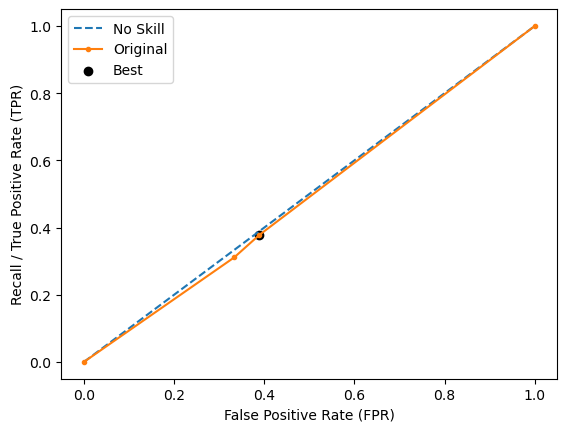

Run 2 - Random State: 1
Test Accuracy: 0.4444444444444444
Test Recall: 0.6666666666666666
Test F-0.5 Score: 0.3296703296703297
Test F-0.75 Score: 0.3667481662591686
Test F-1 Score: 0.4067796610169492
Test F-1.5 Score: 0.4785276073619631
Test F-2 Score: 0.5309734513274336
Test G-Mean Score: 0.48686449556014766
Best Threshold=0.559
Best Recall=0.644
Best G-Mean=0.463


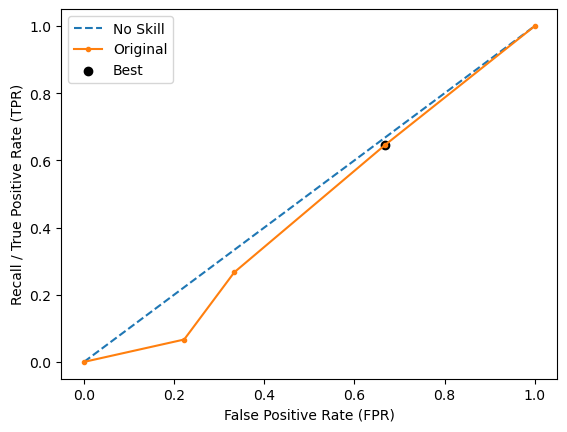

Run 3 - Random State: 2
Test Accuracy: 0.6031746031746031
Test Recall: 0.05555555555555555
Test F-0.5 Score: 0.09259259259259259
Test F-0.75 Score: 0.08169934640522876
Test F-1 Score: 0.07407407407407407
Test F-1.5 Score: 0.06565656565656565
Test F-2 Score: 0.06172839506172839
Test G-Mean Score: 0.21372648957412602
Best Threshold=0.800
Best Recall=0.178
Best G-Mean=0.410


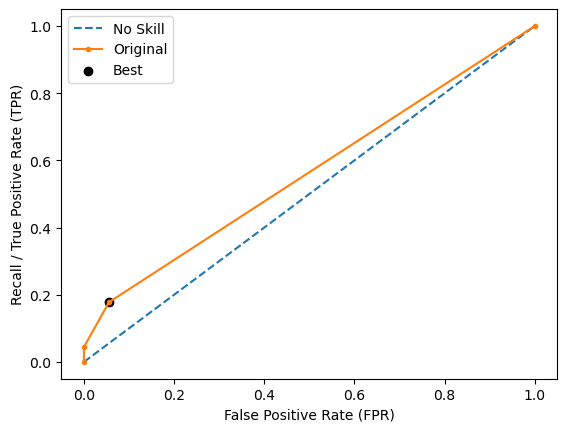

Run 4 - Random State: 3
Test Accuracy: 0.6190476190476191
Test Recall: 0.16666666666666666
Test F-0.5 Score: 0.22727272727272727
Test F-0.75 Score: 0.211864406779661
Test F-1 Score: 0.2
Test F-1.5 Score: 0.18571428571428572
Test F-2 Score: 0.17857142857142855
Test G-Mean Score: 0.36514837167011077
Best Threshold=0.444
Best Recall=0.311
Best G-Mean=0.492


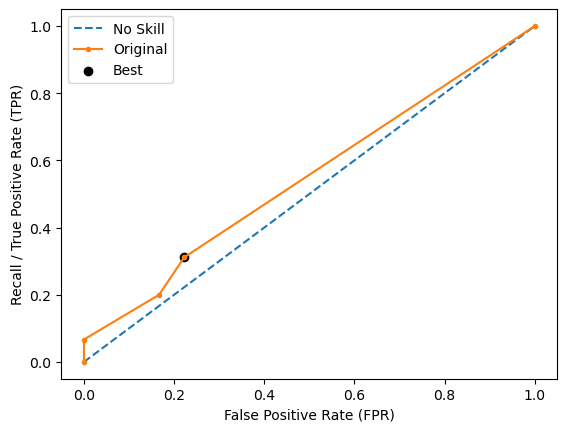

Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.3333333333333333
Test F-0.5 Score: 0.2
Test F-0.75 Score: 0.21739130434782608
Test F-1 Score: 0.23529411764705885
Test F-1.5 Score: 0.26530612244897955
Test F-2 Score: 0.28571428571428575
Test G-Mean Score: 0.36514837167011077
Best Threshold=0.559
Best Recall=0.600
Best G-Mean=0.632


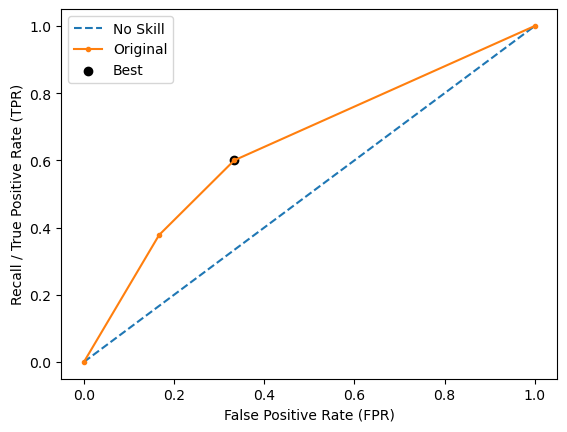

Ave Test Accuracy: 0.5206349206349207
Stdev Test Accuracy: 0.10372259842987011
Ave Test Recall: 0.32222222222222224
Stdev Test Recall: 0.23372982186625144
Ave Test F-0.5 Score: 0.2313106386790597
Stdev Test F-0.5 Score: 0.09440010783492797
Ave Test F-0.75 Score: 0.23964320886094104
Stdev Test F-0.75 Score: 0.11057648605251902
Ave Test F-1 Score: 0.24989623721428308
Stdev Test F-1 Score: 0.12766210000243647
Ave Test F-1.5 Score: 0.26958355189527355
Stdev Test F-1.5 Score: 0.15748549062450312
Ave Test F-2 Score: 0.28431417880164195
Stdev Test F-2 Score: 0.17889372162048686
Ave Test G-mean: 0.38455951734458194
Stdev Test G-mean: 0.11393848426878087
Ave Test Specificity: 0.6
Stdev Test Specificity: 0.21773242158072695
Ave Test Precision: 0.22545577728504557
Ave Test NPV: 0.6872577966695614
Ave Runtime: 0.01912689208984375


In [179]:
ld_t04_dt_gs, ld_t04_dt_be, ld_t04_dt_model_info, ld_t04_dt_metrics_df = dt_class2(ld_t04, g_mean_scorer,
                                                                                   'ageing_class', random_state=0)

Fitting 10 folds for each of 585 candidates, totalling 5850 fits
Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': RandomUnderSampler(random_state=0), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.5648904274013016
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Recall) 0.6253852391419852
Std Train Score (Recall) 0.03514477547719395
GridSearchCV Runtime: 11.315248489379883 secs
Run 1 - Random State: 0
Test Accuracy: 0.47619047619047616
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.18181818181818185
Test F-0.75 Score: 0.18867924528301885
Test F-1 Score: 0.1951219512195122
Test F-1.5 Score: 0.20472440944881887
Test F-2 Score: 0.2105263157

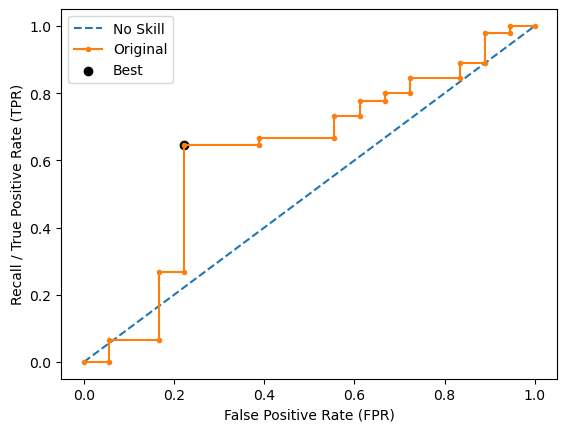

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.25510204081632654
Test F-0.75 Score: 0.25933609958506226
Test F-1 Score: 0.2631578947368421
Test F-1.5 Score: 0.26859504132231404
Test F-2 Score: 0.2717391304347826
Test G-Mean Score: 0.43033148291193524
Best Threshold=0.495
Best Recall=0.644
Best G-Mean=0.628


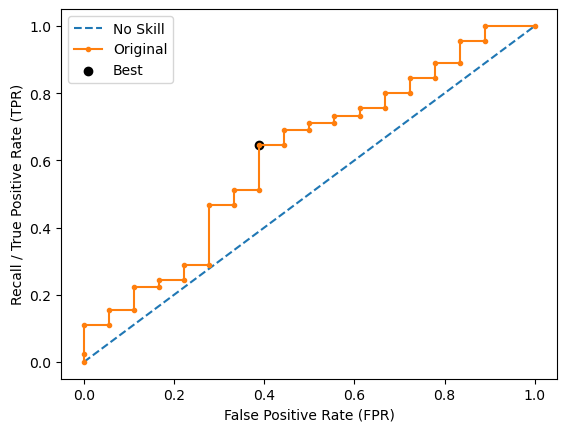

Run 3 - Random State: 2
Test Accuracy: 0.5714285714285714
Test Recall: 0.5
Test F-0.5 Score: 0.3571428571428571
Test F-0.75 Score: 0.37878787878787873
Test F-1 Score: 0.4
Test F-1.5 Score: 0.4333333333333333
Test F-2 Score: 0.45454545454545453
Test G-Mean Score: 0.5477225575051662
Best Threshold=0.504
Best Recall=0.333
Best G-Mean=0.527


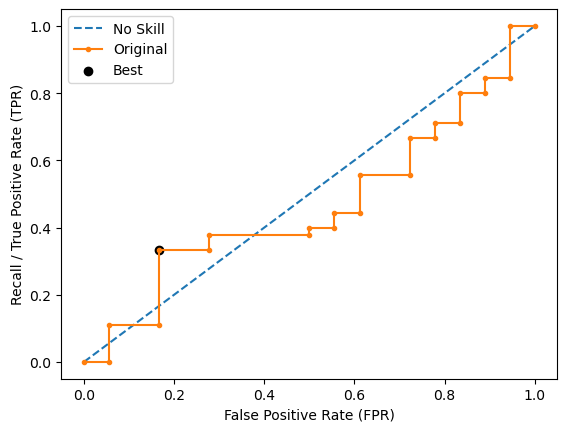

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.40816326530612246
Test F-0.75 Score: 0.4149377593360996
Test F-1 Score: 0.4210526315789474
Test F-1.5 Score: 0.4297520661157024
Test F-2 Score: 0.43478260869565216
Test G-Mean Score: 0.5708992257184502
Best Threshold=0.488
Best Recall=0.756
Best G-Mean=0.579


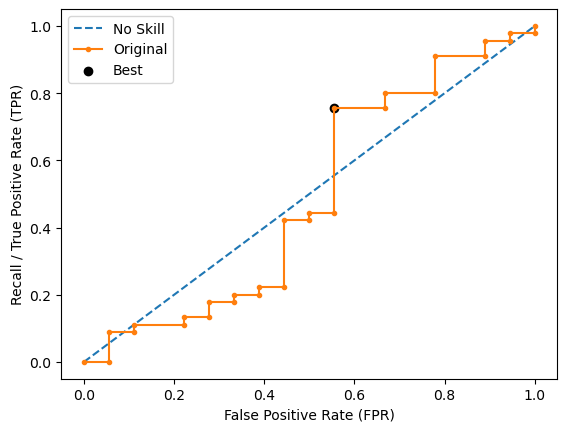

Run 5 - Random State: 4
Test Accuracy: 0.5238095238095238
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.30769230769230765
Test F-0.75 Score: 0.32786885245901637
Test F-1 Score: 0.34782608695652173
Test F-1.5 Score: 0.3795620437956204
Test F-2 Score: 0.3999999999999999
Test G-Mean Score: 0.49690399499995325
Best Threshold=0.499
Best Recall=0.511
Best G-Mean=0.533


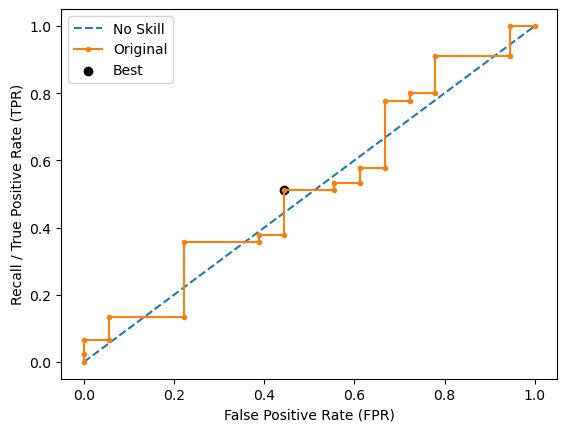

Ave Test Accuracy: 0.5555555555555556
Stdev Test Accuracy: 0.06447649527488858
Ave Test Recall: 0.37777777777777777
Stdev Test Recall: 0.12044157438154889
Ave Test F-0.5 Score: 0.30198373055515915
Stdev Test F-0.5 Score: 0.08801542852648978
Ave Test F-0.75 Score: 0.3139219670902152
Stdev Test F-0.75 Score: 0.09120258863087184
Ave Test F-1 Score: 0.3254317128983647
Stdev Test F-1 Score: 0.09495256702330497
Ave Test F-1.5 Score: 0.3431933788031578
Stdev Test F-1.5 Score: 0.10207701133735457
Ave Test F-2 Score: 0.3543187018930726
Stdev Test F-2 Score: 0.10735718323138792
Ave Test G-mean: 0.4808359655453104
Stdev Test G-mean: 0.08718317537943557
Ave Test Specificity: 0.6266666666666667
Stdev Test Specificity: 0.07269078770576054
Ave Test Precision: 0.28859213250517596
Ave Test NPV: 0.7158803986710963
Ave Runtime: 0.006247186660766601


In [180]:
ld_t04_logreg_gs, ld_t04_logreg_be, ld_t04_logreg_model_info, ld_t04_logreg_metrics_df = logreg_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1560 candidates, totalling 15600 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 100.0, 'classifier__kernel': 'sigmoid', 'classifier__probability': True, 'resampling': ADASYN(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5715422208349055
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=100.0, kernel='sigmoid', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Recall) 0.47196969353414203
Std Train Score (Recall) 0.04861956673543728
GridSearchCV Runtime: 22.57279634475708 secs
[LibSVM]Run 1 - Random State: 0
Test Accuracy: 0.5396825396825397
Test Recall: 0.5
Test F-0.5 Score: 0.3358208955223881
Test F-0.75 Score: 0.3594249201277956
Test F-1 Score: 0.3829787234042554
Test F-1.5 Score: 0.420863309352518
Test F-2 Score: 0.44554455445544555
Test G-Mea

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


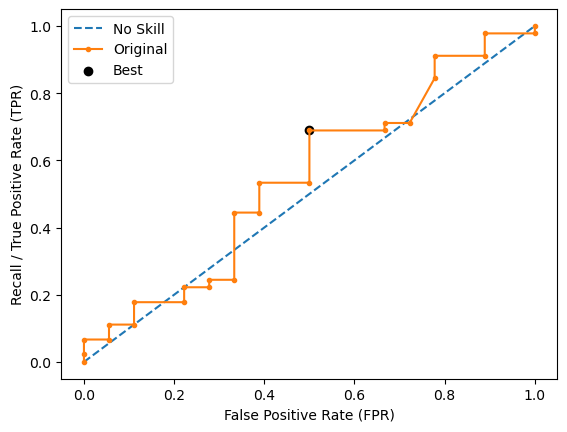

[LibSVM]Run 2 - Random State: 1
Test Accuracy: 0.47619047619047616
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.28169014084507044
Test F-0.75 Score: 0.303951367781155
Test F-1 Score: 0.32653061224489793
Test F-1.5 Score: 0.36363636363636365
Test F-2 Score: 0.3883495145631068
Test G-Mean Score: 0.46613726585340065
Best Threshold=0.510
Best Recall=0.556
Best G-Mean=0.497


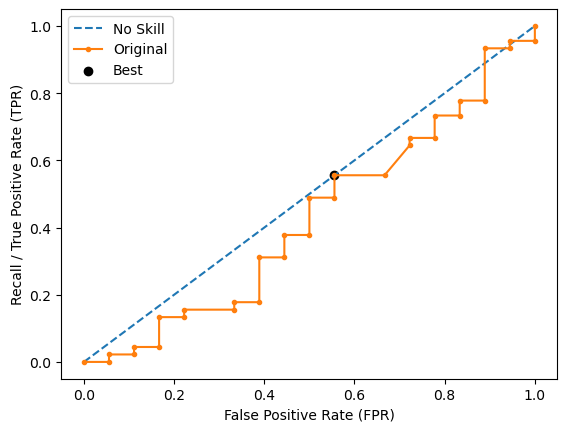

[LibSVM]Run 3 - Random State: 2
Test Accuracy: 0.49206349206349204
Test Recall: 0.7222222222222222
Test F-0.5 Score: 0.3651685393258427
Test F-0.75 Score: 0.4052369077306733
Test F-1 Score: 0.44827586206896547
Test F-1.5 Score: 0.5248447204968945
Test F-2 Score: 0.5803571428571429
Test G-Mean Score: 0.53748384988657
Best Threshold=0.521
Best Recall=0.444
Best G-Mean=0.567


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


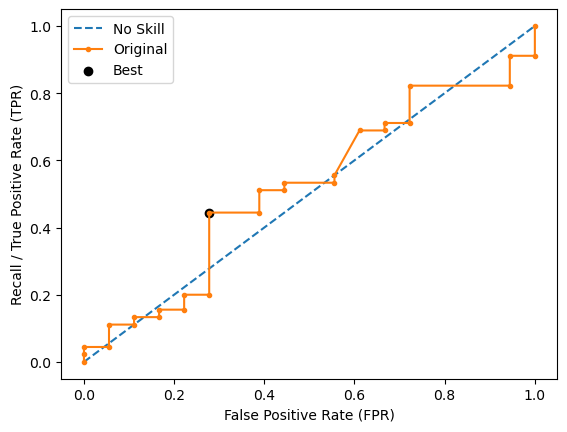

[LibSVM]Run 4 - Random State: 3
Test Accuracy: 0.3492063492063492
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.14084507042253522
Test F-0.75 Score: 0.1519756838905775
Test F-1 Score: 0.16326530612244897
Test F-1.5 Score: 0.18181818181818182
Test F-2 Score: 0.1941747572815534
Test G-Mean Score: 0.2981423969999719
Best Threshold=0.511
Best Recall=0.889
Best G-Mean=0.444


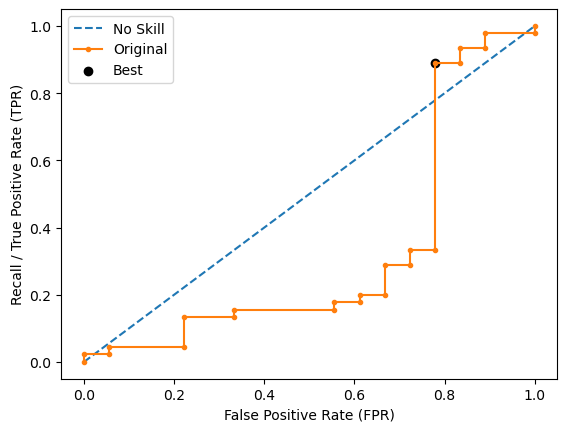

[LibSVM]Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.22151898734177217
Test F-0.75 Score: 0.24238227146814403
Test F-1 Score: 0.2641509433962264
Test F-1.5 Score: 0.30132450331125826
Test F-2 Score: 0.32710280373831774
Test G-Mean Score: 0.3832930735702298
Best Threshold=0.490
Best Recall=0.733
Best G-Mean=0.494


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


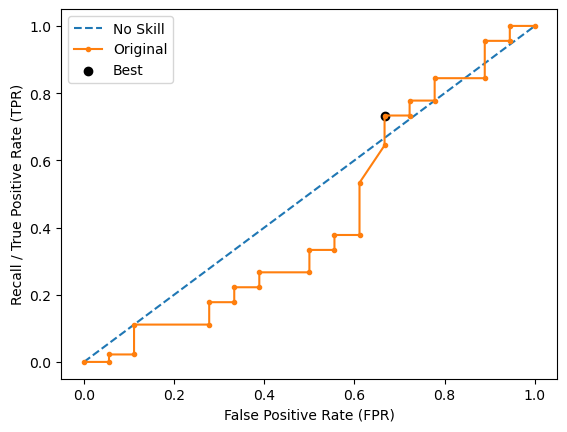

Ave Test Accuracy: 0.44761904761904764
Stdev Test Accuracy: 0.07968190728895957
Ave Test Recall: 0.45555555555555555
Stdev Test Recall: 0.1817269692644014
Ave Test F-0.5 Score: 0.2690087266915217
Stdev Test F-0.5 Score: 0.0902116842022526
Ave Test F-0.75 Score: 0.29259423019966907
Stdev Test F-0.75 Score: 0.09947174832258467
Ave Test F-1 Score: 0.31704028944735885
Stdev Test F-1 Score: 0.10966397225513859
Ave Test F-1.5 Score: 0.3584974157230432
Stdev Test F-1.5 Score: 0.12852201454054252
Ave Test F-2 Score: 0.3871057545791133
Stdev Test F-2 Score: 0.14281584573245326
Ave Test G-mean: 0.4424205726009804
Stdev Test G-mean: 0.10133270833849257
Ave Test Specificity: 0.4444444444444445
Stdev Test Specificity: 0.0753592220347252
Ave Test Precision: 0.244488320355951
Ave Test NPV: 0.675009134088418
Ave Runtime: 0.03972196578979492


In [181]:
ld_t04_svm_gs, ld_t04_svm_be, ld_t04_svm_model_info, ld_t04_svm_metrics_df = svm_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__boosting_type': 'dart', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__n_estimators': 300, 'resampling': EditedNearestNeighbours(), 'scaler': MinMaxScaler()}
Best Validation Score (Recall): 0.6064483937497677
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LGBMClassifier(boosting_type='dart', learning_rate=0.01,
                                max_depth=2, n_estimators=300,
                                random_state=0))])
Mean Train Score (Recall) 0.8069176879054215
Std Train Score (Recall) 0.024145265510662692
GridSearchCV Runtime: 18.484532356262207 secs
Run 1 - Random State: 0
Test Accuracy: 0.5079365079365079
Test Recall: 0.3333333333333333
Test F-0.5 Score: 0.2542372881355932
Test F-0.75 Score: 0.26690391459074736
Test F-1 Score: 0.27

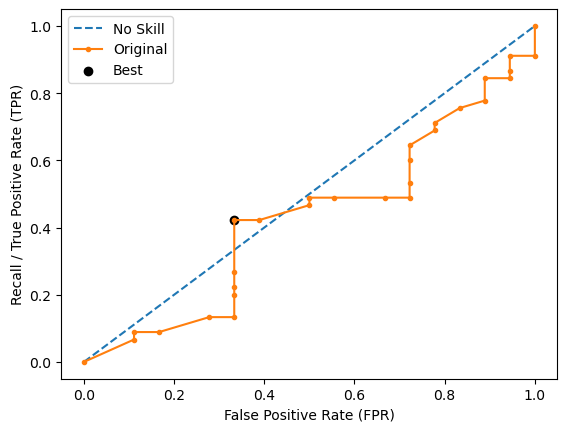

Run 2 - Random State: 1
Test Accuracy: 0.5714285714285714
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3731343283582089
Test F-0.75 Score: 0.3993610223642173
Test F-1 Score: 0.4255319148936171
Test F-1.5 Score: 0.46762589928057563
Test F-2 Score: 0.49504950495049505
Test G-Mean Score: 0.5665577237325317
Best Threshold=0.485
Best Recall=0.533
Best G-Mean=0.487


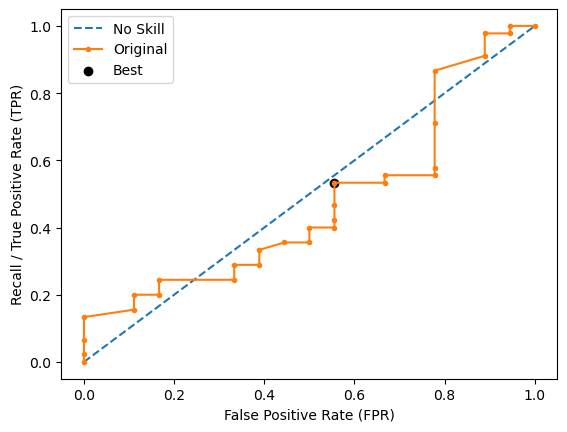

Run 3 - Random State: 2
Test Accuracy: 0.5079365079365079
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.38461538461538464
Test F-0.75 Score: 0.42787286063569685
Test F-1 Score: 0.4745762711864407
Test F-1.5 Score: 0.558282208588957
Test F-2 Score: 0.6194690265486725
Test G-Mean Score: 0.5577733510227171
Best Threshold=0.521
Best Recall=0.511
Best G-Mean=0.477


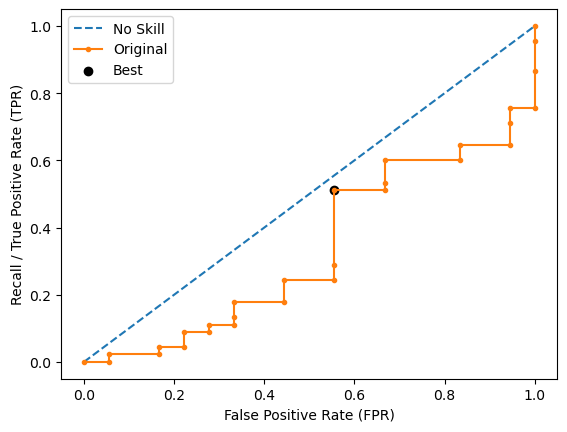

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.7777777777777778
Test F-0.5 Score: 0.4794520547945205
Test F-0.75 Score: 0.5192878338278932
Test F-1 Score: 0.56
Test F-1.5 Score: 0.6275862068965519
Test F-2 Score: 0.6730769230769231
Test G-Mean Score: 0.6831300510639732
Best Threshold=0.522
Best Recall=0.333
Best G-Mean=0.408


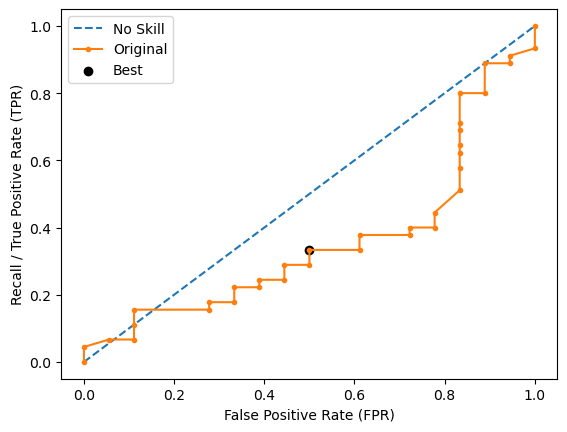

Run 5 - Random State: 4
Test Accuracy: 0.5238095238095238
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.30769230769230765
Test F-0.75 Score: 0.32786885245901637
Test F-1 Score: 0.34782608695652173
Test F-1.5 Score: 0.3795620437956204
Test F-2 Score: 0.3999999999999999
Test G-Mean Score: 0.49690399499995325
Best Threshold=0.472
Best Recall=0.667
Best G-Mean=0.577


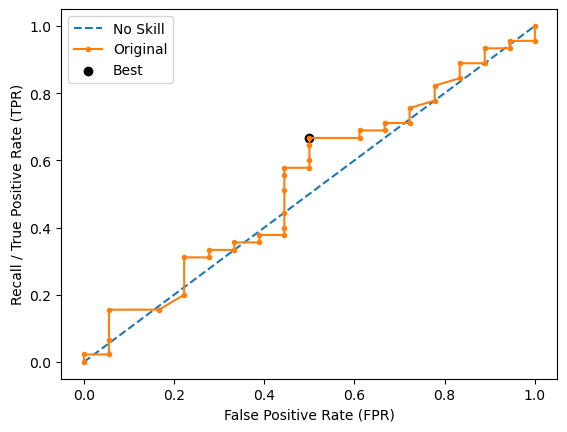

Ave Test Accuracy: 0.5523809523809524
Stdev Test Accuracy: 0.06085806194501847
Ave Test Recall: 0.5777777777777777
Stdev Test Recall: 0.19876159799998133
Ave Test F-0.5 Score: 0.359826272719203
Stdev Test F-0.5 Score: 0.08510128689603787
Ave Test F-0.75 Score: 0.3882588967755142
Stdev Test F-0.75 Score: 0.09648198643269264
Ave Test F-1 Score: 0.417400808095688
Stdev Test F-1 Score: 0.10913958566799652
Ave Test F-1.5 Score: 0.4661532564451655
Stdev Test F-1.5 Score: 0.1326854404766943
Ave Test F-2 Score: 0.4993747610183109
Stdev Test F-2 Score: 0.15052057165939053
Ave Test G-mean: 0.5486437693110862
Stdev Test G-mean: 0.09113407282527494
Ave Test Specificity: 0.5422222222222223
Stdev Test Specificity: 0.0810425890169354
Ave Test Precision: 0.3299010573110658
Ave Test NPV: 0.7704703366143495
Ave Runtime: 0.1912548065185547


In [182]:
ld_t04_lgbm_gs, ld_t04_lgbm_be, ld_t04_lgbm_model_info, ld_t04_lgbm_metrics_df = lgbm_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 120 candidates, totalling 1200 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5564988146971864
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Recall) 0.9276265509538533
Std Train Score (Recall) 0.012633806405794746
GridSearchCV Runtime: 8.363389253616333 secs
Run 1 - Random State: 0
Test Accuracy: 0.5238095238095238
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3424657534246575
Test F-0.75 S

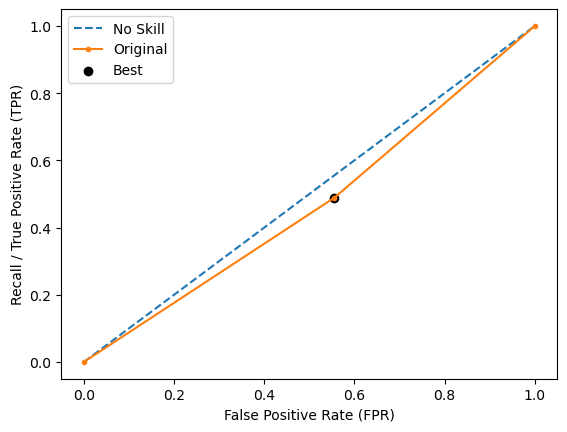

Run 2 - Random State: 1
Test Accuracy: 0.5555555555555556
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3623188405797101
Test F-0.75 Score: 0.38940809968847345
Test F-1 Score: 0.4166666666666667
Test F-1.5 Score: 0.46099290780141844
Test F-2 Score: 0.4901960784313726
Test G-Mean Score: 0.5555555555555556
Best Threshold=0.731
Best Recall=0.444
Best G-Mean=0.444


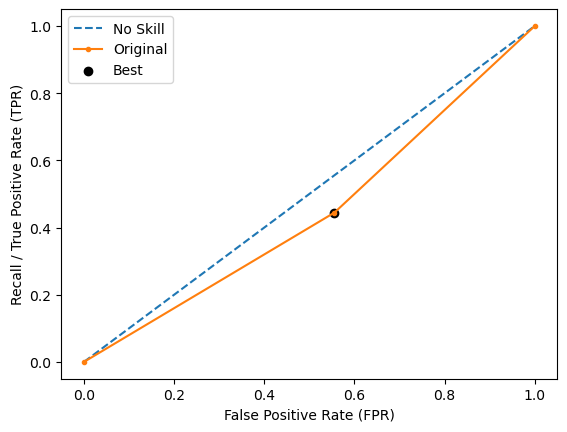

Run 3 - Random State: 2
Test Accuracy: 0.5873015873015873
Test Recall: 0.5
Test F-0.5 Score: 0.36885245901639346
Test F-0.75 Score: 0.38927335640138405
Test F-1 Score: 0.40909090909090906
Test F-1.5 Score: 0.43984962406015043
Test F-2 Score: 0.45918367346938777
Test G-Mean Score: 0.557773351022717
Best Threshold=0.731
Best Recall=0.378
Best G-Mean=0.435


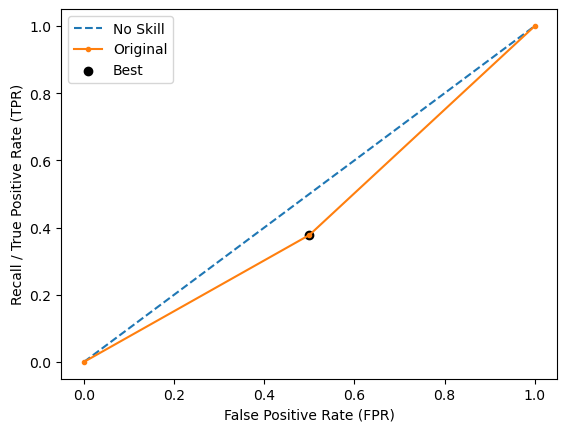

Run 4 - Random State: 3
Test Accuracy: 0.5714285714285714
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.38732394366197187
Test F-0.75 Score: 0.41793313069908816
Test F-1 Score: 0.4489795918367347
Test F-1.5 Score: 0.5000000000000001
Test F-2 Score: 0.5339805825242719
Test G-Mean Score: 0.582671582316751
Best Threshold=0.731
Best Recall=0.444
Best G-Mean=0.416


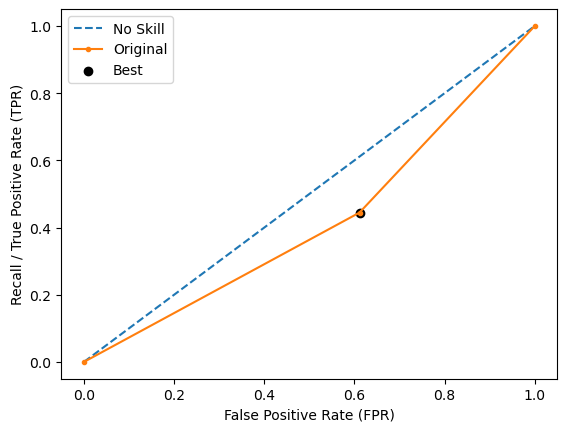

Run 5 - Random State: 4
Test Accuracy: 0.4603174603174603
Test Recall: 0.5
Test F-0.5 Score: 0.2922077922077922
Test F-0.75 Score: 0.31869688385269124
Test F-1 Score: 0.3461538461538462
Test F-1.5 Score: 0.3926174496644295
Test F-2 Score: 0.4245283018867924
Test G-Mean Score: 0.4714045207910317
Best Threshold=0.731
Best Recall=0.556
Best G-Mean=0.527


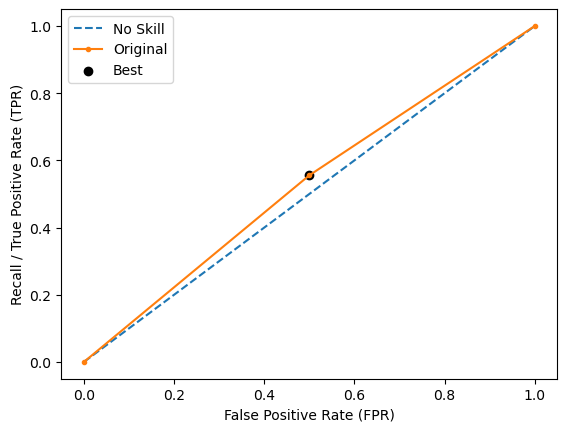

Ave Test Accuracy: 0.5396825396825398
Stdev Test Accuracy: 0.050194883494736185
Ave Test Recall: 0.5444444444444445
Stdev Test Recall: 0.04648111258522644
Ave Test F-0.5 Score: 0.350633757778105
Stdev Test F-0.5 Score: 0.0363831751054811
Ave Test F-0.75 Score: 0.37724627038945496
Stdev Test F-0.75 Score: 0.036796859085945155
Ave Test F-1 Score: 0.40417820274963134
Stdev Test F-1 Score: 0.03732138869103282
Ave Test F-1.5 Score: 0.4483471687189929
Stdev Test F-1.5 Score: 0.03874901492958533
Ave Test F-2 Score: 0.47773157341621114
Stdev Test F-2 Score: 0.040321070691936224
Ave Test G-mean: 0.5400550357886048
Stdev Test G-mean: 0.04223414010689719
Ave Test Specificity: 0.5377777777777778
Stdev Test Specificity: 0.06554613868334502
Ave Test Precision: 0.32230635430350796
Ave Test NPV: 0.745434634123455
Ave Runtime: 0.09459996223449707


In [183]:
ld_t04_adaboost_gs, ld_t04_adaboost_be, ld_t04_adaboost_model_info, ld_t04_adaboost_metrics_df = adaboost_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 15 candidates, totalling 150 fits
Learning rate set to 0.004014
0:	learn: 0.6922622	total: 2.05ms	remaining: 2.05s
1:	learn: 0.6908699	total: 3.63ms	remaining: 1.81s
2:	learn: 0.6893220	total: 4.98ms	remaining: 1.65s
3:	learn: 0.6877903	total: 6.53ms	remaining: 1.63s
4:	learn: 0.6864016	total: 7.86ms	remaining: 1.56s
5:	learn: 0.6848225	total: 9.38ms	remaining: 1.55s
6:	learn: 0.6834576	total: 10.9ms	remaining: 1.54s
7:	learn: 0.6814453	total: 12.5ms	remaining: 1.55s
8:	learn: 0.6800398	total: 14.2ms	remaining: 1.56s
9:	learn: 0.6792561	total: 15.9ms	remaining: 1.57s
10:	learn: 0.6777793	total: 17.4ms	remaining: 1.57s
11:	learn: 0.6764433	total: 19ms	remaining: 1.56s
12:	learn: 0.6750190	total: 20.6ms	remaining: 1.56s
13:	learn: 0.6735036	total: 22.2ms	remaining: 1.57s
14:	learn: 0.6722433	total: 23.7ms	remaining: 1.56s
15:	learn: 0.6704923	total: 25.1ms	remaining: 1.54s
16:	learn: 0.6687646	total: 26.4ms	remaining: 1.52s
17:	learn: 0.6669481	total: 27.9ms	

258:	learn: 0.4356014	total: 379ms	remaining: 1.08s
259:	learn: 0.4351497	total: 381ms	remaining: 1.08s
260:	learn: 0.4344103	total: 382ms	remaining: 1.08s
261:	learn: 0.4335721	total: 384ms	remaining: 1.08s
262:	learn: 0.4327845	total: 385ms	remaining: 1.08s
263:	learn: 0.4322113	total: 386ms	remaining: 1.08s
264:	learn: 0.4316939	total: 388ms	remaining: 1.07s
265:	learn: 0.4312247	total: 389ms	remaining: 1.07s
266:	learn: 0.4303362	total: 391ms	remaining: 1.07s
267:	learn: 0.4299426	total: 392ms	remaining: 1.07s
268:	learn: 0.4292206	total: 393ms	remaining: 1.07s
269:	learn: 0.4288603	total: 394ms	remaining: 1.07s
270:	learn: 0.4284985	total: 396ms	remaining: 1.06s
271:	learn: 0.4278902	total: 397ms	remaining: 1.06s
272:	learn: 0.4270872	total: 398ms	remaining: 1.06s
273:	learn: 0.4264639	total: 400ms	remaining: 1.06s
274:	learn: 0.4258702	total: 401ms	remaining: 1.06s
275:	learn: 0.4253489	total: 403ms	remaining: 1.06s
276:	learn: 0.4247116	total: 404ms	remaining: 1.05s
277:	learn: 

539:	learn: 0.2948513	total: 761ms	remaining: 648ms
540:	learn: 0.2945651	total: 763ms	remaining: 647ms
541:	learn: 0.2941807	total: 764ms	remaining: 646ms
542:	learn: 0.2938662	total: 765ms	remaining: 644ms
543:	learn: 0.2935865	total: 767ms	remaining: 643ms
544:	learn: 0.2933486	total: 768ms	remaining: 642ms
545:	learn: 0.2929251	total: 770ms	remaining: 640ms
546:	learn: 0.2924452	total: 771ms	remaining: 639ms
547:	learn: 0.2921187	total: 773ms	remaining: 637ms
548:	learn: 0.2915977	total: 774ms	remaining: 636ms
549:	learn: 0.2909016	total: 775ms	remaining: 634ms
550:	learn: 0.2906789	total: 777ms	remaining: 633ms
551:	learn: 0.2903956	total: 778ms	remaining: 632ms
552:	learn: 0.2899920	total: 780ms	remaining: 630ms
553:	learn: 0.2897067	total: 781ms	remaining: 629ms
554:	learn: 0.2895252	total: 783ms	remaining: 628ms
555:	learn: 0.2893043	total: 784ms	remaining: 626ms
556:	learn: 0.2888928	total: 786ms	remaining: 625ms
557:	learn: 0.2882818	total: 787ms	remaining: 624ms
558:	learn: 

812:	learn: 0.2116745	total: 1.16s	remaining: 266ms
813:	learn: 0.2115433	total: 1.16s	remaining: 264ms
814:	learn: 0.2113940	total: 1.16s	remaining: 263ms
815:	learn: 0.2110851	total: 1.16s	remaining: 262ms
816:	learn: 0.2108905	total: 1.16s	remaining: 260ms
817:	learn: 0.2106532	total: 1.16s	remaining: 259ms
818:	learn: 0.2103251	total: 1.16s	remaining: 257ms
819:	learn: 0.2101522	total: 1.17s	remaining: 256ms
820:	learn: 0.2100345	total: 1.17s	remaining: 254ms
821:	learn: 0.2096705	total: 1.17s	remaining: 253ms
822:	learn: 0.2094737	total: 1.17s	remaining: 252ms
823:	learn: 0.2090853	total: 1.17s	remaining: 250ms
824:	learn: 0.2088732	total: 1.17s	remaining: 249ms
825:	learn: 0.2086184	total: 1.17s	remaining: 247ms
826:	learn: 0.2082867	total: 1.18s	remaining: 246ms
827:	learn: 0.2080296	total: 1.18s	remaining: 245ms
828:	learn: 0.2078908	total: 1.18s	remaining: 243ms
829:	learn: 0.2075661	total: 1.18s	remaining: 242ms
830:	learn: 0.2073106	total: 1.18s	remaining: 241ms
831:	learn: 

75:	learn: 0.5967072	total: 95.2ms	remaining: 1.16s
76:	learn: 0.5951911	total: 96.7ms	remaining: 1.16s
77:	learn: 0.5943979	total: 98.2ms	remaining: 1.16s
78:	learn: 0.5933323	total: 99.5ms	remaining: 1.16s
79:	learn: 0.5920758	total: 101ms	remaining: 1.16s
80:	learn: 0.5908808	total: 102ms	remaining: 1.16s
81:	learn: 0.5891720	total: 104ms	remaining: 1.16s
82:	learn: 0.5876575	total: 105ms	remaining: 1.16s
83:	learn: 0.5863352	total: 106ms	remaining: 1.16s
84:	learn: 0.5855541	total: 107ms	remaining: 1.16s
85:	learn: 0.5845974	total: 109ms	remaining: 1.16s
86:	learn: 0.5833397	total: 110ms	remaining: 1.15s
87:	learn: 0.5824111	total: 111ms	remaining: 1.15s
88:	learn: 0.5811394	total: 113ms	remaining: 1.15s
89:	learn: 0.5795505	total: 114ms	remaining: 1.15s
90:	learn: 0.5781309	total: 115ms	remaining: 1.15s
91:	learn: 0.5769425	total: 117ms	remaining: 1.15s
92:	learn: 0.5758937	total: 118ms	remaining: 1.15s
93:	learn: 0.5746280	total: 119ms	remaining: 1.15s
94:	learn: 0.5740258	total:

353:	learn: 0.3791609	total: 480ms	remaining: 875ms
354:	learn: 0.3788803	total: 481ms	remaining: 874ms
355:	learn: 0.3781858	total: 483ms	remaining: 873ms
356:	learn: 0.3776355	total: 484ms	remaining: 872ms
357:	learn: 0.3770956	total: 485ms	remaining: 871ms
358:	learn: 0.3765384	total: 487ms	remaining: 869ms
359:	learn: 0.3761395	total: 488ms	remaining: 868ms
360:	learn: 0.3758089	total: 490ms	remaining: 867ms
361:	learn: 0.3751652	total: 491ms	remaining: 866ms
362:	learn: 0.3744470	total: 493ms	remaining: 864ms
363:	learn: 0.3741462	total: 494ms	remaining: 863ms
364:	learn: 0.3732781	total: 495ms	remaining: 862ms
365:	learn: 0.3726203	total: 497ms	remaining: 860ms
366:	learn: 0.3723825	total: 498ms	remaining: 859ms
367:	learn: 0.3720170	total: 499ms	remaining: 857ms
368:	learn: 0.3713671	total: 501ms	remaining: 856ms
369:	learn: 0.3711038	total: 502ms	remaining: 855ms
370:	learn: 0.3704537	total: 503ms	remaining: 853ms
371:	learn: 0.3699277	total: 505ms	remaining: 852ms
372:	learn: 

654:	learn: 0.2555261	total: 875ms	remaining: 461ms
655:	learn: 0.2550506	total: 876ms	remaining: 460ms
656:	learn: 0.2547206	total: 878ms	remaining: 458ms
657:	learn: 0.2543082	total: 879ms	remaining: 457ms
658:	learn: 0.2539577	total: 881ms	remaining: 456ms
659:	learn: 0.2537084	total: 882ms	remaining: 454ms
660:	learn: 0.2533648	total: 883ms	remaining: 453ms
661:	learn: 0.2532587	total: 884ms	remaining: 452ms
662:	learn: 0.2529511	total: 886ms	remaining: 450ms
663:	learn: 0.2527342	total: 887ms	remaining: 449ms
664:	learn: 0.2524872	total: 888ms	remaining: 448ms
665:	learn: 0.2521724	total: 890ms	remaining: 446ms
666:	learn: 0.2520131	total: 891ms	remaining: 445ms
667:	learn: 0.2517440	total: 892ms	remaining: 443ms
668:	learn: 0.2511942	total: 894ms	remaining: 442ms
669:	learn: 0.2509487	total: 895ms	remaining: 441ms
670:	learn: 0.2507367	total: 896ms	remaining: 439ms
671:	learn: 0.2505039	total: 898ms	remaining: 438ms
672:	learn: 0.2502852	total: 899ms	remaining: 437ms
673:	learn: 

952:	learn: 0.1788921	total: 1.26s	remaining: 62.1ms
953:	learn: 0.1787193	total: 1.26s	remaining: 60.7ms
954:	learn: 0.1784742	total: 1.26s	remaining: 59.4ms
955:	learn: 0.1781269	total: 1.26s	remaining: 58.1ms
956:	learn: 0.1779345	total: 1.26s	remaining: 56.8ms
957:	learn: 0.1777329	total: 1.26s	remaining: 55.4ms
958:	learn: 0.1776309	total: 1.26s	remaining: 54.1ms
959:	learn: 0.1772947	total: 1.27s	remaining: 52.8ms
960:	learn: 0.1770463	total: 1.27s	remaining: 51.5ms
961:	learn: 0.1768445	total: 1.27s	remaining: 50.2ms
962:	learn: 0.1766454	total: 1.27s	remaining: 48.8ms
963:	learn: 0.1765372	total: 1.27s	remaining: 47.5ms
964:	learn: 0.1763891	total: 1.27s	remaining: 46.2ms
965:	learn: 0.1763290	total: 1.27s	remaining: 44.9ms
966:	learn: 0.1760849	total: 1.28s	remaining: 43.6ms
967:	learn: 0.1759138	total: 1.28s	remaining: 42.2ms
968:	learn: 0.1756938	total: 1.28s	remaining: 40.9ms
969:	learn: 0.1754410	total: 1.28s	remaining: 39.6ms
970:	learn: 0.1751844	total: 1.28s	remaining: 

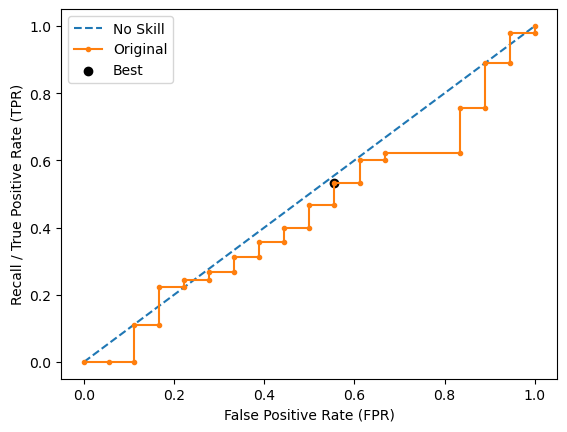

Learning rate set to 0.004045
0:	learn: 0.6916216	total: 3.03ms	remaining: 3.02s
1:	learn: 0.6900326	total: 6.6ms	remaining: 3.29s
2:	learn: 0.6872702	total: 11ms	remaining: 3.67s
3:	learn: 0.6863299	total: 14.8ms	remaining: 3.68s
4:	learn: 0.6842301	total: 18.3ms	remaining: 3.64s
5:	learn: 0.6821946	total: 22.5ms	remaining: 3.73s
6:	learn: 0.6809469	total: 24.4ms	remaining: 3.46s
7:	learn: 0.6795510	total: 29.5ms	remaining: 3.66s
8:	learn: 0.6781998	total: 34.3ms	remaining: 3.78s
9:	learn: 0.6766095	total: 38.5ms	remaining: 3.81s
10:	learn: 0.6751526	total: 41.4ms	remaining: 3.72s
11:	learn: 0.6736040	total: 44.8ms	remaining: 3.69s
12:	learn: 0.6717088	total: 48ms	remaining: 3.64s
13:	learn: 0.6697264	total: 51.3ms	remaining: 3.61s
14:	learn: 0.6691700	total: 52.7ms	remaining: 3.46s
15:	learn: 0.6679796	total: 55.4ms	remaining: 3.41s
16:	learn: 0.6667344	total: 59.1ms	remaining: 3.41s
17:	learn: 0.6660555	total: 61ms	remaining: 3.33s
18:	learn: 0.6645383	total: 64ms	remaining: 3.31s
1

283:	learn: 0.4018447	total: 390ms	remaining: 982ms
284:	learn: 0.4011190	total: 391ms	remaining: 981ms
285:	learn: 0.4006733	total: 393ms	remaining: 980ms
286:	learn: 0.4000579	total: 394ms	remaining: 978ms
287:	learn: 0.3996155	total: 395ms	remaining: 977ms
288:	learn: 0.3988140	total: 396ms	remaining: 975ms
289:	learn: 0.3980626	total: 398ms	remaining: 973ms
290:	learn: 0.3975317	total: 399ms	remaining: 971ms
291:	learn: 0.3966236	total: 400ms	remaining: 970ms
292:	learn: 0.3959187	total: 401ms	remaining: 968ms
293:	learn: 0.3953779	total: 403ms	remaining: 967ms
294:	learn: 0.3949444	total: 404ms	remaining: 965ms
295:	learn: 0.3943116	total: 405ms	remaining: 964ms
296:	learn: 0.3934034	total: 407ms	remaining: 962ms
297:	learn: 0.3927570	total: 408ms	remaining: 960ms
298:	learn: 0.3918609	total: 409ms	remaining: 958ms
299:	learn: 0.3914441	total: 410ms	remaining: 957ms
300:	learn: 0.3909533	total: 411ms	remaining: 955ms
301:	learn: 0.3900940	total: 412ms	remaining: 953ms
302:	learn: 

576:	learn: 0.2659470	total: 767ms	remaining: 562ms
577:	learn: 0.2657168	total: 768ms	remaining: 561ms
578:	learn: 0.2652447	total: 769ms	remaining: 559ms
579:	learn: 0.2648292	total: 771ms	remaining: 558ms
580:	learn: 0.2644572	total: 772ms	remaining: 557ms
581:	learn: 0.2640629	total: 773ms	remaining: 555ms
582:	learn: 0.2637009	total: 775ms	remaining: 554ms
583:	learn: 0.2633204	total: 776ms	remaining: 553ms
584:	learn: 0.2629869	total: 777ms	remaining: 551ms
585:	learn: 0.2626739	total: 778ms	remaining: 550ms
586:	learn: 0.2622138	total: 780ms	remaining: 549ms
587:	learn: 0.2619528	total: 781ms	remaining: 547ms
588:	learn: 0.2615484	total: 782ms	remaining: 546ms
589:	learn: 0.2609337	total: 783ms	remaining: 544ms
590:	learn: 0.2607959	total: 785ms	remaining: 543ms
591:	learn: 0.2603264	total: 786ms	remaining: 542ms
592:	learn: 0.2601372	total: 787ms	remaining: 540ms
593:	learn: 0.2598595	total: 789ms	remaining: 539ms
594:	learn: 0.2596726	total: 790ms	remaining: 538ms
595:	learn: 

871:	learn: 0.1838591	total: 1.15s	remaining: 169ms
872:	learn: 0.1835705	total: 1.15s	remaining: 168ms
873:	learn: 0.1833682	total: 1.15s	remaining: 166ms
874:	learn: 0.1831567	total: 1.16s	remaining: 165ms
875:	learn: 0.1829344	total: 1.16s	remaining: 164ms
876:	learn: 0.1826848	total: 1.16s	remaining: 162ms
877:	learn: 0.1823351	total: 1.16s	remaining: 161ms
878:	learn: 0.1822261	total: 1.16s	remaining: 160ms
879:	learn: 0.1820782	total: 1.16s	remaining: 159ms
880:	learn: 0.1817891	total: 1.16s	remaining: 157ms
881:	learn: 0.1815520	total: 1.17s	remaining: 156ms
882:	learn: 0.1812644	total: 1.17s	remaining: 155ms
883:	learn: 0.1810011	total: 1.17s	remaining: 153ms
884:	learn: 0.1808370	total: 1.17s	remaining: 152ms
885:	learn: 0.1805079	total: 1.17s	remaining: 151ms
886:	learn: 0.1803412	total: 1.17s	remaining: 149ms
887:	learn: 0.1800799	total: 1.17s	remaining: 148ms
888:	learn: 0.1797755	total: 1.17s	remaining: 147ms
889:	learn: 0.1795638	total: 1.18s	remaining: 145ms
890:	learn: 

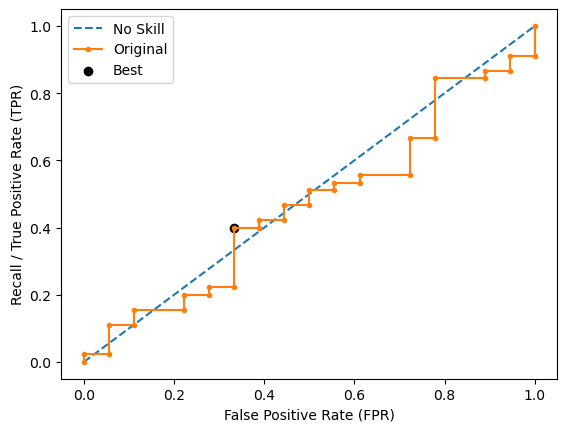

Learning rate set to 0.003967
0:	learn: 0.6914937	total: 1.81ms	remaining: 1.81s
1:	learn: 0.6898486	total: 3.56ms	remaining: 1.77s
2:	learn: 0.6889125	total: 5.38ms	remaining: 1.79s
3:	learn: 0.6879977	total: 6.82ms	remaining: 1.7s
4:	learn: 0.6866012	total: 8.24ms	remaining: 1.64s
5:	learn: 0.6851513	total: 9.7ms	remaining: 1.61s
6:	learn: 0.6843692	total: 12.3ms	remaining: 1.75s
7:	learn: 0.6828914	total: 13.5ms	remaining: 1.67s
8:	learn: 0.6811770	total: 14.7ms	remaining: 1.62s
9:	learn: 0.6796611	total: 15.9ms	remaining: 1.58s
10:	learn: 0.6781970	total: 27.3ms	remaining: 2.45s
11:	learn: 0.6767873	total: 30.8ms	remaining: 2.54s
12:	learn: 0.6754937	total: 34ms	remaining: 2.58s
13:	learn: 0.6741288	total: 37.1ms	remaining: 2.61s
14:	learn: 0.6730360	total: 40.8ms	remaining: 2.68s
15:	learn: 0.6715688	total: 43.8ms	remaining: 2.69s
16:	learn: 0.6698021	total: 47.2ms	remaining: 2.73s
17:	learn: 0.6688030	total: 50.1ms	remaining: 2.73s
18:	learn: 0.6679100	total: 52.7ms	remaining: 2.

228:	learn: 0.4623205	total: 381ms	remaining: 1.28s
229:	learn: 0.4615837	total: 382ms	remaining: 1.28s
230:	learn: 0.4605044	total: 383ms	remaining: 1.28s
231:	learn: 0.4597792	total: 385ms	remaining: 1.27s
232:	learn: 0.4593947	total: 386ms	remaining: 1.27s
233:	learn: 0.4587326	total: 387ms	remaining: 1.27s
234:	learn: 0.4579248	total: 388ms	remaining: 1.26s
235:	learn: 0.4577144	total: 389ms	remaining: 1.26s
236:	learn: 0.4569112	total: 391ms	remaining: 1.26s
237:	learn: 0.4559722	total: 392ms	remaining: 1.25s
238:	learn: 0.4549880	total: 393ms	remaining: 1.25s
239:	learn: 0.4540797	total: 394ms	remaining: 1.25s
240:	learn: 0.4529591	total: 396ms	remaining: 1.25s
241:	learn: 0.4522395	total: 397ms	remaining: 1.24s
242:	learn: 0.4518497	total: 398ms	remaining: 1.24s
243:	learn: 0.4511096	total: 400ms	remaining: 1.24s
244:	learn: 0.4500838	total: 401ms	remaining: 1.24s
245:	learn: 0.4493411	total: 403ms	remaining: 1.23s
246:	learn: 0.4482100	total: 404ms	remaining: 1.23s
247:	learn: 

458:	learn: 0.3313920	total: 672ms	remaining: 792ms
459:	learn: 0.3309761	total: 674ms	remaining: 791ms
460:	learn: 0.3307714	total: 675ms	remaining: 789ms
461:	learn: 0.3304709	total: 677ms	remaining: 788ms
462:	learn: 0.3300506	total: 678ms	remaining: 786ms
463:	learn: 0.3292270	total: 679ms	remaining: 785ms
464:	learn: 0.3289040	total: 680ms	remaining: 783ms
465:	learn: 0.3284744	total: 682ms	remaining: 781ms
466:	learn: 0.3279582	total: 683ms	remaining: 780ms
467:	learn: 0.3276556	total: 684ms	remaining: 778ms
468:	learn: 0.3272007	total: 686ms	remaining: 776ms
469:	learn: 0.3265717	total: 687ms	remaining: 775ms
470:	learn: 0.3261385	total: 688ms	remaining: 773ms
471:	learn: 0.3256825	total: 689ms	remaining: 771ms
472:	learn: 0.3251562	total: 691ms	remaining: 769ms
473:	learn: 0.3247766	total: 692ms	remaining: 768ms
474:	learn: 0.3244945	total: 693ms	remaining: 766ms
475:	learn: 0.3238944	total: 694ms	remaining: 764ms
476:	learn: 0.3235062	total: 696ms	remaining: 763ms
477:	learn: 

668:	learn: 0.2544762	total: 950ms	remaining: 470ms
669:	learn: 0.2542390	total: 951ms	remaining: 469ms
670:	learn: 0.2540722	total: 953ms	remaining: 467ms
671:	learn: 0.2538786	total: 955ms	remaining: 466ms
672:	learn: 0.2537529	total: 957ms	remaining: 465ms
673:	learn: 0.2535778	total: 958ms	remaining: 464ms
674:	learn: 0.2532589	total: 960ms	remaining: 462ms
675:	learn: 0.2530867	total: 961ms	remaining: 461ms
676:	learn: 0.2527824	total: 963ms	remaining: 459ms
677:	learn: 0.2524878	total: 964ms	remaining: 458ms
678:	learn: 0.2519013	total: 966ms	remaining: 457ms
679:	learn: 0.2517661	total: 967ms	remaining: 455ms
680:	learn: 0.2512176	total: 969ms	remaining: 454ms
681:	learn: 0.2509657	total: 970ms	remaining: 452ms
682:	learn: 0.2507122	total: 971ms	remaining: 451ms
683:	learn: 0.2504097	total: 973ms	remaining: 449ms
684:	learn: 0.2500671	total: 974ms	remaining: 448ms
685:	learn: 0.2498534	total: 975ms	remaining: 447ms
686:	learn: 0.2495393	total: 977ms	remaining: 445ms
687:	learn: 

888:	learn: 0.1960381	total: 1.24s	remaining: 155ms
889:	learn: 0.1958347	total: 1.25s	remaining: 154ms
890:	learn: 0.1955958	total: 1.25s	remaining: 152ms
891:	learn: 0.1953217	total: 1.25s	remaining: 151ms
892:	learn: 0.1950241	total: 1.25s	remaining: 150ms
893:	learn: 0.1948191	total: 1.25s	remaining: 148ms
894:	learn: 0.1946110	total: 1.25s	remaining: 147ms
895:	learn: 0.1942689	total: 1.25s	remaining: 145ms
896:	learn: 0.1941734	total: 1.25s	remaining: 144ms
897:	learn: 0.1939562	total: 1.25s	remaining: 143ms
898:	learn: 0.1936389	total: 1.26s	remaining: 141ms
899:	learn: 0.1933630	total: 1.26s	remaining: 140ms
900:	learn: 0.1930135	total: 1.26s	remaining: 138ms
901:	learn: 0.1928266	total: 1.26s	remaining: 137ms
902:	learn: 0.1926290	total: 1.26s	remaining: 136ms
903:	learn: 0.1924611	total: 1.26s	remaining: 134ms
904:	learn: 0.1923207	total: 1.26s	remaining: 133ms
905:	learn: 0.1919978	total: 1.27s	remaining: 131ms
906:	learn: 0.1917829	total: 1.27s	remaining: 130ms
907:	learn: 

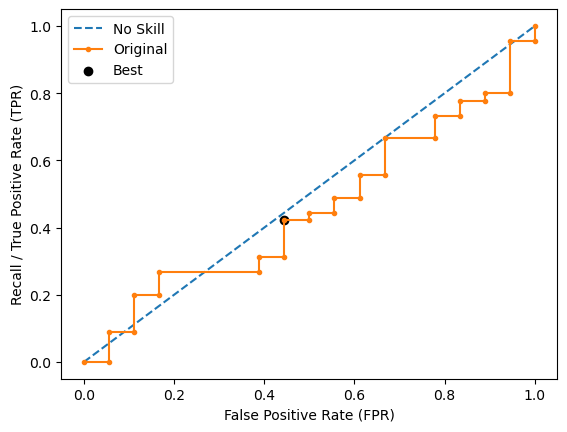

Learning rate set to 0.004151
0:	learn: 0.6915063	total: 2.2ms	remaining: 2.2s
1:	learn: 0.6898084	total: 3.81ms	remaining: 1.9s
2:	learn: 0.6877833	total: 5.64ms	remaining: 1.88s
3:	learn: 0.6869831	total: 7.69ms	remaining: 1.92s
4:	learn: 0.6851878	total: 9.57ms	remaining: 1.9s
5:	learn: 0.6836429	total: 11.5ms	remaining: 1.91s
6:	learn: 0.6823909	total: 13.2ms	remaining: 1.88s
7:	learn: 0.6815719	total: 15.2ms	remaining: 1.88s
8:	learn: 0.6806404	total: 17ms	remaining: 1.87s
9:	learn: 0.6791800	total: 18.7ms	remaining: 1.85s
10:	learn: 0.6782041	total: 20.5ms	remaining: 1.84s
11:	learn: 0.6772437	total: 22.2ms	remaining: 1.83s
12:	learn: 0.6758950	total: 23.9ms	remaining: 1.82s
13:	learn: 0.6736319	total: 25.5ms	remaining: 1.8s
14:	learn: 0.6721848	total: 26.9ms	remaining: 1.76s
15:	learn: 0.6705498	total: 28.3ms	remaining: 1.74s
16:	learn: 0.6693430	total: 29.6ms	remaining: 1.71s
17:	learn: 0.6682872	total: 30.9ms	remaining: 1.69s
18:	learn: 0.6672796	total: 32.2ms	remaining: 1.66s

306:	learn: 0.4212968	total: 388ms	remaining: 876ms
307:	learn: 0.4208276	total: 390ms	remaining: 876ms
308:	learn: 0.4202677	total: 391ms	remaining: 875ms
309:	learn: 0.4194081	total: 392ms	remaining: 873ms
310:	learn: 0.4190750	total: 393ms	remaining: 872ms
311:	learn: 0.4186738	total: 395ms	remaining: 871ms
312:	learn: 0.4179814	total: 396ms	remaining: 870ms
313:	learn: 0.4177271	total: 398ms	remaining: 869ms
314:	learn: 0.4174299	total: 399ms	remaining: 867ms
315:	learn: 0.4167508	total: 400ms	remaining: 867ms
316:	learn: 0.4163805	total: 402ms	remaining: 866ms
317:	learn: 0.4158162	total: 403ms	remaining: 865ms
318:	learn: 0.4152330	total: 405ms	remaining: 864ms
319:	learn: 0.4147907	total: 406ms	remaining: 863ms
320:	learn: 0.4145135	total: 407ms	remaining: 862ms
321:	learn: 0.4139556	total: 409ms	remaining: 861ms
322:	learn: 0.4133158	total: 410ms	remaining: 860ms
323:	learn: 0.4126838	total: 411ms	remaining: 859ms
324:	learn: 0.4120399	total: 413ms	remaining: 857ms
325:	learn: 

579:	learn: 0.2975906	total: 767ms	remaining: 556ms
580:	learn: 0.2972429	total: 769ms	remaining: 555ms
581:	learn: 0.2967115	total: 770ms	remaining: 553ms
582:	learn: 0.2961482	total: 772ms	remaining: 552ms
583:	learn: 0.2958114	total: 773ms	remaining: 551ms
584:	learn: 0.2955094	total: 774ms	remaining: 549ms
585:	learn: 0.2950001	total: 776ms	remaining: 548ms
586:	learn: 0.2948481	total: 777ms	remaining: 547ms
587:	learn: 0.2942592	total: 779ms	remaining: 546ms
588:	learn: 0.2939159	total: 780ms	remaining: 544ms
589:	learn: 0.2936093	total: 781ms	remaining: 543ms
590:	learn: 0.2931262	total: 783ms	remaining: 542ms
591:	learn: 0.2927578	total: 784ms	remaining: 540ms
592:	learn: 0.2925575	total: 786ms	remaining: 539ms
593:	learn: 0.2921287	total: 787ms	remaining: 538ms
594:	learn: 0.2918863	total: 788ms	remaining: 536ms
595:	learn: 0.2916576	total: 789ms	remaining: 535ms
596:	learn: 0.2913259	total: 791ms	remaining: 534ms
597:	learn: 0.2909906	total: 792ms	remaining: 533ms
598:	learn: 

868:	learn: 0.2131448	total: 1.15s	remaining: 173ms
869:	learn: 0.2130645	total: 1.15s	remaining: 172ms
870:	learn: 0.2127427	total: 1.15s	remaining: 170ms
871:	learn: 0.2123867	total: 1.15s	remaining: 169ms
872:	learn: 0.2121961	total: 1.15s	remaining: 168ms
873:	learn: 0.2120983	total: 1.15s	remaining: 166ms
874:	learn: 0.2117939	total: 1.16s	remaining: 165ms
875:	learn: 0.2117105	total: 1.16s	remaining: 164ms
876:	learn: 0.2115827	total: 1.16s	remaining: 162ms
877:	learn: 0.2112892	total: 1.16s	remaining: 161ms
878:	learn: 0.2108932	total: 1.16s	remaining: 160ms
879:	learn: 0.2105100	total: 1.16s	remaining: 158ms
880:	learn: 0.2103032	total: 1.16s	remaining: 157ms
881:	learn: 0.2099416	total: 1.16s	remaining: 156ms
882:	learn: 0.2096978	total: 1.17s	remaining: 154ms
883:	learn: 0.2096007	total: 1.17s	remaining: 153ms
884:	learn: 0.2093977	total: 1.17s	remaining: 152ms
885:	learn: 0.2090761	total: 1.17s	remaining: 150ms
886:	learn: 0.2089720	total: 1.17s	remaining: 149ms
887:	learn: 

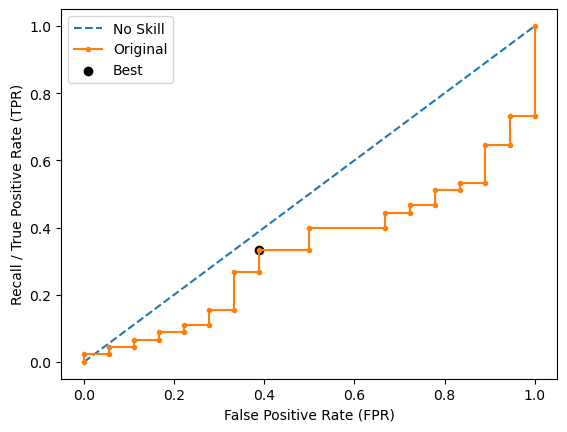

Learning rate set to 0.004061
0:	learn: 0.6922409	total: 1.36ms	remaining: 1.36s
1:	learn: 0.6903487	total: 2.65ms	remaining: 1.32s
2:	learn: 0.6887256	total: 3.87ms	remaining: 1.28s
3:	learn: 0.6873285	total: 5.05ms	remaining: 1.26s
4:	learn: 0.6862105	total: 6.19ms	remaining: 1.23s
5:	learn: 0.6853074	total: 7.27ms	remaining: 1.2s
6:	learn: 0.6839810	total: 8.36ms	remaining: 1.19s
7:	learn: 0.6820437	total: 9.59ms	remaining: 1.19s
8:	learn: 0.6803939	total: 10.7ms	remaining: 1.18s
9:	learn: 0.6798496	total: 11.9ms	remaining: 1.18s
10:	learn: 0.6785086	total: 13ms	remaining: 1.17s
11:	learn: 0.6768240	total: 14.3ms	remaining: 1.18s
12:	learn: 0.6764305	total: 15.1ms	remaining: 1.14s
13:	learn: 0.6745854	total: 16.2ms	remaining: 1.14s
14:	learn: 0.6732081	total: 17.3ms	remaining: 1.14s
15:	learn: 0.6712362	total: 18.5ms	remaining: 1.14s
16:	learn: 0.6704748	total: 19.9ms	remaining: 1.15s
17:	learn: 0.6689128	total: 21.2ms	remaining: 1.16s
18:	learn: 0.6678482	total: 22ms	remaining: 1.1

305:	learn: 0.4037916	total: 391ms	remaining: 886ms
306:	learn: 0.4031019	total: 392ms	remaining: 885ms
307:	learn: 0.4025760	total: 394ms	remaining: 885ms
308:	learn: 0.4015790	total: 395ms	remaining: 884ms
309:	learn: 0.4012654	total: 397ms	remaining: 884ms
310:	learn: 0.4003536	total: 399ms	remaining: 883ms
311:	learn: 0.3996811	total: 400ms	remaining: 882ms
312:	learn: 0.3991615	total: 401ms	remaining: 881ms
313:	learn: 0.3987895	total: 403ms	remaining: 880ms
314:	learn: 0.3979153	total: 404ms	remaining: 879ms
315:	learn: 0.3973297	total: 405ms	remaining: 878ms
316:	learn: 0.3969507	total: 407ms	remaining: 877ms
317:	learn: 0.3963866	total: 408ms	remaining: 876ms
318:	learn: 0.3960619	total: 410ms	remaining: 875ms
319:	learn: 0.3952350	total: 411ms	remaining: 874ms
320:	learn: 0.3946957	total: 412ms	remaining: 872ms
321:	learn: 0.3944419	total: 414ms	remaining: 871ms
322:	learn: 0.3936933	total: 419ms	remaining: 879ms
323:	learn: 0.3932130	total: 421ms	remaining: 878ms
324:	learn: 

587:	learn: 0.2738132	total: 795ms	remaining: 557ms
588:	learn: 0.2733816	total: 797ms	remaining: 556ms
589:	learn: 0.2730638	total: 798ms	remaining: 555ms
590:	learn: 0.2726582	total: 800ms	remaining: 553ms
591:	learn: 0.2722468	total: 801ms	remaining: 552ms
592:	learn: 0.2717383	total: 802ms	remaining: 551ms
593:	learn: 0.2713750	total: 804ms	remaining: 549ms
594:	learn: 0.2712466	total: 805ms	remaining: 548ms
595:	learn: 0.2707450	total: 806ms	remaining: 547ms
596:	learn: 0.2704709	total: 808ms	remaining: 545ms
597:	learn: 0.2701246	total: 809ms	remaining: 544ms
598:	learn: 0.2697766	total: 811ms	remaining: 543ms
599:	learn: 0.2691145	total: 812ms	remaining: 541ms
600:	learn: 0.2688830	total: 814ms	remaining: 540ms
601:	learn: 0.2684027	total: 815ms	remaining: 539ms
602:	learn: 0.2681970	total: 816ms	remaining: 537ms
603:	learn: 0.2679118	total: 818ms	remaining: 536ms
604:	learn: 0.2674017	total: 819ms	remaining: 535ms
605:	learn: 0.2671281	total: 820ms	remaining: 533ms
606:	learn: 

873:	learn: 0.1933118	total: 1.19s	remaining: 172ms
874:	learn: 0.1931164	total: 1.19s	remaining: 170ms
875:	learn: 0.1929332	total: 1.19s	remaining: 169ms
876:	learn: 0.1926608	total: 1.2s	remaining: 168ms
877:	learn: 0.1925288	total: 1.2s	remaining: 166ms
878:	learn: 0.1922701	total: 1.2s	remaining: 165ms
879:	learn: 0.1918977	total: 1.2s	remaining: 164ms
880:	learn: 0.1918177	total: 1.2s	remaining: 162ms
881:	learn: 0.1916376	total: 1.2s	remaining: 161ms
882:	learn: 0.1911959	total: 1.2s	remaining: 159ms
883:	learn: 0.1908767	total: 1.2s	remaining: 158ms
884:	learn: 0.1906841	total: 1.21s	remaining: 157ms
885:	learn: 0.1904613	total: 1.21s	remaining: 155ms
886:	learn: 0.1901820	total: 1.21s	remaining: 154ms
887:	learn: 0.1898548	total: 1.21s	remaining: 152ms
888:	learn: 0.1897778	total: 1.21s	remaining: 151ms
889:	learn: 0.1894870	total: 1.21s	remaining: 150ms
890:	learn: 0.1893292	total: 1.21s	remaining: 148ms
891:	learn: 0.1891342	total: 1.21s	remaining: 147ms
892:	learn: 0.188988

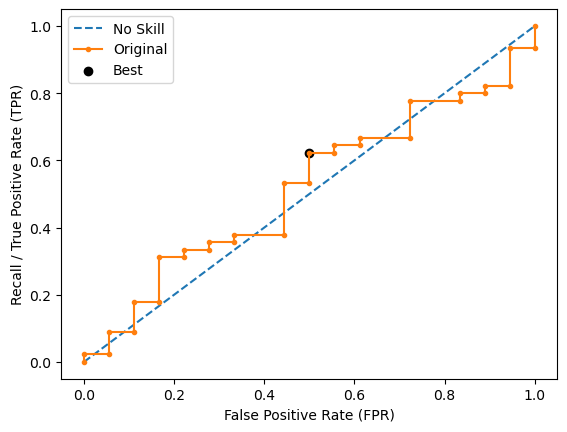

Ave Test Accuracy: 0.546031746031746
Stdev Test Accuracy: 0.05094224297105145
Ave Test Recall: 0.47777777777777775
Stdev Test Recall: 0.06334307917217434
Ave Test F-0.5 Score: 0.3350267548506008
Stdev Test F-0.5 Score: 0.026645163261315857
Ave Test F-0.75 Score: 0.35515142426911617
Stdev Test F-0.75 Score: 0.022196095880392307
Ave Test F-1 Score: 0.37534293388330653
Stdev Test F-1 Score: 0.02183814600756248
Ave Test F-1.5 Score: 0.40808899312594626
Stdev Test F-1.5 Score: 0.030338262794782345
Ave Test F-2 Score: 0.4296243904581997
Stdev Test F-2 Score: 0.03938507580181202
Ave Test G-mean: 0.519437036860554
Stdev Test G-mean: 0.01964120438169667
Ave Test Specificity: 0.5733333333333333
Stdev Test Specificity: 0.09081251885201132
Ave Test Precision: 0.3134077128304632
Ave Test NPV: 0.7320616883116884
Ave Runtime: 1.4690893173217774


In [184]:
ld_t04_catboost_gs, ld_t04_catboost_be, ld_t04_catboost_model_info, ld_t04_catboost_metrics_df = catboost_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1800 candidates, totalling 18000 fits
Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 3, 'resampling': RandomUnderSampler(random_state=0), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5963457780988113
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=3))])
Mean Train Score (Recall) 0.6619104232819154
Std Train Score (Recall) 0.028372272400375754
GridSearchCV Runtime: 24.73787569999695 secs
Run 1 - Random State: 0
Test Accuracy: 0.6349206349206349
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.39215686274509803
Test F-0.75 Score: 0.40160642570281124
Test F-1 Score: 0.41025641025641024
Test F-1.5 Score: 0.42276422764227645
Test F-2 Score: 0.43010752688172044
Test G-Mean Score: 0.5621826951410452
Best Threshold=0.667
Best Re

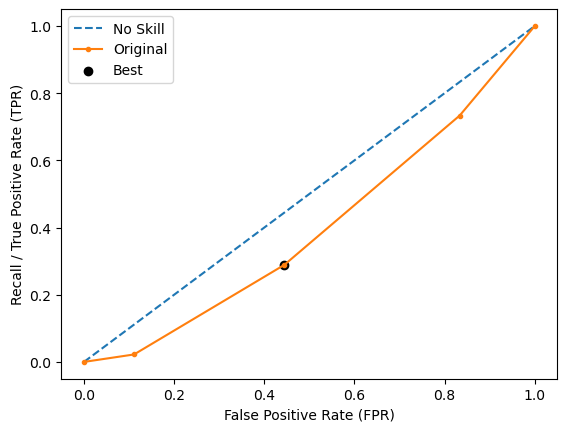

Run 2 - Random State: 1
Test Accuracy: 0.5396825396825397
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.2127659574468085
Test F-0.75 Score: 0.21459227467811157
Test F-1 Score: 0.21621621621621623
Test F-1.5 Score: 0.21848739495798314
Test F-2 Score: 0.21978021978021975
Test G-Mean Score: 0.38490017945975047
Best Threshold=0.667
Best Recall=0.333
Best G-Mean=0.509


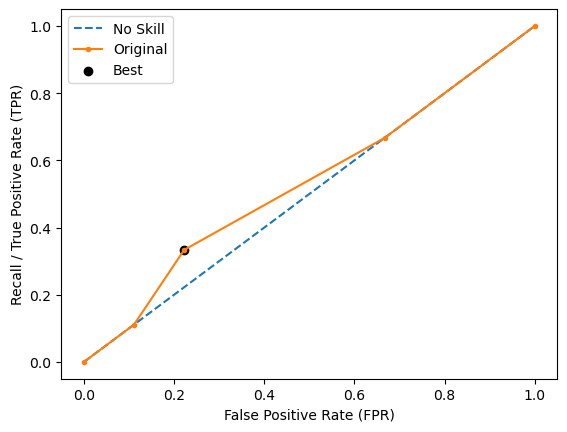

Run 3 - Random State: 2
Test Accuracy: 0.6190476190476191
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.3048780487804878
Test F-0.75 Score: 0.29904306220095694
Test F-1 Score: 0.29411764705882354
Test F-1.5 Score: 0.28761061946902655
Test F-2 Score: 0.2840909090909091
Test G-Mean Score: 0.45812284729085123
Best Threshold=0.667
Best Recall=0.244
Best G-Mean=0.420


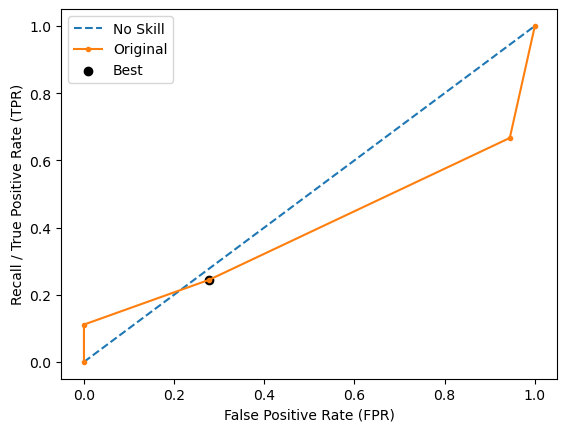

Run 4 - Random State: 3
Test Accuracy: 0.5555555555555556
Test Recall: 0.2777777777777778
Test F-0.5 Score: 0.25510204081632654
Test F-0.75 Score: 0.25933609958506226
Test F-1 Score: 0.2631578947368421
Test F-1.5 Score: 0.26859504132231404
Test F-2 Score: 0.2717391304347826
Test G-Mean Score: 0.43033148291193524
Best Threshold=0.333
Best Recall=0.689
Best G-Mean=0.553


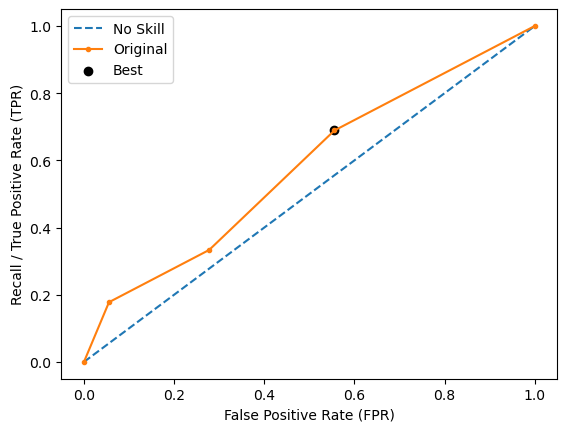

Run 5 - Random State: 4
Test Accuracy: 0.5238095238095238
Test Recall: 0.2222222222222222
Test F-0.5 Score: 0.20408163265306123
Test F-0.75 Score: 0.2074688796680498
Test F-1 Score: 0.2105263157894737
Test F-1.5 Score: 0.2148760330578512
Test F-2 Score: 0.21739130434782608
Test G-Mean Score: 0.37843080813169777
Best Threshold=0.667
Best Recall=0.356
Best G-Mean=0.526


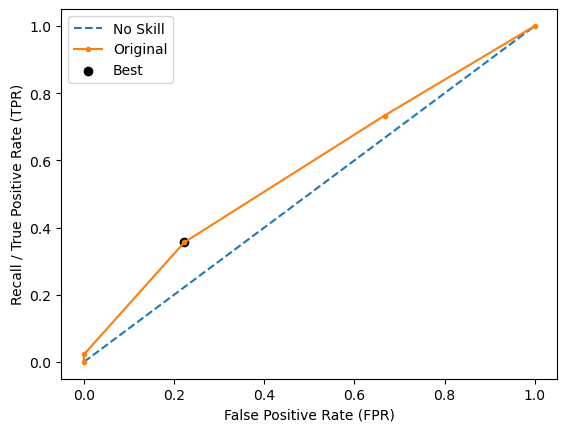

Ave Test Accuracy: 0.5746031746031746
Stdev Test Accuracy: 0.049436226991737886
Ave Test Recall: 0.2888888888888889
Stdev Test Recall: 0.09128709291752768
Ave Test F-0.5 Score: 0.2737969084883564
Stdev Test F-0.5 Score: 0.07731366438188488
Ave Test F-0.75 Score: 0.2764093483669984
Stdev Test F-0.75 Score: 0.07913947785903835
Ave Test F-1 Score: 0.2788548968115531
Stdev Test F-1 Score: 0.08114509296016997
Ave Test F-1.5 Score: 0.2824666632898903
Stdev Test F-1.5 Score: 0.08450462829905615
Ave Test F-2 Score: 0.2846218181070916
Stdev Test F-2 Score: 0.08668435818765116
Ave Test G-mean: 0.44279360258705597
Stdev Test G-mean: 0.07439466268212862
Ave Test Specificity: 0.6888888888888889
Stdev Test Specificity: 0.04444444444444444
Ave Test Precision: 0.2707957393483709
Ave Test NPV: 0.7078440444595813
Ave Runtime: 0.010527801513671876


In [185]:
ld_t04_knn_gs, ld_t04_knn_be, ld_t04_knn_model_info, ld_t04_knn_metrics_df = knn_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1620 candidates, totalling 16200 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.591108738139587
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise

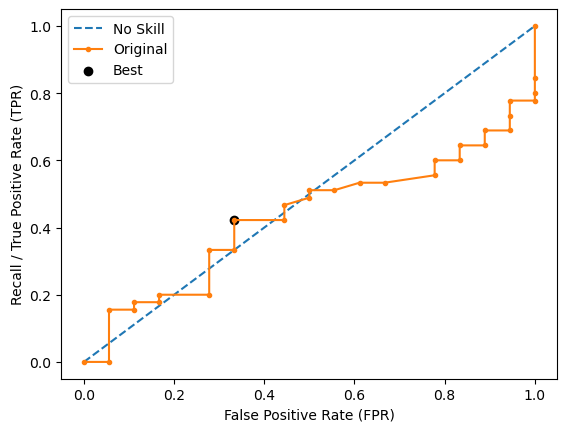

Run 2 - Random State: 1
Test Accuracy: 0.5079365079365079
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.34810126582278483
Test F-0.75 Score: 0.3808864265927977
Test F-1 Score: 0.41509433962264153
Test F-1.5 Score: 0.47350993377483447
Test F-2 Score: 0.5140186915887851
Test G-Mean Score: 0.5340273262532407
Best Threshold=0.484
Best Recall=0.644
Best G-Mean=0.501


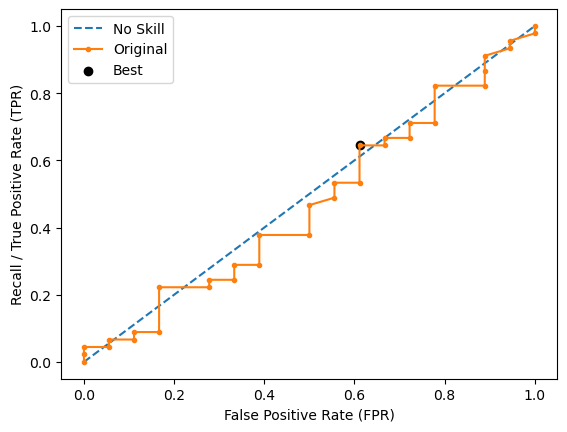

Run 3 - Random State: 2
Test Accuracy: 0.5238095238095238
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.3571428571428571
Test F-0.75 Score: 0.3895184135977337
Test F-1 Score: 0.42307692307692313
Test F-1.5 Score: 0.4798657718120805
Test F-2 Score: 0.5188679245283019
Test G-Mean Score: 0.5465943944999486
Best Threshold=0.582
Best Recall=0.356
Best G-Mean=0.526


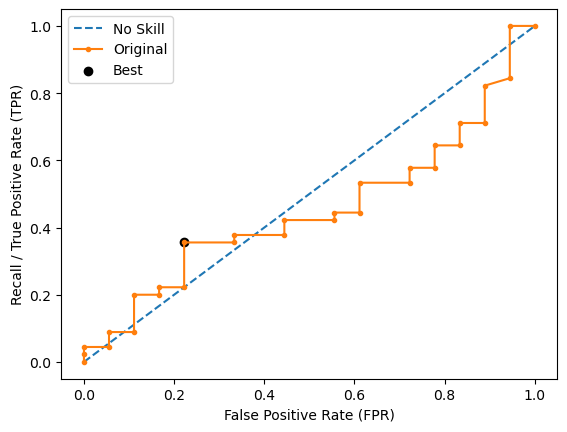

Run 4 - Random State: 3
Test Accuracy: 0.6825396825396826
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.4716981132075471
Test F-0.75 Score: 0.4863813229571985
Test F-1 Score: 0.5
Test F-1.5 Score: 0.52
Test F-2 Score: 0.5319148936170213
Test G-Mean Score: 0.6382847385042254
Best Threshold=0.473
Best Recall=0.356
Best G-Mean=0.398


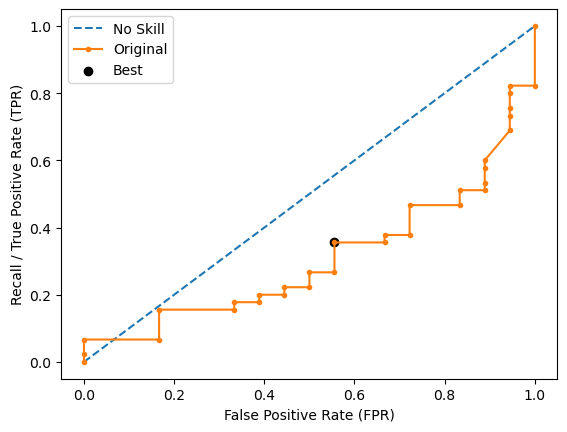

Run 5 - Random State: 4
Test Accuracy: 0.5079365079365079
Test Recall: 0.4444444444444444
Test F-0.5 Score: 0.29850746268656714
Test F-0.75 Score: 0.3194888178913738
Test F-1 Score: 0.3404255319148936
Test F-1.5 Score: 0.3741007194244604
Test F-2 Score: 0.396039603960396
Test G-Mean Score: 0.4868644955601476
Best Threshold=0.390
Best Recall=0.800
Best G-Mean=0.558


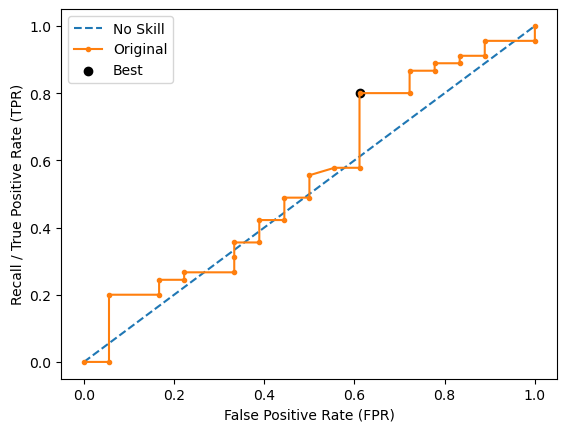

Ave Test Accuracy: 0.5460317460317461
Stdev Test Accuracy: 0.07661916435648998
Ave Test Recall: 0.5444444444444445
Stdev Test Recall: 0.07243558228002946
Ave Test F-0.5 Score: 0.35847022146209206
Stdev Test F-0.5 Score: 0.06755244492495055
Ave Test F-0.75 Score: 0.3836440539585806
Stdev Test F-0.75 Score: 0.06413216896689894
Ave Test F-1 Score: 0.4091887466779937
Stdev Test F-1 Score: 0.06114237032274307
Ave Test F-1.5 Score: 0.4513134668204569
Stdev Test F-1.5 Score: 0.05867348176024437
Ave Test F-2 Score: 0.47954686351559983
Stdev Test F-2 Score: 0.05972784196881485
Ave Test G-mean: 0.5422591968841999
Stdev Test G-mean: 0.05857779924268184
Ave Test Specificity: 0.5466666666666666
Stdev Test Specificity: 0.10726683009908593
Ave Test Precision: 0.33170904604131063
Ave Test NPV: 0.7476262182753673
Ave Runtime: 0.10421538352966309


In [186]:
ld_t04_xgb_gs, ld_t04_xgb_be, ld_t04_xgb_model_info, ld_t04_xgb_metrics_df = xgb_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours(), 'scaler': StandardScaler()}
Best Validation Score (Recall): 0.5487199572420208
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Recall) 0.9304499881663273
Std Train Score (Recall) 0.011572558157539464
GridSearchCV Runtime: 47.183682441711426 secs
Run 1 - Random State: 0
Test Accuracy: 0.5079365079365079
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.3333333333333333
Test F-0

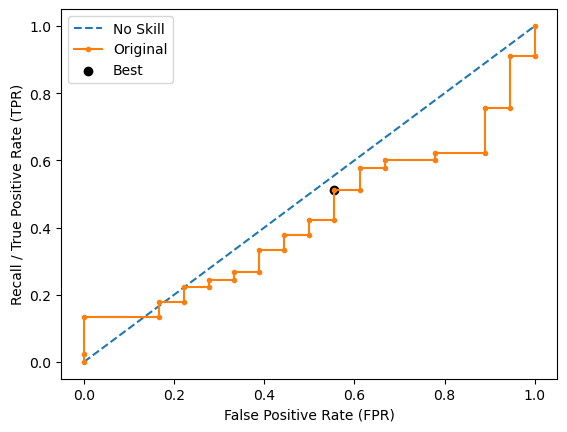

Run 2 - Random State: 1
Test Accuracy: 0.49206349206349204
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.33950617283950624
Test F-0.75 Score: 0.3726287262872629
Test F-1 Score: 0.40740740740740744
Test F-1.5 Score: 0.46732026143790856
Test F-2 Score: 0.5092592592592593
Test G-Mean Score: 0.5211573066470477
Best Threshold=0.760
Best Recall=0.444
Best G-Mean=0.544


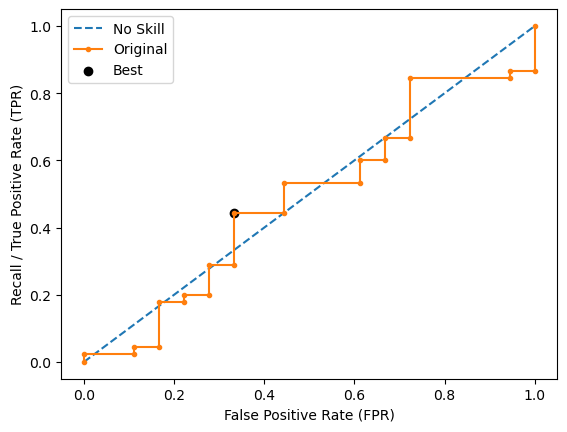

Run 3 - Random State: 2
Test Accuracy: 0.42857142857142855
Test Recall: 0.5
Test F-0.5 Score: 0.2777777777777778
Test F-0.75 Score: 0.3048780487804878
Test F-1 Score: 0.3333333333333333
Test F-1.5 Score: 0.38235294117647056
Test F-2 Score: 0.4166666666666667
Test G-Mean Score: 0.447213595499958
Best Threshold=0.597
Best Recall=0.533
Best G-Mean=0.571


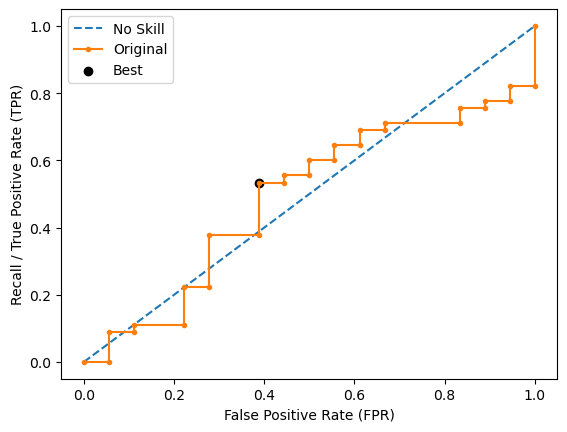

Run 4 - Random State: 3
Test Accuracy: 0.6507936507936508
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.4385964912280702
Test F-0.75 Score: 0.45787545787545797
Test F-1 Score: 0.4761904761904762
Test F-1.5 Score: 0.5038759689922481
Test F-2 Score: 0.5208333333333334
Test G-Mean Score: 0.6186404847588913
Best Threshold=0.580
Best Recall=0.289
Best G-Mean=0.420


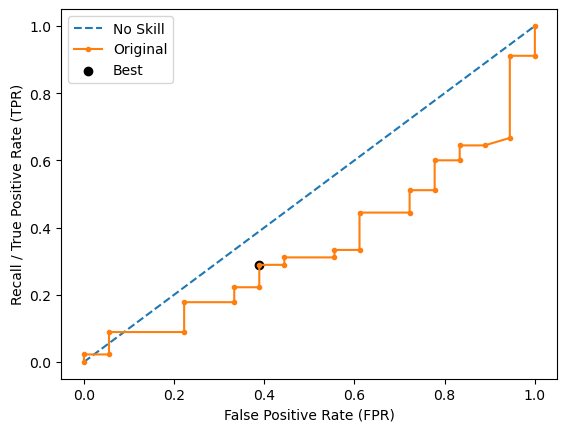

Run 5 - Random State: 4
Test Accuracy: 0.49206349206349204
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.2692307692307692
Test F-0.75 Score: 0.2868852459016394
Test F-1 Score: 0.30434782608695654
Test F-1.5 Score: 0.33211678832116787
Test F-2 Score: 0.35000000000000003
Test G-Mean Score: 0.4554200340426488
Best Threshold=0.520
Best Recall=0.467
Best G-Mean=0.534


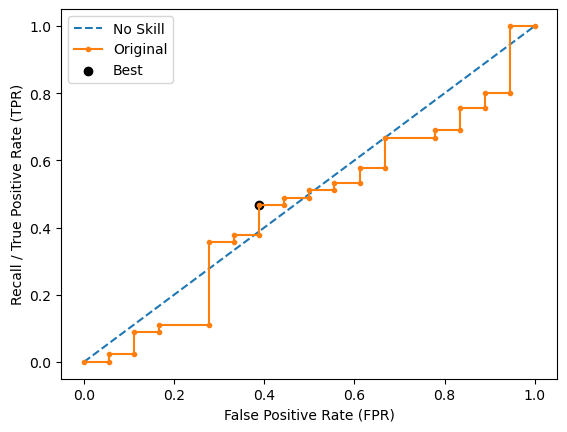

Ave Test Accuracy: 0.5142857142857143
Stdev Test Accuracy: 0.08217256574949071
Ave Test Recall: 0.5222222222222223
Stdev Test Recall: 0.0842541716005728
Ave Test F-0.5 Score: 0.3316889088818914
Stdev Test F-0.5 Score: 0.06763962258962666
Ave Test F-0.75 Score: 0.3569172638849117
Stdev Test F-0.75 Score: 0.0672330786647037
Ave Test F-1 Score: 0.3826871811526543
Stdev Test F-1 Score: 0.06711275490761907
Ave Test F-1.5 Score: 0.4255685661352189
Stdev Test F-1.5 Score: 0.0684688144379697
Ave Test F-2 Score: 0.45458994708994716
Stdev Test F-2 Score: 0.07109981540380336
Ave Test G-mean: 0.5127177455191188
Stdev Test G-mean: 0.0688038888477506
Ave Test Specificity: 0.5111111111111111
Stdev Test Specificity: 0.1111111111111111
Ave Test Precision: 0.30505050505050507
Ave Test NPV: 0.7242653642653641
Ave Runtime: 0.09906530380249023


In [187]:
ld_t04_gbm_gs, ld_t04_gbm_be, ld_t04_gbm_model_info, ld_t04_gbm_metrics_df = gbm_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

Fitting 10 folds for each of 1440 candidates, totalling 14400 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0), 'scaler': RobustScaler()}
Best Validation Score (Recall): 0.584599105967291
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Recall) 0.7682665453145512
Std Train Score (Recall) 0.03638637822100253
GridSearchCV Runtime: 454.66217732429504 secs
Run 1 - Random State: 0
Test Accuracy: 0.4603174603174603
Test Recall: 0.44444444444444

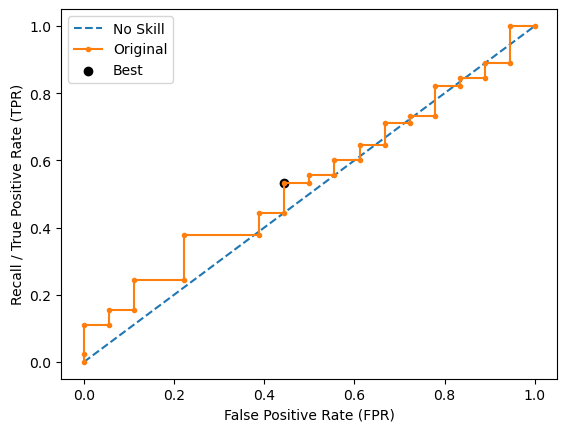

Run 2 - Random State: 1
Test Accuracy: 0.49206349206349204
Test Recall: 0.3888888888888889
Test F-0.5 Score: 0.2692307692307692
Test F-0.75 Score: 0.2868852459016394
Test F-1 Score: 0.30434782608695654
Test F-1.5 Score: 0.33211678832116787
Test F-2 Score: 0.35000000000000003
Test G-Mean Score: 0.4554200340426488
Best Threshold=0.503
Best Recall=0.467
Best G-Mean=0.534


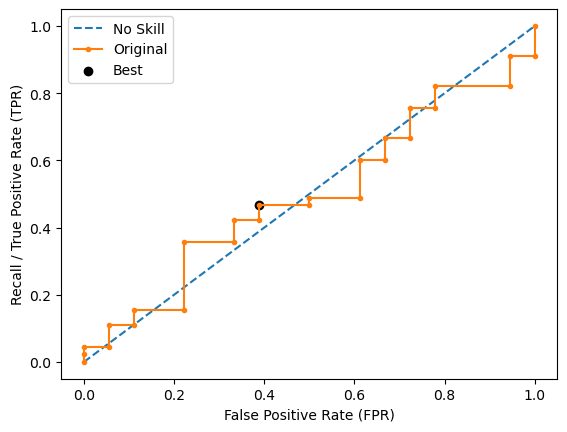

Run 3 - Random State: 2
Test Accuracy: 0.49206349206349204
Test Recall: 0.5555555555555556
Test F-0.5 Score: 0.32467532467532473
Test F-0.75 Score: 0.3541076487252125
Test F-1 Score: 0.3846153846153846
Test F-1.5 Score: 0.436241610738255
Test F-2 Score: 0.47169811320754723
Test G-Mean Score: 0.5091750772173156
Best Threshold=0.506
Best Recall=0.511
Best G-Mean=0.533


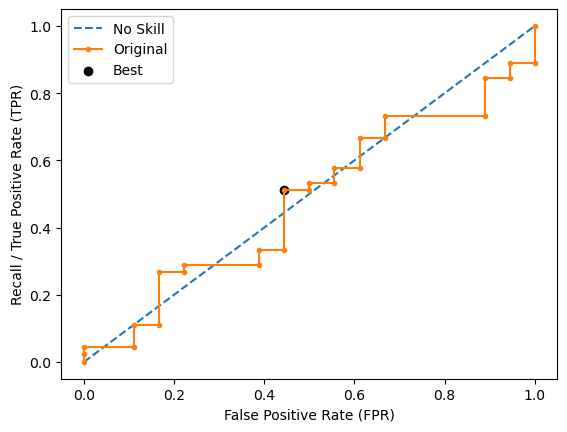

Run 4 - Random State: 3
Test Accuracy: 0.6349206349206349
Test Recall: 0.5
Test F-0.5 Score: 0.4090909090909091
Test F-0.75 Score: 0.4245283018867924
Test F-1 Score: 0.4390243902439025
Test F-1.5 Score: 0.46062992125984253
Test F-2 Score: 0.4736842105263158
Test G-Mean Score: 0.5868938953886337
Best Threshold=0.494
Best Recall=0.422
Best G-Mean=0.459


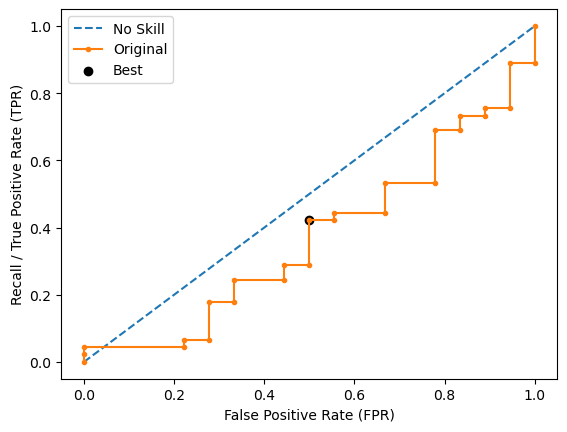

Run 5 - Random State: 4
Test Accuracy: 0.38095238095238093
Test Recall: 0.6111111111111112
Test F-0.5 Score: 0.2894736842105263
Test F-0.75 Score: 0.3235294117647059
Test F-1 Score: 0.36065573770491804
Test F-1.5 Score: 0.4281437125748503
Test F-2 Score: 0.47826086956521746
Test G-Mean Score: 0.4201704533597564
Best Threshold=0.525
Best Recall=0.444
Best G-Mean=0.567


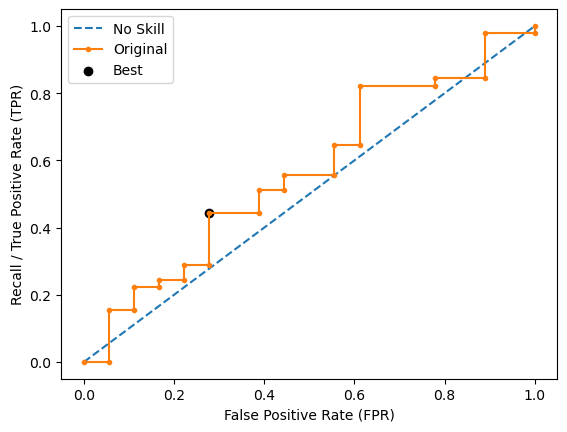

Ave Test Accuracy: 0.492063492063492
Stdev Test Accuracy: 0.09187172145071607
Ave Test Recall: 0.5
Stdev Test Recall: 0.08784104611578834
Ave Test F-0.5 Score: 0.3132886579894511
Stdev Test F-0.5 Score: 0.0577964753092364
Ave Test F-0.75 Score: 0.3371573026645721
Stdev Test F-0.75 Score: 0.05538026323469853
Ave Test F-1 Score: 0.3617286677302324
Stdev Test F-1 Score: 0.05369689098486396
Ave Test F-1.5 Score: 0.4031505445098576
Stdev Test F-1.5 Score: 0.05489138902705371
Ave Test F-2 Score: 0.43165171558289306
Stdev Test F-2 Score: 0.06004639230907932
Ave Test G-mean: 0.48541589881020075
Stdev Test G-mean: 0.06503605597375772
Ave Test Specificity: 0.48888888888888893
Stdev Test Specificity: 0.14401645996461912
Ave Test Precision: 0.2882471896746565
Ave Test NPV: 0.7024543143174956
Ave Runtime: 0.28266067504882814


In [188]:
ld_t04_rf_gs, ld_t04_rf_be, ld_t04_rf_model_info, ld_t04_rf_metrics_df = rf_class2(ld_t04, g_mean_scorer,
                                                            'ageing_class', random_state=0)

In [189]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']
# model_vars = ['dt', 'rf', 'lgbm', 'xgb', 'adaboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
#     'Classifier model': [
#         'Decision Tree', 'Random Forest',
#         'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
#         'AdaBoost'
#     ],
    'Best Hyperparameters': [],
    'Mean Val Score': [],
    'Mean Train Score': [],
    'Stdev Train Score': [],
    'Average Runtime': [],
    'Average Test G-mean': [],
    'Stdev Test G-mean': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Stdev Test Recall': [],
    'Average Test NPV': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Test Precision': [],
    'Average Test F-0.5 Score': [],
    'Average Test F-0.75 Score': [],
    'Average Test F-1 Score': [],
    'Average Test F-1.5 Score': [],
    'Average Test F-2 Score': []
}
    
prefix = 'ld_t04_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Mean Val Score'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Mean Train Score'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Score'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])
    var_df['Stdev Test G-mean'].append(globals()[prefix+name+'_model_info']['stdev_test_g_mean'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Stdev Test Recall'].append(globals()[prefix+name+'_model_info']['stdev_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Average Test F-0.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt5_score'])
    var_df['Average Test F-0.75 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_0pt75_score'])
    var_df['Average Test F-1 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1_score'])
    var_df['Average Test F-1.5 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_1pt5_score'])
    var_df['Average Test F-2 Score'].append(globals()[prefix+name+'_model_info']['average_test_f_2_score'])


# display(ho_t02_model_summ)
ld_t04_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']


# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

ld_t04_summ[[
    'Classifier model', 'Average Test G-mean', 'Stdev Test G-mean',
    'Mean Val Score', 'Mean Train Score',
    'Average Test Recall', 'Stdev Test Recall',
    'Average Test Accuracy', 'Stdev Test Accuracy',
    'Average Test F-0.5 Score', 'Average Test F-0.75 Score', 'Average Test F-1 Score',
    'Average Test F-1.5 Score', 'Average Test F-2 Score',
]].sort_values(by='Average Test G-mean', ascending=False)

,Classifier model,Average Test G-mean,Stdev Test G-mean,Mean Val Score,Mean Train Score,Average Test Recall,Stdev Test Recall,Average Test Accuracy,Stdev Test Accuracy,Average Test F-0.5 Score,Average Test F-0.75 Score,Average Test F-1 Score,Average Test F-1.5 Score,Average Test F-2 Score
6,LightGBM,0.548644,0.091134,0.606448,0.806918,0.577778,0.198762,0.552381,0.060858,0.359826,0.388259,0.417401,0.466153,0.499375
7,Extreme Gradient Boosting (XGBoost),0.542259,0.058578,0.591109,0.901482,0.544444,0.072436,0.546032,0.076619,0.358470,0.383644,0.409189,0.451313,0.479547
8,AdaBoost,0.540055,0.042234,0.556499,0.927627,0.544444,0.046481,0.539683,0.050195,0.350634,0.377246,0.404178,0.448347,0.477732
9,CatBoost,0.519437,0.019641,0.556857,0.933627,0.477778,0.063343,0.546032,0.050942,0.335027,0.355151,0.375343,0.408089,0.429624
5,Gradient Boosting Machine (GBM),0.512718,0.068804,0.548720,0.930450,0.522222,0.084254,0.514286,0.082173,0.331689,0.356917,0.382687,0.425569,0.454590
4,Random Forest,0.485416,0.065036,0.584599,0.768267,0.500000,0.087841,0.492063,0.091872,0.313289,0.337157,0.361729,0.403151,0.431652
2,Logistic Regression,0.480836,0.087183,0.564890,0.625385,0.377778,0.120442,0.555556,0.064476,0.301984,0.313922,0.325432,0.343193,0.354319
0,k-Nearest Neighbors,0.442794,0.074395,0.596346,0.661910,0.288889,0.091287,0.574603,0.049436,0.273797,0.276409,0.278855,0.282467,0.284622
1,SVM Classifier,0.442421,0.101333,0.571542,0.471970,0.455556,0.181727,0.447619,0.079682,0.269009,0.292594,0.317040,0.358497,0.387106
3,Decision Tree,0.384560,0.113938,0.595573,0.600344,0.322222,0.233730,0.520635,0.103723,0.231311,0.239643,0.249896,0.269584,0.284314
